<a href="https://colab.research.google.com/github/MohammadAli-Balaj/SRGAN_SHAHBAZ_AMNA/blob/main/SRGAN_Face_Male_Femal_Final_Version.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Shahbaz Amna
## Artificial Neural Networks and Deep Learning II
### SRGANs for generating high quality images
#### Using Adam optimizer 50 epochs and each image as a batch (batch size = 1)

## GPU information:

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


## Importing libraries:

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras import layers, Model
from sklearn.model_selection import train_test_split
from keras import Model
from keras.layers import Conv2D, PReLU,BatchNormalization, Flatten
from keras.layers import UpSampling2D, LeakyReLU, Dense, Input, add
from keras.models import load_model
from numpy.random import randint
from keras.applications import VGG19
from tqdm import tqdm

## Accessing drive data:

In [ ]:
from google.colab import drive
drive.mount('data',force_remount=True)

Mounted at data


## Generator and discriminator blocks: 

In [ ]:
def res_block(ip):
    
    res_model = Conv2D(64, (3,3), padding = "same")(ip)
    res_model = BatchNormalization(momentum = 0.5)(res_model)
    res_model = PReLU(shared_axes = [1,2])(res_model)
    
    res_model = Conv2D(64, (3,3), padding = "same")(res_model)
    res_model = BatchNormalization(momentum = 0.5)(res_model)
    
    return add([ip,res_model])

def upscale_block(ip):
    
    up_model = Conv2D(256, (3,3), padding="same")(ip)
    up_model = UpSampling2D( size = 2 )(up_model)
    up_model = PReLU(shared_axes=[1,2])(up_model)
    
    return up_model


def create_gen(gen_ip, num_res_block):
    layers = Conv2D(64, (9,9), padding="same")(gen_ip)
    layers = PReLU(shared_axes=[1,2])(layers)

    temp = layers

    for i in range(num_res_block):
        layers = res_block(layers)

    layers = Conv2D(64, (3,3), padding="same")(layers)
    layers = BatchNormalization(momentum=0.5)(layers)
    layers = add([layers,temp])

    layers = upscale_block(layers)
    layers = upscale_block(layers)

    op = Conv2D(3, (9,9), padding="same")(layers)

    return Model(inputs=gen_ip, outputs=op)


def discriminator_block(ip, filters, strides=1, bn=True):
    
    disc_model = Conv2D(filters, (3,3), strides = strides, padding="same")(ip)
    
    if bn:
        disc_model = BatchNormalization( momentum=0.8 )(disc_model)
    
    disc_model = LeakyReLU( alpha=0.2 )(disc_model)
    
    return disc_model



def create_disc(disc_ip):

    df = 64
    
    d1 = discriminator_block(disc_ip, df, bn=False)
    d2 = discriminator_block(d1, df, strides=2)
    d3 = discriminator_block(d2, df*2)
    d4 = discriminator_block(d3, df*2, strides=2)
    d5 = discriminator_block(d4, df*4)
    d6 = discriminator_block(d5, df*4, strides=2)
    d7 = discriminator_block(d6, df*8)
    d8 = discriminator_block(d7, df*8, strides=2)
    
    d8_5 = Flatten()(d8)
    d9 = Dense(df*16)(d8_5)
    d10 = LeakyReLU(alpha=0.2)(d9)
    validity = Dense(1, activation='sigmoid')(d10)

    return Model(disc_ip, validity)


## VGG generated features and building combined model:

In [ ]:
def build_vgg(hr_shape):
    
    vgg = VGG19(weights="imagenet",include_top=False, input_shape=hr_shape)
    
    return Model(inputs=vgg.inputs, outputs=vgg.layers[10].output)


def create_comb(gen_model, disc_model, vgg, lr_ip, hr_ip):
    gen_img = gen_model(lr_ip)
    
    gen_features = vgg(gen_img)
    
    disc_model.trainable = False
    validity = disc_model(gen_img)
    
    return Model(inputs=[lr_ip, hr_ip], outputs=[validity, gen_features])


## Image preprocessing:

In [ ]:
lr_images = []
for img in range(1,1001):
  img_lr = cv2.imread("/content/data/MyDrive/data/low/" + str(img) + ".jpg")
  img_lr = cv2.cvtColor(img_lr, cv2.COLOR_BGR2RGB)
  lr_images.append(img_lr)
  


In [ ]:
hr_images = []
for img in range(1,1001):
  img_hr = cv2.imread("/content/data/MyDrive/data/high/" + str(img) + ".jpg")
  img_hr = cv2.cvtColor(img_hr, cv2.COLOR_BGR2RGB)
  hr_images.append(img_hr)

## Data samples:

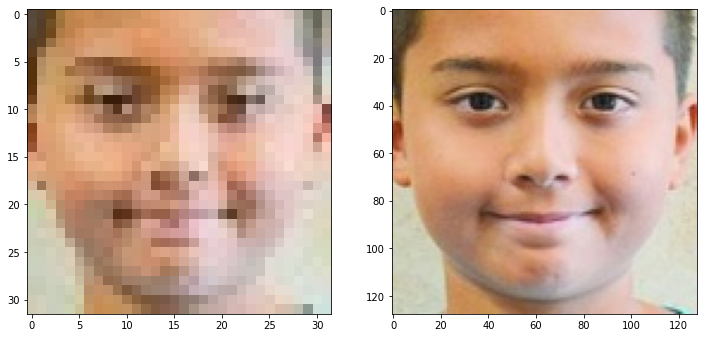

In [ ]:
lr_images = np.array(lr_images)
hr_images = np.array(hr_images)


image_number = random.randint(0, len(lr_images)-1)
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(np.reshape(lr_images[image_number], (32, 32, 3)))
plt.subplot(122)
plt.imshow(np.reshape(hr_images[image_number], (128, 128, 3)))
plt.show()

## Normalization:

In [ ]:
lr_images = lr_images / 255.
hr_images = hr_images / 255.

## Training

In [ ]:
lr_train, lr_test, hr_train, hr_test = train_test_split(lr_images, hr_images, 
                                                      test_size=0.33, random_state=42)


hr_shape = (hr_train.shape[1], hr_train.shape[2], hr_train.shape[3])
lr_shape = (lr_train.shape[1], lr_train.shape[2], lr_train.shape[3])

lr_ip = Input(shape=lr_shape)
hr_ip = Input(shape=hr_shape)

generator = create_gen(lr_ip, num_res_block = 16)
generator.summary()

discriminator = create_disc(hr_ip)
discriminator.compile(loss="binary_crossentropy", optimizer="adam", metrics=['accuracy'])
discriminator.summary()

vgg = build_vgg((128,128,3))
print(vgg.summary())
vgg.trainable = False

gan_model = create_comb(generator, discriminator, vgg, lr_ip, hr_ip)

gan_model.compile(loss=["binary_crossentropy", "mse"], loss_weights=[1e-3, 1], optimizer="adam")
gan_model.summary()

batch_size = 1  
train_lr_batches = []
train_hr_batches = []
for it in range(int(hr_train.shape[0] / batch_size)):
    start_idx = it * batch_size
    end_idx = start_idx + batch_size
    train_hr_batches.append(hr_train[start_idx:end_idx])
    train_lr_batches.append(lr_train[start_idx:end_idx])
    
    
epochs = 50

for e in range(epochs):
    
    fake_label = np.zeros((batch_size, 1)) 
    real_label = np.ones((batch_size,1)) 
    

    g_losses = []
    d_losses = []
    
 
    for b in tqdm(range(len(train_hr_batches))):
        lr_imgs = train_lr_batches[b] 
        hr_imgs = train_hr_batches[b] 
        
        fake_imgs = generator.predict_on_batch(lr_imgs) 
        
 
        discriminator.trainable = True
        d_loss_gen = discriminator.train_on_batch(fake_imgs, fake_label)
        d_loss_real = discriminator.train_on_batch(hr_imgs, real_label)
        

        discriminator.trainable = False
        

        d_loss = 0.5 * np.add(d_loss_gen, d_loss_real) 
        

        image_features = vgg.predict(hr_imgs)
     

        g_loss, _, _ = gan_model.train_on_batch([lr_imgs, hr_imgs], [real_label, image_features])
        
 
        d_losses.append(d_loss)
        g_losses.append(g_loss)
        
   
    g_losses = np.array(g_losses)
    d_losses = np.array(d_losses)
    

    g_loss = np.sum(g_losses, axis=0) / len(g_losses)
    d_loss = np.sum(d_losses, axis=0) / len(d_losses)
    

    print("epoch:", e+1 ,"g_loss:", g_loss, "d_loss:", d_loss)

    if (e+1) % 10 == 0: 
      generator.save("gen_e_"+ str(e+1) +".h5")

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d_45 (Conv2D)             (None, 32, 32, 64)   15616       ['input_4[0][0]']                
                                                                                                  
 p_re_lu_19 (PReLU)             (None, 32, 32, 64)   64          ['conv2d_45[0][0]']              
                                                                                                  
 conv2d_46 (Conv2D)             (None, 32, 32, 64)   36928       ['p_re_lu_19[0][0]']             
                                                                                            

  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 77ms/step


  0%|          | 1/670 [00:06<1:08:47,  6.17s/it]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:06<29:25,  2.64s/it]  

1/1 [==============================] - 0s 16ms/step


  0%|          | 3/670 [00:06<16:47,  1.51s/it]

1/1 [==============================] - 0s 16ms/step


  1%|          | 4/670 [00:06<10:50,  1.02it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 5/670 [00:06<07:31,  1.47it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 6/670 [00:06<05:30,  2.01it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:07<04:13,  2.62it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 8/670 [00:07<03:22,  3.27it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:07<02:48,  3.91it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 10/670 [00:07<02:26,  4.50it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:07<02:10,  5.06it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 12/670 [00:07<01:59,  5.48it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 13/670 [00:07<01:51,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 14/670 [00:08<01:44,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:08<01:41,  6.48it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 16/670 [00:08<01:39,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:08<01:37,  6.68it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 18/670 [00:08<01:36,  6.78it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 19/670 [00:08<01:35,  6.79it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 20/670 [00:08<01:34,  6.85it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 21/670 [00:09<01:35,  6.83it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 22/670 [00:09<01:34,  6.86it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:09<01:33,  6.92it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:09<01:33,  6.91it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 25/670 [00:09<01:34,  6.84it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 26/670 [00:09<01:33,  6.86it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 27/670 [00:09<01:34,  6.79it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:10<01:33,  6.85it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:10<01:33,  6.88it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 30/670 [00:10<01:32,  6.90it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 31/670 [00:10<01:31,  6.97it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:10<01:31,  6.94it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 33/670 [00:10<01:32,  6.85it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 34/670 [00:11<01:32,  6.91it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 35/670 [00:11<01:34,  6.71it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 36/670 [00:11<01:34,  6.70it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:11<01:35,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 38/670 [00:11<01:34,  6.71it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:11<01:33,  6.74it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:11<01:33,  6.77it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 41/670 [00:12<01:33,  6.70it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 42/670 [00:12<01:33,  6.72it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 43/670 [00:12<01:32,  6.80it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 44/670 [00:12<01:31,  6.82it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 45/670 [00:12<01:31,  6.86it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 46/670 [00:12<01:29,  6.94it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:12<01:30,  6.91it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 48/670 [00:13<01:30,  6.86it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 49/670 [00:13<01:29,  6.92it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 50/670 [00:13<01:29,  6.90it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:13<01:29,  6.89it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 52/670 [00:13<01:29,  6.94it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:13<01:28,  6.94it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:13<01:30,  6.79it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:14<01:29,  6.88it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:14<01:28,  6.93it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 57/670 [00:14<01:28,  6.90it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 58/670 [00:14<01:28,  6.91it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:14<01:28,  6.89it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:14<01:28,  6.89it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:14<01:29,  6.80it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 62/670 [00:15<01:29,  6.80it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:15<01:29,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:15<01:28,  6.81it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:15<01:30,  6.66it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 66/670 [00:15<01:30,  6.70it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:15<01:29,  6.77it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 68/670 [00:15<01:28,  6.84it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 69/670 [00:16<01:27,  6.83it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 70/670 [00:16<01:26,  6.91it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:16<01:29,  6.72it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:16<01:28,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 73/670 [00:16<01:28,  6.78it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:16<01:27,  6.81it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 75/670 [00:17<01:26,  6.85it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 76/670 [00:17<01:26,  6.88it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 77/670 [00:17<01:26,  6.84it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:17<01:25,  6.89it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:17<01:25,  6.88it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:17<01:25,  6.87it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 81/670 [00:17<01:24,  6.95it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 82/670 [00:18<01:25,  6.90it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:18<02:28,  3.94it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 84/670 [00:18<02:09,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 85/670 [00:18<01:56,  5.01it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 86/670 [00:18<01:48,  5.41it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:19<01:40,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 88/670 [00:19<01:34,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:19<01:31,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 90/670 [00:19<01:29,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:19<01:28,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:19<01:27,  6.58it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 93/670 [00:20<01:26,  6.66it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 94/670 [00:20<01:25,  6.75it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:20<01:24,  6.80it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 96/670 [00:20<01:24,  6.83it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:20<01:23,  6.83it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 98/670 [00:20<01:24,  6.78it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 99/670 [00:20<01:25,  6.64it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 100/670 [00:21<01:25,  6.67it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 101/670 [00:21<01:23,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 102/670 [00:21<01:23,  6.78it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 103/670 [00:21<01:25,  6.61it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 104/670 [00:21<01:25,  6.63it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 105/670 [00:21<01:24,  6.72it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 106/670 [00:21<01:25,  6.60it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:22<01:27,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:22<01:25,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 109/670 [00:22<01:26,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:22<01:24,  6.64it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 111/670 [00:22<01:23,  6.68it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 112/670 [00:22<01:22,  6.72it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 113/670 [00:22<01:22,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 114/670 [00:23<01:21,  6.81it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:23<01:21,  6.83it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 116/670 [00:23<01:21,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:23<01:23,  6.66it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 118/670 [00:23<01:21,  6.74it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 119/670 [00:23<01:21,  6.74it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:24<01:21,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 121/670 [00:24<01:22,  6.69it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 122/670 [00:24<01:21,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:24<01:20,  6.80it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 124/670 [00:24<01:20,  6.82it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:24<01:19,  6.87it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:24<01:21,  6.69it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 127/670 [00:25<01:20,  6.71it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 128/670 [00:25<01:20,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:25<01:20,  6.70it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:25<01:21,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 131/670 [00:25<01:22,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:25<01:21,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:25<01:20,  6.71it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:26<01:18,  6.80it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 135/670 [00:26<01:17,  6.93it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:26<01:17,  6.93it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 137/670 [00:26<01:16,  6.96it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 138/670 [00:26<01:16,  6.97it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 139/670 [00:26<01:18,  6.74it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:26<01:17,  6.81it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:27<01:19,  6.65it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 142/670 [00:27<01:19,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 143/670 [00:27<01:18,  6.72it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:27<01:18,  6.71it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 145/670 [00:27<01:18,  6.67it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 146/670 [00:27<01:21,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 147/670 [00:28<01:22,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:28<01:22,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 149/670 [00:28<01:24,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 150/670 [00:28<01:22,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 151/670 [00:28<01:23,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 152/670 [00:28<01:24,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 153/670 [00:29<01:22,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:29<01:21,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:29<01:21,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 156/670 [00:29<01:21,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 157/670 [00:29<01:20,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:29<01:19,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 159/670 [00:29<01:19,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 160/670 [00:30<01:20,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:30<01:20,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:30<01:18,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:30<01:16,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 164/670 [00:30<01:15,  6.67it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 165/670 [00:30<01:16,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 166/670 [00:31<01:14,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 167/670 [00:31<01:14,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 168/670 [00:31<01:14,  6.75it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:31<01:13,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 170/670 [00:31<01:13,  6.82it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:31<01:12,  6.84it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:31<01:13,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 173/670 [00:32<01:13,  6.73it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 174/670 [00:32<01:14,  6.66it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 175/670 [00:32<01:14,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 176/670 [00:32<01:13,  6.70it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:32<01:12,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 178/670 [00:32<01:12,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 179/670 [00:32<01:12,  6.81it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 180/670 [00:33<01:11,  6.82it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 181/670 [00:33<01:12,  6.78it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 182/670 [00:33<01:12,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 183/670 [00:33<01:13,  6.63it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:33<01:13,  6.63it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:33<01:12,  6.70it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 186/670 [00:33<01:11,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 187/670 [00:34<01:11,  6.76it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 188/670 [00:34<01:11,  6.77it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 189/670 [00:34<01:10,  6.84it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 190/670 [00:34<01:10,  6.84it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 191/670 [00:34<01:11,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 192/670 [00:34<01:11,  6.68it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 193/670 [00:35<01:11,  6.70it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:35<01:10,  6.76it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:35<01:10,  6.78it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 196/670 [00:35<01:08,  6.87it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:35<01:09,  6.82it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:35<01:09,  6.83it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 199/670 [00:35<01:08,  6.88it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:36<01:08,  6.84it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 201/670 [00:36<01:08,  6.81it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 202/670 [00:36<01:10,  6.67it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 203/670 [00:36<01:09,  6.75it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 204/670 [00:36<01:09,  6.72it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 205/670 [00:36<01:08,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 206/670 [00:36<01:08,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 207/670 [00:37<01:08,  6.72it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 208/670 [00:37<01:08,  6.76it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 209/670 [00:37<01:10,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 210/670 [00:37<01:09,  6.61it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 211/670 [00:37<01:09,  6.63it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 212/670 [00:37<01:09,  6.62it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 213/670 [00:38<01:08,  6.71it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 214/670 [00:38<01:07,  6.77it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 215/670 [00:38<01:07,  6.72it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 216/670 [00:38<01:07,  6.70it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:38<01:07,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 218/670 [00:38<01:06,  6.80it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 219/670 [00:38<01:06,  6.81it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:39<01:05,  6.83it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:39<01:06,  6.78it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 222/670 [00:39<01:05,  6.79it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 223/670 [00:39<01:05,  6.86it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 224/670 [00:39<01:05,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:39<01:06,  6.69it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 226/670 [00:39<01:06,  6.72it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 227/670 [00:40<01:05,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:40<01:05,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 229/670 [00:40<01:04,  6.81it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:40<01:03,  6.88it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 231/670 [00:40<01:04,  6.85it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:40<01:04,  6.82it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 233/670 [00:40<01:03,  6.84it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:41<01:03,  6.85it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 235/670 [00:41<01:04,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 236/670 [00:41<01:04,  6.70it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:41<01:04,  6.73it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 238/670 [00:41<01:03,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 239/670 [00:41<01:03,  6.74it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 240/670 [00:41<01:04,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:42<01:04,  6.64it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:42<01:05,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 243/670 [00:42<01:04,  6.63it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:42<01:04,  6.65it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:42<01:03,  6.68it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 246/670 [00:42<01:02,  6.76it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 247/670 [00:43<01:01,  6.83it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 248/670 [00:43<01:01,  6.86it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 249/670 [00:43<01:00,  6.91it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:43<01:00,  6.90it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:43<01:01,  6.81it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 252/670 [00:43<01:01,  6.83it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 253/670 [00:43<01:01,  6.77it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 254/670 [00:44<01:01,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 255/670 [00:44<01:00,  6.84it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 256/670 [00:44<01:00,  6.86it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:44<01:00,  6.82it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:44<01:00,  6.77it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 259/670 [00:44<01:00,  6.83it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 260/670 [00:44<00:59,  6.84it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 261/670 [00:45<00:59,  6.85it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:45<01:00,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 263/670 [00:45<01:00,  6.73it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 264/670 [00:45<00:59,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:45<00:59,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 266/670 [00:45<01:00,  6.68it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 267/670 [00:45<00:59,  6.81it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 268/670 [00:46<00:59,  6.80it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 269/670 [00:46<00:59,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 270/670 [00:46<00:58,  6.82it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 271/670 [00:46<00:59,  6.68it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 272/670 [00:46<00:58,  6.78it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 273/670 [00:46<00:58,  6.78it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:47<00:59,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 275/670 [00:47<00:58,  6.75it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 276/670 [00:47<00:57,  6.80it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 277/670 [00:47<00:58,  6.76it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:47<00:57,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 279/670 [00:47<00:57,  6.75it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:47<00:57,  6.74it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 281/670 [00:48<00:56,  6.84it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:48<00:57,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 283/670 [00:48<00:56,  6.80it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:48<00:57,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 285/670 [00:48<00:57,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 286/670 [00:48<00:57,  6.73it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:48<00:57,  6.72it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 288/670 [00:49<00:56,  6.76it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:49<00:55,  6.81it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:49<00:55,  6.85it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 291/670 [00:49<00:55,  6.87it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 292/670 [00:49<00:56,  6.65it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 293/670 [00:49<00:57,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 294/670 [00:49<00:56,  6.69it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 295/670 [00:50<00:55,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 296/670 [00:50<00:54,  6.81it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:50<00:55,  6.77it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 298/670 [00:50<00:54,  6.82it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 299/670 [00:50<00:54,  6.81it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:50<00:54,  6.84it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:50<00:54,  6.83it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 302/670 [00:51<00:54,  6.76it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 303/670 [00:51<00:53,  6.81it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 304/670 [00:51<00:53,  6.81it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 305/670 [00:51<00:53,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 306/670 [00:51<00:54,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 307/670 [00:51<00:53,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 308/670 [00:52<00:54,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:52<00:54,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 310/670 [00:52<00:53,  6.67it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 311/670 [00:52<00:54,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 312/670 [00:52<00:54,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:52<00:54,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 314/670 [00:52<00:53,  6.60it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:53<00:53,  6.65it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 316/670 [00:53<00:52,  6.75it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 317/670 [00:53<00:51,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 318/670 [00:53<00:52,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:53<00:51,  6.75it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 320/670 [00:53<00:51,  6.77it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:53<00:51,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:54<00:50,  6.82it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<00:51,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 324/670 [00:54<00:52,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 325/670 [00:54<00:51,  6.69it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 326/670 [00:54<00:51,  6.70it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 327/670 [00:54<00:50,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:55<00:50,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 329/670 [00:55<00:50,  6.74it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:55<00:50,  6.71it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 331/670 [00:55<00:50,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 332/670 [00:55<00:50,  6.71it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:55<00:50,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 334/670 [00:55<00:50,  6.65it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:56<00:50,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 336/670 [00:56<00:50,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 337/670 [00:56<00:49,  6.66it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:56<00:49,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 339/670 [00:56<00:49,  6.69it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 340/670 [00:56<00:49,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 341/670 [00:56<00:49,  6.66it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 342/670 [00:57<00:48,  6.72it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 343/670 [00:57<00:48,  6.76it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 344/670 [00:57<00:47,  6.82it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 345/670 [00:57<00:48,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:57<00:48,  6.66it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 347/670 [00:57<00:47,  6.74it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 348/670 [00:58<00:48,  6.66it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 349/670 [00:58<00:47,  6.71it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 350/670 [00:58<00:48,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 351/670 [00:58<00:48,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:58<00:47,  6.65it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 353/670 [00:58<00:47,  6.63it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 354/670 [00:58<00:47,  6.60it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 355/670 [00:59<00:48,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 356/670 [00:59<00:47,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [00:59<00:47,  6.60it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [00:59<00:47,  6.60it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [00:59<00:46,  6.64it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 360/670 [00:59<00:46,  6.64it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 361/670 [00:59<00:46,  6.70it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 362/670 [01:00<00:45,  6.77it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 363/670 [01:00<00:45,  6.81it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 364/670 [01:00<00:44,  6.84it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [01:00<00:44,  6.81it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 366/670 [01:00<00:44,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [01:00<00:44,  6.74it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [01:01<00:45,  6.70it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:01<00:44,  6.80it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 370/670 [01:01<00:44,  6.70it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:01<00:44,  6.68it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:01<00:44,  6.66it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 373/670 [01:01<00:44,  6.64it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 374/670 [01:01<00:45,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 375/670 [01:02<00:45,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 376/670 [01:02<00:45,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [01:02<00:44,  6.58it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 378/670 [01:02<00:44,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 379/670 [01:02<00:44,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:02<00:44,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:02<00:43,  6.67it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:03<00:42,  6.74it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 383/670 [01:03<00:42,  6.72it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:03<00:42,  6.75it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:03<00:42,  6.71it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:03<00:42,  6.74it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:03<00:42,  6.63it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 388/670 [01:04<00:42,  6.68it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:04<00:42,  6.64it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 390/670 [01:04<00:41,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:04<00:41,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 392/670 [01:04<00:41,  6.76it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 393/670 [01:04<00:41,  6.70it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 394/670 [01:04<00:41,  6.67it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 395/670 [01:05<00:40,  6.71it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 396/670 [01:05<00:40,  6.74it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 397/670 [01:05<00:40,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:05<00:40,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:05<00:40,  6.74it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:05<00:40,  6.69it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:05<00:40,  6.56it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 402/670 [01:06<00:40,  6.66it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 403/670 [01:06<00:40,  6.67it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:06<00:40,  6.64it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:06<00:40,  6.58it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 406/670 [01:06<00:40,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:06<00:39,  6.65it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:07<00:39,  6.60it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:07<00:39,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:07<00:39,  6.66it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 411/670 [01:07<00:39,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:07<00:38,  6.63it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:07<00:38,  6.63it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 414/670 [01:07<00:38,  6.72it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 415/670 [01:08<00:37,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 416/670 [01:08<00:37,  6.74it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:08<00:40,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 418/670 [01:08<00:42,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 419/670 [01:08<00:44,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 420/670 [01:08<00:45,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 421/670 [01:09<00:46,  5.37it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 422/670 [01:09<00:48,  5.11it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 423/670 [01:09<00:47,  5.15it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 424/670 [01:09<00:49,  4.93it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 425/670 [01:09<00:47,  5.14it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 426/670 [01:10<00:46,  5.29it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 427/670 [01:10<00:45,  5.37it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:10<00:44,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 429/670 [01:10<00:42,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 430/670 [01:10<00:41,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:11<00:41,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 432/670 [01:11<00:41,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:11<00:40,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 434/670 [01:11<00:39,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:11<00:39,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 436/670 [01:11<00:39,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 437/670 [01:12<00:40,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 438/670 [01:12<00:39,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 439/670 [01:12<00:39,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 440/670 [01:12<00:39,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 441/670 [01:12<00:38,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:12<00:37,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:12<00:35,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 444/670 [01:13<00:35,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 445/670 [01:13<00:34,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:13<00:33,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:13<00:33,  6.61it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 448/670 [01:13<00:33,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 449/670 [01:13<00:34,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 450/670 [01:14<00:33,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:14<00:33,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 452/670 [01:14<00:33,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:14<00:33,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:14<00:32,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 455/670 [01:14<00:32,  6.65it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:14<00:32,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 457/670 [01:15<00:32,  6.60it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:15<00:32,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:15<00:31,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 460/670 [01:15<00:31,  6.57it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 461/670 [01:15<00:33,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 462/670 [01:15<00:34,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 463/670 [01:16<00:34,  5.92it/s]

1/1 [==============================] - 0s 56ms/step


 69%|██████▉   | 464/670 [01:16<00:39,  5.23it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 465/670 [01:16<00:44,  4.58it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 466/670 [01:16<00:41,  4.96it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:16<00:37,  5.39it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 468/670 [01:17<00:35,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 469/670 [01:17<00:33,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 470/670 [01:17<00:32,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 471/670 [01:17<00:31,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 472/670 [01:17<00:30,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 473/670 [01:17<00:30,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:17<00:29,  6.62it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 475/670 [01:18<00:29,  6.66it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 476/670 [01:18<00:29,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:18<00:29,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:18<00:29,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 479/670 [01:18<00:28,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 480/670 [01:18<00:29,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:19<00:28,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 482/670 [01:19<00:28,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 483/670 [01:19<00:27,  6.72it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:19<00:27,  6.67it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 485/670 [01:19<00:27,  6.63it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 486/670 [01:19<00:27,  6.63it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:19<00:27,  6.69it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:20<00:27,  6.66it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 489/670 [01:20<00:27,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 490/670 [01:20<00:26,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 491/670 [01:20<00:27,  6.61it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:20<00:26,  6.67it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 493/670 [01:20<00:26,  6.76it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 494/670 [01:20<00:25,  6.80it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:21<00:26,  6.61it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:21<00:26,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:21<00:26,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:21<00:26,  6.58it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 499/670 [01:21<00:27,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 500/670 [01:21<00:28,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 501/670 [01:22<00:28,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 502/670 [01:22<00:29,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 503/670 [01:22<00:30,  5.54it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 504/670 [01:22<00:29,  5.71it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 505/670 [01:22<00:29,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 506/670 [01:23<00:29,  5.50it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 507/670 [01:23<00:30,  5.38it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 508/670 [01:23<00:29,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:23<00:29,  5.43it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 510/670 [01:23<00:28,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 511/670 [01:23<00:27,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 512/670 [01:24<00:26,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 513/670 [01:24<00:25,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 514/670 [01:24<00:25,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 515/670 [01:24<00:24,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:24<00:23,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:24<00:23,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:25<00:23,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:25<00:23,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:25<00:22,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 521/670 [01:25<00:22,  6.61it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:25<00:22,  6.66it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:25<00:21,  6.69it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 524/670 [01:25<00:21,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 525/670 [01:26<00:21,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 526/670 [01:26<00:21,  6.68it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 527/670 [01:26<00:21,  6.79it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 528/670 [01:26<00:20,  6.76it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 529/670 [01:26<00:20,  6.77it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 530/670 [01:26<00:20,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 531/670 [01:26<00:20,  6.79it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:27<00:20,  6.81it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 533/670 [01:27<00:20,  6.83it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 534/670 [01:27<00:20,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 535/670 [01:27<00:19,  6.82it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:27<00:19,  6.75it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 537/670 [01:27<00:19,  6.67it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 538/670 [01:27<00:19,  6.66it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:28<00:20,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 540/670 [01:28<00:21,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 541/670 [01:28<00:21,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 542/670 [01:28<00:21,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 543/670 [01:28<00:21,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 544/670 [01:28<00:20,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 545/670 [01:29<00:19,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:29<00:19,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:29<00:19,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 548/670 [01:29<00:18,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:29<00:18,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 550/670 [01:29<00:18,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:30<00:18,  6.60it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:30<00:17,  6.63it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 553/670 [01:30<00:17,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 554/670 [01:30<00:17,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 555/670 [01:30<00:17,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 556/670 [01:30<00:17,  6.61it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:30<00:17,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 558/670 [01:31<00:17,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:31<00:18,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:31<00:18,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 561/670 [01:31<00:18,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 562/670 [01:31<00:18,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 563/670 [01:32<00:18,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 564/670 [01:32<00:17,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 565/670 [01:32<00:16,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 566/670 [01:32<00:16,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:32<00:16,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 568/670 [01:32<00:15,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:32<00:15,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 570/670 [01:33<00:15,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 571/670 [01:33<00:15,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 572/670 [01:33<00:15,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 573/670 [01:33<00:16,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 574/670 [01:33<00:16,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 575/670 [01:33<00:16,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 576/670 [01:34<00:15,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:34<00:15,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:34<00:15,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 579/670 [01:34<00:15,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 580/670 [01:34<00:15,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:34<00:16,  5.53it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 582/670 [01:35<00:17,  4.90it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 583/670 [01:35<00:17,  4.95it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:35<00:16,  5.36it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 585/670 [01:35<00:14,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:35<00:14,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:36<00:13,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 588/670 [01:36<00:13,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 589/670 [01:36<00:12,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:36<00:12,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:36<00:12,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:36<00:12,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 593/670 [01:36<00:11,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 594/670 [01:37<00:11,  6.51it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 595/670 [01:37<00:11,  6.49it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 596/670 [01:37<00:11,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 597/670 [01:37<00:11,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 598/670 [01:37<00:11,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 599/670 [01:37<00:10,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 600/670 [01:38<00:10,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 601/670 [01:38<00:10,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 602/670 [01:38<00:10,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 603/670 [01:38<00:10,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 604/670 [01:38<00:10,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 605/670 [01:38<00:11,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 606/670 [01:39<00:11,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 607/670 [01:39<00:11,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 608/670 [01:39<00:12,  4.77it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 609/670 [01:39<00:12,  4.90it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 610/670 [01:39<00:12,  4.84it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:40<00:12,  4.85it/s]

1/1 [==============================] - 0s 78ms/step


 91%|█████████▏| 612/670 [01:40<00:13,  4.16it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 613/670 [01:40<00:12,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 614/670 [01:40<00:11,  4.77it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 615/670 [01:41<00:10,  5.06it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 616/670 [01:41<00:10,  4.92it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 617/670 [01:41<00:10,  4.99it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 618/670 [01:41<00:10,  5.12it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 619/670 [01:41<00:09,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 620/670 [01:41<00:09,  5.21it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:42<00:08,  5.47it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:42<00:08,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 623/670 [01:42<00:07,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:42<00:07,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 625/670 [01:42<00:07,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:42<00:06,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 627/670 [01:43<00:06,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 628/670 [01:43<00:06,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 629/670 [01:43<00:06,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 630/670 [01:43<00:06,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 631/670 [01:43<00:06,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 632/670 [01:43<00:06,  5.66it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 633/670 [01:44<00:07,  5.20it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 634/670 [01:44<00:07,  4.93it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 635/670 [01:44<00:06,  5.07it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:44<00:06,  5.44it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 637/670 [01:44<00:05,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 638/670 [01:45<00:05,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 639/670 [01:45<00:05,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 640/670 [01:45<00:04,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:45<00:04,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 642/670 [01:45<00:04,  6.00it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 643/670 [01:45<00:04,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 644/670 [01:46<00:04,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:46<00:04,  5.79it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 646/670 [01:46<00:03,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 647/670 [01:46<00:03,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 648/670 [01:46<00:03,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 649/670 [01:46<00:03,  5.66it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 650/670 [01:47<00:03,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 651/670 [01:47<00:03,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 652/670 [01:47<00:03,  5.47it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 653/670 [01:47<00:03,  5.39it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 654/670 [01:47<00:03,  5.23it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 655/670 [01:48<00:02,  5.02it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 656/670 [01:48<00:02,  5.41it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 657/670 [01:48<00:02,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 658/670 [01:48<00:02,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 659/670 [01:48<00:01,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 660/670 [01:48<00:01,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 661/670 [01:49<00:01,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 662/670 [01:49<00:01,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 663/670 [01:49<00:01,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 664/670 [01:49<00:01,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:49<00:00,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 666/670 [01:49<00:00,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 667/670 [01:50<00:00,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 668/670 [01:50<00:00,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 669/670 [01:50<00:00,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 670/670 [01:50<00:00,  6.06it/s]


epoch: 1 g_loss: 43.071024019326735 d_loss: [2.42027177 0.86044776]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 1/670 [00:00<01:38,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:00<01:38,  6.76it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:39,  6.69it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 4/670 [00:00<01:40,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 5/670 [00:00<01:39,  6.71it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 6/670 [00:00<01:39,  6.68it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 7/670 [00:01<01:40,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 8/670 [00:01<01:39,  6.69it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:40,  6.61it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:43,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:42,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 12/670 [00:01<01:41,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 13/670 [00:01<01:41,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 14/670 [00:02<01:41,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:41,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:41,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:40,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 18/670 [00:02<01:48,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 19/670 [00:02<01:53,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:49,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 21/670 [00:03<01:51,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 22/670 [00:03<01:52,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 23/670 [00:03<01:53,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 24/670 [00:03<01:51,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:04<01:52,  5.75it/s]

1/1 [==============================] - 0s 66ms/step


  4%|▍         | 26/670 [00:04<02:15,  4.75it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 27/670 [00:04<02:10,  4.92it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 28/670 [00:04<02:08,  5.00it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 29/670 [00:04<02:10,  4.93it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 30/670 [00:05<02:17,  4.66it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<02:15,  4.71it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:05<02:07,  5.00it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 33/670 [00:05<01:58,  5.36it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 34/670 [00:05<01:51,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:47,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:06<01:44,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:06<01:41,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:39,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 39/670 [00:06<01:38,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 40/670 [00:06<01:38,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 41/670 [00:06<01:37,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 42/670 [00:07<01:37,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 43/670 [00:07<01:37,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 44/670 [00:07<01:35,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:37,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:07<01:35,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 47/670 [00:07<01:37,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 48/670 [00:08<01:44,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 49/670 [00:08<01:43,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 50/670 [00:08<01:41,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 51/670 [00:08<01:42,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 52/670 [00:08<01:42,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 53/670 [00:08<01:45,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 54/670 [00:09<01:50,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 55/670 [00:09<01:51,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 56/670 [00:09<01:50,  5.55it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 57/670 [00:09<01:44,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 58/670 [00:09<01:42,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 59/670 [00:09<01:39,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 60/670 [00:10<01:37,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:36,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 62/670 [00:10<01:34,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 63/670 [00:10<01:33,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 64/670 [00:10<01:32,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:10<01:31,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 66/670 [00:10<01:32,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 67/670 [00:11<01:32,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 68/670 [00:11<01:31,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:34,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 70/670 [00:11<01:34,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 71/670 [00:11<01:31,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:11<01:31,  6.54it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 73/670 [00:12<01:32,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 74/670 [00:12<01:31,  6.50it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 75/670 [00:12<01:32,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:12<01:31,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 77/670 [00:12<01:30,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 78/670 [00:12<01:30,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 79/670 [00:12<01:29,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 80/670 [00:13<01:29,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:13<01:30,  6.51it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 82/670 [00:13<01:38,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 83/670 [00:13<01:44,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 84/670 [00:13<01:51,  5.25it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 85/670 [00:14<01:55,  5.05it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 86/670 [00:14<01:49,  5.31it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 87/670 [00:14<01:44,  5.57it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 88/670 [00:14<01:39,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 89/670 [00:14<01:35,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 90/670 [00:14<01:33,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 91/670 [00:15<01:35,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 92/670 [00:15<01:40,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 93/670 [00:15<01:40,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 94/670 [00:15<01:40,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:15<01:39,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:15<01:36,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 97/670 [00:16<01:33,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 98/670 [00:16<01:31,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:16<01:28,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:16<01:27,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 101/670 [00:16<01:26,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:16<01:28,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 103/670 [00:16<01:28,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 104/670 [00:17<01:27,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:17<01:26,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 106/670 [00:17<01:25,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 107/670 [00:17<01:27,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 108/670 [00:17<01:25,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:17<01:28,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 110/670 [00:18<01:34,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 111/670 [00:18<01:35,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 112/670 [00:18<01:40,  5.57it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 113/670 [00:18<01:40,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:18<01:37,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 115/670 [00:18<01:32,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 116/670 [00:19<01:30,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:19<01:28,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 118/670 [00:19<01:28,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 119/670 [00:19<01:27,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 120/670 [00:19<01:29,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 121/670 [00:19<01:32,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 122/670 [00:20<01:39,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:20<01:37,  5.61it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 124/670 [00:20<01:33,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:20<01:29,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:20<01:28,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 127/670 [00:20<01:26,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 128/670 [00:21<01:27,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:21<01:26,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 130/670 [00:21<01:26,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 131/670 [00:21<01:26,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 132/670 [00:21<01:26,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:21<01:28,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:22<01:27,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:22<01:27,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 136/670 [00:22<01:29,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 137/670 [00:22<01:28,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 138/670 [00:22<01:31,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 139/670 [00:22<01:31,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:23<01:29,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 141/670 [00:23<01:29,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:23<01:29,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 143/670 [00:23<01:27,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 144/670 [00:23<01:29,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 145/670 [00:23<01:28,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 146/670 [00:24<01:29,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 147/670 [00:24<01:29,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:24<01:26,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 149/670 [00:24<01:24,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 150/670 [00:24<01:23,  6.25it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 151/670 [00:24<01:21,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 152/670 [00:25<01:20,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 153/670 [00:25<01:20,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 154/670 [00:25<01:19,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:25<01:19,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 156/670 [00:25<01:20,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 157/670 [00:25<01:20,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 158/670 [00:26<01:20,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 159/670 [00:26<01:19,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:26<01:19,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 161/670 [00:26<01:19,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:26<01:19,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 163/670 [00:26<01:18,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:26<01:17,  6.56it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 165/670 [00:27<01:18,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 166/670 [00:27<01:17,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:27<01:17,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 168/670 [00:27<01:16,  6.52it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 169/670 [00:27<01:17,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:27<01:17,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 171/670 [00:28<01:17,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:28<01:17,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 173/670 [00:28<01:18,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 174/670 [00:28<01:18,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 175/670 [00:28<01:19,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 176/670 [00:28<01:18,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 177/670 [00:28<01:16,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 178/670 [00:29<01:17,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:29<01:16,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:29<01:16,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 181/670 [00:29<01:15,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 182/670 [00:29<01:15,  6.50it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 183/670 [00:29<01:14,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 184/670 [00:30<01:14,  6.52it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 185/670 [00:30<01:15,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 186/670 [00:30<01:15,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:30<01:16,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 188/670 [00:30<01:15,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:30<01:14,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 190/670 [00:30<01:14,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 191/670 [00:31<01:14,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 192/670 [00:31<01:13,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:31<01:13,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:31<01:14,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 195/670 [00:31<01:14,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:31<01:12,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:32<01:12,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 198/670 [00:32<01:11,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:32<01:13,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 200/670 [00:32<01:13,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:32<01:12,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:32<01:12,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 203/670 [00:33<01:11,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 204/670 [00:33<01:12,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 205/670 [00:33<01:12,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 206/670 [00:33<01:12,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 207/670 [00:33<01:10,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 208/670 [00:33<01:11,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 209/670 [00:33<01:10,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 210/670 [00:34<01:09,  6.64it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 211/670 [00:34<01:08,  6.66it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:34<01:09,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 213/670 [00:34<01:08,  6.63it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 214/670 [00:34<01:09,  6.54it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 215/670 [00:34<01:09,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 216/670 [00:34<01:09,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:35<01:09,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 218/670 [00:35<01:09,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 219/670 [00:35<01:10,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:35<01:09,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 221/670 [00:35<01:09,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 222/670 [00:35<01:08,  6.51it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 223/670 [00:36<01:08,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 224/670 [00:36<01:08,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:36<01:08,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 226/670 [00:36<01:07,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 227/670 [00:36<01:07,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:36<01:06,  6.63it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 229/670 [00:36<01:06,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 230/670 [00:37<01:06,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:37<01:06,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:37<01:06,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:37<01:06,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:37<01:06,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:37<01:06,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 236/670 [00:38<01:06,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 237/670 [00:38<01:06,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:38<01:06,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:38<01:06,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:38<01:05,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 241/670 [00:38<01:04,  6.65it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:38<01:04,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 243/670 [00:39<01:04,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:39<01:04,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:39<01:04,  6.64it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 246/670 [00:39<01:04,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:39<01:04,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 248/670 [00:39<01:04,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:40<01:05,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:40<01:05,  6.40it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 251/670 [00:40<01:05,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:40<01:06,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 253/670 [00:40<01:06,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 254/670 [00:40<01:04,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 255/670 [00:40<01:04,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 256/670 [00:41<01:04,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:41<01:03,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 258/670 [00:41<01:03,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 259/670 [00:41<01:03,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 260/670 [00:41<01:03,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:41<01:02,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:42<01:02,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 263/670 [00:42<01:00,  6.68it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 264/670 [00:42<01:02,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:42<01:02,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 266/670 [00:42<01:01,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 267/670 [00:42<01:01,  6.55it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 268/670 [00:42<01:02,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:43<01:01,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:43<01:01,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 271/670 [00:43<01:01,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 272/670 [00:43<01:01,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:43<01:01,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 274/670 [00:43<01:01,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:44<01:00,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 276/670 [00:44<00:59,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 277/670 [00:44<01:00,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 278/670 [00:44<00:59,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 279/670 [00:44<00:59,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:44<00:59,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 281/670 [00:44<01:00,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:45<00:59,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 283/670 [00:45<00:59,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 284/670 [00:45<00:58,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:45<00:57,  6.65it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 286/670 [00:45<00:57,  6.67it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:45<00:56,  6.72it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 288/670 [00:46<00:58,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 289/670 [00:46<00:57,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:46<00:57,  6.63it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 291/670 [00:46<00:57,  6.55it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 292/670 [00:46<00:58,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 293/670 [00:46<00:58,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 294/670 [00:46<00:58,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:47<00:58,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 296/670 [00:47<00:57,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 297/670 [00:47<00:56,  6.56it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 298/670 [00:47<00:58,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 299/670 [00:47<00:57,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 300/670 [00:47<00:57,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:48<00:57,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 302/670 [00:48<00:55,  6.58it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 303/670 [00:48<00:55,  6.61it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:48<00:55,  6.61it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:48<00:56,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:48<00:56,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:48<00:55,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 308/670 [00:49<00:55,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 309/670 [00:49<00:54,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 310/670 [00:49<00:55,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:49<00:55,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 312/670 [00:49<00:55,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:49<00:55,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 314/670 [00:50<00:54,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 315/670 [00:50<00:54,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 316/670 [00:50<00:53,  6.63it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 317/670 [00:50<00:54,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 318/670 [00:50<00:53,  6.56it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 319/670 [00:50<00:55,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 320/670 [00:50<00:56,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 321/670 [00:51<00:55,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 322/670 [00:51<00:54,  6.40it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 323/670 [00:51<00:55,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:51<00:54,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:51<00:53,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 326/670 [00:51<00:54,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 327/670 [00:52<00:53,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:52<00:52,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:52<00:51,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:52<00:51,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 331/670 [00:52<00:52,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 332/670 [00:52<00:52,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 333/670 [00:52<00:52,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:53<00:52,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:53<00:51,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:53<00:50,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 337/670 [00:53<00:50,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 338/670 [00:53<00:51,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 339/670 [00:53<00:51,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 340/670 [00:54<00:50,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:54<00:50,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:54<00:50,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 343/670 [00:54<00:49,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 344/670 [00:54<00:49,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 345/670 [00:54<00:50,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:54<00:49,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 347/670 [00:55<00:49,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 348/670 [00:55<00:49,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 349/670 [00:55<00:49,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 350/670 [00:55<00:49,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 351/670 [00:55<00:49,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [00:55<00:49,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [00:56<00:49,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 354/670 [00:56<00:48,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 355/670 [00:56<00:48,  6.54it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 356/670 [00:56<00:48,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [00:56<00:48,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 358/670 [00:56<00:48,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 359/670 [00:56<00:48,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 360/670 [00:57<00:47,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 361/670 [00:57<00:47,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [00:57<00:46,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [00:57<00:46,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [00:57<00:46,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [00:57<00:45,  6.65it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [00:58<00:45,  6.65it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 367/670 [00:58<00:45,  6.60it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 368/670 [00:58<00:45,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [00:58<00:46,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [00:58<00:45,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [00:58<00:46,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 372/670 [00:58<00:46,  6.47it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 373/670 [00:59<00:46,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 374/670 [00:59<00:45,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [00:59<00:45,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [00:59<00:45,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [00:59<00:45,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [00:59<00:45,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 379/670 [01:00<00:44,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 380/670 [01:00<00:44,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 381/670 [01:00<00:44,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 382/670 [01:00<00:44,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 383/670 [01:00<00:44,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 384/670 [01:00<00:44,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 385/670 [01:00<00:44,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:01<00:44,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 387/670 [01:01<00:44,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 388/670 [01:01<00:45,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:01<00:44,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:01<00:44,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 391/670 [01:01<00:46,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 392/670 [01:02<00:46,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 393/670 [01:02<00:48,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 394/670 [01:02<00:50,  5.51it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 395/670 [01:02<00:50,  5.41it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 396/670 [01:02<00:51,  5.32it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:03<00:50,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 398/670 [01:03<00:52,  5.21it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:03<00:49,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 400/670 [01:03<00:49,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:03<00:48,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 402/670 [01:03<00:46,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 403/670 [01:04<00:45,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 404/670 [01:04<00:45,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:04<00:45,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:04<00:44,  5.98it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 407/670 [01:04<00:43,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 408/670 [01:04<00:42,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 409/670 [01:05<00:41,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 410/670 [01:05<00:41,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 411/670 [01:05<00:40,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:05<00:40,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:05<00:39,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 414/670 [01:05<00:39,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:06<00:40,  6.29it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 416/670 [01:06<00:39,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 417/670 [01:06<00:39,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 418/670 [01:06<00:39,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 419/670 [01:06<00:38,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 420/670 [01:06<00:38,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 421/670 [01:06<00:38,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:07<00:38,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 423/670 [01:07<00:38,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 424/670 [01:07<00:37,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 425/670 [01:07<00:37,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:07<00:37,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 427/670 [01:07<00:37,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 428/670 [01:08<00:37,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:08<00:39,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 430/670 [01:08<00:38,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 431/670 [01:08<00:37,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 432/670 [01:08<00:37,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:08<00:37,  6.40it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 434/670 [01:08<00:36,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:09<00:36,  6.45it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 436/670 [01:09<00:36,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 437/670 [01:09<00:36,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:09<00:36,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 439/670 [01:09<00:35,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:09<00:35,  6.52it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 441/670 [01:10<00:36,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 442/670 [01:10<00:37,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 443/670 [01:10<00:40,  5.67it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▋   | 444/670 [01:10<00:49,  4.55it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 445/670 [01:10<00:48,  4.61it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 446/670 [01:11<00:44,  4.99it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 447/670 [01:11<00:42,  5.19it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 448/670 [01:11<00:44,  4.99it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 449/670 [01:11<00:46,  4.78it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 450/670 [01:12<00:47,  4.63it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:12<00:43,  5.06it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 452/670 [01:12<00:41,  5.19it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 453/670 [01:12<00:43,  5.00it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 454/670 [01:12<00:45,  4.79it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 455/670 [01:13<00:44,  4.79it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 456/670 [01:13<00:45,  4.75it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 457/670 [01:13<00:42,  4.97it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:13<00:40,  5.23it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:13<00:38,  5.48it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 460/670 [01:13<00:36,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 461/670 [01:14<00:35,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 462/670 [01:14<00:34,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 463/670 [01:14<00:35,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 464/670 [01:14<00:33,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:14<00:33,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 466/670 [01:14<00:32,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:15<00:32,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 468/670 [01:15<00:31,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:15<00:31,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 470/670 [01:15<00:31,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 471/670 [01:15<00:30,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 472/670 [01:15<00:31,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 473/670 [01:15<00:30,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 474/670 [01:16<00:32,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:16<00:31,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 476/670 [01:16<00:31,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 477/670 [01:16<00:31,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 478/670 [01:16<00:30,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 479/670 [01:16<00:31,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 480/670 [01:17<00:31,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 481/670 [01:17<00:32,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 482/670 [01:17<00:32,  5.70it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 483/670 [01:17<00:42,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 484/670 [01:18<00:41,  4.53it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 485/670 [01:18<00:39,  4.65it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:18<00:36,  5.07it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 487/670 [01:18<00:34,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 488/670 [01:18<00:37,  4.79it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 489/670 [01:18<00:34,  5.18it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 490/670 [01:19<00:34,  5.20it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 491/670 [01:19<00:33,  5.35it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 492/670 [01:19<00:32,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 493/670 [01:19<00:32,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:19<00:30,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 495/670 [01:20<00:32,  5.44it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 496/670 [01:20<00:32,  5.44it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:20<00:30,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 498/670 [01:20<00:30,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 499/670 [01:20<00:29,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 500/670 [01:20<00:28,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 501/670 [01:21<00:28,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 502/670 [01:21<00:28,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 503/670 [01:21<00:29,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 504/670 [01:21<00:29,  5.72it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 505/670 [01:21<00:28,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 506/670 [01:21<00:28,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 507/670 [01:22<00:27,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:22<00:28,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 509/670 [01:22<00:28,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 510/670 [01:22<00:27,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 511/670 [01:22<00:27,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 512/670 [01:22<00:27,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 513/670 [01:23<00:28,  5.54it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 514/670 [01:23<00:28,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:23<00:28,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 516/670 [01:23<00:27,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:23<00:26,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:24<00:25,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 519/670 [01:24<00:25,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 520/670 [01:24<00:24,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 521/670 [01:24<00:24,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:24<00:24,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 523/670 [01:24<00:23,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 524/670 [01:25<00:23,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:25<00:22,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 526/670 [01:25<00:22,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 527/670 [01:25<00:22,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 528/670 [01:25<00:22,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 529/670 [01:25<00:21,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:25<00:22,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:26<00:21,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 532/670 [01:26<00:21,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 533/670 [01:26<00:21,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:26<00:21,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 535/670 [01:26<00:21,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 536/670 [01:26<00:21,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 537/670 [01:27<00:20,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 538/670 [01:27<00:20,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 539/670 [01:27<00:20,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:27<00:20,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 541/670 [01:27<00:20,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 542/670 [01:27<00:20,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:28<00:20,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 544/670 [01:28<00:19,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 545/670 [01:28<00:20,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 546/670 [01:28<00:19,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 547/670 [01:28<00:19,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 548/670 [01:28<00:19,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:28<00:18,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 550/670 [01:29<00:18,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 551/670 [01:29<00:18,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:29<00:18,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 553/670 [01:29<00:18,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 554/670 [01:29<00:18,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 555/670 [01:29<00:18,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:30<00:18,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 557/670 [01:30<00:18,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 558/670 [01:30<00:19,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:30<00:19,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 560/670 [01:30<00:19,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 561/670 [01:30<00:19,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 562/670 [01:31<00:19,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 563/670 [01:31<00:18,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:31<00:18,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 565/670 [01:31<00:18,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 566/670 [01:31<00:18,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:32<00:18,  5.52it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 568/670 [01:32<00:18,  5.51it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 569/670 [01:32<00:17,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:32<00:17,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:32<00:16,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:32<00:16,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:33<00:15,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:33<00:15,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 575/670 [01:33<00:15,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 576/670 [01:33<00:14,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:33<00:14,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:33<00:14,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:33<00:13,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:34<00:14,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 581/670 [01:34<00:14,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 582/670 [01:34<00:14,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 583/670 [01:34<00:14,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 584/670 [01:34<00:14,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 585/670 [01:34<00:14,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 586/670 [01:35<00:14,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 587/670 [01:35<00:14,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 588/670 [01:35<00:15,  5.46it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 589/670 [01:35<00:14,  5.52it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 590/670 [01:35<00:14,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 591/670 [01:36<00:13,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 592/670 [01:36<00:13,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 593/670 [01:36<00:12,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 594/670 [01:36<00:12,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:36<00:12,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 596/670 [01:36<00:11,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 597/670 [01:37<00:12,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 598/670 [01:37<00:13,  5.16it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 599/670 [01:37<00:13,  5.08it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 600/670 [01:37<00:14,  4.87it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 601/670 [01:37<00:13,  4.94it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 602/670 [01:38<00:14,  4.80it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 603/670 [01:38<00:15,  4.23it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 604/670 [01:38<00:14,  4.67it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:38<00:12,  5.03it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:38<00:11,  5.39it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 607/670 [01:39<00:11,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 608/670 [01:39<00:10,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 609/670 [01:39<00:10,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 610/670 [01:39<00:10,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 611/670 [01:39<00:10,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 612/670 [01:39<00:10,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 613/670 [01:40<00:10,  5.42it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 614/670 [01:40<00:10,  5.26it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 615/670 [01:40<00:10,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 616/670 [01:40<00:09,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:40<00:09,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 618/670 [01:41<00:09,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 619/670 [01:41<00:09,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 620/670 [01:41<00:09,  5.39it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 621/670 [01:41<00:09,  5.28it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 622/670 [01:41<00:08,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 623/670 [01:41<00:08,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:42<00:07,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 625/670 [01:42<00:07,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:42<00:07,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 627/670 [01:42<00:07,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:42<00:06,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:42<00:06,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 630/670 [01:43<00:06,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 631/670 [01:43<00:06,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 632/670 [01:43<00:06,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:43<00:05,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:43<00:05,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 635/670 [01:43<00:06,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 636/670 [01:44<00:05,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 637/670 [01:44<00:05,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 638/670 [01:44<00:05,  5.43it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 639/670 [01:44<00:06,  5.07it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 640/670 [01:44<00:05,  5.07it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 641/670 [01:45<00:05,  4.84it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 642/670 [01:45<00:05,  5.00it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 643/670 [01:45<00:05,  5.21it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 644/670 [01:45<00:04,  5.33it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 645/670 [01:45<00:04,  5.41it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:45<00:04,  5.53it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 647/670 [01:46<00:04,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 648/670 [01:46<00:03,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 649/670 [01:46<00:03,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 650/670 [01:46<00:05,  3.85it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 651/670 [01:47<00:04,  4.38it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 652/670 [01:47<00:03,  4.78it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 653/670 [01:47<00:03,  5.14it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 654/670 [01:47<00:02,  5.37it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 655/670 [01:47<00:02,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:47<00:02,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 657/670 [01:48<00:02,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 658/670 [01:48<00:01,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 659/670 [01:48<00:01,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 660/670 [01:48<00:01,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 661/670 [01:48<00:01,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 662/670 [01:48<00:01,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:48<00:01,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:49<00:00,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:49<00:00,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 666/670 [01:49<00:00,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 667/670 [01:49<00:00,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:49<00:00,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 669/670 [01:49<00:00,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 670/670 [01:50<00:00,  6.09it/s]


epoch: 2 g_loss: 23.67003756281155 d_loss: [1.03588882 0.84477612]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 1/670 [00:00<01:45,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:00<01:44,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 3/670 [00:00<01:46,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 4/670 [00:00<01:45,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 5/670 [00:00<01:45,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 6/670 [00:00<01:44,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 7/670 [00:01<01:45,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 8/670 [00:01<01:46,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 9/670 [00:01<01:48,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 10/670 [00:01<01:48,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 11/670 [00:01<01:47,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 12/670 [00:01<01:44,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:42,  6.38it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 14/670 [00:02<01:42,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 15/670 [00:02<01:42,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:42,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:41,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 18/670 [00:02<01:41,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 19/670 [00:03<01:43,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 20/670 [00:03<01:41,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:41,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 22/670 [00:03<01:40,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:03<01:40,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 24/670 [00:03<01:43,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:03<01:42,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 26/670 [00:04<01:43,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 27/670 [00:04<01:44,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 28/670 [00:04<01:44,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 29/670 [00:04<01:48,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 30/670 [00:04<01:50,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 31/670 [00:04<01:51,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 32/670 [00:05<01:53,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 33/670 [00:05<01:54,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 34/670 [00:05<01:50,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:48,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:05<01:45,  6.00it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 37/670 [00:06<01:48,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 38/670 [00:06<01:48,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 39/670 [00:06<01:50,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 40/670 [00:06<01:51,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 41/670 [00:06<01:51,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 42/670 [00:06<01:47,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 43/670 [00:07<01:45,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 44/670 [00:07<01:44,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:43,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 46/670 [00:07<01:41,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:38,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 48/670 [00:07<01:37,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:37,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 50/670 [00:08<01:37,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:37,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 52/670 [00:08<01:40,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 53/670 [00:08<01:41,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 54/670 [00:08<01:41,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 55/670 [00:09<01:42,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 56/670 [00:09<01:44,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 57/670 [00:09<01:47,  5.72it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 58/670 [00:09<01:49,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 59/670 [00:09<01:48,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 60/670 [00:09<01:45,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:42,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 62/670 [00:10<01:38,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 63/670 [00:10<01:37,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:36,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:10<01:35,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 66/670 [00:10<01:36,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 67/670 [00:10<01:38,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 68/670 [00:11<01:36,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 69/670 [00:11<01:37,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 70/670 [00:11<01:37,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:11<01:35,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 72/670 [00:11<01:36,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 73/670 [00:11<01:35,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:35,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 75/670 [00:12<01:34,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 76/670 [00:12<01:33,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 77/670 [00:12<01:33,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 78/670 [00:12<01:32,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 79/670 [00:12<01:33,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 80/670 [00:13<01:32,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:13<01:32,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 82/670 [00:13<01:31,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:13<01:33,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 84/670 [00:13<01:32,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 85/670 [00:13<01:32,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 86/670 [00:14<01:32,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 87/670 [00:14<01:31,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 88/670 [00:14<01:31,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:14<01:31,  6.36it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 90/670 [00:14<01:43,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 91/670 [00:14<01:49,  5.31it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 92/670 [00:15<01:50,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 93/670 [00:15<01:54,  5.06it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 94/670 [00:15<01:54,  5.04it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:15<01:51,  5.16it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 96/670 [00:15<01:44,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 97/670 [00:16<01:40,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:16<01:36,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 99/670 [00:16<01:34,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:16<01:33,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 101/670 [00:16<01:32,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 102/670 [00:16<01:33,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 103/670 [00:16<01:34,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 104/670 [00:17<01:33,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 105/670 [00:17<01:31,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 106/670 [00:17<01:29,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 107/670 [00:17<01:29,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:17<01:28,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 109/670 [00:17<01:27,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 110/670 [00:18<01:26,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 111/670 [00:18<01:27,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:18<01:27,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 113/670 [00:18<01:26,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 114/670 [00:18<01:27,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 115/670 [00:18<01:25,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 116/670 [00:19<01:25,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 117/670 [00:19<01:25,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 118/670 [00:19<01:25,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 119/670 [00:19<01:25,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:19<01:24,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:19<01:25,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 122/670 [00:19<01:25,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 123/670 [00:20<01:25,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 124/670 [00:20<01:25,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:20<01:25,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:20<01:24,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 127/670 [00:20<01:25,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 128/670 [00:20<01:25,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:21<01:26,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:21<01:25,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 131/670 [00:21<01:26,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 132/670 [00:21<01:27,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:21<01:26,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:21<01:25,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 135/670 [00:22<01:26,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 136/670 [00:22<01:27,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 137/670 [00:22<01:26,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 138/670 [00:22<01:31,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 139/670 [00:22<01:29,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 140/670 [00:22<01:31,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:23<01:30,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 142/670 [00:23<01:28,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 143/670 [00:23<01:29,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:23<01:28,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 145/670 [00:23<01:27,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 146/670 [00:23<01:31,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:24<01:31,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 148/670 [00:24<01:29,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 149/670 [00:24<01:30,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 150/670 [00:24<01:28,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 151/670 [00:24<01:30,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 152/670 [00:24<01:30,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 153/670 [00:25<01:29,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:25<01:27,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 155/670 [00:25<01:27,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:25<01:24,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 157/670 [00:25<01:24,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 158/670 [00:25<01:25,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 159/670 [00:26<01:28,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:26<01:29,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 161/670 [00:26<01:26,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 162/670 [00:26<01:26,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:26<01:26,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 164/670 [00:26<01:24,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 165/670 [00:27<01:27,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 166/670 [00:27<01:28,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 167/670 [00:27<01:27,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 168/670 [00:27<01:26,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 169/670 [00:27<01:27,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:28<01:25,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 171/670 [00:28<01:27,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 172/670 [00:28<01:25,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:28<01:24,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 174/670 [00:28<01:24,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 175/670 [00:28<01:21,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 176/670 [00:29<01:24,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 177/670 [00:29<01:24,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 178/670 [00:29<01:23,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 179/670 [00:29<01:24,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 180/670 [00:29<01:24,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 181/670 [00:29<01:22,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 182/670 [00:30<01:22,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 183/670 [00:30<01:24,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 184/670 [00:30<01:24,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 185/670 [00:30<01:26,  5.61it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 186/670 [00:30<01:26,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 187/670 [00:30<01:23,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 188/670 [00:31<01:23,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 189/670 [00:31<01:22,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 190/670 [00:31<01:21,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 191/670 [00:31<01:20,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 192/670 [00:31<01:18,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 193/670 [00:31<01:17,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:32<01:16,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 195/670 [00:32<01:17,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 196/670 [00:32<01:16,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:32<01:15,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 198/670 [00:32<01:15,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 199/670 [00:32<01:14,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 200/670 [00:33<01:14,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 201/670 [00:33<01:15,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 202/670 [00:33<01:15,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 203/670 [00:33<01:15,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 204/670 [00:33<01:14,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 205/670 [00:33<01:14,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 206/670 [00:34<01:15,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 207/670 [00:34<01:15,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 208/670 [00:34<01:14,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 209/670 [00:34<01:14,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:34<01:13,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 211/670 [00:34<01:14,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:34<01:14,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 213/670 [00:35<01:13,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:35<01:12,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 215/670 [00:35<01:11,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:35<01:10,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:35<01:11,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:35<01:10,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 219/670 [00:36<01:09,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 220/670 [00:36<01:11,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 221/670 [00:36<01:10,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 222/670 [00:36<01:10,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 223/670 [00:36<01:10,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 224/670 [00:36<01:10,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:37<01:09,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 226/670 [00:37<01:10,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 227/670 [00:37<01:10,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 228/670 [00:37<01:09,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 229/670 [00:37<01:08,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 230/670 [00:37<01:08,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 231/670 [00:37<01:08,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:38<01:09,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:38<01:08,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:38<01:08,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 235/670 [00:38<01:07,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:38<01:09,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 237/670 [00:38<01:08,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:39<01:08,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:39<01:07,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 240/670 [00:39<01:07,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:39<01:07,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 242/670 [00:39<01:07,  6.38it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 243/670 [00:39<01:07,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 244/670 [00:40<01:07,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 245/670 [00:40<01:08,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 246/670 [00:40<01:13,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 247/670 [00:40<01:13,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 248/670 [00:40<01:14,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 249/670 [00:40<01:14,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 250/670 [00:41<01:11,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 251/670 [00:41<01:09,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:41<01:08,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 253/670 [00:41<01:08,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 254/670 [00:41<01:06,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 255/670 [00:41<01:05,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:42<01:06,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 257/670 [00:42<01:05,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 258/670 [00:42<01:05,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 259/670 [00:42<01:05,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 260/670 [00:42<01:07,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 261/670 [00:42<01:10,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 262/670 [00:43<01:11,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 263/670 [00:43<01:13,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 264/670 [00:43<01:16,  5.33it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 265/670 [00:43<01:12,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:43<01:09,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 267/670 [00:43<01:07,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:44<01:05,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 269/670 [00:44<01:06,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 270/670 [00:44<01:04,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 271/670 [00:44<01:03,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 272/670 [00:44<01:02,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 273/670 [00:44<01:02,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 274/670 [00:45<01:02,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 275/670 [00:45<01:02,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:45<01:02,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 277/670 [00:45<01:01,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 278/670 [00:45<01:02,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 279/670 [00:45<01:01,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:45<01:00,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:46<01:00,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:46<01:00,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 283/670 [00:46<01:01,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:46<01:00,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:46<01:01,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 286/670 [00:46<01:00,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 287/670 [00:47<01:00,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 288/670 [00:47<01:00,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 289/670 [00:47<00:59,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 290/670 [00:47<00:59,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 291/670 [00:47<00:59,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 292/670 [00:47<00:59,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:48<01:00,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 294/670 [00:48<01:00,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 295/670 [00:48<00:59,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 296/670 [00:48<00:59,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:48<00:59,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 298/670 [00:48<00:59,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 299/670 [00:48<00:58,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:49<00:58,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:49<00:57,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 302/670 [00:49<00:58,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 303/670 [00:49<01:00,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 304/670 [00:49<01:02,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:49<01:01,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 306/670 [00:50<01:03,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 307/670 [00:50<01:03,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 308/670 [00:50<01:02,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 309/670 [00:50<01:01,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 310/670 [00:50<01:02,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 311/670 [00:51<01:02,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 312/670 [00:51<01:03,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 313/670 [00:51<01:03,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 314/670 [00:51<01:02,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 315/670 [00:51<01:00,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 316/670 [00:51<00:58,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 317/670 [00:52<00:58,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 318/670 [00:52<00:57,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:52<00:56,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 320/670 [00:52<00:55,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 321/670 [00:52<00:54,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:52<00:54,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:52<00:54,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 324/670 [00:53<00:58,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 325/670 [00:53<01:00,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 326/670 [00:53<01:02,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 327/670 [00:53<01:02,  5.48it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 328/670 [00:53<01:00,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 329/670 [00:54<00:58,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 330/670 [00:54<00:57,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 331/670 [00:54<00:56,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 332/670 [00:54<00:54,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 333/670 [00:54<00:54,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 334/670 [00:54<00:54,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:55<00:52,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:55<00:52,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 337/670 [00:55<00:52,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 338/670 [00:55<00:51,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 339/670 [00:55<00:51,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 340/670 [00:55<00:50,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:55<00:50,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 342/670 [00:56<00:50,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 343/670 [00:56<00:53,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 344/670 [00:56<00:52,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:56<00:53,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 346/670 [00:56<00:55,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 347/670 [00:57<01:00,  5.33it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 348/670 [00:57<01:02,  5.14it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 349/670 [00:57<01:04,  4.99it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 350/670 [00:57<01:02,  5.14it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 351/670 [00:57<00:59,  5.36it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [00:57<00:58,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 353/670 [00:58<00:58,  5.46it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 354/670 [00:58<00:58,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 355/670 [00:58<00:57,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 356/670 [00:58<00:56,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 357/670 [00:58<00:55,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 358/670 [00:59<00:55,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 359/670 [00:59<00:55,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 360/670 [00:59<00:55,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 361/670 [00:59<00:54,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [00:59<00:52,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 363/670 [00:59<00:51,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [01:00<00:50,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [01:00<00:49,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 366/670 [01:00<00:49,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [01:00<00:48,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 368/670 [01:00<00:49,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 369/670 [01:00<00:48,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 370/670 [01:01<00:47,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 371/670 [01:01<00:47,  6.24it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 372/670 [01:01<01:02,  4.76it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 373/670 [01:01<00:57,  5.14it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 374/670 [01:01<00:54,  5.46it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 375/670 [01:01<00:51,  5.77it/s]

1/1 [==============================] - 0s 56ms/step


 56%|█████▌    | 376/670 [01:02<00:56,  5.17it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [01:02<00:59,  4.92it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [01:02<00:54,  5.34it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 379/670 [01:02<00:51,  5.67it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 380/670 [01:02<00:48,  5.92it/s]

1/1 [==============================] - 0s 62ms/step


 57%|█████▋    | 381/670 [01:03<00:57,  5.04it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 382/670 [01:03<00:56,  5.13it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 383/670 [01:03<00:54,  5.27it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 384/670 [01:03<00:50,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 385/670 [01:03<00:48,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 386/670 [01:03<00:47,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 387/670 [01:04<00:48,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 388/670 [01:04<00:47,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:04<00:46,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 390/670 [01:04<00:45,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:04<00:44,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 392/670 [01:04<00:44,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▊    | 393/670 [01:05<00:44,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 394/670 [01:05<00:44,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 395/670 [01:05<00:44,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:05<00:43,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 397/670 [01:05<00:44,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 398/670 [01:05<00:45,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:06<00:45,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 400/670 [01:06<00:45,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 401/670 [01:06<00:47,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 402/670 [01:06<00:44,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 403/670 [01:06<00:43,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:06<00:42,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 405/670 [01:07<00:42,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:07<00:42,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 407/670 [01:07<00:41,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 408/670 [01:07<00:41,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:07<00:41,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 410/670 [01:07<00:40,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 411/670 [01:08<00:40,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:08<00:40,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 413/670 [01:08<00:39,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 414/670 [01:08<00:39,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:08<00:40,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 416/670 [01:08<00:41,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 417/670 [01:08<00:40,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 418/670 [01:09<00:40,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 419/670 [01:09<00:41,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 420/670 [01:09<00:42,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 421/670 [01:09<00:43,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:09<00:42,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:10<00:41,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 424/670 [01:10<00:39,  6.20it/s]

1/1 [==============================] - 0s 50ms/step


 63%|██████▎   | 425/670 [01:10<00:49,  4.92it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 426/670 [01:10<00:48,  5.07it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:10<00:45,  5.35it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:10<00:42,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 429/670 [01:11<00:40,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 430/670 [01:11<00:40,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 431/670 [01:11<00:39,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 432/670 [01:11<00:38,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 433/670 [01:11<00:37,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:11<00:37,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:12<00:36,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:12<00:36,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 437/670 [01:12<00:35,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:12<00:35,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:12<00:35,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:12<00:38,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 441/670 [01:13<00:40,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 442/670 [01:13<00:42,  5.36it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 443/670 [01:13<00:44,  5.07it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 444/670 [01:13<00:45,  4.94it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 445/670 [01:13<00:46,  4.86it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 446/670 [01:14<00:44,  4.98it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:14<00:41,  5.37it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:14<00:39,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:14<00:38,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 450/670 [01:14<00:37,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 451/670 [01:14<00:36,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 452/670 [01:15<00:35,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:15<00:34,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:15<00:35,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 455/670 [01:15<00:34,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:15<00:33,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 457/670 [01:15<00:33,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 458/670 [01:15<00:33,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 459/670 [01:16<00:32,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 460/670 [01:16<00:32,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 461/670 [01:16<00:32,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 462/670 [01:16<00:32,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:16<00:31,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 464/670 [01:16<00:31,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:17<00:31,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 466/670 [01:17<00:31,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:17<00:30,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:17<00:31,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 469/670 [01:17<00:31,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 470/670 [01:17<00:31,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 471/670 [01:17<00:30,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 472/670 [01:18<00:31,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 473/670 [01:18<00:30,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 474/670 [01:18<00:30,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:18<00:30,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 476/670 [01:18<00:31,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 477/670 [01:18<00:33,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 478/670 [01:19<00:35,  5.35it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████▏  | 479/670 [01:19<00:37,  5.14it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 480/670 [01:19<00:36,  5.24it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 481/670 [01:19<00:36,  5.18it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 482/670 [01:20<00:37,  5.08it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 483/670 [01:20<00:38,  4.84it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:20<00:38,  4.79it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 485/670 [01:20<00:35,  5.16it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:20<00:33,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 487/670 [01:20<00:31,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:21<00:30,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 489/670 [01:21<00:30,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 490/670 [01:21<00:31,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 491/670 [01:21<00:32,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:21<00:31,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 493/670 [01:21<00:32,  5.49it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 494/670 [01:22<00:32,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 495/670 [01:22<00:33,  5.26it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:22<00:32,  5.34it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 497/670 [01:22<00:33,  5.20it/s]

1/1 [==============================] - 0s 62ms/step


 74%|███████▍  | 498/670 [01:23<00:40,  4.26it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 499/670 [01:23<00:37,  4.60it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:23<00:34,  4.99it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 501/670 [01:23<00:31,  5.34it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 502/670 [01:23<00:30,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 503/670 [01:23<00:28,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 504/670 [01:24<00:27,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 505/670 [01:24<00:27,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 506/670 [01:24<00:26,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 507/670 [01:24<00:25,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 508/670 [01:24<00:25,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 509/670 [01:24<00:25,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 510/670 [01:24<00:25,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 511/670 [01:25<00:24,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 512/670 [01:25<00:24,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 513/670 [01:25<00:24,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:25<00:24,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 515/670 [01:25<00:23,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:25<00:23,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:26<00:24,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:26<00:23,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:26<00:23,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:26<00:23,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 521/670 [01:26<00:23,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 522/670 [01:26<00:23,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:27<00:22,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 524/670 [01:27<00:22,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 525/670 [01:27<00:23,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 526/670 [01:27<00:24,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 527/670 [01:27<00:25,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 528/670 [01:27<00:25,  5.50it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 529/670 [01:28<00:27,  5.21it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 530/670 [01:28<00:26,  5.20it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 531/670 [01:28<00:26,  5.23it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:28<00:25,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:28<00:24,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 534/670 [01:28<00:22,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 535/670 [01:29<00:22,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 536/670 [01:29<00:22,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:29<00:23,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 538/670 [01:29<00:24,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 539/670 [01:29<00:23,  5.48it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 540/670 [01:30<00:24,  5.34it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 541/670 [01:30<00:23,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 542/670 [01:30<00:21,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 543/670 [01:30<00:21,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 544/670 [01:30<00:21,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 545/670 [01:30<00:21,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 546/670 [01:31<00:21,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 547/670 [01:31<00:20,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 548/670 [01:31<00:22,  5.51it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 549/670 [01:31<00:21,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 550/670 [01:31<00:21,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 551/670 [01:31<00:20,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 552/670 [01:32<00:20,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 553/670 [01:32<00:19,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 554/670 [01:32<00:19,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 555/670 [01:32<00:19,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 556/670 [01:32<00:18,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 557/670 [01:33<00:20,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 558/670 [01:33<00:19,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:33<00:19,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 560/670 [01:33<00:19,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:33<00:18,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 562/670 [01:33<00:18,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 563/670 [01:34<00:18,  5.66it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 564/670 [01:34<00:18,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 565/670 [01:34<00:18,  5.65it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 566/670 [01:34<00:18,  5.58it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 567/670 [01:34<00:18,  5.45it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 568/670 [01:34<00:18,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:35<00:18,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 570/670 [01:35<00:17,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 571/670 [01:35<00:16,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:35<00:16,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:35<00:15,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 574/670 [01:35<00:15,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:36<00:15,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 576/670 [01:36<00:15,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:36<00:15,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:36<00:15,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:36<00:15,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 580/670 [01:36<00:15,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 581/670 [01:37<00:15,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 582/670 [01:37<00:14,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 583/670 [01:37<00:14,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:37<00:14,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 585/670 [01:37<00:14,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 586/670 [01:37<00:14,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 587/670 [01:38<00:14,  5.90it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 588/670 [01:38<00:15,  5.43it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 589/670 [01:38<00:15,  5.24it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:38<00:14,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 591/670 [01:38<00:14,  5.51it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 592/670 [01:39<00:14,  5.49it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 593/670 [01:39<00:13,  5.52it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 594/670 [01:39<00:13,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 595/670 [01:39<00:13,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 596/670 [01:39<00:12,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 597/670 [01:39<00:12,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:40<00:11,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 599/670 [01:40<00:11,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 600/670 [01:40<00:11,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 601/670 [01:40<00:10,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:40<00:10,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 603/670 [01:40<00:10,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 604/670 [01:41<00:10,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 605/670 [01:41<00:10,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 606/670 [01:41<00:10,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 607/670 [01:41<00:09,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 608/670 [01:41<00:09,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 609/670 [01:41<00:09,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 610/670 [01:41<00:09,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 611/670 [01:42<00:09,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 612/670 [01:42<00:09,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:42<00:09,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 614/670 [01:42<00:09,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 615/670 [01:42<00:08,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:42<00:08,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:43<00:08,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:43<00:08,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 619/670 [01:43<00:07,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 620/670 [01:43<00:07,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:43<00:07,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:43<00:07,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 623/670 [01:44<00:07,  6.44it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 624/670 [01:44<00:07,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 625/670 [01:44<00:07,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:44<00:06,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:44<00:06,  6.45it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 628/670 [01:44<00:06,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:44<00:06,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:45<00:06,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 631/670 [01:45<00:05,  6.64it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:45<00:05,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 633/670 [01:45<00:05,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:45<00:05,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 635/670 [01:45<00:05,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 636/670 [01:46<00:05,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 637/670 [01:46<00:04,  6.61it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:46<00:04,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 639/670 [01:46<00:04,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:46<00:04,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 641/670 [01:46<00:04,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 642/670 [01:46<00:04,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 643/670 [01:47<00:04,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:47<00:04,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 645/670 [01:47<00:03,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:47<00:03,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:47<00:03,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 648/670 [01:47<00:03,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 649/670 [01:48<00:03,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:48<00:03,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 651/670 [01:48<00:02,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 652/670 [01:48<00:02,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 653/670 [01:48<00:02,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 654/670 [01:48<00:02,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 655/670 [01:48<00:02,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 656/670 [01:49<00:02,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:49<00:02,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 658/670 [01:49<00:01,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 659/670 [01:49<00:01,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:49<00:01,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 661/670 [01:49<00:01,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 662/670 [01:50<00:01,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 663/670 [01:50<00:01,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:50<00:00,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 665/670 [01:50<00:00,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 666/670 [01:50<00:00,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 667/670 [01:50<00:00,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:50<00:00,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 669/670 [01:51<00:00,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 670/670 [01:51<00:00,  6.02it/s]


epoch: 3 g_loss: 19.83239115672325 d_loss: [0.89964824 0.82910448]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 1/670 [00:00<01:57,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 2/670 [00:00<01:48,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 3/670 [00:00<01:44,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 4/670 [00:00<01:43,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 5/670 [00:00<01:44,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 6/670 [00:00<01:44,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 7/670 [00:01<01:45,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:44,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:42,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 10/670 [00:01<01:42,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 11/670 [00:01<01:43,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 12/670 [00:01<01:45,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:44,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 14/670 [00:02<01:43,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:40,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:40,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:41,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 18/670 [00:02<01:40,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 19/670 [00:02<01:41,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 20/670 [00:03<01:42,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:41,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 22/670 [00:03<01:40,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:40,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 24/670 [00:03<01:39,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:03<01:40,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 26/670 [00:04<01:40,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 27/670 [00:04<01:41,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 28/670 [00:04<01:40,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:04<01:40,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 30/670 [00:04<01:38,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:04<01:38,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 32/670 [00:04<01:38,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:39,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 34/670 [00:05<01:38,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:38,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:05<01:36,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:05<01:36,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 38/670 [00:05<01:36,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 39/670 [00:06<01:41,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:42,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 41/670 [00:06<01:40,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 42/670 [00:06<01:38,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:06<01:38,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 44/670 [00:06<01:37,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 45/670 [00:07<01:36,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 46/670 [00:07<01:35,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 47/670 [00:07<01:35,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 48/670 [00:07<01:36,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:07<01:36,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 50/670 [00:07<01:36,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 51/670 [00:07<01:37,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 52/670 [00:08<01:35,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 53/670 [00:08<01:35,  6.45it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 54/670 [00:08<01:33,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 55/670 [00:08<01:33,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 56/670 [00:08<01:32,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 57/670 [00:08<01:33,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 58/670 [00:09<01:33,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:09<01:33,  6.56it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 60/670 [00:09<01:33,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:09<01:31,  6.62it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 62/670 [00:09<01:32,  6.54it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 63/670 [00:09<01:32,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 64/670 [00:09<01:35,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:10<01:36,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:10<01:35,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:10<01:34,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 68/670 [00:10<01:33,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 69/670 [00:10<01:31,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:10<01:32,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 71/670 [00:11<01:31,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:11<01:31,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 73/670 [00:11<01:30,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 74/670 [00:11<01:29,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 75/670 [00:11<01:30,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:11<01:30,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 77/670 [00:11<01:31,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 78/670 [00:12<01:32,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:12<01:33,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:12<01:32,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:12<01:34,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 82/670 [00:12<01:33,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 83/670 [00:12<01:33,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:13<01:32,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 85/670 [00:13<01:32,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 86/670 [00:13<01:32,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 87/670 [00:13<01:31,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:13<01:30,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:13<01:31,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:14<01:30,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:14<01:30,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 92/670 [00:14<01:30,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 93/670 [00:14<01:31,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 94/670 [00:14<01:30,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 95/670 [00:14<01:30,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 96/670 [00:14<01:30,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:15<01:29,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 98/670 [00:15<01:29,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 99/670 [00:15<01:28,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:15<01:29,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 101/670 [00:15<01:29,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 102/670 [00:15<01:28,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 103/670 [00:16<01:29,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 104/670 [00:16<01:29,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 105/670 [00:16<01:29,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 106/670 [00:16<01:29,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:16<01:30,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:16<01:30,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 109/670 [00:16<01:28,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 110/670 [00:17<01:29,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 111/670 [00:17<01:28,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 112/670 [00:17<01:29,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 113/670 [00:17<01:29,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 114/670 [00:17<01:28,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:17<01:27,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 116/670 [00:18<01:27,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 117/670 [00:18<01:27,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 118/670 [00:18<01:28,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 119/670 [00:18<01:27,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:18<01:26,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:18<01:24,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 122/670 [00:19<01:24,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:19<01:23,  6.54it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 124/670 [00:19<01:23,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:19<01:23,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:19<01:26,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 127/670 [00:19<01:27,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 128/670 [00:20<01:27,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:20<01:26,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:20<01:25,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 131/670 [00:20<01:25,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:20<01:26,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:20<01:25,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 134/670 [00:20<01:24,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:21<01:25,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:21<01:24,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 137/670 [00:21<01:23,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 138/670 [00:21<01:25,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:21<01:25,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 140/670 [00:21<01:24,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 141/670 [00:22<01:23,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 142/670 [00:22<01:23,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 143/670 [00:22<01:22,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 144/670 [00:22<01:24,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:22<01:23,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:22<01:22,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:23<01:23,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 148/670 [00:23<01:22,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 149/670 [00:23<01:22,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 150/670 [00:23<01:21,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 151/670 [00:23<01:20,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 152/670 [00:23<01:19,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 153/670 [00:23<01:19,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:24<01:19,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 155/670 [00:24<01:19,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 156/670 [00:24<01:19,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 157/670 [00:24<01:19,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 158/670 [00:24<01:19,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 159/670 [00:24<01:18,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 160/670 [00:25<01:19,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:25<01:18,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:25<01:18,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 163/670 [00:25<01:19,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:25<01:18,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 165/670 [00:25<01:19,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 166/670 [00:25<01:19,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 167/670 [00:26<01:19,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 168/670 [00:26<01:19,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 169/670 [00:26<01:18,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 170/670 [00:26<01:18,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:26<01:17,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 172/670 [00:26<01:17,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:27<01:17,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:27<01:19,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 175/670 [00:27<01:19,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 176/670 [00:27<01:17,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 177/670 [00:27<01:19,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 178/670 [00:27<01:21,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:28<01:20,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 180/670 [00:28<01:21,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 181/670 [00:28<01:20,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 182/670 [00:28<01:19,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 183/670 [00:28<01:19,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:28<01:20,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 185/670 [00:29<01:22,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 186/670 [00:29<01:23,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 187/670 [00:29<01:22,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 188/670 [00:29<01:22,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:29<01:24,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:29<01:26,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 191/670 [00:30<01:26,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 192/670 [00:30<01:25,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 193/670 [00:30<01:24,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:30<01:20,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 195/670 [00:30<01:18,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 196/670 [00:30<01:16,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:31<01:15,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:31<01:14,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:31<01:14,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 200/670 [00:31<01:13,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 201/670 [00:31<01:13,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:31<01:13,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 203/670 [00:32<01:12,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 204/670 [00:32<01:14,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 205/670 [00:32<01:13,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 206/670 [00:32<01:13,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 207/670 [00:32<01:13,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 208/670 [00:32<01:12,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 209/670 [00:32<01:12,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 210/670 [00:33<01:13,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 211/670 [00:33<01:12,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 212/670 [00:33<01:11,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 213/670 [00:33<01:10,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 214/670 [00:33<01:10,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:33<01:09,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 216/670 [00:34<01:09,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 217/670 [00:34<01:08,  6.61it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:34<01:08,  6.63it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 219/670 [00:34<01:10,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:34<01:11,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:34<01:11,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 222/670 [00:35<01:12,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 223/670 [00:35<01:11,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:35<01:10,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 225/670 [00:35<01:10,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:35<01:09,  6.40it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 227/670 [00:35<01:08,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:35<01:10,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 229/670 [00:36<01:09,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:36<01:08,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:36<01:07,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:36<01:10,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 233/670 [00:36<01:10,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:36<01:09,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:37<01:08,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 236/670 [00:37<01:07,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 237/670 [00:37<01:07,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:37<01:08,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:37<01:07,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:37<01:06,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 241/670 [00:37<01:06,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:38<01:06,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 243/670 [00:38<01:06,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:38<01:05,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:38<01:05,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 246/670 [00:38<01:05,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 247/670 [00:38<01:05,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 248/670 [00:39<01:04,  6.52it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 249/670 [00:39<01:05,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 250/670 [00:39<01:05,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 251/670 [00:39<01:05,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 252/670 [00:39<01:04,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 253/670 [00:39<01:04,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 254/670 [00:40<01:04,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:40<01:05,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 256/670 [00:40<01:06,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 257/670 [00:40<01:05,  6.35it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 258/670 [00:40<01:03,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 259/670 [00:40<01:03,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 260/670 [00:40<01:04,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 261/670 [00:41<01:04,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:41<01:03,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 263/670 [00:41<01:03,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 264/670 [00:41<01:03,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:41<01:03,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 266/670 [00:41<01:03,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 267/670 [00:42<01:03,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:42<01:02,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 269/670 [00:42<01:02,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:42<01:01,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 271/670 [00:42<01:02,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 272/670 [00:42<01:02,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:42<01:02,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:43<01:01,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 275/670 [00:43<01:01,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:43<01:01,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 277/670 [00:43<01:00,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 278/670 [00:43<01:00,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 279/670 [00:43<01:01,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 280/670 [00:44<01:02,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:44<01:01,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:44<01:01,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 283/670 [00:44<01:00,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 284/670 [00:44<01:01,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 285/670 [00:44<01:01,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 286/670 [00:45<01:01,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 287/670 [00:45<01:01,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 288/670 [00:45<01:00,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:45<00:59,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:45<00:59,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 291/670 [00:45<00:58,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 292/670 [00:45<00:58,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 293/670 [00:46<00:58,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:46<00:57,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 295/670 [00:46<00:58,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:46<00:58,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 297/670 [00:46<00:57,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 298/670 [00:46<00:59,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 299/670 [00:47<01:00,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:47<00:59,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 301/670 [00:47<00:59,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 302/670 [00:47<00:58,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 303/670 [00:47<00:59,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 304/670 [00:47<00:58,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:48<00:59,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:48<00:58,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:48<00:57,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 308/670 [00:48<00:57,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:48<00:56,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 310/670 [00:48<00:56,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:48<00:56,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 312/670 [00:49<00:55,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:49<00:55,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 314/670 [00:49<00:54,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:49<00:54,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:49<00:54,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 317/670 [00:49<00:54,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 318/670 [00:50<00:54,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 319/670 [00:50<00:55,  6.31it/s]

1/1 [==============================] - 0s 56ms/step


 48%|████▊     | 320/670 [00:50<01:09,  5.05it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 321/670 [00:50<01:06,  5.22it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 322/670 [00:50<01:03,  5.44it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:51<01:00,  5.71it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 324/670 [00:51<01:08,  5.06it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:51<01:12,  4.78it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 326/670 [00:51<01:06,  5.21it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 327/670 [00:51<01:01,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:51<00:58,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 329/670 [00:52<00:56,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:52<00:54,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 331/670 [00:52<00:53,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 332/670 [00:52<00:52,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 333/670 [00:52<00:51,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 334/670 [00:52<00:52,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 335/670 [00:53<00:52,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:53<00:52,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 337/670 [00:53<00:53,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:53<00:52,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 339/670 [00:53<00:52,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 340/670 [00:53<00:51,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:53<00:51,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 342/670 [00:54<00:51,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 343/670 [00:54<00:51,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 344/670 [00:54<00:51,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:54<00:50,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 346/670 [00:54<00:50,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 347/670 [00:54<00:49,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 348/670 [00:55<00:50,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 349/670 [00:55<00:49,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 350/670 [00:55<00:49,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 351/670 [00:55<00:48,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 352/670 [00:55<00:48,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [00:55<00:48,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [00:55<00:47,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 355/670 [00:56<00:48,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 356/670 [00:56<00:48,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 357/670 [00:56<00:50,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 358/670 [00:56<00:49,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 359/670 [00:56<00:48,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 360/670 [00:56<00:48,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [00:57<00:48,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [00:57<00:47,  6.42it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 363/670 [00:57<00:47,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 364/670 [00:57<00:48,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [00:57<00:48,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 366/670 [00:57<00:48,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [00:58<00:48,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 368/670 [00:58<00:47,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [00:58<00:47,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 370/670 [00:58<00:46,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 371/670 [00:58<00:46,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [00:58<00:46,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [00:58<00:45,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 374/670 [00:59<00:45,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 375/670 [00:59<00:45,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 376/670 [00:59<00:46,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [00:59<00:46,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 378/670 [00:59<00:45,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 379/670 [00:59<00:45,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 380/670 [01:00<00:45,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 381/670 [01:00<00:46,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:00<00:45,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:00<00:44,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 384/670 [01:00<00:43,  6.51it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 385/670 [01:00<00:44,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 386/670 [01:01<00:45,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 387/670 [01:01<00:44,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 388/670 [01:01<00:44,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:01<00:44,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 390/670 [01:01<00:44,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:01<00:44,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:01<00:44,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▊    | 393/670 [01:02<00:44,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 394/670 [01:02<00:43,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 395/670 [01:02<00:42,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:02<00:43,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:02<00:43,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:02<00:42,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 399/670 [01:03<00:42,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 400/670 [01:03<00:42,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:03<00:42,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 402/670 [01:03<00:42,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 403/670 [01:03<00:42,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:03<00:41,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 405/670 [01:03<00:41,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:04<00:40,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:04<00:40,  6.56it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 408/670 [01:04<00:40,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:04<00:40,  6.50it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 410/670 [01:04<00:40,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:04<00:40,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 412/670 [01:05<00:40,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:05<00:40,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 414/670 [01:05<00:39,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:05<00:40,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:05<00:39,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 417/670 [01:05<00:39,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 418/670 [01:06<00:39,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 419/670 [01:06<00:38,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:06<00:39,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:06<00:38,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 422/670 [01:06<00:38,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 423/670 [01:06<00:39,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 424/670 [01:06<00:39,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 425/670 [01:07<00:39,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:07<00:39,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:07<00:38,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 428/670 [01:07<00:37,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:07<00:37,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 430/670 [01:07<00:37,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 431/670 [01:08<00:37,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 432/670 [01:08<00:37,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:08<00:36,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 434/670 [01:08<00:37,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 435/670 [01:08<00:37,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:08<00:36,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 437/670 [01:09<00:36,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:09<00:35,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 439/670 [01:09<00:35,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:09<00:35,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:09<00:35,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:09<00:35,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 443/670 [01:09<00:35,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:10<00:35,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 445/670 [01:10<00:35,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 446/670 [01:10<00:35,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:10<00:34,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 448/670 [01:10<00:34,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 449/670 [01:10<00:34,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:11<00:33,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 451/670 [01:11<00:33,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 452/670 [01:11<00:32,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:11<00:33,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:11<00:33,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:11<00:32,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 456/670 [01:11<00:33,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:12<00:32,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:12<00:33,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:12<00:33,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 460/670 [01:12<00:33,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 461/670 [01:12<00:32,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 462/670 [01:12<00:32,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:13<00:32,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:13<00:32,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 465/670 [01:13<00:31,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 466/670 [01:13<00:31,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 467/670 [01:13<00:31,  6.42it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 468/670 [01:13<00:31,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 469/670 [01:13<00:31,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 470/670 [01:14<00:30,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 471/670 [01:14<00:30,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 472/670 [01:14<00:30,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 473/670 [01:14<00:30,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:14<00:30,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 475/670 [01:14<00:29,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:15<00:29,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 477/670 [01:15<00:29,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 478/670 [01:15<00:29,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 479/670 [01:15<00:29,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 480/670 [01:15<00:29,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:15<00:28,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 482/670 [01:15<00:28,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 483/670 [01:16<00:28,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:16<00:28,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 485/670 [01:16<00:28,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:16<00:28,  6.42it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 487/670 [01:16<00:28,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:16<00:28,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 489/670 [01:17<00:28,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 490/670 [01:17<00:28,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:17<00:27,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:17<00:27,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 493/670 [01:17<00:27,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:17<00:26,  6.54it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 495/670 [01:17<00:26,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 496/670 [01:18<00:26,  6.67it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 497/670 [01:18<00:25,  6.67it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 498/670 [01:18<00:25,  6.70it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 499/670 [01:18<00:26,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:18<00:26,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:18<00:25,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 502/670 [01:19<00:25,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 503/670 [01:19<00:25,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 504/670 [01:19<00:25,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 505/670 [01:19<00:25,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 506/670 [01:19<00:25,  6.54it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 507/670 [01:19<00:25,  6.49it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 508/670 [01:19<00:25,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 509/670 [01:20<00:25,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 510/670 [01:20<00:25,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 511/670 [01:20<00:25,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 512/670 [01:20<00:24,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:20<00:25,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 514/670 [01:20<00:24,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 515/670 [01:21<00:24,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:21<00:23,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 517/670 [01:21<00:23,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 518/670 [01:21<00:23,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 519/670 [01:21<00:23,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 520/670 [01:21<00:23,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 521/670 [01:22<00:23,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 522/670 [01:22<00:23,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:22<00:22,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 524/670 [01:22<00:22,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:22<00:22,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:22<00:21,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 527/670 [01:22<00:22,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 528/670 [01:23<00:22,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 529/670 [01:23<00:22,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:23<00:21,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 531/670 [01:23<00:21,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:23<00:21,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 533/670 [01:23<00:21,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:24<00:20,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:24<00:20,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 536/670 [01:24<00:20,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:24<00:20,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 538/670 [01:24<00:20,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 539/670 [01:24<00:20,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 540/670 [01:24<00:20,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 541/670 [01:25<00:20,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 542/670 [01:25<00:19,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 543/670 [01:25<00:19,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 544/670 [01:25<00:19,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 545/670 [01:25<00:19,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 546/670 [01:25<00:19,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 547/670 [01:26<00:18,  6.51it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 548/670 [01:26<00:18,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:26<00:18,  6.57it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 550/670 [01:26<00:18,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:26<00:28,  4.24it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:27<00:24,  4.75it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 553/670 [01:27<00:22,  5.19it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 554/670 [01:27<00:20,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 555/670 [01:27<00:19,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 556/670 [01:27<00:19,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 557/670 [01:27<00:18,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 558/670 [01:28<00:18,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:28<00:17,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 560/670 [01:28<00:17,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 561/670 [01:28<00:17,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 562/670 [01:28<00:17,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:28<00:16,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 564/670 [01:28<00:16,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 565/670 [01:29<00:16,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 566/670 [01:29<00:16,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:29<00:15,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 568/670 [01:29<00:16,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:29<00:16,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 570/670 [01:29<00:17,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 571/670 [01:30<00:17,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 572/670 [01:30<00:17,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 573/670 [01:30<00:16,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 574/670 [01:30<00:16,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 575/670 [01:30<00:16,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 576/670 [01:31<00:16,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:31<00:16,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 578/670 [01:31<00:15,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 579/670 [01:31<00:15,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 580/670 [01:31<00:15,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 581/670 [01:31<00:15,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:32<00:15,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 583/670 [01:32<00:15,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:32<00:14,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:32<00:13,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:32<00:13,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 587/670 [01:32<00:13,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:32<00:12,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:33<00:12,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 590/670 [01:33<00:12,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 591/670 [01:33<00:12,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 592/670 [01:33<00:12,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 593/670 [01:33<00:12,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 594/670 [01:33<00:11,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 595/670 [01:34<00:11,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:34<00:11,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:34<00:11,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:34<00:11,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 599/670 [01:34<00:11,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 600/670 [01:34<00:10,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 601/670 [01:35<00:10,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 602/670 [01:35<00:10,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 603/670 [01:35<00:10,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 604/670 [01:35<00:10,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:35<00:10,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 606/670 [01:35<00:09,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 607/670 [01:35<00:09,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 608/670 [01:36<00:09,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 609/670 [01:36<00:09,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 610/670 [01:36<00:09,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 611/670 [01:36<00:09,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 612/670 [01:36<00:09,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:36<00:08,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:37<00:08,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 615/670 [01:37<00:08,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 616/670 [01:37<00:08,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:37<00:08,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 618/670 [01:37<00:08,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 619/670 [01:37<00:07,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:37<00:07,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 621/670 [01:38<00:07,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 622/670 [01:38<00:07,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 623/670 [01:38<00:07,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:38<00:07,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:38<00:06,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 626/670 [01:38<00:06,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:39<00:06,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 628/670 [01:39<00:06,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 629/670 [01:39<00:06,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:39<00:06,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:39<00:06,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 632/670 [01:39<00:05,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 633/670 [01:40<00:05,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 634/670 [01:40<00:05,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 635/670 [01:40<00:05,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:40<00:05,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 637/670 [01:40<00:05,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:40<00:05,  6.38it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 639/670 [01:40<00:04,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 640/670 [01:41<00:04,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 641/670 [01:41<00:04,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 642/670 [01:41<00:04,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 643/670 [01:41<00:04,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:41<00:04,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:41<00:03,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:42<00:03,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:42<00:03,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 648/670 [01:42<00:03,  6.44it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 649/670 [01:42<00:03,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 650/670 [01:42<00:03,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 651/670 [01:42<00:02,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 652/670 [01:42<00:02,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 653/670 [01:43<00:02,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 654/670 [01:43<00:02,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 655/670 [01:43<00:02,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:43<00:02,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:43<00:02,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:43<00:01,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 659/670 [01:44<00:01,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:44<00:01,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 661/670 [01:44<00:01,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 662/670 [01:44<00:01,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 663/670 [01:44<00:01,  6.65it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:44<00:00,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:44<00:00,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 666/670 [01:45<00:00,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 667/670 [01:45<00:00,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:45<00:00,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 669/670 [01:45<00:00,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:45<00:00,  6.34it/s]


epoch: 4 g_loss: 16.943803091191533 d_loss: [0.77423172 0.86044776]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 1/670 [00:00<01:58,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 2/670 [00:00<01:49,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 3/670 [00:00<01:47,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 4/670 [00:00<01:43,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 5/670 [00:00<01:42,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 6/670 [00:00<01:44,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 7/670 [00:01<01:44,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:45,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:45,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 10/670 [00:01<01:44,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 11/670 [00:01<01:43,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 12/670 [00:01<01:41,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 13/670 [00:02<01:46,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 14/670 [00:02<01:44,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:43,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 16/670 [00:02<01:42,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 17/670 [00:02<01:42,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 18/670 [00:02<01:41,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 19/670 [00:02<01:41,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:45,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 21/670 [00:03<01:44,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 22/670 [00:03<01:44,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:03<01:41,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:03<01:41,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 25/670 [00:03<01:39,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 26/670 [00:04<01:39,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:39,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:04<01:42,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 29/670 [00:04<01:41,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:04<01:40,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:04<01:40,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:05<01:39,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:39,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 34/670 [00:05<01:39,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 35/670 [00:05<01:40,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:05<01:38,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:05<01:37,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:05<01:37,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 39/670 [00:06<01:40,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 40/670 [00:06<01:40,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 41/670 [00:06<01:39,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:06<01:37,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 43/670 [00:06<01:39,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 44/670 [00:06<01:41,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 45/670 [00:07<01:39,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:07<01:39,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:37,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 48/670 [00:07<01:37,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 49/670 [00:07<01:39,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 50/670 [00:07<01:38,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 51/670 [00:08<01:37,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 52/670 [00:08<01:38,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:08<01:36,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 54/670 [00:08<01:34,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 55/670 [00:08<01:34,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:08<01:33,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 57/670 [00:08<01:34,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:09<01:33,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 59/670 [00:09<01:34,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 60/670 [00:09<01:37,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:09<01:36,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 62/670 [00:09<01:35,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:09<01:34,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 64/670 [00:10<01:34,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:10<01:34,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 66/670 [00:10<01:33,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 67/670 [00:10<01:33,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 68/670 [00:10<01:32,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 69/670 [00:10<01:34,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:11<01:34,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 71/670 [00:11<01:36,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 72/670 [00:11<01:37,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 73/670 [00:11<01:38,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 74/670 [00:11<01:36,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 75/670 [00:11<01:34,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:11<01:33,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 77/670 [00:12<01:33,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:12<01:32,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:12<01:34,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 80/670 [00:12<01:34,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:12<01:33,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 82/670 [00:12<01:33,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 83/670 [00:13<01:32,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 84/670 [00:13<01:30,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 85/670 [00:13<01:30,  6.46it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 86/670 [00:13<01:29,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 87/670 [00:13<01:28,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:13<01:29,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 89/670 [00:14<01:31,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 90/670 [00:14<01:30,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 91/670 [00:14<01:31,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:14<01:32,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 93/670 [00:14<01:33,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:14<01:31,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:14<01:30,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 96/670 [00:15<01:29,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:15<01:27,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 98/670 [00:15<01:27,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:15<01:27,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 100/670 [00:15<01:28,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 101/670 [00:15<01:29,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:16<01:27,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 103/670 [00:16<01:28,  6.44it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 104/670 [00:16<01:28,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:16<01:29,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 106/670 [00:16<01:29,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 107/670 [00:16<01:29,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:16<01:28,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 109/670 [00:17<01:28,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:17<01:27,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 111/670 [00:17<01:25,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:17<01:26,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 113/670 [00:17<01:25,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:17<01:26,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:18<01:25,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 116/670 [00:18<01:25,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 117/670 [00:18<01:25,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 118/670 [00:18<01:25,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:18<01:24,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:18<01:25,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:18<01:24,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 122/670 [00:19<01:25,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:19<01:25,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 124/670 [00:19<01:27,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:19<01:27,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:19<01:26,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 127/670 [00:19<01:26,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 128/670 [00:20<01:25,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:20<01:24,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 130/670 [00:20<01:23,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:20<01:24,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 132/670 [00:20<01:26,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:20<01:24,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:21<01:24,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 135/670 [00:21<01:25,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 136/670 [00:21<01:25,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 137/670 [00:21<01:23,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:21<01:25,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 139/670 [00:21<01:23,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 140/670 [00:21<01:22,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:22<01:23,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:22<01:23,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 143/670 [00:22<01:23,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:22<01:22,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 145/670 [00:22<01:22,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:22<01:22,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 147/670 [00:23<01:23,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 148/670 [00:23<01:22,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 149/670 [00:23<01:20,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 150/670 [00:23<01:20,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 151/670 [00:23<01:20,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 152/670 [00:23<01:20,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 153/670 [00:24<01:20,  6.44it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 154/670 [00:24<01:20,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 155/670 [00:24<01:21,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:24<01:21,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 157/670 [00:24<01:21,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 158/670 [00:24<01:21,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 159/670 [00:24<01:22,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:25<01:22,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:25<01:23,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 162/670 [00:25<01:26,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:25<01:25,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 164/670 [00:25<01:22,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 165/670 [00:25<01:23,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 166/670 [00:26<01:22,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 167/670 [00:26<01:24,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 168/670 [00:26<01:25,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:26<01:25,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 170/670 [00:26<01:26,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 171/670 [00:27<01:23,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 172/670 [00:27<01:22,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 173/670 [00:27<01:24,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 174/670 [00:27<01:23,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 175/670 [00:27<01:21,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 176/670 [00:27<01:20,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:27<01:18,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 178/670 [00:28<01:17,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 179/670 [00:28<01:17,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 180/670 [00:28<01:16,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 181/670 [00:28<01:15,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 182/670 [00:28<01:15,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 183/670 [00:28<01:14,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 184/670 [00:29<01:14,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 185/670 [00:29<01:14,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 186/670 [00:29<01:15,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:29<01:15,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 188/670 [00:29<01:14,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:29<01:14,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:29<01:14,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 191/670 [00:30<01:13,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:30<01:14,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:30<01:13,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:30<01:15,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:30<01:14,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:30<01:14,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:31<01:16,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:31<01:15,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:31<01:16,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 200/670 [00:31<01:15,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 201/670 [00:31<01:13,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:31<01:13,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 203/670 [00:32<01:13,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 204/670 [00:32<01:12,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 205/670 [00:32<01:13,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 206/670 [00:32<01:12,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:32<01:11,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 208/670 [00:32<01:10,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:32<01:10,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:33<01:11,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 211/670 [00:33<01:11,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:33<01:10,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 213/670 [00:33<01:09,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:33<01:08,  6.61it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 215/670 [00:33<01:10,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:34<01:08,  6.59it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 217/670 [00:34<01:10,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 218/670 [00:34<01:10,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 219/670 [00:34<01:10,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:34<01:10,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 221/670 [00:34<01:10,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 222/670 [00:34<01:09,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 223/670 [00:35<01:09,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 224/670 [00:35<01:09,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:35<01:09,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 226/670 [00:35<01:11,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 227/670 [00:35<01:10,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 228/670 [00:35<01:11,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 229/670 [00:36<01:11,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 230/670 [00:36<01:11,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:36<01:10,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:36<01:09,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:36<01:09,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:36<01:09,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:37<01:09,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 236/670 [00:37<01:08,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:37<01:07,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:37<01:07,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:37<01:07,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:37<01:07,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 241/670 [00:37<01:06,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:38<01:07,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 243/670 [00:38<01:06,  6.42it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 244/670 [00:38<01:06,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:38<01:05,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:38<01:07,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:38<01:06,  6.40it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 248/670 [00:39<01:04,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:39<01:05,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 250/670 [00:39<01:04,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:39<01:04,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:39<01:03,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 253/670 [00:39<01:04,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 254/670 [00:40<01:06,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 255/670 [00:40<01:05,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 256/670 [00:40<01:04,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 257/670 [00:40<01:05,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:40<01:04,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 259/670 [00:40<01:04,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 260/670 [00:40<01:04,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 261/670 [00:41<01:04,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 262/670 [00:41<01:03,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 263/670 [00:41<01:03,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 264/670 [00:41<01:04,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:41<01:03,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:41<01:02,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:42<01:02,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:42<01:02,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:42<01:02,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 270/670 [00:42<01:01,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 271/670 [00:42<01:01,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 272/670 [00:42<01:00,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 273/670 [00:42<01:01,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:43<01:01,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 275/670 [00:43<01:00,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 276/670 [00:43<00:59,  6.61it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:43<00:59,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:43<00:59,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 279/670 [00:43<00:59,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 280/670 [00:44<00:59,  6.55it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 281/670 [00:44<00:59,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 282/670 [00:44<00:59,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:44<01:00,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:44<00:59,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:44<00:59,  6.44it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 286/670 [00:44<00:59,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 287/670 [00:45<00:59,  6.47it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 288/670 [00:45<00:58,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 289/670 [00:45<00:58,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:45<00:58,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 291/670 [00:45<00:58,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 292/670 [00:45<00:58,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 293/670 [00:46<00:58,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:46<00:59,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:46<00:58,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:46<00:58,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:46<00:59,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 298/670 [00:46<00:59,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 299/670 [00:47<01:00,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:47<00:59,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:47<00:58,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 302/670 [00:47<00:57,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 303/670 [00:47<00:57,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 304/670 [00:47<00:58,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:47<00:59,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:48<00:58,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 307/670 [00:48<00:57,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 308/670 [00:48<00:56,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 309/670 [00:48<00:56,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:48<00:56,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:48<00:57,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 312/670 [00:49<00:57,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:49<00:56,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 314/670 [00:49<00:56,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 315/670 [00:49<00:56,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 316/670 [00:49<00:57,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 317/670 [00:49<00:57,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 318/670 [00:50<00:56,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 319/670 [00:50<00:55,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:50<00:54,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:50<00:54,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 322/670 [00:50<00:53,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 323/670 [00:50<00:53,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 324/670 [00:50<00:54,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:51<00:53,  6.47it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 326/670 [00:51<00:54,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 327/670 [00:51<00:53,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 328/670 [00:51<00:53,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 329/670 [00:51<00:52,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:51<00:51,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:52<00:52,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 332/670 [00:52<00:52,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 333/670 [00:52<00:52,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 334/670 [00:52<00:52,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:52<00:52,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:52<00:52,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 337/670 [00:52<00:52,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 338/670 [00:53<00:53,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 339/670 [00:53<00:52,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 340/670 [00:53<00:51,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:53<00:52,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 342/670 [00:53<00:52,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 343/670 [00:53<00:53,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 344/670 [00:54<00:52,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 345/670 [00:54<00:52,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 346/670 [00:54<00:51,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 347/670 [00:54<00:50,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 348/670 [00:54<00:50,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 349/670 [00:54<00:51,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 350/670 [00:55<00:51,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 351/670 [00:55<00:50,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [00:55<00:49,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [00:55<00:50,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 354/670 [00:55<00:49,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 355/670 [00:55<00:49,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 356/670 [00:56<00:48,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 357/670 [00:56<00:48,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 358/670 [00:56<00:49,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [00:56<00:48,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 360/670 [00:56<00:48,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [00:56<00:47,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 362/670 [00:56<00:48,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 363/670 [00:57<00:49,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 364/670 [00:57<00:48,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [00:57<00:47,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 366/670 [00:57<00:47,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 367/670 [00:57<00:47,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 368/670 [00:57<00:46,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 369/670 [00:58<00:47,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [00:58<00:48,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 371/670 [00:58<00:47,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 372/670 [00:58<00:46,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 373/670 [00:58<00:46,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 374/670 [00:58<00:46,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [00:58<00:46,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [00:59<00:46,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [00:59<00:45,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 378/670 [00:59<00:45,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 379/670 [00:59<00:45,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [00:59<00:45,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 381/670 [00:59<00:45,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 382/670 [01:00<00:45,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:00<00:45,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:00<00:46,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 385/670 [01:00<00:45,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:00<00:44,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 387/670 [01:00<00:46,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 388/670 [01:01<00:45,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 389/670 [01:01<00:46,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:01<00:46,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:01<00:44,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:01<00:43,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▊    | 393/670 [01:01<00:43,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 394/670 [01:02<00:43,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 395/670 [01:02<00:43,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 396/670 [01:02<00:43,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:02<00:43,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 398/670 [01:02<00:42,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:02<00:43,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 400/670 [01:02<00:42,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 401/670 [01:03<00:42,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:03<00:42,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 403/670 [01:03<00:42,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:03<00:42,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:03<00:42,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 406/670 [01:03<00:42,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 407/670 [01:04<00:41,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 408/670 [01:04<00:42,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:04<00:42,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 410/670 [01:04<00:41,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:04<00:41,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 412/670 [01:04<00:41,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 413/670 [01:05<00:40,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 414/670 [01:05<00:40,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:05<00:40,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:05<00:39,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:05<00:40,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 418/670 [01:05<00:41,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 419/670 [01:06<00:41,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:06<00:41,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:06<00:41,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:06<00:41,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 423/670 [01:06<00:42,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 424/670 [01:06<00:42,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 425/670 [01:07<00:42,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 426/670 [01:07<00:42,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 427/670 [01:07<00:41,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 428/670 [01:07<00:42,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:07<00:42,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 430/670 [01:07<00:41,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 431/670 [01:08<00:43,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 432/670 [01:08<00:42,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 433/670 [01:08<00:41,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:08<00:40,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:08<00:38,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 436/670 [01:08<00:37,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 437/670 [01:09<00:37,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:09<00:36,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:09<00:36,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:09<00:36,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 441/670 [01:09<00:35,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:09<00:36,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 443/670 [01:10<00:36,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 444/670 [01:10<00:35,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 445/670 [01:10<00:35,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 446/670 [01:10<00:34,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:10<00:34,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:10<00:35,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:10<00:34,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 450/670 [01:11<00:35,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 451/670 [01:11<00:34,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 452/670 [01:11<00:34,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 453/670 [01:11<00:33,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 454/670 [01:11<00:33,  6.46it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 455/670 [01:11<00:33,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:12<00:33,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 457/670 [01:12<00:33,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 458/670 [01:12<00:33,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:12<00:33,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 460/670 [01:12<00:32,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 461/670 [01:12<00:32,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 462/670 [01:13<00:32,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:13<00:31,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 464/670 [01:13<00:31,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:13<00:31,  6.54it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 466/670 [01:13<00:31,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:13<00:31,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:13<00:31,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:14<00:32,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 470/670 [01:14<00:33,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 471/670 [01:14<00:33,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 472/670 [01:14<00:32,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 473/670 [01:14<00:31,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 474/670 [01:14<00:30,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:15<00:30,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 476/670 [01:15<00:30,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:15<00:30,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:15<00:29,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 479/670 [01:15<00:29,  6.53it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 480/670 [01:15<00:29,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:15<00:29,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 482/670 [01:16<00:29,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 483/670 [01:16<00:29,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 484/670 [01:16<00:29,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 485/670 [01:16<00:29,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:16<00:29,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:16<00:28,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 488/670 [01:17<00:28,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 489/670 [01:17<00:28,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 490/670 [01:17<00:28,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 491/670 [01:17<00:28,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:17<00:27,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 493/670 [01:17<00:27,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:18<00:26,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:18<00:26,  6.56it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 496/670 [01:18<00:27,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 497/670 [01:18<00:27,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 498/670 [01:18<00:26,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 499/670 [01:18<00:26,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:18<00:26,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:19<00:26,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 502/670 [01:19<00:26,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 503/670 [01:19<00:25,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 504/670 [01:19<00:25,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 505/670 [01:19<00:25,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 506/670 [01:19<00:25,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 507/670 [01:20<00:25,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:20<00:25,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:20<00:25,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 510/670 [01:20<00:25,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 511/670 [01:20<00:24,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 512/670 [01:20<00:24,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 513/670 [01:20<00:24,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 514/670 [01:21<00:24,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:21<00:24,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:21<00:24,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:21<00:24,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 518/670 [01:21<00:23,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 519/670 [01:21<00:23,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:22<00:23,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 521/670 [01:22<00:23,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 522/670 [01:22<00:22,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 523/670 [01:22<00:22,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 524/670 [01:22<00:22,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 525/670 [01:22<00:22,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 526/670 [01:23<00:22,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 527/670 [01:23<00:22,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 528/670 [01:23<00:21,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 529/670 [01:23<00:21,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:23<00:21,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 531/670 [01:23<00:21,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:23<00:21,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 533/670 [01:24<00:21,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 534/670 [01:24<00:21,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 535/670 [01:24<00:21,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 536/670 [01:24<00:21,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 537/670 [01:24<00:20,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:24<00:20,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:25<00:20,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:25<00:20,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 541/670 [01:25<00:20,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 542/670 [01:25<00:20,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 543/670 [01:25<00:20,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 544/670 [01:25<00:19,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:25<00:19,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:26<00:19,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 547/670 [01:26<00:18,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 548/670 [01:26<00:18,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:26<00:18,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 550/670 [01:26<00:18,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 551/670 [01:26<00:18,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:27<00:18,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 553/670 [01:27<00:18,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 554/670 [01:27<00:18,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 555/670 [01:27<00:18,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:27<00:18,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 557/670 [01:27<00:18,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:28<00:17,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:28<00:17,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 560/670 [01:28<00:17,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 561/670 [01:28<00:17,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:28<00:16,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 563/670 [01:28<00:16,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:29<00:16,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 565/670 [01:29<00:16,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 566/670 [01:29<00:16,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:29<00:16,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 568/670 [01:29<00:16,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:29<00:15,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:29<00:15,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:30<00:15,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 572/670 [01:30<00:15,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 573/670 [01:30<00:15,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 574/670 [01:30<00:14,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 575/670 [01:30<00:14,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 576/670 [01:30<00:14,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:31<00:14,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:31<00:14,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:31<00:14,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 580/670 [01:31<00:13,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:31<00:14,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:31<00:13,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 583/670 [01:31<00:13,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 584/670 [01:32<00:13,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:32<00:13,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 586/670 [01:32<00:13,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 587/670 [01:32<00:13,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:32<00:13,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 589/670 [01:32<00:12,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 590/670 [01:33<00:12,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 591/670 [01:33<00:12,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 592/670 [01:33<00:12,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▊ | 593/670 [01:33<00:11,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 594/670 [01:33<00:11,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:33<00:11,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:34<00:11,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 597/670 [01:34<00:11,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 598/670 [01:34<00:11,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 599/670 [01:34<00:11,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:34<00:10,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 601/670 [01:34<00:10,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 602/670 [01:34<00:10,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 603/670 [01:35<00:10,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 604/670 [01:35<00:10,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:35<00:10,  6.48it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 606/670 [01:35<00:10,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 607/670 [01:35<00:09,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:35<00:09,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 609/670 [01:36<00:09,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 610/670 [01:36<00:09,  6.40it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 611/670 [01:36<00:09,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 612/670 [01:36<00:09,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 613/670 [01:36<00:08,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:36<00:08,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 615/670 [01:37<00:08,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:37<00:08,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:37<00:08,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:37<00:08,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 619/670 [01:37<00:08,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:37<00:07,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 621/670 [01:37<00:07,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:38<00:07,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 623/670 [01:38<00:07,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:38<00:07,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 625/670 [01:38<00:07,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 626/670 [01:38<00:06,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 627/670 [01:38<00:06,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 628/670 [01:39<00:06,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:39<00:06,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 630/670 [01:39<00:06,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:39<00:06,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 632/670 [01:39<00:05,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 633/670 [01:39<00:05,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 634/670 [01:40<00:05,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 635/670 [01:40<00:05,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:40<00:05,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 637/670 [01:40<00:05,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 638/670 [01:40<00:05,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 639/670 [01:40<00:04,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 640/670 [01:40<00:04,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 641/670 [01:41<00:04,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 642/670 [01:41<00:04,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 643/670 [01:41<00:04,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 644/670 [01:41<00:04,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:41<00:03,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:41<00:03,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 647/670 [01:42<00:03,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 648/670 [01:42<00:03,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 649/670 [01:42<00:03,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:42<00:03,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 651/670 [01:42<00:02,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 652/670 [01:42<00:02,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 653/670 [01:42<00:02,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 654/670 [01:43<00:02,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 655/670 [01:43<00:02,  6.44it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 656/670 [01:43<00:02,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 657/670 [01:43<00:02,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 658/670 [01:43<00:01,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 659/670 [01:43<00:01,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:44<00:01,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 661/670 [01:44<00:01,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 662/670 [01:44<00:01,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:44<00:01,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 664/670 [01:44<00:00,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 665/670 [01:44<00:00,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 666/670 [01:45<00:00,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 667/670 [01:45<00:00,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 668/670 [01:45<00:00,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 669/670 [01:45<00:00,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 670/670 [01:45<00:00,  6.34it/s]


epoch: 5 g_loss: 15.82280801872709 d_loss: [0.6190331  0.89029851]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 1/670 [00:00<01:53,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:00<01:48,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 3/670 [00:00<01:45,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 4/670 [00:00<01:45,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 5/670 [00:00<01:45,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 6/670 [00:00<01:44,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:01<01:42,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:44,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:43,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:44,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:42,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 12/670 [00:01<01:41,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:41,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 14/670 [00:02<01:40,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 15/670 [00:02<01:41,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:42,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 17/670 [00:02<01:42,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 18/670 [00:02<01:41,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 19/670 [00:02<01:41,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:40,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 21/670 [00:03<01:41,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 22/670 [00:03<01:40,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 23/670 [00:03<01:39,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:03<01:39,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:03<01:43,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 26/670 [00:04<01:42,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:43,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 28/670 [00:04<01:42,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:04<01:42,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 30/670 [00:04<01:41,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 31/670 [00:04<01:40,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:05<01:39,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:38,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 34/670 [00:05<01:40,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 35/670 [00:05<01:39,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 36/670 [00:05<01:40,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 37/670 [00:05<01:39,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 38/670 [00:05<01:42,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:39,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 40/670 [00:06<01:38,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 41/670 [00:06<01:37,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 42/670 [00:06<01:37,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:06<01:36,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 44/670 [00:06<01:35,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:35,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:07<01:36,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:35,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 48/670 [00:07<01:36,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:07<01:37,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 50/670 [00:07<01:35,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:07<01:36,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 52/670 [00:08<01:37,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 53/670 [00:08<01:37,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:08<01:37,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 55/670 [00:08<01:39,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 56/670 [00:08<01:39,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 57/670 [00:08<01:37,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 58/670 [00:09<01:35,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 59/670 [00:09<01:35,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 60/670 [00:09<01:34,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:09<01:33,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 62/670 [00:09<01:34,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:09<01:33,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 64/670 [00:10<01:34,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 65/670 [00:10<01:35,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:10<01:35,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 67/670 [00:10<01:34,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 68/670 [00:10<01:33,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 69/670 [00:10<01:32,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 70/670 [00:10<01:32,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:11<01:32,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 72/670 [00:11<01:33,  6.38it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 73/670 [00:11<01:35,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 74/670 [00:11<01:35,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 75/670 [00:11<01:37,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:11<01:37,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 77/670 [00:12<01:36,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 78/670 [00:12<01:34,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 79/670 [00:12<01:33,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 80/670 [00:12<01:32,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 81/670 [00:12<01:32,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 82/670 [00:12<01:31,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 83/670 [00:13<01:32,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:13<01:31,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:13<01:32,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:13<01:31,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 87/670 [00:13<01:31,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 88/670 [00:13<01:30,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 89/670 [00:13<01:31,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:14<01:30,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 91/670 [00:14<01:29,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:14<01:29,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 93/670 [00:14<01:29,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:14<01:28,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 95/670 [00:14<01:28,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 96/670 [00:15<01:27,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:15<01:29,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:15<01:29,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 99/670 [00:15<01:28,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:15<01:27,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 101/670 [00:15<01:28,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:15<01:29,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 103/670 [00:16<01:29,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:16<01:29,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:16<01:29,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 106/670 [00:16<01:28,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:16<01:28,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 108/670 [00:16<01:28,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 109/670 [00:17<01:32,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:17<01:32,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 111/670 [00:17<01:31,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:17<01:29,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:17<01:28,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 114/670 [00:17<01:27,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 115/670 [00:18<01:26,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 116/670 [00:18<01:27,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:18<01:25,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 118/670 [00:18<01:26,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 119/670 [00:18<01:27,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 120/670 [00:18<01:27,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:19<01:25,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 122/670 [00:19<01:25,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:19<01:25,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 124/670 [00:19<01:26,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:19<01:26,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 126/670 [00:19<01:26,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 127/670 [00:19<01:24,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:20<01:24,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 129/670 [00:20<01:23,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 130/670 [00:20<01:22,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:20<01:22,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:20<01:21,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 133/670 [00:20<01:21,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 134/670 [00:21<01:22,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 135/670 [00:21<01:21,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:21<01:21,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 137/670 [00:21<01:23,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 138/670 [00:21<01:23,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 139/670 [00:21<01:26,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:21<01:25,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:22<01:23,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 142/670 [00:22<01:24,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 143/670 [00:22<01:24,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:22<01:23,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:22<01:22,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:22<01:22,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 147/670 [00:23<01:23,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 148/670 [00:23<01:25,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 149/670 [00:23<01:25,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 150/670 [00:23<01:27,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 151/670 [00:23<01:26,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 152/670 [00:23<01:27,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 153/670 [00:24<01:28,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:24<01:28,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:24<01:25,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:24<01:26,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 157/670 [00:24<01:25,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 158/670 [00:24<01:30,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 159/670 [00:25<01:29,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 160/670 [00:25<01:28,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 161/670 [00:25<01:29,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 162/670 [00:25<01:29,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 163/670 [00:25<01:29,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 164/670 [00:25<01:24,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:26<01:22,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 166/670 [00:26<01:20,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 167/670 [00:26<01:19,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 168/670 [00:26<01:18,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:26<01:18,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 170/670 [00:26<01:16,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:27<01:15,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 172/670 [00:27<01:17,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:27<01:16,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:27<01:17,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 175/670 [00:27<01:16,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 176/670 [00:27<01:15,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 177/670 [00:27<01:16,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 178/670 [00:28<01:15,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 179/670 [00:28<01:15,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:28<01:16,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 181/670 [00:28<01:19,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 182/670 [00:28<01:20,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 183/670 [00:28<01:19,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 184/670 [00:29<01:17,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 185/670 [00:29<01:17,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 186/670 [00:29<01:16,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:29<01:15,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 188/670 [00:29<01:14,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:29<01:13,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 190/670 [00:30<01:12,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 191/670 [00:30<01:12,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 192/670 [00:30<01:13,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 193/670 [00:30<01:12,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:30<01:11,  6.62it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 195/670 [00:30<01:13,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:30<01:13,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:31<01:13,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 198/670 [00:31<01:12,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:31<01:13,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:31<01:13,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:31<01:13,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:31<01:12,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 203/670 [00:32<01:11,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 204/670 [00:32<01:13,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 205/670 [00:32<01:13,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 206/670 [00:32<01:15,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:32<01:14,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 208/670 [00:32<01:13,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 209/670 [00:33<01:12,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 210/670 [00:33<01:14,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 211/670 [00:33<01:13,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:33<01:11,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 213/670 [00:33<01:11,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 214/670 [00:33<01:13,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 215/670 [00:33<01:12,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 216/670 [00:34<01:11,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 217/670 [00:34<01:10,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:34<01:10,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 219/670 [00:34<01:09,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:34<01:09,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:34<01:10,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 222/670 [00:35<01:09,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 223/670 [00:35<01:09,  6.46it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 224/670 [00:35<01:09,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:35<01:09,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 226/670 [00:35<01:09,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:35<01:09,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:35<01:08,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 229/670 [00:36<01:08,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 230/670 [00:36<01:08,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 231/670 [00:36<01:07,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:36<01:06,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:36<01:06,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:36<01:06,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:37<01:07,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 236/670 [00:37<01:08,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:37<01:07,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:37<01:07,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:37<01:06,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:37<01:09,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:38<01:08,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:38<01:08,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 243/670 [00:38<01:08,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:38<01:07,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 245/670 [00:38<01:07,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 246/670 [00:38<01:08,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:38<01:07,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 248/670 [00:39<01:05,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 249/670 [00:39<01:05,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 250/670 [00:39<01:05,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:39<01:04,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 252/670 [00:39<01:03,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:39<01:03,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 254/670 [00:40<01:04,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:40<01:04,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 256/670 [00:40<01:03,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:40<01:04,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 258/670 [00:40<01:03,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 259/670 [00:40<01:04,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 260/670 [00:40<01:04,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:41<01:04,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:41<01:04,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 263/670 [00:41<01:04,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 264/670 [00:41<01:04,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:41<01:08,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 266/670 [00:41<01:05,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 267/670 [00:42<01:04,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:42<01:03,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:42<01:03,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 270/670 [00:42<01:02,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 271/670 [00:42<01:04,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 272/670 [00:42<01:04,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:43<01:03,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 274/670 [00:43<01:03,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 275/670 [00:43<01:02,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 276/670 [00:43<01:02,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:43<01:02,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:43<01:02,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 279/670 [00:44<01:01,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 280/670 [00:44<01:01,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:44<01:01,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 282/670 [00:44<01:03,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:44<01:02,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 284/670 [00:44<01:01,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:44<01:01,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 286/670 [00:45<01:01,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 287/670 [00:45<01:00,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 288/670 [00:45<01:00,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:45<00:59,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:45<00:59,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 291/670 [00:45<00:59,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 292/670 [00:46<00:59,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:46<01:00,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:46<01:00,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:46<01:00,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 296/670 [00:46<01:00,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 297/670 [00:46<00:59,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 298/670 [00:47<01:00,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 299/670 [00:47<00:59,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:47<00:58,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 301/670 [00:47<00:58,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 302/670 [00:47<00:58,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 303/670 [00:47<00:57,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 304/670 [00:47<00:57,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 305/670 [00:48<00:56,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:48<00:56,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:48<00:57,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 308/670 [00:48<00:57,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 309/670 [00:48<00:57,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:48<00:57,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:49<00:56,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 312/670 [00:49<00:57,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:49<00:57,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 314/670 [00:49<00:57,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:49<00:56,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 316/670 [00:49<00:56,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 317/670 [00:50<00:55,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 318/670 [00:50<00:56,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 319/670 [00:50<00:55,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 320/670 [00:50<00:55,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 321/670 [00:50<00:54,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:50<00:55,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 323/670 [00:51<00:57,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:51<00:56,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:51<00:56,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 326/670 [00:51<00:55,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 327/670 [00:51<00:55,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 328/670 [00:51<00:53,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:51<00:54,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 330/670 [00:52<00:57,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 331/670 [00:52<00:55,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 332/670 [00:52<00:54,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:52<00:53,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 334/670 [00:52<00:52,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:52<00:52,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:53<00:54,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 337/670 [00:53<00:53,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:53<00:53,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 339/670 [00:53<00:53,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 340/670 [00:53<00:53,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 341/670 [00:53<00:52,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:54<00:52,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:54<00:51,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 344/670 [00:54<00:52,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:54<00:51,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:54<00:51,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 347/670 [00:54<00:50,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 348/670 [00:55<00:51,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 349/670 [00:55<00:51,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 350/670 [00:55<00:50,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 351/670 [00:55<00:50,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [00:55<00:50,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [00:55<00:49,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 354/670 [00:55<00:50,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 355/670 [00:56<00:49,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 356/670 [00:56<00:49,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 357/670 [00:56<00:49,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 358/670 [00:56<00:50,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 359/670 [00:56<00:49,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 360/670 [00:56<00:49,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [00:57<00:48,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 362/670 [00:57<00:48,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 363/670 [00:57<00:48,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [00:57<00:47,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 365/670 [00:57<00:48,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 366/670 [00:57<00:48,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 367/670 [00:58<00:47,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [00:58<00:47,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [00:58<00:47,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 370/670 [00:58<00:47,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 371/670 [00:58<00:47,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 372/670 [00:58<00:47,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 373/670 [00:58<00:47,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 374/670 [00:59<00:46,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 375/670 [00:59<00:46,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 376/670 [00:59<00:47,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 377/670 [00:59<00:46,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [00:59<00:46,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 379/670 [00:59<00:45,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 380/670 [01:00<00:45,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 381/670 [01:00<00:45,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 382/670 [01:00<00:46,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 383/670 [01:00<00:46,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:00<00:46,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 385/670 [01:00<00:47,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:01<00:46,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 387/670 [01:01<00:45,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 388/670 [01:01<00:46,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 389/670 [01:01<00:45,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:01<00:45,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:01<00:44,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:02<00:43,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 393/670 [01:02<00:43,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 394/670 [01:02<00:45,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 395/670 [01:02<00:47,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 396/670 [01:02<00:46,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 397/670 [01:02<00:47,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 398/670 [01:03<00:47,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 399/670 [01:03<00:47,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:03<00:47,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:03<00:46,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 402/670 [01:03<00:46,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 403/670 [01:03<00:46,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:04<00:47,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:04<00:47,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 406/670 [01:04<00:46,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 407/670 [01:04<00:46,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 408/670 [01:04<00:46,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:05<00:45,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:05<00:44,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 411/670 [01:05<00:43,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 412/670 [01:05<00:42,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 413/670 [01:05<00:41,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 414/670 [01:05<00:41,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 415/670 [01:05<00:41,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:06<00:41,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 417/670 [01:06<00:40,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 418/670 [01:06<00:40,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 419/670 [01:06<00:40,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 420/670 [01:06<00:40,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 421/670 [01:06<00:39,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:07<00:39,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:07<00:38,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 424/670 [01:07<00:38,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 425/670 [01:07<00:38,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:07<00:38,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 427/670 [01:07<00:37,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:08<00:37,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:08<00:37,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 430/670 [01:08<00:37,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:08<00:37,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 432/670 [01:08<00:38,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 433/670 [01:08<00:37,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:08<00:37,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:09<00:37,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 436/670 [01:09<00:36,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 437/670 [01:09<00:36,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 438/670 [01:09<00:36,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:09<00:36,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:09<00:35,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 441/670 [01:10<00:35,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 442/670 [01:10<00:35,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:10<00:35,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 444/670 [01:10<00:35,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:10<00:35,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 446/670 [01:10<00:35,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:11<00:34,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:11<00:34,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:11<00:35,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 450/670 [01:11<00:35,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:11<00:34,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 452/670 [01:11<00:34,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 453/670 [01:11<00:34,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:12<00:52,  4.08it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:12<00:46,  4.60it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:12<00:42,  5.01it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 457/670 [01:12<00:40,  5.31it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 458/670 [01:13<00:37,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 459/670 [01:13<00:36,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 460/670 [01:13<00:35,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 461/670 [01:13<00:34,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 462/670 [01:13<00:34,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 463/670 [01:13<00:34,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:14<00:33,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:14<00:33,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 466/670 [01:14<00:32,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 467/670 [01:14<00:32,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:14<00:32,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 469/670 [01:14<00:32,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 470/670 [01:14<00:31,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 471/670 [01:15<00:31,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 472/670 [01:15<00:31,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 473/670 [01:15<00:31,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 474/670 [01:15<00:31,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:15<00:30,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 476/670 [01:15<00:30,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:16<00:30,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:16<00:29,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 479/670 [01:16<00:29,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 480/670 [01:16<00:30,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 481/670 [01:16<00:30,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 482/670 [01:16<00:30,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 483/670 [01:17<00:29,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:17<00:29,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 485/670 [01:17<00:29,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:17<00:28,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:17<00:28,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:17<00:28,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 489/670 [01:17<00:28,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 490/670 [01:18<00:28,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 491/670 [01:18<00:28,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:18<00:28,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 493/670 [01:18<00:29,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 494/670 [01:18<00:29,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:18<00:28,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 496/670 [01:19<00:27,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 497/670 [01:19<00:27,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:19<00:27,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 499/670 [01:19<00:27,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:19<00:27,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:19<00:27,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 502/670 [01:20<00:26,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 503/670 [01:20<00:26,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:20<00:26,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 505/670 [01:20<00:26,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 506/670 [01:20<00:25,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 507/670 [01:20<00:25,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 508/670 [01:21<00:25,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 509/670 [01:21<00:25,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 510/670 [01:21<00:25,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 511/670 [01:21<00:25,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 512/670 [01:21<00:25,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 513/670 [01:21<00:24,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:21<00:24,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:22<00:24,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:22<00:23,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:22<00:23,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:22<00:23,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:22<00:23,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 520/670 [01:22<00:23,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 521/670 [01:23<00:23,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:23<00:23,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:23<00:22,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 524/670 [01:23<00:23,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:23<00:23,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:23<00:22,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:24<00:22,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 528/670 [01:24<00:22,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 529/670 [01:24<00:22,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:24<00:22,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 531/670 [01:24<00:22,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:24<00:21,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:24<00:21,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:25<00:21,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:25<00:20,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 536/670 [01:25<00:21,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 537/670 [01:25<00:21,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:25<00:20,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 539/670 [01:25<00:20,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:26<00:20,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 541/670 [01:26<00:20,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 542/670 [01:26<00:20,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 543/670 [01:26<00:19,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 544/670 [01:26<00:19,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:26<00:19,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:27<00:19,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 547/670 [01:27<00:19,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 548/670 [01:27<00:19,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:27<00:19,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 550/670 [01:27<00:19,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:27<00:18,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 552/670 [01:27<00:18,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 553/670 [01:28<00:18,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 554/670 [01:28<00:18,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 555/670 [01:28<00:19,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 556/670 [01:28<00:18,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 557/670 [01:28<00:18,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:28<00:18,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:29<00:17,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 560/670 [01:29<00:17,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 561/670 [01:29<00:17,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 562/670 [01:29<00:17,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:29<00:17,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 564/670 [01:29<00:16,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 565/670 [01:30<00:16,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 566/670 [01:30<00:16,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:30<00:16,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 568/670 [01:30<00:16,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 569/670 [01:30<00:16,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 570/670 [01:30<00:16,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 571/670 [01:31<00:16,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 572/670 [01:31<00:15,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:31<00:15,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 574/670 [01:31<00:15,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:31<00:15,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 576/670 [01:31<00:15,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:32<00:14,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:32<00:14,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 579/670 [01:32<00:15,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 580/670 [01:32<00:14,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 581/670 [01:32<00:14,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 582/670 [01:32<00:14,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 583/670 [01:32<00:13,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 584/670 [01:33<00:13,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 585/670 [01:33<00:13,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 586/670 [01:33<00:13,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 587/670 [01:33<00:13,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 588/670 [01:33<00:13,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:33<00:13,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 590/670 [01:34<00:12,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:34<00:12,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 592/670 [01:34<00:12,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:34<00:12,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 594/670 [01:34<00:12,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 595/670 [01:34<00:11,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:35<00:11,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 597/670 [01:35<00:11,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:35<00:11,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 599/670 [01:35<00:11,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 600/670 [01:35<00:11,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 601/670 [01:35<00:11,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 602/670 [01:36<00:10,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 603/670 [01:36<00:10,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 604/670 [01:36<00:10,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:36<00:10,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:36<00:10,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 607/670 [01:36<00:09,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:36<00:09,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 609/670 [01:37<00:09,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 610/670 [01:37<00:09,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:37<00:09,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 612/670 [01:37<00:09,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 613/670 [01:37<00:08,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 614/670 [01:37<00:08,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 615/670 [01:38<00:08,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 616/670 [01:38<00:08,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:38<00:08,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 618/670 [01:38<00:08,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 619/670 [01:38<00:08,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:38<00:08,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:39<00:07,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:39<00:07,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 623/670 [01:39<00:07,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 624/670 [01:39<00:07,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:39<00:07,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 626/670 [01:39<00:07,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 627/670 [01:40<00:06,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:40<00:06,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 629/670 [01:40<00:06,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:40<00:06,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:40<00:06,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 632/670 [01:40<00:06,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:40<00:05,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 634/670 [01:41<00:05,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 635/670 [01:41<00:05,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 636/670 [01:41<00:05,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 637/670 [01:41<00:05,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:41<00:05,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:41<00:04,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 640/670 [01:42<00:04,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 641/670 [01:42<00:04,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 642/670 [01:42<00:04,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 643/670 [01:42<00:04,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 644/670 [01:42<00:04,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 645/670 [01:42<00:04,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 646/670 [01:43<00:04,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 647/670 [01:43<00:03,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 648/670 [01:43<00:03,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 649/670 [01:43<00:03,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 650/670 [01:43<00:03,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 651/670 [01:44<00:03,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 652/670 [01:44<00:03,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 653/670 [01:44<00:03,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 654/670 [01:44<00:02,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 655/670 [01:44<00:02,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 656/670 [01:44<00:02,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:45<00:02,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 658/670 [01:45<00:02,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 659/670 [01:45<00:01,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 660/670 [01:45<00:01,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 661/670 [01:45<00:01,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 662/670 [01:45<00:01,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:46<00:01,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:46<00:00,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:46<00:00,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 666/670 [01:46<00:00,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 667/670 [01:46<00:00,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:46<00:00,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 669/670 [01:47<00:00,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:47<00:00,  6.25it/s]


epoch: 6 g_loss: 16.441121730519765 d_loss: [0.37137005 0.9380597 ]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 1/670 [00:00<01:49,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:00<02:01,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 3/670 [00:00<01:54,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 4/670 [00:00<01:51,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 5/670 [00:00<01:49,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 6/670 [00:00<01:46,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 7/670 [00:01<01:45,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 8/670 [00:01<01:47,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:48,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 10/670 [00:01<01:46,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:48,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 12/670 [00:01<01:46,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:46,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 14/670 [00:02<01:45,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:44,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:44,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 17/670 [00:02<01:43,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 18/670 [00:02<01:49,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 19/670 [00:03<01:46,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 20/670 [00:03<01:44,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 21/670 [00:03<01:44,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:03<01:43,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:03<01:44,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 24/670 [00:03<01:44,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 25/670 [00:04<01:43,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 26/670 [00:04<01:42,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:45,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:04<01:43,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 29/670 [00:04<01:44,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:04<01:43,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:42,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 32/670 [00:05<01:42,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:40,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 34/670 [00:05<01:40,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 35/670 [00:05<01:40,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:05<01:41,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:05<01:41,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:46,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:44,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:41,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 41/670 [00:06<01:46,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:06<01:45,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:06<01:42,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 44/670 [00:07<01:41,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 45/670 [00:07<01:41,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 46/670 [00:07<01:41,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 47/670 [00:07<01:40,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 48/670 [00:07<01:40,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:07<01:39,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 50/670 [00:08<01:39,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 51/670 [00:08<01:41,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 52/670 [00:08<01:40,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 53/670 [00:08<01:40,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:08<01:38,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 55/670 [00:08<01:38,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:09<01:38,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 57/670 [00:09<01:36,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 58/670 [00:09<01:36,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:09<01:36,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 60/670 [00:09<01:36,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 61/670 [00:09<01:36,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 62/670 [00:10<01:36,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 63/670 [00:10<01:35,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:34,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:10<01:33,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 66/670 [00:10<01:33,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 67/670 [00:10<01:33,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:10<01:34,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:34,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 70/670 [00:11<01:34,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:11<01:34,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:11<01:35,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 73/670 [00:11<01:35,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 74/670 [00:11<01:35,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 75/670 [00:12<01:34,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 76/670 [00:12<01:36,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 77/670 [00:12<01:35,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:12<01:34,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 79/670 [00:12<01:34,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:12<01:33,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:13<01:34,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 82/670 [00:13<01:33,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 83/670 [00:13<01:33,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 84/670 [00:13<01:34,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:13<01:35,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 86/670 [00:13<01:33,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:14<01:34,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 88/670 [00:14<01:36,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:14<01:36,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 90/670 [00:14<01:38,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 91/670 [00:14<01:35,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:14<01:34,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 93/670 [00:15<01:35,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 94/670 [00:15<01:32,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 95/670 [00:15<01:32,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 96/670 [00:15<01:32,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:15<01:31,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:15<01:32,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 99/670 [00:15<01:31,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 100/670 [00:16<01:30,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 101/670 [00:16<01:32,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:16<01:31,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 103/670 [00:16<01:30,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:16<01:29,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 105/670 [00:16<01:28,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 106/670 [00:17<01:29,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 107/670 [00:17<01:31,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:17<01:29,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 109/670 [00:17<01:30,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:17<01:28,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 111/670 [00:17<01:28,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:18<01:28,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 113/670 [00:18<01:27,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 114/670 [00:18<01:26,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 115/670 [00:18<01:27,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 116/670 [00:18<01:26,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:18<01:26,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 118/670 [00:18<01:27,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:19<01:28,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 120/670 [00:19<01:27,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:19<01:26,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 122/670 [00:19<01:26,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:19<01:26,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 124/670 [00:19<01:25,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:20<01:25,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:20<01:29,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 127/670 [00:20<01:28,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 128/670 [00:20<01:26,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 129/670 [00:20<01:27,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 130/670 [00:20<01:25,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 131/670 [00:21<01:27,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 132/670 [00:21<01:26,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 133/670 [00:21<01:27,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 134/670 [00:21<01:27,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 135/670 [00:21<01:27,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 136/670 [00:21<01:27,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 137/670 [00:22<01:26,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:22<01:28,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:22<01:28,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:22<01:25,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:22<01:25,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:22<01:25,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:23<01:23,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:23<01:24,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 145/670 [00:23<01:22,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:23<01:22,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:23<01:22,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 148/670 [00:23<01:22,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:23<01:23,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 150/670 [00:24<01:24,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 151/670 [00:24<01:23,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 152/670 [00:24<01:23,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 153/670 [00:24<01:23,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:24<01:21,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 155/670 [00:24<01:21,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 156/670 [00:25<01:22,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 157/670 [00:25<01:22,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 158/670 [00:25<01:21,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 159/670 [00:25<01:21,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:25<01:21,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:25<01:20,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 162/670 [00:26<01:20,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 163/670 [00:26<01:20,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 164/670 [00:26<01:21,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 165/670 [00:26<01:21,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 166/670 [00:26<01:20,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 167/670 [00:26<01:20,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 168/670 [00:26<01:19,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:27<01:19,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 170/670 [00:27<01:18,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:27<01:18,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 172/670 [00:27<01:18,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:27<01:18,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 174/670 [00:27<01:17,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 175/670 [00:28<01:18,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 176/670 [00:28<01:18,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 177/670 [00:28<01:18,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 178/670 [00:28<01:18,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:28<01:17,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 180/670 [00:28<01:17,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 181/670 [00:29<01:17,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 182/670 [00:29<01:17,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 183/670 [00:29<01:17,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 184/670 [00:29<01:18,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:29<01:18,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 186/670 [00:29<01:17,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 187/670 [00:30<01:17,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 188/670 [00:30<01:16,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 189/670 [00:30<01:17,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 190/670 [00:30<01:17,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 191/670 [00:30<01:17,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:30<01:15,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:30<01:16,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 194/670 [00:31<01:15,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 195/670 [00:31<01:18,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 196/670 [00:31<01:19,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:31<01:18,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 198/670 [00:31<01:16,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:31<01:15,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 200/670 [00:32<01:15,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 201/670 [00:32<01:15,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:32<01:13,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 203/670 [00:32<01:13,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 204/670 [00:32<01:14,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 205/670 [00:32<01:17,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 206/670 [00:33<01:16,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 207/670 [00:33<01:16,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 208/670 [00:33<01:15,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 209/670 [00:33<01:13,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 210/670 [00:33<01:15,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 211/670 [00:33<01:14,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 212/670 [00:34<01:13,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 213/670 [00:34<01:13,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:34<01:15,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:34<01:13,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 216/670 [00:34<01:12,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 217/670 [00:34<01:11,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 218/670 [00:35<01:12,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 219/670 [00:35<01:11,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 220/670 [00:35<01:11,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:35<01:11,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 222/670 [00:35<01:11,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 223/670 [00:35<01:09,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:35<01:10,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:36<01:10,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 226/670 [00:36<01:09,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 227/670 [00:36<01:09,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:36<01:13,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 229/670 [00:36<01:13,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 230/670 [00:36<01:12,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 231/670 [00:37<01:11,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:37<01:10,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:37<01:11,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 234/670 [00:37<01:09,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:37<01:09,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:37<01:09,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:38<01:08,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 238/670 [00:38<01:08,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:38<01:09,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:38<01:08,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 241/670 [00:38<01:08,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 242/670 [00:38<01:07,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 243/670 [00:39<01:07,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:39<01:07,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:39<01:06,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:39<01:06,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:39<01:06,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 248/670 [00:39<01:05,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:39<01:06,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 250/670 [00:40<01:06,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:40<01:05,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 252/670 [00:40<01:05,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 253/670 [00:40<01:05,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 254/670 [00:40<01:04,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:40<01:04,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 256/670 [00:41<01:04,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 257/670 [00:41<01:04,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 258/670 [00:41<01:05,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 259/670 [00:41<01:05,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 260/670 [00:41<01:04,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:41<01:04,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 262/670 [00:42<01:04,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 263/670 [00:42<01:05,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 264/670 [00:42<01:04,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 265/670 [00:42<01:05,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:42<01:05,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:42<01:04,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:42<01:03,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:43<01:03,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 270/670 [00:43<01:03,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 271/670 [00:43<01:03,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 272/670 [00:43<01:02,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 273/670 [00:43<01:03,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:43<01:03,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:44<01:02,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:44<01:02,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 277/670 [00:44<01:03,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 278/670 [00:44<01:02,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 279/670 [00:44<01:02,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:44<01:01,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 281/670 [00:45<01:01,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 282/670 [00:45<01:01,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 283/670 [00:45<01:01,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 284/670 [00:45<01:00,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:45<00:59,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 286/670 [00:45<00:58,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:45<00:58,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 288/670 [00:46<00:58,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:46<01:00,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:46<00:59,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 291/670 [00:46<00:59,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 292/670 [00:46<00:59,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 293/670 [00:46<01:00,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:47<01:01,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:47<01:00,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 296/670 [00:47<01:00,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:47<00:59,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 298/670 [00:47<00:58,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 299/670 [00:47<00:58,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:48<00:57,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:48<00:58,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 302/670 [00:48<00:58,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 303/670 [00:48<00:58,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:48<00:57,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:48<00:57,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 306/670 [00:48<00:57,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 307/670 [00:49<00:57,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 308/670 [00:49<00:56,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 309/670 [00:49<00:55,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:49<00:55,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:49<00:55,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 312/670 [00:49<00:54,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:50<00:56,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 314/670 [00:50<00:55,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 315/670 [00:50<00:54,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 316/670 [00:50<00:54,  6.50it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 317/670 [00:50<00:54,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 318/670 [00:50<00:54,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 319/670 [00:50<00:54,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:51<00:55,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 321/670 [00:51<00:54,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:51<00:54,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 323/670 [00:51<00:56,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 324/670 [00:51<00:55,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:51<00:54,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 326/670 [00:52<00:53,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 327/670 [00:52<00:53,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 328/670 [00:52<00:52,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:52<00:52,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 330/670 [00:52<00:52,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:52<00:52,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 332/670 [00:53<00:52,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:53<00:52,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:53<00:51,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:53<00:51,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:53<00:51,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 337/670 [00:53<00:51,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 338/670 [00:53<00:51,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 339/670 [00:54<00:50,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 340/670 [00:54<00:51,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:54<00:51,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:54<00:51,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:54<00:50,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 344/670 [00:54<00:50,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:55<00:50,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:55<00:50,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 347/670 [00:55<00:50,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 348/670 [00:55<00:50,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 349/670 [00:55<00:51,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 350/670 [00:55<00:51,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 351/670 [00:56<00:50,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [00:56<00:50,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [00:56<00:50,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [00:56<00:50,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 355/670 [00:56<00:49,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 356/670 [00:56<00:49,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [00:56<00:51,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 358/670 [00:57<00:50,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 359/670 [00:57<00:50,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 360/670 [00:57<00:49,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [00:57<00:48,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [00:57<00:48,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [00:57<00:47,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [00:58<00:47,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [00:58<00:47,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 366/670 [00:58<00:47,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [00:58<00:46,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 368/670 [00:58<00:46,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [00:58<00:47,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [00:58<00:46,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 371/670 [00:59<00:47,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 372/670 [00:59<00:46,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 373/670 [00:59<00:48,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [00:59<00:48,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [00:59<00:48,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [00:59<00:48,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 377/670 [01:00<00:48,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 378/670 [01:00<00:49,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 379/670 [01:00<00:50,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 380/670 [01:00<00:54,  5.36it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 381/670 [01:00<00:52,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:01<00:51,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 383/670 [01:01<00:51,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 384/670 [01:01<00:51,  5.53it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 385/670 [01:01<00:50,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 386/670 [01:01<00:49,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 387/670 [01:01<00:51,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 388/670 [01:02<00:51,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 389/670 [01:02<00:49,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 390/670 [01:02<00:48,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:02<00:46,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:02<00:46,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 393/670 [01:02<00:45,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 394/670 [01:03<00:45,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 395/670 [01:03<00:44,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:03<00:43,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:03<00:42,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:03<00:42,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:03<00:42,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:04<00:41,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:04<00:41,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 402/670 [01:04<00:41,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 403/670 [01:04<00:41,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:04<00:41,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 405/670 [01:04<00:41,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:05<00:42,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 407/670 [01:05<00:41,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:05<00:41,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:05<00:41,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:05<00:41,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 411/670 [01:05<00:41,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:05<00:41,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 413/670 [01:06<00:41,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 414/670 [01:06<00:41,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:06<00:41,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:06<00:40,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 417/670 [01:06<00:41,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 418/670 [01:06<00:41,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 419/670 [01:07<00:40,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 420/670 [01:07<00:40,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 421/670 [01:07<00:40,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 422/670 [01:07<00:39,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:07<00:39,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 424/670 [01:07<00:38,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 425/670 [01:08<00:40,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 426/670 [01:08<00:39,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:08<00:39,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:08<00:39,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 429/670 [01:08<00:38,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 430/670 [01:08<00:37,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:09<00:37,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 432/670 [01:09<00:37,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 433/670 [01:09<00:37,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 434/670 [01:09<00:37,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:09<00:36,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 436/670 [01:09<00:36,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:09<00:36,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:10<00:36,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:10<00:35,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:10<00:35,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:10<00:35,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 442/670 [01:10<00:35,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:10<00:35,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 444/670 [01:11<00:35,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:11<00:35,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 446/670 [01:11<00:35,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:11<00:36,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:11<00:35,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:11<00:34,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 450/670 [01:12<00:34,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 451/670 [01:12<00:34,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 452/670 [01:12<00:34,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 453/670 [01:12<00:33,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:12<00:33,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 455/670 [01:12<00:34,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 456/670 [01:12<00:34,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 457/670 [01:13<00:33,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:13<00:33,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 459/670 [01:13<00:32,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 460/670 [01:13<00:32,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 461/670 [01:13<00:32,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 462/670 [01:13<00:32,  6.30it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 463/670 [01:14<00:33,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 464/670 [01:14<00:32,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:14<00:32,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 466/670 [01:14<00:32,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:14<00:32,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 468/670 [01:14<00:31,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 469/670 [01:15<00:31,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:15<00:31,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 471/670 [01:15<00:31,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 472/670 [01:15<00:31,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:15<00:30,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:15<00:31,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 475/670 [01:15<00:30,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 476/670 [01:16<00:30,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:16<00:29,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:16<00:30,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 479/670 [01:16<00:30,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 480/670 [01:16<00:30,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 481/670 [01:16<00:30,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 482/670 [01:17<00:30,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 483/670 [01:17<00:29,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 484/670 [01:17<00:29,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 485/670 [01:17<00:29,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:17<00:29,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 487/670 [01:17<00:28,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:18<00:28,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 489/670 [01:18<00:29,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 490/670 [01:18<00:29,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:18<00:28,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:18<00:28,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 493/670 [01:18<00:28,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:18<00:28,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:19<00:28,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:19<00:27,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:19<00:27,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:19<00:26,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 499/670 [01:19<00:26,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:19<00:26,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:20<00:26,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 502/670 [01:20<00:26,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 503/670 [01:20<00:26,  6.40it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 504/670 [01:20<00:25,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 505/670 [01:20<00:26,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 506/670 [01:20<00:25,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:21<00:25,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 508/670 [01:21<00:25,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 509/670 [01:21<00:25,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:21<00:25,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 511/670 [01:21<00:25,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 512/670 [01:21<00:24,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:21<00:24,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 514/670 [01:22<00:24,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:22<00:24,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 516/670 [01:22<00:24,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 517/670 [01:22<00:24,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 518/670 [01:22<00:24,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 519/670 [01:22<00:23,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:23<00:23,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 521/670 [01:23<00:23,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:23<00:22,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:23<00:22,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 524/670 [01:23<00:22,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:23<00:22,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:24<00:22,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:24<00:22,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 528/670 [01:24<00:23,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 529/670 [01:24<00:22,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:24<00:22,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 531/670 [01:24<00:22,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:25<00:22,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:25<00:22,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:25<00:21,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 535/670 [01:25<00:21,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:25<00:21,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:25<00:20,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 538/670 [01:25<00:20,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:26<00:20,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 540/670 [01:26<00:20,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 541/670 [01:26<00:20,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 542/670 [01:26<00:19,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:26<00:20,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 544/670 [01:26<00:20,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 545/670 [01:27<00:19,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 546/670 [01:27<00:19,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:27<00:19,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 548/670 [01:27<00:18,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:27<00:18,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 550/670 [01:27<00:18,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:27<00:18,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 552/670 [01:28<00:18,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 553/670 [01:28<00:18,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 554/670 [01:28<00:18,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 555/670 [01:28<00:18,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 556/670 [01:28<00:18,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:28<00:17,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 558/670 [01:29<00:17,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:29<00:17,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:29<00:17,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 561/670 [01:29<00:17,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:29<00:16,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:29<00:16,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 564/670 [01:30<00:16,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 565/670 [01:30<00:16,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 566/670 [01:30<00:16,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 567/670 [01:30<00:16,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 568/670 [01:30<00:16,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:30<00:15,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 570/670 [01:30<00:15,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:31<00:15,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:31<00:15,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:31<00:15,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 574/670 [01:31<00:15,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:31<00:15,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 576/670 [01:31<00:15,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:32<00:14,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:32<00:14,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 579/670 [01:32<00:14,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 580/670 [01:32<00:14,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 581/670 [01:32<00:13,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:32<00:13,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 583/670 [01:33<00:13,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 584/670 [01:33<00:13,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 585/670 [01:33<00:13,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 586/670 [01:33<00:13,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 587/670 [01:33<00:13,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:33<00:12,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:33<00:12,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 590/670 [01:34<00:12,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 591/670 [01:34<00:12,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 592/670 [01:34<00:12,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:34<00:12,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:34<00:12,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 595/670 [01:34<00:11,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 596/670 [01:35<00:12,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:35<00:12,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 598/670 [01:35<00:11,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 599/670 [01:35<00:11,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 600/670 [01:35<00:10,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 601/670 [01:35<00:10,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 602/670 [01:36<00:10,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 603/670 [01:36<00:10,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 604/670 [01:36<00:10,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:36<00:10,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:36<00:09,  6.49it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 607/670 [01:36<00:09,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:36<00:09,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 609/670 [01:37<00:09,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 610/670 [01:37<00:09,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:37<00:09,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 612/670 [01:37<00:09,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:37<00:09,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 614/670 [01:37<00:09,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 615/670 [01:38<00:09,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 616/670 [01:38<00:08,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 617/670 [01:38<00:08,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:38<00:08,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 619/670 [01:38<00:08,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 620/670 [01:38<00:08,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:39<00:07,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 622/670 [01:39<00:08,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 623/670 [01:39<00:08,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:39<00:08,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:39<00:07,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 626/670 [01:39<00:07,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 627/670 [01:40<00:07,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 628/670 [01:40<00:07,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 629/670 [01:40<00:07,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 630/670 [01:40<00:07,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 631/670 [01:40<00:06,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 632/670 [01:41<00:06,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:41<00:06,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 634/670 [01:41<00:06,  5.48it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 635/670 [01:41<00:06,  5.44it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 636/670 [01:41<00:06,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 637/670 [01:41<00:05,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:42<00:05,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:42<00:05,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 640/670 [01:42<00:04,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 641/670 [01:42<00:04,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:42<00:04,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 643/670 [01:42<00:04,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:43<00:04,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:43<00:03,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:43<00:03,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:43<00:03,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:43<00:03,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 649/670 [01:43<00:03,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 650/670 [01:44<00:03,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 651/670 [01:44<00:03,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 652/670 [01:44<00:02,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 653/670 [01:44<00:02,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 654/670 [01:44<00:02,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 655/670 [01:44<00:02,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 656/670 [01:44<00:02,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:45<00:02,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 658/670 [01:45<00:01,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 659/670 [01:45<00:01,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:45<00:01,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 661/670 [01:45<00:01,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 662/670 [01:45<00:01,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:46<00:01,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:46<00:00,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 665/670 [01:46<00:00,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 666/670 [01:46<00:00,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 667/670 [01:46<00:00,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:46<00:00,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 669/670 [01:47<00:00,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 670/670 [01:47<00:00,  6.25it/s]


epoch: 7 g_loss: 15.063169643060485 d_loss: [0.48839984 0.94029851]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 1/670 [00:00<01:51,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 2/670 [00:00<01:50,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 3/670 [00:00<01:50,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 4/670 [00:00<01:47,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 5/670 [00:00<01:47,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 6/670 [00:00<01:51,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:01<01:47,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 8/670 [00:01<01:48,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:46,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 10/670 [00:01<01:46,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:45,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 12/670 [00:01<01:46,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 13/670 [00:02<01:45,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 14/670 [00:02<01:43,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:42,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:41,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:41,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 18/670 [00:02<01:41,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 19/670 [00:03<01:42,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 20/670 [00:03<01:41,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:42,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 22/670 [00:03<01:44,  6.20it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 23/670 [00:03<01:43,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 24/670 [00:03<01:42,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 25/670 [00:03<01:42,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 26/670 [00:04<01:43,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 27/670 [00:04<01:45,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:04<01:44,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:04<01:44,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 30/670 [00:04<01:42,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 31/670 [00:04<01:40,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:05<01:40,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 33/670 [00:05<01:40,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 34/670 [00:05<01:39,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 35/670 [00:05<01:39,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:05<01:39,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:05<01:39,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 38/670 [00:06<01:41,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 39/670 [00:06<01:43,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 40/670 [00:06<01:40,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 41/670 [00:06<01:39,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 42/670 [00:06<01:40,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:06<01:42,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 44/670 [00:07<01:45,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:42,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:07<01:41,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:42,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 48/670 [00:07<01:40,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 49/670 [00:07<01:38,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 50/670 [00:08<01:38,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 51/670 [00:08<01:38,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 52/670 [00:08<01:40,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 53/670 [00:08<01:38,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:08<01:38,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:08<01:36,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 56/670 [00:08<01:36,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 57/670 [00:09<01:35,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 58/670 [00:09<01:35,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 59/670 [00:09<01:34,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 60/670 [00:09<01:36,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:09<01:34,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 62/670 [00:09<01:34,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:10<01:34,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 64/670 [00:10<01:34,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 65/670 [00:10<01:33,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:10<01:33,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 67/670 [00:10<01:33,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 68/670 [00:10<01:33,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 69/670 [00:10<01:34,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:11<01:33,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 71/670 [00:11<01:34,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:11<01:33,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 73/670 [00:11<01:34,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 74/670 [00:11<01:34,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 75/670 [00:11<01:33,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:12<01:33,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 77/670 [00:12<01:32,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:12<01:31,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:12<01:31,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 80/670 [00:12<01:31,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:12<01:30,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 82/670 [00:13<01:30,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 83/670 [00:13<01:30,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 84/670 [00:13<01:30,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:13<01:33,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 86/670 [00:13<01:32,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:13<01:32,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 88/670 [00:13<01:32,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 89/670 [00:14<01:32,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 90/670 [00:14<01:33,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 91/670 [00:14<01:34,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:14<01:33,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 93/670 [00:14<01:32,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 94/670 [00:14<01:31,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 95/670 [00:15<01:31,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 96/670 [00:15<01:30,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 97/670 [00:15<01:32,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:15<01:30,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 99/670 [00:15<01:31,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:15<01:31,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 101/670 [00:16<01:30,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:16<01:30,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 103/670 [00:16<01:30,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 104/670 [00:16<01:30,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:16<01:30,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 106/670 [00:16<01:28,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 107/670 [00:16<01:28,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 108/670 [00:17<01:30,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:17<01:28,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:17<01:29,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:17<01:27,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 112/670 [00:17<01:27,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:17<01:27,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:18<01:26,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 115/670 [00:18<01:26,  6.40it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 116/670 [00:18<01:27,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 117/670 [00:18<01:26,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 118/670 [00:18<01:26,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:18<01:26,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 120/670 [00:19<01:26,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:19<01:25,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 122/670 [00:19<01:27,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 123/670 [00:19<01:26,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:19<01:26,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 125/670 [00:19<01:27,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:19<01:26,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 127/670 [00:20<01:27,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 128/670 [00:20<01:26,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 129/670 [00:20<01:25,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:20<01:24,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:20<01:25,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:20<01:23,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 133/670 [00:21<01:26,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 134/670 [00:21<01:25,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:21<01:25,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:21<01:24,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 137/670 [00:21<01:24,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 138/670 [00:21<01:23,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:22<01:23,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:22<01:24,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:22<01:24,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 142/670 [00:22<01:23,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:22<01:22,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 144/670 [00:22<01:23,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 145/670 [00:22<01:22,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 146/670 [00:23<01:20,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 147/670 [00:23<01:20,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:23<01:21,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:23<01:21,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 150/670 [00:23<01:21,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 151/670 [00:23<01:22,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 152/670 [00:24<01:22,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 153/670 [00:24<01:24,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 154/670 [00:24<01:23,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:24<01:21,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 156/670 [00:24<01:21,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 157/670 [00:24<01:20,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 158/670 [00:25<01:20,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 159/670 [00:25<01:21,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:25<01:21,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 161/670 [00:25<01:20,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:25<01:19,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:25<01:19,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:25<01:19,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:26<01:19,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 166/670 [00:26<01:18,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:26<01:20,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 168/670 [00:26<01:19,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 169/670 [00:26<01:18,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:26<01:18,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 171/670 [00:27<01:19,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:27<01:20,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:27<01:18,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:27<01:17,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 175/670 [00:27<01:16,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 176/670 [00:27<01:18,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 177/670 [00:28<01:18,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 178/670 [00:28<01:18,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 179/670 [00:28<01:17,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:28<01:17,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 181/670 [00:28<01:16,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 182/670 [00:28<01:16,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 183/670 [00:28<01:16,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 184/670 [00:29<01:16,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:29<01:17,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 186/670 [00:29<01:16,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 187/670 [00:29<01:15,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 188/670 [00:29<01:15,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 189/670 [00:29<01:15,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 190/670 [00:30<01:16,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 191/670 [00:30<01:17,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 192/670 [00:30<01:17,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 193/670 [00:30<01:16,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:30<01:16,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 195/670 [00:30<01:17,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:31<01:14,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:31<01:14,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 198/670 [00:31<01:13,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:31<01:14,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:31<01:13,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 201/670 [00:31<01:15,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:32<01:21,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 203/670 [00:32<01:19,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 204/670 [00:32<01:18,  5.96it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 205/670 [00:32<01:19,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 206/670 [00:32<01:19,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 207/670 [00:32<01:20,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 208/670 [00:33<01:22,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 209/670 [00:33<01:20,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 210/670 [00:33<01:21,  5.66it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 211/670 [00:33<01:21,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 212/670 [00:33<01:25,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 213/670 [00:34<01:26,  5.28it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 214/670 [00:34<01:24,  5.41it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 215/670 [00:34<01:21,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 216/670 [00:34<01:21,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 217/670 [00:34<01:20,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:34<01:17,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 219/670 [00:35<01:16,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 220/670 [00:35<01:14,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:35<01:12,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 222/670 [00:35<01:11,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 223/670 [00:35<01:10,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 224/670 [00:35<01:10,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:35<01:10,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 226/670 [00:36<01:09,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:36<01:09,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:36<01:08,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 229/670 [00:36<01:08,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:36<01:10,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 231/670 [00:36<01:09,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 232/670 [00:37<01:10,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:37<01:10,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:37<01:08,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:37<01:07,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:37<01:07,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 237/670 [00:37<01:07,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 238/670 [00:38<01:06,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:38<01:06,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 240/670 [00:38<01:06,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:38<01:06,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:38<01:06,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 243/670 [00:38<01:06,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:38<01:06,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 245/670 [00:39<01:07,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 246/670 [00:39<01:07,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:39<01:06,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 248/670 [00:39<01:07,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:39<01:07,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 250/670 [00:39<01:06,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:40<01:06,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:40<01:06,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 253/670 [00:40<01:06,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 254/670 [00:40<01:06,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 255/670 [00:40<01:05,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 256/670 [00:40<01:04,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 257/670 [00:41<01:04,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:41<01:04,  6.40it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 259/670 [00:41<01:05,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 260/670 [00:41<01:06,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 261/670 [00:41<01:05,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 262/670 [00:41<01:04,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 263/670 [00:41<01:04,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 264/670 [00:42<01:03,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:42<01:04,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 266/670 [00:42<01:03,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:42<01:02,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 268/670 [00:42<01:02,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:42<01:02,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 270/670 [00:43<01:02,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 271/670 [00:43<01:02,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 272/670 [00:43<01:03,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 273/670 [00:43<01:03,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 274/670 [00:43<01:03,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 275/670 [00:43<01:03,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:44<01:01,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 277/670 [00:44<01:02,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 278/670 [00:44<01:02,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 279/670 [00:44<01:02,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:44<01:03,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:44<01:02,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 282/670 [00:45<01:03,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:45<01:02,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:45<01:01,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:45<01:00,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 286/670 [00:45<00:59,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:45<00:58,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 288/670 [00:45<00:58,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 289/670 [00:46<00:58,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:46<00:57,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 291/670 [00:46<00:58,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 292/670 [00:46<00:58,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:46<00:59,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:46<00:58,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:47<00:58,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:47<00:58,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 297/670 [00:47<00:59,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 298/670 [00:47<00:59,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 299/670 [00:47<00:58,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 300/670 [00:47<00:57,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:47<00:58,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 302/670 [00:48<00:58,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 303/670 [00:48<00:57,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 304/670 [00:48<00:57,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 305/670 [00:48<00:56,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 306/670 [00:48<00:57,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:48<00:57,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 308/670 [00:49<00:55,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:49<00:56,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:49<00:56,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:49<00:56,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 312/670 [00:49<00:55,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:49<00:55,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 314/670 [00:49<00:55,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:50<00:54,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 316/670 [00:50<00:54,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 317/670 [00:50<00:55,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 318/670 [00:50<00:55,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:50<00:54,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:50<00:54,  6.46it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 321/670 [00:51<00:54,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 322/670 [00:51<00:54,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 323/670 [00:51<00:54,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:51<00:54,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:51<00:53,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 326/670 [00:51<00:54,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 327/670 [00:52<00:54,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 328/670 [00:52<00:54,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 329/670 [00:52<00:53,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 330/670 [00:52<00:53,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:52<00:54,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 332/670 [00:52<00:53,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:52<00:52,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:53<00:51,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:53<00:52,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 336/670 [00:53<00:52,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 337/670 [00:53<00:52,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 338/670 [00:53<00:51,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 339/670 [00:53<00:52,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 340/670 [00:54<00:52,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 341/670 [00:54<00:56,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 342/670 [00:54<00:58,  5.59it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 343/670 [00:54<00:59,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 344/670 [00:54<00:59,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 345/670 [00:55<00:59,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 346/670 [00:55<01:00,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 347/670 [00:55<01:01,  5.26it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 348/670 [00:55<01:02,  5.19it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 349/670 [00:55<01:01,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 350/670 [00:56<01:01,  5.16it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 351/670 [00:56<01:03,  5.04it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 352/670 [00:56<01:02,  5.08it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 353/670 [00:56<00:59,  5.29it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 354/670 [00:56<00:57,  5.48it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 355/670 [00:56<00:56,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 356/670 [00:57<00:54,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [00:57<00:52,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [00:57<00:51,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [00:57<00:51,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 360/670 [00:57<00:50,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 361/670 [00:57<00:50,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [00:58<00:49,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [00:58<00:48,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 364/670 [00:58<00:48,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [00:58<00:48,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 366/670 [00:58<00:48,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 367/670 [00:58<00:48,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [00:58<00:47,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 369/670 [00:59<00:47,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 370/670 [00:59<00:47,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [00:59<00:47,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [00:59<00:47,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [00:59<00:46,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [00:59<00:46,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 375/670 [01:00<00:47,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 376/670 [01:00<00:47,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 377/670 [01:00<00:47,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 378/670 [01:00<00:49,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 379/670 [01:00<00:47,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:00<00:46,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 381/670 [01:01<00:46,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:01<00:45,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:01<00:45,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 384/670 [01:01<00:45,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:01<00:45,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 386/670 [01:01<00:44,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 387/670 [01:02<00:44,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 388/670 [01:02<00:44,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:02<00:44,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 390/670 [01:02<00:43,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:02<00:43,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:02<00:43,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 393/670 [01:02<00:43,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 394/670 [01:03<01:06,  4.14it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 395/670 [01:03<00:59,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 396/670 [01:03<00:54,  4.99it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 397/670 [01:03<00:50,  5.36it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 398/670 [01:04<00:48,  5.61it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 399/670 [01:04<00:47,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:04<00:46,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 401/670 [01:04<00:45,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 402/670 [01:04<00:44,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 403/670 [01:04<00:44,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:04<00:42,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 405/670 [01:05<00:42,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:05<00:41,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 407/670 [01:05<00:41,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:05<00:41,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:05<00:40,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 410/670 [01:05<00:40,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 411/670 [01:06<00:40,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 412/670 [01:06<00:40,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:06<00:41,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 414/670 [01:06<00:42,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 415/670 [01:06<00:41,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 416/670 [01:06<00:41,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 417/670 [01:07<00:40,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 418/670 [01:07<00:40,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 419/670 [01:07<00:39,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 420/670 [01:07<00:40,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:07<00:40,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:07<00:40,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 423/670 [01:08<00:40,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 424/670 [01:08<00:39,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 425/670 [01:08<00:38,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 426/670 [01:08<00:38,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 427/670 [01:08<00:38,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:08<00:38,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:08<00:38,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 430/670 [01:09<00:37,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:09<00:37,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 432/670 [01:09<00:37,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 433/670 [01:09<00:37,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 434/670 [01:09<00:37,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:09<00:37,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 436/670 [01:10<00:37,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:10<00:36,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 438/670 [01:10<00:36,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 439/670 [01:10<00:37,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:10<00:37,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 441/670 [01:10<00:36,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:11<00:36,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:11<00:35,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:11<00:35,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:11<00:35,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:11<00:36,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:11<00:35,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:12<00:35,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:12<00:35,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 450/670 [01:12<00:35,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:12<00:35,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 452/670 [01:12<00:35,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 453/670 [01:12<00:35,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 454/670 [01:12<00:35,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 455/670 [01:13<00:34,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:13<00:34,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:13<00:33,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 458/670 [01:13<00:33,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:13<00:33,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 460/670 [01:13<00:32,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 461/670 [01:14<00:33,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 462/670 [01:14<00:33,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 463/670 [01:14<00:33,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 464/670 [01:14<00:33,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 465/670 [01:14<00:33,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 466/670 [01:14<00:32,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:15<00:32,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:15<00:32,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:15<00:32,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:15<00:31,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 471/670 [01:15<00:31,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 472/670 [01:15<00:32,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:16<00:31,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 474/670 [01:16<00:31,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 475/670 [01:16<00:31,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:16<00:30,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 477/670 [01:16<00:30,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:16<00:30,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 479/670 [01:16<00:30,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 480/670 [01:17<00:30,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:17<00:30,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 482/670 [01:17<00:31,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 483/670 [01:17<00:30,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:17<00:30,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 485/670 [01:17<00:30,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:18<00:29,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 487/670 [01:18<00:29,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 488/670 [01:18<00:29,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 489/670 [01:18<00:28,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 490/670 [01:18<00:29,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:18<00:28,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:19<00:29,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 493/670 [01:19<00:28,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 494/670 [01:19<00:28,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:19<00:27,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:19<00:27,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 497/670 [01:19<00:27,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:20<00:26,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 499/670 [01:20<00:27,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:20<00:26,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:20<00:26,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 502/670 [01:20<00:26,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 503/670 [01:20<00:26,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:20<00:26,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 505/670 [01:21<00:27,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 506/670 [01:21<00:26,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:21<00:26,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 508/670 [01:21<00:26,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 509/670 [01:21<00:26,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:21<00:25,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 511/670 [01:22<00:25,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 512/670 [01:22<00:25,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:22<00:25,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 514/670 [01:22<00:24,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 515/670 [01:22<00:24,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:22<00:24,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:23<00:24,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 518/670 [01:23<00:24,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:23<00:23,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:23<00:23,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 521/670 [01:23<00:24,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 522/670 [01:23<00:23,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:24<00:23,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 524/670 [01:24<00:23,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 525/670 [01:24<00:23,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:24<00:23,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 527/670 [01:24<00:22,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 528/670 [01:24<00:23,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 529/670 [01:25<00:22,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:25<00:22,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 531/670 [01:25<00:22,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:25<00:22,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:25<00:21,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:25<00:21,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 535/670 [01:25<00:21,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:26<00:21,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 537/670 [01:26<00:21,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 538/670 [01:26<00:20,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 539/670 [01:26<00:20,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 540/670 [01:26<00:20,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 541/670 [01:26<00:20,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 542/670 [01:27<00:20,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 543/670 [01:27<00:20,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 544/670 [01:27<00:19,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 545/670 [01:27<00:20,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:27<00:19,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 547/670 [01:27<00:19,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 548/670 [01:28<00:19,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:28<00:19,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 550/670 [01:28<00:19,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:28<00:18,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:28<00:18,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 553/670 [01:28<00:18,  6.35it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 554/670 [01:28<00:18,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 555/670 [01:29<00:18,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:29<00:17,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:29<00:17,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 558/670 [01:29<00:17,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 559/670 [01:29<00:17,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:29<00:17,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 561/670 [01:30<00:17,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:30<00:16,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:30<00:16,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:30<00:16,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 565/670 [01:30<00:16,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 566/670 [01:30<00:16,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 567/670 [01:31<00:16,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 568/670 [01:31<00:16,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 569/670 [01:31<00:16,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 570/670 [01:31<00:16,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 571/670 [01:31<00:16,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:31<00:15,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:32<00:15,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:32<00:15,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 575/670 [01:32<00:15,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 576/670 [01:32<00:15,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:32<00:15,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 578/670 [01:32<00:14,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 579/670 [01:33<00:14,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 580/670 [01:33<00:14,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:33<00:14,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 582/670 [01:33<00:14,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 583/670 [01:33<00:13,  6.22it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 584/670 [01:33<00:13,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:33<00:13,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 586/670 [01:34<00:13,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:34<00:13,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:34<00:13,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:34<00:12,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 590/670 [01:34<00:12,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 591/670 [01:34<00:12,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 592/670 [01:35<00:13,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 593/670 [01:35<00:13,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 594/670 [01:35<00:12,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 595/670 [01:35<00:13,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 596/670 [01:35<00:12,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 597/670 [01:35<00:12,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 598/670 [01:36<00:12,  5.63it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 599/670 [01:36<00:12,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 600/670 [01:36<00:12,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 601/670 [01:36<00:11,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 602/670 [01:36<00:11,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 603/670 [01:37<00:11,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 604/670 [01:37<00:11,  5.55it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 605/670 [01:37<00:11,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 606/670 [01:37<00:11,  5.63it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 607/670 [01:37<00:11,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 608/670 [01:37<00:10,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 609/670 [01:38<00:10,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 610/670 [01:38<00:10,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 611/670 [01:38<00:10,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 612/670 [01:38<00:09,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 613/670 [01:38<00:09,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 614/670 [01:38<00:09,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 615/670 [01:39<00:09,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:39<00:08,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 617/670 [01:39<00:08,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 618/670 [01:39<00:08,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 619/670 [01:39<00:08,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:39<00:08,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:40<00:07,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:40<00:07,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 623/670 [01:40<00:07,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 624/670 [01:40<00:07,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 625/670 [01:40<00:07,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 626/670 [01:40<00:07,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 627/670 [01:41<00:06,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:41<00:06,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:41<00:06,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 630/670 [01:41<00:06,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 631/670 [01:41<00:06,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:41<00:06,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 633/670 [01:41<00:05,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 634/670 [01:42<00:05,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 635/670 [01:42<00:05,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:42<00:05,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 637/670 [01:42<00:05,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 638/670 [01:42<00:04,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:42<00:04,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 640/670 [01:43<00:04,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 641/670 [01:43<00:04,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 642/670 [01:43<00:04,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 643/670 [01:43<00:04,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 644/670 [01:43<00:04,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:43<00:03,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:43<00:03,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 647/670 [01:44<00:03,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 648/670 [01:44<00:03,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 649/670 [01:44<00:03,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 650/670 [01:44<00:03,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 651/670 [01:44<00:03,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 652/670 [01:44<00:02,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 653/670 [01:45<00:02,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 654/670 [01:45<00:02,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 655/670 [01:45<00:02,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 656/670 [01:45<00:02,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 657/670 [01:45<00:02,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:45<00:01,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 659/670 [01:46<00:01,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 660/670 [01:46<00:01,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 661/670 [01:46<00:01,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 662/670 [01:46<00:01,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:46<00:01,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:46<00:00,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:47<00:00,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 666/670 [01:47<00:00,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 667/670 [01:47<00:00,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 668/670 [01:47<00:00,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 669/670 [01:47<00:00,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 670/670 [01:47<00:00,  6.21it/s]


epoch: 8 g_loss: 14.673355951593884 d_loss: [0.35636326 0.96268657]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 1/670 [00:00<01:59,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:00<01:51,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 3/670 [00:00<01:50,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 4/670 [00:00<01:47,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 5/670 [00:00<01:46,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 6/670 [00:00<01:45,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 7/670 [00:01<01:44,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 8/670 [00:01<01:44,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:45,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:44,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 11/670 [00:01<01:42,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 12/670 [00:01<01:42,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 13/670 [00:02<01:42,  6.40it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 14/670 [00:02<01:43,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:42,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:43,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 17/670 [00:02<01:45,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 18/670 [00:02<01:44,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 19/670 [00:03<01:44,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 20/670 [00:03<01:45,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:46,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 22/670 [00:03<01:49,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:47,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:03<01:45,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 25/670 [00:04<01:42,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 26/670 [00:04<01:40,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 27/670 [00:04<01:42,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 28/670 [00:04<01:44,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 29/670 [00:04<01:42,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 30/670 [00:04<01:41,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:04<01:41,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 32/670 [00:05<01:41,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:40,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 34/670 [00:05<01:39,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 35/670 [00:05<01:39,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:05<01:38,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:05<01:38,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 38/670 [00:06<01:38,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:41,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:41,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 41/670 [00:06<01:42,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:06<01:40,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 43/670 [00:06<01:40,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 44/670 [00:07<01:39,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:37,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 46/670 [00:07<01:37,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:38,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:07<01:38,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:07<01:37,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 50/670 [00:07<01:37,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:37,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 52/670 [00:08<01:37,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:08<01:36,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:08<01:37,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:08<01:37,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:08<01:37,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 57/670 [00:09<01:40,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 58/670 [00:09<01:43,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 59/670 [00:09<01:42,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:09<01:42,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:09<01:39,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 62/670 [00:09<01:37,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:10<01:36,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:36,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:10<01:36,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:10<01:35,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:10<01:39,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:10<01:37,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:37,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 70/670 [00:11<01:38,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:11<01:37,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 72/670 [00:11<01:41,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 73/670 [00:11<01:37,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:11<01:35,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 75/670 [00:12<01:34,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:12<01:35,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 77/670 [00:12<01:36,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:12<01:34,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:12<01:34,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 80/670 [00:12<01:36,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 81/670 [00:12<01:34,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 82/670 [00:13<01:35,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:13<01:34,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 84/670 [00:13<01:36,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 85/670 [00:13<01:35,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 86/670 [00:13<01:35,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 87/670 [00:13<01:35,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 88/670 [00:14<01:34,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 89/670 [00:14<01:33,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:14<01:33,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:14<01:33,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 92/670 [00:14<01:32,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 93/670 [00:14<01:31,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:15<01:30,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 95/670 [00:15<01:31,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 96/670 [00:15<01:32,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:15<01:30,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 98/670 [00:15<01:33,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:15<01:33,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 100/670 [00:16<01:33,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 101/670 [00:16<01:32,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 102/670 [00:16<01:31,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 103/670 [00:16<01:29,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:16<01:29,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:16<01:28,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 106/670 [00:17<01:28,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 107/670 [00:17<01:27,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:17<01:27,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:17<01:26,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:17<01:27,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:17<01:28,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:17<01:26,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 113/670 [00:18<01:25,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:18<01:25,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:18<01:25,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 116/670 [00:18<01:29,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:18<01:28,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 118/670 [00:18<01:28,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:19<01:28,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 120/670 [00:19<01:30,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 121/670 [00:19<01:30,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 122/670 [00:19<01:28,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:19<01:28,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:19<01:28,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:20<01:27,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:20<01:28,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 127/670 [00:20<01:26,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 128/670 [00:20<01:25,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 129/670 [00:20<01:26,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 130/670 [00:20<01:26,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 131/670 [00:20<01:27,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:21<01:26,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 133/670 [00:21<01:28,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:21<01:27,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 135/670 [00:21<01:28,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 136/670 [00:21<01:27,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 137/670 [00:21<01:28,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 138/670 [00:22<01:25,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:22<01:25,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:22<01:23,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 141/670 [00:22<01:24,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 142/670 [00:22<01:23,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:22<01:23,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:23<01:22,  6.40it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 145/670 [00:23<01:24,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:23<01:24,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:23<01:24,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 148/670 [00:23<01:23,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:23<01:25,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 150/670 [00:24<01:25,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 151/670 [00:24<01:24,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 152/670 [00:24<01:23,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 153/670 [00:24<01:23,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:24<01:22,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:24<01:22,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 156/670 [00:25<01:24,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 157/670 [00:25<01:24,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:25<01:22,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 159/670 [00:25<01:23,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 160/670 [00:25<01:21,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 161/670 [00:25<01:21,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 162/670 [00:25<01:20,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:26<01:21,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 164/670 [00:26<01:23,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 165/670 [00:26<01:23,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 166/670 [00:26<01:22,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:26<01:22,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 168/670 [00:26<01:20,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:27<01:20,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:27<01:20,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 171/670 [00:27<01:22,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 172/670 [00:27<01:24,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 173/670 [00:27<01:25,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 174/670 [00:28<01:33,  5.31it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 175/670 [00:28<01:31,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 176/670 [00:28<01:29,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 177/670 [00:28<01:29,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 178/670 [00:28<01:26,  5.72it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 179/670 [00:28<01:26,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 180/670 [00:29<01:25,  5.72it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 181/670 [00:29<01:26,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 182/670 [00:29<01:26,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 183/670 [00:29<01:26,  5.61it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 184/670 [00:29<01:27,  5.58it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 185/670 [00:30<01:27,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 186/670 [00:30<01:27,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 187/670 [00:30<01:26,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 188/670 [00:30<01:23,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:30<01:20,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:30<01:19,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 191/670 [00:30<01:18,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:31<01:16,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 193/670 [00:31<01:17,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:31<01:16,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:31<01:15,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:31<01:14,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:31<01:15,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 198/670 [00:32<01:15,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 199/670 [00:32<01:21,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 200/670 [00:32<01:22,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:32<01:20,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:32<01:18,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 203/670 [00:32<01:18,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 204/670 [00:33<01:17,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 205/670 [00:33<01:17,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 206/670 [00:33<01:15,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:33<01:14,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 208/670 [00:33<01:14,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:33<01:13,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:34<01:14,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 211/670 [00:34<01:14,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 212/670 [00:34<01:12,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 213/670 [00:34<01:12,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 214/670 [00:34<01:11,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 215/670 [00:34<01:11,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 216/670 [00:35<01:12,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 217/670 [00:35<01:13,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 218/670 [00:35<01:12,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 219/670 [00:35<01:12,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:35<01:12,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 221/670 [00:35<01:11,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 222/670 [00:36<01:11,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 223/670 [00:36<01:12,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 224/670 [00:36<01:13,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:36<01:13,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 226/670 [00:36<01:12,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 227/670 [00:36<01:11,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:36<01:10,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 229/670 [00:37<01:11,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:37<01:10,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:37<01:09,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:37<01:09,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:37<01:08,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 234/670 [00:37<01:08,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 235/670 [00:38<01:08,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:38<01:07,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:38<01:07,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:38<01:07,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:38<01:08,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:38<01:07,  6.36it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 241/670 [00:39<01:06,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 242/670 [00:39<01:08,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:39<01:07,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 244/670 [00:39<01:07,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:39<01:07,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:39<01:07,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 247/670 [00:39<01:06,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 248/670 [00:40<01:06,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:40<01:07,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 250/670 [00:40<01:06,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:40<01:06,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 252/670 [00:40<01:06,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:40<01:05,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 254/670 [00:41<01:05,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 255/670 [00:41<01:04,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:41<01:04,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 257/670 [00:41<01:03,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:41<01:05,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 259/670 [00:41<01:04,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 260/670 [00:42<01:04,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:42<01:06,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 262/670 [00:42<01:04,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 263/670 [00:42<01:04,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 264/670 [00:42<01:05,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 265/670 [00:42<01:04,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 266/670 [00:43<01:04,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:43<01:04,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:43<01:04,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:43<01:05,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 270/670 [00:43<01:03,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 271/670 [00:43<01:03,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 272/670 [00:43<01:04,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 273/670 [00:44<01:05,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:44<01:04,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:44<01:04,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:44<01:03,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:44<01:02,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 278/670 [00:44<01:01,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 279/670 [00:45<01:02,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 280/670 [00:45<01:02,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 281/670 [00:45<01:02,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:45<01:01,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:45<01:01,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 284/670 [00:45<01:00,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 285/670 [00:46<01:01,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 286/670 [00:46<01:02,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 287/670 [00:46<01:02,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 288/670 [00:46<01:02,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:46<01:01,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:46<01:00,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 291/670 [00:47<01:00,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 292/670 [00:47<01:02,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:47<01:00,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 294/670 [00:47<01:01,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:47<01:00,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 296/670 [00:47<01:00,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:47<01:00,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 298/670 [00:48<00:58,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 299/670 [00:48<00:59,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 300/670 [00:48<00:59,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 301/670 [00:48<00:58,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 302/670 [00:48<00:58,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 303/670 [00:48<00:59,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:49<00:58,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:49<00:58,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 306/670 [00:49<00:58,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 307/670 [00:49<00:57,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 308/670 [00:49<00:56,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 309/670 [00:49<00:57,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:50<00:57,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 311/670 [00:50<01:00,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 312/670 [00:50<00:58,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:50<00:58,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 314/670 [00:50<00:58,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 315/670 [00:50<00:58,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 316/670 [00:51<00:57,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 317/670 [00:51<00:56,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 318/670 [00:51<00:57,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 319/670 [00:51<00:55,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 320/670 [00:51<00:56,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 321/670 [00:51<00:56,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:52<00:56,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 323/670 [00:52<00:55,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 324/670 [00:52<00:55,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:52<00:54,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 326/670 [00:52<00:54,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 327/670 [00:52<00:53,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 328/670 [00:52<00:55,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 329/670 [00:53<00:55,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:53<00:54,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 331/670 [00:53<00:54,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 332/670 [00:53<00:54,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 333/670 [00:53<00:54,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 334/670 [00:53<00:53,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 335/670 [00:54<00:52,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:54<00:51,  6.45it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 337/670 [00:54<00:52,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 338/670 [00:54<00:52,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 339/670 [00:54<00:53,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 340/670 [00:54<00:54,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 341/670 [00:55<00:56,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 342/670 [00:55<00:56,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 343/670 [00:55<00:57,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 344/670 [00:55<00:57,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 345/670 [00:55<00:57,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:55<00:55,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 347/670 [00:56<00:54,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 348/670 [00:56<00:53,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 349/670 [00:56<00:54,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 350/670 [00:56<00:53,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 351/670 [00:56<00:52,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 352/670 [00:56<00:52,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [00:57<00:51,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [00:57<00:50,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 355/670 [00:57<00:50,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 356/670 [00:57<00:49,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [00:57<00:49,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [00:57<00:49,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [00:58<00:49,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 360/670 [00:58<00:49,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 361/670 [00:58<00:48,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [00:58<00:48,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 363/670 [00:58<00:48,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [00:58<00:48,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [00:59<00:48,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [00:59<00:48,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 367/670 [00:59<00:48,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 368/670 [00:59<00:49,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 369/670 [00:59<00:48,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [00:59<00:47,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [00:59<00:46,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 372/670 [01:00<00:47,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 373/670 [01:00<00:47,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 374/670 [01:00<00:47,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:00<00:47,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 376/670 [01:00<00:48,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 377/670 [01:00<00:47,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 378/670 [01:01<00:48,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 379/670 [01:01<00:49,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 380/670 [01:01<00:47,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 381/670 [01:01<00:47,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:01<00:47,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 383/670 [01:01<00:47,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 384/670 [01:02<00:47,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 385/670 [01:02<00:46,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 386/670 [01:02<00:46,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:02<00:46,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 388/670 [01:02<00:45,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:02<00:44,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 390/670 [01:03<00:44,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 391/670 [01:03<00:44,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:03<00:44,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▊    | 393/670 [01:03<00:45,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 394/670 [01:03<00:44,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 395/670 [01:03<00:44,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 396/670 [01:04<00:44,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:04<00:43,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:04<00:42,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 399/670 [01:04<00:43,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 400/670 [01:04<00:43,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 401/670 [01:04<00:43,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:04<00:43,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 403/670 [01:05<00:42,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 404/670 [01:05<00:43,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 405/670 [01:05<00:43,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 406/670 [01:05<00:42,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 407/670 [01:05<00:43,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 408/670 [01:05<00:45,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 409/670 [01:06<00:45,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 410/670 [01:06<00:45,  5.66it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████▏   | 411/670 [01:06<00:45,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 412/670 [01:06<00:44,  5.77it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 413/670 [01:06<00:46,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 414/670 [01:07<00:44,  5.71it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 415/670 [01:07<00:46,  5.45it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 416/670 [01:07<00:49,  5.17it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 417/670 [01:07<00:47,  5.31it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 418/670 [01:07<00:47,  5.34it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 419/670 [01:08<00:47,  5.33it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:08<00:45,  5.49it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 421/670 [01:08<00:44,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 422/670 [01:08<00:45,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 423/670 [01:08<00:45,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 424/670 [01:08<00:44,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 425/670 [01:09<00:43,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 426/670 [01:09<00:42,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:09<00:41,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 428/670 [01:09<00:40,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 429/670 [01:09<00:40,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 430/670 [01:09<00:40,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 431/670 [01:10<00:39,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 432/670 [01:10<00:38,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:10<00:38,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 434/670 [01:10<00:39,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:10<00:38,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 436/670 [01:10<00:37,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:11<00:37,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:11<00:37,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 439/670 [01:11<00:37,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 440/670 [01:11<00:37,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 441/670 [01:11<00:37,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 442/670 [01:11<00:36,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:12<00:36,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 444/670 [01:12<00:36,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:12<00:36,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 446/670 [01:12<00:36,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:12<00:35,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 448/670 [01:12<00:36,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 449/670 [01:12<00:35,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:13<00:35,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 451/670 [01:13<00:34,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 452/670 [01:13<00:34,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 453/670 [01:13<00:35,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:13<00:35,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 455/670 [01:13<00:34,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 456/670 [01:14<00:34,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 457/670 [01:14<00:34,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 458/670 [01:14<00:34,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 459/670 [01:14<00:34,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 460/670 [01:14<00:33,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 461/670 [01:14<00:33,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 462/670 [01:15<00:33,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 463/670 [01:15<00:33,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 464/670 [01:15<00:33,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:15<00:32,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 466/670 [01:15<00:33,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:15<00:33,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 468/670 [01:16<00:32,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:16<00:32,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:16<00:32,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 471/670 [01:16<00:32,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 472/670 [01:16<00:32,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:16<00:32,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:17<00:31,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 475/670 [01:17<00:31,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 476/670 [01:17<00:31,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:17<00:31,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 478/670 [01:17<00:30,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 479/670 [01:17<00:30,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 480/670 [01:17<00:30,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:18<00:31,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 482/670 [01:18<00:30,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 483/670 [01:18<00:30,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:18<00:30,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 485/670 [01:18<00:30,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 486/670 [01:18<00:30,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:19<00:29,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:19<00:29,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 489/670 [01:19<00:29,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 490/670 [01:19<00:29,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:19<00:28,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 492/670 [01:19<00:28,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 493/670 [01:20<00:28,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 494/670 [01:20<00:29,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:20<00:28,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 496/670 [01:20<00:28,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 497/670 [01:20<00:28,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:20<00:28,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 499/670 [01:21<00:27,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 500/670 [01:21<00:27,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 501/670 [01:21<00:27,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 502/670 [01:21<00:27,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 503/670 [01:21<00:26,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 504/670 [01:21<00:26,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 505/670 [01:22<00:26,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 506/670 [01:22<00:26,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:22<00:26,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 508/670 [01:22<00:25,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:22<00:25,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 510/670 [01:22<00:25,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 511/670 [01:23<00:25,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 512/670 [01:23<00:25,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 513/670 [01:23<00:24,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 514/670 [01:23<00:24,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 515/670 [01:23<00:25,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 516/670 [01:23<00:24,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:23<00:24,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 518/670 [01:24<00:23,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 519/670 [01:24<00:24,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 520/670 [01:24<00:24,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 521/670 [01:24<00:24,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:24<00:23,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 523/670 [01:24<00:23,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 524/670 [01:25<00:23,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 525/670 [01:25<00:23,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 526/670 [01:25<00:22,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 527/670 [01:25<00:22,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 528/670 [01:25<00:22,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 529/670 [01:25<00:22,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 530/670 [01:26<00:22,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 531/670 [01:26<00:23,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 532/670 [01:26<00:23,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 533/670 [01:26<00:22,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:26<00:22,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 535/670 [01:26<00:22,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 536/670 [01:27<00:21,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 537/670 [01:27<00:21,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:27<00:21,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:27<00:20,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:27<00:20,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 541/670 [01:27<00:20,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 542/670 [01:28<00:20,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 543/670 [01:28<00:20,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 544/670 [01:28<00:20,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 545/670 [01:28<00:20,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 546/670 [01:28<00:20,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:28<00:19,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 548/670 [01:28<00:19,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:29<00:19,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 550/670 [01:29<00:19,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 551/670 [01:29<00:19,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:29<00:20,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 553/670 [01:29<00:19,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 554/670 [01:29<00:18,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 555/670 [01:30<00:18,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 556/670 [01:30<00:18,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:30<00:18,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 558/670 [01:30<00:17,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:30<00:17,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 560/670 [01:30<00:17,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 561/670 [01:31<00:17,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 562/670 [01:31<00:17,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 563/670 [01:31<00:17,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 564/670 [01:31<00:17,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 565/670 [01:31<00:17,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 566/670 [01:31<00:16,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 567/670 [01:32<00:16,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 568/670 [01:32<00:16,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:32<00:16,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 570/670 [01:32<00:16,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:32<00:15,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 572/670 [01:32<00:15,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 573/670 [01:33<00:15,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 574/670 [01:33<00:15,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 575/670 [01:33<00:15,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 576/670 [01:33<00:15,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 577/670 [01:33<00:15,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 578/670 [01:33<00:15,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 579/670 [01:34<00:15,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 580/670 [01:34<00:15,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 581/670 [01:34<00:14,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 582/670 [01:34<00:14,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 583/670 [01:34<00:14,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 584/670 [01:34<00:14,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:35<00:13,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 586/670 [01:35<00:13,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:35<00:13,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:35<00:13,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:35<00:13,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 590/670 [01:35<00:13,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:36<00:12,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 592/670 [01:36<00:12,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 593/670 [01:36<00:12,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 594/670 [01:36<00:12,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 595/670 [01:36<00:12,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 596/670 [01:36<00:12,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 597/670 [01:36<00:12,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 598/670 [01:37<00:12,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 599/670 [01:37<00:11,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 600/670 [01:37<00:11,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 601/670 [01:37<00:11,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:37<00:10,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 603/670 [01:37<00:10,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 604/670 [01:38<00:10,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 605/670 [01:38<00:10,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:38<00:10,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 607/670 [01:38<00:09,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:38<00:09,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 609/670 [01:38<00:09,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 610/670 [01:39<00:09,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 611/670 [01:39<00:09,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 612/670 [01:39<00:09,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 613/670 [01:39<00:09,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 614/670 [01:39<00:08,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 615/670 [01:39<00:08,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 616/670 [01:40<00:08,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 617/670 [01:40<00:08,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 618/670 [01:40<00:08,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 619/670 [01:40<00:08,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:40<00:08,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:40<00:07,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 622/670 [01:41<00:07,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 623/670 [01:41<00:07,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:41<00:07,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:41<00:07,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 626/670 [01:41<00:07,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 627/670 [01:41<00:06,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 628/670 [01:41<00:06,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 629/670 [01:42<00:06,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 630/670 [01:42<00:06,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 631/670 [01:42<00:06,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 632/670 [01:42<00:06,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:42<00:05,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 634/670 [01:42<00:05,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 635/670 [01:43<00:05,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 636/670 [01:43<00:05,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 637/670 [01:43<00:05,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 638/670 [01:43<00:05,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 639/670 [01:43<00:05,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 640/670 [01:43<00:05,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 641/670 [01:44<00:04,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 642/670 [01:44<00:04,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 643/670 [01:44<00:04,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 644/670 [01:44<00:04,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:44<00:04,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 646/670 [01:44<00:03,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:45<00:03,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 648/670 [01:45<00:03,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 649/670 [01:45<00:03,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:45<00:03,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 651/670 [01:45<00:03,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 652/670 [01:45<00:02,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 653/670 [01:46<00:02,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 654/670 [01:46<00:02,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 655/670 [01:46<00:02,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 656/670 [01:46<00:02,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 657/670 [01:46<00:02,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 658/670 [01:46<00:01,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 659/670 [01:47<00:01,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:47<00:01,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 661/670 [01:47<00:01,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 662/670 [01:47<00:01,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 663/670 [01:47<00:01,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 664/670 [01:47<00:00,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 665/670 [01:47<00:00,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 666/670 [01:48<00:00,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 667/670 [01:48<00:00,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 668/670 [01:48<00:00,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 669/670 [01:48<00:00,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 670/670 [01:48<00:00,  6.16it/s]


epoch: 9 g_loss: 15.09988596332607 d_loss: [0.33700299 0.9761194 ]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:46,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 2/670 [00:00<01:48,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 3/670 [00:00<01:52,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 4/670 [00:00<01:48,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 5/670 [00:00<01:48,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 6/670 [00:01<01:52,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 7/670 [00:01<01:51,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 8/670 [00:01<01:50,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 9/670 [00:01<01:49,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:47,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 11/670 [00:01<01:45,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 12/670 [00:01<01:44,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 13/670 [00:02<01:47,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 14/670 [00:02<01:48,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 15/670 [00:02<01:48,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 16/670 [00:02<01:50,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 17/670 [00:02<01:47,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 18/670 [00:02<01:45,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 19/670 [00:03<01:44,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 20/670 [00:03<01:43,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 21/670 [00:03<01:43,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 22/670 [00:03<01:45,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:51,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 24/670 [00:03<01:47,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:04<01:47,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 26/670 [00:04<01:47,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 27/670 [00:04<01:48,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 28/670 [00:04<01:46,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:04<01:44,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:04<01:43,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 31/670 [00:05<01:42,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 32/670 [00:05<01:44,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 33/670 [00:05<01:44,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 34/670 [00:05<01:46,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:44,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:05<01:43,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 37/670 [00:06<01:42,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 38/670 [00:06<01:41,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 39/670 [00:06<01:43,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 40/670 [00:06<01:42,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 41/670 [00:06<01:43,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 42/670 [00:06<01:41,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 43/670 [00:07<01:41,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 44/670 [00:07<01:41,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:39,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 46/670 [00:07<01:42,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:43,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 48/670 [00:07<01:41,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:40,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 50/670 [00:08<01:42,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 51/670 [00:08<01:43,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 52/670 [00:08<01:41,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:08<01:41,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 54/670 [00:08<01:41,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 55/670 [00:09<01:42,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:09<01:39,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 57/670 [00:09<01:38,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 58/670 [00:09<01:40,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 59/670 [00:09<01:39,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:09<01:38,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:09<01:37,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 62/670 [00:10<01:37,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 63/670 [00:10<01:38,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:37,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:10<01:35,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 66/670 [00:10<01:35,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 67/670 [00:10<01:34,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 68/670 [00:11<01:33,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 69/670 [00:11<01:33,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 70/670 [00:11<01:34,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 71/670 [00:11<01:33,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 72/670 [00:11<01:36,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 73/670 [00:11<01:35,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:34,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 75/670 [00:12<01:34,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 76/670 [00:12<01:34,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 77/670 [00:12<01:33,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:12<01:33,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 79/670 [00:12<01:32,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:12<01:32,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 81/670 [00:13<01:33,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 82/670 [00:13<01:33,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 83/670 [00:13<01:35,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 84/670 [00:13<01:34,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:13<01:35,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:13<01:34,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 87/670 [00:14<01:34,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 88/670 [00:14<01:34,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 89/670 [00:14<01:36,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 90/670 [00:14<01:35,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 91/670 [00:14<01:35,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 92/670 [00:14<01:36,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 93/670 [00:15<01:34,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:15<01:35,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:15<01:36,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 96/670 [00:15<01:34,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 97/670 [00:15<01:34,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:15<01:33,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 99/670 [00:16<01:33,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 100/670 [00:16<01:32,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 101/670 [00:16<01:32,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 102/670 [00:16<01:32,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 103/670 [00:16<01:31,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 104/670 [00:16<01:32,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 105/670 [00:17<01:30,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 106/670 [00:17<01:29,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 107/670 [00:17<01:30,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 108/670 [00:17<01:31,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 109/670 [00:17<01:31,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 110/670 [00:17<01:31,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 111/670 [00:18<01:30,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 112/670 [00:18<01:33,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:18<01:31,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:18<01:30,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 115/670 [00:18<01:28,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 116/670 [00:18<01:28,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 117/670 [00:19<01:27,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 118/670 [00:19<01:27,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 119/670 [00:19<01:32,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:19<01:30,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:19<01:29,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 122/670 [00:19<01:27,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:19<01:28,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:20<01:29,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:20<01:27,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 126/670 [00:20<01:29,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 127/670 [00:20<01:27,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:20<01:26,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 129/670 [00:20<01:31,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 130/670 [00:21<01:34,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 131/670 [00:21<01:35,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 132/670 [00:21<01:34,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 133/670 [00:21<01:31,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 134/670 [00:21<01:31,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 135/670 [00:22<01:33,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 136/670 [00:22<01:32,  5.74it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 137/670 [00:22<01:43,  5.17it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:22<01:38,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 139/670 [00:22<01:38,  5.38it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 140/670 [00:22<01:39,  5.33it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 141/670 [00:23<01:41,  5.24it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 142/670 [00:23<01:39,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 143/670 [00:23<01:37,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 144/670 [00:23<01:36,  5.43it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 145/670 [00:23<01:33,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 146/670 [00:24<01:31,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 147/670 [00:24<01:29,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 148/670 [00:24<01:29,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:24<01:26,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 150/670 [00:24<01:27,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 151/670 [00:24<01:26,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 152/670 [00:25<01:27,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 153/670 [00:25<01:25,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 154/670 [00:25<01:27,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:25<01:25,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 156/670 [00:25<01:23,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 157/670 [00:25<01:24,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 158/670 [00:26<01:23,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 159/670 [00:26<01:22,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 160/670 [00:26<01:23,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:26<01:22,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:26<01:21,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 163/670 [00:26<01:20,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 164/670 [00:27<01:21,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:27<01:20,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 166/670 [00:27<01:20,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 167/670 [00:27<01:20,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 168/670 [00:27<01:21,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 169/670 [00:27<01:22,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 170/670 [00:27<01:21,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:28<01:20,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 172/670 [00:28<01:20,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:28<01:19,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 174/670 [00:28<01:18,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 175/670 [00:28<01:18,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 176/670 [00:28<01:18,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 177/670 [00:29<01:18,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 178/670 [00:29<01:19,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 179/670 [00:29<01:20,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:29<01:19,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 181/670 [00:29<01:20,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 182/670 [00:29<01:18,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 183/670 [00:30<01:19,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 184/670 [00:30<01:17,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 185/670 [00:30<01:19,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 186/670 [00:30<01:18,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 187/670 [00:30<01:18,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 188/670 [00:30<01:17,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:31<01:17,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:31<01:18,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 191/670 [00:31<01:16,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:31<01:19,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:31<01:18,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:31<01:18,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:32<01:18,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 196/670 [00:32<01:18,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 197/670 [00:32<01:18,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 198/670 [00:32<01:16,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 199/670 [00:32<01:17,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 200/670 [00:32<01:16,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 201/670 [00:33<01:15,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 202/670 [00:33<01:14,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 203/670 [00:33<01:15,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 204/670 [00:33<01:14,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 205/670 [00:33<01:13,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 206/670 [00:33<01:12,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 207/670 [00:33<01:12,  6.42it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 208/670 [00:34<01:13,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:34<01:12,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 210/670 [00:34<01:12,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 211/670 [00:34<01:13,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 212/670 [00:34<01:13,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 213/670 [00:34<01:13,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:35<01:12,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 215/670 [00:35<01:12,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:35<01:12,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 217/670 [00:35<01:12,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:35<01:12,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 219/670 [00:35<01:11,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 220/670 [00:36<01:12,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 221/670 [00:36<01:12,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 222/670 [00:36<01:11,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 223/670 [00:36<01:12,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 224/670 [00:36<01:12,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 225/670 [00:36<01:11,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 226/670 [00:37<01:12,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:37<01:11,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:37<01:12,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 229/670 [00:37<01:12,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 230/670 [00:37<01:13,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 231/670 [00:37<01:13,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:37<01:11,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 233/670 [00:38<01:12,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 234/670 [00:38<01:11,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:38<01:10,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 236/670 [00:38<01:11,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 237/670 [00:38<01:11,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 238/670 [00:38<01:12,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:39<01:13,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 240/670 [00:39<01:12,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 241/670 [00:39<01:11,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 242/670 [00:39<01:10,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 243/670 [00:39<01:09,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:39<01:09,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:40<01:09,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 246/670 [00:40<01:08,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 247/670 [00:40<01:09,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 248/670 [00:40<01:09,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 249/670 [00:40<01:09,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 250/670 [00:40<01:08,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:41<01:08,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:41<01:07,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 253/670 [00:41<01:06,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 254/670 [00:41<01:06,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 255/670 [00:41<01:06,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 256/670 [00:41<01:06,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 257/670 [00:42<01:07,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 258/670 [00:42<01:07,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 259/670 [00:42<01:06,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 260/670 [00:42<01:07,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 261/670 [00:42<01:07,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 262/670 [00:42<01:06,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 263/670 [00:43<01:06,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 264/670 [00:43<01:06,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 265/670 [00:43<01:07,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 266/670 [00:43<01:08,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:43<01:07,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:43<01:06,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 269/670 [00:44<01:05,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 270/670 [00:44<01:05,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 271/670 [00:44<01:04,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 272/670 [00:44<01:04,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 273/670 [00:44<01:05,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 274/670 [00:44<01:05,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:45<01:04,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 276/670 [00:45<01:06,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 277/670 [00:45<01:06,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 278/670 [00:45<01:08,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 279/670 [00:45<01:07,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 280/670 [00:45<01:06,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:46<01:06,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:46<01:05,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 283/670 [00:46<01:03,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:46<01:02,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:46<01:02,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 286/670 [00:46<01:05,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 287/670 [00:47<01:03,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 288/670 [00:47<01:02,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 289/670 [00:47<01:01,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 290/670 [00:47<01:02,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 291/670 [00:47<01:02,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 292/670 [00:47<01:02,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 293/670 [00:48<01:01,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 294/670 [00:48<01:00,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 295/670 [00:48<01:02,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 296/670 [00:48<01:01,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 297/670 [00:48<01:01,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 298/670 [00:48<00:59,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 299/670 [00:49<00:58,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:49<00:58,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 301/670 [00:49<00:57,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 302/670 [00:49<00:57,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 303/670 [00:49<00:57,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 304/670 [00:49<00:57,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:49<00:58,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:50<01:29,  4.05it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 307/670 [00:50<01:19,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 308/670 [00:50<01:12,  4.96it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 309/670 [00:50<01:09,  5.18it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 310/670 [00:51<01:05,  5.49it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 311/670 [00:51<01:03,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 312/670 [00:51<01:01,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 313/670 [00:51<01:01,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 314/670 [00:51<01:00,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 315/670 [00:51<00:59,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:52<00:58,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 317/670 [00:52<00:58,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 318/670 [00:52<00:58,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 319/670 [00:52<00:58,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 320/670 [00:52<00:59,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 321/670 [00:52<00:58,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 322/670 [00:53<00:59,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:53<00:57,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:53<00:57,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:53<00:57,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 326/670 [00:53<00:56,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 327/670 [00:53<00:54,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 328/670 [00:54<00:55,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:54<00:55,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 330/670 [00:54<00:55,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:54<00:55,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 332/670 [00:54<00:55,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:54<00:54,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:55<00:54,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:55<00:54,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 336/670 [00:55<00:54,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 337/670 [00:55<00:54,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 338/670 [00:55<00:54,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 339/670 [00:55<00:54,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 340/670 [00:55<00:54,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 341/670 [00:56<00:54,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 342/670 [00:56<00:54,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 343/670 [00:56<00:53,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 344/670 [00:56<00:53,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 345/670 [00:56<00:53,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:56<00:53,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 347/670 [00:57<00:53,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 348/670 [00:57<00:53,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 349/670 [00:57<00:53,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 350/670 [00:57<00:54,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 351/670 [00:57<00:53,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 352/670 [00:57<00:53,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 353/670 [00:58<00:52,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 354/670 [00:58<00:51,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 355/670 [00:58<00:50,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 356/670 [00:58<00:50,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 357/670 [00:58<00:50,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [00:58<00:50,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 359/670 [00:59<00:51,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 360/670 [00:59<00:51,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 361/670 [00:59<00:51,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 362/670 [00:59<00:51,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 363/670 [00:59<00:51,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 364/670 [00:59<00:51,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 365/670 [01:00<00:50,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 366/670 [01:00<00:50,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 367/670 [01:00<00:50,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 368/670 [01:00<00:49,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 369/670 [01:00<00:49,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 370/670 [01:00<00:49,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:01<00:49,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 372/670 [01:01<00:49,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 373/670 [01:01<00:50,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 374/670 [01:01<00:52,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 375/670 [01:01<00:52,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 376/670 [01:02<00:52,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 377/670 [01:02<00:53,  5.44it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 378/670 [01:02<00:53,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 379/670 [01:02<00:55,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 380/670 [01:02<00:53,  5.42it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 381/670 [01:02<00:53,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 382/670 [01:03<00:53,  5.40it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 383/670 [01:03<00:54,  5.31it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 384/670 [01:03<00:52,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 385/670 [01:03<00:53,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 386/670 [01:03<00:54,  5.25it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 387/670 [01:04<00:54,  5.18it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 388/670 [01:04<00:53,  5.28it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:04<00:52,  5.36it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:04<00:50,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:04<00:50,  5.48it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▊    | 392/670 [01:04<00:49,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 393/670 [01:05<00:48,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 394/670 [01:05<00:47,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 395/670 [01:05<00:46,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 396/670 [01:05<00:47,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 397/670 [01:05<00:46,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:05<00:45,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 399/670 [01:06<00:45,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 400/670 [01:06<00:44,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 401/670 [01:06<00:45,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 402/670 [01:06<00:44,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 403/670 [01:06<00:44,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 404/670 [01:06<00:43,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 405/670 [01:07<00:43,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:07<00:42,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 407/670 [01:07<00:42,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 408/670 [01:07<00:43,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:07<00:44,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 410/670 [01:07<00:44,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 411/670 [01:08<00:43,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 412/670 [01:08<00:43,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 413/670 [01:08<00:43,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 414/670 [01:08<00:42,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:08<00:42,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 416/670 [01:08<00:42,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 417/670 [01:09<00:41,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 418/670 [01:09<00:42,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 419/670 [01:09<00:41,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:09<00:41,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 421/670 [01:09<00:41,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 422/670 [01:09<00:40,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 423/670 [01:10<00:40,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 424/670 [01:10<00:41,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 425/670 [01:10<00:40,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:10<00:40,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:10<00:39,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 428/670 [01:10<00:38,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:11<00:38,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 430/670 [01:11<00:39,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:11<00:39,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 432/670 [01:11<00:38,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 433/670 [01:11<00:38,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:11<00:41,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 435/670 [01:12<00:40,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 436/670 [01:12<00:39,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:12<00:38,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 438/670 [01:12<00:38,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 439/670 [01:12<00:38,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 440/670 [01:12<00:37,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 441/670 [01:13<00:37,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 442/670 [01:13<00:36,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 443/670 [01:13<00:36,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 444/670 [01:13<00:36,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 445/670 [01:13<00:36,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 446/670 [01:13<00:36,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 447/670 [01:14<00:36,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 448/670 [01:14<00:36,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:14<00:36,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 450/670 [01:14<00:35,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 451/670 [01:14<00:35,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 452/670 [01:14<00:35,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:15<00:34,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 454/670 [01:15<00:34,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 455/670 [01:15<00:34,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 456/670 [01:15<00:35,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 457/670 [01:15<00:35,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 458/670 [01:15<00:35,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 459/670 [01:16<00:34,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 460/670 [01:16<00:34,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 461/670 [01:16<00:34,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 462/670 [01:16<00:33,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 463/670 [01:16<00:33,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 464/670 [01:16<00:33,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 465/670 [01:17<00:33,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 466/670 [01:17<00:32,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 467/670 [01:17<00:32,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 468/670 [01:17<00:33,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 469/670 [01:17<00:34,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 470/670 [01:17<00:33,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 471/670 [01:18<00:33,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 472/670 [01:18<00:33,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 473/670 [01:18<00:32,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 474/670 [01:18<00:31,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:18<00:31,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 476/670 [01:18<00:31,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:18<00:31,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 478/670 [01:19<00:30,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 479/670 [01:19<00:30,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 480/670 [01:19<00:30,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 481/670 [01:19<00:30,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 482/670 [01:19<00:30,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 483/670 [01:19<00:31,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 484/670 [01:20<00:30,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 485/670 [01:20<00:30,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 486/670 [01:20<00:30,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 487/670 [01:20<00:30,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:20<00:29,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 489/670 [01:20<00:29,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 490/670 [01:21<00:29,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 491/670 [01:21<00:28,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 492/670 [01:21<00:29,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 493/670 [01:21<00:29,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:21<00:29,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 495/670 [01:21<00:29,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:22<00:28,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:22<00:28,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 498/670 [01:22<00:28,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 499/670 [01:22<00:27,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 500/670 [01:22<00:27,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 501/670 [01:22<00:28,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 502/670 [01:23<00:27,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 503/670 [01:23<00:27,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 504/670 [01:23<00:27,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 505/670 [01:23<00:27,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 506/670 [01:23<00:26,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 507/670 [01:23<00:26,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 508/670 [01:24<00:26,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 509/670 [01:24<00:25,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 510/670 [01:24<00:25,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 511/670 [01:24<00:25,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 512/670 [01:24<00:25,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:24<00:25,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 514/670 [01:25<00:25,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 515/670 [01:25<00:25,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:25<00:25,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 517/670 [01:25<00:25,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 518/670 [01:25<00:25,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 519/670 [01:25<00:25,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 520/670 [01:26<00:24,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 521/670 [01:26<00:24,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 522/670 [01:26<00:24,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 523/670 [01:26<00:24,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 524/670 [01:26<00:24,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 525/670 [01:26<00:24,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 526/670 [01:27<00:23,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 527/670 [01:27<00:23,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 528/670 [01:27<00:23,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 529/670 [01:27<00:23,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 530/670 [01:27<00:23,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 531/670 [01:27<00:23,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 532/670 [01:28<00:23,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 533/670 [01:28<00:22,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 534/670 [01:28<00:22,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 535/670 [01:28<00:22,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:28<00:22,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:28<00:22,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 538/670 [01:29<00:21,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:29<00:21,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 540/670 [01:29<00:21,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 541/670 [01:29<00:21,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 542/670 [01:29<00:20,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 543/670 [01:29<00:21,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 544/670 [01:30<00:21,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 545/670 [01:30<00:21,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 546/670 [01:30<00:20,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:30<00:20,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 548/670 [01:30<00:20,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 549/670 [01:30<00:20,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 550/670 [01:31<00:20,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 551/670 [01:31<00:19,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 552/670 [01:31<00:19,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 553/670 [01:31<00:19,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 554/670 [01:31<00:19,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 555/670 [01:31<00:18,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 556/670 [01:32<00:19,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 557/670 [01:32<00:19,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 558/670 [01:32<00:18,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:32<00:18,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 560/670 [01:32<00:18,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:32<00:17,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 562/670 [01:33<00:17,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 563/670 [01:33<00:17,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 564/670 [01:33<00:17,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 565/670 [01:33<00:17,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 566/670 [01:33<00:17,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 567/670 [01:33<00:17,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 568/670 [01:34<00:17,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 569/670 [01:34<00:16,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:34<00:16,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 571/670 [01:34<00:16,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 572/670 [01:34<00:16,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 573/670 [01:34<00:16,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 574/670 [01:35<00:15,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 575/670 [01:35<00:16,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 576/670 [01:35<00:15,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 577/670 [01:35<00:16,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 578/670 [01:35<00:16,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 579/670 [01:35<00:15,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 580/670 [01:36<00:15,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 581/670 [01:36<00:15,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 582/670 [01:36<00:15,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 583/670 [01:36<00:15,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 584/670 [01:36<00:14,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:36<00:14,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 586/670 [01:37<00:14,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 587/670 [01:37<00:13,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 588/670 [01:37<00:13,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 589/670 [01:37<00:13,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 590/670 [01:37<00:13,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 591/670 [01:37<00:13,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 592/670 [01:38<00:13,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 593/670 [01:38<00:12,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 594/670 [01:38<00:12,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 595/670 [01:38<00:12,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 596/670 [01:38<00:12,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 597/670 [01:38<00:11,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 598/670 [01:39<00:12,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 599/670 [01:39<00:11,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 600/670 [01:39<00:11,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 601/670 [01:39<00:11,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 602/670 [01:39<00:11,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 603/670 [01:39<00:11,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 604/670 [01:40<00:10,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 605/670 [01:40<00:10,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 606/670 [01:40<00:10,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 607/670 [01:40<00:10,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 608/670 [01:40<00:10,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 609/670 [01:40<00:10,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 610/670 [01:41<00:09,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 611/670 [01:41<00:09,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 612/670 [01:41<00:09,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 613/670 [01:41<00:09,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:41<00:09,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 615/670 [01:41<00:09,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 616/670 [01:42<00:08,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 617/670 [01:42<00:08,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 618/670 [01:42<00:08,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 619/670 [01:42<00:08,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 620/670 [01:42<00:08,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 621/670 [01:42<00:08,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 622/670 [01:43<00:07,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 623/670 [01:43<00:07,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 624/670 [01:43<00:07,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 625/670 [01:43<00:07,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 626/670 [01:43<00:07,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 627/670 [01:43<00:07,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 628/670 [01:44<00:07,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 629/670 [01:44<00:06,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 630/670 [01:44<00:06,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 631/670 [01:44<00:06,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 632/670 [01:44<00:06,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 633/670 [01:44<00:06,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 634/670 [01:45<00:05,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 635/670 [01:45<00:05,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 636/670 [01:45<00:05,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 637/670 [01:45<00:05,  5.84it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 638/670 [01:45<00:05,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 639/670 [01:46<00:05,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 640/670 [01:46<00:05,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 641/670 [01:46<00:05,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 642/670 [01:46<00:05,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 643/670 [01:46<00:04,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 644/670 [01:46<00:04,  5.39it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 645/670 [01:47<00:04,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 646/670 [01:47<00:04,  5.19it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 647/670 [01:47<00:04,  5.22it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 648/670 [01:47<00:04,  5.13it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 649/670 [01:47<00:04,  5.15it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 650/670 [01:48<00:03,  5.29it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 651/670 [01:48<00:03,  5.26it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 652/670 [01:48<00:03,  5.21it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 653/670 [01:48<00:03,  5.27it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 654/670 [01:48<00:02,  5.48it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 655/670 [01:48<00:02,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 656/670 [01:49<00:02,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 657/670 [01:49<00:02,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 658/670 [01:49<00:02,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 659/670 [01:49<00:01,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 660/670 [01:49<00:01,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 661/670 [01:49<00:01,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 662/670 [01:50<00:01,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 663/670 [01:50<00:01,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 664/670 [01:50<00:00,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:50<00:00,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 666/670 [01:50<00:00,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 667/670 [01:50<00:00,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 668/670 [01:51<00:00,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 669/670 [01:51<00:00,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 670/670 [01:51<00:00,  6.01it/s]


epoch: 10 g_loss: 14.830687333220867 d_loss: [0.27652593 0.97164179]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 1/670 [00:00<01:59,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:00<01:54,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 3/670 [00:00<01:53,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 4/670 [00:00<01:52,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 5/670 [00:00<01:48,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 6/670 [00:00<01:48,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 7/670 [00:01<01:49,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 8/670 [00:01<01:49,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:47,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 10/670 [00:01<01:46,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:45,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 12/670 [00:01<01:45,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:45,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 14/670 [00:02<01:44,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 15/670 [00:02<01:46,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 16/670 [00:02<01:46,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 17/670 [00:02<01:48,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 18/670 [00:02<01:49,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 19/670 [00:03<01:47,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 20/670 [00:03<01:46,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 21/670 [00:03<01:45,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 22/670 [00:03<01:48,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:47,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 24/670 [00:03<01:46,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 25/670 [00:04<01:46,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 26/670 [00:04<01:47,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 27/670 [00:04<01:47,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:04<01:47,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 29/670 [00:04<01:46,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 30/670 [00:04<01:43,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 31/670 [00:05<01:43,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 32/670 [00:05<01:43,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:43,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 34/670 [00:05<01:42,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 35/670 [00:05<01:44,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 36/670 [00:05<01:44,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 37/670 [00:06<01:47,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 38/670 [00:06<01:46,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 39/670 [00:06<01:44,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 40/670 [00:06<01:45,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 41/670 [00:06<01:43,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 42/670 [00:06<01:43,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 43/670 [00:07<01:44,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 44/670 [00:07<01:43,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 45/670 [00:07<01:42,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 46/670 [00:07<01:41,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 47/670 [00:07<01:40,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 48/670 [00:07<01:41,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 49/670 [00:08<01:40,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 50/670 [00:08<01:41,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 51/670 [00:08<01:40,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 52/670 [00:08<01:41,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 53/670 [00:08<01:40,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 54/670 [00:08<01:39,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 55/670 [00:09<01:39,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 56/670 [00:09<01:39,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 57/670 [00:09<01:39,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 58/670 [00:09<01:40,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 59/670 [00:09<01:39,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 60/670 [00:09<01:41,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 61/670 [00:10<01:40,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 62/670 [00:10<01:40,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 63/670 [00:10<01:39,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 64/670 [00:10<01:39,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 65/670 [00:10<01:39,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 66/670 [00:10<01:37,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 67/670 [00:11<01:40,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:11<01:38,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:37,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 70/670 [00:11<01:37,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 71/670 [00:11<01:38,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 72/670 [00:11<01:38,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 73/670 [00:11<01:39,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 74/670 [00:12<01:40,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 75/670 [00:12<01:40,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 76/670 [00:12<01:41,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 77/670 [00:12<01:39,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 78/670 [00:12<01:36,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 79/670 [00:12<01:36,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:13<01:35,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 81/670 [00:13<01:36,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 82/670 [00:13<01:36,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 83/670 [00:13<01:35,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 84/670 [00:13<01:35,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 85/670 [00:13<01:35,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 86/670 [00:14<01:37,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 87/670 [00:14<01:37,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 88/670 [00:14<01:36,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 89/670 [00:14<01:40,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 90/670 [00:14<01:39,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 91/670 [00:14<01:37,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 92/670 [00:15<01:37,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 93/670 [00:15<01:36,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 94/670 [00:15<01:35,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 95/670 [00:15<01:35,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 96/670 [00:15<01:37,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 97/670 [00:16<01:38,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 98/670 [00:16<01:37,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 99/670 [00:16<01:35,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 100/670 [00:16<01:34,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 101/670 [00:16<01:34,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 102/670 [00:16<01:32,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 103/670 [00:16<01:33,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 104/670 [00:17<01:31,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 105/670 [00:17<01:30,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 106/670 [00:17<01:29,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 107/670 [00:17<01:29,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 108/670 [00:17<01:29,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 109/670 [00:17<01:30,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 110/670 [00:18<01:30,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 111/670 [00:18<01:30,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 112/670 [00:18<01:29,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 113/670 [00:18<01:28,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 114/670 [00:18<01:29,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:18<01:28,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 116/670 [00:19<01:29,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 117/670 [00:19<01:27,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 118/670 [00:19<01:27,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 119/670 [00:19<01:26,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:19<01:27,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 121/670 [00:19<01:27,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 122/670 [00:20<01:26,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:20<01:26,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 124/670 [00:20<01:25,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:20<01:23,  6.51it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 126/670 [00:20<01:24,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 127/670 [00:20<01:24,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 128/670 [00:20<01:24,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 129/670 [00:21<01:25,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 130/670 [00:21<01:27,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:21<01:26,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 132/670 [00:21<01:26,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 133/670 [00:21<01:26,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 134/670 [00:21<01:25,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 135/670 [00:22<01:25,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 136/670 [00:22<01:26,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 137/670 [00:22<01:25,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:22<01:25,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 139/670 [00:22<01:25,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 140/670 [00:22<01:24,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:23<01:23,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 142/670 [00:23<01:22,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:23<01:22,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 144/670 [00:23<01:22,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 145/670 [00:23<01:24,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 146/670 [00:23<01:25,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 147/670 [00:24<01:29,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 148/670 [00:24<01:27,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 149/670 [00:24<01:27,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 150/670 [00:24<01:24,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 151/670 [00:24<01:23,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 152/670 [00:24<01:24,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 153/670 [00:24<01:23,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 154/670 [00:25<01:23,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 155/670 [00:25<01:24,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 156/670 [00:25<01:25,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 157/670 [00:25<01:25,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 158/670 [00:25<01:26,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 159/670 [00:25<01:25,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 160/670 [00:26<01:28,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 161/670 [00:26<01:27,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 162/670 [00:26<01:25,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:26<01:25,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 164/670 [00:26<01:23,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 165/670 [00:27<01:23,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 166/670 [00:27<01:22,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 167/670 [00:27<01:24,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 168/670 [00:27<01:23,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:27<01:22,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:27<01:20,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 171/670 [00:27<01:20,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 172/670 [00:28<01:18,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 173/670 [00:28<01:21,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 174/670 [00:28<01:23,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 175/670 [00:28<01:23,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 176/670 [00:28<01:21,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 177/670 [00:28<01:20,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 178/670 [00:29<01:20,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 179/670 [00:29<01:19,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 180/670 [00:29<01:17,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 181/670 [00:29<01:16,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 182/670 [00:29<01:18,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 183/670 [00:29<01:18,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 184/670 [00:30<01:16,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 185/670 [00:30<01:15,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 186/670 [00:30<01:14,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 187/670 [00:30<01:15,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 188/670 [00:30<01:14,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 189/670 [00:30<01:14,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 190/670 [00:31<01:14,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 191/670 [00:31<01:16,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 192/670 [00:31<01:17,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 193/670 [00:31<01:18,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 194/670 [00:31<01:17,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:31<01:17,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:31<01:16,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 197/670 [00:32<01:16,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 198/670 [00:32<01:18,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:32<01:16,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 200/670 [00:32<01:17,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 201/670 [00:32<01:15,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 202/670 [00:32<01:15,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 203/670 [00:33<01:14,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 204/670 [00:33<01:12,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 205/670 [00:33<01:12,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 206/670 [00:33<01:13,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:33<01:14,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 208/670 [00:33<01:13,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 209/670 [00:34<01:13,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 210/670 [00:34<01:14,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 211/670 [00:34<01:16,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 212/670 [00:34<01:15,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 213/670 [00:34<01:13,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 214/670 [00:34<01:13,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 215/670 [00:35<01:12,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:35<01:11,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 217/670 [00:35<01:12,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 218/670 [00:35<01:12,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 219/670 [00:35<01:12,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 220/670 [00:35<01:13,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:36<01:12,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 222/670 [00:36<01:10,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 223/670 [00:36<01:11,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 224/670 [00:36<01:12,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:36<01:10,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 226/670 [00:36<01:11,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:36<01:11,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 228/670 [00:37<01:10,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 229/670 [00:37<01:10,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 230/670 [00:37<01:10,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:37<01:10,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 232/670 [00:37<01:09,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 233/670 [00:37<01:09,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:38<01:08,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:38<01:08,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 236/670 [00:38<01:09,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 237/670 [00:38<01:08,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:38<01:08,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:38<01:08,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 240/670 [00:39<01:08,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:39<01:07,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:39<01:07,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 243/670 [00:39<01:07,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 244/670 [00:39<01:07,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 245/670 [00:39<01:07,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 246/670 [00:39<01:07,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 247/670 [00:40<01:06,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 248/670 [00:40<01:06,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 249/670 [00:40<01:07,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 250/670 [00:40<01:06,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 251/670 [00:40<01:05,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 252/670 [00:40<01:06,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 253/670 [00:41<01:06,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 254/670 [00:41<01:07,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:41<01:06,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 256/670 [00:41<01:06,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 257/670 [00:41<01:06,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 258/670 [00:41<01:06,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 259/670 [00:42<01:06,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 260/670 [00:42<01:05,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 261/670 [00:42<01:05,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 262/670 [00:42<01:05,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 263/670 [00:42<01:05,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 264/670 [00:42<01:04,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 265/670 [00:43<01:05,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 266/670 [00:43<01:04,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 267/670 [00:43<01:04,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:43<01:06,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 269/670 [00:43<01:06,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 270/670 [00:43<01:05,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 271/670 [00:44<01:04,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 272/670 [00:44<01:04,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:44<01:05,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 274/670 [00:44<01:04,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 275/670 [00:44<01:05,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 276/670 [00:44<01:04,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 277/670 [00:44<01:03,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 278/670 [00:45<01:03,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 279/670 [00:45<01:02,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:45<01:02,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 281/670 [00:45<01:02,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 282/670 [00:45<01:03,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 283/670 [00:45<01:03,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 284/670 [00:46<01:02,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:46<01:01,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 286/670 [00:46<01:01,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 287/670 [00:46<01:03,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 288/670 [00:46<01:02,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 289/670 [00:46<01:02,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 290/670 [00:47<01:01,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 291/670 [00:47<01:00,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 292/670 [00:47<01:01,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 293/670 [00:47<01:00,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 294/670 [00:47<01:00,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 295/670 [00:47<00:59,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 296/670 [00:48<00:58,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 297/670 [00:48<00:58,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 298/670 [00:48<00:58,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 299/670 [00:48<00:58,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 300/670 [00:48<00:58,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:48<01:01,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 302/670 [00:49<00:59,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 303/670 [00:49<00:58,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:49<00:58,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 305/670 [00:49<00:58,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 306/670 [00:49<00:58,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 307/670 [00:49<00:58,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 308/670 [00:49<00:58,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 309/670 [00:50<00:56,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:50<00:56,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 311/670 [00:50<00:57,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 312/670 [00:50<00:56,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:50<00:56,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 314/670 [00:50<00:56,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 315/670 [00:51<00:56,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 316/670 [00:51<00:55,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 317/670 [00:51<00:58,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 318/670 [00:51<01:01,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:51<00:59,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 320/670 [00:51<01:01,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 321/670 [00:52<01:01,  5.65it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 322/670 [00:52<01:02,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 323/670 [00:52<01:02,  5.55it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 324/670 [00:52<01:01,  5.61it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 325/670 [00:52<01:01,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 326/670 [00:53<00:59,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 327/670 [00:53<01:00,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 328/670 [00:53<00:59,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 329/670 [00:53<01:00,  5.62it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 330/670 [00:53<01:00,  5.62it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 331/670 [00:53<01:01,  5.53it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 332/670 [00:54<01:00,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 333/670 [00:54<01:02,  5.41it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 334/670 [00:54<01:00,  5.58it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 335/670 [00:54<00:58,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 336/670 [00:54<00:57,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 337/670 [00:54<00:56,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:55<00:55,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 339/670 [00:55<00:55,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 340/670 [00:55<00:54,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 341/670 [00:55<00:55,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 342/670 [00:55<00:54,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 343/670 [00:55<00:54,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 344/670 [00:56<00:55,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 345/670 [00:56<00:54,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 346/670 [00:56<00:53,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 347/670 [00:56<00:52,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 348/670 [00:56<00:53,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 349/670 [00:56<00:52,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 350/670 [00:57<00:52,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 351/670 [00:57<00:51,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [00:57<00:51,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [00:57<00:50,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [00:57<00:51,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 355/670 [00:57<00:51,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 356/670 [00:58<00:51,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [00:58<00:49,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 358/670 [00:58<00:48,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 359/670 [00:58<00:49,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 360/670 [00:58<00:49,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 361/670 [00:58<00:50,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 362/670 [00:59<00:49,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 363/670 [00:59<00:49,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [00:59<00:48,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [00:59<00:48,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [00:59<00:47,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 367/670 [00:59<00:48,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [00:59<00:47,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 369/670 [01:00<00:48,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 370/670 [01:00<00:48,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 371/670 [01:00<00:48,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 372/670 [01:00<00:47,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 373/670 [01:00<00:47,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 374/670 [01:00<00:47,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:01<00:46,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 376/670 [01:01<00:46,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 377/670 [01:01<00:46,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 378/670 [01:01<00:46,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 379/670 [01:01<00:45,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 380/670 [01:01<00:45,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:02<00:45,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 382/670 [01:02<00:45,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 383/670 [01:02<00:44,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:02<00:44,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 385/670 [01:02<00:43,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 386/670 [01:02<00:44,  6.43it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 387/670 [01:02<00:45,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 388/670 [01:03<00:45,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:03<00:44,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 390/670 [01:03<00:44,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:03<00:44,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 392/670 [01:03<00:44,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 393/670 [01:03<00:45,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 394/670 [01:04<00:46,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 395/670 [01:04<00:45,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 396/670 [01:04<00:45,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 397/670 [01:04<00:44,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 398/670 [01:04<00:44,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:04<00:45,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:05<00:45,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:05<00:44,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 402/670 [01:05<00:43,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 403/670 [01:05<00:43,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 404/670 [01:05<00:43,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 405/670 [01:05<00:43,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 406/670 [01:06<00:42,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 407/670 [01:06<00:42,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:06<00:41,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:06<00:41,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:06<00:41,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:06<00:41,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 412/670 [01:07<00:41,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:07<00:41,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 414/670 [01:07<00:42,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:07<00:41,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 416/670 [01:07<00:41,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:07<00:40,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 418/670 [01:08<00:40,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 419/670 [01:08<00:41,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 420/670 [01:08<00:40,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 421/670 [01:08<00:40,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 422/670 [01:08<00:40,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 423/670 [01:08<00:40,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 424/670 [01:09<00:40,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 425/670 [01:09<00:39,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 426/670 [01:09<00:40,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 427/670 [01:09<00:39,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 428/670 [01:09<00:39,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:09<00:39,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 430/670 [01:10<00:39,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 431/670 [01:10<00:38,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 432/670 [01:10<00:38,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:10<00:37,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:10<00:36,  6.42it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 435/670 [01:10<00:37,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 436/670 [01:10<00:37,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 437/670 [01:11<00:37,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 438/670 [01:11<00:38,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 439/670 [01:11<00:38,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:11<00:38,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 441/670 [01:11<00:38,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:11<00:37,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 443/670 [01:12<00:36,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:12<00:37,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 445/670 [01:12<00:36,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:12<00:37,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 447/670 [01:12<00:37,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 448/670 [01:12<00:37,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 449/670 [01:13<00:36,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 450/670 [01:13<00:36,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 451/670 [01:13<00:36,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 452/670 [01:13<00:35,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 453/670 [01:13<00:34,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 454/670 [01:13<00:34,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 455/670 [01:14<00:34,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 456/670 [01:14<00:34,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 457/670 [01:14<00:34,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 458/670 [01:14<00:34,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 459/670 [01:14<00:34,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 460/670 [01:14<00:34,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 461/670 [01:15<00:33,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 462/670 [01:15<00:33,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 463/670 [01:15<00:33,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:15<00:33,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 465/670 [01:15<00:34,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 466/670 [01:15<00:34,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 467/670 [01:16<00:33,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 468/670 [01:16<00:33,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 469/670 [01:16<00:33,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 470/670 [01:16<00:33,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 471/670 [01:16<00:33,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 472/670 [01:16<00:32,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 473/670 [01:17<00:32,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 474/670 [01:17<00:31,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 475/670 [01:17<00:31,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 476/670 [01:17<00:30,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 477/670 [01:17<00:30,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 478/670 [01:17<00:30,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 479/670 [01:18<00:30,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 480/670 [01:18<00:30,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 481/670 [01:18<00:31,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 482/670 [01:18<00:31,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 483/670 [01:18<00:31,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:18<00:30,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 485/670 [01:19<00:30,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 486/670 [01:19<00:30,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 487/670 [01:19<00:29,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 488/670 [01:19<00:30,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 489/670 [01:19<00:30,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 490/670 [01:19<00:29,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 491/670 [01:19<00:29,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 492/670 [01:20<00:28,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 493/670 [01:20<00:28,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 494/670 [01:20<00:27,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 495/670 [01:20<00:27,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:20<00:26,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 497/670 [01:20<00:27,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:21<00:27,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 499/670 [01:21<00:27,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 500/670 [01:21<00:26,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 501/670 [01:21<00:26,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 502/670 [01:21<00:28,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 503/670 [01:21<00:27,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 504/670 [01:22<00:27,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 505/670 [01:22<00:26,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 506/670 [01:22<00:26,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 507/670 [01:22<00:27,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 508/670 [01:22<00:27,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:22<00:26,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:23<00:26,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 511/670 [01:23<00:26,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 512/670 [01:23<00:25,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 513/670 [01:23<00:26,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:23<00:26,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 515/670 [01:23<00:26,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 516/670 [01:24<00:26,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 517/670 [01:24<00:26,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:24<00:25,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 519/670 [01:24<00:25,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 520/670 [01:24<00:25,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 521/670 [01:24<00:25,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 522/670 [01:25<00:25,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 523/670 [01:25<00:24,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 524/670 [01:25<00:23,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 525/670 [01:25<00:23,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 526/670 [01:25<00:23,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 527/670 [01:25<00:23,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 528/670 [01:26<00:23,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 529/670 [01:26<00:22,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:26<00:22,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 531/670 [01:26<00:22,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 532/670 [01:26<00:22,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 533/670 [01:26<00:21,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:27<00:21,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 535/670 [01:27<00:21,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 536/670 [01:27<00:21,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 537/670 [01:27<00:21,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 538/670 [01:27<00:21,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 539/670 [01:27<00:21,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 540/670 [01:27<00:20,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 541/670 [01:28<00:20,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 542/670 [01:28<00:20,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 543/670 [01:28<00:21,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 544/670 [01:28<00:21,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:28<00:21,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 546/670 [01:29<00:21,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:29<00:20,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 548/670 [01:29<00:20,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 549/670 [01:29<00:20,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 550/670 [01:29<00:20,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:29<00:19,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 552/670 [01:29<00:19,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 553/670 [01:30<00:19,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 554/670 [01:30<00:19,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 555/670 [01:30<00:18,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 556/670 [01:30<00:18,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 557/670 [01:30<00:18,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 558/670 [01:30<00:18,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:31<00:17,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:31<00:17,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:31<00:17,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 562/670 [01:31<00:17,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 563/670 [01:31<00:17,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 564/670 [01:31<00:17,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 565/670 [01:32<00:16,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 566/670 [01:32<00:16,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 567/670 [01:32<00:16,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 568/670 [01:32<00:17,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 569/670 [01:32<00:17,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 570/670 [01:32<00:17,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 571/670 [01:33<00:17,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 572/670 [01:33<00:17,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 573/670 [01:33<00:17,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:33<00:16,  5.77it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 575/670 [01:33<00:17,  5.52it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 576/670 [01:34<00:17,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 577/670 [01:34<00:17,  5.41it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 578/670 [01:34<00:17,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 579/670 [01:34<00:16,  5.43it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 580/670 [01:34<00:16,  5.55it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 581/670 [01:34<00:16,  5.36it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 582/670 [01:35<00:16,  5.24it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 583/670 [01:35<00:16,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 584/670 [01:35<00:15,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 585/670 [01:35<00:15,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 586/670 [01:35<00:14,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 587/670 [01:36<00:14,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 588/670 [01:36<00:13,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 589/670 [01:36<00:13,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:36<00:13,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 591/670 [01:36<00:12,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 592/670 [01:36<00:12,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:36<00:12,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:37<00:12,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 595/670 [01:37<00:11,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:37<00:11,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 597/670 [01:37<00:11,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 598/670 [01:37<00:11,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 599/670 [01:37<00:11,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 600/670 [01:38<00:11,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 601/670 [01:38<00:11,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 602/670 [01:38<00:11,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 603/670 [01:38<00:10,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 604/670 [01:38<00:10,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 605/670 [01:38<00:10,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 606/670 [01:39<00:10,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 607/670 [01:39<00:10,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:39<00:09,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 609/670 [01:39<00:09,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 610/670 [01:39<00:09,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:39<00:09,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 612/670 [01:40<00:09,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:40<00:09,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:40<00:09,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 615/670 [01:40<00:09,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 616/670 [01:40<00:08,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 617/670 [01:40<00:08,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:41<00:08,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 619/670 [01:41<00:08,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 620/670 [01:41<00:07,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 621/670 [01:41<00:07,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 622/670 [01:41<00:07,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 623/670 [01:41<00:07,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 624/670 [01:41<00:07,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 625/670 [01:42<00:07,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 626/670 [01:42<00:07,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:42<00:06,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:42<00:06,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 629/670 [01:42<00:06,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 630/670 [01:42<00:06,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 631/670 [01:43<00:06,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:43<00:06,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 633/670 [01:43<00:06,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:43<00:05,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 635/670 [01:43<00:05,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 636/670 [01:43<00:05,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 637/670 [01:44<00:05,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 638/670 [01:44<00:05,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 639/670 [01:44<00:05,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:44<00:04,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 641/670 [01:44<00:04,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 642/670 [01:44<00:04,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 643/670 [01:45<00:04,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:45<00:04,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 645/670 [01:45<00:04,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:45<00:04,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 647/670 [01:45<00:03,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 648/670 [01:45<00:03,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 649/670 [01:46<00:03,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:46<00:03,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 651/670 [01:46<00:03,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 652/670 [01:46<00:02,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 653/670 [01:46<00:02,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:46<00:02,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 655/670 [01:47<00:02,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 656/670 [01:47<00:02,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:47<00:02,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:47<00:01,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 659/670 [01:47<00:01,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:47<00:01,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 661/670 [01:48<00:01,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 662/670 [01:48<00:01,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:48<00:01,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:48<00:00,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 665/670 [01:48<00:00,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 666/670 [01:48<00:00,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 667/670 [01:49<00:00,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:49<00:00,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 669/670 [01:49<00:00,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 670/670 [01:49<00:00,  6.11it/s]


epoch: 11 g_loss: 12.286550147141984 d_loss: [0.32547176 0.97089552]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 1/670 [00:00<01:45,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 2/670 [00:00<01:52,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 3/670 [00:00<01:49,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 4/670 [00:00<01:49,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 5/670 [00:00<01:49,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 6/670 [00:00<01:46,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 7/670 [00:01<01:45,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 8/670 [00:01<01:46,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:45,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:45,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 11/670 [00:01<01:44,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 12/670 [00:01<01:45,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 13/670 [00:02<01:44,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 14/670 [00:02<01:44,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 15/670 [00:02<01:45,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 16/670 [00:02<01:45,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 17/670 [00:02<01:43,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 18/670 [00:02<01:45,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 19/670 [00:03<01:45,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 20/670 [00:03<01:44,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 21/670 [00:03<01:46,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 22/670 [00:03<01:47,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 23/670 [00:03<01:47,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 24/670 [00:03<01:44,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 25/670 [00:04<01:44,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 26/670 [00:04<01:45,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 27/670 [00:04<01:45,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:04<01:44,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:04<01:45,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 30/670 [00:04<01:44,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:41,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 32/670 [00:05<01:41,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 33/670 [00:05<01:43,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 34/670 [00:05<01:43,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 35/670 [00:05<01:45,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 36/670 [00:05<01:44,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 37/670 [00:06<01:43,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 38/670 [00:06<01:44,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 39/670 [00:06<01:45,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 40/670 [00:06<01:43,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 41/670 [00:06<01:43,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 42/670 [00:06<01:42,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 43/670 [00:06<01:41,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 44/670 [00:07<01:40,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:47,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 46/670 [00:07<01:44,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 47/670 [00:07<01:43,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 48/670 [00:07<01:44,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 49/670 [00:07<01:42,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 50/670 [00:08<01:42,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 51/670 [00:08<01:45,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 52/670 [00:08<01:44,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:08<01:42,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 54/670 [00:08<01:40,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 55/670 [00:08<01:41,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 56/670 [00:09<01:40,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 57/670 [00:09<01:39,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 58/670 [00:09<01:38,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 59/670 [00:09<01:37,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 60/670 [00:09<01:38,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 61/670 [00:09<01:39,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 62/670 [00:10<01:40,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 63/670 [00:10<01:42,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 64/670 [00:10<01:45,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:10<01:41,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 66/670 [00:10<01:39,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:10<01:37,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:11<01:37,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:37,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 70/670 [00:11<01:37,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 71/670 [00:11<01:36,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 72/670 [00:11<01:38,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 73/670 [00:11<01:39,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 74/670 [00:12<01:40,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 75/670 [00:12<01:39,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 76/670 [00:12<01:40,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 77/670 [00:12<01:36,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 78/670 [00:12<01:35,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 79/670 [00:12<01:36,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 80/670 [00:13<01:34,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 81/670 [00:13<01:34,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 82/670 [00:13<01:35,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 83/670 [00:13<01:34,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 84/670 [00:13<01:36,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 85/670 [00:13<01:36,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 86/670 [00:14<01:36,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 87/670 [00:14<01:35,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 88/670 [00:14<01:35,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 89/670 [00:14<01:34,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 90/670 [00:14<01:36,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 91/670 [00:14<01:35,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 92/670 [00:15<01:34,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 93/670 [00:15<01:31,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 94/670 [00:15<01:31,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 95/670 [00:15<01:32,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 96/670 [00:15<01:32,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:15<01:30,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 98/670 [00:15<01:30,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 99/670 [00:16<01:32,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 100/670 [00:16<01:35,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 101/670 [00:16<01:33,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:16<01:31,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 103/670 [00:16<01:30,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 104/670 [00:16<01:30,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 105/670 [00:17<01:30,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 106/670 [00:17<01:30,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 107/670 [00:17<01:31,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:17<01:29,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 109/670 [00:17<01:28,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 110/670 [00:17<01:29,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 111/670 [00:18<01:28,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:18<01:27,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 113/670 [00:18<01:30,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 114/670 [00:18<01:29,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 115/670 [00:18<01:29,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 116/670 [00:18<01:31,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 117/670 [00:19<01:33,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 118/670 [00:19<01:32,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 119/670 [00:19<01:30,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 120/670 [00:19<01:30,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 121/670 [00:19<01:29,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 122/670 [00:19<01:29,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 123/670 [00:20<01:34,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 124/670 [00:20<01:32,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 125/670 [00:20<01:30,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 126/670 [00:20<01:29,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 127/670 [00:20<01:30,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 128/670 [00:20<01:27,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 129/670 [00:21<01:27,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:21<01:27,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 131/670 [00:21<01:26,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 132/670 [00:21<01:24,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 133/670 [00:21<01:24,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:21<01:23,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 135/670 [00:21<01:22,  6.46it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 136/670 [00:22<01:23,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 137/670 [00:22<01:24,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:22<01:24,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 139/670 [00:22<01:24,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 140/670 [00:22<01:24,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 141/670 [00:22<01:25,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 142/670 [00:23<01:24,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:23<01:24,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:23<01:23,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:23<01:23,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 146/670 [00:23<01:23,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 147/670 [00:23<01:23,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:24<01:22,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:24<01:24,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 150/670 [00:24<01:24,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 151/670 [00:24<01:22,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 152/670 [00:24<01:22,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 153/670 [00:24<01:21,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:25<01:20,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 155/670 [00:25<01:20,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 156/670 [00:25<01:20,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 157/670 [00:25<01:21,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 158/670 [00:25<01:22,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 159/670 [00:25<01:21,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 160/670 [00:25<01:22,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 161/670 [00:26<01:23,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 162/670 [00:26<01:23,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 163/670 [00:26<01:27,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 164/670 [00:26<01:27,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 165/670 [00:26<01:28,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 166/670 [00:27<01:29,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 167/670 [00:27<01:29,  5.61it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 168/670 [00:27<01:29,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 169/670 [00:27<01:33,  5.33it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 170/670 [00:27<01:30,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:27<01:26,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:28<01:23,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 173/670 [00:28<01:23,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 174/670 [00:28<01:25,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 175/670 [00:28<01:27,  5.63it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 176/670 [00:28<01:29,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 177/670 [00:28<01:28,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 178/670 [00:29<01:28,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 179/670 [00:29<01:28,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:29<01:27,  5.58it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 181/670 [00:29<01:25,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 182/670 [00:29<01:22,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 183/670 [00:30<01:19,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:30<01:18,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 185/670 [00:30<01:21,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 186/670 [00:30<01:20,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 187/670 [00:30<01:19,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 188/670 [00:30<01:18,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 189/670 [00:31<01:20,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 190/670 [00:31<01:18,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 191/670 [00:31<01:19,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 192/670 [00:31<01:18,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 193/670 [00:31<01:16,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:31<01:15,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 195/670 [00:31<01:14,  6.42it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 196/670 [00:32<01:15,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:32<01:16,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 198/670 [00:32<01:15,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 199/670 [00:32<01:13,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 200/670 [00:32<01:13,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 201/670 [00:32<01:14,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 202/670 [00:33<01:14,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 203/670 [00:33<01:13,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 204/670 [00:33<01:14,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:33<01:14,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 206/670 [00:33<01:13,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 207/670 [00:33<01:13,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 208/670 [00:34<01:15,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 209/670 [00:34<01:14,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 210/670 [00:34<01:13,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 211/670 [00:34<01:13,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 212/670 [00:34<01:13,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 213/670 [00:34<01:13,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:34<01:11,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:35<01:11,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 216/670 [00:35<01:13,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 217/670 [00:35<01:54,  3.97it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:35<01:42,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 219/670 [00:36<01:33,  4.85it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 220/670 [00:36<01:28,  5.07it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 221/670 [00:36<01:23,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 222/670 [00:36<01:19,  5.62it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 223/670 [00:36<01:16,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 224/670 [00:36<01:14,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 225/670 [00:37<01:13,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:37<01:12,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 227/670 [00:37<01:12,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 228/670 [00:37<01:12,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 229/670 [00:37<01:11,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 230/670 [00:37<01:11,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:38<01:11,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:38<01:11,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 233/670 [00:38<01:10,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 234/670 [00:38<01:10,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 235/670 [00:38<01:10,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:38<01:11,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:39<01:10,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 238/670 [00:39<01:10,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 239/670 [00:39<01:10,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 240/670 [00:39<01:10,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:39<01:09,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 242/670 [00:39<01:10,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 243/670 [00:39<01:07,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 244/670 [00:40<01:09,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:40<01:08,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 246/670 [00:40<01:08,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 247/670 [00:40<01:08,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 248/670 [00:40<01:07,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 249/670 [00:40<01:07,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 250/670 [00:41<01:06,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:41<01:06,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 252/670 [00:41<01:06,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 253/670 [00:41<01:07,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 254/670 [00:41<01:07,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 255/670 [00:41<01:06,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 256/670 [00:42<01:05,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 257/670 [00:42<01:04,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 258/670 [00:42<01:03,  6.46it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 259/670 [00:42<01:05,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 260/670 [00:42<01:04,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 261/670 [00:42<01:05,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 262/670 [00:43<01:04,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 263/670 [00:43<01:05,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 264/670 [00:43<01:04,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 265/670 [00:43<01:03,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:43<01:03,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 267/670 [00:43<01:03,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 268/670 [00:43<01:04,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 269/670 [00:44<01:04,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 270/670 [00:44<01:04,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 271/670 [00:44<01:03,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 272/670 [00:44<01:05,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 273/670 [00:44<01:05,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:44<01:03,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 275/670 [00:45<01:02,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 276/670 [00:45<01:02,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 277/670 [00:45<01:02,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 278/670 [00:45<01:03,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 279/670 [00:45<01:04,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 280/670 [00:45<01:02,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 281/670 [00:46<01:03,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 282/670 [00:46<01:05,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 283/670 [00:46<01:04,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:46<01:02,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:46<01:02,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 286/670 [00:46<01:01,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 287/670 [00:47<01:02,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 288/670 [00:47<01:01,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 289/670 [00:47<00:59,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:47<01:00,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 291/670 [00:47<01:00,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 292/670 [00:47<01:02,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 293/670 [00:48<01:01,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 294/670 [00:48<01:01,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:48<01:00,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 296/670 [00:48<01:00,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 297/670 [00:48<01:01,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 298/670 [00:48<01:02,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 299/670 [00:48<01:00,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 300/670 [00:49<01:00,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:49<01:00,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 302/670 [00:49<01:00,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 303/670 [00:49<00:59,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 304/670 [00:49<00:58,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:49<00:58,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 306/670 [00:50<00:58,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 307/670 [00:50<00:57,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 308/670 [00:50<00:58,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 309/670 [00:50<00:58,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 310/670 [00:50<00:58,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:50<00:57,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 312/670 [00:51<00:57,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:51<00:56,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 314/670 [00:51<00:56,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 315/670 [00:51<00:56,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:51<00:56,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 317/670 [00:51<00:58,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 318/670 [00:52<00:58,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 319/670 [00:52<00:57,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 320/670 [00:52<00:57,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:52<00:56,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 322/670 [00:52<00:56,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 323/670 [00:52<00:54,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 324/670 [00:53<00:54,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 325/670 [00:53<00:53,  6.40it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 326/670 [00:53<00:53,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 327/670 [00:53<00:54,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 328/670 [00:53<00:55,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 329/670 [00:53<00:56,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 330/670 [00:54<00:56,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:54<00:55,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 332/670 [00:54<00:54,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 333/670 [00:54<00:54,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 334/670 [00:54<00:55,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 335/670 [00:54<00:54,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 336/670 [00:54<00:53,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 337/670 [00:55<00:52,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:55<00:52,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 339/670 [00:55<00:53,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 340/670 [00:55<00:52,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 341/670 [00:55<00:54,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 342/670 [00:55<00:52,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 343/670 [00:56<00:53,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 344/670 [00:56<00:54,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 345/670 [00:56<00:54,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 346/670 [00:56<00:53,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 347/670 [00:56<00:52,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 348/670 [00:56<00:53,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 349/670 [00:57<00:56,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 350/670 [00:57<00:55,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 351/670 [00:57<00:54,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 352/670 [00:57<00:52,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 353/670 [00:57<00:52,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 354/670 [00:57<00:51,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 355/670 [00:58<00:51,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 356/670 [00:58<00:52,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [00:58<00:50,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 358/670 [00:58<00:51,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [00:58<00:51,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 360/670 [00:58<00:52,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 361/670 [00:59<00:51,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 362/670 [00:59<00:50,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [00:59<00:50,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [00:59<00:52,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 365/670 [00:59<00:52,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [00:59<00:50,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 367/670 [01:00<00:50,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 368/670 [01:00<00:52,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 369/670 [01:00<00:50,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:00<00:48,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:00<00:47,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 372/670 [01:00<00:46,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 373/670 [01:01<00:45,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 374/670 [01:01<00:46,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 375/670 [01:01<00:45,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 376/670 [01:01<00:46,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 377/670 [01:01<00:46,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [01:01<00:47,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 379/670 [01:02<00:47,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 380/670 [01:02<00:45,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 381/670 [01:02<00:45,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 382/670 [01:02<00:46,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 383/670 [01:02<00:45,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:02<00:45,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 385/670 [01:02<00:45,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 386/670 [01:03<00:45,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 387/670 [01:03<00:46,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 388/670 [01:03<00:46,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 389/670 [01:03<00:46,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 390/670 [01:03<00:46,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 391/670 [01:03<00:46,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 392/670 [01:04<00:46,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 393/670 [01:04<00:46,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 394/670 [01:04<00:45,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 395/670 [01:04<00:45,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 396/670 [01:04<00:44,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 397/670 [01:04<00:44,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 398/670 [01:05<00:44,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:05<00:43,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 400/670 [01:05<00:43,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 401/670 [01:05<00:43,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:05<00:43,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 403/670 [01:05<00:43,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 404/670 [01:06<00:43,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 405/670 [01:06<00:43,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 406/670 [01:06<00:44,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 407/670 [01:06<00:43,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 408/670 [01:06<00:43,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 409/670 [01:06<00:42,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 410/670 [01:07<00:41,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:07<00:41,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 412/670 [01:07<00:42,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 413/670 [01:07<00:41,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 414/670 [01:07<00:41,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 415/670 [01:07<00:41,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 416/670 [01:08<00:40,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 417/670 [01:08<00:40,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 418/670 [01:08<00:41,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 419/670 [01:08<00:41,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 420/670 [01:08<00:40,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:08<00:40,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 422/670 [01:09<00:40,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 423/670 [01:09<00:41,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 424/670 [01:09<00:40,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 425/670 [01:09<00:40,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:09<00:40,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:09<00:39,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 428/670 [01:10<00:39,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 429/670 [01:10<00:38,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 430/670 [01:10<00:38,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:10<00:37,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 432/670 [01:10<00:37,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 433/670 [01:10<00:36,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:10<00:37,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:11<00:37,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 436/670 [01:11<00:38,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 437/670 [01:11<00:39,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 438/670 [01:11<00:38,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 439/670 [01:11<00:37,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:11<00:37,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 441/670 [01:12<00:37,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 442/670 [01:12<00:37,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 443/670 [01:12<00:37,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 444/670 [01:12<00:37,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 445/670 [01:12<00:36,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:12<00:35,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 447/670 [01:13<00:35,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 448/670 [01:13<00:35,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 449/670 [01:13<00:37,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 450/670 [01:13<00:36,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 451/670 [01:13<00:36,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 452/670 [01:13<00:35,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:14<00:35,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 454/670 [01:14<00:34,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 455/670 [01:14<00:34,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 456/670 [01:14<00:34,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:14<00:33,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:14<00:32,  6.45it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 459/670 [01:15<00:33,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 460/670 [01:15<00:33,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 461/670 [01:15<00:33,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 462/670 [01:15<00:35,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 463/670 [01:15<00:35,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:15<00:34,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 465/670 [01:16<00:34,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 466/670 [01:16<00:34,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 467/670 [01:16<00:34,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 468/670 [01:16<00:33,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 469/670 [01:16<00:32,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:16<00:31,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 471/670 [01:16<00:31,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 472/670 [01:17<00:30,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 473/670 [01:17<00:30,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:17<00:31,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:17<00:31,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 476/670 [01:17<00:31,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 477/670 [01:17<00:31,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 478/670 [01:18<00:30,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 479/670 [01:18<00:30,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 480/670 [01:18<00:30,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 481/670 [01:18<00:31,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 482/670 [01:18<00:30,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 483/670 [01:18<00:30,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 484/670 [01:19<00:31,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 485/670 [01:19<00:30,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 486/670 [01:19<00:30,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 487/670 [01:19<00:29,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 488/670 [01:19<00:29,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 489/670 [01:19<00:29,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 490/670 [01:20<00:29,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 491/670 [01:20<00:29,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:20<00:29,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 493/670 [01:20<00:29,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:20<00:28,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 495/670 [01:20<00:29,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 496/670 [01:21<00:28,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 497/670 [01:21<00:29,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:21<00:28,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 499/670 [01:21<00:28,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 500/670 [01:21<00:28,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 501/670 [01:21<00:27,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 502/670 [01:22<00:27,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 503/670 [01:22<00:26,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:22<00:26,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 505/670 [01:22<00:26,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 506/670 [01:22<00:27,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 507/670 [01:22<00:27,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 508/670 [01:23<00:26,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 509/670 [01:23<00:26,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 510/670 [01:23<00:25,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 511/670 [01:23<00:25,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 512/670 [01:23<00:26,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 513/670 [01:23<00:25,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 514/670 [01:24<00:25,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 515/670 [01:24<00:25,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 516/670 [01:24<00:25,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 517/670 [01:24<00:26,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 518/670 [01:24<00:26,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 519/670 [01:24<00:25,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 520/670 [01:25<00:25,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 521/670 [01:25<00:26,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 522/670 [01:25<00:27,  5.45it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 523/670 [01:25<00:26,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 524/670 [01:25<00:24,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:25<00:23,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 526/670 [01:26<00:23,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 527/670 [01:26<00:24,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 528/670 [01:26<00:23,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 529/670 [01:26<00:24,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 530/670 [01:26<00:23,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 531/670 [01:26<00:23,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 532/670 [01:27<00:23,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:27<00:22,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:27<00:22,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 535/670 [01:27<00:22,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 536/670 [01:27<00:22,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:27<00:21,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 538/670 [01:28<00:21,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 539/670 [01:28<00:20,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 540/670 [01:28<00:20,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 541/670 [01:28<00:21,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 542/670 [01:28<00:21,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 543/670 [01:28<00:20,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 544/670 [01:29<00:21,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 545/670 [01:29<00:21,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 546/670 [01:29<00:20,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 547/670 [01:29<00:20,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 548/670 [01:29<00:20,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:29<00:19,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 550/670 [01:30<00:19,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:30<00:19,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:30<00:19,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 553/670 [01:30<00:19,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 554/670 [01:30<00:18,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 555/670 [01:30<00:18,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 556/670 [01:31<00:18,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 557/670 [01:31<00:18,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 558/670 [01:31<00:17,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 559/670 [01:31<00:17,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 560/670 [01:31<00:17,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 561/670 [01:31<00:17,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 562/670 [01:31<00:16,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 563/670 [01:32<00:17,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 564/670 [01:32<00:17,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 565/670 [01:32<00:17,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 566/670 [01:32<00:17,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 567/670 [01:32<00:16,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 568/670 [01:32<00:16,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 569/670 [01:33<00:16,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:33<00:16,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:33<00:16,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 572/670 [01:33<00:15,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:33<00:15,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 574/670 [01:33<00:15,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 575/670 [01:34<00:15,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 576/670 [01:34<00:15,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:34<00:14,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 578/670 [01:34<00:14,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:34<00:14,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 580/670 [01:34<00:14,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:35<00:14,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 582/670 [01:35<00:14,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 583/670 [01:35<00:13,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:35<00:13,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:35<00:13,  6.37it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 586/670 [01:35<00:13,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 587/670 [01:36<00:13,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 588/670 [01:36<00:13,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 589/670 [01:36<00:13,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 590/670 [01:36<00:13,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 591/670 [01:36<00:12,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 592/670 [01:36<00:12,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 593/670 [01:37<00:12,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 594/670 [01:37<00:12,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 595/670 [01:37<00:12,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 596/670 [01:37<00:12,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 597/670 [01:37<00:11,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:37<00:11,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 599/670 [01:37<00:11,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 600/670 [01:38<00:11,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 601/670 [01:38<00:11,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:38<00:10,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 603/670 [01:38<00:10,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 604/670 [01:38<00:10,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 605/670 [01:38<00:10,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 606/670 [01:39<00:10,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 607/670 [01:39<00:10,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 608/670 [01:39<00:10,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 609/670 [01:39<00:10,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 610/670 [01:39<00:09,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 611/670 [01:39<00:09,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 612/670 [01:40<00:09,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 613/670 [01:40<00:09,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 614/670 [01:40<00:09,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 615/670 [01:40<00:08,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:40<00:08,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 617/670 [01:40<00:08,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:41<00:08,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 619/670 [01:41<00:08,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 620/670 [01:41<00:07,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:41<00:07,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:41<00:07,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 623/670 [01:41<00:07,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:42<00:07,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 625/670 [01:42<00:07,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 626/670 [01:42<00:07,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:42<00:06,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 628/670 [01:42<00:06,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 629/670 [01:42<00:06,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 630/670 [01:43<00:06,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 631/670 [01:43<00:06,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:43<00:05,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 633/670 [01:43<00:05,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 634/670 [01:43<00:05,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 635/670 [01:43<00:05,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:43<00:05,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 637/670 [01:44<00:05,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 638/670 [01:44<00:05,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 639/670 [01:44<00:04,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 640/670 [01:44<00:04,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 641/670 [01:44<00:04,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 642/670 [01:44<00:04,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 643/670 [01:45<00:04,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 644/670 [01:45<00:04,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:45<00:04,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 646/670 [01:45<00:03,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:45<00:03,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 648/670 [01:45<00:03,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 649/670 [01:46<00:03,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 650/670 [01:46<00:03,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 651/670 [01:46<00:03,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 652/670 [01:46<00:03,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 653/670 [01:46<00:02,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:46<00:02,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 655/670 [01:47<00:02,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 656/670 [01:47<00:02,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 657/670 [01:47<00:02,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:47<00:01,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 659/670 [01:47<00:01,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:47<00:01,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 661/670 [01:48<00:01,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 662/670 [01:48<00:01,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 663/670 [01:48<00:01,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 664/670 [01:48<00:00,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 665/670 [01:48<00:00,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 666/670 [01:48<00:00,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 667/670 [01:49<00:00,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:49<00:00,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 669/670 [01:49<00:00,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 670/670 [01:49<00:00,  6.12it/s]


epoch: 12 g_loss: 11.810631459150741 d_loss: [0.20692222 0.98059701]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:43,  6.49it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 2/670 [00:00<01:43,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:43,  6.46it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 4/670 [00:00<01:48,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 5/670 [00:00<01:47,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 6/670 [00:00<01:45,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 7/670 [00:01<01:47,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:47,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 9/670 [00:01<01:46,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 10/670 [00:01<01:47,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 11/670 [00:01<01:49,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 12/670 [00:01<01:48,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 13/670 [00:02<01:48,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 14/670 [00:02<01:46,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 15/670 [00:02<01:48,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:46,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 17/670 [00:02<01:44,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 18/670 [00:02<01:44,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 19/670 [00:03<01:44,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 20/670 [00:03<01:47,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 21/670 [00:03<01:49,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 22/670 [00:03<01:49,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:47,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 24/670 [00:03<01:45,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:04<01:45,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 26/670 [00:04<01:45,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 27/670 [00:04<01:45,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 28/670 [00:04<01:43,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:04<01:44,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:04<01:43,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 31/670 [00:05<01:42,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 32/670 [00:05<01:43,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:42,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 34/670 [00:05<01:41,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:43,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 36/670 [00:05<01:41,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:06<01:41,  6.25it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 38/670 [00:06<01:39,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 39/670 [00:06<01:40,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:41,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 41/670 [00:06<01:45,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 42/670 [00:06<01:44,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 43/670 [00:06<01:42,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 44/670 [00:07<01:44,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:43,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:07<01:41,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 47/670 [00:07<01:39,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 48/670 [00:07<01:42,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 49/670 [00:07<01:42,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 50/670 [00:08<01:43,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 51/670 [00:08<01:44,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 52/670 [00:08<01:41,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:08<01:39,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 54/670 [00:08<01:38,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 55/670 [00:08<01:44,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 56/670 [00:09<01:42,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 57/670 [00:09<01:43,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 58/670 [00:09<01:42,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 59/670 [00:09<01:39,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 60/670 [00:09<01:38,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:09<01:39,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 62/670 [00:10<01:41,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 63/670 [00:10<01:44,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 64/670 [00:10<01:41,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 65/670 [00:10<01:40,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:10<01:37,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 67/670 [00:10<01:35,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 68/670 [00:11<01:37,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:37,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:11<01:35,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 71/670 [00:11<01:35,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 72/670 [00:11<01:42,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 73/670 [00:11<01:41,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 74/670 [00:12<01:42,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 75/670 [00:12<01:39,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:12<01:37,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 77/670 [00:12<01:40,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 78/670 [00:12<01:37,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 79/670 [00:12<01:36,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 80/670 [00:13<01:35,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:13<01:36,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 82/670 [00:13<01:33,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 83/670 [00:13<01:34,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 84/670 [00:13<01:37,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 85/670 [00:13<01:37,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 86/670 [00:14<01:34,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 87/670 [00:14<01:32,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 88/670 [00:14<01:32,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 89/670 [00:14<01:33,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 90/670 [00:14<01:32,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 91/670 [00:14<01:37,  5.94it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 92/670 [00:15<01:43,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 93/670 [00:15<01:43,  5.59it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 94/670 [00:15<01:45,  5.45it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 95/670 [00:15<01:46,  5.39it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 96/670 [00:15<01:45,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:16<01:46,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 98/670 [00:16<01:47,  5.32it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 99/670 [00:16<01:45,  5.42it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 100/670 [00:16<01:46,  5.35it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 101/670 [00:16<01:48,  5.26it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 102/670 [00:16<01:47,  5.27it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 103/670 [00:17<01:49,  5.20it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 104/670 [00:17<01:45,  5.39it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 105/670 [00:17<01:45,  5.34it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 106/670 [00:17<01:44,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 107/670 [00:17<01:44,  5.40it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 108/670 [00:18<01:41,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:18<01:38,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 110/670 [00:18<01:36,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 111/670 [00:18<01:34,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 112/670 [00:18<01:31,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 113/670 [00:18<01:32,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:19<01:31,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 115/670 [00:19<01:31,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 116/670 [00:19<01:29,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 117/670 [00:19<01:30,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 118/670 [00:19<01:29,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 119/670 [00:19<01:28,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 120/670 [00:20<01:29,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:20<01:28,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 122/670 [00:20<01:29,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:20<01:29,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 124/670 [00:20<01:28,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 125/670 [00:20<01:27,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 126/670 [00:20<01:27,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 127/670 [00:21<01:27,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:21<01:26,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 129/670 [00:21<01:25,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 130/670 [00:21<01:26,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 131/670 [00:21<01:26,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:21<01:26,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 133/670 [00:22<01:26,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 134/670 [00:22<01:28,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 135/670 [00:22<01:26,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 136/670 [00:22<01:25,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 137/670 [00:22<01:25,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 138/670 [00:22<01:24,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 139/670 [00:23<01:25,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 140/670 [00:23<01:27,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 141/670 [00:23<01:27,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:23<01:27,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 143/670 [00:23<01:27,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 144/670 [00:23<01:25,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 145/670 [00:24<01:24,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:24,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 147/670 [00:24<01:25,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 148/670 [00:24<01:24,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:24<01:24,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 150/670 [00:24<01:23,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 151/670 [00:25<01:26,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 152/670 [00:25<01:24,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 153/670 [00:25<01:26,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 154/670 [00:25<01:25,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 155/670 [00:25<01:24,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 156/670 [00:25<01:24,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 157/670 [00:26<01:25,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:24,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 159/670 [00:26<01:25,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 160/670 [00:26<01:26,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:26<01:26,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 162/670 [00:26<01:26,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 163/670 [00:27<01:24,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 164/670 [00:27<01:22,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:27<01:21,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 166/670 [00:27<01:21,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:27<01:19,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 168/670 [00:27<01:20,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:27<01:19,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 170/670 [00:28<01:19,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:28<01:20,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 172/670 [00:28<01:20,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 173/670 [00:28<01:20,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 174/670 [00:28<01:21,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 175/670 [00:28<01:20,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 176/670 [00:29<01:21,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 177/670 [00:29<01:20,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 178/670 [00:29<01:23,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 179/670 [00:29<01:23,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 180/670 [00:29<01:23,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 181/670 [00:30<01:26,  5.68it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 182/670 [00:30<01:25,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 183/670 [00:30<01:23,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 184/670 [00:30<01:20,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 185/670 [00:30<01:19,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 186/670 [00:30<01:18,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 187/670 [00:30<01:18,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 188/670 [00:31<01:18,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:31<01:18,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 190/670 [00:31<01:19,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 191/670 [00:31<01:18,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 192/670 [00:31<01:18,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:31<01:17,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:32<01:16,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 195/670 [00:32<01:16,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 196/670 [00:32<01:16,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:32<01:15,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 198/670 [00:32<01:17,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 199/670 [00:32<01:16,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 200/670 [00:33<01:17,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 201/670 [00:33<01:17,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 202/670 [00:33<01:16,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 203/670 [00:33<01:15,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 204/670 [00:33<01:14,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 205/670 [00:33<01:14,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 206/670 [00:34<01:14,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 207/670 [00:34<01:15,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 208/670 [00:34<01:17,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 209/670 [00:34<01:18,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:34<01:15,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 211/670 [00:34<01:14,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:35<01:14,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 213/670 [00:35<01:14,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 214/670 [00:35<01:14,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:35<01:13,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:35<01:12,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 217/670 [00:35<01:10,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:36<01:11,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 219/670 [00:36<01:14,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 220/670 [00:36<01:14,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:36<01:12,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 222/670 [00:36<01:15,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 223/670 [00:36<01:16,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 224/670 [00:37<01:14,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 225/670 [00:37<01:14,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 226/670 [00:37<01:13,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:37<01:12,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 228/670 [00:37<01:13,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 229/670 [00:37<01:14,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 230/670 [00:38<01:14,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:38<01:13,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:38<01:11,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 233/670 [00:38<01:10,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 234/670 [00:38<01:09,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 235/670 [00:38<01:10,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 236/670 [00:38<01:09,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:39<01:08,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 238/670 [00:39<01:08,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 239/670 [00:39<01:08,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 240/670 [00:39<01:09,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 241/670 [00:39<01:10,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:39<01:09,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 243/670 [00:40<01:09,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 244/670 [00:40<01:08,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 245/670 [00:40<01:10,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 246/670 [00:40<01:09,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 247/670 [00:40<01:08,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 248/670 [00:40<01:09,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 249/670 [00:41<01:09,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 250/670 [00:41<01:09,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:41<01:08,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 252/670 [00:41<01:06,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 253/670 [00:41<01:06,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 254/670 [00:41<01:08,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 255/670 [00:42<01:06,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 256/670 [00:42<01:06,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 257/670 [00:42<01:07,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:42<01:07,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 259/670 [00:42<01:06,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 260/670 [00:42<01:04,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 261/670 [00:43<01:04,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:43<01:04,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 263/670 [00:43<01:06,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 264/670 [00:43<01:06,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 265/670 [00:43<01:09,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 266/670 [00:43<01:08,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 267/670 [00:44<01:10,  5.72it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 268/670 [00:44<01:08,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 269/670 [00:44<01:07,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 270/670 [00:44<01:06,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 271/670 [00:44<01:07,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 272/670 [00:44<01:05,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 273/670 [00:45<01:05,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:45<01:04,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 275/670 [00:45<01:05,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 276/670 [00:45<01:04,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 277/670 [00:45<01:06,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:45<01:07,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 279/670 [00:46<01:06,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 280/670 [00:46<01:08,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 281/670 [00:46<01:06,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 282/670 [00:46<01:07,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 283/670 [00:46<01:06,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:46<01:04,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 285/670 [00:47<01:04,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 286/670 [00:47<01:05,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 287/670 [00:47<01:05,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 288/670 [00:47<01:04,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:47<01:04,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 290/670 [00:47<01:04,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 291/670 [00:48<01:06,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 292/670 [00:48<01:06,  5.65it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 293/670 [00:48<01:06,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 294/670 [00:48<01:03,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 295/670 [00:48<01:04,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 296/670 [00:49<01:06,  5.60it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 297/670 [00:49<01:04,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 298/670 [00:49<01:03,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 299/670 [00:49<01:06,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 300/670 [00:49<01:03,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 301/670 [00:49<01:03,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 302/670 [00:50<01:02,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 303/670 [00:50<01:01,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:50<00:59,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:50<00:59,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 306/670 [00:50<00:59,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:50<00:58,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 308/670 [00:50<00:57,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 309/670 [00:51<00:57,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 310/670 [00:51<00:57,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 311/670 [00:51<00:58,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 312/670 [00:51<00:58,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 313/670 [00:51<00:57,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 314/670 [00:51<00:56,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:52<00:56,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 316/670 [00:52<00:56,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 317/670 [00:52<00:56,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 318/670 [00:52<00:56,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 319/670 [00:52<00:56,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 320/670 [00:52<00:56,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 321/670 [00:53<00:56,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 322/670 [00:53<00:55,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:53<00:54,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 324/670 [00:53<00:54,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 325/670 [00:53<00:54,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 326/670 [00:53<00:56,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 327/670 [00:54<00:54,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 328/670 [00:54<00:53,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:54<00:54,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 330/670 [00:54<00:54,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 331/670 [00:54<00:54,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 332/670 [00:54<00:53,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:54<00:53,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 334/670 [00:55<00:54,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 335/670 [00:55<00:54,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:55<00:52,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 337/670 [00:55<00:53,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 338/670 [00:55<00:53,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 339/670 [00:55<00:55,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 340/670 [00:56<00:55,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 341/670 [00:56<00:55,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 342/670 [00:56<00:54,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 343/670 [00:56<00:55,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 344/670 [00:56<00:54,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 345/670 [00:56<00:54,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 346/670 [00:57<00:54,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 347/670 [00:57<00:55,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 348/670 [00:57<00:54,  5.88it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 349/670 [00:57<00:56,  5.64it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 350/670 [00:57<00:56,  5.65it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 351/670 [00:58<00:57,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 352/670 [00:58<00:56,  5.58it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 353/670 [00:58<00:56,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 354/670 [00:58<00:54,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 355/670 [00:58<00:55,  5.70it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 356/670 [00:58<00:53,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 357/670 [00:59<00:53,  5.81it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 358/670 [00:59<00:54,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 359/670 [00:59<00:53,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 360/670 [00:59<00:53,  5.75it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 361/670 [00:59<00:56,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [00:59<00:54,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 363/670 [01:00<00:54,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 364/670 [01:00<00:56,  5.44it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 365/670 [01:00<00:57,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 366/670 [01:00<00:54,  5.54it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 367/670 [01:00<00:54,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 368/670 [01:01<00:51,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:01<00:49,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:01<00:49,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 371/670 [01:01<00:48,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:01<00:48,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [01:01<00:48,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 374/670 [01:01<00:48,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 375/670 [01:02<00:47,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 376/670 [01:02<00:47,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 377/670 [01:02<00:47,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 378/670 [01:02<00:47,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 379/670 [01:02<00:46,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 380/670 [01:02<00:45,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 381/670 [01:03<00:44,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 382/670 [01:03<00:47,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 383/670 [01:03<00:46,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:03<00:45,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 385/670 [01:03<00:45,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 386/670 [01:03<00:45,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:04<00:45,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 388/670 [01:04<00:44,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:04<00:44,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 390/670 [01:04<00:46,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 391/670 [01:04<00:46,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▊    | 392/670 [01:04<00:47,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 393/670 [01:05<00:47,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 394/670 [01:05<00:46,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 395/670 [01:05<00:45,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 396/670 [01:05<00:45,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 397/670 [01:05<00:44,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:05<00:44,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 399/670 [01:06<00:44,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 400/670 [01:06<00:43,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:06<00:42,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 402/670 [01:06<00:42,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 403/670 [01:06<00:44,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 404/670 [01:06<00:44,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:07<00:43,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 406/670 [01:07<00:42,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 407/670 [01:07<00:42,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 408/670 [01:07<00:42,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 409/670 [01:07<00:42,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 410/670 [01:07<00:43,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 411/670 [01:08<00:42,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 412/670 [01:08<00:43,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 413/670 [01:08<00:42,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 414/670 [01:08<00:42,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 415/670 [01:08<00:42,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:08<00:42,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 417/670 [01:09<00:41,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 418/670 [01:09<00:41,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 419/670 [01:09<00:41,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:09<00:41,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:09<00:40,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 422/670 [01:09<00:40,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 423/670 [01:09<00:39,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 424/670 [01:10<00:38,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 425/670 [01:10<00:39,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 426/670 [01:10<00:38,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 427/670 [01:10<00:38,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 428/670 [01:10<00:39,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 429/670 [01:10<00:38,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 430/670 [01:11<00:39,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 431/670 [01:11<00:38,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 432/670 [01:11<00:40,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:11<00:38,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 434/670 [01:11<00:38,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:11<00:37,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:12<00:37,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:12<00:37,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 438/670 [01:12<00:37,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 439/670 [01:12<00:38,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 440/670 [01:12<00:38,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 441/670 [01:12<00:38,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 442/670 [01:13<00:38,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 443/670 [01:13<00:37,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:13<00:37,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 445/670 [01:13<00:37,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:13<00:37,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:13<00:37,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:14<00:36,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:14<00:35,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:14<00:35,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 451/670 [01:14<00:34,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 452/670 [01:14<00:34,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 453/670 [01:14<00:35,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 454/670 [01:15<00:35,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 455/670 [01:15<00:35,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 456/670 [01:15<00:36,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 457/670 [01:15<00:36,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:15<00:35,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:15<00:35,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 460/670 [01:16<00:35,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 461/670 [01:16<00:35,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 462/670 [01:16<00:34,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 463/670 [01:16<00:34,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 464/670 [01:16<00:34,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:16<00:33,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 466/670 [01:17<00:33,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 467/670 [01:17<00:33,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 468/670 [01:17<00:33,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 469/670 [01:17<00:33,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:17<00:32,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 471/670 [01:17<00:33,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 472/670 [01:18<00:32,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 473/670 [01:18<00:33,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 474/670 [01:18<00:33,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 475/670 [01:18<00:33,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 476/670 [01:18<00:33,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 477/670 [01:18<00:32,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 478/670 [01:19<00:32,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 479/670 [01:19<00:31,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 480/670 [01:19<00:31,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 481/670 [01:19<00:32,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 482/670 [01:19<00:31,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 483/670 [01:19<00:31,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 484/670 [01:20<00:31,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 485/670 [01:20<00:32,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 486/670 [01:20<00:31,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 487/670 [01:20<00:30,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:20<00:29,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 489/670 [01:20<00:30,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 490/670 [01:21<00:29,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 491/670 [01:21<00:31,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:21<00:30,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 493/670 [01:21<00:29,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 494/670 [01:21<00:30,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:21<00:29,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 496/670 [01:22<00:29,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 497/670 [01:22<00:29,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 498/670 [01:22<00:28,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 499/670 [01:22<00:30,  5.53it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 500/670 [01:22<00:30,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 501/670 [01:23<00:29,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 502/670 [01:23<00:28,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 503/670 [01:23<00:28,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 504/670 [01:23<00:27,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 505/670 [01:23<00:26,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 506/670 [01:23<00:26,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 507/670 [01:23<00:26,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 508/670 [01:24<00:26,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 509/670 [01:24<00:27,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 510/670 [01:24<00:26,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 511/670 [01:24<00:25,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 512/670 [01:24<00:25,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:24<00:24,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 514/670 [01:25<00:24,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 515/670 [01:25<00:25,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 516/670 [01:25<00:25,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:25<00:24,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:25<00:24,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 519/670 [01:25<00:24,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 520/670 [01:26<00:23,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 521/670 [01:26<00:24,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:26<00:24,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 523/670 [01:26<00:24,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 524/670 [01:26<00:24,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 525/670 [01:26<00:23,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 526/670 [01:27<00:23,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 527/670 [01:27<00:23,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 528/670 [01:27<00:23,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 529/670 [01:27<00:23,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 530/670 [01:27<00:23,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 531/670 [01:27<00:22,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:28<00:22,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 533/670 [01:28<00:22,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 534/670 [01:28<00:22,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 535/670 [01:28<00:22,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 536/670 [01:28<00:21,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 537/670 [01:28<00:21,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 538/670 [01:29<00:21,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 539/670 [01:29<00:21,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 540/670 [01:29<00:21,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 541/670 [01:29<00:21,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 542/670 [01:29<00:21,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:29<00:21,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 544/670 [01:30<00:20,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 545/670 [01:30<00:20,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 546/670 [01:30<00:20,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:30<00:20,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 548/670 [01:30<00:19,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:30<00:19,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 550/670 [01:30<00:19,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 551/670 [01:31<00:19,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 552/670 [01:31<00:19,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 553/670 [01:31<00:19,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 554/670 [01:31<00:19,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 555/670 [01:31<00:18,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 556/670 [01:31<00:18,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:32<00:18,  6.21it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 558/670 [01:32<00:18,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:32<00:18,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 560/670 [01:32<00:19,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:32<00:18,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 562/670 [01:33<00:17,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:33<00:17,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 564/670 [01:33<00:17,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 565/670 [01:33<00:17,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 566/670 [01:33<00:17,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 567/670 [01:33<00:17,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 568/670 [01:33<00:16,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:34<00:16,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 570/670 [01:34<00:16,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 571/670 [01:34<00:15,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 572/670 [01:34<00:15,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 573/670 [01:34<00:16,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 574/670 [01:34<00:16,  5.78it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 575/670 [01:35<00:16,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 576/670 [01:35<00:16,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:35<00:15,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 578/670 [01:35<00:15,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 579/670 [01:35<00:15,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 580/670 [01:35<00:14,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 581/670 [01:36<00:14,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 582/670 [01:36<00:15,  5.83it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 583/670 [01:36<00:14,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 584/670 [01:36<00:15,  5.68it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 585/670 [01:36<00:14,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 586/670 [01:37<00:15,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:37<00:14,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:37<00:14,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 589/670 [01:37<00:13,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 590/670 [01:37<00:13,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:37<00:13,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 592/670 [01:38<00:12,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 593/670 [01:38<00:12,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 594/670 [01:38<00:12,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:38<00:12,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 596/670 [01:38<00:12,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 597/670 [01:38<00:11,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:39<00:11,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 599/670 [01:39<00:11,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 600/670 [01:39<00:11,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 601/670 [01:39<00:11,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 602/670 [01:39<00:11,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 603/670 [01:39<00:11,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 604/670 [01:40<00:10,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 605/670 [01:40<00:10,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 606/670 [01:40<00:10,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 607/670 [01:40<00:10,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 608/670 [01:40<00:10,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 609/670 [01:40<00:09,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 610/670 [01:40<00:09,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 611/670 [01:41<00:09,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 612/670 [01:41<00:09,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 613/670 [01:41<00:09,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 614/670 [01:41<00:08,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 615/670 [01:41<00:08,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 616/670 [01:41<00:08,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 617/670 [01:42<00:08,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 618/670 [01:42<00:08,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 619/670 [01:42<00:08,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 620/670 [01:42<00:08,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 621/670 [01:42<00:07,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 622/670 [01:42<00:07,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 623/670 [01:43<00:07,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 624/670 [01:43<00:07,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 625/670 [01:43<00:07,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 626/670 [01:43<00:07,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 627/670 [01:43<00:07,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 628/670 [01:43<00:06,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:44<00:06,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:44<00:06,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 631/670 [01:44<00:06,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:44<00:06,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 633/670 [01:44<00:06,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:44<00:05,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 635/670 [01:45<00:05,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 636/670 [01:45<00:05,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 637/670 [01:45<00:05,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 638/670 [01:45<00:05,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 639/670 [01:45<00:05,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 640/670 [01:45<00:05,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:46<00:04,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:46<00:04,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 643/670 [01:46<00:04,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 644/670 [01:46<00:04,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 645/670 [01:46<00:04,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 646/670 [01:46<00:04,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 647/670 [01:47<00:03,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 648/670 [01:47<00:03,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 649/670 [01:47<00:03,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 650/670 [01:47<00:03,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 651/670 [01:47<00:03,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 652/670 [01:47<00:03,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 653/670 [01:48<00:02,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 654/670 [01:48<00:02,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 655/670 [01:48<00:02,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 656/670 [01:48<00:02,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 657/670 [01:48<00:02,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:48<00:01,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 659/670 [01:49<00:01,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 660/670 [01:49<00:01,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 661/670 [01:49<00:01,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 662/670 [01:49<00:01,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 663/670 [01:49<00:01,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 664/670 [01:49<00:00,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 665/670 [01:50<00:00,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 666/670 [01:50<00:00,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 667/670 [01:50<00:00,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:50<00:00,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 669/670 [01:50<00:00,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 670/670 [01:50<00:00,  6.04it/s]


epoch: 13 g_loss: 28.242819113873725 d_loss: [0.32265306 0.96865672]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:49,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:00<01:54,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 3/670 [00:00<01:50,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 4/670 [00:00<01:50,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 5/670 [00:00<01:51,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 6/670 [00:01<01:52,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 7/670 [00:01<01:50,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 8/670 [00:01<01:49,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:48,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 10/670 [00:01<01:45,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 11/670 [00:01<01:46,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 12/670 [00:01<01:52,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 13/670 [00:02<01:50,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 14/670 [00:02<01:49,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 15/670 [00:02<01:47,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 16/670 [00:02<01:46,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 17/670 [00:02<01:47,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 18/670 [00:02<01:48,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 19/670 [00:03<01:48,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 20/670 [00:03<01:46,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 21/670 [00:03<01:45,  6.14it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 22/670 [00:03<01:50,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 23/670 [00:03<01:52,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 24/670 [00:04<01:50,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:04<01:48,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 26/670 [00:04<01:51,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 27/670 [00:04<01:53,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 28/670 [00:04<01:56,  5.51it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 29/670 [00:04<01:54,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 30/670 [00:05<01:51,  5.72it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 31/670 [00:05<01:53,  5.64it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 32/670 [00:05<01:59,  5.32it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 33/670 [00:05<01:58,  5.37it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 34/670 [00:05<01:59,  5.32it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 35/670 [00:06<01:59,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 36/670 [00:06<01:58,  5.36it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 37/670 [00:06<01:54,  5.52it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 38/670 [00:06<01:50,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 39/670 [00:06<01:51,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:48,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 41/670 [00:07<01:48,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 42/670 [00:07<01:45,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:07<01:43,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 44/670 [00:07<01:47,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:46,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 46/670 [00:07<01:46,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 47/670 [00:08<01:43,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 48/670 [00:08<01:41,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 49/670 [00:08<01:40,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 50/670 [00:08<01:41,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 51/670 [00:08<01:43,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 52/670 [00:08<01:44,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:09<01:41,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:38,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 55/670 [00:09<01:37,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 56/670 [00:09<01:37,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 57/670 [00:09<01:38,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 58/670 [00:09<01:39,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 59/670 [00:09<01:38,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:10<01:37,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:37,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 62/670 [00:10<01:38,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 63/670 [00:10<01:36,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 64/670 [00:10<01:37,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 65/670 [00:10<01:40,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 66/670 [00:11<01:39,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 67/670 [00:11<01:38,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 68/670 [00:11<01:41,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 69/670 [00:11<01:39,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 70/670 [00:11<01:37,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 71/670 [00:11<01:40,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:12<01:38,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 73/670 [00:12<01:40,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:41,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 75/670 [00:12<01:41,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:12<01:39,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 77/670 [00:12<01:37,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 78/670 [00:13<01:35,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 79/670 [00:13<01:34,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:13<01:34,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:13<01:32,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 82/670 [00:13<01:34,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 83/670 [00:13<01:33,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 84/670 [00:14<01:34,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 85/670 [00:14<01:34,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 86/670 [00:14<01:36,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 87/670 [00:14<01:36,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 88/670 [00:14<01:35,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 89/670 [00:14<01:37,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 90/670 [00:15<01:35,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:15<01:33,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:33,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 93/670 [00:15<01:33,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 94/670 [00:15<01:33,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:15<01:33,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 96/670 [00:16<01:33,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:16<01:33,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:16<01:32,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 99/670 [00:16<01:34,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 100/670 [00:16<01:32,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 101/670 [00:16<01:32,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 102/670 [00:17<01:31,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 103/670 [00:17<01:33,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 104/670 [00:17<01:32,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 105/670 [00:17<01:33,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 106/670 [00:17<01:33,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:17<01:32,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 108/670 [00:18<01:31,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 109/670 [00:18<01:30,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:18<01:30,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 111/670 [00:18<01:30,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 112/670 [00:18<01:32,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:18<01:30,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:18<01:29,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 115/670 [00:19<01:29,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 116/670 [00:19<01:29,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 117/670 [00:19<01:32,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 118/670 [00:19<01:32,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:19<01:32,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:19<01:30,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:28,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 122/670 [00:20<01:27,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:20<01:26,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 124/670 [00:20<01:32,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:20<01:33,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 126/670 [00:20<01:32,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 127/670 [00:21<01:32,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 128/670 [00:21<01:36,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:21<01:34,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 130/670 [00:21<01:33,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 131/670 [00:21<01:32,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 132/670 [00:22<01:30,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 133/670 [00:22<01:29,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 134/670 [00:22<01:29,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 135/670 [00:22<01:27,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 136/670 [00:22<01:29,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 137/670 [00:22<01:29,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 138/670 [00:23<01:29,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 139/670 [00:23<01:27,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 140/670 [00:23<01:26,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:23<01:24,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:23<01:22,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:23<01:23,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 144/670 [00:23<01:23,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 145/670 [00:24<01:23,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:23,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 147/670 [00:24<01:27,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 148/670 [00:24<02:14,  3.88it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:25<01:58,  4.39it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 150/670 [00:25<01:49,  4.74it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 151/670 [00:25<01:41,  5.13it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 152/670 [00:25<01:35,  5.42it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 153/670 [00:25<01:34,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 154/670 [00:25<01:33,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:29,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 156/670 [00:26<01:28,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 157/670 [00:26<01:26,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 158/670 [00:26<01:24,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 159/670 [00:26<01:25,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:26<01:25,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 161/670 [00:27<01:21,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 162/670 [00:27<01:21,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 163/670 [00:27<01:20,  6.26it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 164/670 [00:27<01:24,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 165/670 [00:27<01:26,  5.85it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 166/670 [00:27<01:26,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 167/670 [00:28<01:24,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 168/670 [00:28<01:24,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:28<01:23,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 170/670 [00:28<01:22,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 171/670 [00:28<01:22,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:28<01:22,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 173/670 [00:29<01:22,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 174/670 [00:29<01:20,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 175/670 [00:29<01:20,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 176/670 [00:29<01:20,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 177/670 [00:29<01:19,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 178/670 [00:29<01:19,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 179/670 [00:30<01:18,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 180/670 [00:30<01:20,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 181/670 [00:30<01:20,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 182/670 [00:30<01:20,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 183/670 [00:30<01:18,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 184/670 [00:30<01:19,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 185/670 [00:31<01:18,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 186/670 [00:31<01:19,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 187/670 [00:31<01:19,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 188/670 [00:31<01:21,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 189/670 [00:31<01:20,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:31<01:19,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 191/670 [00:32<01:18,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:16,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:32<01:17,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:32<01:17,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 195/670 [00:32<01:17,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 196/670 [00:32<01:16,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:32<01:19,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 198/670 [00:33<01:19,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 199/670 [00:33<01:20,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 200/670 [00:33<01:20,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 201/670 [00:33<01:19,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 202/670 [00:33<01:17,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 203/670 [00:33<01:17,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 204/670 [00:34<01:15,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 205/670 [00:34<01:15,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 206/670 [00:34<01:17,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 207/670 [00:34<01:17,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 208/670 [00:34<01:21,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 209/670 [00:35<01:21,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:35<01:19,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 211/670 [00:35<01:17,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 212/670 [00:35<01:17,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 213/670 [00:35<01:19,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 214/670 [00:35<01:16,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 215/670 [00:36<01:16,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 216/670 [00:36<01:14,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 217/670 [00:36<01:12,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 218/670 [00:36<01:11,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 219/670 [00:36<01:11,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 220/670 [00:36<01:13,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 221/670 [00:37<01:13,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 222/670 [00:37<01:15,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 223/670 [00:37<01:13,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 224/670 [00:37<01:15,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 225/670 [00:37<01:14,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 226/670 [00:37<01:15,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:38<01:15,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 228/670 [00:38<01:14,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 229/670 [00:38<01:15,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 230/670 [00:38<01:14,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 231/670 [00:38<01:13,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 232/670 [00:38<01:13,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 233/670 [00:39<01:13,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 234/670 [00:39<01:12,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 235/670 [00:39<01:11,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 236/670 [00:39<01:13,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 237/670 [00:39<01:12,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 238/670 [00:39<01:10,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 239/670 [00:40<01:09,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 240/670 [00:40<01:09,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 241/670 [00:40<01:15,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:40<01:14,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:40<01:15,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:40<01:15,  5.62it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 245/670 [00:41<01:13,  5.76it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 246/670 [00:41<01:14,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 247/670 [00:41<01:12,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 248/670 [00:41<01:11,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 249/670 [00:41<01:10,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 250/670 [00:41<01:10,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 251/670 [00:42<01:11,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 252/670 [00:42<01:09,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 253/670 [00:42<01:09,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 254/670 [00:42<01:08,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:42<01:08,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 256/670 [00:42<01:09,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 257/670 [00:43<01:09,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 258/670 [00:43<01:08,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 259/670 [00:43<01:09,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 260/670 [00:43<01:07,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 261/670 [00:43<01:06,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 262/670 [00:43<01:06,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 263/670 [00:44<01:06,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 264/670 [00:44<01:05,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 265/670 [00:44<01:09,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 266/670 [00:44<01:10,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 267/670 [00:44<01:08,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 268/670 [00:44<01:06,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 269/670 [00:45<01:08,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 270/670 [00:45<01:08,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 271/670 [00:45<01:10,  5.69it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 272/670 [00:45<01:11,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 273/670 [00:45<01:13,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 274/670 [00:46<01:13,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 275/670 [00:46<01:13,  5.40it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 276/670 [00:46<01:10,  5.58it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 277/670 [00:46<01:09,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 278/670 [00:46<01:08,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 279/670 [00:46<01:09,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 280/670 [00:47<01:09,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 281/670 [00:47<01:10,  5.49it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 282/670 [00:47<01:08,  5.67it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 283/670 [00:47<01:08,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 284/670 [00:47<01:06,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 285/670 [00:47<01:05,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 286/670 [00:48<01:04,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 287/670 [00:48<01:04,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 288/670 [00:48<01:03,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 289/670 [00:48<01:03,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 290/670 [00:48<01:04,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 291/670 [00:48<01:02,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 292/670 [00:49<01:02,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:49<01:02,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:49<01:03,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 295/670 [00:49<01:02,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 296/670 [00:49<01:02,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 297/670 [00:49<01:01,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 298/670 [00:50<01:01,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 299/670 [00:50<01:00,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:50<00:59,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:50<00:59,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 302/670 [00:50<00:59,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 303/670 [00:50<01:00,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:51<00:59,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 305/670 [00:51<01:01,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 306/670 [00:51<01:06,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 307/670 [00:51<01:02,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 308/670 [00:51<01:02,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:51<01:00,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 310/670 [00:52<01:00,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 311/670 [00:52<00:59,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 312/670 [00:52<00:58,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 313/670 [00:52<00:59,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 314/670 [00:52<00:59,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 315/670 [00:52<00:58,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 316/670 [00:53<00:57,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 317/670 [00:53<00:57,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 318/670 [00:53<00:57,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 319/670 [00:53<00:57,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 320/670 [00:53<00:56,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 321/670 [00:53<00:57,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 322/670 [00:54<00:55,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 323/670 [00:54<00:57,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 324/670 [00:54<00:57,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:54<00:55,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 326/670 [00:54<00:55,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 327/670 [00:54<00:55,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 328/670 [00:55<00:55,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:55<00:56,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 330/670 [00:55<00:56,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 331/670 [00:55<00:56,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 332/670 [00:55<00:56,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 333/670 [00:55<00:56,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 334/670 [00:56<00:55,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:56<00:55,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 336/670 [00:56<00:55,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 337/670 [00:56<00:55,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 338/670 [00:56<00:55,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 339/670 [00:56<00:56,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 340/670 [00:57<00:56,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 341/670 [00:57<00:56,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:57<00:55,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:57<00:54,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 344/670 [00:57<00:53,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:57<00:53,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 346/670 [00:58<00:52,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 347/670 [00:58<00:52,  6.21it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 348/670 [00:58<00:52,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 349/670 [00:58<00:52,  6.12it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 350/670 [00:58<00:53,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 351/670 [00:58<00:53,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 352/670 [00:59<00:52,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [00:59<00:50,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 354/670 [00:59<00:51,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 355/670 [00:59<00:51,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 356/670 [00:59<00:52,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [00:59<00:52,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 358/670 [00:59<00:50,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 359/670 [01:00<00:49,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 360/670 [01:00<00:49,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 361/670 [01:00<00:50,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 362/670 [01:00<00:50,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 363/670 [01:00<00:50,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [01:00<00:50,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 365/670 [01:01<00:50,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 366/670 [01:01<00:51,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 367/670 [01:01<00:50,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 368/670 [01:01<00:49,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 369/670 [01:01<00:48,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 370/670 [01:01<00:47,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 371/670 [01:02<00:48,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 372/670 [01:02<00:48,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 373/670 [01:02<00:48,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 374/670 [01:02<00:47,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 375/670 [01:02<00:47,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 376/670 [01:02<00:47,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 377/670 [01:03<00:47,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 378/670 [01:03<00:48,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 379/670 [01:03<00:47,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 380/670 [01:03<00:47,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:03<00:48,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 382/670 [01:03<00:47,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 383/670 [01:04<00:46,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 384/670 [01:04<00:46,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:04<00:45,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 386/670 [01:04<00:46,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 387/670 [01:04<00:47,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 388/670 [01:04<00:46,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 389/670 [01:05<00:46,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 390/670 [01:05<00:46,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:05<00:46,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 392/670 [01:05<00:46,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 393/670 [01:05<00:47,  5.83it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 394/670 [01:05<00:48,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 395/670 [01:06<00:46,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 396/670 [01:06<00:45,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 397/670 [01:06<00:45,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:06<00:44,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 399/670 [01:06<00:44,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:06<00:44,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 401/670 [01:07<00:44,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 402/670 [01:07<00:43,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 403/670 [01:07<00:43,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 404/670 [01:07<00:43,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 405/670 [01:07<00:43,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 406/670 [01:07<00:43,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 407/670 [01:08<00:43,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:08<00:43,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:08<00:43,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 410/670 [01:08<00:43,  5.98it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 411/670 [01:08<00:43,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 412/670 [01:08<00:43,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:09<00:41,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 414/670 [01:09<00:41,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 415/670 [01:09<00:41,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 416/670 [01:09<00:42,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 417/670 [01:09<00:41,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 418/670 [01:09<00:41,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 419/670 [01:10<00:41,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 420/670 [01:10<00:40,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 421/670 [01:10<00:40,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 422/670 [01:10<00:39,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:10<00:39,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 424/670 [01:10<00:39,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 425/670 [01:10<00:40,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 426/670 [01:11<00:39,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:11<00:40,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 428/670 [01:11<00:39,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 429/670 [01:11<00:39,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 430/670 [01:11<00:39,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 431/670 [01:11<00:39,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 432/670 [01:12<00:39,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 433/670 [01:12<00:39,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 434/670 [01:12<00:40,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:12<00:39,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:12<00:38,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 437/670 [01:13<00:39,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 438/670 [01:13<00:38,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 439/670 [01:13<00:38,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 440/670 [01:13<00:38,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 441/670 [01:13<00:38,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:13<00:37,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:13<00:36,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 444/670 [01:14<00:36,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:14<00:36,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:14<00:37,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:14<00:36,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 448/670 [01:14<00:35,  6.17it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 449/670 [01:14<00:35,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 450/670 [01:15<00:36,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 451/670 [01:15<00:36,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 452/670 [01:15<00:36,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:15<00:36,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 454/670 [01:15<00:36,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 455/670 [01:15<00:36,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:16<00:36,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 457/670 [01:16<00:36,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:16<00:35,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:16<00:34,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 460/670 [01:16<00:33,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 461/670 [01:16<00:34,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 462/670 [01:17<00:33,  6.13it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 463/670 [01:17<00:35,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:17<00:34,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 465/670 [01:17<00:33,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 466/670 [01:17<00:32,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 467/670 [01:17<00:32,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 468/670 [01:18<00:31,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 469/670 [01:18<00:31,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:18<00:32,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 471/670 [01:18<00:32,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 472/670 [01:18<00:32,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 473/670 [01:18<00:32,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:19<00:31,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 475/670 [01:19<00:31,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 476/670 [01:19<00:31,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 477/670 [01:19<00:32,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:19<00:31,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 479/670 [01:19<00:30,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 480/670 [01:20<00:31,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 481/670 [01:20<00:31,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 482/670 [01:20<00:31,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 483/670 [01:20<00:30,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 484/670 [01:20<00:30,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 485/670 [01:20<00:30,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 486/670 [01:21<00:31,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 487/670 [01:21<00:31,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 488/670 [01:21<00:30,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 489/670 [01:21<00:30,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 490/670 [01:21<00:29,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:21<00:29,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:22<00:30,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 493/670 [01:22<00:29,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:22<00:29,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 495/670 [01:22<00:29,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 496/670 [01:22<00:29,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 497/670 [01:22<00:29,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 498/670 [01:23<00:28,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 499/670 [01:23<00:28,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 500/670 [01:23<00:27,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:23<00:27,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 502/670 [01:23<00:28,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 503/670 [01:23<00:27,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:24<00:27,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 505/670 [01:24<00:27,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 506/670 [01:24<00:26,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:24<00:26,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 508/670 [01:24<00:26,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 509/670 [01:24<00:26,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 510/670 [01:25<00:26,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 511/670 [01:25<00:25,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 512/670 [01:25<00:25,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 513/670 [01:25<00:25,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 514/670 [01:25<00:25,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 515/670 [01:25<00:25,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 516/670 [01:26<00:25,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:26<00:25,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 518/670 [01:26<00:24,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 519/670 [01:26<00:25,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 520/670 [01:26<00:25,  5.98it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 521/670 [01:26<00:24,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 522/670 [01:27<00:24,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 523/670 [01:27<00:24,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 524/670 [01:27<00:24,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:27<00:23,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:27<00:23,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 527/670 [01:27<00:24,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 528/670 [01:28<00:23,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 529/670 [01:28<00:24,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 530/670 [01:28<00:25,  5.57it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 531/670 [01:28<00:25,  5.52it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 532/670 [01:28<00:23,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 533/670 [01:28<00:23,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 534/670 [01:29<00:23,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 535/670 [01:29<00:23,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 536/670 [01:29<00:23,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:29<00:24,  5.48it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 538/670 [01:29<00:23,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 539/670 [01:29<00:22,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 540/670 [01:30<00:21,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 541/670 [01:30<00:21,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 542/670 [01:30<00:22,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 543/670 [01:30<00:22,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 544/670 [01:30<00:21,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:30<00:20,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 546/670 [01:31<00:20,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 547/670 [01:31<00:20,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 548/670 [01:31<00:20,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:31<00:20,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 550/670 [01:31<00:19,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 551/670 [01:31<00:19,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 552/670 [01:32<00:19,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 553/670 [01:32<00:19,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 554/670 [01:32<00:19,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 555/670 [01:32<00:19,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:32<00:18,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:32<00:18,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 558/670 [01:33<00:18,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 559/670 [01:33<00:18,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 560/670 [01:33<00:18,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 561/670 [01:33<00:17,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 562/670 [01:33<00:17,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:33<00:17,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:34<00:17,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 565/670 [01:34<00:17,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 566/670 [01:34<00:16,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:34<00:16,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 568/670 [01:34<00:16,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 569/670 [01:34<00:16,  6.28it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 570/670 [01:35<00:16,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:35<00:15,  6.30it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 572/670 [01:35<00:15,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 573/670 [01:35<00:15,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 574/670 [01:35<00:15,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 575/670 [01:35<00:16,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 576/670 [01:36<00:15,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 577/670 [01:36<00:15,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 578/670 [01:36<00:15,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 579/670 [01:36<00:15,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:36<00:14,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 581/670 [01:36<00:14,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 582/670 [01:37<00:14,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 583/670 [01:37<00:14,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:37<00:14,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 585/670 [01:37<00:14,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:37<00:13,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 587/670 [01:37<00:13,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 588/670 [01:38<00:13,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 589/670 [01:38<00:13,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 590/670 [01:38<00:12,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 591/670 [01:38<00:12,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 592/670 [01:38<00:12,  6.18it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 593/670 [01:38<00:12,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▊ | 594/670 [01:39<00:12,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 595/670 [01:39<00:12,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 596/670 [01:39<00:11,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:39<00:11,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 598/670 [01:39<00:11,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 599/670 [01:39<00:11,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 600/670 [01:39<00:11,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 601/670 [01:40<00:11,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:40<00:11,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 603/670 [01:40<00:11,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 604/670 [01:40<00:10,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 605/670 [01:40<00:10,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 606/670 [01:40<00:10,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 607/670 [01:41<00:10,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:41<00:10,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 609/670 [01:41<00:10,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 610/670 [01:41<00:10,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 611/670 [01:41<00:09,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 612/670 [01:41<00:09,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 613/670 [01:42<00:09,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 614/670 [01:42<00:09,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 615/670 [01:42<00:08,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 616/670 [01:42<00:08,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 617/670 [01:42<00:08,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 618/670 [01:42<00:08,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 619/670 [01:43<00:08,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:43<00:07,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 621/670 [01:43<00:07,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:43<00:07,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 623/670 [01:43<00:07,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 624/670 [01:43<00:07,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 625/670 [01:44<00:07,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 626/670 [01:44<00:07,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 627/670 [01:44<00:07,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 628/670 [01:44<00:06,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 629/670 [01:44<00:06,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 630/670 [01:44<00:06,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 631/670 [01:45<00:06,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 632/670 [01:45<00:06,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 633/670 [01:45<00:06,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:45<00:05,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 635/670 [01:45<00:05,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 636/670 [01:45<00:05,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 637/670 [01:46<00:05,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 638/670 [01:46<00:05,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 639/670 [01:46<00:05,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 640/670 [01:46<00:04,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 641/670 [01:46<00:04,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 642/670 [01:46<00:04,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 643/670 [01:47<00:04,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:47<00:04,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 645/670 [01:47<00:04,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 646/670 [01:47<00:04,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 647/670 [01:47<00:03,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 648/670 [01:47<00:03,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 649/670 [01:48<00:03,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 650/670 [01:48<00:03,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 651/670 [01:48<00:03,  5.88it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 652/670 [01:48<00:03,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 653/670 [01:48<00:02,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 654/670 [01:48<00:02,  5.85it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 655/670 [01:49<00:02,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:49<00:02,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 657/670 [01:49<00:02,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 658/670 [01:49<00:01,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 659/670 [01:49<00:01,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:49<00:01,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 661/670 [01:50<00:01,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 662/670 [01:50<00:01,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:50<00:01,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 664/670 [01:50<00:00,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 665/670 [01:50<00:00,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 666/670 [01:50<00:00,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 667/670 [01:51<00:00,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:51<00:00,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 669/670 [01:51<00:00,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:51<00:00,  6.01it/s]


epoch: 14 g_loss: 24.046574977974394 d_loss: [0.01833003 0.99776119]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 1/670 [00:00<01:52,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 2/670 [00:00<01:58,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:54,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 4/670 [00:00<01:54,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 5/670 [00:00<01:53,  5.84it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 6/670 [00:01<01:55,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 7/670 [00:01<01:56,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 8/670 [00:01<02:09,  5.11it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 9/670 [00:01<02:01,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 10/670 [00:01<01:59,  5.54it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 11/670 [00:01<01:55,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 12/670 [00:02<01:55,  5.69it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 13/670 [00:02<01:56,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 14/670 [00:02<01:54,  5.71it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 15/670 [00:02<01:53,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:53,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:03<01:54,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 18/670 [00:03<01:53,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 19/670 [00:03<01:53,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 20/670 [00:03<01:50,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:51,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 22/670 [00:03<01:52,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 23/670 [00:04<01:51,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 24/670 [00:04<01:51,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 25/670 [00:04<01:51,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 26/670 [00:04<01:50,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 27/670 [00:04<01:50,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 28/670 [00:04<01:48,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 29/670 [00:05<01:48,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 30/670 [00:05<01:51,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 31/670 [00:05<01:50,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 32/670 [00:05<01:48,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 33/670 [00:05<01:45,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 34/670 [00:05<01:46,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 35/670 [00:06<01:46,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 36/670 [00:06<01:46,  5.94it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 37/670 [00:06<01:47,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:45,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 39/670 [00:06<01:44,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 40/670 [00:06<01:44,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 41/670 [00:07<01:45,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 42/670 [00:07<01:45,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 43/670 [00:07<01:45,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 44/670 [00:07<01:42,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 45/670 [00:07<01:46,  5.89it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 46/670 [00:07<01:47,  5.82it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 47/670 [00:08<01:46,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 48/670 [00:08<01:46,  5.83it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 49/670 [00:08<01:48,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 50/670 [00:08<01:46,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:44,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 52/670 [00:08<01:42,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 53/670 [00:09<01:41,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:41,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:40,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 56/670 [00:09<01:39,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 57/670 [00:09<01:47,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 58/670 [00:09<01:45,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 59/670 [00:10<01:43,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:10<01:43,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 61/670 [00:10<01:42,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 62/670 [00:10<01:41,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 63/670 [00:10<01:41,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:40,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 65/670 [00:11<01:38,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 66/670 [00:11<01:37,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:11<01:39,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 68/670 [00:11<01:39,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 69/670 [00:11<01:39,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 70/670 [00:11<01:40,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 71/670 [00:12<01:37,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 72/670 [00:12<01:39,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 73/670 [00:12<01:39,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:38,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 75/670 [00:12<01:39,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 76/670 [00:12<01:37,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 77/670 [00:13<01:38,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 78/670 [00:13<01:37,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 79/670 [00:13<01:36,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 80/670 [00:13<01:38,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:13<01:37,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 82/670 [00:13<01:36,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 83/670 [00:14<01:35,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 84/670 [00:14<01:38,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 85/670 [00:14<01:38,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 86/670 [00:14<01:35,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 87/670 [00:14<01:36,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:14<01:34,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 89/670 [00:15<01:36,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:15<01:36,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:15<01:34,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 92/670 [00:15<01:34,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 93/670 [00:15<01:33,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:15<01:32,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 95/670 [00:16<01:35,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 96/670 [00:16<01:34,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 97/670 [00:16<01:35,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 98/670 [00:16<01:38,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:16<01:35,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:16<01:34,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 101/670 [00:17<01:37,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:17<01:34,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 103/670 [00:17<01:35,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:17<01:34,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:17<01:32,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 106/670 [00:17<01:31,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 107/670 [00:18<01:32,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 108/670 [00:18<01:32,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:18<01:33,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:18<01:32,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 111/670 [00:18<01:32,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 112/670 [00:18<01:32,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:19<01:31,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 114/670 [00:19<01:31,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 115/670 [00:19<01:29,  6.19it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 116/670 [00:19<01:30,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 117/670 [00:19<01:32,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 118/670 [00:19<01:32,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 119/670 [00:20<01:31,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 120/670 [00:20<01:31,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 121/670 [00:20<01:30,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 122/670 [00:20<01:31,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 123/670 [00:20<01:29,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 124/670 [00:20<01:29,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:21<01:27,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:21<01:27,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 127/670 [00:21<01:27,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 128/670 [00:21<01:28,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 129/670 [00:21<01:27,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 130/670 [00:21<01:29,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:21<01:27,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 132/670 [00:22<01:27,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:22<01:27,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 134/670 [00:22<01:29,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 135/670 [00:22<01:26,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 136/670 [00:22<01:28,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 137/670 [00:22<01:27,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 138/670 [00:23<01:26,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:26,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:23<01:26,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 141/670 [00:23<01:24,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:23<01:25,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 143/670 [00:23<01:26,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 144/670 [00:24<01:25,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 145/670 [00:24<01:26,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 146/670 [00:24<01:25,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 147/670 [00:24<01:24,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 148/670 [00:24<01:26,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:24<01:26,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 150/670 [00:25<01:26,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 151/670 [00:25<01:24,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 152/670 [00:25<01:24,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 153/670 [00:25<01:24,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 154/670 [00:25<01:26,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 155/670 [00:25<01:25,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:26<01:26,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 157/670 [00:26<01:26,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 158/670 [00:26<01:23,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 159/670 [00:26<01:24,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 160/670 [00:26<01:25,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 161/670 [00:26<01:26,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 162/670 [00:27<01:24,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:27<01:22,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 164/670 [00:27<01:22,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:27<01:21,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 166/670 [00:27<01:21,  6.17it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 167/670 [00:27<01:24,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 168/670 [00:28<01:22,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:28<01:21,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 170/670 [00:28<01:23,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 171/670 [00:28<01:24,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 172/670 [00:28<01:22,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:28<01:24,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 174/670 [00:29<01:22,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 175/670 [00:29<01:22,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 176/670 [00:29<01:29,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 177/670 [00:29<01:25,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 178/670 [00:29<01:25,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 179/670 [00:29<01:25,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:30<01:26,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 181/670 [00:30<01:27,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 182/670 [00:30<01:25,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 183/670 [00:30<01:22,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 184/670 [00:30<01:23,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:30<01:20,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 186/670 [00:31<01:21,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:31<01:21,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 188/670 [00:31<01:21,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:31<01:22,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 190/670 [00:31<01:22,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 191/670 [00:32<01:20,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:19,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 193/670 [00:32<01:20,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:32<01:17,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 195/670 [00:32<01:18,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 196/670 [00:32<01:23,  5.70it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 197/670 [00:33<01:25,  5.55it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 198/670 [00:33<01:28,  5.35it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 199/670 [00:33<01:31,  5.12it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 200/670 [00:33<01:27,  5.37it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 201/670 [00:33<01:26,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 202/670 [00:34<01:27,  5.34it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 203/670 [00:34<01:28,  5.30it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 204/670 [00:34<01:30,  5.15it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 205/670 [00:34<01:27,  5.34it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 206/670 [00:34<01:27,  5.28it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 207/670 [00:34<01:26,  5.34it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 208/670 [00:35<01:26,  5.36it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 209/670 [00:35<01:22,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:35<01:21,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 211/670 [00:35<01:19,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 212/670 [00:35<01:20,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 213/670 [00:35<01:19,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:36<01:18,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 215/670 [00:36<01:17,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:36<01:17,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:36<01:17,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 218/670 [00:36<01:15,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 219/670 [00:36<01:14,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 220/670 [00:37<01:15,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:15,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 222/670 [00:37<01:13,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 223/670 [00:37<01:13,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 224/670 [00:37<01:15,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 225/670 [00:37<01:16,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 226/670 [00:38<01:13,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 227/670 [00:38<01:15,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:38<01:13,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 229/670 [00:38<01:14,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 230/670 [00:38<01:12,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:38<01:12,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:39<01:11,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 233/670 [00:39<01:11,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 234/670 [00:39<01:11,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 235/670 [00:39<01:11,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:39<01:10,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 237/670 [00:39<01:14,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:40<01:13,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:40<01:14,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 240/670 [00:40<01:12,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 241/670 [00:40<01:11,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:40<01:09,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:40<01:08,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 244/670 [00:41<01:11,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 245/670 [00:41<01:09,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:41<01:10,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 247/670 [00:41<01:09,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 248/670 [00:41<01:08,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 249/670 [00:41<01:07,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 250/670 [00:42<01:07,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 251/670 [00:42<01:07,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 252/670 [00:42<01:07,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 253/670 [00:42<01:07,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 254/670 [00:42<01:07,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 255/670 [00:42<01:09,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 256/670 [00:43<01:10,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 257/670 [00:43<01:07,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 258/670 [00:43<01:07,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 259/670 [00:43<01:06,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 260/670 [00:43<01:07,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 261/670 [00:43<01:08,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 262/670 [00:44<01:07,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 263/670 [00:44<01:06,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 264/670 [00:44<01:07,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 265/670 [00:44<01:05,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 266/670 [00:44<01:05,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:44<01:05,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 268/670 [00:45<01:06,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:45<01:06,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 270/670 [00:45<01:04,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 271/670 [00:45<01:04,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 272/670 [00:45<01:04,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:45<01:04,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 274/670 [00:46<01:03,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 275/670 [00:46<01:03,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:46<01:03,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 277/670 [00:46<01:03,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 278/670 [00:46<01:02,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 279/670 [00:46<01:02,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 280/670 [00:46<01:01,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 281/670 [00:47<01:04,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 282/670 [00:47<01:02,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 283/670 [00:47<01:02,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 284/670 [00:47<01:02,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 285/670 [00:47<01:03,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 286/670 [00:47<01:03,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 287/670 [00:48<01:02,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 288/670 [00:48<01:02,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 289/670 [00:48<01:02,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:48<01:01,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 291/670 [00:48<01:00,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 292/670 [00:48<00:59,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 293/670 [00:49<01:03,  5.98it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 294/670 [00:49<01:02,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 295/670 [00:49<01:01,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 296/670 [00:49<01:00,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:49<01:00,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 298/670 [00:49<00:59,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 299/670 [00:50<00:59,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 300/670 [00:50<01:01,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:50<01:00,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 302/670 [00:50<01:00,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 303/670 [00:50<01:01,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 304/670 [00:50<01:02,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 305/670 [00:51<01:03,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:51<01:01,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 307/670 [00:51<01:00,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 308/670 [00:51<00:59,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 309/670 [00:51<00:59,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 310/670 [00:51<00:59,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 311/670 [00:52<00:59,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 312/670 [00:52<00:59,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 313/670 [00:52<01:00,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 314/670 [00:52<00:59,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 315/670 [00:52<00:58,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 316/670 [00:52<01:00,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 317/670 [00:53<01:00,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 318/670 [00:53<00:58,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 319/670 [00:53<00:58,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 320/670 [00:53<00:57,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 321/670 [00:53<00:57,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:53<00:55,  6.22it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 323/670 [00:54<00:58,  5.93it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 324/670 [00:54<00:59,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:54<00:57,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 326/670 [00:54<00:58,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 327/670 [00:54<00:58,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 328/670 [00:54<00:58,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 329/670 [00:55<01:00,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 330/670 [00:55<01:00,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:55<00:58,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 332/670 [00:55<00:56,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:55<00:56,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:55<00:54,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 335/670 [00:56<00:54,  6.17it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 336/670 [00:56<00:55,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 337/670 [00:56<00:54,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 338/670 [00:56<00:55,  6.03it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 339/670 [00:56<00:55,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 340/670 [00:56<00:55,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:57<00:54,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:57<00:55,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 343/670 [00:57<00:55,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 344/670 [00:57<00:54,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 345/670 [00:57<00:53,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 346/670 [00:57<00:52,  6.19it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 347/670 [00:58<00:53,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 348/670 [00:58<00:52,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 349/670 [00:58<00:51,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 350/670 [00:58<00:51,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 351/670 [00:58<00:52,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [00:58<00:52,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 353/670 [00:59<00:51,  6.17it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 354/670 [00:59<00:52,  6.00it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 355/670 [00:59<00:53,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 356/670 [00:59<00:57,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 357/670 [00:59<00:54,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 358/670 [01:00<00:54,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 359/670 [01:00<00:52,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 360/670 [01:00<00:52,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 361/670 [01:00<00:53,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 362/670 [01:00<00:51,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 363/670 [01:00<00:52,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [01:01<00:51,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 365/670 [01:01<00:51,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [01:01<00:49,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 367/670 [01:01<00:50,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 368/670 [01:01<00:50,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 369/670 [01:01<00:49,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:01<00:49,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 371/670 [01:02<00:49,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:02<00:48,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 373/670 [01:02<00:47,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 374/670 [01:02<00:46,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 375/670 [01:02<00:50,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 376/670 [01:02<00:48,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 377/670 [01:03<00:50,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [01:03<00:49,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 379/670 [01:03<00:48,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:03<00:48,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 381/670 [01:03<00:47,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 382/670 [01:03<00:46,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 383/670 [01:04<00:47,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 384/670 [01:04<00:48,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 385/670 [01:04<00:48,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 386/670 [01:04<00:46,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:04<00:46,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 388/670 [01:04<00:45,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:05<00:45,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 390/670 [01:05<00:45,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:05<00:45,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▊    | 392/670 [01:05<00:45,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 393/670 [01:05<00:48,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 394/670 [01:05<00:47,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 395/670 [01:06<00:45,  5.99it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 396/670 [01:06<00:45,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:06<00:45,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:06<00:44,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 399/670 [01:06<00:44,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 400/670 [01:06<00:45,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:07<00:46,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 402/670 [01:07<00:44,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 403/670 [01:07<00:44,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 404/670 [01:07<00:43,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:07<00:43,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 406/670 [01:07<00:43,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 407/670 [01:08<00:43,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 408/670 [01:08<00:43,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:08<00:43,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 410/670 [01:08<00:42,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 411/670 [01:08<00:43,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 412/670 [01:08<00:44,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 413/670 [01:09<00:43,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 414/670 [01:09<00:42,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:09<00:43,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 416/670 [01:09<00:42,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 417/670 [01:09<00:42,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 418/670 [01:09<00:41,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 419/670 [01:10<00:41,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:10<00:42,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 421/670 [01:10<00:41,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:10<00:41,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 423/670 [01:10<00:40,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 424/670 [01:10<00:40,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 425/670 [01:11<00:39,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:11<00:40,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:11<00:39,  6.08it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 428/670 [01:11<00:40,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:11<00:40,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 430/670 [01:11<00:38,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 431/670 [01:12<00:38,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 432/670 [01:12<00:41,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 433/670 [01:12<00:41,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 434/670 [01:12<00:39,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 435/670 [01:12<00:39,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 436/670 [01:13<00:40,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 437/670 [01:13<00:40,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 438/670 [01:13<00:41,  5.58it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 439/670 [01:13<00:41,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 440/670 [01:13<00:42,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 441/670 [01:13<00:41,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 442/670 [01:14<00:42,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 443/670 [01:14<00:42,  5.33it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 444/670 [01:14<00:42,  5.33it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:14<00:43,  5.16it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 446/670 [01:14<00:43,  5.18it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 447/670 [01:15<00:42,  5.19it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 448/670 [01:15<00:41,  5.32it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:15<00:39,  5.57it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 450/670 [01:15<00:40,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 451/670 [01:15<00:38,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 452/670 [01:15<00:37,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 453/670 [01:16<00:37,  5.81it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 454/670 [01:16<00:36,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 455/670 [01:16<00:36,  5.83it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 456/670 [01:16<00:35,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 457/670 [01:16<00:35,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:16<00:34,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 459/670 [01:17<00:34,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 460/670 [01:17<00:35,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 461/670 [01:17<00:34,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 462/670 [01:17<00:34,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 463/670 [01:17<00:33,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:17<00:33,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:18<00:32,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 466/670 [01:18<00:33,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:18<00:33,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 468/670 [01:18<00:33,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 469/670 [01:18<00:33,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 470/670 [01:18<00:33,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 471/670 [01:19<00:32,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 472/670 [01:19<00:33,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 473/670 [01:19<00:33,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 474/670 [01:19<00:32,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 475/670 [01:19<00:32,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 476/670 [01:19<00:31,  6.16it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 477/670 [01:20<00:31,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 478/670 [01:20<00:30,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 479/670 [01:20<00:30,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 480/670 [01:20<00:31,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:20<00:30,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 482/670 [01:20<00:30,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 483/670 [01:21<00:29,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 484/670 [01:21<00:29,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 485/670 [01:21<00:30,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 486/670 [01:21<00:29,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 487/670 [01:21<00:30,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 488/670 [01:21<00:29,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 489/670 [01:21<00:29,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 490/670 [01:22<00:29,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 491/670 [01:22<00:28,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 492/670 [01:22<00:29,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 493/670 [01:22<00:28,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:22<00:29,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:22<00:29,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 496/670 [01:23<00:28,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:23<00:28,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 498/670 [01:23<00:29,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 499/670 [01:23<00:28,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 500/670 [01:23<00:29,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:23<00:28,  5.95it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 502/670 [01:24<00:28,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 503/670 [01:24<00:28,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 504/670 [01:24<00:27,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 505/670 [01:24<00:27,  6.11it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 506/670 [01:24<00:27,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:25<00:27,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 508/670 [01:25<00:27,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 509/670 [01:25<00:27,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 510/670 [01:25<00:26,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 511/670 [01:25<00:26,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 512/670 [01:25<00:25,  6.17it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 513/670 [01:25<00:25,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 514/670 [01:26<00:25,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:26<00:25,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 516/670 [01:26<00:24,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:26<00:24,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:26<00:24,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:26<00:24,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 520/670 [01:27<00:24,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 521/670 [01:27<00:24,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:27<00:23,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 523/670 [01:27<00:23,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 524/670 [01:27<00:23,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:27<00:23,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 526/670 [01:28<00:23,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 527/670 [01:28<00:23,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 528/670 [01:28<00:22,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 529/670 [01:28<00:22,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 530/670 [01:28<00:22,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 531/670 [01:28<00:22,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 532/670 [01:29<00:22,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 533/670 [01:29<00:21,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:29<00:21,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 535/670 [01:29<00:21,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 536/670 [01:29<00:21,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:29<00:21,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 538/670 [01:29<00:20,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:30<00:20,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:30<00:21,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 541/670 [01:30<00:21,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 542/670 [01:30<00:21,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 543/670 [01:30<00:21,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 544/670 [01:31<00:21,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 545/670 [01:31<00:21,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 546/670 [01:31<00:20,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 547/670 [01:31<00:21,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 548/670 [01:31<00:20,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:31<00:20,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 550/670 [01:32<00:20,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 551/670 [01:32<00:20,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 552/670 [01:32<00:19,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 553/670 [01:32<00:19,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 554/670 [01:32<00:18,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 555/670 [01:32<00:19,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 556/670 [01:33<00:19,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 557/670 [01:33<00:18,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:33<00:19,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 559/670 [01:33<00:19,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 560/670 [01:33<00:18,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 561/670 [01:33<00:18,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 562/670 [01:34<00:17,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 563/670 [01:34<00:17,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 564/670 [01:34<00:18,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 565/670 [01:34<00:18,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 566/670 [01:34<00:17,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 567/670 [01:34<00:17,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 568/670 [01:35<00:17,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 569/670 [01:35<00:16,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 570/670 [01:35<00:16,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:35<00:16,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 572/670 [01:35<00:15,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 573/670 [01:35<00:15,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 574/670 [01:36<00:16,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 575/670 [01:36<00:15,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 576/670 [01:36<00:15,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 577/670 [01:36<00:15,  6.06it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 578/670 [01:36<00:15,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 579/670 [01:36<00:15,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 580/670 [01:37<00:14,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:37<00:14,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 582/670 [01:37<00:14,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 583/670 [01:37<00:14,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:37<00:14,  6.04it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 585/670 [01:37<00:14,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:38<00:13,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:38<00:13,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:38<00:13,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 589/670 [01:38<00:13,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:38<00:13,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:38<00:12,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:39<00:12,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 593/670 [01:39<00:13,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:39<00:12,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 595/670 [01:39<00:12,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 596/670 [01:39<00:12,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 597/670 [01:39<00:12,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 598/670 [01:40<00:11,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 599/670 [01:40<00:11,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 600/670 [01:40<00:11,  6.17it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 601/670 [01:40<00:11,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 602/670 [01:40<00:11,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 603/670 [01:40<00:11,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 604/670 [01:41<00:11,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:41<00:10,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 606/670 [01:41<00:10,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 607/670 [01:41<00:10,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:41<00:10,  5.99it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 609/670 [01:41<00:10,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 610/670 [01:42<00:10,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 611/670 [01:42<00:09,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 612/670 [01:42<00:09,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 613/670 [01:42<00:09,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:42<00:09,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 615/670 [01:42<00:08,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 616/670 [01:42<00:08,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 617/670 [01:43<00:08,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 618/670 [01:43<00:08,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 619/670 [01:43<00:08,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 620/670 [01:43<00:08,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 621/670 [01:43<00:08,  5.85it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 622/670 [01:44<00:08,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 623/670 [01:44<00:08,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 624/670 [01:44<00:07,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 625/670 [01:44<00:07,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:44<00:07,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 627/670 [01:44<00:07,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 628/670 [01:45<00:07,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:45<00:06,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:45<00:06,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 631/670 [01:45<00:06,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:45<00:06,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 633/670 [01:45<00:05,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 634/670 [01:46<00:05,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 635/670 [01:46<00:05,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 636/670 [01:46<00:05,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 637/670 [01:46<00:05,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 638/670 [01:46<00:05,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 639/670 [01:46<00:05,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:47<00:04,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 641/670 [01:47<00:04,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 642/670 [01:47<00:04,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 643/670 [01:47<00:04,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:47<00:04,  6.11it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 645/670 [01:47<00:04,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:47<00:03,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 647/670 [01:48<00:03,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:48<00:03,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 649/670 [01:48<00:03,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 650/670 [01:48<00:03,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 651/670 [01:48<00:03,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 652/670 [01:48<00:02,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 653/670 [01:49<00:02,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 654/670 [01:49<00:02,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 655/670 [01:49<00:02,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 656/670 [01:49<00:02,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 657/670 [01:49<00:02,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 658/670 [01:49<00:02,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 659/670 [01:50<00:01,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 660/670 [01:50<00:01,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 661/670 [01:50<00:01,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 662/670 [01:50<00:01,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 663/670 [01:50<00:01,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:51<00:01,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 665/670 [01:51<00:00,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 666/670 [01:51<00:00,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 667/670 [01:51<00:00,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 668/670 [01:51<00:00,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 669/670 [01:51<00:00,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


100%|██████████| 670/670 [01:51<00:00,  5.98it/s]


epoch: 15 g_loss: 15.749904874901274 d_loss: [0.20545561 0.98656716]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:51,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 2/670 [00:00<01:53,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 3/670 [00:00<01:47,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 4/670 [00:00<01:48,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 5/670 [00:00<01:51,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 6/670 [00:00<01:50,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 7/670 [00:01<01:51,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 8/670 [00:01<01:53,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:50,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 10/670 [00:01<01:51,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 11/670 [00:01<01:54,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 12/670 [00:02<01:51,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 13/670 [00:02<01:54,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 14/670 [00:02<01:52,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:51,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 16/670 [00:02<01:54,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:51,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 18/670 [00:03<01:51,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 19/670 [00:03<01:49,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 20/670 [00:03<01:49,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 21/670 [00:03<01:50,  5.86it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 22/670 [00:03<01:48,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:50,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 24/670 [00:04<01:51,  5.79it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 25/670 [00:04<01:50,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 26/670 [00:04<01:51,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 27/670 [00:04<01:48,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 28/670 [00:04<01:49,  5.88it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 29/670 [00:04<01:50,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 30/670 [00:05<01:47,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 31/670 [00:05<01:46,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 32/670 [00:05<01:49,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 33/670 [00:05<01:46,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 34/670 [00:05<01:50,  5.78it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 35/670 [00:05<01:52,  5.66it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 36/670 [00:06<01:50,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:06<01:49,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 38/670 [00:06<01:51,  5.68it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 39/670 [00:06<01:53,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 40/670 [00:06<01:52,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 41/670 [00:07<01:49,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 42/670 [00:07<01:49,  5.76it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▋         | 43/670 [00:07<01:53,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 44/670 [00:07<01:50,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 45/670 [00:07<01:47,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 46/670 [00:07<01:50,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 47/670 [00:08<01:52,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:08<01:52,  5.51it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 49/670 [00:08<01:50,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 50/670 [00:08<01:48,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 51/670 [00:08<01:46,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 52/670 [00:08<01:43,  5.95it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 53/670 [00:09<01:43,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 54/670 [00:09<01:44,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 55/670 [00:09<01:40,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 56/670 [00:09<01:38,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 57/670 [00:09<01:37,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 58/670 [00:09<01:38,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 59/670 [00:10<01:37,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 60/670 [00:10<01:37,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 61/670 [00:10<01:38,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 62/670 [00:10<01:37,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 63/670 [00:10<01:37,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 64/670 [00:10<01:36,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:11<01:37,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 66/670 [00:11<01:36,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:11<01:38,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 68/670 [00:11<01:38,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 69/670 [00:11<01:36,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 70/670 [00:11<01:39,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 71/670 [00:12<01:38,  6.11it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 72/670 [00:12<01:38,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 73/670 [00:12<01:39,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 74/670 [00:12<01:39,  6.01it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 75/670 [00:12<01:41,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:12<01:40,  5.92it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 77/670 [00:13<01:39,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 78/670 [00:13<01:39,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 79/670 [00:13<02:31,  3.91it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 80/670 [00:13<02:13,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 81/670 [00:13<02:02,  4.79it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 82/670 [00:14<01:53,  5.17it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 83/670 [00:14<01:46,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 84/670 [00:14<01:41,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 85/670 [00:14<01:38,  5.94it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 86/670 [00:14<01:37,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 87/670 [00:14<01:37,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 88/670 [00:15<01:39,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 89/670 [00:15<01:37,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 90/670 [00:15<01:36,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 91/670 [00:15<01:35,  6.04it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 92/670 [00:15<01:34,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 93/670 [00:15<01:34,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:16<01:33,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 95/670 [00:16<01:35,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 96/670 [00:16<01:33,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 97/670 [00:16<01:35,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 98/670 [00:16<01:33,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 99/670 [00:16<01:33,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 100/670 [00:17<01:33,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 101/670 [00:17<01:32,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 102/670 [00:17<01:37,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 103/670 [00:17<01:36,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 104/670 [00:17<01:34,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 105/670 [00:17<01:32,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 106/670 [00:18<01:32,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 107/670 [00:18<01:32,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 108/670 [00:18<01:31,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 109/670 [00:18<01:31,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 110/670 [00:18<01:40,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 111/670 [00:18<01:36,  5.77it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 112/670 [00:19<01:35,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 113/670 [00:19<01:35,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 114/670 [00:19<01:33,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:35,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 116/670 [00:19<01:34,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 117/670 [00:19<01:32,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 118/670 [00:20<01:32,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 119/670 [00:20<01:33,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 120/670 [00:20<01:32,  5.94it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 121/670 [00:20<01:32,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 122/670 [00:20<01:33,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 123/670 [00:20<01:34,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 124/670 [00:21<01:32,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 125/670 [00:21<01:32,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 126/670 [00:21<01:31,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 127/670 [00:21<01:37,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 128/670 [00:21<01:34,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 129/670 [00:21<01:31,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 130/670 [00:22<01:31,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 131/670 [00:22<01:31,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:22<01:32,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 133/670 [00:22<01:33,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 134/670 [00:22<01:33,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:23<01:31,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 136/670 [00:23<01:32,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 137/670 [00:23<01:30,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 138/670 [00:23<01:29,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:32,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 140/670 [00:23<01:32,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:24<01:29,  5.89it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 142/670 [00:24<01:31,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 143/670 [00:24<01:30,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 144/670 [00:24<01:28,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 145/670 [00:24<01:28,  5.90it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 146/670 [00:24<01:30,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 147/670 [00:25<01:29,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 148/670 [00:25<01:28,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:25<01:28,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 150/670 [00:25<01:25,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 151/670 [00:25<01:25,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 152/670 [00:25<01:25,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 153/670 [00:26<01:27,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:26<01:26,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:26,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 156/670 [00:26<01:25,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 157/670 [00:26<01:25,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 158/670 [00:26<01:26,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 159/670 [00:27<01:25,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 160/670 [00:27<01:24,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:27<01:23,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 162/670 [00:27<01:24,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:27<01:24,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 164/670 [00:27<01:22,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 165/670 [00:28<01:23,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 166/670 [00:28<01:23,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 167/670 [00:28<01:26,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 168/670 [00:28<01:25,  5.89it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 169/670 [00:28<01:25,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:28<01:23,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 171/670 [00:29<01:22,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 172/670 [00:29<01:21,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 173/670 [00:29<01:20,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:29<01:20,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 175/670 [00:29<01:21,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 176/670 [00:29<01:21,  6.04it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 177/670 [00:30<01:21,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 178/670 [00:30<01:21,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 179/670 [00:30<01:20,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 180/670 [00:30<01:20,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 181/670 [00:30<01:18,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 182/670 [00:30<01:19,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 183/670 [00:31<01:19,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:31<01:20,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 185/670 [00:31<01:18,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 186/670 [00:31<01:19,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 187/670 [00:31<01:19,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 188/670 [00:31<01:20,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 189/670 [00:32<01:20,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 190/670 [00:32<01:19,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 191/670 [00:32<01:21,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 192/670 [00:32<01:23,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:32<01:23,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 194/670 [00:32<01:19,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:33<01:18,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 196/670 [00:33<01:17,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:33<01:16,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 198/670 [00:33<01:16,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 199/670 [00:33<01:16,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 200/670 [00:33<01:17,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 201/670 [00:34<01:16,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 202/670 [00:34<01:17,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 203/670 [00:34<01:17,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 204/670 [00:34<01:17,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 205/670 [00:34<01:18,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 206/670 [00:34<01:24,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:35<01:21,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 208/670 [00:35<01:20,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:35<01:18,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 210/670 [00:35<01:16,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 211/670 [00:35<01:16,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 212/670 [00:35<01:15,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 213/670 [00:36<01:17,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:36<01:16,  5.96it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 215/670 [00:36<01:17,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:36<01:16,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 217/670 [00:36<01:14,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 218/670 [00:36<01:15,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 219/670 [00:37<01:16,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 220/670 [00:37<01:15,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 221/670 [00:37<01:15,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 222/670 [00:37<01:13,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 223/670 [00:37<01:12,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 224/670 [00:37<01:13,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 225/670 [00:38<01:12,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 226/670 [00:38<01:12,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 227/670 [00:38<01:14,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:38<01:13,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 229/670 [00:38<01:12,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:38<01:12,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 231/670 [00:39<01:12,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:39<01:10,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 233/670 [00:39<01:12,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:39<01:11,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:39<01:09,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 236/670 [00:39<01:09,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 237/670 [00:40<01:11,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:40<01:13,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 239/670 [00:40<01:12,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:40<01:12,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 241/670 [00:40<01:11,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 242/670 [00:40<01:13,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:41<01:12,  5.92it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 244/670 [00:41<01:11,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 245/670 [00:41<01:10,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 246/670 [00:41<01:09,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 247/670 [00:41<01:09,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 248/670 [00:41<01:08,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:42<01:09,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 250/670 [00:42<01:11,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 251/670 [00:42<01:12,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:42<01:09,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 253/670 [00:42<01:08,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 254/670 [00:42<01:08,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 255/670 [00:43<01:07,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:43<01:08,  6.07it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 257/670 [00:43<01:09,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:43<01:10,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 259/670 [00:43<01:08,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 260/670 [00:43<01:08,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 261/670 [00:44<01:07,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 262/670 [00:44<01:07,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 263/670 [00:44<01:06,  6.13it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 264/670 [00:44<01:12,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 265/670 [00:44<01:10,  5.75it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 266/670 [00:44<01:08,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 267/670 [00:45<01:08,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 268/670 [00:45<01:08,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:45<01:10,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 270/670 [00:45<01:09,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 271/670 [00:45<01:08,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 272/670 [00:45<01:06,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:46<01:04,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:46<01:04,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:46<01:03,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 276/670 [00:46<01:03,  6.25it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 277/670 [00:46<01:04,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:46<01:03,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 279/670 [00:47<01:07,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:47<01:07,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 281/670 [00:47<01:06,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:47<01:07,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 283/670 [00:47<01:07,  5.73it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 284/670 [00:47<01:07,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 285/670 [00:48<01:06,  5.75it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 286/670 [00:48<01:05,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:48<01:04,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 288/670 [00:48<01:02,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 289/670 [00:48<01:05,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:48<01:05,  5.84it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 291/670 [00:49<01:04,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 292/670 [00:49<01:02,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:49<01:02,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 294/670 [00:49<01:00,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 295/670 [00:49<01:00,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:49<00:59,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 297/670 [00:50<01:00,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 298/670 [00:50<01:01,  6.03it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 299/670 [00:50<01:01,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:50<01:03,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 301/670 [00:50<01:03,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 302/670 [00:50<01:03,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 303/670 [00:51<01:03,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 304/670 [00:51<01:01,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:51<01:02,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 306/670 [00:51<01:02,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 307/670 [00:51<01:02,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 308/670 [00:51<01:01,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 309/670 [00:52<01:02,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 310/670 [00:52<01:01,  5.85it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 311/670 [00:52<01:01,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 312/670 [00:52<00:59,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 313/670 [00:52<00:58,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 314/670 [00:52<00:57,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 315/670 [00:53<00:57,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 316/670 [00:53<00:57,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 317/670 [00:53<00:58,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 318/670 [00:53<00:57,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 319/670 [00:53<00:58,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:53<01:00,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 321/670 [00:54<00:58,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:54<00:59,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 323/670 [00:54<00:59,  5.88it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 324/670 [00:54<00:57,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:54<00:56,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 326/670 [00:54<00:56,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 327/670 [00:55<00:57,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 328/670 [00:55<00:56,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 329/670 [00:55<00:56,  6.03it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 330/670 [00:55<00:55,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 331/670 [00:55<00:55,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 332/670 [00:55<00:54,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 333/670 [00:56<00:57,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 334/670 [00:56<00:56,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:56<00:57,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:56<00:55,  6.01it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 337/670 [00:56<00:55,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:56<00:54,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 339/670 [00:57<00:53,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 340/670 [00:57<00:53,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 341/670 [00:57<00:52,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:57<00:52,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 343/670 [00:57<00:51,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 344/670 [00:57<00:52,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:58<00:52,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 346/670 [00:58<00:53,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 347/670 [00:58<00:53,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 348/670 [00:58<00:53,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 349/670 [00:58<00:53,  6.01it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 350/670 [00:58<00:53,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 351/670 [00:59<00:53,  6.01it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 352/670 [00:59<00:53,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 353/670 [00:59<00:52,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 354/670 [00:59<00:52,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 355/670 [00:59<00:52,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 356/670 [00:59<00:53,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 357/670 [01:00<00:52,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 358/670 [01:00<00:52,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 359/670 [01:00<00:52,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 360/670 [01:00<00:49,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [01:00<00:51,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [01:00<00:50,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:49,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 364/670 [01:01<00:49,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [01:01<00:49,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 366/670 [01:01<00:49,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 367/670 [01:01<00:52,  5.72it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 368/670 [01:01<00:54,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 369/670 [01:02<00:53,  5.68it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 370/670 [01:02<00:53,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 371/670 [01:02<00:54,  5.47it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 372/670 [01:02<00:52,  5.70it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 373/670 [01:02<00:52,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 374/670 [01:03<00:51,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 375/670 [01:03<00:53,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 376/670 [01:03<00:53,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 377/670 [01:03<00:52,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 378/670 [01:03<00:52,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 379/670 [01:03<00:52,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 380/670 [01:04<00:51,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 381/670 [01:04<00:50,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:04<00:49,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 383/670 [01:04<00:49,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 384/670 [01:04<00:49,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 385/670 [01:04<00:49,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 386/670 [01:05<00:47,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 387/670 [01:05<00:48,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 388/670 [01:05<00:48,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:05<00:47,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 390/670 [01:05<00:48,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:05<00:46,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 392/670 [01:06<00:45,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▊    | 393/670 [01:06<00:47,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 394/670 [01:06<00:45,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 395/670 [01:06<00:45,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 396/670 [01:06<00:46,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:06<00:45,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:07<00:45,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 399/670 [01:07<00:47,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:07<00:47,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 401/670 [01:07<00:45,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 402/670 [01:07<00:45,  5.94it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 403/670 [01:07<00:45,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:08<00:47,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 405/670 [01:08<00:45,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 406/670 [01:08<00:44,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 407/670 [01:08<00:43,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:08<00:42,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 409/670 [01:08<00:42,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 410/670 [01:09<00:42,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 411/670 [01:09<00:42,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 412/670 [01:09<00:42,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:09<00:42,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 414/670 [01:09<00:42,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:10<00:43,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 416/670 [01:10<00:42,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 417/670 [01:10<00:41,  6.03it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 418/670 [01:10<00:42,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 419/670 [01:10<00:43,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 420/670 [01:10<00:42,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 421/670 [01:11<00:41,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 422/670 [01:11<00:40,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 423/670 [01:11<00:41,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 424/670 [01:11<00:41,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 425/670 [01:11<00:40,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:11<00:40,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 427/670 [01:11<00:39,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 428/670 [01:12<00:39,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 429/670 [01:12<00:39,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 430/670 [01:12<00:39,  6.07it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 431/670 [01:12<00:40,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 432/670 [01:12<00:41,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:13<00:40,  5.83it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 434/670 [01:13<00:40,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:13<00:39,  5.94it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 436/670 [01:13<00:39,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 437/670 [01:13<00:38,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 438/670 [01:13<00:39,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:14<00:38,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 440/670 [01:14<00:37,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 441/670 [01:14<00:37,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 442/670 [01:14<00:37,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 443/670 [01:14<00:37,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 444/670 [01:14<00:36,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:15<00:37,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:15<00:36,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 447/670 [01:15<00:37,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 448/670 [01:15<00:36,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:15<00:35,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 450/670 [01:15<00:36,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:16<00:37,  5.78it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 452/670 [01:16<00:37,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:16<00:37,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 454/670 [01:16<00:36,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:16<00:35,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 456/670 [01:16<00:35,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:17<00:34,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 458/670 [01:17<00:34,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:17<00:33,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 460/670 [01:17<00:35,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 461/670 [01:17<00:34,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 462/670 [01:17<00:33,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 463/670 [01:17<00:33,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 464/670 [01:18<00:36,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:18<00:35,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 466/670 [01:18<00:34,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:18<00:33,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 468/670 [01:18<00:33,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 469/670 [01:18<00:33,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:19<00:33,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 471/670 [01:19<00:33,  6.02it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 472/670 [01:19<00:33,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 473/670 [01:19<00:32,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 474/670 [01:19<00:32,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:19<00:31,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:20<00:30,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 477/670 [01:20<00:31,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 478/670 [01:20<00:31,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 479/670 [01:20<00:31,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 480/670 [01:20<00:31,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 481/670 [01:21<00:32,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 482/670 [01:21<00:32,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 483/670 [01:21<00:32,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 484/670 [01:21<00:31,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 485/670 [01:21<00:31,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 486/670 [01:21<00:30,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 487/670 [01:21<00:29,  6.12it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 488/670 [01:22<00:30,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 489/670 [01:22<00:30,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 490/670 [01:22<00:30,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:22<00:29,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 492/670 [01:22<00:30,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 493/670 [01:23<00:29,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 495/670 [01:23<00:29,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 496/670 [01:23<00:28,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 497/670 [01:23<00:28,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 498/670 [01:23<00:28,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 499/670 [01:23<00:27,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 500/670 [01:24<00:27,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 501/670 [01:24<00:27,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 502/670 [01:24<00:27,  6.20it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 503/670 [01:24<00:27,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 504/670 [01:24<00:27,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 505/670 [01:24<00:27,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 506/670 [01:25<00:27,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 507/670 [01:25<00:27,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 508/670 [01:25<00:27,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 509/670 [01:25<00:27,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:25<00:26,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 511/670 [01:25<00:26,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 512/670 [01:26<00:25,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 513/670 [01:26<00:25,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:26<00:25,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 515/670 [01:26<00:25,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 516/670 [01:26<00:25,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:26<00:25,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 519/670 [01:27<00:25,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:27<00:24,  6.01it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 521/670 [01:27<00:24,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 522/670 [01:27<00:23,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 523/670 [01:27<00:24,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 524/670 [01:28<00:23,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 525/670 [01:28<00:23,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:28<00:23,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:28<00:22,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 528/670 [01:28<00:22,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 529/670 [01:28<00:22,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 530/670 [01:29<00:22,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 531/670 [01:29<00:22,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 532/670 [01:29<00:22,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:29<00:22,  6.01it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 534/670 [01:29<00:22,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:29<00:22,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 536/670 [01:30<00:21,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 537/670 [01:30<00:22,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 538/670 [01:30<00:21,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:30<00:21,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 540/670 [01:30<00:21,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:30<00:21,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 542/670 [01:31<00:20,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:31<00:20,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 544/670 [01:31<00:20,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 545/670 [01:31<00:20,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 546/670 [01:31<00:20,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 547/670 [01:31<00:20,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 549/670 [01:32<00:20,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 550/670 [01:32<00:20,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:32<00:20,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 552/670 [01:32<00:19,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 553/670 [01:32<00:19,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 554/670 [01:33<00:19,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 555/670 [01:33<00:19,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:33<00:18,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 557/670 [01:33<00:19,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 558/670 [01:33<00:18,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:33<00:18,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 561/670 [01:34<00:17,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 562/670 [01:34<00:18,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 563/670 [01:34<00:17,  5.95it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 564/670 [01:34<00:17,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 565/670 [01:34<00:17,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  5.86it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 567/670 [01:35<00:18,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 568/670 [01:35<00:17,  5.79it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 569/670 [01:35<00:17,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 570/670 [01:35<00:17,  5.86it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 571/670 [01:35<00:17,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:36<00:16,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:36<00:16,  5.97it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 574/670 [01:36<00:15,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:36<00:15,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 576/670 [01:36<00:15,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 577/670 [01:36<00:15,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 579/670 [01:37<00:15,  6.04it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 580/670 [01:37<00:14,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 581/670 [01:37<00:14,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 582/670 [01:37<00:14,  5.91it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 583/670 [01:37<00:14,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  5.84it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 585/670 [01:38<00:14,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 586/670 [01:38<00:14,  5.82it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 587/670 [01:38<00:14,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 588/670 [01:38<00:14,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:38<00:13,  5.82it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 590/670 [01:39<00:14,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 591/670 [01:39<00:13,  5.88it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 592/670 [01:39<00:13,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 593/670 [01:39<00:13,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 594/670 [01:39<00:13,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:40<00:12,  5.65it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 599/670 [01:40<00:12,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 600/670 [01:40<00:12,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 601/670 [01:41<00:12,  5.41it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 602/670 [01:41<00:12,  5.27it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 603/670 [01:41<00:12,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 604/670 [01:41<00:12,  5.26it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 605/670 [01:41<00:12,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 606/670 [01:42<00:12,  5.17it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 607/670 [01:42<00:12,  5.11it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 608/670 [01:42<00:12,  5.08it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 609/670 [01:42<00:11,  5.34it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 610/670 [01:42<00:10,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:42<00:10,  5.51it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 612/670 [01:43<00:10,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 615/670 [01:43<00:09,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 616/670 [01:43<00:09,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 617/670 [01:43<00:08,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:44<00:08,  5.73it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 622/670 [01:44<00:08,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 623/670 [01:45<00:08,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 627/670 [01:45<00:07,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:45<00:06,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 634/670 [01:46<00:06,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 635/670 [01:47<00:05,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  5.92it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 640/670 [01:47<00:05,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:48<00:03,  6.07it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.84it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 652/670 [01:49<00:02,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 658/670 [01:50<00:02,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.73it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  5.84it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:51<00:01,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.88it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 668/670 [01:52<00:00,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 669/670 [01:52<00:00,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:52<00:00,  5.93it/s]


epoch: 16 g_loss: 12.4457376102903 d_loss: [0.2072585  0.98880597]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 1/670 [00:00<01:48,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 2/670 [00:00<01:48,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 3/670 [00:00<01:51,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 4/670 [00:00<01:49,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 5/670 [00:00<01:47,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 6/670 [00:00<01:50,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 7/670 [00:01<01:48,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:46,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:45,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 10/670 [00:01<01:46,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 11/670 [00:01<01:47,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 12/670 [00:01<01:49,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 13/670 [00:02<01:48,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 14/670 [00:02<01:48,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 15/670 [00:02<01:51,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 16/670 [00:02<01:49,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:49,  5.99it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 18/670 [00:02<01:52,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 19/670 [00:03<01:54,  5.68it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 20/670 [00:03<01:52,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 21/670 [00:03<01:49,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 22/670 [00:03<01:48,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:45,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:03<01:43,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 25/670 [00:04<01:43,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 26/670 [00:04<01:42,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 27/670 [00:04<01:45,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 28/670 [00:04<01:45,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:04<01:45,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 30/670 [00:04<01:46,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 31/670 [00:05<01:45,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 32/670 [00:05<01:43,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:43,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 34/670 [00:05<01:43,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 35/670 [00:05<01:47,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 36/670 [00:05<01:47,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:06<01:46,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 38/670 [00:06<01:46,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 39/670 [00:06<01:45,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:46,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 41/670 [00:06<01:46,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:06<01:48,  5.81it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 43/670 [00:07<01:47,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 44/670 [00:07<01:47,  5.84it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 45/670 [00:07<01:45,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:07<01:45,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:48,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 48/670 [00:08<01:47,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:46,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 50/670 [00:08<01:46,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 51/670 [00:08<01:45,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 52/670 [00:08<01:46,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 53/670 [00:08<01:46,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:46,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 55/670 [00:09<01:43,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 56/670 [00:09<01:42,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 57/670 [00:09<01:44,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 58/670 [00:09<01:42,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:09<01:41,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 60/670 [00:10<01:41,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:40,  6.07it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 62/670 [00:10<01:42,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 63/670 [00:10<01:40,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:39,  6.09it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 65/670 [00:10<01:39,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:11<01:38,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:11<01:36,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 68/670 [00:11<01:35,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:40,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 70/670 [00:11<01:41,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:11<01:42,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 72/670 [00:12<01:41,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 73/670 [00:12<01:39,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 74/670 [00:12<01:39,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 75/670 [00:12<01:38,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 76/670 [00:12<01:37,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 77/670 [00:12<01:35,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:12<01:34,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 79/670 [00:13<01:32,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 80/670 [00:13<01:33,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 81/670 [00:13<01:34,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 82/670 [00:13<01:35,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 83/670 [00:13<01:37,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:13<01:35,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 85/670 [00:14<01:36,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 86/670 [00:14<01:36,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 87/670 [00:14<01:38,  5.94it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 88/670 [00:14<01:39,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 89/670 [00:14<01:44,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 90/670 [00:15<01:43,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 91/670 [00:15<01:40,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:41,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 93/670 [00:15<01:39,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:15<01:36,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:15<01:36,  5.94it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 96/670 [00:16<01:38,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 97/670 [00:16<01:40,  5.70it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 98/670 [00:16<01:39,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 99/670 [00:16<01:37,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 100/670 [00:16<01:35,  5.97it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 101/670 [00:16<01:35,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 102/670 [00:17<01:39,  5.71it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 103/670 [00:17<01:37,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 104/670 [00:17<01:35,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:17<01:36,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 106/670 [00:17<01:35,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 107/670 [00:17<01:34,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 108/670 [00:18<01:35,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:18<01:34,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 110/670 [00:18<01:33,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 111/670 [00:18<01:33,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 112/670 [00:18<01:32,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:18<01:30,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 114/670 [00:19<01:32,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 115/670 [00:19<01:32,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 116/670 [00:19<01:33,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 117/670 [00:19<01:33,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 118/670 [00:19<01:31,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:19<01:32,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 120/670 [00:20<01:35,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:33,  5.86it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 122/670 [00:20<01:31,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:20<01:30,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 124/670 [00:20<01:30,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 125/670 [00:20<01:30,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 126/670 [00:21<01:28,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 127/670 [00:21<01:28,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 128/670 [00:21<01:28,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 129/670 [00:21<01:27,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:21<01:29,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 131/670 [00:21<01:30,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:22<01:29,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 133/670 [00:22<01:32,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 134/670 [00:22<01:32,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:22<01:29,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 136/670 [00:22<01:29,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 137/670 [00:22<01:34,  5.65it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 138/670 [00:23<01:39,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 139/670 [00:23<01:40,  5.27it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:23<01:36,  5.50it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 141/670 [00:23<01:34,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 142/670 [00:23<01:31,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:30,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 144/670 [00:24<01:28,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:24<01:28,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:26,  6.07it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 147/670 [00:24<01:28,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 148/670 [00:24<01:26,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 149/670 [00:25<01:25,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 150/670 [00:25<01:25,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 151/670 [00:25<01:26,  6.03it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 152/670 [00:25<01:27,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 153/670 [00:25<01:25,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 154/670 [00:25<01:30,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 155/670 [00:26<01:27,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 156/670 [00:26<01:24,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 157/670 [00:26<01:24,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:24,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 159/670 [00:26<01:25,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 160/670 [00:26<01:22,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 161/670 [00:26<01:22,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 162/670 [00:27<01:22,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:27<01:23,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 164/670 [00:27<01:23,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 165/670 [00:27<01:21,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 166/670 [00:27<01:23,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 167/670 [00:27<01:23,  6.04it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 168/670 [00:28<01:23,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 169/670 [00:28<01:22,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 170/670 [00:28<01:21,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 171/670 [00:28<01:25,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 172/670 [00:28<01:25,  5.80it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 173/670 [00:29<01:25,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 174/670 [00:29<01:23,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 175/670 [00:29<01:24,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 176/670 [00:29<01:23,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 177/670 [00:29<01:22,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 178/670 [00:29<01:23,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 179/670 [00:30<01:22,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:30<01:21,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 181/670 [00:30<01:21,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 182/670 [00:30<01:18,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 183/670 [00:30<01:19,  6.16it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 184/670 [00:30<01:20,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 185/670 [00:31<01:20,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 186/670 [00:31<01:19,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:31<01:22,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 188/670 [00:31<01:22,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:31<01:21,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 190/670 [00:31<01:19,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 191/670 [00:32<01:20,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 192/670 [00:32<01:18,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 193/670 [00:32<01:19,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 194/670 [00:32<01:19,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 195/670 [00:32<01:21,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 196/670 [00:32<01:27,  5.44it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:33<01:26,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 198/670 [00:33<01:27,  5.41it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 199/670 [00:33<01:27,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 200/670 [00:33<01:25,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 201/670 [00:33<01:25,  5.50it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 202/670 [00:34<01:26,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 203/670 [00:34<01:25,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 204/670 [00:34<01:25,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 205/670 [00:34<01:26,  5.39it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 206/670 [00:34<01:24,  5.49it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 207/670 [00:34<01:21,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 208/670 [00:35<01:21,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:35<01:20,  5.72it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 210/670 [00:35<01:18,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 211/670 [00:35<01:18,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 212/670 [00:35<01:17,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 213/670 [00:35<01:16,  5.99it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 214/670 [00:36<01:18,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 215/670 [00:36<01:19,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 216/670 [00:36<01:17,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 217/670 [00:36<01:15,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:36<01:14,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 219/670 [00:36<01:16,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 220/670 [00:37<01:16,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 221/670 [00:37<01:14,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 222/670 [00:37<01:14,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 223/670 [00:37<01:14,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:37<01:13,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:37<01:13,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 226/670 [00:38<01:12,  6.11it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 227/670 [00:38<01:13,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:12,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 229/670 [00:38<01:11,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 230/670 [00:38<01:11,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:38<01:12,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:39<01:11,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 233/670 [00:39<01:14,  5.88it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 234/670 [00:39<01:17,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 235/670 [00:39<01:20,  5.39it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:39<01:19,  5.47it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 237/670 [00:39<01:16,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 238/670 [00:40<01:14,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 239/670 [00:40<01:13,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 240/670 [00:40<01:11,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 241/670 [00:40<01:10,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 242/670 [00:40<01:11,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 243/670 [00:40<01:12,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:41<01:15,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 245/670 [00:41<01:13,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 246/670 [00:41<01:11,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 247/670 [00:41<01:10,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 248/670 [00:41<01:09,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:42<01:11,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 250/670 [00:42<01:09,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 251/670 [00:42<01:12,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:42<01:11,  5.87it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 253/670 [00:42<01:10,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 254/670 [00:42<01:09,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 255/670 [00:43<01:10,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 256/670 [00:43<01:09,  5.93it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 257/670 [00:43<01:10,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 258/670 [00:43<01:08,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 259/670 [00:43<01:07,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 260/670 [00:43<01:08,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 261/670 [00:44<01:07,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:44<01:07,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 263/670 [00:44<01:06,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 264/670 [00:44<01:05,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 265/670 [00:44<01:07,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:44<01:05,  6.16it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 267/670 [00:45<01:06,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 268/670 [00:45<01:05,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:45<01:05,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 270/670 [00:45<01:06,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 271/670 [00:45<01:05,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 272/670 [00:45<01:05,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 273/670 [00:45<01:05,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 274/670 [00:46<01:05,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 275/670 [00:46<01:08,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:46<01:07,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:46<01:09,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:46<01:08,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 279/670 [00:47<01:07,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 280/670 [00:47<01:05,  5.94it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 281/670 [00:47<01:06,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 282/670 [00:47<01:04,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 283/670 [00:47<01:03,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:47<01:04,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:48<01:03,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 286/670 [00:48<01:02,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 287/670 [00:48<01:02,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 288/670 [00:48<01:02,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 289/670 [00:48<01:02,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:48<01:03,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 291/670 [00:49<01:03,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 292/670 [00:49<01:03,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 293/670 [00:49<01:04,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:49<01:05,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 295/670 [00:49<01:03,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:49<01:01,  6.06it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 297/670 [00:50<01:02,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 298/670 [00:50<01:03,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 299/670 [00:50<01:03,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 300/670 [00:50<01:01,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 301/670 [00:50<01:00,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 302/670 [00:50<01:01,  5.97it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 303/670 [00:51<01:01,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 304/670 [00:51<01:01,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:51<01:01,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 306/670 [00:51<00:59,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 307/670 [00:51<00:59,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 308/670 [00:51<00:59,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 309/670 [00:52<00:59,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 310/670 [00:52<01:03,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:52<01:00,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 312/670 [00:52<00:59,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 313/670 [00:52<00:58,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 314/670 [00:52<00:59,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 315/670 [00:53<00:59,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 316/670 [00:53<00:58,  6.07it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 317/670 [00:53<00:58,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 318/670 [00:53<00:58,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 319/670 [00:53<00:57,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 320/670 [00:53<00:58,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:58,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:54<01:00,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 323/670 [00:54<01:00,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 324/670 [00:54<00:59,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 325/670 [00:54<00:58,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 326/670 [00:54<00:58,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 327/670 [00:55<00:56,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:55<00:56,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 329/670 [00:55<00:54,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 330/670 [00:55<00:55,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:55<00:58,  5.80it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 332/670 [00:55<00:57,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 333/670 [00:56<00:56,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 334/670 [00:56<00:57,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:56<00:56,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:56<00:55,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 337/670 [00:56<00:53,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:56<00:53,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 339/670 [00:57<00:52,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 340/670 [00:57<00:52,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:57<00:53,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:57<00:53,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:57<00:52,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 344/670 [00:57<00:52,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 345/670 [00:57<00:51,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 346/670 [00:58<00:52,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 347/670 [00:58<00:51,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 348/670 [00:58<00:53,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 349/670 [00:58<00:53,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 350/670 [00:58<00:54,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 351/670 [00:59<00:55,  5.70it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 352/670 [00:59<00:54,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 353/670 [00:59<00:54,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 354/670 [00:59<00:54,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 355/670 [00:59<00:55,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 356/670 [00:59<00:53,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [01:00<00:51,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 358/670 [01:00<00:50,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 359/670 [01:00<00:50,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 360/670 [01:00<00:51,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 361/670 [01:00<00:49,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [01:00<00:49,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 363/670 [01:01<00:50,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [01:01<00:50,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [01:01<00:49,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [01:01<00:48,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 367/670 [01:01<00:50,  6.04it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 368/670 [01:01<00:49,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 369/670 [01:01<00:49,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 370/670 [01:02<00:51,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:02<00:50,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:02<00:50,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 373/670 [01:02<00:49,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 374/670 [01:02<00:50,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 375/670 [01:03<00:49,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [01:03<00:50,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [01:03<00:49,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 378/670 [01:03<00:49,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 379/670 [01:03<00:49,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 380/670 [01:03<00:47,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 381/670 [01:04<00:47,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 382/670 [01:04<00:46,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:04<00:46,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 384/670 [01:04<00:46,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 385/670 [01:04<00:46,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:04<00:46,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 387/670 [01:04<00:45,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 388/670 [01:05<00:46,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 389/670 [01:05<00:46,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 390/670 [01:05<00:46,  6.02it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 391/670 [01:05<00:46,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 392/670 [01:05<00:46,  5.99it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 393/670 [01:05<00:45,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 394/670 [01:06<00:45,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 395/670 [01:06<00:44,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 396/670 [01:06<00:44,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:06<00:44,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:06<00:44,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 399/670 [01:06<00:44,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 400/670 [01:07<00:44,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 401/670 [01:07<00:44,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:07<00:44,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 403/670 [01:07<00:43,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 404/670 [01:07<00:42,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 405/670 [01:07<00:42,  6.23it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 406/670 [01:08<00:43,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:08<00:44,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 408/670 [01:08<00:45,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:08<00:43,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 410/670 [01:08<00:44,  5.88it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 411/670 [01:08<00:43,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 412/670 [01:09<00:43,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 413/670 [01:09<00:44,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 414/670 [01:09<00:43,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:09<00:41,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 416/670 [01:09<00:41,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 417/670 [01:09<00:41,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 418/670 [01:10<00:41,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 419/670 [01:10<00:41,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 420/670 [01:10<00:40,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 421/670 [01:10<00:40,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 422/670 [01:10<00:39,  6.21it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 423/670 [01:10<00:40,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 424/670 [01:11<00:40,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 425/670 [01:11<00:40,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 426/670 [01:11<00:39,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 427/670 [01:11<00:39,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 428/670 [01:11<00:39,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 429/670 [01:11<00:39,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 430/670 [01:12<00:39,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 431/670 [01:12<00:38,  6.13it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 432/670 [01:12<00:39,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:12<00:38,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 434/670 [01:12<00:38,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:12<00:38,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:13<00:38,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 437/670 [01:13<00:40,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 438/670 [01:13<00:39,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:13<00:38,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:13<00:38,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 441/670 [01:13<00:39,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 442/670 [01:14<00:37,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:14<00:37,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 444/670 [01:14<00:36,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:14<00:37,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 446/670 [01:14<00:36,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 447/670 [01:14<00:37,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 448/670 [01:15<00:37,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 449/670 [01:15<00:36,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 450/670 [01:15<00:36,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:15<00:37,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 452/670 [01:15<00:39,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 453/670 [01:15<00:38,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:16<00:37,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 455/670 [01:16<00:36,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 456/670 [01:16<00:35,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 457/670 [01:16<00:35,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 458/670 [01:16<00:35,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 459/670 [01:16<00:34,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 460/670 [01:17<00:34,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 461/670 [01:17<00:35,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 462/670 [01:17<00:34,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:17<00:34,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 464/670 [01:17<00:34,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:17<00:33,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 466/670 [01:18<00:33,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:18<00:33,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:18<00:33,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:18<00:33,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 470/670 [01:18<00:33,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 471/670 [01:18<00:33,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 472/670 [01:19<00:33,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 473/670 [01:19<00:33,  5.92it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 474/670 [01:19<00:33,  5.87it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 475/670 [01:19<00:33,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 476/670 [01:19<00:32,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 477/670 [01:19<00:32,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:20<00:31,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 479/670 [01:20<00:30,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 480/670 [01:20<00:31,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 481/670 [01:20<00:31,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 482/670 [01:20<00:30,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 483/670 [01:20<00:31,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 484/670 [01:21<00:32,  5.76it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 485/670 [01:21<00:31,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:21<00:31,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 487/670 [01:21<00:30,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 488/670 [01:21<00:29,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 489/670 [01:21<00:30,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 490/670 [01:22<00:29,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:22<00:30,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:22<00:29,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 493/670 [01:22<00:28,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:22<00:28,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 495/670 [01:22<00:28,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:23<00:28,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 497/670 [01:23<00:28,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 498/670 [01:23<00:29,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 499/670 [01:23<00:29,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 500/670 [01:23<00:28,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 501/670 [01:23<00:28,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 502/670 [01:24<00:28,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 503/670 [01:24<00:28,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 504/670 [01:24<00:27,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 505/670 [01:24<00:27,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 506/670 [01:24<00:27,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 507/670 [01:24<00:26,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 508/670 [01:25<00:26,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 509/670 [01:25<00:26,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:25<00:26,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 511/670 [01:25<00:26,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 512/670 [01:25<00:26,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 513/670 [01:25<00:25,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 514/670 [01:26<00:25,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 515/670 [01:26<00:26,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:26<00:26,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:26<00:25,  5.95it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 518/670 [01:26<00:25,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 519/670 [01:26<00:24,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 520/670 [01:27<00:24,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 521/670 [01:27<00:24,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 522/670 [01:27<00:24,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 523/670 [01:27<00:24,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 524/670 [01:27<00:25,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 525/670 [01:27<00:24,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 526/670 [01:28<00:24,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 527/670 [01:28<00:24,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 528/670 [01:28<00:23,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 529/670 [01:28<00:24,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 530/670 [01:28<00:24,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:28<00:23,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 532/670 [01:29<00:23,  5.87it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 533/670 [01:29<00:24,  5.56it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 534/670 [01:29<00:25,  5.34it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 535/670 [01:29<00:24,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 536/670 [01:29<00:24,  5.43it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 537/670 [01:30<00:25,  5.25it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:30<00:23,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:30<00:22,  5.74it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 540/670 [01:30<00:22,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 541/670 [01:30<00:22,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 542/670 [01:30<00:22,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 543/670 [01:31<00:22,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 544/670 [01:31<00:22,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 545/670 [01:31<00:21,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 546/670 [01:31<00:20,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 547/670 [01:31<00:21,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 548/670 [01:32<00:21,  5.77it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 549/670 [01:32<00:20,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 550/670 [01:32<00:20,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 551/670 [01:32<00:20,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 552/670 [01:32<00:20,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 553/670 [01:32<00:20,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 554/670 [01:33<00:19,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 555/670 [01:33<00:18,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:33<00:19,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 557/670 [01:33<00:18,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:33<00:18,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 559/670 [01:33<00:18,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 561/670 [01:34<00:18,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 562/670 [01:34<00:18,  5.81it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 563/670 [01:34<00:18,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 564/670 [01:34<00:17,  5.92it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 565/670 [01:34<00:17,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 567/670 [01:35<00:17,  5.95it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 568/670 [01:35<00:17,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:35<00:16,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:35<00:16,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 571/670 [01:35<00:16,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:36<00:16,  6.09it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 573/670 [01:36<00:16,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 574/670 [01:36<00:15,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 575/670 [01:36<00:15,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 576/670 [01:36<00:15,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 577/670 [01:36<00:15,  6.15it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 579/670 [01:37<00:15,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 580/670 [01:37<00:15,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:37<00:14,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 582/670 [01:37<00:14,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 583/670 [01:37<00:14,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  6.06it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 585/670 [01:38<00:13,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 586/670 [01:38<00:13,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:38<00:13,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 588/670 [01:38<00:13,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:38<00:13,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 590/670 [01:38<00:13,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:39<00:12,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 592/670 [01:39<00:12,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 593/670 [01:39<00:12,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▊ | 594/670 [01:39<00:12,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 595/670 [01:39<00:12,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 596/670 [01:39<00:12,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 598/670 [01:40<00:12,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 599/670 [01:40<00:12,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 600/670 [01:40<00:12,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 601/670 [01:40<00:11,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 603/670 [01:41<00:10,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 604/670 [01:41<00:11,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 605/670 [01:41<00:11,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 606/670 [01:41<00:10,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 607/670 [01:41<00:10,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:42<00:10,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 609/670 [01:42<00:10,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 610/670 [01:42<00:09,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:42<00:09,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 612/670 [01:42<00:14,  3.94it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 613/670 [01:43<00:12,  4.43it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 614/670 [01:43<00:11,  4.85it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 615/670 [01:43<00:10,  5.11it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 616/670 [01:43<00:10,  5.31it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:43<00:09,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:43<00:09,  5.47it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 619/670 [01:44<00:09,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 621/670 [01:44<00:08,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 622/670 [01:44<00:08,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 623/670 [01:44<00:07,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:44<00:07,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  5.84it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 627/670 [01:45<00:07,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:45<00:07,  5.92it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 629/670 [01:45<00:06,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 630/670 [01:45<00:06,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 634/670 [01:46<00:05,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 635/670 [01:46<00:05,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 640/670 [01:47<00:05,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 641/670 [01:47<00:04,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:48<00:03,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 647/670 [01:48<00:03,  5.92it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 652/670 [01:49<00:03,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 653/670 [01:49<00:02,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:50<00:01,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 659/670 [01:50<00:01,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 660/670 [01:50<00:01,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:51<00:00,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 665/670 [01:51<00:00,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:52<00:00,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 669/670 [01:52<00:00,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:52<00:00,  5.95it/s]


epoch: 17 g_loss: 28.744438061785342 d_loss: [0.21927318 0.98208955]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 1/670 [00:00<01:52,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 2/670 [00:00<01:52,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 3/670 [00:00<01:56,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 4/670 [00:00<01:55,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 5/670 [00:00<01:54,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 6/670 [00:01<01:54,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 7/670 [00:01<01:54,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:55,  5.74it/s]

1/1 [==============================] - 0s 32ms/step


  1%|▏         | 9/670 [00:01<01:55,  5.74it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 10/670 [00:01<01:52,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 11/670 [00:01<01:50,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 12/670 [00:02<01:50,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 13/670 [00:02<01:51,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 14/670 [00:02<01:51,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:50,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 16/670 [00:02<01:49,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 17/670 [00:02<01:50,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 18/670 [00:03<01:50,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 19/670 [00:03<01:50,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 20/670 [00:03<01:52,  5.79it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 21/670 [00:03<01:52,  5.79it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 22/670 [00:03<01:52,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 23/670 [00:03<01:53,  5.68it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 24/670 [00:04<01:51,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 25/670 [00:04<01:52,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 26/670 [00:04<01:51,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 27/670 [00:04<01:48,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 28/670 [00:04<01:48,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 29/670 [00:04<01:49,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 30/670 [00:05<01:46,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:46,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:05<01:47,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:45,  6.05it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 34/670 [00:05<01:45,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 35/670 [00:05<01:46,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 36/670 [00:06<01:45,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:06<01:47,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 38/670 [00:06<01:47,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 39/670 [00:06<01:49,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 40/670 [00:06<01:52,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 41/670 [00:07<01:49,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 42/670 [00:07<01:48,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:07<01:47,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 44/670 [00:07<01:44,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 45/670 [00:07<01:44,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 46/670 [00:07<01:44,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:08<01:45,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 48/670 [00:08<01:43,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 49/670 [00:08<01:48,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 50/670 [00:08<01:43,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:39,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 52/670 [00:08<01:39,  6.23it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 53/670 [00:08<01:41,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 54/670 [00:09<01:44,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 55/670 [00:09<01:46,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 56/670 [00:09<01:47,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 57/670 [00:09<01:45,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 58/670 [00:09<01:49,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 59/670 [00:10<01:46,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:10<01:43,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 61/670 [00:10<01:40,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 62/670 [00:10<01:39,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 63/670 [00:10<01:37,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 64/670 [00:10<01:37,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 65/670 [00:11<01:40,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 66/670 [00:11<01:41,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 67/670 [00:11<01:40,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 68/670 [00:11<01:40,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 69/670 [00:11<01:39,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 70/670 [00:11<01:38,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 71/670 [00:12<01:38,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 72/670 [00:12<01:41,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 73/670 [00:12<01:41,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:40,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 75/670 [00:12<01:41,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 76/670 [00:12<01:41,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 77/670 [00:13<01:42,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:13<01:42,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 79/670 [00:13<01:42,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:13<01:38,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:13<01:37,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 82/670 [00:13<01:39,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 83/670 [00:14<01:39,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:14<01:41,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 85/670 [00:14<01:42,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 86/670 [00:14<01:42,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 87/670 [00:14<01:43,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 88/670 [00:14<01:46,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 89/670 [00:15<01:47,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 90/670 [00:15<01:49,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 91/670 [00:15<01:51,  5.20it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 92/670 [00:15<01:49,  5.29it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 93/670 [00:15<01:47,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 94/670 [00:16<01:48,  5.32it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 95/670 [00:16<01:46,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 96/670 [00:16<01:42,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 97/670 [00:16<01:42,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 98/670 [00:16<01:40,  5.71it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 99/670 [00:16<01:39,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 100/670 [00:17<01:36,  5.89it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 101/670 [00:17<01:38,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 102/670 [00:17<01:39,  5.70it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 103/670 [00:17<01:38,  5.77it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 104/670 [00:17<01:38,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:18<01:34,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 106/670 [00:18<01:33,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:18<01:33,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 108/670 [00:18<01:37,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 109/670 [00:18<01:35,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 110/670 [00:18<01:32,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 111/670 [00:19<01:34,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:19<01:31,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:19<01:31,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 114/670 [00:19<01:31,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:30,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 116/670 [00:19<01:29,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 117/670 [00:19<01:29,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 118/670 [00:20<01:31,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:20<01:30,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 120/670 [00:20<01:27,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:30,  6.06it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 122/670 [00:20<01:30,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 123/670 [00:20<01:29,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 124/670 [00:21<01:30,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 125/670 [00:21<01:31,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 126/670 [00:21<01:31,  5.96it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 127/670 [00:21<01:30,  5.98it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 128/670 [00:21<01:30,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 129/670 [00:21<01:28,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 130/670 [00:22<01:27,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 131/670 [00:22<01:28,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 132/670 [00:22<01:28,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 133/670 [00:22<01:29,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 134/670 [00:22<01:29,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 135/670 [00:22<01:27,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 136/670 [00:23<01:25,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 137/670 [00:23<01:25,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 138/670 [00:23<01:27,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 139/670 [00:23<01:33,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:23<01:32,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:23<01:30,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:24<01:30,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:28,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 144/670 [00:24<01:33,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 145/670 [00:24<01:30,  5.79it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 146/670 [00:24<01:29,  5.87it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 147/670 [00:25<01:30,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 148/670 [00:25<01:29,  5.84it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 149/670 [00:25<01:28,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 150/670 [00:25<01:26,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 151/670 [00:25<01:25,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 152/670 [00:25<01:24,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 153/670 [00:25<01:23,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 154/670 [00:26<01:24,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 155/670 [00:26<01:30,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:26<01:28,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 157/670 [00:26<01:28,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:30,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 159/670 [00:27<01:29,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:27<01:27,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 161/670 [00:27<01:28,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 162/670 [00:27<01:28,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 163/670 [00:27<01:29,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:27<01:28,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 165/670 [00:28<01:26,  5.85it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 166/670 [00:28<01:25,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 167/670 [00:28<01:23,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 168/670 [00:28<01:22,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 169/670 [00:28<01:21,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 170/670 [00:28<01:20,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 171/670 [00:29<01:21,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 172/670 [00:29<01:21,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 173/670 [00:29<01:22,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 174/670 [00:29<01:21,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 175/670 [00:29<01:21,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 176/670 [00:29<01:22,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 177/670 [00:30<01:23,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 178/670 [00:30<01:23,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:30<01:24,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 180/670 [00:30<01:22,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 181/670 [00:30<01:26,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 182/670 [00:30<01:26,  5.62it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 183/670 [00:31<01:27,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 184/670 [00:31<01:26,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 185/670 [00:31<01:23,  5.81it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 186/670 [00:31<01:21,  5.95it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 187/670 [00:31<01:20,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 188/670 [00:31<01:20,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 189/670 [00:32<01:23,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:32<01:21,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 191/670 [00:32<01:21,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:20,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 193/670 [00:32<01:19,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 194/670 [00:32<01:18,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 195/670 [00:33<01:19,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 196/670 [00:33<01:18,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:33<01:19,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 198/670 [00:33<01:16,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 199/670 [00:33<01:15,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 200/670 [00:33<01:16,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:34<01:16,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 202/670 [00:34<01:15,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 203/670 [00:34<01:14,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 204/670 [00:34<01:13,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:34<01:14,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 206/670 [00:34<01:15,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 207/670 [00:35<01:16,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 208/670 [00:35<01:15,  6.15it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 209/670 [00:35<01:15,  6.11it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 210/670 [00:35<01:17,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 211/670 [00:35<01:16,  6.02it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 212/670 [00:35<01:16,  5.95it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 213/670 [00:36<01:17,  5.88it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 214/670 [00:36<01:18,  5.83it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 215/670 [00:36<01:17,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 216/670 [00:36<01:19,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 217/670 [00:36<01:18,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 218/670 [00:36<01:17,  5.87it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 219/670 [00:37<01:17,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 220/670 [00:37<01:17,  5.84it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 221/670 [00:37<01:15,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 222/670 [00:37<01:16,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 223/670 [00:37<01:16,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 224/670 [00:37<01:16,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:38<01:17,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 226/670 [00:38<01:15,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:38<01:13,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:38<01:13,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 229/670 [00:38<01:14,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 230/670 [00:39<01:16,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 231/670 [00:39<01:15,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:39<01:16,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:39<01:17,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 234/670 [00:39<01:18,  5.55it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 235/670 [00:39<01:16,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 236/670 [00:40<01:15,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:40<01:16,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 238/670 [00:40<01:14,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:40<01:13,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 240/670 [00:40<01:12,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 241/670 [00:40<01:12,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 242/670 [00:41<01:12,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 243/670 [00:41<01:13,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:41<01:12,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:41<01:11,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 246/670 [00:41<01:13,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 247/670 [00:41<01:12,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 248/670 [00:42<01:11,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 249/670 [00:42<01:11,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 250/670 [00:42<01:09,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 251/670 [00:42<01:08,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 252/670 [00:42<01:07,  6.18it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 253/670 [00:42<01:08,  6.06it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 254/670 [00:43<01:09,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 255/670 [00:43<01:10,  5.93it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 256/670 [00:43<01:10,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 257/670 [00:43<01:09,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 258/670 [00:43<01:10,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 259/670 [00:43<01:09,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 260/670 [00:44<01:08,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 261/670 [00:44<01:08,  5.94it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 262/670 [00:44<01:09,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 263/670 [00:44<01:08,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 264/670 [00:44<01:08,  5.94it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 265/670 [00:44<01:08,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 266/670 [00:45<01:08,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 267/670 [00:45<01:06,  6.07it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 268/670 [00:45<01:07,  5.93it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 269/670 [00:45<01:07,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 270/670 [00:45<01:07,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 271/670 [00:45<01:07,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 272/670 [00:46<01:06,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:46<01:05,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 274/670 [00:46<01:06,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 275/670 [00:46<01:07,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 276/670 [00:46<01:05,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:46<01:06,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 278/670 [00:47<01:07,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 279/670 [00:47<01:08,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:47<01:07,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:47<01:06,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 282/670 [00:47<01:05,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:48<01:07,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 284/670 [00:48<01:06,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:48<01:04,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 286/670 [00:48<01:03,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:48<01:03,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 288/670 [00:48<01:01,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 289/670 [00:48<01:00,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 290/670 [00:49<01:00,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 291/670 [00:49<01:00,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 292/670 [00:49<01:00,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 293/670 [00:49<01:02,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:49<01:02,  5.97it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 295/670 [00:49<01:03,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 296/670 [00:50<01:02,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 297/670 [00:50<01:02,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 298/670 [00:50<01:01,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 299/670 [00:50<01:02,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 300/670 [00:50<01:00,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 301/670 [00:50<00:59,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 302/670 [00:51<00:58,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 303/670 [00:51<00:59,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:51<00:59,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:51<00:58,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 306/670 [00:51<01:00,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:51<01:02,  5.85it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 308/670 [00:52<01:02,  5.84it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 309/670 [00:52<01:01,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 310/670 [00:52<01:00,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 311/670 [00:52<00:59,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 312/670 [00:52<01:00,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 313/670 [00:52<00:59,  5.95it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 314/670 [00:53<00:59,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 315/670 [00:53<00:59,  5.96it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 316/670 [00:53<00:59,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 317/670 [00:53<00:59,  5.94it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 318/670 [00:53<00:59,  5.95it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 319/670 [00:53<00:58,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 320/670 [00:54<00:58,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 321/670 [00:54<00:58,  5.98it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 322/670 [00:54<00:57,  6.03it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 323/670 [00:54<00:57,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 324/670 [00:54<00:58,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 325/670 [00:54<00:57,  5.97it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 326/670 [00:55<00:58,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 327/670 [00:55<00:56,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 328/670 [00:55<00:56,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 329/670 [00:55<00:55,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 330/670 [00:55<00:56,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 331/670 [00:55<00:56,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 332/670 [00:56<00:55,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:56<00:55,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:56<00:54,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 335/670 [00:56<00:56,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 336/670 [00:56<00:58,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 337/670 [00:56<00:57,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 338/670 [00:57<00:56,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 339/670 [00:57<00:56,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 340/670 [00:57<00:55,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:57<00:54,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 342/670 [00:57<00:54,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 343/670 [00:57<00:53,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 344/670 [00:58<00:54,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:58<00:55,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 346/670 [00:58<00:53,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 347/670 [00:58<00:54,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 348/670 [00:58<00:54,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 349/670 [00:58<00:53,  5.97it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 350/670 [00:59<00:53,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 351/670 [00:59<00:53,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:53,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [00:59<00:52,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 354/670 [00:59<00:51,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 355/670 [01:00<00:54,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 356/670 [01:00<00:54,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 357/670 [01:00<00:55,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 358/670 [01:00<00:56,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 359/670 [01:00<00:58,  5.34it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 360/670 [01:00<00:56,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 361/670 [01:01<00:57,  5.35it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [01:01<00:57,  5.34it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 363/670 [01:01<00:57,  5.32it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 364/670 [01:01<00:56,  5.39it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 365/670 [01:01<00:54,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 366/670 [01:02<00:54,  5.54it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 367/670 [01:02<00:54,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [01:02<00:51,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:02<00:51,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:02<00:50,  5.93it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 371/670 [01:02<00:50,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 372/670 [01:03<00:50,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 373/670 [01:03<00:51,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 374/670 [01:03<00:52,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:03<00:51,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 376/670 [01:03<00:51,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [01:03<00:50,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 378/670 [01:04<00:51,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 379/670 [01:04<00:50,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 380/670 [01:04<00:49,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 381/670 [01:04<00:48,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 382/670 [01:04<00:48,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:04<00:47,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:05<00:46,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:05<00:48,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:05<00:47,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:05<00:48,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 388/670 [01:05<00:48,  5.81it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 389/670 [01:05<00:48,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 390/670 [01:06<00:48,  5.80it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 391/670 [01:06<00:47,  5.83it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▊    | 392/670 [01:06<00:47,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 393/670 [01:06<00:48,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 394/670 [01:06<00:48,  5.68it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 395/670 [01:06<00:47,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 396/670 [01:07<00:46,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 397/670 [01:07<00:45,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:07<00:44,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:07<00:44,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 400/670 [01:07<00:45,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 401/670 [01:08<00:46,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 402/670 [01:08<00:45,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 403/670 [01:08<00:46,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:08<00:45,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 405/670 [01:08<00:44,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:08<00:44,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:09<00:45,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 408/670 [01:09<00:44,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:09<00:45,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 410/670 [01:09<00:44,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:09<00:44,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 412/670 [01:09<00:43,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:10<00:43,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 414/670 [01:10<00:42,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:10<00:41,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:10<00:41,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 417/670 [01:10<00:40,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 418/670 [01:10<00:40,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 419/670 [01:11<00:41,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:11<00:40,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 421/670 [01:11<00:40,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:11<00:41,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:11<00:41,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 424/670 [01:11<00:40,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 425/670 [01:12<00:41,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 426/670 [01:12<00:41,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 427/670 [01:12<00:40,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 428/670 [01:12<00:39,  6.09it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 429/670 [01:12<00:39,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 430/670 [01:12<00:40,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 431/670 [01:12<00:38,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 432/670 [01:13<00:38,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:13<00:38,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:13<00:38,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:13<00:37,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:13<00:37,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:13<00:37,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 438/670 [01:14<00:37,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 439/670 [01:14<00:38,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:14<00:38,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:14<00:37,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 442/670 [01:14<00:39,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 443/670 [01:14<00:39,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 444/670 [01:15<00:39,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:15<00:38,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 446/670 [01:15<00:37,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:15<00:37,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:15<00:37,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:15<00:36,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 450/670 [01:16<00:35,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 451/670 [01:16<00:35,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 452/670 [01:16<00:36,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 453/670 [01:16<00:37,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 454/670 [01:16<00:36,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:16<00:36,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 456/670 [01:17<00:36,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 457/670 [01:17<00:37,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 458/670 [01:17<00:35,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 459/670 [01:17<00:36,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 460/670 [01:17<00:35,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 461/670 [01:18<00:34,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 462/670 [01:18<00:34,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 463/670 [01:18<00:33,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 464/670 [01:18<00:32,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:18<00:32,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 466/670 [01:18<00:32,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:18<00:32,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 468/670 [01:19<00:32,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 469/670 [01:19<00:32,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:19<00:32,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 471/670 [01:19<00:33,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 472/670 [01:19<00:33,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 473/670 [01:20<00:35,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 474/670 [01:20<00:34,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:20<00:32,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 476/670 [01:20<00:33,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:20<00:32,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:20<00:32,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 479/670 [01:21<00:32,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 480/670 [01:21<00:32,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 481/670 [01:21<00:33,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 482/670 [01:21<00:32,  5.80it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 483/670 [01:21<00:32,  5.84it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 484/670 [01:21<00:31,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 485/670 [01:22<00:31,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:22<00:30,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:22<00:30,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:22<00:30,  5.90it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 489/670 [01:22<00:30,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 490/670 [01:22<00:31,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:23<00:30,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:23<00:30,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 493/670 [01:23<00:29,  5.99it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  5.94it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 495/670 [01:23<00:29,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 496/670 [01:23<00:29,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 497/670 [01:24<00:29,  5.90it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 498/670 [01:24<00:28,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 499/670 [01:24<00:28,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:24<00:30,  5.53it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 501/670 [01:24<00:29,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 502/670 [01:24<00:29,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 503/670 [01:25<00:29,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 504/670 [01:25<00:29,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 505/670 [01:25<00:28,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 506/670 [01:25<00:27,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 507/670 [01:25<00:28,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:25<00:26,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 509/670 [01:26<00:26,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:26<00:27,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 511/670 [01:26<00:26,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 512/670 [01:26<00:26,  5.87it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 513/670 [01:26<00:27,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 514/670 [01:26<00:26,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 515/670 [01:27<00:25,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 516/670 [01:27<00:25,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 517/670 [01:27<00:26,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 518/670 [01:27<00:27,  5.46it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 519/670 [01:27<00:27,  5.45it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 520/670 [01:28<00:26,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 521/670 [01:28<00:25,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 522/670 [01:28<00:25,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 523/670 [01:28<00:25,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:28<00:24,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 526/670 [01:29<00:24,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 527/670 [01:29<00:24,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 528/670 [01:29<00:23,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 530/670 [01:29<00:23,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:23,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:30<00:22,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:30<00:22,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:30<00:22,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 535/670 [01:30<00:22,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 536/670 [01:30<00:22,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 537/670 [01:30<00:22,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 538/670 [01:31<00:22,  5.80it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 539/670 [01:31<00:22,  5.81it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 540/670 [01:31<00:22,  5.77it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 541/670 [01:31<00:22,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 542/670 [01:31<00:21,  5.84it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 543/670 [01:31<00:21,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 544/670 [01:32<00:21,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 545/670 [01:32<00:21,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 546/670 [01:32<00:20,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 547/670 [01:32<00:20,  6.04it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 549/670 [01:32<00:20,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 550/670 [01:33<00:19,  6.03it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 551/670 [01:33<00:19,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 552/670 [01:33<00:19,  6.07it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 554/670 [01:33<00:19,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 555/670 [01:33<00:19,  5.97it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 556/670 [01:34<00:19,  5.94it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 557/670 [01:34<00:18,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:34<00:19,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:34<00:17,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 562/670 [01:35<00:17,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:35<00:17,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 564/670 [01:35<00:17,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 565/670 [01:35<00:16,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 566/670 [01:35<00:16,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 567/670 [01:35<00:16,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 568/670 [01:36<00:16,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:36<00:16,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:36<00:16,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 572/670 [01:36<00:16,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 573/670 [01:36<00:17,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:37<00:16,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 575/670 [01:37<00:16,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 576/670 [01:37<00:16,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  5.99it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 579/670 [01:37<00:15,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 580/670 [01:38<00:15,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 581/670 [01:38<00:14,  5.95it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 582/670 [01:38<00:15,  5.77it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 583/670 [01:38<00:15,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:38<00:14,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 586/670 [01:39<00:14,  5.91it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 587/670 [01:39<00:14,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 588/670 [01:39<00:14,  5.83it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 589/670 [01:39<00:14,  5.68it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 590/670 [01:39<00:13,  5.74it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 591/670 [01:40<00:13,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 592/670 [01:40<00:13,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 593/670 [01:40<00:12,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 598/670 [01:41<00:11,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 599/670 [01:41<00:11,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 603/670 [01:41<00:11,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:42<00:10,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 606/670 [01:42<00:10,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 607/670 [01:42<00:10,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 608/670 [01:42<00:10,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 609/670 [01:43<00:10,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 610/670 [01:43<00:10,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:43<00:10,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 616/670 [01:44<00:09,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:45<00:07,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:45<00:06,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:46<00:06,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 634/670 [01:47<00:06,  5.83it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.86it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 640/670 [01:48<00:04,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 646/670 [01:49<00:03,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  6.09it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  5.86it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  5.90it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.88it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 664/670 [01:52<00:00,  6.01it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 668/670 [01:52<00:00,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 669/670 [01:52<00:00,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 670/670 [01:53<00:00,  5.92it/s]


epoch: 18 g_loss: 32.004855901803545 d_loss: [0.0029006  0.99925373]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 1/670 [00:00<01:52,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:00<01:49,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 3/670 [00:00<01:46,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 4/670 [00:00<01:51,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 5/670 [00:00<01:52,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 6/670 [00:00<01:51,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 7/670 [00:01<01:49,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 8/670 [00:01<01:47,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:46,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 10/670 [00:01<01:49,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:48,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 12/670 [00:01<01:49,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 13/670 [00:02<01:47,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 14/670 [00:02<01:46,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 15/670 [00:02<01:46,  6.18it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▏         | 16/670 [00:02<01:48,  6.05it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 17/670 [00:02<01:50,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 18/670 [00:02<01:48,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 19/670 [00:03<01:49,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 20/670 [00:03<01:49,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 21/670 [00:03<01:49,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 22/670 [00:03<01:51,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:51,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 24/670 [00:04<01:51,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 25/670 [00:04<01:53,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 26/670 [00:04<01:55,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 27/670 [00:04<02:04,  5.16it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 28/670 [00:04<02:06,  5.09it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 29/670 [00:05<02:06,  5.07it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 30/670 [00:05<02:06,  5.06it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 31/670 [00:05<02:02,  5.20it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 32/670 [00:05<02:01,  5.23it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 33/670 [00:05<02:01,  5.26it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 34/670 [00:05<01:59,  5.32it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 35/670 [00:06<01:59,  5.29it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 36/670 [00:06<01:57,  5.38it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:06<01:58,  5.36it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 38/670 [00:06<01:52,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:51,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 40/670 [00:07<01:49,  5.77it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 41/670 [00:07<01:46,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:07<01:44,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 43/670 [00:07<01:45,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 44/670 [00:07<01:44,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 45/670 [00:07<01:46,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:08<01:46,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 47/670 [00:08<01:45,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:08<01:42,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:41,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 50/670 [00:08<01:41,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 51/670 [00:08<01:42,  6.06it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 52/670 [00:09<01:44,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 53/670 [00:09<01:42,  6.01it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 54/670 [00:09<01:43,  5.96it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 55/670 [00:09<01:42,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 56/670 [00:09<01:41,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 57/670 [00:09<01:40,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 58/670 [00:09<01:39,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:10<01:40,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 60/670 [00:10<01:39,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:44,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 62/670 [00:10<01:41,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 63/670 [00:10<01:42,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:39,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 65/670 [00:11<01:39,  6.07it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 66/670 [00:11<01:40,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 67/670 [00:11<01:43,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:11<01:39,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:39,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:11<01:40,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:12<01:38,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 72/670 [00:12<01:38,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 73/670 [00:12<01:38,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 74/670 [00:12<01:39,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 75/670 [00:12<01:38,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:12<01:37,  6.10it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 77/670 [00:13<01:40,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 78/670 [00:13<01:38,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 79/670 [00:13<01:41,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 80/670 [00:13<01:43,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 81/670 [00:13<01:43,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 82/670 [00:14<01:41,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 83/670 [00:14<01:39,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 84/670 [00:14<01:36,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:14<01:37,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:14<01:35,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 87/670 [00:14<01:45,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 88/670 [00:15<01:41,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:15<01:39,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:15<01:36,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 91/670 [00:15<01:36,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 92/670 [00:15<01:36,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 93/670 [00:15<01:35,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:16<01:34,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:16<01:34,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 96/670 [00:16<01:34,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 97/670 [00:16<01:34,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 98/670 [00:16<01:34,  6.07it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 99/670 [00:16<01:33,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 100/670 [00:17<01:34,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 101/670 [00:17<01:33,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 102/670 [00:17<01:32,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 103/670 [00:17<01:32,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 104/670 [00:17<01:30,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:17<01:32,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 106/670 [00:17<01:31,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 107/670 [00:18<01:29,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:18<01:31,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 109/670 [00:18<01:31,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 110/670 [00:18<01:31,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 111/670 [00:18<01:31,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 112/670 [00:18<01:31,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:19<01:31,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:19<01:28,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 115/670 [00:19<01:30,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 116/670 [00:19<01:29,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 117/670 [00:19<01:29,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 118/670 [00:19<01:29,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:20<01:28,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 120/670 [00:20<01:27,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:20<01:26,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 122/670 [00:20<01:25,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:20<01:27,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 124/670 [00:20<01:30,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 125/670 [00:21<01:28,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:21<01:32,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 127/670 [00:21<01:34,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:21<01:36,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:21<01:32,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 130/670 [00:21<01:37,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:35,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 132/670 [00:22<01:32,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 133/670 [00:22<01:31,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:22<01:32,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:22<01:32,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 136/670 [00:23<01:32,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 137/670 [00:23<01:32,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 138/670 [00:23<01:30,  5.87it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 139/670 [00:23<01:32,  5.72it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 140/670 [00:23<01:33,  5.70it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 141/670 [00:23<01:32,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 142/670 [00:24<01:29,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 143/670 [00:24<01:28,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:24<01:26,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 145/670 [00:24<01:27,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:27,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 147/670 [00:24<01:28,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 148/670 [00:25<01:31,  5.70it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 149/670 [00:25<01:34,  5.51it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 150/670 [00:25<01:30,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 151/670 [00:25<01:29,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 152/670 [00:25<01:29,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 153/670 [00:25<01:29,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 154/670 [00:26<01:31,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:30,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:26<01:29,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 157/670 [00:26<01:29,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 158/670 [00:26<01:27,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 159/670 [00:26<01:25,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 160/670 [00:27<01:27,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:27<01:23,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 162/670 [00:27<01:25,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 163/670 [00:27<01:25,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:27<01:26,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 165/670 [00:27<01:27,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 166/670 [00:28<01:26,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:28<01:25,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 168/670 [00:28<01:26,  5.82it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 169/670 [00:28<01:25,  5.87it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 170/670 [00:28<01:26,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 171/670 [00:28<01:24,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:29<01:26,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 173/670 [00:29<01:24,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:29<01:24,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 175/670 [00:29<01:24,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 176/670 [00:29<01:25,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:30<01:22,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 178/670 [00:30<01:25,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 179/670 [00:30<01:25,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 180/670 [00:30<01:23,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 181/670 [00:30<01:22,  5.96it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 182/670 [00:30<01:22,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 183/670 [00:31<01:20,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 184/670 [00:31<01:22,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:31<01:21,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 186/670 [00:31<01:19,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 187/670 [00:31<01:19,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 188/670 [00:31<01:19,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 189/670 [00:32<01:19,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 190/670 [00:32<01:20,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 191/670 [00:32<01:18,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 192/670 [00:32<01:17,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:32<01:17,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 194/670 [00:32<01:17,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 195/670 [00:33<01:17,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 196/670 [00:33<01:18,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 197/670 [00:33<01:19,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 198/670 [00:33<01:20,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:33<01:20,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 200/670 [00:33<01:25,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:34<01:24,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 202/670 [00:34<01:23,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 203/670 [00:34<01:21,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 204/670 [00:34<01:20,  5.82it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 205/670 [00:34<01:19,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 206/670 [00:34<01:19,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 207/670 [00:35<01:19,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 208/670 [00:35<01:21,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 209/670 [00:35<01:20,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 210/670 [00:35<01:18,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 211/670 [00:35<01:16,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:35<01:15,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 213/670 [00:36<01:17,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 214/670 [00:36<01:16,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:36<01:16,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 216/670 [00:36<01:15,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 217/670 [00:36<01:17,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 218/670 [00:36<01:15,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 219/670 [00:37<01:16,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 220/670 [00:37<01:16,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:15,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 222/670 [00:37<01:16,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 223/670 [00:37<01:16,  5.84it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 224/670 [00:37<01:16,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:38<01:16,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 226/670 [00:38<01:15,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 227/670 [00:38<01:16,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 228/670 [00:38<01:14,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 229/670 [00:38<01:14,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 230/670 [00:39<01:16,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 231/670 [00:39<01:14,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 232/670 [00:39<01:17,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 233/670 [00:39<01:15,  5.82it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 234/670 [00:39<01:14,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 235/670 [00:39<01:14,  5.83it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 236/670 [00:40<01:15,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 237/670 [00:40<01:13,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 238/670 [00:40<01:13,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 239/670 [00:40<01:13,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 240/670 [00:40<01:13,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 241/670 [00:40<01:12,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 242/670 [00:41<01:11,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:41<01:13,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 244/670 [00:41<01:13,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 245/670 [00:41<01:14,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 246/670 [00:41<01:14,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 247/670 [00:41<01:12,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 248/670 [00:42<01:11,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 249/670 [00:42<01:11,  5.92it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 250/670 [00:42<01:11,  5.88it/s]

1/1 [==============================] - 0s 43ms/step


 37%|███▋      | 251/670 [00:42<01:13,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 252/670 [00:42<01:11,  5.85it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 253/670 [00:42<01:13,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 254/670 [00:43<01:14,  5.58it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 255/670 [00:43<01:16,  5.40it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 256/670 [00:43<01:20,  5.13it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 257/670 [00:43<01:18,  5.24it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 258/670 [00:43<01:18,  5.25it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 259/670 [00:44<01:19,  5.20it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 260/670 [00:44<01:18,  5.21it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 261/670 [00:44<01:17,  5.26it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 262/670 [00:44<01:17,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 263/670 [00:44<01:21,  4.99it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 264/670 [00:45<01:20,  5.03it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 265/670 [00:45<01:19,  5.07it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 266/670 [00:45<01:16,  5.26it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 267/670 [00:45<01:12,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:45<01:10,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:45<01:09,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:46<01:08,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 271/670 [00:46<01:11,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 272/670 [00:46<01:12,  5.50it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 273/670 [00:46<01:10,  5.64it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 274/670 [00:46<01:08,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 275/670 [00:47<01:08,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 276/670 [00:47<01:07,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 277/670 [00:47<01:07,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 278/670 [00:47<01:06,  5.88it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 279/670 [00:47<01:07,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 280/670 [00:47<01:06,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 281/670 [00:48<01:04,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 282/670 [00:48<01:04,  6.02it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 283/670 [00:48<01:05,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 284/670 [00:48<01:06,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 285/670 [00:48<01:05,  5.85it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 286/670 [00:48<01:05,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 287/670 [00:49<01:05,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 288/670 [00:49<01:04,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:49<01:04,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 290/670 [00:49<01:04,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 291/670 [00:49<01:03,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 292/670 [00:49<01:03,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 293/670 [00:50<01:03,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 294/670 [00:50<01:03,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 295/670 [00:50<01:02,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 296/670 [00:50<01:02,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:50<01:02,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 298/670 [00:50<01:01,  6.04it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 299/670 [00:51<01:02,  5.95it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 300/670 [00:51<01:02,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 301/670 [00:51<01:02,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 302/670 [00:51<00:59,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 303/670 [00:51<01:00,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 304/670 [00:51<01:00,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 305/670 [00:52<01:01,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 306/670 [00:52<00:59,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 307/670 [00:52<00:59,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 308/670 [00:52<01:00,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 309/670 [00:52<01:00,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 310/670 [00:52<00:58,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:53<00:57,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 312/670 [00:53<00:59,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 313/670 [00:53<00:59,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 314/670 [00:53<00:59,  5.98it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 315/670 [00:53<01:00,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:53<00:58,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 317/670 [00:54<00:59,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 318/670 [00:54<00:59,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:54<00:59,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 320/670 [00:54<00:59,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:58,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 322/670 [00:54<00:56,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 323/670 [00:55<00:58,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:55<00:58,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:55<00:58,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 326/670 [00:55<00:59,  5.82it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 327/670 [00:55<00:58,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 328/670 [00:55<00:58,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 329/670 [00:56<00:58,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 330/670 [00:56<00:57,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:56<00:57,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 332/670 [00:56<00:55,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:56<00:57,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:56<00:56,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:57<00:54,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:57<00:55,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 337/670 [00:57<00:55,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 338/670 [00:57<00:57,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 339/670 [00:57<00:55,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 340/670 [00:57<00:54,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:58<00:54,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 342/670 [00:58<00:54,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 343/670 [00:58<00:58,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 344/670 [00:58<00:57,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:58<00:55,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:58<00:54,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 347/670 [00:59<00:54,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 348/670 [00:59<00:54,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 349/670 [00:59<00:54,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 350/670 [00:59<00:53,  5.95it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 351/670 [00:59<00:53,  5.95it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 352/670 [01:00<00:53,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 353/670 [01:00<00:54,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 354/670 [01:00<00:53,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 355/670 [01:00<00:52,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 356/670 [01:00<00:51,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [01:00<00:51,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [01:00<00:51,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 359/670 [01:01<00:50,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 360/670 [01:01<00:51,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 361/670 [01:01<00:50,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 362/670 [01:01<00:50,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:52,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 364/670 [01:02<00:52,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [01:02<00:50,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 366/670 [01:02<00:49,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [01:02<00:48,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 368/670 [01:02<00:49,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:02<00:48,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 370/670 [01:02<00:49,  6.06it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 371/670 [01:03<00:50,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 372/670 [01:03<00:48,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 373/670 [01:03<00:49,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 374/670 [01:03<00:48,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:03<00:49,  5.92it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 376/670 [01:03<00:49,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 377/670 [01:04<00:49,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [01:04<00:49,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 379/670 [01:04<00:47,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 380/670 [01:04<00:46,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 381/670 [01:04<00:47,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 382/670 [01:04<00:47,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:05<00:46,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:05<00:46,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:05<00:46,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 386/670 [01:05<00:46,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:05<00:47,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 388/670 [01:05<00:46,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:06<00:47,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 390/670 [01:06<00:47,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:06<00:48,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:06<00:48,  5.78it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 393/670 [01:06<00:47,  5.80it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 394/670 [01:06<00:47,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 395/670 [01:07<00:46,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:07<00:46,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 397/670 [01:07<00:46,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 398/670 [01:07<00:46,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 399/670 [01:07<00:46,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 400/670 [01:07<00:45,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:08<00:43,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 402/670 [01:08<00:43,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 403/670 [01:08<00:43,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 404/670 [01:08<00:44,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 405/670 [01:08<00:43,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 406/670 [01:08<00:44,  5.95it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 407/670 [01:09<00:44,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 408/670 [01:09<00:44,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:09<00:42,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 410/670 [01:09<00:42,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:09<00:41,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 412/670 [01:09<00:42,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:10<00:42,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 414/670 [01:10<00:43,  5.93it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 415/670 [01:10<00:44,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:10<00:43,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:10<00:42,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 418/670 [01:10<00:42,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 419/670 [01:11<00:42,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:11<01:07,  3.73it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 421/670 [01:11<01:00,  4.14it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 422/670 [01:12<00:54,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 423/670 [01:12<00:50,  4.94it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 424/670 [01:12<00:46,  5.34it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 425/670 [01:12<00:47,  5.21it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:12<00:44,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:12<00:43,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:13<00:42,  5.69it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 429/670 [01:13<00:42,  5.64it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 430/670 [01:13<00:42,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:13<00:41,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 432/670 [01:13<00:41,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:13<00:42,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 434/670 [01:14<00:41,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 435/670 [01:14<00:40,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 436/670 [01:14<00:39,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:14<00:38,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 438/670 [01:14<00:39,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 439/670 [01:14<00:40,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:15<00:40,  5.72it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 441/670 [01:15<00:39,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 442/670 [01:15<00:38,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 443/670 [01:15<00:38,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 444/670 [01:15<00:37,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:15<00:37,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 446/670 [01:16<00:39,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 447/670 [01:16<00:38,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 448/670 [01:16<00:37,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 449/670 [01:16<00:40,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 450/670 [01:16<00:38,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 451/670 [01:17<00:37,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 452/670 [01:17<00:38,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:17<00:37,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 454/670 [01:17<00:36,  5.89it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 455/670 [01:17<00:36,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 456/670 [01:17<00:36,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 457/670 [01:18<00:35,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:18<00:35,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 459/670 [01:18<00:35,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 460/670 [01:18<00:35,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 461/670 [01:18<00:34,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 462/670 [01:18<00:34,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 463/670 [01:18<00:33,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 464/670 [01:19<00:33,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:19<00:34,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 466/670 [01:19<00:35,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 467/670 [01:19<00:35,  5.76it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 468/670 [01:19<00:35,  5.75it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 469/670 [01:20<00:35,  5.72it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 470/670 [01:20<00:34,  5.77it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 471/670 [01:20<00:34,  5.73it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 472/670 [01:20<00:34,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 473/670 [01:20<00:33,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 474/670 [01:20<00:33,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 475/670 [01:21<00:32,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:21<00:32,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:21<00:31,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 478/670 [01:21<00:31,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 479/670 [01:21<00:31,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 480/670 [01:21<00:31,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:22<00:31,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 482/670 [01:22<00:31,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 483/670 [01:22<00:30,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 484/670 [01:22<00:30,  6.18it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 485/670 [01:22<00:30,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 486/670 [01:22<00:31,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 487/670 [01:23<00:30,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:23<00:30,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 489/670 [01:23<00:30,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 490/670 [01:23<00:31,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 491/670 [01:23<00:30,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:23<00:30,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 493/670 [01:24<00:30,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:24<00:30,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:24<00:30,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:24<00:29,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 497/670 [01:24<00:28,  5.99it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 498/670 [01:24<00:28,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 499/670 [01:25<00:27,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:25<00:27,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 501/670 [01:25<00:27,  6.05it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 502/670 [01:25<00:27,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 503/670 [01:25<00:27,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:25<00:26,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 505/670 [01:26<00:27,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 506/670 [01:26<00:27,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 507/670 [01:26<00:27,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 508/670 [01:26<00:27,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:26<00:26,  5.96it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 510/670 [01:26<00:27,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 511/670 [01:27<00:26,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 512/670 [01:27<00:26,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 513/670 [01:27<00:25,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 514/670 [01:27<00:25,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:27<00:25,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 516/670 [01:27<00:25,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 517/670 [01:28<00:26,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:28<00:26,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 519/670 [01:28<00:25,  5.82it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 520/670 [01:28<00:25,  5.81it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 521/670 [01:28<00:25,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 522/670 [01:28<00:26,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:29<00:25,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 524/670 [01:29<00:25,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:29<00:24,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:29<00:24,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:29<00:24,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 528/670 [01:29<00:23,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 529/670 [01:30<00:23,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 530/670 [01:30<00:23,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 531/670 [01:30<00:23,  5.99it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 532/670 [01:30<00:23,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 533/670 [01:30<00:23,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:30<00:22,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 535/670 [01:31<00:21,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 536/670 [01:31<00:21,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:31<00:21,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 538/670 [01:31<00:21,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 539/670 [01:31<00:21,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:31<00:21,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 541/670 [01:32<00:21,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 542/670 [01:32<00:22,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:32<00:22,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 544/670 [01:32<00:21,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 545/670 [01:32<00:21,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 546/670 [01:33<00:21,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:33<00:20,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 548/670 [01:33<00:20,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 549/670 [01:33<00:21,  5.76it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 550/670 [01:33<00:21,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 551/670 [01:33<00:21,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 552/670 [01:34<00:21,  5.48it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 553/670 [01:34<00:21,  5.42it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 554/670 [01:34<00:21,  5.51it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 555/670 [01:34<00:20,  5.51it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 556/670 [01:34<00:20,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 557/670 [01:34<00:19,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:35<00:19,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 559/670 [01:35<00:18,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 560/670 [01:35<00:18,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:35<00:17,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 562/670 [01:35<00:18,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:36<00:19,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:36<00:18,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 565/670 [01:36<00:18,  5.62it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 566/670 [01:36<00:18,  5.61it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 567/670 [01:36<00:18,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 568/670 [01:36<00:17,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 569/670 [01:37<00:16,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:37<00:16,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 571/670 [01:37<00:16,  6.06it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 572/670 [01:37<00:16,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 573/670 [01:37<00:16,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 574/670 [01:37<00:16,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:38<00:15,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:38<00:15,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 577/670 [01:38<00:16,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 578/670 [01:38<00:15,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 579/670 [01:38<00:15,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 580/670 [01:38<00:15,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:39<00:15,  5.80it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 582/670 [01:39<00:15,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 583/670 [01:39<00:15,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:39<00:14,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:39<00:14,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 586/670 [01:39<00:14,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 587/670 [01:40<00:14,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:40<00:13,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 589/670 [01:40<00:13,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:40<00:13,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 591/670 [01:40<00:13,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:40<00:13,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 593/670 [01:41<00:13,  5.88it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▊ | 594/670 [01:41<00:12,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 595/670 [01:41<00:12,  5.81it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 596/670 [01:41<00:12,  5.90it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 597/670 [01:41<00:12,  5.94it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 598/670 [01:41<00:12,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 599/670 [01:42<00:12,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:42<00:11,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 601/670 [01:42<00:11,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 602/670 [01:42<00:11,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 603/670 [01:42<00:11,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 605/670 [01:43<00:11,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 606/670 [01:43<00:10,  5.87it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 607/670 [01:43<00:10,  5.79it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 608/670 [01:43<00:10,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 609/670 [01:43<00:10,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 610/670 [01:44<00:10,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:44<00:10,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 612/670 [01:44<00:09,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:44<00:09,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 614/670 [01:44<00:09,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 616/670 [01:45<00:08,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 617/670 [01:45<00:08,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 618/670 [01:45<00:08,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 619/670 [01:45<00:08,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:45<00:08,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 621/670 [01:45<00:07,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 622/670 [01:45<00:07,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 623/670 [01:46<00:07,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 624/670 [01:46<00:07,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 625/670 [01:46<00:07,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:46<00:07,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  6.11it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▎| 628/670 [01:46<00:07,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:47<00:06,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 630/670 [01:47<00:06,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:47<00:06,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 632/670 [01:47<00:06,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  6.04it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 634/670 [01:47<00:06,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 635/670 [01:48<00:05,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 636/670 [01:48<00:05,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 637/670 [01:48<00:05,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:48<00:05,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 640/670 [01:48<00:04,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 641/670 [01:49<00:04,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 642/670 [01:49<00:04,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 643/670 [01:49<00:04,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 644/670 [01:49<00:04,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 647/670 [01:50<00:03,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 648/670 [01:50<00:03,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 649/670 [01:50<00:03,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 650/670 [01:50<00:03,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 652/670 [01:50<00:02,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 653/670 [01:51<00:02,  6.14it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 654/670 [01:51<00:02,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 655/670 [01:51<00:02,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 659/670 [01:52<00:01,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 660/670 [01:52<00:01,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 661/670 [01:52<00:01,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 662/670 [01:52<00:01,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:52<00:00,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 665/670 [01:53<00:00,  6.14it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 666/670 [01:53<00:00,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 667/670 [01:53<00:00,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:53<00:00,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 669/670 [01:53<00:00,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:53<00:00,  5.88it/s]


epoch: 19 g_loss: 20.491083278228988 d_loss: [1.59223222e-06 1.00000000e+00]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 1/670 [00:00<02:07,  5.24it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 2/670 [00:00<01:58,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 3/670 [00:00<01:55,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 4/670 [00:00<01:52,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 5/670 [00:00<01:50,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 6/670 [00:01<01:48,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 7/670 [00:01<01:50,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 8/670 [00:01<01:50,  6.01it/s]

1/1 [==============================] - 0s 32ms/step


  1%|▏         | 9/670 [00:01<01:50,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 10/670 [00:01<01:48,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 11/670 [00:01<01:45,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 12/670 [00:01<01:47,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 13/670 [00:02<01:50,  5.95it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 14/670 [00:02<01:51,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 15/670 [00:02<01:49,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:45,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:46,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 18/670 [00:02<01:48,  6.01it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 19/670 [00:03<01:48,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:50,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:48,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 22/670 [00:03<01:47,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:03<01:46,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 24/670 [00:04<01:51,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 25/670 [00:04<01:47,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 26/670 [00:04<01:46,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:47,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 28/670 [00:04<01:45,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 29/670 [00:04<01:47,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 30/670 [00:05<01:49,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 31/670 [00:05<01:51,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 32/670 [00:05<01:50,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 33/670 [00:05<01:49,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 34/670 [00:05<01:48,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:48,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:06<01:49,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:06<01:49,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:48,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 39/670 [00:06<01:45,  5.98it/s]

1/1 [==============================] - 0s 41ms/step


  6%|▌         | 40/670 [00:06<01:46,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 41/670 [00:06<01:46,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:07<01:45,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:07<01:43,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 44/670 [00:07<01:43,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 45/670 [00:07<01:42,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 46/670 [00:07<01:44,  6.00it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 47/670 [00:07<01:47,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 48/670 [00:08<01:47,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:45,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 50/670 [00:08<01:43,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:43,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 52/670 [00:08<01:42,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 53/670 [00:08<01:43,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 54/670 [00:09<01:41,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 55/670 [00:09<01:42,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 56/670 [00:09<01:45,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 57/670 [00:09<01:44,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 58/670 [00:09<01:42,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 59/670 [00:09<01:44,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 60/670 [00:10<01:43,  5.89it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 61/670 [00:10<01:44,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 62/670 [00:10<01:43,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 63/670 [00:10<01:41,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:42,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 65/670 [00:10<01:43,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:11<01:43,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 67/670 [00:11<01:41,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 68/670 [00:11<01:42,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:40,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:11<01:40,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:11<01:37,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 72/670 [00:12<01:38,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 73/670 [00:12<01:38,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 74/670 [00:12<01:40,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 75/670 [00:12<01:41,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:12<01:42,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 77/670 [00:12<01:37,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 78/670 [00:13<01:39,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:13<01:39,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 80/670 [00:13<01:38,  5.98it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 81/670 [00:13<01:40,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 82/670 [00:13<01:40,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 83/670 [00:13<01:40,  5.86it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 84/670 [00:14<01:40,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 85/670 [00:14<01:40,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 86/670 [00:14<01:38,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:14<01:36,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 88/670 [00:14<01:37,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 89/670 [00:15<01:41,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:15<01:42,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:15<01:46,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:45,  5.46it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 93/670 [00:15<01:46,  5.44it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 94/670 [00:15<01:43,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:16<01:43,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 96/670 [00:16<01:40,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 97/670 [00:16<01:37,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:16<01:33,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 99/670 [00:16<01:33,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 100/670 [00:16<01:34,  6.04it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 101/670 [00:17<01:35,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 102/670 [00:17<01:37,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 103/670 [00:17<01:34,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:17<01:35,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:17<01:41,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 106/670 [00:17<01:39,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:18<01:37,  5.77it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 108/670 [00:18<01:39,  5.64it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 109/670 [00:18<01:39,  5.64it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 110/670 [00:18<01:38,  5.66it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█▋        | 111/670 [00:18<01:38,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 112/670 [00:19<01:35,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 113/670 [00:19<01:32,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 114/670 [00:19<01:33,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 115/670 [00:19<01:35,  5.79it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 116/670 [00:19<01:36,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 117/670 [00:19<01:36,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 118/670 [00:20<01:35,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 119/670 [00:20<01:35,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 120/670 [00:20<01:37,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:20<01:33,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 122/670 [00:20<01:32,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:20<01:31,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 124/670 [00:21<01:33,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 125/670 [00:21<01:34,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 126/670 [00:21<01:32,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 127/670 [00:21<01:30,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:21<01:29,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 129/670 [00:21<01:29,  6.07it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 130/670 [00:22<01:30,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 131/670 [00:22<01:33,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 132/670 [00:22<01:31,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 133/670 [00:22<01:28,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 134/670 [00:22<01:29,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 135/670 [00:22<01:28,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:23<01:26,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 137/670 [00:23<01:26,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 138/670 [00:23<01:26,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 139/670 [00:23<01:24,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:23<01:26,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 141/670 [00:23<01:29,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 142/670 [00:24<01:30,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 143/670 [00:24<01:28,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 144/670 [00:24<01:27,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 145/670 [00:24<01:26,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 146/670 [00:24<01:26,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:24<01:28,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 148/670 [00:25<01:30,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:25<01:31,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 150/670 [00:25<01:30,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 151/670 [00:25<01:31,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 152/670 [00:25<01:29,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 153/670 [00:25<01:28,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:26<01:29,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 155/670 [00:26<01:27,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 156/670 [00:26<01:29,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 157/670 [00:26<01:26,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 158/670 [00:26<01:27,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 159/670 [00:26<01:27,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 160/670 [00:27<01:27,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:27<01:24,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 162/670 [00:27<01:23,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:27<01:24,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:27<01:23,  6.03it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 165/670 [00:27<01:23,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 166/670 [00:28<01:24,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 167/670 [00:28<01:24,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 168/670 [00:28<01:28,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:28<01:24,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 170/670 [00:28<01:24,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 171/670 [00:28<01:25,  5.86it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 172/670 [00:29<01:26,  5.73it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 173/670 [00:29<01:27,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 174/670 [00:29<01:26,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 175/670 [00:29<01:27,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 176/670 [00:29<01:24,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:30<01:23,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 178/670 [00:30<01:25,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 179/670 [00:30<01:25,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 180/670 [00:30<01:23,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 181/670 [00:30<01:20,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 182/670 [00:30<01:24,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 183/670 [00:31<01:23,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:31<01:26,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 185/670 [00:31<01:24,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 186/670 [00:31<01:21,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:31<01:21,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 188/670 [00:31<01:22,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 189/670 [00:32<01:21,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 190/670 [00:32<01:21,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 191/670 [00:32<01:20,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 192/670 [00:32<01:19,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:32<01:20,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 194/670 [00:32<01:26,  5.51it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 195/670 [00:33<01:28,  5.38it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 196/670 [00:33<01:29,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 197/670 [00:33<01:28,  5.37it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:33<01:25,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 199/670 [00:33<01:21,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 200/670 [00:34<01:23,  5.65it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 201/670 [00:34<01:26,  5.44it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 202/670 [00:34<01:24,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 203/670 [00:34<01:25,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 204/670 [00:34<01:22,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 205/670 [00:34<01:21,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 206/670 [00:35<01:24,  5.48it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 207/670 [00:35<01:25,  5.44it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 208/670 [00:35<01:24,  5.47it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:35<01:22,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 210/670 [00:35<01:20,  5.71it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 211/670 [00:35<01:18,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:36<01:17,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 213/670 [00:36<01:18,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 214/670 [00:36<01:18,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:36<01:16,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:36<01:13,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:36<01:12,  6.26it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 218/670 [00:37<01:12,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 219/670 [00:37<01:13,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 220/670 [00:37<01:14,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:15,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 222/670 [00:37<01:18,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 223/670 [00:38<01:16,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:38<01:15,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 225/670 [00:38<01:15,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:13,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:38<01:11,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:38<01:12,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 229/670 [00:38<01:12,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 230/670 [00:39<01:12,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 231/670 [00:39<01:14,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:39<01:15,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 233/670 [00:39<01:15,  5.79it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▍      | 234/670 [00:39<01:16,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 235/670 [00:40<01:14,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 236/670 [00:40<01:14,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 237/670 [00:40<01:11,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 238/670 [00:40<01:12,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 239/670 [00:40<01:12,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 240/670 [00:40<01:11,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 241/670 [00:41<01:10,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:41<01:09,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 243/670 [00:41<01:12,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:41<01:11,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:41<01:11,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 246/670 [00:41<01:11,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 247/670 [00:42<01:10,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 248/670 [00:42<01:09,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 249/670 [00:42<01:08,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 250/670 [00:42<01:10,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 251/670 [00:42<01:09,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:42<01:10,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 253/670 [00:43<01:11,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 254/670 [00:43<01:09,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 255/670 [00:43<01:08,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 256/670 [00:43<01:08,  6.01it/s]

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 257/670 [00:43<01:10,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 258/670 [00:43<01:12,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 259/670 [00:44<01:11,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 260/670 [00:44<01:12,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:44<01:14,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 262/670 [00:44<01:15,  5.44it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 263/670 [00:44<01:15,  5.42it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 264/670 [00:44<01:13,  5.49it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 265/670 [00:45<01:10,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:45<01:08,  5.88it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 267/670 [00:45<01:08,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 268/670 [00:45<01:07,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:45<01:05,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 270/670 [00:45<01:06,  6.03it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 271/670 [00:46<01:10,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 272/670 [00:46<01:09,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 273/670 [00:46<01:08,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 274/670 [00:46<01:06,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 275/670 [00:46<01:05,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 276/670 [00:47<01:07,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:47<01:06,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:47<01:04,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 279/670 [00:47<01:03,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 280/670 [00:47<01:06,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:47<01:05,  5.96it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 282/670 [00:48<01:06,  5.85it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 283/670 [00:48<01:04,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:48<01:03,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:48<01:03,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 286/670 [00:48<01:03,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 287/670 [00:48<01:02,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 288/670 [00:48<01:01,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:49<01:01,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 290/670 [00:49<01:01,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 291/670 [00:49<01:05,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 292/670 [00:49<01:06,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:49<01:04,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:50<01:04,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 295/670 [00:50<01:03,  5.89it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 296/670 [00:50<01:03,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:50<01:04,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 298/670 [00:50<01:02,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 299/670 [00:50<01:02,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 300/670 [00:51<01:02,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 301/670 [00:51<01:01,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 302/670 [00:51<00:59,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 303/670 [00:51<01:01,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:51<01:01,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 305/670 [00:51<01:01,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:51<00:59,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 307/670 [00:52<00:59,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 308/670 [00:52<00:59,  6.04it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 309/670 [00:52<01:00,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▋     | 310/670 [00:52<00:59,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:52<00:58,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 312/670 [00:52<00:59,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:53<00:59,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 314/670 [00:53<00:57,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 315/670 [00:53<00:57,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 316/670 [00:53<00:56,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 317/670 [00:53<00:58,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 318/670 [00:53<00:58,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:54<01:02,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 320/670 [00:54<01:00,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 321/670 [00:54<01:00,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 322/670 [00:54<00:59,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<00:57,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:55<00:57,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 325/670 [00:55<00:57,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 326/670 [00:55<00:56,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 327/670 [00:55<00:57,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 328/670 [00:55<00:56,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:55<00:56,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 330/670 [00:56<00:57,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 331/670 [00:56<00:56,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 332/670 [00:56<00:55,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 333/670 [00:56<00:54,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 334/670 [00:56<00:56,  5.97it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 335/670 [00:56<00:56,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:57<00:57,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 337/670 [00:57<00:55,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 338/670 [00:57<00:55,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 339/670 [00:57<00:54,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 340/670 [00:57<00:54,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:57<00:53,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 342/670 [00:58<00:55,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 343/670 [00:58<00:53,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 344/670 [00:58<00:53,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 345/670 [00:58<00:54,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 346/670 [00:58<00:54,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 347/670 [00:58<00:53,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 348/670 [00:59<00:53,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 349/670 [00:59<00:53,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 350/670 [00:59<00:53,  6.00it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 351/670 [00:59<00:55,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [00:59<00:54,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [00:59<00:54,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 354/670 [01:00<00:53,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 355/670 [01:00<00:54,  5.74it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 356/670 [01:00<00:55,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [01:00<00:52,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [01:00<00:52,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 359/670 [01:00<00:51,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 360/670 [01:01<00:52,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 361/670 [01:01<00:52,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 362/670 [01:01<00:50,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 363/670 [01:01<00:50,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 364/670 [01:01<00:51,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [01:01<00:49,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 366/670 [01:02<00:49,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 367/670 [01:02<00:51,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 368/670 [01:02<00:51,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:02<00:50,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 370/670 [01:02<00:50,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 371/670 [01:02<00:51,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 372/670 [01:03<00:49,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 373/670 [01:03<00:50,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [01:03<00:49,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 375/670 [01:03<00:51,  5.78it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 376/670 [01:03<00:50,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [01:03<00:50,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 378/670 [01:04<00:49,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 379/670 [01:04<00:49,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:04<00:48,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 381/670 [01:04<00:48,  5.96it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 382/670 [01:04<00:48,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 383/670 [01:04<00:48,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 384/670 [01:05<00:48,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 385/670 [01:05<00:47,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:05<00:47,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:05<00:47,  5.93it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 388/670 [01:05<00:47,  5.91it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 389/670 [01:05<00:47,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:06<00:47,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:06<00:49,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:06<00:47,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 393/670 [01:06<00:45,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 394/670 [01:06<00:44,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 395/670 [01:06<00:44,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 396/670 [01:07<00:43,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 397/670 [01:07<00:44,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 398/670 [01:07<00:44,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 399/670 [01:07<00:45,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 400/670 [01:07<00:43,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:07<00:42,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:08<00:43,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 403/670 [01:08<00:44,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 404/670 [01:08<00:44,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 405/670 [01:08<00:43,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 406/670 [01:08<00:45,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 407/670 [01:08<00:46,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 408/670 [01:09<00:46,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:09<00:46,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 410/670 [01:09<00:46,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 411/670 [01:09<00:46,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 412/670 [01:09<00:48,  5.36it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 413/670 [01:10<00:48,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 414/670 [01:10<00:48,  5.24it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 415/670 [01:10<00:45,  5.58it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 416/670 [01:10<00:46,  5.42it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 417/670 [01:10<00:47,  5.37it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 418/670 [01:10<00:46,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 419/670 [01:11<00:45,  5.54it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 420/670 [01:11<00:43,  5.68it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 421/670 [01:11<00:42,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 422/670 [01:11<00:40,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 423/670 [01:11<00:40,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 424/670 [01:11<00:40,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 425/670 [01:12<00:40,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 426/670 [01:12<00:39,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 427/670 [01:12<00:40,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 428/670 [01:12<00:41,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 429/670 [01:12<00:41,  5.87it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 430/670 [01:12<00:41,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 431/670 [01:13<00:40,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 432/670 [01:13<00:39,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:13<00:40,  5.89it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 434/670 [01:13<00:40,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:13<00:39,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:13<00:39,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:14<00:38,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 438/670 [01:14<00:38,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:14<00:38,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:14<00:39,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:14<00:37,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 442/670 [01:14<00:38,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 443/670 [01:15<00:38,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 444/670 [01:15<00:38,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:15<00:37,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:15<00:36,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:15<00:36,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 448/670 [01:15<00:36,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:16<00:37,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 450/670 [01:16<00:36,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:16<00:35,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 452/670 [01:16<00:35,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 453/670 [01:16<00:36,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:16<00:36,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 455/670 [01:17<00:36,  5.96it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 456/670 [01:17<00:36,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:17<00:35,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 458/670 [01:17<00:34,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:17<00:34,  6.11it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▊   | 460/670 [01:17<00:35,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 461/670 [01:18<00:35,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 462/670 [01:18<00:35,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 463/670 [01:18<00:35,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:18<00:35,  5.73it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 465/670 [01:18<00:35,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 466/670 [01:19<00:34,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 467/670 [01:19<00:34,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:19<00:34,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 469/670 [01:19<00:34,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:19<00:34,  5.83it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 471/670 [01:19<00:33,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 472/670 [01:20<00:33,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 473/670 [01:20<00:33,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:20<00:32,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 475/670 [01:20<00:31,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 476/670 [01:20<00:31,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 477/670 [01:20<00:31,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:20<00:30,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 479/670 [01:21<00:31,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 480/670 [01:21<00:31,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 481/670 [01:21<00:31,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 482/670 [01:21<00:31,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 483/670 [01:21<00:31,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 484/670 [01:21<00:30,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 485/670 [01:22<00:31,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 486/670 [01:22<00:31,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 487/670 [01:22<00:32,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 488/670 [01:22<00:31,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 489/670 [01:22<00:30,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 490/670 [01:23<00:30,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 491/670 [01:23<00:30,  5.78it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 492/670 [01:23<00:30,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 493/670 [01:23<00:29,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:23<00:28,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:23<00:29,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:24<00:29,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 497/670 [01:24<00:29,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:24<00:29,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 499/670 [01:24<00:29,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:24<00:28,  6.04it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 501/670 [01:24<00:28,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 502/670 [01:25<00:28,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 503/670 [01:25<00:27,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 504/670 [01:25<00:27,  5.96it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 505/670 [01:25<00:28,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 506/670 [01:25<00:27,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:25<00:26,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 508/670 [01:26<00:27,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 509/670 [01:26<00:26,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:26<00:26,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 511/670 [01:26<00:25,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 512/670 [01:26<00:26,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 513/670 [01:26<00:26,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 514/670 [01:27<00:26,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 515/670 [01:27<00:25,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 516/670 [01:27<00:25,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:27<00:25,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 519/670 [01:27<00:25,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:28<00:24,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 521/670 [01:28<00:24,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 522/670 [01:28<00:24,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 523/670 [01:28<00:24,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 524/670 [01:28<00:25,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:28<00:24,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 526/670 [01:29<00:24,  5.79it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 527/670 [01:29<00:24,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 528/670 [01:29<00:23,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 529/670 [01:29<00:23,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 530/670 [01:29<00:23,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:23,  5.92it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 532/670 [01:30<00:23,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:30<00:23,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:30<00:23,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:30<00:23,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:30<00:23,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:30<00:24,  5.54it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 538/670 [01:31<00:23,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:31<00:23,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 540/670 [01:31<00:23,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 541/670 [01:31<00:23,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 542/670 [01:31<00:22,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 543/670 [01:32<00:22,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 544/670 [01:32<00:21,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:32<00:21,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:32<00:21,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:32<00:21,  5.75it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 548/670 [01:32<00:21,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 549/670 [01:33<00:21,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 550/670 [01:33<00:20,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 551/670 [01:33<00:20,  5.93it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 552/670 [01:33<00:19,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 554/670 [01:33<00:19,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 555/670 [01:34<00:19,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 556/670 [01:34<00:18,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:34<00:18,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:34<00:17,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 559/670 [01:34<00:17,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  6.01it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▎ | 561/670 [01:35<00:18,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 562/670 [01:35<00:18,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 563/670 [01:35<00:17,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 564/670 [01:35<00:17,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 566/670 [01:35<00:16,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:36<00:16,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 568/670 [01:36<00:16,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 569/670 [01:36<00:17,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 570/670 [01:36<00:17,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 571/670 [01:36<00:17,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 572/670 [01:36<00:17,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:37<00:16,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 574/670 [01:37<00:17,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 575/670 [01:37<00:16,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 576/670 [01:37<00:16,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:38<00:15,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 580/670 [01:38<00:14,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:38<00:14,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 585/670 [01:39<00:14,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 586/670 [01:39<00:14,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 587/670 [01:39<00:14,  5.87it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 588/670 [01:39<00:14,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 589/670 [01:39<00:14,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:39<00:13,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:40<00:13,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 592/670 [01:40<00:13,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 593/670 [01:40<00:12,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 597/670 [01:41<00:11,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 598/670 [01:41<00:11,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 599/670 [01:41<00:11,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:41<00:10,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 603/670 [01:42<00:10,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 604/670 [01:42<00:10,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:42<00:10,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 606/670 [01:42<00:10,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 607/670 [01:42<00:10,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:42<00:10,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 609/670 [01:43<00:09,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 610/670 [01:43<00:09,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 611/670 [01:43<00:09,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  6.08it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 616/670 [01:44<00:09,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:45<00:07,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 622/670 [01:45<00:07,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 628/670 [01:46<00:07,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 634/670 [01:47<00:05,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 635/670 [01:47<00:05,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.20it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:49<00:03,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  6.04it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.97it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 664/670 [01:52<00:00,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  6.00it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:52<00:00,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 669/670 [01:53<00:00,  6.03it/s]

1/1 [==============================] - 0s 37ms/step


100%|██████████| 670/670 [01:53<00:00,  5.92it/s]


epoch: 20 g_loss: 17.42853299432726 d_loss: [0.13051946 0.99626866]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 1/670 [00:00<01:54,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 2/670 [00:00<01:48,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:46,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 4/670 [00:00<01:51,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 5/670 [00:00<01:50,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 6/670 [00:00<01:49,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 7/670 [00:01<01:50,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 8/670 [00:01<01:52,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:54,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:55,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:56,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 12/670 [00:02<01:53,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:52,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 14/670 [00:02<01:50,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 15/670 [00:02<01:47,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:48,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:46,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 18/670 [00:03<01:45,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 19/670 [00:03<01:46,  6.11it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 20/670 [00:03<01:48,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:46,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:03<01:51,  5.84it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 23/670 [00:03<01:53,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 24/670 [00:04<01:52,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 25/670 [00:04<01:47,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 26/670 [00:04<01:47,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 27/670 [00:04<01:44,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:04<01:46,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 29/670 [00:04<01:45,  6.10it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 30/670 [00:05<01:49,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 31/670 [00:05<01:49,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 32/670 [00:05<01:45,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 33/670 [00:05<01:46,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 34/670 [00:05<01:46,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 35/670 [00:05<01:43,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 36/670 [00:06<01:48,  5.87it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 37/670 [00:06<01:48,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 38/670 [00:06<01:46,  5.95it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 39/670 [00:06<01:50,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 40/670 [00:06<01:53,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 41/670 [00:06<01:54,  5.50it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 42/670 [00:07<01:53,  5.52it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▋         | 43/670 [00:07<01:55,  5.42it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 44/670 [00:07<01:54,  5.48it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 45/670 [00:07<01:55,  5.40it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:07<01:52,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 47/670 [00:08<02:01,  5.14it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 48/670 [00:08<02:00,  5.14it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 49/670 [00:08<02:05,  4.96it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 50/670 [00:08<02:06,  4.90it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 51/670 [00:08<02:01,  5.09it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 52/670 [00:09<01:57,  5.26it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:09<01:54,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:49,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:48,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 56/670 [00:09<01:54,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 57/670 [00:09<01:50,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:10<01:46,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 59/670 [00:10<01:46,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 60/670 [00:10<01:47,  5.69it/s]

1/1 [==============================] - 0s 44ms/step


  9%|▉         | 61/670 [00:10<01:48,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 62/670 [00:10<01:48,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 63/670 [00:10<01:44,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 64/670 [00:11<01:44,  5.79it/s]

1/1 [==============================] - 0s 34ms/step


 10%|▉         | 65/670 [00:11<01:43,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:11<01:40,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 67/670 [00:11<01:38,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 68/670 [00:11<01:39,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 69/670 [00:11<01:43,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 70/670 [00:12<01:45,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 71/670 [00:12<01:43,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 72/670 [00:12<01:43,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 73/670 [00:12<01:42,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 74/670 [00:12<01:42,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 75/670 [00:13<01:44,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:13<01:40,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 77/670 [00:13<01:39,  5.95it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 78/670 [00:13<01:41,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:13<01:39,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 80/670 [00:13<01:36,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 81/670 [00:14<01:37,  6.02it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█▏        | 82/670 [00:14<01:39,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 83/670 [00:14<01:37,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 84/670 [00:14<01:34,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:14<01:35,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 86/670 [00:14<01:36,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:15<01:36,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:15<01:34,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:15<01:34,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 90/670 [00:15<01:39,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 91/670 [00:15<01:41,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:39,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 93/670 [00:16<01:40,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 94/670 [00:16<01:42,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:16<01:42,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 96/670 [00:16<01:41,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:16<01:39,  5.78it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 98/670 [00:16<01:40,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 99/670 [00:17<01:36,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 100/670 [00:17<01:33,  6.12it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 101/670 [00:17<01:34,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 102/670 [00:17<01:31,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 103/670 [00:17<01:32,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:17<01:32,  6.09it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 105/670 [00:18<01:34,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 106/670 [00:18<01:32,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:18<01:30,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 108/670 [00:18<01:32,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 109/670 [00:18<01:32,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 110/670 [00:18<01:30,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 111/670 [00:19<01:34,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:19<01:34,  5.88it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 113/670 [00:19<01:36,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:19<01:32,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:30,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 116/670 [00:19<01:31,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:20<01:31,  6.03it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 118/670 [00:20<01:32,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 119/670 [00:20<01:33,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 120/670 [00:20<01:30,  6.08it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 121/670 [00:20<01:31,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 122/670 [00:20<01:28,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:21<01:28,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:21<01:28,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▊        | 125/670 [00:21<01:28,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:21<01:29,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 127/670 [00:21<01:27,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:21<01:29,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 129/670 [00:22<01:31,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 130/670 [00:22<01:33,  5.80it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 131/670 [00:22<01:29,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 132/670 [00:22<01:31,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 133/670 [00:22<01:28,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 134/670 [00:22<01:28,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 135/670 [00:23<01:28,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 136/670 [00:23<01:27,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 137/670 [00:23<01:26,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 138/670 [00:23<01:27,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 139/670 [00:23<01:33,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 140/670 [00:23<01:33,  5.68it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 141/670 [00:24<01:32,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 142/670 [00:24<01:29,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 143/670 [00:24<01:25,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 144/670 [00:24<01:27,  6.02it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██▏       | 145/670 [00:24<01:29,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 146/670 [00:24<01:29,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:25<01:27,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:25<01:24,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 149/670 [00:25<01:25,  6.11it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 150/670 [00:25<01:26,  6.04it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 151/670 [00:25<01:27,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 152/670 [00:25<01:24,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 153/670 [00:26<01:28,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 154/670 [00:26<01:33,  5.54it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 155/670 [00:26<01:31,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 156/670 [00:26<01:31,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 157/670 [00:26<01:28,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:29,  5.75it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 159/670 [00:27<01:27,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 160/670 [00:27<01:24,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:27<01:25,  5.93it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 162/670 [00:27<01:27,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 163/670 [00:27<01:24,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 164/670 [00:27<01:27,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 165/670 [00:28<01:27,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 166/670 [00:28<01:26,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 167/670 [00:28<01:27,  5.74it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 168/670 [00:28<01:28,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 169/670 [00:28<01:27,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 170/670 [00:29<01:25,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:29<01:24,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 172/670 [00:29<01:25,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 173/670 [00:29<01:22,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 174/670 [00:29<01:23,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 175/670 [00:29<01:25,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 176/670 [00:30<01:22,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:30<01:20,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 178/670 [00:30<01:19,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:30<01:18,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 180/670 [00:30<01:20,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 181/670 [00:30<01:21,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 182/670 [00:30<01:19,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 183/670 [00:31<01:19,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 184/670 [00:31<01:18,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:31<01:19,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 186/670 [00:31<01:18,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 187/670 [00:31<01:18,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 188/670 [00:31<01:18,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:32<01:16,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 190/670 [00:32<01:18,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 191/670 [00:32<01:18,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:17,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:32<01:16,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:32<01:18,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 195/670 [00:33<01:19,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:33<01:17,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:33<01:16,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 198/670 [00:33<01:16,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 199/670 [00:33<01:18,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 200/670 [00:33<01:16,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 201/670 [00:34<01:16,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 202/670 [00:34<01:16,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 203/670 [00:34<01:17,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 204/670 [00:34<01:17,  5.98it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 205/670 [00:34<01:19,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 206/670 [00:34<01:20,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:35<01:20,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 208/670 [00:35<01:22,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:35<01:21,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 210/670 [00:35<01:21,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 211/670 [00:35<01:21,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 212/670 [00:36<01:20,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 213/670 [00:36<01:20,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 214/670 [00:36<01:20,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 215/670 [00:36<01:17,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:36<01:17,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:36<01:16,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 218/670 [00:37<01:17,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 219/670 [00:37<01:16,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:37<01:13,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:17,  5.82it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 222/670 [00:37<01:17,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 223/670 [00:37<01:17,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 224/670 [00:38<01:16,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 225/670 [00:38<01:14,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 226/670 [00:38<01:13,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:38<01:12,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 228/670 [00:38<01:11,  6.20it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 229/670 [00:38<01:13,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:39<01:11,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 231/670 [00:39<01:10,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:39<01:13,  5.93it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▍      | 233/670 [00:39<01:15,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 234/670 [00:40<01:53,  3.83it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 235/670 [00:40<01:41,  4.29it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 236/670 [00:40<01:32,  4.68it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:40<01:25,  5.06it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 238/670 [00:40<01:22,  5.21it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:40<01:19,  5.43it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 240/670 [00:41<01:16,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:41<01:16,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 242/670 [00:41<01:13,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 243/670 [00:41<01:11,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 244/670 [00:41<01:09,  6.09it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 245/670 [00:41<01:11,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:42<01:09,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 247/670 [00:42<01:08,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 248/670 [00:42<01:10,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:42<01:10,  5.94it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 250/670 [00:42<01:12,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 251/670 [00:42<01:11,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 252/670 [00:43<01:09,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 253/670 [00:43<01:11,  5.86it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 254/670 [00:43<01:12,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:43<01:12,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 256/670 [00:43<01:11,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 257/670 [00:43<01:10,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 258/670 [00:44<01:11,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 259/670 [00:44<01:11,  5.72it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 260/670 [00:44<01:12,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:44<01:10,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 262/670 [00:44<01:11,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 263/670 [00:44<01:11,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 264/670 [00:45<01:11,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:45<01:09,  5.82it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 266/670 [00:45<01:09,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 267/670 [00:45<01:08,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 268/670 [00:45<01:07,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 269/670 [00:45<01:09,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 270/670 [00:46<01:10,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 271/670 [00:46<01:10,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 272/670 [00:46<01:11,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:46<01:10,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 274/670 [00:46<01:08,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 275/670 [00:47<01:06,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:47<01:06,  5.96it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 277/670 [00:47<01:06,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:47<01:06,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 279/670 [00:47<01:04,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 280/670 [00:47<01:11,  5.44it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 281/670 [00:48<01:10,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 282/670 [00:48<01:08,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 283/670 [00:48<01:07,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:48<01:04,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:48<01:05,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 286/670 [00:48<01:05,  5.90it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 287/670 [00:49<01:04,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 288/670 [00:49<01:04,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 289/670 [00:49<01:02,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:49<01:04,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 291/670 [00:49<01:04,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 292/670 [00:49<01:01,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 293/670 [00:50<01:00,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 294/670 [00:50<01:01,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 295/670 [00:50<01:02,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:50<01:01,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 297/670 [00:50<01:00,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 298/670 [00:50<01:01,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 299/670 [00:51<01:02,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:51<01:00,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 301/670 [00:51<01:02,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 302/670 [00:51<01:02,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 303/670 [00:51<01:01,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:51<01:01,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:52<01:02,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:52<01:02,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 307/670 [00:52<01:00,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 308/670 [00:52<01:01,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:52<01:01,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:52<00:59,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:53<00:57,  6.19it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 312/670 [00:53<00:59,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 313/670 [00:53<00:59,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 314/670 [00:53<01:00,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 315/670 [00:53<01:00,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:53<00:58,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 317/670 [00:54<00:57,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 318/670 [00:54<00:57,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 319/670 [00:54<00:58,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 320/670 [00:54<00:56,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 321/670 [00:54<00:57,  6.10it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 322/670 [00:54<00:58,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:55<00:57,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:55<00:56,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:55<00:58,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 326/670 [00:55<00:56,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 327/670 [00:55<00:56,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 328/670 [00:55<00:55,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 329/670 [00:56<00:56,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 330/670 [00:56<00:57,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:56<00:56,  6.00it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 332/670 [00:56<00:57,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 333/670 [00:56<00:58,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 334/670 [00:56<00:56,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:57<00:55,  5.98it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 336/670 [00:57<00:56,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 337/670 [00:57<00:54,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 338/670 [00:57<00:54,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 339/670 [00:57<00:54,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 340/670 [00:57<00:56,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 341/670 [00:58<00:54,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:58<00:53,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:58<00:54,  6.06it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 344/670 [00:58<00:54,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:58<00:54,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:58<00:52,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 347/670 [00:59<00:56,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 348/670 [00:59<00:57,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 349/670 [00:59<00:56,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 350/670 [00:59<00:58,  5.44it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 351/670 [00:59<00:58,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 352/670 [01:00<00:58,  5.40it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 353/670 [01:00<00:58,  5.46it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 354/670 [01:00<00:57,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 355/670 [01:00<00:54,  5.75it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 356/670 [01:00<00:54,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 357/670 [01:00<00:55,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [01:01<00:53,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 359/670 [01:01<00:53,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 360/670 [01:01<00:53,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 361/670 [01:01<00:52,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 362/670 [01:01<00:54,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:54,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 364/670 [01:02<00:51,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [01:02<00:51,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [01:02<00:50,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 367/670 [01:02<00:49,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [01:02<00:49,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 369/670 [01:02<00:49,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 370/670 [01:03<00:50,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 371/670 [01:03<00:48,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:03<00:48,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 373/670 [01:03<00:48,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 374/670 [01:03<00:49,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 375/670 [01:03<00:47,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 376/670 [01:04<00:47,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [01:04<00:47,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 378/670 [01:04<00:46,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 379/670 [01:04<00:46,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 380/670 [01:04<00:47,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:04<00:46,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:04<00:47,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 383/670 [01:05<00:47,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:05<00:47,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 385/670 [01:05<00:47,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:05<00:48,  5.87it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 387/670 [01:05<00:48,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 388/670 [01:06<00:48,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 389/670 [01:06<00:46,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:06<00:48,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 391/670 [01:06<00:48,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 392/670 [01:06<00:48,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 393/670 [01:06<00:46,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 394/670 [01:07<00:45,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 395/670 [01:07<00:46,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 396/670 [01:07<00:46,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 397/670 [01:07<00:47,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:07<00:46,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:07<00:45,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:08<00:46,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:08<00:46,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 402/670 [01:08<00:45,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 403/670 [01:08<00:44,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 404/670 [01:08<00:43,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:08<00:43,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:09<00:44,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:09<00:43,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 408/670 [01:09<00:42,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:09<00:43,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 410/670 [01:09<00:44,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:09<00:43,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 412/670 [01:10<00:42,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 413/670 [01:10<00:42,  6.05it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 414/670 [01:10<00:42,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 415/670 [01:10<00:42,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 416/670 [01:10<00:41,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 417/670 [01:10<00:40,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 418/670 [01:11<00:39,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 419/670 [01:11<00:41,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 420/670 [01:11<00:41,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 421/670 [01:11<00:41,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 422/670 [01:11<00:41,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:11<00:40,  6.05it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 424/670 [01:12<00:41,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 425/670 [01:12<00:41,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 426/670 [01:12<00:39,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 427/670 [01:12<00:40,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 428/670 [01:12<00:39,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 429/670 [01:12<00:38,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 430/670 [01:13<00:39,  6.10it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 431/670 [01:13<00:39,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 432/670 [01:13<00:37,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 433/670 [01:13<00:39,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:13<00:41,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:13<00:41,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:14<00:40,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:14<00:38,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 438/670 [01:14<00:39,  5.81it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 439/670 [01:14<00:40,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 440/670 [01:14<00:39,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 441/670 [01:14<00:38,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 442/670 [01:15<00:38,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 443/670 [01:15<00:38,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 444/670 [01:15<00:37,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:15<00:37,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:15<00:38,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 447/670 [01:15<00:37,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 448/670 [01:16<00:38,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 449/670 [01:16<00:38,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:16<00:36,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 451/670 [01:16<00:36,  6.00it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 452/670 [01:16<00:36,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 453/670 [01:16<00:36,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:17<00:36,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:17<00:35,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:17<00:34,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 457/670 [01:17<00:34,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 458/670 [01:17<00:34,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 459/670 [01:17<00:36,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 460/670 [01:18<00:36,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 461/670 [01:18<00:35,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 462/670 [01:18<00:35,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:18<00:36,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 464/670 [01:18<00:34,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 465/670 [01:18<00:34,  5.87it/s]

1/1 [==============================] - 0s 44ms/step


 70%|██████▉   | 466/670 [01:19<00:35,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:19<00:34,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:19<00:33,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 469/670 [01:19<00:33,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 470/670 [01:19<00:34,  5.85it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 471/670 [01:19<00:34,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 472/670 [01:20<00:33,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 473/670 [01:20<00:33,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 474/670 [01:20<00:35,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:20<00:34,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 476/670 [01:20<00:33,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 477/670 [01:20<00:32,  5.94it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████▏  | 478/670 [01:21<00:32,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 479/670 [01:21<00:31,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 480/670 [01:21<00:31,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 481/670 [01:21<00:32,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 482/670 [01:21<00:31,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 483/670 [01:22<00:32,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 484/670 [01:22<00:33,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 485/670 [01:22<00:33,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:22<00:31,  5.78it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 487/670 [01:22<00:31,  5.78it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 488/670 [01:22<00:31,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 489/670 [01:23<00:30,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 490/670 [01:23<00:30,  5.89it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 491/670 [01:23<00:30,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 492/670 [01:23<00:31,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 493/670 [01:23<00:30,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 494/670 [01:23<00:30,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:24<00:29,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:24<00:28,  6.10it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 497/670 [01:24<00:28,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:24<00:27,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 499/670 [01:24<00:27,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 500/670 [01:24<00:28,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 501/670 [01:25<00:28,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 502/670 [01:25<00:28,  5.98it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 503/670 [01:25<00:29,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 504/670 [01:25<00:27,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 505/670 [01:25<00:27,  5.89it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 506/670 [01:25<00:28,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:26<00:27,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 508/670 [01:26<00:27,  5.81it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 509/670 [01:26<00:28,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 510/670 [01:26<00:26,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 511/670 [01:26<00:26,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 512/670 [01:26<00:27,  5.83it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 513/670 [01:27<00:27,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:27<00:26,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 515/670 [01:27<00:25,  6.04it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 516/670 [01:27<00:26,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:27<00:26,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 519/670 [01:28<00:24,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 520/670 [01:28<00:25,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 521/670 [01:28<00:24,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:28<00:24,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 523/670 [01:28<00:24,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:29<00:24,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 526/670 [01:29<00:25,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:29<00:25,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 528/670 [01:29<00:24,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:30<00:23,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:30<00:23,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 532/670 [01:30<00:24,  5.67it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 533/670 [01:30<00:23,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:30<00:23,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:30<00:22,  5.89it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 536/670 [01:31<00:22,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:31<00:21,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:31<00:21,  6.03it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 539/670 [01:31<00:21,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:31<00:21,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:31<00:20,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 542/670 [01:32<00:21,  6.04it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 543/670 [01:32<00:21,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 544/670 [01:32<00:20,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 545/670 [01:32<00:20,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:32<00:20,  6.02it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 547/670 [01:32<00:20,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 548/670 [01:33<00:20,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:33<00:20,  5.98it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 550/670 [01:33<00:20,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:33<00:19,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 552/670 [01:33<00:19,  6.10it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 554/670 [01:34<00:19,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 555/670 [01:34<00:18,  6.09it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 556/670 [01:34<00:18,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:34<00:18,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 560/670 [01:35<00:18,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▎ | 561/670 [01:35<00:18,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 562/670 [01:35<00:18,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 563/670 [01:35<00:19,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 564/670 [01:35<00:19,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 565/670 [01:35<00:18,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 566/670 [01:36<00:19,  5.30it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 567/670 [01:36<00:18,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 568/670 [01:36<00:18,  5.42it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:36<00:18,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 570/670 [01:36<00:18,  5.37it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 571/670 [01:37<00:19,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 572/670 [01:37<00:19,  5.10it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 573/670 [01:37<00:18,  5.23it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 574/670 [01:37<00:18,  5.30it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:37<00:17,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:37<00:16,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:38<00:16,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:38<00:15,  5.77it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▋ | 579/670 [01:38<00:15,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:38<00:15,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 581/670 [01:38<00:15,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:38<00:15,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 583/670 [01:39<00:14,  5.94it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 584/670 [01:39<00:14,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 585/670 [01:39<00:14,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 586/670 [01:39<00:14,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 587/670 [01:39<00:14,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:39<00:13,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:40<00:13,  6.01it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 590/670 [01:40<00:13,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 591/670 [01:40<00:13,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 592/670 [01:40<00:12,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:40<00:12,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 594/670 [01:41<00:12,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:41<00:12,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:41<00:12,  6.06it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 597/670 [01:41<00:12,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:41<00:12,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 599/670 [01:41<00:11,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:42<00:11,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 601/670 [01:42<00:11,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 602/670 [01:42<00:11,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 603/670 [01:42<00:11,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 605/670 [01:42<00:11,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:43<00:10,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 607/670 [01:43<00:10,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 608/670 [01:43<00:10,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 609/670 [01:43<00:10,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 610/670 [01:43<00:10,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:43<00:09,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 613/670 [01:44<00:09,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 614/670 [01:44<00:09,  6.10it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:44<00:08,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 619/670 [01:45<00:08,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 620/670 [01:45<00:08,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:45<00:07,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 625/670 [01:46<00:07,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:46<00:07,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 628/670 [01:46<00:07,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 630/670 [01:47<00:06,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 631/670 [01:47<00:06,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 632/670 [01:47<00:06,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:47<00:06,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 636/670 [01:48<00:05,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 637/670 [01:48<00:05,  5.76it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 638/670 [01:48<00:05,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 641/670 [01:48<00:05,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:49<00:04,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 643/670 [01:49<00:04,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 644/670 [01:49<00:04,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:50<00:03,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 649/670 [01:50<00:03,  5.92it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 650/670 [01:50<00:03,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:51<00:02,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 655/670 [01:51<00:02,  6.05it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:51<00:02,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 660/670 [01:52<00:01,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 661/670 [01:52<00:01,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 662/670 [01:52<00:01,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 666/670 [01:53<00:00,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 667/670 [01:53<00:00,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 668/670 [01:53<00:00,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 669/670 [01:53<00:00,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 670/670 [01:53<00:00,  5.89it/s]


epoch: 21 g_loss: 14.2891167391592 d_loss: [0.34030153 0.98134328]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 1/670 [00:00<01:50,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 2/670 [00:00<01:58,  5.63it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 3/670 [00:00<01:55,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 4/670 [00:00<01:53,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 5/670 [00:00<01:48,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 6/670 [00:01<01:49,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:01<01:50,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 8/670 [00:01<01:52,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 9/670 [00:01<01:50,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 10/670 [00:01<01:52,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:54,  5.77it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 12/670 [00:02<01:54,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 13/670 [00:02<01:53,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 14/670 [00:02<01:54,  5.72it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 15/670 [00:02<01:53,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:54,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:50,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 18/670 [00:03<01:49,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 19/670 [00:03<01:48,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:46,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:49,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 22/670 [00:03<01:51,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:47,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 24/670 [00:04<01:49,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:04<01:48,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 26/670 [00:04<01:45,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 27/670 [00:04<01:49,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 28/670 [00:04<01:50,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 29/670 [00:04<01:47,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 30/670 [00:05<01:50,  5.81it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▍         | 31/670 [00:05<01:52,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 32/670 [00:05<01:47,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 33/670 [00:05<01:46,  5.97it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 34/670 [00:05<01:48,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 35/670 [00:05<01:46,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:06<01:48,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:06<01:47,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:44,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 39/670 [00:06<01:42,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 40/670 [00:06<01:44,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 41/670 [00:06<01:46,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 42/670 [00:07<01:41,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:07<01:43,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 44/670 [00:07<01:43,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 45/670 [00:07<01:42,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 46/670 [00:07<01:43,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 47/670 [00:07<01:46,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 48/670 [00:08<01:43,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:43,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 50/670 [00:08<01:46,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 51/670 [00:08<01:48,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 52/670 [00:08<01:45,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 53/670 [00:08<01:46,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:44,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 55/670 [00:09<01:41,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 56/670 [00:09<01:42,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 57/670 [00:09<01:41,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:09<01:42,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:09<01:44,  5.84it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 60/670 [00:10<01:45,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 61/670 [00:10<01:41,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 62/670 [00:10<01:41,  6.00it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▉         | 63/670 [00:10<01:42,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 64/670 [00:10<01:40,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 65/670 [00:10<01:44,  5.79it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 66/670 [00:11<01:44,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:11<01:41,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 68/670 [00:11<01:41,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 69/670 [00:11<01:41,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 70/670 [00:11<01:39,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:11<01:38,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 72/670 [00:12<01:41,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 73/670 [00:12<01:40,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:42,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 75/670 [00:12<01:50,  5.39it/s]

1/1 [==============================] - 0s 52ms/step


 11%|█▏        | 76/670 [00:12<01:51,  5.34it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 77/670 [00:13<01:50,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 78/670 [00:13<01:47,  5.51it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 79/670 [00:13<01:47,  5.49it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 80/670 [00:13<01:45,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 81/670 [00:13<01:43,  5.70it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█▏        | 82/670 [00:13<01:45,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:14<01:42,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 84/670 [00:14<01:40,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 85/670 [00:14<01:40,  5.80it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 86/670 [00:14<01:42,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:14<01:41,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 88/670 [00:14<01:38,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 89/670 [00:15<01:41,  5.75it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 90/670 [00:15<01:40,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:15<01:38,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 92/670 [00:15<01:36,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 93/670 [00:15<01:37,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 94/670 [00:16<01:39,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:16<01:35,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:16<01:34,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 97/670 [00:16<01:34,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:16<01:31,  6.27it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 99/670 [00:16<01:34,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 100/670 [00:17<01:34,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 101/670 [00:17<01:35,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 102/670 [00:17<01:35,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 103/670 [00:17<01:32,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 104/670 [00:17<01:34,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:17<01:33,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 106/670 [00:17<01:31,  6.17it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 107/670 [00:18<01:33,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:18<01:32,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 109/670 [00:18<01:31,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:18<01:30,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:18<01:30,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 112/670 [00:18<01:34,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:19<01:36,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 114/670 [00:19<01:32,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 115/670 [00:19<01:33,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 116/670 [00:19<01:33,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 117/670 [00:19<01:33,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 118/670 [00:20<01:33,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 119/670 [00:20<01:36,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 120/670 [00:20<01:33,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:32,  5.94it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 122/670 [00:20<01:34,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 123/670 [00:20<01:32,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:21<01:31,  5.98it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 125/670 [00:21<01:33,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:21<01:29,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 127/670 [00:21<01:31,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 128/670 [00:21<01:34,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 129/670 [00:21<01:34,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 130/670 [00:22<01:30,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:34,  5.73it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 132/670 [00:22<01:40,  5.33it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:22<01:35,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 134/670 [00:22<01:33,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 135/670 [00:22<01:34,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 136/670 [00:23<01:32,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 137/670 [00:23<01:32,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:23<01:32,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:31,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 140/670 [00:23<01:30,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 141/670 [00:23<01:32,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 142/670 [00:24<01:30,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:27,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 144/670 [00:24<01:27,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 145/670 [00:24<01:27,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 146/670 [00:24<01:26,  6.03it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 147/670 [00:24<01:27,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 148/670 [00:25<01:27,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:25<01:24,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 150/670 [00:25<01:24,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 151/670 [00:25<01:23,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 152/670 [00:25<01:26,  6.02it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 153/670 [00:25<01:27,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 154/670 [00:26<01:24,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 155/670 [00:26<01:25,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 156/670 [00:26<01:26,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 157/670 [00:26<01:26,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 158/670 [00:26<01:24,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 159/670 [00:26<01:25,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 160/670 [00:27<01:23,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:27<01:24,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 162/670 [00:27<01:26,  5.85it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 163/670 [00:27<01:29,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:27<01:26,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:27<01:25,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 166/670 [00:28<01:24,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 167/670 [00:28<01:26,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 168/670 [00:28<01:24,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 169/670 [00:28<01:25,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 170/670 [00:28<01:28,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:29<01:24,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:29<01:24,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:29<01:23,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 174/670 [00:29<01:20,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 175/670 [00:29<01:21,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 176/670 [00:29<01:23,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:30<01:20,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 178/670 [00:30<01:23,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:30<01:21,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:30<01:22,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 181/670 [00:30<01:22,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 182/670 [00:30<01:20,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 183/670 [00:31<01:20,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:31<01:26,  5.59it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 185/670 [00:31<01:25,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 186/670 [00:31<01:25,  5.64it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 187/670 [00:31<01:22,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 188/670 [00:31<01:26,  5.60it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 189/670 [00:32<01:29,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 190/670 [00:32<01:27,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 191/670 [00:32<01:32,  5.20it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 192/670 [00:32<01:33,  5.13it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 193/670 [00:32<01:30,  5.28it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 194/670 [00:33<01:32,  5.12it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 195/670 [00:33<01:30,  5.26it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:33<01:31,  5.17it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 197/670 [00:33<01:31,  5.15it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:33<01:26,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 199/670 [00:34<01:26,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 200/670 [00:34<01:25,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 201/670 [00:34<01:26,  5.44it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:34<01:22,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 203/670 [00:34<01:19,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 204/670 [00:34<01:18,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 205/670 [00:35<01:16,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 206/670 [00:35<01:16,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:35<01:17,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 208/670 [00:35<01:14,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 209/670 [00:35<01:16,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 210/670 [00:35<01:14,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 211/670 [00:36<01:14,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 212/670 [00:36<01:15,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 213/670 [00:36<01:14,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:36<01:12,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 215/670 [00:36<01:15,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 216/670 [00:36<01:16,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:37<01:17,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:37<01:14,  6.04it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 219/670 [00:37<01:17,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:37<01:16,  5.87it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 221/670 [00:37<01:14,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 222/670 [00:37<01:14,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 223/670 [00:38<01:15,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:38<01:15,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 225/670 [00:38<01:13,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 226/670 [00:38<01:15,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:38<01:17,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:15,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 229/670 [00:39<01:14,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 230/670 [00:39<01:11,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 231/670 [00:39<01:11,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:39<01:11,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:39<01:11,  6.15it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 234/670 [00:39<01:17,  5.65it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 235/670 [00:40<01:14,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:40<01:13,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 237/670 [00:40<01:12,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:40<01:11,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 239/670 [00:40<01:09,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 240/670 [00:40<01:11,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:41<01:10,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 242/670 [00:41<01:09,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:41<01:10,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:41<01:09,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:41<01:08,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:41<01:10,  6.05it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 247/670 [00:42<01:11,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 248/670 [00:42<01:12,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:42<01:14,  5.67it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 250/670 [00:42<01:15,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:42<01:12,  5.75it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 252/670 [00:42<01:13,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 253/670 [00:43<01:11,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 254/670 [00:43<01:10,  5.91it/s]

1/1 [==============================] - 0s 50ms/step


 38%|███▊      | 255/670 [00:43<01:11,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:43<01:09,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:43<01:11,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:43<01:10,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 259/670 [00:44<01:08,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 260/670 [00:44<01:08,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 261/670 [00:44<01:09,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 262/670 [00:44<01:07,  6.08it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 263/670 [00:44<01:07,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 264/670 [00:44<01:05,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 265/670 [00:45<01:07,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 266/670 [00:45<01:09,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:45<01:07,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 268/670 [00:45<01:09,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:45<01:11,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 270/670 [00:45<01:09,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 271/670 [00:46<01:10,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 272/670 [00:46<01:09,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:46<01:09,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 274/670 [00:46<01:06,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 275/670 [00:46<01:04,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 276/670 [00:46<01:03,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 277/670 [00:47<01:04,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 278/670 [00:47<01:03,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 279/670 [00:47<01:04,  6.04it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 280/670 [00:47<01:06,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:47<01:03,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 282/670 [00:47<01:03,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:48<01:04,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:48<01:03,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 285/670 [00:48<01:08,  5.64it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 286/670 [00:48<01:08,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 287/670 [00:48<01:05,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 288/670 [00:48<01:04,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 289/670 [00:49<01:06,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 290/670 [00:49<01:03,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 291/670 [00:49<01:03,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 292/670 [00:49<01:02,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 293/670 [00:49<01:00,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:49<01:01,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 295/670 [00:50<01:02,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:50<01:02,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:50<01:03,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 298/670 [00:50<01:03,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 299/670 [00:50<01:00,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 300/670 [00:50<01:02,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 301/670 [00:51<01:02,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 302/670 [00:51<01:00,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 303/670 [00:51<01:00,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:51<00:58,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:51<00:58,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 306/670 [00:51<00:59,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 307/670 [00:52<00:58,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 308/670 [00:52<00:58,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:52<00:57,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 310/670 [00:52<00:58,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▋     | 311/670 [00:52<01:00,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 312/670 [00:52<00:58,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:53<01:00,  5.92it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 314/670 [00:53<01:01,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 315/670 [00:53<00:59,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 316/670 [00:53<00:59,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 317/670 [00:53<00:59,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 318/670 [00:53<01:00,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 319/670 [00:54<00:59,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 320/670 [00:54<00:59,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:58,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 322/670 [00:54<00:57,  6.02it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 323/670 [00:54<00:58,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 324/670 [00:54<00:56,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:55<00:57,  6.00it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 326/670 [00:55<00:58,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 327/670 [00:55<00:57,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:55<00:59,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 329/670 [00:55<00:57,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:55<00:56,  5.99it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 331/670 [00:56<00:56,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 332/670 [00:56<00:55,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 333/670 [00:56<00:55,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:56<00:55,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:56<00:54,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 336/670 [00:56<00:54,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 337/670 [00:57<00:54,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 338/670 [00:57<00:54,  6.05it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 339/670 [00:57<00:54,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 340/670 [00:57<00:53,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 341/670 [00:57<00:53,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 342/670 [00:57<00:53,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 343/670 [00:58<00:52,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 344/670 [00:58<00:51,  6.28it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 345/670 [00:58<00:53,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 346/670 [00:58<00:51,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 347/670 [00:58<00:51,  6.25it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 348/670 [00:58<00:54,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 349/670 [00:59<00:52,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 350/670 [00:59<00:53,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 351/670 [00:59<00:52,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [00:59<00:53,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 353/670 [00:59<00:54,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 354/670 [00:59<00:52,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 355/670 [01:00<00:52,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 356/670 [01:00<00:51,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 357/670 [01:00<00:51,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 358/670 [01:00<00:51,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 359/670 [01:00<00:50,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 360/670 [01:00<00:49,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [01:01<00:50,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [01:01<00:48,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:49,  6.25it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 364/670 [01:01<00:51,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [01:01<00:51,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 366/670 [01:01<00:50,  5.99it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 367/670 [01:02<00:51,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 368/670 [01:02<00:50,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 369/670 [01:02<00:52,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 370/670 [01:02<00:50,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 371/670 [01:02<00:51,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 372/670 [01:02<00:50,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 373/670 [01:03<00:51,  5.71it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 374/670 [01:03<00:50,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:03<00:50,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [01:03<00:51,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 377/670 [01:03<00:50,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 378/670 [01:03<00:52,  5.60it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 379/670 [01:04<00:52,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 380/670 [01:04<00:49,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 381/670 [01:04<00:49,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 382/670 [01:04<00:48,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:04<00:49,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 384/670 [01:04<00:48,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:05<00:48,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 386/670 [01:05<00:47,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:05<00:47,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 388/670 [01:05<00:47,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 389/670 [01:05<00:46,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 390/670 [01:05<00:45,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 391/670 [01:06<00:46,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 392/670 [01:06<00:45,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 393/670 [01:06<00:45,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 394/670 [01:06<00:45,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 395/670 [01:06<00:44,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 396/670 [01:06<00:45,  6.03it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 397/670 [01:07<00:45,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:07<00:43,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:07<00:43,  6.21it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 400/670 [01:07<00:44,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:07<00:43,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 402/670 [01:07<00:46,  5.74it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 403/670 [01:08<00:47,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:08<00:45,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 405/670 [01:08<00:45,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:08<00:44,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:08<00:43,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 408/670 [01:08<00:44,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:09<00:43,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 410/670 [01:09<00:43,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 411/670 [01:09<00:44,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:09<00:42,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 413/670 [01:09<00:42,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 414/670 [01:09<00:41,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 415/670 [01:10<00:42,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 416/670 [01:10<00:41,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 417/670 [01:10<00:41,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 418/670 [01:10<00:41,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 419/670 [01:10<00:40,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 420/670 [01:10<00:41,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 421/670 [01:11<00:40,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 422/670 [01:11<00:41,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:11<00:40,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 424/670 [01:11<00:41,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 425/670 [01:11<00:40,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 426/670 [01:11<00:39,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 427/670 [01:12<00:41,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 428/670 [01:12<00:40,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 429/670 [01:12<00:42,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 430/670 [01:12<00:40,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 431/670 [01:12<00:40,  5.92it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████▍   | 432/670 [01:13<00:41,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:13<00:39,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 434/670 [01:13<00:39,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 435/670 [01:13<00:39,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:13<00:38,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 437/670 [01:13<00:38,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:13<00:39,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 439/670 [01:14<00:39,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:14<00:37,  6.16it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 441/670 [01:14<00:37,  6.09it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 442/670 [01:14<00:38,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 443/670 [01:14<00:37,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 444/670 [01:14<00:37,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:15<00:37,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:15<00:36,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 447/670 [01:15<00:36,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:15<00:35,  6.34it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 449/670 [01:15<00:35,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 450/670 [01:15<00:34,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:16<00:35,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 452/670 [01:16<00:35,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 453/670 [01:16<00:34,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:16<00:35,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 455/670 [01:16<00:35,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:16<00:34,  6.16it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 457/670 [01:17<00:34,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:17<00:34,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:17<00:35,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 460/670 [01:17<00:36,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 461/670 [01:17<00:35,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 462/670 [01:17<00:34,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:18<00:33,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 464/670 [01:18<00:33,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 465/670 [01:18<00:34,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 466/670 [01:18<00:34,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 467/670 [01:18<00:33,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 468/670 [01:18<00:34,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 469/670 [01:19<00:33,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:19<00:32,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 471/670 [01:19<00:32,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 472/670 [01:19<00:34,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:19<00:33,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:19<00:33,  5.77it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 475/670 [01:20<00:34,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 476/670 [01:20<00:33,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:20<00:32,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 478/670 [01:20<00:32,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 479/670 [01:20<00:32,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 480/670 [01:20<00:32,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:21<00:32,  5.83it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 482/670 [01:21<00:32,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 483/670 [01:21<00:31,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 484/670 [01:21<00:31,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 485/670 [01:21<00:31,  5.79it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 486/670 [01:22<00:32,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 487/670 [01:22<00:31,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 488/670 [01:22<00:31,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 489/670 [01:22<00:30,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 490/670 [01:22<00:31,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:22<00:31,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:23<00:30,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 493/670 [01:23<00:29,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 494/670 [01:23<00:30,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 495/670 [01:23<00:31,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 496/670 [01:23<00:31,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:23<00:30,  5.73it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 498/670 [01:24<00:31,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 499/670 [01:24<00:31,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 500/670 [01:24<00:31,  5.32it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 501/670 [01:24<00:30,  5.51it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 502/670 [01:24<00:30,  5.50it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▌  | 503/670 [01:25<00:31,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 504/670 [01:25<00:30,  5.38it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 505/670 [01:25<00:31,  5.19it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 506/670 [01:25<00:32,  5.06it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:25<00:31,  5.17it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:26<00:30,  5.31it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 509/670 [01:26<00:29,  5.42it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:26<00:29,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 511/670 [01:26<00:27,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 512/670 [01:26<00:27,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:26<00:27,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 514/670 [01:27<00:26,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 515/670 [01:27<00:26,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 516/670 [01:27<00:26,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:27<00:25,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:27<00:26,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:27<00:26,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:28<00:24,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 521/670 [01:28<00:24,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:28<00:24,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 523/670 [01:28<00:24,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 525/670 [01:28<00:24,  6.02it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 526/670 [01:29<00:24,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 527/670 [01:29<00:23,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 528/670 [01:29<00:23,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 529/670 [01:29<00:23,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 530/670 [01:29<00:22,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 531/670 [01:29<00:22,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 532/670 [01:30<00:22,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 533/670 [01:30<00:21,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 534/670 [01:30<00:22,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 535/670 [01:30<00:21,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:30<00:22,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 537/670 [01:30<00:21,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 538/670 [01:31<00:21,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:31<00:21,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:31<00:21,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 541/670 [01:31<00:21,  6.02it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 542/670 [01:31<00:21,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 543/670 [01:31<00:21,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 544/670 [01:32<00:20,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 545/670 [01:32<00:21,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:32<00:20,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:32<00:21,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 548/670 [01:32<00:21,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 549/670 [01:32<00:20,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 550/670 [01:33<00:20,  5.96it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 551/670 [01:33<00:20,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:33<00:19,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 554/670 [01:33<00:18,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 555/670 [01:33<00:19,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 556/670 [01:34<00:18,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 557/670 [01:34<00:18,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 560/670 [01:34<00:17,  6.24it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▎ | 561/670 [01:34<00:17,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 562/670 [01:34<00:17,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 563/670 [01:35<00:18,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 564/670 [01:35<00:18,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 567/670 [01:35<00:17,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 568/670 [01:36<00:16,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:36<00:17,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 570/670 [01:36<00:16,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 572/670 [01:36<00:16,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 573/670 [01:36<00:16,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:37<00:16,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 575/670 [01:37<00:15,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 576/670 [01:37<00:15,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 578/670 [01:37<00:14,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 579/670 [01:37<00:14,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 580/670 [01:38<00:15,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:38<00:14,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 583/670 [01:38<00:13,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 585/670 [01:38<00:14,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:38<00:13,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 587/670 [01:39<00:13,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 588/670 [01:39<00:13,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  6.09it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 590/670 [01:39<00:13,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:39<00:12,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 592/670 [01:39<00:13,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 593/670 [01:40<00:12,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 597/670 [01:40<00:11,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 598/670 [01:40<00:11,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 599/670 [01:41<00:12,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 603/670 [01:41<00:11,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 604/670 [01:41<00:10,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 605/670 [01:42<00:10,  5.98it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 606/670 [01:42<00:10,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 607/670 [01:42<00:10,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 608/670 [01:42<00:10,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 609/670 [01:42<00:10,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 610/670 [01:42<00:09,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 611/670 [01:43<00:10,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 615/670 [01:43<00:09,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:43<00:09,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 621/670 [01:44<00:08,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 622/670 [01:44<00:07,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:45<00:07,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:45<00:07,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:46<00:07,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  6.01it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 634/670 [01:46<00:06,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 635/670 [01:47<00:05,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 640/670 [01:47<00:05,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.08it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:48<00:04,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.95it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 652/670 [01:49<00:02,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 658/670 [01:50<00:02,  5.98it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:51<00:01,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:52<00:00,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 669/670 [01:52<00:00,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 670/670 [01:52<00:00,  5.93it/s]


epoch: 22 g_loss: 12.124237000764307 d_loss: [0.09230236 0.99179104]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 1/670 [00:00<01:53,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 2/670 [00:00<01:53,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 3/670 [00:00<01:53,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 4/670 [00:00<01:54,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 5/670 [00:00<01:51,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 6/670 [00:01<01:48,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 7/670 [00:01<01:50,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:47,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:50,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 10/670 [00:01<01:51,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 11/670 [00:01<01:49,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 12/670 [00:02<01:52,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:52,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 14/670 [00:02<01:49,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 15/670 [00:02<01:51,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:46,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:49,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 18/670 [00:03<01:48,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 19/670 [00:03<01:45,  6.15it/s]

1/1 [==============================] - 0s 38ms/step


  3%|▎         | 20/670 [00:03<01:48,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 21/670 [00:03<01:46,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:03<01:45,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 23/670 [00:03<01:49,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:03<01:45,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 25/670 [00:04<01:48,  5.94it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 26/670 [00:04<01:51,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 27/670 [00:04<01:46,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:04<01:47,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 29/670 [00:04<01:49,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:05<01:45,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:43,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:05<01:44,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:41,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 34/670 [00:05<01:42,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 35/670 [00:05<01:42,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 36/670 [00:05<01:43,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:06<01:41,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:41,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 39/670 [00:06<01:50,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 40/670 [00:06<01:44,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 41/670 [00:06<01:44,  5.99it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▋         | 42/670 [00:07<02:51,  3.67it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 43/670 [00:07<02:35,  4.04it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 44/670 [00:07<02:20,  4.45it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 45/670 [00:07<02:11,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 46/670 [00:08<02:06,  4.95it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:08<01:57,  5.32it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 48/670 [00:08<01:56,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 49/670 [00:08<01:54,  5.42it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 50/670 [00:08<01:51,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 51/670 [00:08<01:53,  5.44it/s]

1/1 [==============================] - 0s 44ms/step


  8%|▊         | 52/670 [00:09<01:58,  5.19it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 53/670 [00:09<01:52,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 54/670 [00:09<01:49,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 55/670 [00:09<01:50,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:09<01:49,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 57/670 [00:09<01:45,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:10<01:46,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:10<01:42,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:10<01:44,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:41,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 62/670 [00:10<01:40,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 63/670 [00:10<01:41,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:11<01:38,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:11<01:41,  5.97it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 66/670 [00:11<01:41,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 67/670 [00:11<01:39,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:11<01:40,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 69/670 [00:11<01:39,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 70/670 [00:12<01:43,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:12<01:40,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 72/670 [00:12<01:39,  6.02it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 73/670 [00:12<01:41,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 74/670 [00:12<01:37,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 75/670 [00:12<01:39,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:13<01:38,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 77/670 [00:13<01:36,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:13<01:40,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 79/670 [00:13<01:36,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 80/670 [00:13<01:38,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 81/670 [00:13<01:37,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 82/670 [00:14<01:38,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 83/670 [00:14<01:36,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 84/670 [00:14<01:37,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 85/670 [00:14<01:37,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 86/670 [00:14<01:35,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 87/670 [00:14<01:34,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 88/670 [00:15<01:37,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:15<01:35,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 90/670 [00:15<01:35,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:15<01:32,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 92/670 [00:15<01:35,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 93/670 [00:15<01:37,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 94/670 [00:16<01:36,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:16<01:36,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:16<01:36,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 97/670 [00:16<01:34,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 98/670 [00:16<01:35,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 99/670 [00:16<01:32,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:17<01:35,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 101/670 [00:17<01:37,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:17<01:36,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 103/670 [00:17<01:35,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:17<01:31,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 105/670 [00:17<01:33,  6.05it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 106/670 [00:18<01:36,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:18<01:33,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:18<01:33,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 109/670 [00:18<01:35,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 110/670 [00:18<01:33,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 111/670 [00:18<01:32,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 112/670 [00:19<01:31,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 113/670 [00:19<01:34,  5.87it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 114/670 [00:19<01:36,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:32,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 116/670 [00:19<01:32,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 117/670 [00:19<01:30,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 118/670 [00:20<01:32,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 119/670 [00:20<01:32,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 120/670 [00:20<01:30,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 121/670 [00:20<01:31,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 122/670 [00:20<01:34,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:20<01:32,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 124/670 [00:21<01:34,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:21<01:30,  6.03it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 126/670 [00:21<01:32,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 127/670 [00:21<01:28,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 128/670 [00:21<01:28,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:21<01:25,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 130/670 [00:22<01:29,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:28,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 132/670 [00:22<01:27,  6.14it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█▉        | 133/670 [00:22<01:31,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:22<01:29,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:22<01:29,  5.98it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 136/670 [00:23<01:30,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 137/670 [00:23<01:27,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 138/670 [00:23<01:28,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:28,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 140/670 [00:23<01:26,  6.15it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 141/670 [00:23<01:28,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:24<01:24,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:25,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 144/670 [00:24<01:23,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 145/670 [00:24<01:26,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 146/670 [00:24<01:27,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 147/670 [00:24<01:24,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 148/670 [00:25<01:25,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 149/670 [00:25<01:28,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 150/670 [00:25<01:25,  6.08it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 151/670 [00:25<01:26,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 152/670 [00:25<01:23,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 153/670 [00:25<01:25,  6.03it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 154/670 [00:26<01:28,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:28,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 156/670 [00:26<01:27,  5.85it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 157/670 [00:26<01:29,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:25,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 159/670 [00:26<01:26,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 160/670 [00:27<01:25,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 161/670 [00:27<01:25,  5.98it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 162/670 [00:27<01:26,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:27<01:24,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:27<01:23,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:27<01:26,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 166/670 [00:28<01:24,  6.00it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 167/670 [00:28<01:24,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 168/670 [00:28<01:21,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 169/670 [00:28<01:24,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 170/670 [00:28<01:24,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 171/670 [00:28<01:22,  6.03it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 172/670 [00:29<01:25,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 173/670 [00:29<01:23,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 174/670 [00:29<01:24,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 175/670 [00:29<01:25,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 176/670 [00:29<01:26,  5.73it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▋       | 177/670 [00:30<01:26,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 178/670 [00:30<01:23,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 179/670 [00:30<01:23,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:30<01:21,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 181/670 [00:30<01:19,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 182/670 [00:30<01:21,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 183/670 [00:31<01:19,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 184/670 [00:31<01:21,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:31<01:21,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 186/670 [00:31<01:22,  5.89it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 187/670 [00:31<01:22,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 188/670 [00:31<01:21,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 189/670 [00:32<01:21,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 190/670 [00:32<01:20,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▊       | 191/670 [00:32<01:21,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:20,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 193/670 [00:32<01:20,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 194/670 [00:32<01:17,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 195/670 [00:33<01:18,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:33<01:17,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:33<01:15,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 198/670 [00:33<01:14,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:33<01:15,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 200/670 [00:33<01:21,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 201/670 [00:34<01:17,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 202/670 [00:34<01:18,  6.00it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 203/670 [00:34<01:19,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 204/670 [00:34<01:18,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:34<01:18,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 206/670 [00:34<01:16,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 207/670 [00:35<01:16,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 208/670 [00:35<01:14,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:35<01:15,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 210/670 [00:35<01:14,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 211/670 [00:35<01:14,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 212/670 [00:35<01:14,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 213/670 [00:35<01:15,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:36<01:14,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 215/670 [00:36<01:13,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:36<01:12,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:36<01:15,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:36<01:13,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 219/670 [00:36<01:14,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:37<01:16,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:13,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 222/670 [00:37<01:15,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 223/670 [00:37<01:14,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:37<01:13,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 225/670 [00:37<01:16,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 226/670 [00:38<01:18,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:38<01:16,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 228/670 [00:38<01:16,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 229/670 [00:38<01:14,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 230/670 [00:38<01:15,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:39<01:12,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 232/670 [00:39<01:17,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 233/670 [00:39<01:13,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:39<01:14,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 235/670 [00:39<01:14,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 236/670 [00:39<01:12,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:40<01:13,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 238/670 [00:40<01:13,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:40<01:13,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 240/670 [00:40<01:14,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:40<01:11,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 242/670 [00:40<01:13,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 243/670 [00:41<01:12,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:41<01:10,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:41<01:10,  6.05it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 246/670 [00:41<01:11,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:41<01:09,  6.11it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 248/670 [00:41<01:11,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 249/670 [00:42<01:11,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 250/670 [00:42<01:11,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:42<01:08,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 252/670 [00:42<01:12,  5.78it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 253/670 [00:42<01:12,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 254/670 [00:42<01:09,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:43<01:12,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 256/670 [00:43<01:10,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:43<01:09,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 258/670 [00:43<01:12,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 259/670 [00:43<01:11,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 260/670 [00:43<01:09,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 261/670 [00:44<01:10,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:44<01:07,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 263/670 [00:44<01:09,  5.89it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 264/670 [00:44<01:10,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 265/670 [00:44<01:07,  5.99it/s]

1/1 [==============================] - 0s 39ms/step


 40%|███▉      | 266/670 [00:44<01:08,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:45<01:06,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:45<01:06,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:45<01:04,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 270/670 [00:45<01:06,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 271/670 [00:45<01:08,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 272/670 [00:45<01:05,  6.03it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 273/670 [00:46<01:07,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:46<01:07,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:46<01:07,  5.86it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 276/670 [00:46<01:08,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 277/670 [00:46<01:05,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 278/670 [00:46<01:06,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 279/670 [00:47<01:03,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 280/670 [00:47<01:04,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 281/670 [00:47<01:05,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:47<01:02,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 283/670 [00:47<01:05,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 284/670 [00:47<01:05,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 285/670 [00:48<01:05,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 286/670 [00:48<01:05,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 287/670 [00:48<01:03,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 288/670 [00:48<01:03,  6.06it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 289/670 [00:48<01:03,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 290/670 [00:48<01:02,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 291/670 [00:49<01:02,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 292/670 [00:49<01:02,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:49<01:02,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 294/670 [00:49<01:02,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 295/670 [00:49<01:01,  6.05it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 296/670 [00:49<01:04,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 297/670 [00:50<01:02,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 298/670 [00:50<01:03,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 299/670 [00:50<01:04,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:50<01:03,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 301/670 [00:50<01:03,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 302/670 [00:51<01:05,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 303/670 [00:51<01:03,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 304/670 [00:51<01:03,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:51<01:04,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:51<01:02,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:51<01:01,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 308/670 [00:52<00:59,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:52<01:00,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:52<00:59,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 311/670 [00:52<00:59,  6.02it/s]

1/1 [==============================] - 0s 48ms/step


 47%|████▋     | 312/670 [00:52<01:01,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:52<00:59,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 314/670 [00:53<01:01,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 315/670 [00:53<01:00,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:53<00:58,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 317/670 [00:53<01:00,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 318/670 [00:53<00:59,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:53<00:59,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 320/670 [00:54<01:00,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 321/670 [00:54<00:57,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 322/670 [00:54<00:58,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<00:56,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 324/670 [00:54<00:57,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:54<00:57,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 326/670 [00:55<00:55,  6.15it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 327/670 [00:55<00:57,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 328/670 [00:55<00:55,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 329/670 [00:55<00:57,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:55<00:57,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:55<00:56,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 332/670 [00:56<00:57,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 333/670 [00:56<00:56,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 334/670 [00:56<00:58,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 335/670 [00:56<01:00,  5.51it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 336/670 [00:56<01:00,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 337/670 [00:56<00:57,  5.79it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 338/670 [00:57<00:59,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 339/670 [00:57<00:56,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 340/670 [00:57<00:54,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 341/670 [00:57<00:55,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 342/670 [00:57<00:55,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 343/670 [00:58<01:00,  5.42it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 344/670 [00:58<00:59,  5.44it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 345/670 [00:58<00:57,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 346/670 [00:58<00:58,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 347/670 [00:58<00:57,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 348/670 [00:58<00:57,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 349/670 [00:59<00:55,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 350/670 [00:59<00:55,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 351/670 [00:59<00:53,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:54,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 353/670 [00:59<00:55,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 354/670 [00:59<00:53,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 355/670 [01:00<00:55,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 356/670 [01:00<00:53,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 357/670 [01:00<00:54,  5.79it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 358/670 [01:00<00:54,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [01:00<00:52,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 360/670 [01:00<00:52,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 361/670 [01:01<00:50,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [01:01<00:51,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:49,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [01:01<00:51,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 365/670 [01:01<00:50,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 366/670 [01:01<00:49,  6.10it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 367/670 [01:02<00:51,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 368/670 [01:02<00:49,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 369/670 [01:02<00:49,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:02<00:48,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:02<00:48,  6.21it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 372/670 [01:02<00:50,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 373/670 [01:03<00:49,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 374/670 [01:03<00:51,  5.80it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████▌    | 375/670 [01:03<00:52,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 376/670 [01:03<00:50,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 377/670 [01:03<00:50,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [01:03<00:49,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 379/670 [01:04<00:48,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 380/670 [01:04<00:48,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 381/670 [01:04<00:47,  6.10it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 382/670 [01:04<00:49,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 383/670 [01:04<00:48,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:04<00:47,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:05<00:48,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 386/670 [01:05<00:48,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 387/670 [01:05<00:47,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 388/670 [01:05<00:48,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 389/670 [01:05<00:46,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:05<00:47,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 391/670 [01:06<00:47,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 392/670 [01:06<00:45,  6.12it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 393/670 [01:06<00:46,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 394/670 [01:06<00:44,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 395/670 [01:06<00:45,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:06<00:43,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:07<00:45,  6.02it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 398/670 [01:07<00:46,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 399/670 [01:07<00:44,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 400/670 [01:07<00:44,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:07<00:46,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:07<00:45,  5.84it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 403/670 [01:08<00:46,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:08<00:44,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 405/670 [01:08<00:46,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 406/670 [01:08<00:46,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 407/670 [01:08<00:44,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 408/670 [01:09<00:44,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:09<00:43,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:09<00:44,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 411/670 [01:09<00:43,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:09<00:42,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:09<00:43,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 414/670 [01:10<00:42,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 415/670 [01:10<00:43,  5.83it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 416/670 [01:10<00:42,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 417/670 [01:10<00:42,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 418/670 [01:10<00:42,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 419/670 [01:10<00:41,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:11<00:42,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 421/670 [01:11<00:41,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:11<00:40,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 423/670 [01:11<00:41,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 424/670 [01:11<00:39,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 425/670 [01:11<00:42,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 426/670 [01:12<00:42,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 427/670 [01:12<00:41,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 428/670 [01:12<00:41,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:12<00:39,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 430/670 [01:12<00:40,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 431/670 [01:12<00:40,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 432/670 [01:13<00:39,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 433/670 [01:13<00:40,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 434/670 [01:13<00:39,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:13<00:40,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:13<00:38,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:13<00:38,  6.01it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 438/670 [01:14<00:39,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 439/670 [01:14<00:38,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:14<00:38,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:14<00:37,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 442/670 [01:14<00:37,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 443/670 [01:14<00:36,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:15<00:37,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 445/670 [01:15<00:37,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 446/670 [01:15<00:37,  6.00it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 447/670 [01:15<00:38,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:15<00:38,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:15<00:37,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 450/670 [01:16<00:38,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 451/670 [01:16<00:38,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 452/670 [01:16<00:37,  5.87it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 453/670 [01:16<00:37,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:16<00:35,  6.00it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 455/670 [01:16<00:37,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 456/670 [01:17<00:35,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 457/670 [01:17<00:35,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 458/670 [01:17<00:34,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 459/670 [01:17<00:34,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 460/670 [01:17<00:33,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 461/670 [01:17<00:34,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 462/670 [01:18<00:33,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:18<00:33,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:18<00:33,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:18<00:32,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 466/670 [01:18<00:32,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 467/670 [01:18<00:32,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:19<00:33,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 469/670 [01:19<00:32,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:19<00:34,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 471/670 [01:19<00:32,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 472/670 [01:19<00:32,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 473/670 [01:19<00:32,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 474/670 [01:20<00:32,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 475/670 [01:20<00:32,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:20<00:32,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 477/670 [01:20<00:33,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 478/670 [01:20<00:32,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 479/670 [01:20<00:33,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 480/670 [01:21<00:32,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:21<00:32,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 482/670 [01:21<00:31,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 483/670 [01:21<00:30,  6.03it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 484/670 [01:21<00:31,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 485/670 [01:21<00:30,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 486/670 [01:22<00:31,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 487/670 [01:22<00:31,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 488/670 [01:22<00:30,  5.94it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 489/670 [01:22<00:31,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 490/670 [01:22<00:29,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 491/670 [01:22<00:30,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 492/670 [01:23<00:29,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 493/670 [01:23<00:30,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:23<00:29,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:23<00:28,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 497/670 [01:23<00:28,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 498/670 [01:24<00:29,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 499/670 [01:24<00:28,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:24<00:28,  5.93it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 501/670 [01:24<00:28,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 502/670 [01:24<00:27,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 503/670 [01:24<00:28,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:25<00:27,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 505/670 [01:25<00:27,  6.04it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 506/670 [01:25<00:28,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:25<00:26,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 508/670 [01:25<00:27,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:25<00:26,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 510/670 [01:26<00:27,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 511/670 [01:26<00:27,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 512/670 [01:26<00:26,  5.99it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 513/670 [01:26<00:26,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 514/670 [01:26<00:25,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 515/670 [01:26<00:25,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:27<00:26,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:27<00:25,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:27<00:24,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 520/670 [01:27<00:25,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 521/670 [01:27<00:24,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:28<00:24,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 523/670 [01:28<00:24,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 525/670 [01:28<00:24,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 526/670 [01:28<00:23,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 527/670 [01:28<00:24,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 528/670 [01:29<00:24,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:29<00:24,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:23,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 532/670 [01:29<00:23,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 533/670 [01:30<00:23,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 534/670 [01:30<00:23,  5.80it/s]

1/1 [==============================] - 0s 43ms/step


 80%|███████▉  | 535/670 [01:30<00:23,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:30<00:23,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:30<00:22,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 538/670 [01:30<00:21,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 539/670 [01:31<00:22,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 540/670 [01:31<00:22,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 541/670 [01:31<00:22,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 542/670 [01:31<00:22,  5.58it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 543/670 [01:31<00:22,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 544/670 [01:31<00:21,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 545/670 [01:32<00:21,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 546/670 [01:32<00:21,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:32<00:21,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 548/670 [01:32<00:22,  5.52it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 549/670 [01:32<00:21,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 550/670 [01:32<00:21,  5.71it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 551/670 [01:33<00:21,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:33<00:20,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 553/670 [01:33<00:20,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 554/670 [01:33<00:20,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 555/670 [01:33<00:19,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:34<00:19,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 557/670 [01:34<00:18,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  6.07it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▎ | 561/670 [01:34<00:18,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 562/670 [01:35<00:18,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 563/670 [01:35<00:18,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:35<00:17,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  6.09it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 567/670 [01:35<00:16,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 568/670 [01:36<00:17,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 569/670 [01:36<00:17,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:36<00:16,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:36<00:16,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:36<00:16,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 574/670 [01:37<00:16,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:37<00:15,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:37<00:15,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  6.07it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 579/670 [01:37<00:15,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:38<00:14,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:38<00:15,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 582/670 [01:38<00:15,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 585/670 [01:38<00:14,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 586/670 [01:39<00:14,  5.65it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 587/670 [01:39<00:15,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 588/670 [01:39<00:14,  5.82it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 589/670 [01:39<00:14,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:39<00:13,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 591/670 [01:39<00:14,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 592/670 [01:40<00:14,  5.48it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 593/670 [01:40<00:13,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 594/670 [01:40<00:13,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 595/670 [01:40<00:13,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 598/670 [01:41<00:11,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 599/670 [01:41<00:12,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 603/670 [01:41<00:11,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 605/670 [01:42<00:11,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 606/670 [01:42<00:10,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 607/670 [01:42<00:10,  6.17it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 608/670 [01:42<00:10,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 609/670 [01:42<00:09,  6.24it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 610/670 [01:43<00:09,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 611/670 [01:43<00:09,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 615/670 [01:43<00:09,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:44<00:08,  6.11it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:44<00:08,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 622/670 [01:45<00:07,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 627/670 [01:45<00:07,  6.01it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 628/670 [01:46<00:07,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  5.91it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:47<00:05,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 635/670 [01:47<00:05,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.81it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  5.61it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  5.34it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  5.33it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.07it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:49<00:04,  5.39it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 648/670 [01:49<00:04,  5.34it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 650/670 [01:50<00:03,  5.10it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  5.20it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.19it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 653/670 [01:50<00:03,  5.32it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  5.41it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.45it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 658/670 [01:51<00:02,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 661/670 [01:52<00:01,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 662/670 [01:52<00:01,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.84it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.95it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 667/670 [01:53<00:00,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 668/670 [01:53<00:00,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 669/670 [01:53<00:00,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 670/670 [01:53<00:00,  5.90it/s]


epoch: 23 g_loss: 11.805294131876817 d_loss: [0.12215686 0.99179104]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 1/670 [00:00<01:38,  6.76it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 2/670 [00:00<01:52,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:51,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 4/670 [00:00<01:52,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 5/670 [00:00<01:49,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 6/670 [00:00<01:47,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 7/670 [00:01<01:51,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 8/670 [00:01<01:48,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 9/670 [00:01<01:48,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 10/670 [00:01<01:45,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 11/670 [00:01<01:47,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 12/670 [00:01<01:44,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:48,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 14/670 [00:02<01:51,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 15/670 [00:02<01:48,  6.01it/s]

1/1 [==============================] - 0s 37ms/step


  2%|▏         | 16/670 [00:02<01:52,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 17/670 [00:02<01:50,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 18/670 [00:02<01:48,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 19/670 [00:03<01:52,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 20/670 [00:03<01:49,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 21/670 [00:03<01:49,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 22/670 [00:03<01:47,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:50,  5.86it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▎         | 24/670 [00:04<01:51,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:04<01:46,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 26/670 [00:04<01:49,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:51,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:04<01:46,  6.02it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▍         | 29/670 [00:04<01:49,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 30/670 [00:05<01:45,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 31/670 [00:05<01:50,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 32/670 [00:05<01:47,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 33/670 [00:05<01:48,  5.86it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 34/670 [00:05<01:51,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:48,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:06<01:51,  5.71it/s]

1/1 [==============================] - 0s 45ms/step


  6%|▌         | 37/670 [00:06<01:53,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 38/670 [00:06<01:48,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 39/670 [00:06<01:50,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:46,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 41/670 [00:06<01:47,  5.85it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▋         | 42/670 [00:07<01:51,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:07<01:46,  5.91it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 44/670 [00:07<01:50,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 45/670 [00:07<01:50,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:07<01:49,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:46,  5.87it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 48/670 [00:08<01:43,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 49/670 [00:08<01:44,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 50/670 [00:08<01:40,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 51/670 [00:08<01:42,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 52/670 [00:08<01:40,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:08<01:41,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:44,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:41,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 56/670 [00:09<01:40,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▊         | 57/670 [00:09<01:38,  6.22it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▊         | 58/670 [00:09<01:41,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:09<01:37,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:10<01:39,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:36,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 62/670 [00:10<01:44,  5.81it/s]

1/1 [==============================] - 0s 40ms/step


  9%|▉         | 63/670 [00:10<01:45,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 64/670 [00:10<01:40,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 65/670 [00:10<01:43,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 66/670 [00:11<01:40,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 67/670 [00:11<01:41,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 68/670 [00:11<01:44,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:40,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 70/670 [00:11<01:40,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 71/670 [00:11<01:42,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:12<01:42,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 73/670 [00:12<01:38,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 74/670 [00:12<01:40,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 75/670 [00:12<01:40,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 76/670 [00:12<01:38,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 77/670 [00:12<01:38,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 78/670 [00:13<01:36,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 79/670 [00:13<01:38,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:13<01:35,  6.17it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 81/670 [00:13<01:40,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 82/670 [00:13<01:36,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:13<01:39,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:14<01:38,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 85/670 [00:14<01:38,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:14<01:38,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 87/670 [00:14<01:36,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:14<01:36,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 89/670 [00:14<01:41,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:15<01:37,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 91/670 [00:15<01:38,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:34,  6.10it/s]

1/1 [==============================] - 0s 43ms/step


 14%|█▍        | 93/670 [00:15<01:39,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 94/670 [00:15<01:39,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 95/670 [00:15<01:37,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 96/670 [00:16<01:34,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 97/670 [00:16<01:32,  6.20it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 98/670 [00:16<01:36,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 99/670 [00:16<01:34,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 100/670 [00:16<01:34,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 101/670 [00:16<01:31,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 102/670 [00:17<01:35,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 103/670 [00:17<01:33,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 104/670 [00:17<01:33,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 105/670 [00:17<01:32,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 106/670 [00:17<01:30,  6.26it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 107/670 [00:17<01:32,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:18<01:29,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 109/670 [00:18<01:32,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:18<01:33,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 111/670 [00:18<01:32,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:18<01:33,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 113/670 [00:18<01:30,  6.14it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 114/670 [00:19<01:33,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 115/670 [00:19<01:30,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 116/670 [00:19<01:32,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 117/670 [00:19<01:32,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 118/670 [00:19<01:32,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 119/670 [00:19<01:35,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:20<01:32,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 121/670 [00:20<01:32,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 122/670 [00:20<01:28,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:20<01:32,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:20<01:29,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 125/670 [00:20<01:29,  6.12it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 126/670 [00:21<01:31,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 127/670 [00:21<01:28,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 128/670 [00:21<01:30,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:21<01:28,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 130/670 [00:21<01:33,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 131/670 [00:21<01:31,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:22<01:29,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 133/670 [00:22<01:30,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 134/670 [00:22<01:27,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 135/670 [00:22<01:30,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 136/670 [00:22<01:30,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 137/670 [00:22<01:32,  5.77it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 138/670 [00:23<01:33,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:29,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:23<01:29,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 141/670 [00:23<01:31,  5.77it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 142/670 [00:23<01:29,  5.88it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██▏       | 143/670 [00:24<01:32,  5.72it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 144/670 [00:24<01:29,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 145/670 [00:24<01:28,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:28,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:24<01:28,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 148/670 [00:24<01:26,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 149/670 [00:25<01:29,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 150/670 [00:25<01:26,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 151/670 [00:25<01:26,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 152/670 [00:25<01:28,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 153/670 [00:25<01:30,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:25<01:30,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:26,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:26<01:27,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 157/670 [00:26<01:26,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 158/670 [00:26<01:31,  5.58it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 159/670 [00:26<01:31,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 160/670 [00:26<01:27,  5.83it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 161/670 [00:27<01:28,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 162/670 [00:27<01:27,  5.80it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 163/670 [00:27<01:27,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 164/670 [00:27<01:28,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:27<01:26,  5.86it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 166/670 [00:27<01:26,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 167/670 [00:28<01:23,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 168/670 [00:28<01:24,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 169/670 [00:28<01:21,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 170/670 [00:28<01:25,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 171/670 [00:28<01:23,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:28<01:21,  6.08it/s]

1/1 [==============================] - 0s 52ms/step


 26%|██▌       | 173/670 [00:29<01:26,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:29<01:22,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 175/670 [00:29<01:24,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 176/670 [00:29<01:28,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 177/670 [00:29<01:25,  5.78it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 178/670 [00:29<01:27,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 179/670 [00:30<01:24,  5.83it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 180/670 [00:30<01:25,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 181/670 [00:30<01:24,  5.81it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 182/670 [00:30<01:27,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 183/670 [00:30<01:23,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:31<01:24,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 185/670 [00:31<01:21,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 186/670 [00:31<01:18,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 187/670 [00:31<01:21,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 188/670 [00:31<01:18,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:31<01:19,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 190/670 [00:32<01:18,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 191/670 [00:32<01:23,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 192/670 [00:32<01:23,  5.71it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 193/670 [00:32<01:27,  5.46it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 194/670 [00:32<01:22,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 195/670 [00:32<01:26,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 196/670 [00:33<01:27,  5.42it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 197/670 [00:33<01:33,  5.08it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 198/670 [00:33<01:34,  4.98it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 199/670 [00:33<01:31,  5.14it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 200/670 [00:33<01:29,  5.27it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:34<01:28,  5.31it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:34<01:26,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 203/670 [00:34<01:31,  5.08it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 204/670 [00:34<01:31,  5.09it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:34<01:24,  5.47it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 206/670 [00:35<01:24,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:35<01:20,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 208/670 [00:35<01:22,  5.62it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 209/670 [00:35<01:20,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:35<01:18,  5.85it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 211/670 [00:35<01:19,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 212/670 [00:36<01:18,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 213/670 [00:36<01:19,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:36<01:18,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:36<01:20,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 216/670 [00:36<01:17,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 217/670 [00:36<01:16,  5.94it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 218/670 [00:37<01:18,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 219/670 [00:37<01:15,  6.00it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 220/670 [00:37<01:17,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 221/670 [00:37<01:15,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 222/670 [00:37<01:15,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 223/670 [00:37<01:15,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 224/670 [00:38<01:15,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 225/670 [00:38<01:15,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:13,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 227/670 [00:38<01:15,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 228/670 [00:38<01:12,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 229/670 [00:38<01:15,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 230/670 [00:39<01:13,  6.01it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 231/670 [00:39<01:14,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:39<01:12,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 233/670 [00:39<01:12,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 234/670 [00:39<01:12,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 235/670 [00:39<01:13,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 236/670 [00:40<01:11,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 237/670 [00:40<01:12,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 238/670 [00:40<01:10,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 239/670 [00:40<01:11,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:40<01:11,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:40<01:11,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 242/670 [00:41<01:10,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 243/670 [00:41<01:10,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:41<01:09,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:41<01:09,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 246/670 [00:41<01:11,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:41<01:08,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 248/670 [00:42<01:10,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 249/670 [00:42<01:09,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 250/670 [00:42<01:09,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:42<01:07,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 252/670 [00:42<01:10,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:42<01:07,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 254/670 [00:43<01:08,  6.07it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 255/670 [00:43<01:10,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:43<01:07,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 257/670 [00:43<01:08,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 258/670 [00:43<01:10,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 259/670 [00:43<01:08,  6.01it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 260/670 [00:44<01:11,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:44<01:08,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 262/670 [00:44<01:10,  5.77it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 263/670 [00:44<01:11,  5.70it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 264/670 [00:44<01:07,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 265/670 [00:44<01:08,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 266/670 [00:45<01:06,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 267/670 [00:45<01:07,  5.96it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 268/670 [00:45<01:10,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 269/670 [00:45<01:09,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:45<01:09,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 271/670 [00:45<01:06,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 272/670 [00:46<01:07,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 273/670 [00:46<01:05,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:46<01:05,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 275/670 [00:46<01:02,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:46<01:04,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 277/670 [00:46<01:03,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 278/670 [00:47<01:03,  6.22it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 279/670 [00:47<01:05,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:47<01:04,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:47<01:06,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 282/670 [00:47<01:06,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 283/670 [00:47<01:04,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:48<01:07,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 285/670 [00:48<01:04,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 286/670 [00:48<01:06,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:48<01:04,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 288/670 [00:48<01:05,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:48<01:04,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:49<01:04,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 291/670 [00:49<01:03,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 292/670 [00:49<01:05,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:49<01:06,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 294/670 [00:49<01:02,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 295/670 [00:49<01:03,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 296/670 [00:50<01:01,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 297/670 [00:50<01:05,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 298/670 [00:50<01:03,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 299/670 [00:50<01:01,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 300/670 [00:50<01:02,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 301/670 [00:50<01:00,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 302/670 [00:51<00:58,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 303/670 [00:51<00:59,  6.15it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 304/670 [00:51<01:01,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:51<00:59,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:51<00:59,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 307/670 [00:51<01:02,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 308/670 [00:52<00:59,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 309/670 [00:52<01:01,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:52<00:59,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 311/670 [00:52<00:59,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 312/670 [00:52<01:01,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:52<00:58,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 314/670 [00:53<00:58,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 315/670 [00:53<00:58,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:53<00:59,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 317/670 [00:53<00:57,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 318/670 [00:53<00:58,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:53<00:56,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 320/670 [00:54<00:58,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 321/670 [00:54<00:56,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:54<00:57,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 323/670 [00:54<00:56,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:54<00:56,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:54<00:56,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 326/670 [00:55<00:57,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 327/670 [00:55<00:59,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 328/670 [00:55<00:58,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 329/670 [00:55<01:02,  5.50it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 330/670 [00:55<00:59,  5.74it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 331/670 [00:56<00:59,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 332/670 [00:56<00:57,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 333/670 [00:56<00:57,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:56<00:56,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 335/670 [00:56<00:56,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:56<00:56,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 337/670 [00:57<00:54,  6.12it/s]

1/1 [==============================] - 0s 44ms/step


 50%|█████     | 338/670 [00:57<00:58,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 339/670 [00:57<00:56,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 340/670 [00:57<00:56,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 341/670 [00:57<00:54,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:57<00:55,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:58<00:53,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 344/670 [00:58<00:53,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 345/670 [00:58<00:53,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 346/670 [00:58<00:53,  6.11it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 347/670 [00:58<00:54,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 348/670 [00:58<00:52,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 349/670 [00:59<00:53,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 350/670 [00:59<00:52,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 351/670 [00:59<00:52,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 352/670 [00:59<00:53,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [00:59<00:51,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 354/670 [00:59<00:53,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 355/670 [01:00<00:51,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 356/670 [01:00<00:53,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [01:00<00:51,  6.05it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 358/670 [01:00<00:52,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [01:00<00:51,  6.10it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 360/670 [01:00<00:51,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [01:01<00:50,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 362/670 [01:01<00:51,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 363/670 [01:01<00:53,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 364/670 [01:01<00:52,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [01:01<00:53,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 366/670 [01:01<00:50,  5.96it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 367/670 [01:02<00:52,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 368/670 [01:02<00:49,  6.05it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▌    | 369/670 [01:02<00:51,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 370/670 [01:02<00:50,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 371/670 [01:02<00:50,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:02<00:49,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 373/670 [01:03<00:49,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 374/670 [01:03<00:50,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 375/670 [01:03<00:47,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [01:03<00:51,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 377/670 [01:03<00:49,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 378/670 [01:03<00:51,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 379/670 [01:04<00:52,  5.52it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 380/670 [01:04<00:49,  5.84it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 381/670 [01:04<00:49,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 382/670 [01:04<00:48,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 383/670 [01:04<00:49,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 384/670 [01:04<00:47,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:05<00:48,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 386/670 [01:05<00:48,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 387/670 [01:05<00:47,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 388/670 [01:05<00:48,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:05<00:47,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 390/670 [01:05<00:45,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 391/670 [01:06<00:47,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 392/670 [01:06<00:46,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 393/670 [01:06<00:45,  6.02it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 394/670 [01:06<00:47,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 395/670 [01:06<00:45,  6.07it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 396/670 [01:06<00:46,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 397/670 [01:07<00:45,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:07<00:46,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 399/670 [01:07<00:46,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 400/670 [01:07<00:45,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 401/670 [01:07<00:45,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:07<00:45,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 403/670 [01:08<00:45,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:08<00:44,  5.97it/s]

1/1 [==============================] - 0s 54ms/step


 60%|██████    | 405/670 [01:08<00:46,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 406/670 [01:08<00:44,  5.92it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 407/670 [01:08<00:45,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 408/670 [01:08<00:43,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:09<00:43,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 410/670 [01:09<00:44,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:09<00:43,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 412/670 [01:09<00:44,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:09<00:44,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 414/670 [01:10<00:43,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 415/670 [01:10<00:42,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 416/670 [01:10<00:43,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:10<00:42,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 418/670 [01:10<00:43,  5.83it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 419/670 [01:10<00:44,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 420/670 [01:11<00:43,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 421/670 [01:11<00:43,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:11<00:42,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:11<00:43,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 424/670 [01:11<00:42,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 425/670 [01:11<00:41,  5.94it/s]

1/1 [==============================] - 0s 52ms/step


 64%|██████▎   | 426/670 [01:12<00:42,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:12<00:41,  5.88it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 428/670 [01:12<00:42,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:12<00:40,  5.97it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 430/670 [01:12<00:41,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:12<00:39,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 432/670 [01:13<00:40,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:13<00:40,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:13<00:39,  6.00it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 435/670 [01:13<00:40,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:13<00:38,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 437/670 [01:13<00:39,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 438/670 [01:14<00:38,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 439/670 [01:14<00:37,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:14<00:38,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:14<00:37,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 442/670 [01:14<00:38,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 443/670 [01:14<00:37,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 444/670 [01:15<00:38,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 445/670 [01:15<00:37,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 446/670 [01:15<00:39,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 447/670 [01:15<00:39,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 448/670 [01:15<00:38,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:15<00:37,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 450/670 [01:16<00:36,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 451/670 [01:16<00:35,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 452/670 [01:16<00:35,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 453/670 [01:16<00:36,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:16<00:36,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:16<00:37,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:17<00:35,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:17<00:34,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 458/670 [01:17<00:33,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 459/670 [01:17<00:34,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 460/670 [01:17<00:33,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 461/670 [01:17<00:34,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 462/670 [01:18<00:34,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:18<00:33,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:18<00:34,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:18<00:34,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 466/670 [01:18<00:35,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:18<00:34,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 468/670 [01:19<00:33,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 469/670 [01:19<00:33,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:19<00:32,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 471/670 [01:19<00:33,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 472/670 [01:19<00:33,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:19<00:33,  5.85it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 474/670 [01:20<00:34,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 475/670 [01:20<00:32,  5.92it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 476/670 [01:20<00:33,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 477/670 [01:20<00:32,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 478/670 [01:20<00:33,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 479/670 [01:21<00:33,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 480/670 [01:21<00:32,  5.92it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 481/670 [01:21<00:32,  5.80it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 482/670 [01:21<00:32,  5.83it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 483/670 [01:21<00:33,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 484/670 [01:21<00:33,  5.56it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 485/670 [01:22<00:35,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 486/670 [01:22<00:34,  5.31it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 487/670 [01:22<00:35,  5.18it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 488/670 [01:22<00:33,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 489/670 [01:22<00:33,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 490/670 [01:23<00:31,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 491/670 [01:23<00:30,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 492/670 [01:23<00:31,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 493/670 [01:23<00:31,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:23<00:32,  5.39it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:23<00:31,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 496/670 [01:24<00:31,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:24<00:30,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:24<00:28,  6.03it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 499/670 [01:24<00:29,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 500/670 [01:24<00:27,  6.11it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 501/670 [01:24<00:28,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 502/670 [01:25<00:27,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 503/670 [01:25<00:27,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:25<00:28,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 505/670 [01:25<00:28,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 506/670 [01:25<00:28,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 507/670 [01:25<00:27,  5.85it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 508/670 [01:26<00:28,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:26<00:26,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 510/670 [01:26<00:27,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 511/670 [01:26<00:25,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 512/670 [01:26<00:25,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:26<00:25,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 514/670 [01:27<00:25,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 515/670 [01:27<00:25,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 516/670 [01:27<00:25,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:27<00:24,  6.19it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 519/670 [01:27<00:24,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 520/670 [01:28<00:25,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 521/670 [01:28<00:25,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 522/670 [01:28<00:25,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 523/670 [01:28<00:24,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 524/670 [01:28<00:25,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 525/670 [01:28<00:25,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 526/670 [01:29<00:24,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 527/670 [01:29<00:24,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 528/670 [01:29<00:23,  6.05it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:30<00:36,  3.81it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 531/670 [01:30<00:32,  4.21it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:30<00:29,  4.64it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 533/670 [01:30<00:27,  5.05it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 534/670 [01:30<00:26,  5.23it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 535/670 [01:30<00:24,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 536/670 [01:31<00:22,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 537/670 [01:31<00:23,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 538/670 [01:31<00:23,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:31<00:22,  5.88it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 540/670 [01:31<00:23,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 541/670 [01:31<00:21,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 542/670 [01:32<00:21,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:32<00:21,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 544/670 [01:32<00:22,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:32<00:21,  5.95it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 546/670 [01:32<00:21,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 547/670 [01:32<00:20,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 548/670 [01:33<00:21,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:33<00:19,  6.13it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 550/670 [01:33<00:20,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:33<00:19,  6.20it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 552/670 [01:33<00:19,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 553/670 [01:33<00:18,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 554/670 [01:34<00:19,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 555/670 [01:34<00:18,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 556/670 [01:34<00:18,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 557/670 [01:34<00:18,  6.09it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 560/670 [01:35<00:18,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:35<00:18,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:35<00:18,  5.90it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 563/670 [01:35<00:18,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:35<00:18,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 566/670 [01:36<00:17,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 567/670 [01:36<00:17,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 568/670 [01:36<00:16,  6.08it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▍ | 569/670 [01:36<00:17,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 570/670 [01:36<00:16,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 572/670 [01:37<00:16,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:37<00:15,  6.10it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 574/670 [01:37<00:16,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:37<00:15,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 576/670 [01:37<00:16,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:38<00:15,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:38<00:15,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 580/670 [01:38<00:15,  5.69it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 581/670 [01:38<00:15,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 582/670 [01:38<00:15,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 583/670 [01:39<00:14,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:39<00:14,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:39<00:14,  5.83it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 586/670 [01:39<00:14,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:39<00:13,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 588/670 [01:39<00:14,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:40<00:13,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 590/670 [01:40<00:13,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 591/670 [01:40<00:12,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 592/670 [01:40<00:12,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 593/670 [01:40<00:12,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:41<00:12,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:41<00:11,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 597/670 [01:41<00:11,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 598/670 [01:41<00:11,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 599/670 [01:41<00:12,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 601/670 [01:42<00:11,  5.99it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 602/670 [01:42<00:11,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 603/670 [01:42<00:11,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 604/670 [01:42<00:11,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 605/670 [01:42<00:10,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 606/670 [01:42<00:10,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 607/670 [01:43<00:10,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 608/670 [01:43<00:10,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 609/670 [01:43<00:10,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 610/670 [01:43<00:10,  5.95it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 611/670 [01:43<00:10,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.06it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 613/670 [01:44<00:09,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 614/670 [01:44<00:09,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:44<00:08,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  5.97it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 618/670 [01:44<00:09,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 619/670 [01:45<00:08,  5.88it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 620/670 [01:45<00:08,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  6.04it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 622/670 [01:45<00:08,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  5.88it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 624/670 [01:45<00:08,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:46<00:07,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 626/670 [01:46<00:07,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:46<00:07,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 631/670 [01:47<00:06,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 632/670 [01:47<00:06,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 634/670 [01:47<00:06,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.97it/s]

1/1 [==============================] - 0s 53ms/step


 95%|█████████▌| 637/670 [01:48<00:06,  5.40it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 638/670 [01:48<00:06,  5.16it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  5.47it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 641/670 [01:48<00:05,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:49<00:04,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 643/670 [01:49<00:04,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 644/670 [01:49<00:04,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 648/670 [01:50<00:03,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 649/670 [01:50<00:03,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:50<00:03,  5.94it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.91it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 653/670 [01:50<00:03,  5.45it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 654/670 [01:51<00:02,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 655/670 [01:51<00:02,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 658/670 [01:51<00:02,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:52<00:01,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 661/670 [01:52<00:01,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 662/670 [01:52<00:01,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  5.83it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 666/670 [01:53<00:00,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 667/670 [01:53<00:00,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 668/670 [01:53<00:00,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 669/670 [01:53<00:00,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 670/670 [01:53<00:00,  5.89it/s]


epoch: 24 g_loss: 11.51301065807912 d_loss: [0.17905823 0.98731343]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 1/670 [00:00<01:39,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 2/670 [00:00<01:54,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 3/670 [00:00<01:48,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 4/670 [00:00<01:51,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 5/670 [00:00<01:49,  6.10it/s]

1/1 [==============================] - 0s 54ms/step


  1%|          | 6/670 [00:01<01:54,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:01<01:50,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 8/670 [00:01<01:53,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:50,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 10/670 [00:01<01:52,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 11/670 [00:01<01:52,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 12/670 [00:02<01:57,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 13/670 [00:02<01:56,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 14/670 [00:02<01:53,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:48,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 16/670 [00:02<01:50,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 17/670 [00:02<01:46,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 18/670 [00:03<01:48,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 19/670 [00:03<01:47,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 20/670 [00:03<01:44,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:43,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 22/670 [00:03<01:44,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:03<01:48,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 24/670 [00:04<01:47,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:04<01:44,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 26/670 [00:04<01:44,  6.19it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 27/670 [00:04<01:48,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 28/670 [00:04<01:45,  6.08it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 29/670 [00:04<01:51,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 30/670 [00:05<01:48,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 31/670 [00:05<01:53,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:05<01:48,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:48,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 34/670 [00:05<01:47,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 35/670 [00:05<01:49,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:06<01:48,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:06<01:50,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:47,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 39/670 [00:06<01:45,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:41,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 41/670 [00:06<01:45,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 42/670 [00:07<01:46,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 43/670 [00:07<01:45,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 44/670 [00:07<01:43,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:44,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 46/670 [00:07<01:40,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:44,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 48/670 [00:08<01:46,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 49/670 [00:08<01:45,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 50/670 [00:08<01:46,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 51/670 [00:08<01:44,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 52/670 [00:08<01:44,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 53/670 [00:08<01:43,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:42,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 55/670 [00:09<01:41,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:09<01:40,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 57/670 [00:09<01:41,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 58/670 [00:09<01:43,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:09<01:41,  6.04it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 60/670 [00:10<01:45,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:43,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 62/670 [00:10<01:46,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 63/670 [00:10<01:47,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 64/670 [00:10<01:44,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:10<01:42,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 66/670 [00:11<01:44,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 67/670 [00:11<01:41,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 68/670 [00:11<01:40,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:38,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 70/670 [00:11<01:39,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 71/670 [00:11<01:41,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 72/670 [00:12<01:38,  6.10it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 73/670 [00:12<01:41,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 74/670 [00:12<01:38,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 75/670 [00:12<01:41,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:12<01:37,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 77/670 [00:12<01:39,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 78/670 [00:13<01:39,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 79/670 [00:13<01:41,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 80/670 [00:13<01:39,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 81/670 [00:13<01:42,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 82/670 [00:13<01:38,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:13<01:39,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:14<01:41,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:14<01:37,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 86/670 [00:14<01:38,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 87/670 [00:14<01:35,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:14<01:38,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 89/670 [00:14<01:38,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 90/670 [00:15<01:39,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 91/670 [00:15<01:39,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 92/670 [00:15<01:36,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 93/670 [00:15<01:39,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:15<01:35,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:16<01:38,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 96/670 [00:16<01:37,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 97/670 [00:16<01:39,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 98/670 [00:16<01:34,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 99/670 [00:16<01:35,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 100/670 [00:16<01:34,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 101/670 [00:17<01:34,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:17<01:34,  6.01it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 103/670 [00:17<01:38,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:17<01:34,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:17<01:37,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 106/670 [00:17<01:32,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:18<01:35,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:18<01:34,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 109/670 [00:18<01:36,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:18<01:37,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 111/670 [00:18<01:36,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 112/670 [00:18<01:38,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 113/670 [00:19<01:45,  5.26it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 114/670 [00:19<01:48,  5.15it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 115/670 [00:19<01:43,  5.39it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 116/670 [00:19<01:41,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 117/670 [00:19<01:43,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 118/670 [00:20<01:42,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 119/670 [00:20<01:46,  5.15it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 120/670 [00:20<01:44,  5.25it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 121/670 [00:20<01:47,  5.12it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 122/670 [00:20<01:40,  5.44it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:21<01:41,  5.40it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 124/670 [00:21<01:41,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:21<01:37,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 126/670 [00:21<01:37,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 127/670 [00:21<01:33,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:21<01:36,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 129/670 [00:22<01:33,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:22<01:32,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 131/670 [00:22<01:30,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 132/670 [00:22<01:34,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:22<01:30,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:22<01:31,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 135/670 [00:23<01:29,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 136/670 [00:23<01:28,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 137/670 [00:23<01:30,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:23<01:27,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 139/670 [00:23<01:29,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 140/670 [00:23<01:25,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:24<01:27,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 142/670 [00:24<01:26,  6.12it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 143/670 [00:24<01:28,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 144/670 [00:24<01:25,  6.13it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 145/670 [00:24<01:28,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 146/670 [00:24<01:26,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 147/670 [00:25<01:29,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:25<01:25,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 149/670 [00:25<01:27,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 150/670 [00:25<01:25,  6.09it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 151/670 [00:25<01:26,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 152/670 [00:25<01:24,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 153/670 [00:26<01:26,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 154/670 [00:26<01:25,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 155/670 [00:26<01:27,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 156/670 [00:26<01:24,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 157/670 [00:26<01:25,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:24,  6.05it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 159/670 [00:27<01:26,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:27<01:23,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:27<01:27,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 162/670 [00:27<01:25,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:27<01:27,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 164/670 [00:27<01:24,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 165/670 [00:28<01:24,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 166/670 [00:28<01:21,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 167/670 [00:28<01:23,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 168/670 [00:28<01:20,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:28<01:23,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 170/670 [00:28<01:25,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 171/670 [00:29<01:22,  6.07it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 172/670 [00:29<01:27,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:29<01:25,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:29<01:26,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 175/670 [00:29<01:24,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 176/670 [00:29<01:21,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 177/670 [00:30<01:20,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 178/670 [00:30<01:18,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 179/670 [00:30<01:21,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:30<01:18,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 181/670 [00:30<01:19,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 182/670 [00:30<01:19,  6.11it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 183/670 [00:31<01:21,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:31<01:19,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 185/670 [00:31<01:22,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 186/670 [00:31<01:20,  5.99it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 187/670 [00:31<01:22,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 188/670 [00:31<01:20,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 189/670 [00:32<01:22,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 190/670 [00:32<01:19,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 191/670 [00:32<01:20,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▊       | 192/670 [00:32<01:19,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 193/670 [00:32<01:20,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 194/670 [00:32<01:17,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 195/670 [00:33<01:20,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 196/670 [00:33<01:18,  6.00it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 197/670 [00:33<01:20,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 198/670 [00:33<01:18,  5.99it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 199/670 [00:33<01:21,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:33<01:17,  6.09it/s]

1/1 [==============================] - 0s 47ms/step


 30%|███       | 201/670 [00:34<01:19,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:34<01:16,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 203/670 [00:34<01:18,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 204/670 [00:34<01:16,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:34<01:19,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 206/670 [00:34<01:16,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 207/670 [00:35<01:19,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 208/670 [00:35<01:16,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 209/670 [00:35<01:17,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 210/670 [00:35<01:15,  6.08it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 211/670 [00:35<01:17,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 212/670 [00:35<01:14,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 213/670 [00:36<01:15,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 214/670 [00:36<01:13,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 215/670 [00:36<01:17,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:36<01:14,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 217/670 [00:36<01:14,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 218/670 [00:36<01:12,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 219/670 [00:37<01:15,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:37<01:12,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:14,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 222/670 [00:37<01:11,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 223/670 [00:37<01:14,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:37<01:11,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 225/670 [00:38<01:13,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:11,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 227/670 [00:38<01:14,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 228/670 [00:38<01:12,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 229/670 [00:38<01:15,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:38<01:12,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:39<01:14,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:39<01:13,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 233/670 [00:39<01:14,  5.84it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 234/670 [00:39<01:17,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 235/670 [00:39<01:15,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 236/670 [00:39<01:16,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:40<01:12,  5.95it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 238/670 [00:40<01:15,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:40<01:12,  5.96it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 240/670 [00:40<01:16,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:40<01:12,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 242/670 [00:40<01:13,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 243/670 [00:41<01:11,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 244/670 [00:41<01:18,  5.41it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 245/670 [00:41<01:18,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 246/670 [00:41<01:15,  5.58it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 247/670 [00:41<01:17,  5.42it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 248/670 [00:42<01:15,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:42<01:14,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:42<01:11,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:42<01:12,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 252/670 [00:42<01:10,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:42<01:09,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 254/670 [00:43<01:09,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:43<01:08,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 256/670 [00:43<01:09,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:43<01:08,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 258/670 [00:43<01:09,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 259/670 [00:43<01:06,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 260/670 [00:44<01:08,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 261/670 [00:44<01:06,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 262/670 [00:44<01:08,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 263/670 [00:44<01:07,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 264/670 [00:44<01:08,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 265/670 [00:44<01:07,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:45<01:09,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:45<01:08,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 268/670 [00:45<01:06,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 269/670 [00:45<01:07,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 270/670 [00:45<01:06,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 271/670 [00:45<01:05,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 272/670 [00:46<01:06,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:46<01:05,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:46<01:08,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:46<01:05,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 276/670 [00:46<01:08,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 277/670 [00:46<01:08,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 278/670 [00:47<01:07,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 279/670 [00:47<01:07,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 280/670 [00:47<01:05,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:47<01:04,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 282/670 [00:47<01:03,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 283/670 [00:47<01:06,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 284/670 [00:48<01:05,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:48<01:04,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 286/670 [00:48<01:03,  6.01it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 287/670 [00:48<01:05,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 288/670 [00:48<01:04,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 289/670 [00:48<01:04,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:49<01:02,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 291/670 [00:49<01:04,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 292/670 [00:49<01:05,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 293/670 [00:49<01:06,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 294/670 [00:49<01:02,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 295/670 [00:49<01:04,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 296/670 [00:50<01:01,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 297/670 [00:50<01:01,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 298/670 [00:50<01:00,  6.16it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 299/670 [00:50<01:01,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 300/670 [00:50<01:00,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:50<01:02,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 302/670 [00:51<01:02,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 303/670 [00:51<01:01,  5.94it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▌     | 304/670 [00:51<01:03,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:51<01:00,  6.02it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 306/670 [00:51<01:03,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 307/670 [00:51<01:01,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 308/670 [00:52<01:02,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:52<01:01,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 310/670 [00:52<01:01,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 311/670 [00:52<01:00,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 312/670 [00:52<01:04,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:53<01:04,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 314/670 [00:53<01:01,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 315/670 [00:53<01:03,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 316/670 [00:53<01:00,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 317/670 [00:53<00:57,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 318/670 [00:53<00:58,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 319/670 [00:53<00:56,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 320/670 [00:54<00:58,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 321/670 [00:54<00:57,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 322/670 [00:54<00:57,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 323/670 [00:54<00:57,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:54<00:58,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:54<00:56,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 326/670 [00:55<00:59,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 327/670 [00:55<01:00,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 328/670 [00:55<00:58,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 329/670 [00:55<00:57,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 330/670 [00:55<00:57,  5.94it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 331/670 [00:56<00:58,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:56<00:56,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 333/670 [00:56<00:56,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:56<00:54,  6.11it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 335/670 [00:56<00:56,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:56<00:55,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 337/670 [00:57<00:57,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 338/670 [00:57<00:56,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 339/670 [00:57<00:55,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 340/670 [00:57<00:58,  5.62it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 341/670 [00:57<00:59,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 342/670 [00:57<01:01,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 343/670 [00:58<01:00,  5.40it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 344/670 [00:58<01:01,  5.30it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 345/670 [00:58<01:00,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 346/670 [00:58<01:02,  5.16it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 347/670 [00:58<01:02,  5.17it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 348/670 [00:59<01:05,  4.93it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 349/670 [00:59<01:01,  5.21it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 350/670 [00:59<01:01,  5.23it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 351/670 [00:59<01:01,  5.15it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 352/670 [00:59<00:59,  5.35it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [01:00<00:58,  5.40it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 354/670 [01:00<00:55,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 355/670 [01:00<00:57,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 356/670 [01:00<00:55,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 357/670 [01:00<00:52,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 358/670 [01:00<00:53,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [01:01<00:51,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 360/670 [01:01<00:52,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 361/670 [01:01<00:51,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [01:01<00:52,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 363/670 [01:01<00:50,  6.03it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 364/670 [01:01<00:52,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [01:02<00:50,  6.05it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 366/670 [01:02<00:53,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [01:02<00:51,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 368/670 [01:02<00:53,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 369/670 [01:02<00:50,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 370/670 [01:02<00:51,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:03<00:49,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:03<00:51,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 373/670 [01:03<00:52,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 374/670 [01:03<00:50,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 375/670 [01:03<00:50,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [01:03<00:49,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [01:04<00:49,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [01:04<00:47,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 379/670 [01:04<00:47,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 380/670 [01:04<00:47,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 381/670 [01:04<00:49,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:04<00:48,  5.99it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 383/670 [01:05<00:48,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:05<00:46,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 385/670 [01:05<00:48,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:05<00:47,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:05<00:45,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 388/670 [01:05<00:46,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:06<00:47,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:06<00:45,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:06<00:46,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 392/670 [01:06<00:44,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 393/670 [01:06<00:46,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 394/670 [01:06<00:45,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 395/670 [01:07<00:44,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:07<00:43,  6.32it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 397/670 [01:07<00:44,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:07<00:43,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 399/670 [01:07<00:46,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 400/670 [01:07<00:45,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:08<00:47,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:08<00:45,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 403/670 [01:08<00:44,  5.96it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 404/670 [01:08<00:46,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:08<00:44,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 406/670 [01:08<00:45,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:09<00:43,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 408/670 [01:09<00:46,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 409/670 [01:09<00:44,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 410/670 [01:09<00:44,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:09<00:42,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 412/670 [01:09<00:43,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:10<00:41,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 414/670 [01:10<00:42,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:10<00:42,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 416/670 [01:10<00:41,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 417/670 [01:10<00:40,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 418/670 [01:10<00:41,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 419/670 [01:11<00:40,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 420/670 [01:11<00:42,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 421/670 [01:11<00:43,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:11<00:42,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 423/670 [01:11<00:43,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 424/670 [01:12<00:43,  5.61it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 425/670 [01:12<00:44,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 426/670 [01:12<00:42,  5.67it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 427/670 [01:12<00:43,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:12<00:41,  5.85it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 429/670 [01:12<00:41,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 430/670 [01:13<00:40,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:13<00:41,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 432/670 [01:13<00:40,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:13<00:40,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:13<00:40,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 435/670 [01:13<00:39,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 436/670 [01:14<00:39,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 437/670 [01:14<00:39,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 438/670 [01:14<00:38,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:14<00:38,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:14<00:37,  6.13it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 441/670 [01:14<00:38,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:15<00:37,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 443/670 [01:15<00:38,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 444/670 [01:15<00:36,  6.19it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 445/670 [01:15<00:38,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 446/670 [01:15<00:37,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:15<00:39,  5.68it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 448/670 [01:16<00:37,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:16<00:36,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 450/670 [01:16<00:35,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:16<00:36,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 452/670 [01:16<00:35,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:16<00:36,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:17<00:35,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 455/670 [01:17<00:36,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 456/670 [01:17<00:35,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:17<00:37,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 458/670 [01:17<00:38,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 459/670 [01:17<00:36,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 460/670 [01:18<00:37,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 461/670 [01:18<00:36,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 462/670 [01:18<00:35,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 463/670 [01:18<00:34,  6.05it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 464/670 [01:18<00:35,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:18<00:34,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 466/670 [01:19<00:35,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:19<00:33,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:19<00:34,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:19<00:33,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 470/670 [01:19<00:33,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 471/670 [01:19<00:32,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 472/670 [01:20<00:33,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:20<00:33,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:20<00:33,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 475/670 [01:20<00:33,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:20<00:32,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:21<00:33,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 478/670 [01:21<00:32,  5.88it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████▏  | 479/670 [01:21<00:33,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 480/670 [01:21<00:32,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 481/670 [01:21<00:32,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 482/670 [01:21<00:30,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 483/670 [01:22<00:30,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:22<00:30,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 485/670 [01:22<00:30,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:22<00:31,  5.90it/s]

1/1 [==============================] - 0s 52ms/step


 73%|███████▎  | 487/670 [01:22<00:32,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:22<00:30,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 489/670 [01:23<00:31,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 490/670 [01:23<00:30,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:23<00:30,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:23<00:30,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 493/670 [01:23<00:30,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 494/670 [01:23<00:31,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 495/670 [01:24<00:31,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 496/670 [01:24<00:29,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:24<00:32,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:24<00:30,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 499/670 [01:24<00:30,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:24<00:30,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 501/670 [01:25<00:28,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 502/670 [01:25<00:28,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 503/670 [01:25<00:27,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 504/670 [01:25<00:27,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 505/670 [01:25<00:27,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 506/670 [01:25<00:27,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 507/670 [01:26<00:26,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 508/670 [01:26<00:27,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 509/670 [01:26<00:26,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 510/670 [01:26<00:27,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 511/670 [01:26<00:26,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 512/670 [01:26<00:25,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 513/670 [01:27<00:25,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:27<00:25,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 515/670 [01:27<00:25,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:27<00:26,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:27<00:25,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:27<00:24,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 519/670 [01:28<00:25,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 520/670 [01:28<00:24,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 521/670 [01:28<00:25,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 522/670 [01:28<00:24,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:28<00:25,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 525/670 [01:29<00:24,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:29<00:23,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 527/670 [01:29<00:24,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 528/670 [01:29<00:23,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:29<00:23,  5.94it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 531/670 [01:30<00:24,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:30<00:23,  5.96it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 533/670 [01:30<00:24,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:30<00:23,  5.72it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 535/670 [01:30<00:23,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 536/670 [01:31<00:22,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 537/670 [01:31<00:22,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:31<00:21,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 539/670 [01:31<00:22,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 540/670 [01:31<00:22,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 541/670 [01:31<00:22,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 542/670 [01:32<00:22,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 543/670 [01:32<00:22,  5.75it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 544/670 [01:32<00:22,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 545/670 [01:32<00:21,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 546/670 [01:32<00:21,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 547/670 [01:32<00:20,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 548/670 [01:33<00:20,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:33<00:19,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 550/670 [01:33<00:20,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 551/670 [01:33<00:19,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 552/670 [01:33<00:19,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 554/670 [01:34<00:19,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 555/670 [01:34<00:19,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:34<00:18,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 557/670 [01:34<00:18,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:34<00:17,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 560/670 [01:35<00:17,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 561/670 [01:35<00:18,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:35<00:17,  6.08it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 563/670 [01:35<00:18,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 564/670 [01:35<00:17,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 566/670 [01:36<00:16,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 567/670 [01:36<00:17,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 568/670 [01:36<00:16,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:36<00:16,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:36<00:16,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 572/670 [01:37<00:16,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:37<00:16,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 574/670 [01:37<00:15,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 575/670 [01:37<00:16,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 576/670 [01:37<00:16,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 577/670 [01:37<00:16,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:38<00:16,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 579/670 [01:38<00:15,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 580/670 [01:38<00:15,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:38<00:15,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 584/670 [01:39<00:14,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:39<00:14,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 586/670 [01:39<00:14,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:39<00:14,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 588/670 [01:39<00:14,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:40<00:13,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 591/670 [01:40<00:13,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:40<00:13,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:40<00:13,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:40<00:13,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:41<00:13,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 597/670 [01:41<00:12,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:41<00:12,  5.76it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 599/670 [01:41<00:11,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 601/670 [01:42<00:11,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:42<00:11,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 603/670 [01:42<00:11,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 604/670 [01:42<00:10,  6.11it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 605/670 [01:42<00:10,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 606/670 [01:42<00:10,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 607/670 [01:43<00:10,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:43<00:10,  6.04it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 609/670 [01:43<00:10,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 610/670 [01:43<00:10,  5.92it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 611/670 [01:43<00:10,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:44<00:09,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 614/670 [01:44<00:09,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:44<00:08,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 619/670 [01:45<00:08,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 620/670 [01:45<00:08,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:45<00:07,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 626/670 [01:46<00:07,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:46<00:07,  5.55it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 629/670 [01:46<00:07,  5.48it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 631/670 [01:47<00:06,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 632/670 [01:47<00:06,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:47<00:05,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 635/670 [01:47<00:05,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:48<00:05,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 639/670 [01:48<00:04,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 640/670 [01:48<00:04,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 643/670 [01:49<00:04,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:49<00:04,  6.07it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.98it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.92it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 649/670 [01:50<00:03,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:50<00:03,  6.04it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 652/670 [01:50<00:02,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 655/670 [01:51<00:02,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 661/670 [01:52<00:01,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 662/670 [01:52<00:01,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 664/670 [01:52<00:00,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 667/670 [01:53<00:00,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:53<00:00,  6.11it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 669/670 [01:53<00:00,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:53<00:00,  5.90it/s]


epoch: 25 g_loss: 10.460202153760996 d_loss: [0.20490181 0.98656716]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 1/670 [00:00<01:53,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:00<01:48,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:47,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 4/670 [00:00<01:48,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 5/670 [00:00<01:48,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 6/670 [00:00<01:52,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 7/670 [00:01<01:55,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:51,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 9/670 [00:01<01:54,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 10/670 [00:01<01:50,  5.99it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 11/670 [00:01<01:52,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 12/670 [00:02<01:49,  6.03it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▏         | 13/670 [00:02<01:53,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 14/670 [00:02<01:49,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:51,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:49,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 17/670 [00:02<01:57,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 18/670 [00:03<01:52,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 19/670 [00:03<01:51,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:52,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:49,  5.93it/s]

1/1 [==============================] - 0s 38ms/step


  3%|▎         | 22/670 [00:03<01:51,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:47,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 24/670 [00:04<01:52,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 25/670 [00:04<01:50,  5.84it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▍         | 26/670 [00:04<01:54,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 27/670 [00:04<01:52,  5.74it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▍         | 28/670 [00:04<01:55,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:04<01:49,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:05<01:51,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 31/670 [00:05<01:48,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 32/670 [00:05<01:51,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:48,  5.85it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 34/670 [00:05<01:58,  5.35it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 35/670 [00:06<01:57,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 36/670 [00:06<02:02,  5.19it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 37/670 [00:06<02:00,  5.27it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 38/670 [00:06<02:04,  5.06it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:57,  5.39it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:50,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 41/670 [00:07<01:54,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:07<01:47,  5.82it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 43/670 [00:07<01:49,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 44/670 [00:07<01:50,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 45/670 [00:07<01:49,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:08<01:49,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 47/670 [00:08<01:53,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 48/670 [00:08<01:53,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:54,  5.43it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 50/670 [00:08<01:47,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 51/670 [00:08<01:51,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 52/670 [00:09<01:47,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:09<01:51,  5.54it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 54/670 [00:09<01:47,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 55/670 [00:09<01:48,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:09<01:42,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 57/670 [00:09<01:44,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:10<01:41,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:10<01:42,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:10<01:39,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 61/670 [00:10<01:43,  5.87it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 62/670 [00:10<01:39,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 63/670 [00:10<01:41,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 64/670 [00:11<01:38,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:11<01:42,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 66/670 [00:11<01:38,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 67/670 [00:11<01:41,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:11<01:38,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 69/670 [00:11<01:42,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:12<01:40,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 71/670 [00:12<01:37,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 72/670 [00:12<01:35,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 73/670 [00:12<01:38,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 74/670 [00:12<01:35,  6.27it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 75/670 [00:12<01:39,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:13<01:36,  6.17it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 77/670 [00:13<01:40,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 78/670 [00:13<01:37,  6.08it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 79/670 [00:13<01:42,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 80/670 [00:13<01:38,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 81/670 [00:13<01:40,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 82/670 [00:14<01:38,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 83/670 [00:14<01:39,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 84/670 [00:14<01:36,  6.08it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 85/670 [00:14<01:39,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 86/670 [00:14<01:36,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 87/670 [00:14<01:37,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 88/670 [00:15<01:35,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 89/670 [00:15<01:36,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 90/670 [00:15<01:34,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 91/670 [00:15<01:38,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:37,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 93/670 [00:15<01:39,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 94/670 [00:16<01:35,  6.06it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 95/670 [00:16<01:38,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:16<01:36,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 97/670 [00:16<01:38,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:16<01:35,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 99/670 [00:16<01:35,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 100/670 [00:17<01:31,  6.21it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 101/670 [00:17<01:35,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 102/670 [00:17<01:34,  6.03it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 103/670 [00:17<01:36,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:17<01:33,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 105/670 [00:17<01:35,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 106/670 [00:18<01:33,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 107/670 [00:18<01:38,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:18<01:33,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 109/670 [00:18<01:37,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 110/670 [00:18<01:33,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 111/670 [00:18<01:37,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:19<01:38,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:19<01:35,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:19<01:32,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:35,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 116/670 [00:19<01:31,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 117/670 [00:19<01:33,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 118/670 [00:20<01:30,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:20<01:32,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:20<01:31,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 121/670 [00:20<01:31,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 122/670 [00:20<01:30,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 123/670 [00:20<01:28,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 124/670 [00:21<01:27,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:21<01:29,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:21<01:28,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 127/670 [00:21<01:30,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 128/670 [00:21<01:30,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 129/670 [00:21<01:30,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:22<01:29,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 131/670 [00:22<01:30,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 132/670 [00:22<01:32,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:22<01:28,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:22<01:29,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 135/670 [00:22<01:27,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 136/670 [00:23<01:28,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 137/670 [00:23<01:25,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 138/670 [00:23<01:29,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:26,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 140/670 [00:23<01:29,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 141/670 [00:23<01:27,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 142/670 [00:24<01:24,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:29,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 144/670 [00:24<01:32,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 145/670 [00:24<01:29,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 146/670 [00:24<01:26,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 147/670 [00:24<01:28,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:25<01:25,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 149/670 [00:25<01:27,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 150/670 [00:25<01:24,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 151/670 [00:25<01:25,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 152/670 [00:25<01:22,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 153/670 [00:25<01:23,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:26<01:22,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:25,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 156/670 [00:26<01:25,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 157/670 [00:26<01:27,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:26,  5.90it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▎       | 159/670 [00:26<01:28,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 160/670 [00:27<01:24,  6.02it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 161/670 [00:27<01:25,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 162/670 [00:27<01:22,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:27<01:20,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:27<01:24,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:27<01:21,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 166/670 [00:28<01:23,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 167/670 [00:28<01:23,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 168/670 [00:28<01:26,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 169/670 [00:28<01:23,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 170/670 [00:28<01:23,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:28<01:21,  6.13it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 172/670 [00:29<01:23,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 173/670 [00:29<01:24,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 174/670 [00:29<01:26,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 175/670 [00:29<01:24,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 176/670 [00:29<01:27,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 177/670 [00:29<01:23,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 178/670 [00:30<01:27,  5.63it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 179/670 [00:30<01:23,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 180/670 [00:30<01:23,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 181/670 [00:30<01:19,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 182/670 [00:30<01:23,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 183/670 [00:30<01:22,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 184/670 [00:31<01:25,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 185/670 [00:31<01:21,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 186/670 [00:31<01:22,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:31<01:20,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 188/670 [00:31<01:22,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:32<01:19,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 190/670 [00:32<01:22,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 191/670 [00:32<01:19,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 192/670 [00:32<01:19,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 193/670 [00:32<01:19,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:32<01:19,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:32<01:16,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:33<01:20,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 197/670 [00:33<01:17,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 198/670 [00:33<01:20,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:33<01:19,  5.90it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 200/670 [00:33<01:21,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 201/670 [00:34<01:18,  5.98it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 202/670 [00:34<01:20,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 203/670 [00:34<01:17,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 204/670 [00:34<01:18,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 205/670 [00:34<01:17,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 206/670 [00:34<01:18,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:35<01:18,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 208/670 [00:35<01:19,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:35<01:17,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 210/670 [00:35<01:19,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 211/670 [00:35<01:15,  6.04it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 212/670 [00:35<01:18,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 213/670 [00:36<01:16,  5.96it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 214/670 [00:36<01:18,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:36<01:15,  6.02it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 216/670 [00:36<01:17,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 217/670 [00:36<01:15,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:36<01:17,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 219/670 [00:37<01:15,  5.95it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 220/670 [00:37<01:17,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:14,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 222/670 [00:37<01:18,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 223/670 [00:37<01:15,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 224/670 [00:37<01:16,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:38<01:13,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 226/670 [00:38<01:15,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:38<01:15,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:16,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 229/670 [00:38<01:14,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 230/670 [00:38<01:15,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:39<01:14,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 232/670 [00:39<01:15,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 233/670 [00:39<01:12,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:39<01:12,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 235/670 [00:39<01:14,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 236/670 [00:39<01:14,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 237/670 [00:40<01:13,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 238/670 [00:40<01:11,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 239/670 [00:40<01:12,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:40<01:09,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 241/670 [00:40<01:13,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 242/670 [00:40<01:09,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 243/670 [00:41<01:14,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:41<01:14,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 245/670 [00:41<01:12,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:41<01:10,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 247/670 [00:41<01:11,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 248/670 [00:41<01:11,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 249/670 [00:42<01:10,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 250/670 [00:42<01:07,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 251/670 [00:42<01:13,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 252/670 [00:42<01:17,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 253/670 [00:42<01:14,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 254/670 [00:43<01:10,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:43<01:08,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 256/670 [00:43<01:11,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 257/670 [00:43<01:09,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 258/670 [00:43<01:12,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 259/670 [00:43<01:13,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 260/670 [00:44<01:14,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 261/670 [00:44<01:15,  5.44it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 262/670 [00:44<01:17,  5.26it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 263/670 [00:44<01:18,  5.20it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 264/670 [00:44<01:16,  5.27it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 265/670 [00:45<01:18,  5.17it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 266/670 [00:45<01:14,  5.44it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:45<01:14,  5.44it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 268/670 [00:45<01:09,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:45<01:11,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:45<01:07,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 271/670 [00:46<01:08,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 272/670 [00:46<01:05,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 273/670 [00:46<01:08,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 274/670 [00:46<01:09,  5.68it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 275/670 [00:46<01:10,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 276/670 [00:46<01:07,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 277/670 [00:47<01:07,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 278/670 [00:47<01:05,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 279/670 [00:47<01:08,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 280/670 [00:47<01:06,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 281/670 [00:47<01:06,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 282/670 [00:47<01:05,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 283/670 [00:48<01:06,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:48<01:05,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:48<01:07,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 286/670 [00:48<01:04,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 287/670 [00:48<01:05,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 288/670 [00:48<01:04,  5.96it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 289/670 [00:49<01:05,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:49<01:02,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 291/670 [00:49<01:04,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 292/670 [00:49<01:01,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 293/670 [00:49<01:03,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:49<01:03,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 295/670 [00:50<01:05,  5.74it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 296/670 [00:50<01:03,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 297/670 [00:50<01:03,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 298/670 [00:50<01:01,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 299/670 [00:50<01:02,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 300/670 [00:50<00:59,  6.20it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 301/670 [00:51<01:02,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 302/670 [00:51<01:00,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 303/670 [00:51<01:01,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:51<01:01,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:51<01:00,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 306/670 [00:51<01:00,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:52<00:58,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 308/670 [00:52<00:59,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 309/670 [00:52<00:58,  6.22it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 310/670 [00:52<00:59,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:52<00:57,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 312/670 [00:52<00:59,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:53<00:57,  6.17it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 314/670 [00:53<00:58,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 315/670 [00:53<00:56,  6.30it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 316/670 [00:53<00:58,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 317/670 [00:53<00:56,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 318/670 [00:53<00:57,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:54<00:56,  6.18it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 320/670 [00:54<00:58,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:57,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 322/670 [00:54<01:00,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 323/670 [00:54<00:58,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 324/670 [00:54<00:59,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 325/670 [00:55<00:57,  6.03it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 326/670 [00:55<00:59,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 327/670 [00:55<00:56,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 328/670 [00:55<00:58,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 329/670 [00:56<01:28,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 330/670 [00:56<01:20,  4.25it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 331/670 [00:56<01:12,  4.69it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 332/670 [00:56<01:08,  4.90it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:56<01:03,  5.34it/s]

1/1 [==============================] - 0s 48ms/step


 50%|████▉     | 334/670 [00:56<01:03,  5.32it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:57<00:58,  5.70it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 336/670 [00:57<00:58,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 337/670 [00:57<00:56,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:57<00:58,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 339/670 [00:57<00:56,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 340/670 [00:57<00:58,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 341/670 [00:58<00:58,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 342/670 [00:58<00:58,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:58<00:56,  5.78it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████▏    | 344/670 [00:58<00:57,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:58<00:55,  5.90it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 346/670 [00:59<00:55,  5.80it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 347/670 [00:59<00:53,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 348/670 [00:59<00:55,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 349/670 [00:59<00:53,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 350/670 [00:59<00:54,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 351/670 [00:59<00:52,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [01:00<00:58,  5.42it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [01:00<00:56,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [01:00<00:54,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 355/670 [01:00<00:53,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 356/670 [01:00<00:52,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 357/670 [01:00<00:50,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 358/670 [01:01<00:52,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 359/670 [01:01<00:52,  5.98it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▎    | 360/670 [01:01<00:53,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 361/670 [01:01<00:51,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 362/670 [01:01<00:51,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 363/670 [01:01<00:49,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 364/670 [01:02<00:50,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [01:02<00:49,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 366/670 [01:02<00:50,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [01:02<00:48,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [01:02<00:49,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 369/670 [01:02<00:49,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 370/670 [01:03<00:48,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:03<00:48,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 372/670 [01:03<00:48,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 373/670 [01:03<00:49,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 374/670 [01:03<00:51,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 375/670 [01:03<00:52,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 376/670 [01:04<00:49,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 377/670 [01:04<00:51,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [01:04<00:51,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 379/670 [01:04<00:49,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:04<00:48,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:04<00:49,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 382/670 [01:05<00:46,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 383/670 [01:05<00:49,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 384/670 [01:05<00:47,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 385/670 [01:05<00:49,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:05<00:47,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 387/670 [01:05<00:49,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 388/670 [01:06<00:47,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 389/670 [01:06<00:47,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:06<00:45,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 391/670 [01:06<00:47,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:06<00:45,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 393/670 [01:06<00:48,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 394/670 [01:07<00:49,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 395/670 [01:07<00:49,  5.56it/s]

1/1 [==============================] - 0s 50ms/step


 59%|█████▉    | 396/670 [01:07<00:50,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 397/670 [01:07<00:48,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:07<00:48,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 399/670 [01:08<00:46,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 400/670 [01:08<00:48,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 401/670 [01:08<00:47,  5.64it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 402/670 [01:08<00:48,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 403/670 [01:08<00:46,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 404/670 [01:08<00:47,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 405/670 [01:09<00:45,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 406/670 [01:09<00:44,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 407/670 [01:09<00:43,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 408/670 [01:09<00:42,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:09<00:44,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 410/670 [01:09<00:45,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 411/670 [01:10<00:44,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 412/670 [01:10<00:43,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:10<00:44,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 414/670 [01:10<00:43,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 415/670 [01:10<00:42,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 416/670 [01:10<00:41,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 417/670 [01:11<00:43,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 418/670 [01:11<00:42,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 419/670 [01:11<00:43,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:11<00:43,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 421/670 [01:11<00:42,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:11<00:40,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 423/670 [01:12<00:40,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 424/670 [01:12<00:39,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 425/670 [01:12<00:40,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 426/670 [01:12<00:41,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 427/670 [01:12<00:40,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:12<00:40,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 429/670 [01:13<00:41,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 430/670 [01:13<00:39,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 431/670 [01:13<00:39,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 432/670 [01:13<00:39,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 433/670 [01:13<00:40,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 434/670 [01:13<00:40,  5.88it/s]

1/1 [==============================] - 0s 63ms/step


 65%|██████▍   | 435/670 [01:14<00:42,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:14<00:40,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 437/670 [01:14<00:40,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 438/670 [01:14<00:38,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:14<00:38,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 440/670 [01:14<00:39,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 441/670 [01:15<00:40,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:15<00:38,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:15<00:38,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 444/670 [01:15<00:37,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 445/670 [01:15<00:37,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 446/670 [01:15<00:37,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:16<00:36,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:16<00:39,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:16<00:37,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 450/670 [01:16<00:37,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 451/670 [01:16<00:36,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 452/670 [01:17<00:37,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 453/670 [01:17<00:37,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:17<00:37,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 455/670 [01:17<00:35,  6.04it/s]

1/1 [==============================] - 0s 47ms/step


 68%|██████▊   | 456/670 [01:17<00:36,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 457/670 [01:17<00:35,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:18<00:35,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 459/670 [01:18<00:35,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 460/670 [01:18<00:35,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 461/670 [01:18<00:35,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 462/670 [01:18<00:33,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 463/670 [01:18<00:36,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 464/670 [01:19<00:36,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 465/670 [01:19<00:35,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 466/670 [01:19<00:34,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:19<00:34,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 468/670 [01:19<00:33,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:19<00:34,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:20<00:33,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 471/670 [01:20<00:34,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 472/670 [01:20<00:33,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:20<00:32,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:20<00:32,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:20<00:32,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:21<00:33,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:21<00:31,  6.11it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 478/670 [01:21<00:32,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 479/670 [01:21<00:31,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 480/670 [01:21<00:33,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 481/670 [01:21<00:32,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 482/670 [01:22<00:33,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 483/670 [01:22<00:33,  5.55it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 484/670 [01:22<00:31,  5.87it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 485/670 [01:22<00:33,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 486/670 [01:22<00:32,  5.66it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 487/670 [01:23<00:33,  5.44it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 488/670 [01:23<00:32,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 489/670 [01:23<00:32,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 490/670 [01:23<00:34,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 491/670 [01:23<00:33,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 492/670 [01:23<00:34,  5.14it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 493/670 [01:24<00:33,  5.32it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 494/670 [01:24<00:33,  5.29it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:24<00:31,  5.56it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 496/670 [01:24<00:31,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:24<00:30,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 498/670 [01:25<00:30,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 499/670 [01:25<00:28,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:25<00:28,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:25<00:28,  5.92it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 502/670 [01:25<00:29,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 503/670 [01:25<00:27,  5.98it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 504/670 [01:26<00:28,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 505/670 [01:26<00:27,  6.09it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████▌  | 506/670 [01:26<00:28,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 507/670 [01:26<00:27,  5.98it/s]

1/1 [==============================] - 0s 47ms/step


 76%|███████▌  | 508/670 [01:26<00:28,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 509/670 [01:26<00:27,  5.89it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 510/670 [01:27<00:27,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 511/670 [01:27<00:26,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 512/670 [01:27<00:26,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 513/670 [01:27<00:26,  5.88it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 514/670 [01:27<00:27,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:27<00:25,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 516/670 [01:28<00:25,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 517/670 [01:28<00:25,  5.97it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 518/670 [01:28<00:26,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 519/670 [01:28<00:26,  5.75it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 520/670 [01:28<00:26,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 521/670 [01:28<00:25,  5.76it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 522/670 [01:29<00:26,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 523/670 [01:29<00:24,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 524/670 [01:29<00:25,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:29<00:24,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:29<00:23,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 527/670 [01:29<00:24,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 528/670 [01:30<00:25,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 529/670 [01:30<00:24,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 530/670 [01:30<00:24,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 531/670 [01:30<00:23,  5.95it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 532/670 [01:30<00:23,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 533/670 [01:30<00:22,  6.11it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 534/670 [01:31<00:23,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 535/670 [01:31<00:22,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 536/670 [01:31<00:22,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:31<00:21,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 538/670 [01:31<00:22,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 539/670 [01:31<00:21,  6.06it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 540/670 [01:32<00:22,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:32<00:21,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 542/670 [01:32<00:21,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:32<00:20,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 544/670 [01:32<00:20,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 545/670 [01:32<00:20,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:33<00:19,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:33<00:20,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 548/670 [01:33<00:21,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:33<00:20,  5.99it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 550/670 [01:33<00:19,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 551/670 [01:33<00:19,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:34<00:18,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 553/670 [01:34<00:19,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 554/670 [01:34<00:18,  6.21it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 555/670 [01:34<00:19,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 556/670 [01:34<00:18,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 557/670 [01:34<00:18,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 558/670 [01:35<00:18,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:35<00:18,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:35<00:18,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 561/670 [01:35<00:17,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:35<00:18,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 563/670 [01:35<00:17,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 564/670 [01:36<00:17,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 565/670 [01:36<00:17,  6.11it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 566/670 [01:36<00:17,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 567/670 [01:36<00:17,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 568/670 [01:36<00:17,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:36<00:16,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:37<00:16,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 571/670 [01:37<00:16,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:37<00:16,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:37<00:16,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 574/670 [01:37<00:15,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 575/670 [01:37<00:15,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:38<00:15,  6.10it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 577/670 [01:38<00:16,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 578/670 [01:38<00:15,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 579/670 [01:38<00:15,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:38<00:14,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 581/670 [01:38<00:15,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:39<00:14,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 583/670 [01:39<00:15,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 584/670 [01:39<00:14,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 585/670 [01:39<00:13,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 586/670 [01:39<00:13,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 587/670 [01:39<00:13,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:40<00:13,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:40<00:13,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 590/670 [01:40<00:13,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 591/670 [01:40<00:12,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:40<00:12,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 593/670 [01:40<00:12,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 594/670 [01:41<00:12,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:41<00:11,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 596/670 [01:41<00:12,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:41<00:11,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:41<00:11,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 599/670 [01:41<00:11,  6.15it/s]

1/1 [==============================] - 0s 45ms/step


 90%|████████▉ | 600/670 [01:42<00:11,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 601/670 [01:42<00:11,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 602/670 [01:42<00:11,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 603/670 [01:42<00:11,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 605/670 [01:42<00:10,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 606/670 [01:43<00:10,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 607/670 [01:43<00:10,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 608/670 [01:43<00:10,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 609/670 [01:43<00:10,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 610/670 [01:43<00:09,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:43<00:09,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 612/670 [01:44<00:09,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 613/670 [01:44<00:09,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:44<00:08,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 616/670 [01:44<00:08,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:45<00:08,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 619/670 [01:45<00:08,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:45<00:08,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  6.05it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 622/670 [01:45<00:08,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 624/670 [01:46<00:07,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 625/670 [01:46<00:07,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 626/670 [01:46<00:07,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  5.99it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 628/670 [01:46<00:07,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 630/670 [01:47<00:06,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 631/670 [01:47<00:06,  5.89it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 632/670 [01:47<00:06,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 634/670 [01:47<00:06,  5.48it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 635/670 [01:48<00:06,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 636/670 [01:48<00:05,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 637/670 [01:48<00:05,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:48<00:05,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:49<00:04,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:49<00:04,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 643/670 [01:49<00:04,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 644/670 [01:49<00:04,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 647/670 [01:50<00:03,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 648/670 [01:50<00:03,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 649/670 [01:50<00:03,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:50<00:03,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 652/670 [01:50<00:02,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 653/670 [01:51<00:02,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 654/670 [01:51<00:02,  5.89it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 655/670 [01:51<00:02,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  5.92it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:51<00:02,  5.94it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 659/670 [01:52<00:01,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 660/670 [01:52<00:01,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 661/670 [01:52<00:01,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 662/670 [01:52<00:01,  5.94it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 665/670 [01:53<00:00,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 666/670 [01:53<00:00,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 667/670 [01:53<00:00,  5.50it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 668/670 [01:53<00:00,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 669/670 [01:53<00:00,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 670/670 [01:53<00:00,  5.88it/s]


epoch: 26 g_loss: 9.599393895490845 d_loss: [0.09023187 0.99179104]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 1/670 [00:00<01:41,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 2/670 [00:00<01:52,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 3/670 [00:00<01:52,  5.92it/s]

1/1 [==============================] - 0s 51ms/step


  1%|          | 4/670 [00:00<01:57,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 5/670 [00:00<01:53,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 6/670 [00:01<01:52,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:01<01:51,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 8/670 [00:01<01:52,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:52,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 10/670 [00:01<01:50,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 11/670 [00:01<01:54,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 12/670 [00:02<01:49,  6.04it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 13/670 [00:02<01:53,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 14/670 [00:02<01:49,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 15/670 [00:02<01:51,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:46,  6.11it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 17/670 [00:02<01:50,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 18/670 [00:03<01:46,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 19/670 [00:03<01:42,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 20/670 [00:03<01:51,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 21/670 [00:03<01:47,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 22/670 [00:03<01:50,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:03<01:46,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:04<01:49,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 25/670 [00:04<01:48,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 26/670 [00:04<01:52,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 27/670 [00:04<01:47,  5.97it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 28/670 [00:04<01:50,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 29/670 [00:04<01:46,  6.03it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 30/670 [00:05<01:47,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 31/670 [00:05<01:43,  6.15it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 32/670 [00:05<01:48,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 33/670 [00:05<01:46,  5.99it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 34/670 [00:05<01:43,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 35/670 [00:05<01:43,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 36/670 [00:06<01:42,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:06<01:45,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 38/670 [00:06<01:42,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:47,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 40/670 [00:06<01:43,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 41/670 [00:06<01:45,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 42/670 [00:07<01:42,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 43/670 [00:07<01:46,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 44/670 [00:07<01:43,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 45/670 [00:07<01:46,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 46/670 [00:07<01:42,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 47/670 [00:07<01:47,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 48/670 [00:08<01:43,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 49/670 [00:08<01:44,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 50/670 [00:08<01:41,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 51/670 [00:08<01:39,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 52/670 [00:08<01:42,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:08<01:40,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 54/670 [00:09<01:41,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 55/670 [00:09<01:41,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:09<01:50,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 57/670 [00:09<01:44,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:09<01:45,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 59/670 [00:09<01:40,  6.10it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 60/670 [00:10<01:42,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:39,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 62/670 [00:10<01:42,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 63/670 [00:10<01:40,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 64/670 [00:10<01:42,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:10<01:40,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:11<01:42,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 67/670 [00:11<01:41,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 68/670 [00:11<01:38,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 69/670 [00:11<01:40,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:11<01:40,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 71/670 [00:11<01:41,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 72/670 [00:12<01:40,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 73/670 [00:12<01:42,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 74/670 [00:12<01:41,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 75/670 [00:12<01:40,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:12<01:39,  5.99it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█▏        | 77/670 [00:12<01:41,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:13<01:37,  6.10it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 79/670 [00:13<01:40,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:13<01:37,  6.03it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 81/670 [00:13<01:41,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 82/670 [00:13<01:38,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:13<01:40,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 84/670 [00:14<01:40,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 85/670 [00:14<01:40,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:14<01:43,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:14<01:37,  5.98it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 88/670 [00:14<01:39,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 89/670 [00:14<01:35,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 90/670 [00:15<01:39,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:15<01:37,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 92/670 [00:15<01:41,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 93/670 [00:15<01:36,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 94/670 [00:15<01:38,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 95/670 [00:15<01:35,  6.00it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 96/670 [00:16<01:38,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 97/670 [00:16<01:35,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 98/670 [00:16<01:38,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:16<01:33,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:16<01:38,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 101/670 [00:16<01:35,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 102/670 [00:17<01:34,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 103/670 [00:17<01:36,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:17<01:35,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 105/670 [00:17<01:34,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 106/670 [00:17<01:32,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:17<01:34,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:18<01:29,  6.27it/s]

1/1 [==============================] - 0s 47ms/step


 16%|█▋        | 109/670 [00:18<01:34,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 110/670 [00:18<01:32,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:18<01:32,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 112/670 [00:18<01:31,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 113/670 [00:18<01:31,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 114/670 [00:19<01:33,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 115/670 [00:19<01:32,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 116/670 [00:19<01:35,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:19<01:30,  6.10it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 118/670 [00:19<01:33,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 119/670 [00:19<01:31,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:20<01:31,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:29,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 122/670 [00:20<01:29,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:20<01:30,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:20<01:26,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:20<01:28,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 126/670 [00:21<01:28,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 127/670 [00:21<01:32,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 128/670 [00:21<01:30,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:21<01:32,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 130/670 [00:21<01:33,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:21<01:32,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:22<01:29,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:22<01:29,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 134/670 [00:22<01:28,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 135/670 [00:22<01:26,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 136/670 [00:22<01:28,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 137/670 [00:22<01:25,  6.22it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 138/670 [00:23<01:30,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:27,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 140/670 [00:23<01:31,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:23<01:27,  6.05it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 142/670 [00:23<01:28,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 143/670 [00:23<01:25,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 144/670 [00:24<01:29,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 145/670 [00:24<01:27,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 146/670 [00:24<01:29,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:24<01:26,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 148/670 [00:24<01:28,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 149/670 [00:24<01:26,  6.03it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 150/670 [00:25<01:28,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 151/670 [00:25<01:24,  6.12it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 152/670 [00:25<01:31,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 153/670 [00:25<01:27,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:25<01:30,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:25<01:28,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 156/670 [00:26<01:27,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 157/670 [00:26<01:25,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:23,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 159/670 [00:26<01:24,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:26<01:22,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 161/670 [00:26<01:24,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 162/670 [00:27<01:21,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 163/670 [00:27<01:25,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 164/670 [00:27<01:21,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:27<01:22,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 166/670 [00:27<01:20,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:27<01:20,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 168/670 [00:28<01:20,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 169/670 [00:28<01:26,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:28<01:23,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 171/670 [00:28<01:25,  5.83it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 172/670 [00:28<01:29,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 173/670 [00:29<01:28,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 174/670 [00:29<01:32,  5.35it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 175/670 [00:29<01:27,  5.69it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 176/670 [00:29<01:28,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 177/670 [00:29<01:32,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 178/670 [00:29<01:30,  5.44it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 179/670 [00:30<01:36,  5.08it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 180/670 [00:30<01:34,  5.17it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 181/670 [00:30<01:38,  4.96it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 182/670 [00:30<01:35,  5.12it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 183/670 [00:30<01:34,  5.17it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:31<01:28,  5.46it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 185/670 [00:31<01:28,  5.49it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 186/670 [00:31<01:24,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:31<01:24,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 188/670 [00:31<01:20,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 189/670 [00:31<01:19,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:32<01:20,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 191/670 [00:32<01:17,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:20,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 193/670 [00:32<01:17,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:32<01:20,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:32<01:17,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 196/670 [00:33<01:18,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 197/670 [00:33<01:16,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 198/670 [00:33<01:19,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 199/670 [00:33<01:18,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 200/670 [00:33<01:18,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:33<01:16,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:34<01:15,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 203/670 [00:34<01:17,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 204/670 [00:34<01:15,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 205/670 [00:34<01:19,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 206/670 [00:34<01:16,  6.06it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 207/670 [00:34<01:19,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 208/670 [00:35<01:16,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 209/670 [00:35<01:18,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 210/670 [00:35<01:15,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 211/670 [00:35<01:13,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 212/670 [00:35<01:14,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 213/670 [00:35<01:13,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 214/670 [00:36<01:15,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 215/670 [00:36<01:12,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 216/670 [00:36<01:17,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 217/670 [00:36<01:15,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 218/670 [00:36<01:13,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 219/670 [00:36<01:13,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:37<01:12,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:16,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 222/670 [00:37<01:19,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 223/670 [00:37<01:16,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:37<01:13,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 225/670 [00:37<01:16,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:17,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 227/670 [00:38<01:17,  5.72it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 228/670 [00:38<01:16,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 229/670 [00:38<01:14,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:38<01:15,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 231/670 [00:38<01:14,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:39<01:11,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:39<01:13,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 234/670 [00:39<01:10,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 235/670 [00:39<01:12,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:39<01:10,  6.12it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▌      | 237/670 [00:39<01:13,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 238/670 [00:40<01:11,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 239/670 [00:40<01:12,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 240/670 [00:40<01:10,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 241/670 [00:40<01:13,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:40<01:10,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:40<01:11,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:41<01:09,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:41<01:12,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 246/670 [00:41<01:12,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:41<01:10,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 248/670 [00:41<01:12,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:41<01:10,  5.99it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 250/670 [00:42<01:11,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 251/670 [00:42<01:10,  5.98it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 252/670 [00:42<01:12,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 253/670 [00:42<01:08,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 254/670 [00:42<01:11,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 255/670 [00:42<01:09,  5.95it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 256/670 [00:43<01:11,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 257/670 [00:43<01:09,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 258/670 [00:43<01:09,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 259/670 [00:43<01:06,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 260/670 [00:43<01:08,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 261/670 [00:43<01:06,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:44<01:06,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 263/670 [00:44<01:09,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 264/670 [00:44<01:12,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 265/670 [00:44<01:11,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 266/670 [00:44<01:08,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 267/670 [00:44<01:08,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 268/670 [00:45<01:05,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 269/670 [00:45<01:08,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 270/670 [00:45<01:05,  6.12it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 271/670 [00:45<01:07,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 272/670 [00:45<01:06,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:45<01:06,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 274/670 [00:46<01:07,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:46<01:05,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:46<01:06,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:46<01:04,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 278/670 [00:46<01:06,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 279/670 [00:46<01:04,  6.06it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 280/670 [00:47<01:05,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 281/670 [00:47<01:03,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 282/670 [00:47<01:03,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:47<01:03,  6.08it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 284/670 [00:47<01:06,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:47<01:04,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 286/670 [00:48<01:03,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 287/670 [00:48<01:03,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 288/670 [00:48<01:02,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 289/670 [00:48<01:03,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 290/670 [00:48<01:03,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 291/670 [00:48<01:04,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 292/670 [00:49<01:02,  6.01it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▎     | 293/670 [00:49<01:05,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:49<01:02,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:49<01:02,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:49<01:04,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 297/670 [00:49<01:01,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 298/670 [00:50<01:01,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 299/670 [00:50<00:59,  6.23it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 300/670 [00:50<01:01,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:50<01:01,  6.01it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 302/670 [00:50<01:03,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 303/670 [00:50<01:00,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 304/670 [00:51<01:02,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:51<01:01,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:51<01:01,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:51<00:59,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 308/670 [00:51<00:57,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:51<00:59,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 310/670 [00:52<00:57,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 311/670 [00:52<01:00,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 312/670 [00:52<00:58,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:52<01:02,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 314/670 [00:52<01:00,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 315/670 [00:53<01:01,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 316/670 [00:53<01:02,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 317/670 [00:53<00:59,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 318/670 [00:53<01:01,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 319/670 [00:53<00:59,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 320/670 [00:53<00:58,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<01:02,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 322/670 [00:54<01:01,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<01:00,  5.72it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 324/670 [00:54<00:58,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:54<01:00,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 326/670 [00:54<00:57,  5.94it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 327/670 [00:55<00:58,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:55<00:55,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 329/670 [00:55<00:55,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:55<00:56,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:55<00:55,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:55<00:57,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 333/670 [00:56<00:58,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 334/670 [00:56<00:55,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:56<00:53,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:56<00:55,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 337/670 [00:56<00:54,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:56<00:55,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 339/670 [00:57<00:53,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 340/670 [00:57<00:55,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 341/670 [00:57<00:54,  5.99it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 342/670 [00:57<00:57,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 343/670 [00:57<00:55,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 344/670 [00:57<00:54,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 345/670 [00:58<00:53,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 346/670 [00:58<00:52,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 347/670 [00:58<00:53,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 348/670 [00:58<00:52,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 349/670 [00:58<00:54,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 350/670 [00:58<00:53,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 351/670 [00:59<00:52,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:52,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [00:59<00:50,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [00:59<00:52,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 355/670 [00:59<00:51,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 356/670 [00:59<00:53,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [01:00<00:51,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [01:00<00:54,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 359/670 [01:00<00:51,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 360/670 [01:00<00:54,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 361/670 [01:00<00:53,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 362/670 [01:00<00:55,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:52,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 364/670 [01:01<00:53,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [01:01<00:50,  6.03it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 366/670 [01:01<00:51,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 367/670 [01:01<00:49,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [01:01<00:50,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:02<00:49,  6.06it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 370/670 [01:02<00:52,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 371/670 [01:02<00:50,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 372/670 [01:02<00:50,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [01:02<00:48,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 374/670 [01:02<00:48,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 375/670 [01:03<00:48,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 376/670 [01:03<00:47,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 377/670 [01:03<00:49,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 378/670 [01:03<00:47,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 379/670 [01:03<00:48,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:03<00:47,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 381/670 [01:04<00:49,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 382/670 [01:04<00:48,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 383/670 [01:04<00:49,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 384/670 [01:04<00:47,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 385/670 [01:04<00:46,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:04<00:45,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 387/670 [01:05<00:44,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 388/670 [01:05<00:45,  6.22it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 389/670 [01:05<00:45,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 390/670 [01:05<00:46,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 391/670 [01:05<00:47,  5.89it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▊    | 392/670 [01:05<00:48,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 393/670 [01:06<00:46,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 394/670 [01:06<00:44,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 395/670 [01:06<00:46,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 396/670 [01:06<00:46,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 397/670 [01:06<00:46,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 398/670 [01:06<00:45,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 399/670 [01:07<00:46,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:07<00:47,  5.71it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 401/670 [01:07<00:47,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 402/670 [01:07<00:44,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 403/670 [01:07<00:45,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:07<00:44,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 405/670 [01:08<00:45,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 406/670 [01:08<00:45,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:08<00:44,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 408/670 [01:08<00:45,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 409/670 [01:08<00:46,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:09<00:47,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:09<00:46,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 412/670 [01:09<00:45,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:09<00:45,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 414/670 [01:09<00:48,  5.32it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 415/670 [01:09<00:49,  5.11it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 416/670 [01:10<00:47,  5.31it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:10<00:44,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 418/670 [01:10<00:45,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 419/670 [01:10<00:44,  5.62it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 420/670 [01:10<00:45,  5.47it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 421/670 [01:10<00:43,  5.74it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 422/670 [01:11<00:44,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:11<00:42,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 424/670 [01:11<00:43,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 425/670 [01:11<00:40,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 426/670 [01:11<00:41,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:12<00:42,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 428/670 [01:12<00:42,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 429/670 [01:12<00:42,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 430/670 [01:12<00:42,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 431/670 [01:12<00:40,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 432/670 [01:12<00:38,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 433/670 [01:13<00:39,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:13<00:38,  6.17it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 435/670 [01:13<00:40,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 436/670 [01:13<00:38,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 437/670 [01:13<00:39,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:13<00:38,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 439/670 [01:14<00:39,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 440/670 [01:14<00:38,  5.99it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 441/670 [01:14<00:40,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:14<00:38,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:14<00:38,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:14<00:38,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:15<00:37,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 446/670 [01:15<00:38,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:15<00:36,  6.13it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 448/670 [01:15<00:36,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 449/670 [01:15<00:35,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 450/670 [01:15<00:35,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 451/670 [01:16<00:36,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 452/670 [01:16<00:36,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 453/670 [01:16<00:35,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 454/670 [01:16<00:34,  6.26it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 455/670 [01:16<00:35,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 456/670 [01:16<00:35,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:17<00:36,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 458/670 [01:17<00:35,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:17<00:35,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 460/670 [01:17<00:34,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 461/670 [01:17<00:34,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 462/670 [01:17<00:34,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 463/670 [01:18<00:35,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:18<00:34,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 465/670 [01:18<00:33,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 466/670 [01:18<00:34,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:18<00:34,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:18<00:34,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 469/670 [01:19<00:33,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 470/670 [01:19<00:34,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 471/670 [01:19<00:32,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 472/670 [01:19<00:33,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 473/670 [01:19<00:32,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:19<00:32,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 475/670 [01:20<00:31,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 476/670 [01:20<00:30,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 477/670 [01:20<00:32,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:20<00:31,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 479/670 [01:20<00:32,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 480/670 [01:20<00:31,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:21<00:32,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 482/670 [01:21<00:30,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 483/670 [01:21<00:30,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 484/670 [01:21<00:30,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 485/670 [01:21<00:29,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 486/670 [01:21<00:30,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 487/670 [01:22<00:30,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:22<00:30,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 489/670 [01:22<00:29,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 490/670 [01:22<00:30,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 491/670 [01:22<00:29,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 492/670 [01:22<00:30,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 493/670 [01:23<00:29,  5.99it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:23<00:28,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 496/670 [01:23<00:30,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:23<00:28,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 498/670 [01:23<00:28,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 499/670 [01:24<00:28,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 500/670 [01:24<00:27,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:24<00:28,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 502/670 [01:24<00:27,  6.00it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 503/670 [01:24<00:29,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 504/670 [01:24<00:28,  5.76it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 505/670 [01:25<00:28,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 506/670 [01:25<00:27,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 507/670 [01:25<00:27,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:25<00:27,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 509/670 [01:25<00:27,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 510/670 [01:25<00:26,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 511/670 [01:26<00:25,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 512/670 [01:26<00:27,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 513/670 [01:26<00:26,  5.95it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 514/670 [01:26<00:26,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 515/670 [01:26<00:25,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 516/670 [01:26<00:27,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:27<00:25,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 519/670 [01:27<00:25,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:27<00:24,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 521/670 [01:27<00:25,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 522/670 [01:27<00:25,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 523/670 [01:28<00:26,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 525/670 [01:28<00:25,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 526/670 [01:28<00:24,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:28<00:25,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 528/670 [01:28<00:23,  5.93it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:29<00:23,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:23,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:29<00:23,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:29<00:22,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:29<00:23,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 535/670 [01:30<00:23,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:30<00:23,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:30<00:21,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 538/670 [01:30<00:22,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:30<00:21,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:30<00:20,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 541/670 [01:31<00:21,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 542/670 [01:31<00:20,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 543/670 [01:31<00:21,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 544/670 [01:31<00:21,  5.95it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 545/670 [01:31<00:22,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 546/670 [01:32<00:21,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 547/670 [01:32<00:22,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 548/670 [01:32<00:21,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:32<00:20,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 550/670 [01:32<00:20,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 551/670 [01:32<00:19,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 552/670 [01:33<00:20,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 554/670 [01:33<00:20,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 555/670 [01:33<00:19,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 556/670 [01:33<00:19,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 557/670 [01:33<00:18,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 559/670 [01:34<00:19,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 561/670 [01:34<00:19,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:34<00:18,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 563/670 [01:34<00:18,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 564/670 [01:35<00:17,  6.04it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:35<00:16,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 568/670 [01:35<00:16,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:35<00:16,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 570/670 [01:36<00:16,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 572/670 [01:36<00:16,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:36<00:16,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:36<00:16,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 575/670 [01:36<00:16,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 576/670 [01:37<00:15,  5.93it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▌ | 577/670 [01:37<00:16,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:37<00:16,  5.57it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 579/670 [01:37<00:16,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:37<00:15,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 581/670 [01:37<00:15,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 585/670 [01:38<00:13,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 586/670 [01:38<00:13,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 587/670 [01:38<00:13,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 588/670 [01:39<00:12,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:39<00:13,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 591/670 [01:39<00:13,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:39<00:12,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 593/670 [01:39<00:13,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 596/670 [01:40<00:11,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:40<00:11,  6.00it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 599/670 [01:40<00:12,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  6.07it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  6.05it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 603/670 [01:41<00:11,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 604/670 [01:41<00:11,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:41<00:10,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:42<00:10,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 607/670 [01:42<00:10,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 608/670 [01:42<00:10,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 609/670 [01:42<00:10,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 610/670 [01:42<00:10,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 611/670 [01:42<00:10,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 612/670 [01:43<00:10,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  5.74it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 615/670 [01:43<00:09,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 616/670 [01:43<00:09,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 617/670 [01:43<00:08,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 621/670 [01:44<00:08,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:44<00:08,  5.91it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 623/670 [01:45<00:08,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  5.84it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:45<00:07,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 628/670 [01:45<00:07,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:45<00:06,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  5.85it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 634/670 [01:46<00:06,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 635/670 [01:47<00:05,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 640/670 [01:47<00:05,  5.91it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 641/670 [01:48<00:05,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 646/670 [01:48<00:04,  5.87it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 647/670 [01:49<00:04,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.73it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  5.51it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 653/670 [01:50<00:03,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  5.71it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:51<00:02,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.64it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.96it/s]

1/1 [==============================] - 0s 60ms/step


100%|█████████▉| 668/670 [01:52<00:00,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 669/670 [01:52<00:00,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 670/670 [01:53<00:00,  5.92it/s]


epoch: 27 g_loss: 8.930284024708307 d_loss: [0.11808757 0.98731343]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:41,  6.59it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 2/670 [00:00<01:52,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 3/670 [00:00<01:47,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 4/670 [00:00<01:48,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 5/670 [00:00<01:54,  5.82it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 6/670 [00:00<01:49,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 7/670 [00:01<01:56,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 8/670 [00:01<01:50,  5.96it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▏         | 9/670 [00:01<01:54,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 10/670 [00:01<01:51,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:52,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 12/670 [00:02<01:48,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 13/670 [00:02<01:53,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 14/670 [00:02<01:49,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:46,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:45,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:43,  6.32it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 18/670 [00:02<01:47,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 19/670 [00:03<01:44,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:46,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 21/670 [00:03<01:48,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:03<01:45,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 23/670 [00:03<01:48,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 24/670 [00:03<01:45,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:04<01:52,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 26/670 [00:04<01:49,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:51,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:04<01:46,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 29/670 [00:04<01:50,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 30/670 [00:05<01:45,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 31/670 [00:05<01:42,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 32/670 [00:05<01:47,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 33/670 [00:05<01:45,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 34/670 [00:05<01:46,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 35/670 [00:05<01:45,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:06<01:47,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 37/670 [00:06<01:43,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 38/670 [00:06<01:45,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:44,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:45,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 41/670 [00:06<01:43,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 42/670 [00:06<01:40,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:07<01:45,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 44/670 [00:07<01:41,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 45/670 [00:07<01:46,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 46/670 [00:07<01:42,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 47/670 [00:07<01:41,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 48/670 [00:07<01:42,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 49/670 [00:08<01:40,  6.16it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 50/670 [00:08<01:44,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:40,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 52/670 [00:08<01:44,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 53/670 [00:08<01:41,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:08<01:43,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 55/670 [00:09<01:39,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 56/670 [00:09<01:37,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 57/670 [00:09<01:42,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:09<01:41,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 59/670 [00:09<01:45,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:09<01:41,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 61/670 [00:10<01:43,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 62/670 [00:10<01:42,  5.96it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 63/670 [00:10<01:47,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:45,  5.77it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 65/670 [00:10<01:47,  5.63it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 66/670 [00:11<01:43,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 67/670 [00:11<01:47,  5.59it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 68/670 [00:11<01:52,  5.37it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 69/670 [00:11<01:55,  5.20it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 70/670 [00:11<01:55,  5.20it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 71/670 [00:12<01:55,  5.20it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 72/670 [00:12<01:54,  5.21it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 73/670 [00:12<01:54,  5.21it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 74/670 [00:12<01:58,  5.05it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 75/670 [00:12<01:56,  5.12it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 76/670 [00:12<01:53,  5.23it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█▏        | 77/670 [00:13<01:57,  5.05it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 78/670 [00:13<01:58,  4.98it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:13<01:56,  5.09it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:13<01:51,  5.28it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:13<01:46,  5.54it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 82/670 [00:14<01:47,  5.49it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 83/670 [00:14<01:40,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 84/670 [00:14<01:40,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:14<01:37,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:14<01:39,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:14<01:36,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:15<01:38,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 89/670 [00:15<01:36,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:15<01:40,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 91/670 [00:15<01:36,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 92/670 [00:15<01:34,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 93/670 [00:15<01:38,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:16<01:36,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 95/670 [00:16<01:36,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 96/670 [00:16<01:32,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 97/670 [00:16<01:38,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:16<01:33,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 99/670 [00:16<01:38,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 100/670 [00:17<01:37,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 101/670 [00:17<01:39,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 102/670 [00:17<01:36,  5.91it/s]

1/1 [==============================] - 0s 62ms/step


 15%|█▌        | 103/670 [00:17<01:43,  5.47it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 104/670 [00:17<01:41,  5.57it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 105/670 [00:18<01:41,  5.57it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 106/670 [00:18<01:38,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 107/670 [00:18<01:36,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:18<01:34,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 109/670 [00:18<01:31,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 110/670 [00:18<01:37,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:19<01:33,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 112/670 [00:19<01:36,  5.79it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 113/670 [00:19<01:32,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:19<01:34,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:32,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 116/670 [00:19<01:34,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:20<01:30,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 118/670 [00:20<01:31,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:20<01:32,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 120/670 [00:20<01:31,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 121/670 [00:20<01:31,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 122/670 [00:20<01:30,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 123/670 [00:21<01:32,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 124/670 [00:21<01:31,  5.94it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 125/670 [00:21<01:35,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:21<01:32,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 127/670 [00:21<01:34,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:21<01:34,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:22<01:29,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 130/670 [00:22<01:32,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:29,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 132/670 [00:22<01:29,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 133/670 [00:22<01:27,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 134/670 [00:22<01:26,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:23<01:29,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:23<02:19,  3.84it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 137/670 [00:23<02:07,  4.19it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 138/670 [00:23<01:54,  4.66it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:24<01:50,  4.82it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 140/670 [00:24<01:44,  5.07it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 141/670 [00:24<01:42,  5.14it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:24<01:35,  5.55it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 143/670 [00:24<01:31,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 144/670 [00:24<01:31,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:25<01:29,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 146/670 [00:25<01:28,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:25<01:25,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:25<01:27,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 149/670 [00:25<01:25,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 150/670 [00:25<01:29,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 151/670 [00:26<01:27,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 152/670 [00:26<01:26,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 153/670 [00:26<01:28,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:26<01:30,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 155/670 [00:26<01:26,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:26<01:24,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 157/670 [00:27<01:24,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 158/670 [00:27<01:21,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 159/670 [00:27<01:24,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:27<01:23,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:27<01:23,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 162/670 [00:27<01:22,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:28<01:22,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 164/670 [00:28<01:22,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 165/670 [00:28<01:21,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 166/670 [00:28<01:25,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:28<01:24,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 168/670 [00:28<01:22,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 169/670 [00:29<01:26,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:29<01:23,  5.96it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 171/670 [00:29<01:26,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:29<01:23,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 173/670 [00:29<01:25,  5.83it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 174/670 [00:29<01:22,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 175/670 [00:30<01:20,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 176/670 [00:30<01:22,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 177/670 [00:30<01:18,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 178/670 [00:30<01:20,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 179/670 [00:30<01:18,  6.23it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 180/670 [00:30<01:22,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 181/670 [00:31<01:20,  6.06it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 182/670 [00:31<01:25,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 183/670 [00:31<01:21,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:31<01:24,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:31<01:21,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 186/670 [00:31<01:18,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 187/670 [00:32<01:19,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 188/670 [00:32<01:16,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 189/670 [00:32<01:18,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 190/670 [00:32<01:17,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 191/670 [00:32<01:21,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:19,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:33<01:20,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:33<01:20,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:33<01:18,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 196/670 [00:33<01:19,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:33<01:17,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 198/670 [00:33<01:19,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:34<01:17,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 200/670 [00:34<01:18,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:34<01:17,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:34<01:18,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 203/670 [00:34<01:15,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 204/670 [00:34<01:16,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:35<01:19,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 206/670 [00:35<01:17,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:35<01:20,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 208/670 [00:35<01:17,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 209/670 [00:35<01:19,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:35<01:16,  5.99it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 211/670 [00:36<01:19,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 212/670 [00:36<01:16,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 213/670 [00:36<01:15,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 214/670 [00:36<01:19,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:36<01:19,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:36<01:21,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 217/670 [00:37<01:20,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 218/670 [00:37<01:20,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 219/670 [00:37<01:17,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 220/670 [00:37<01:19,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 221/670 [00:37<01:16,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 222/670 [00:37<01:18,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 223/670 [00:38<01:16,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:38<01:12,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:38<01:15,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:13,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 227/670 [00:38<01:17,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:14,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 229/670 [00:39<01:15,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 230/670 [00:39<01:12,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 231/670 [00:39<01:14,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:39<01:11,  6.13it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 233/670 [00:39<01:14,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:39<01:11,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:40<01:12,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:40<01:10,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 237/670 [00:40<01:13,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:40<01:12,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:40<01:10,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 240/670 [00:40<01:12,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 241/670 [00:41<01:11,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 242/670 [00:41<01:14,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:41<01:11,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:41<01:09,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:41<01:10,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 246/670 [00:41<01:08,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:42<01:12,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 248/670 [00:42<01:10,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:42<01:10,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 250/670 [00:42<01:08,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:42<01:08,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:42<01:06,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 253/670 [00:43<01:09,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 254/670 [00:43<01:07,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 255/670 [00:43<01:08,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 256/670 [00:43<01:06,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 257/670 [00:43<01:04,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:43<01:07,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 259/670 [00:44<01:07,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 260/670 [00:44<01:10,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 261/670 [00:44<01:08,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 262/670 [00:44<01:05,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 263/670 [00:44<01:10,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 264/670 [00:44<01:08,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 265/670 [00:45<01:09,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 266/670 [00:45<01:07,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:45<01:05,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 268/670 [00:45<01:07,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:45<01:05,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 270/670 [00:45<01:07,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 271/670 [00:46<01:04,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 272/670 [00:46<01:06,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:46<01:04,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:46<01:04,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 275/670 [00:46<01:05,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 276/670 [00:46<01:04,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 277/670 [00:47<01:07,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 278/670 [00:47<01:05,  5.96it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 279/670 [00:47<01:07,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 280/670 [00:47<01:04,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 281/670 [00:47<01:05,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:47<01:03,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 283/670 [00:48<01:01,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:48<01:03,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:48<01:03,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 286/670 [00:48<01:05,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:48<01:04,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 288/670 [00:48<01:06,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:49<01:04,  5.95it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 290/670 [00:49<01:04,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 291/670 [00:49<01:01,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 292/670 [00:49<01:03,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 293/670 [00:49<01:01,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:49<00:59,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:50<01:03,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 296/670 [00:50<01:00,  6.17it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 297/670 [00:50<01:02,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 298/670 [00:50<01:00,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 299/670 [00:50<01:00,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 300/670 [00:50<01:03,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 301/670 [00:51<01:02,  5.95it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 302/670 [00:51<01:04,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 303/670 [00:51<01:02,  5.83it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▌     | 304/670 [00:51<01:03,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 305/670 [00:51<01:03,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:51<01:00,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 307/670 [00:52<01:02,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 308/670 [00:52<01:01,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 309/670 [00:52<01:02,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 310/670 [00:52<01:00,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 311/670 [00:52<01:02,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 312/670 [00:52<00:59,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 313/670 [00:53<01:01,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 314/670 [00:53<00:59,  6.01it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 315/670 [00:53<01:01,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 316/670 [00:53<00:59,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 317/670 [00:53<00:58,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 318/670 [00:54<00:59,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:54<00:57,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 320/670 [00:54<00:58,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 321/670 [00:54<00:58,  5.93it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 322/670 [00:54<00:59,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 323/670 [00:54<00:57,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:54<00:56,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 325/670 [00:55<00:58,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 326/670 [00:55<00:56,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 327/670 [00:55<00:58,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 328/670 [00:55<00:58,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 329/670 [00:55<01:00,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 330/670 [00:56<01:01,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 331/670 [00:56<01:00,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 332/670 [00:56<01:00,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 333/670 [00:56<00:58,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 334/670 [00:56<00:56,  5.95it/s]

1/1 [==============================] - 0s 41ms/step


 50%|█████     | 335/670 [00:56<00:59,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 336/670 [00:57<00:59,  5.61it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 337/670 [00:57<01:02,  5.34it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 338/670 [00:57<01:01,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 339/670 [00:57<01:01,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 340/670 [00:57<01:01,  5.40it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 341/670 [00:58<00:59,  5.50it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 342/670 [00:58<00:59,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 343/670 [00:58<00:56,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████▏    | 344/670 [00:58<00:57,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:58<00:55,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 346/670 [00:58<00:55,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 347/670 [00:59<00:55,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 348/670 [00:59<00:53,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 349/670 [00:59<00:54,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 350/670 [00:59<00:52,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 351/670 [00:59<00:55,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:53,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [01:00<00:52,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [01:00<00:54,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 355/670 [01:00<00:53,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 356/670 [01:00<00:53,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 357/670 [01:00<00:53,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 358/670 [01:00<00:53,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 359/670 [01:01<00:52,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 360/670 [01:01<00:53,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [01:01<00:51,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 362/670 [01:01<00:51,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 363/670 [01:01<00:52,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [01:01<00:50,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 365/670 [01:02<00:55,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [01:02<00:52,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [01:02<00:52,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 368/670 [01:02<00:51,  5.90it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 369/670 [01:02<00:52,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 370/670 [01:02<00:50,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:03<00:49,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 372/670 [01:03<00:49,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [01:03<00:47,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [01:03<00:50,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:03<00:50,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 376/670 [01:04<00:50,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 377/670 [01:04<00:48,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 378/670 [01:04<00:49,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 379/670 [01:04<00:48,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:04<00:46,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 381/670 [01:04<00:48,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:04<00:48,  5.99it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 383/670 [01:05<00:48,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 384/670 [01:05<00:47,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 385/670 [01:05<00:48,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 386/670 [01:05<00:46,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 387/670 [01:05<00:45,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 388/670 [01:06<00:48,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:06<00:46,  6.02it/s]

1/1 [==============================] - 0s 58ms/step


 58%|█████▊    | 390/670 [01:06<00:49,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:06<00:47,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:06<00:48,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 393/670 [01:06<00:46,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 394/670 [01:06<00:44,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 395/670 [01:07<00:45,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:07<00:43,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 397/670 [01:07<00:45,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 398/670 [01:07<00:44,  6.10it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 399/670 [01:07<00:45,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 400/670 [01:07<00:44,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 401/670 [01:08<00:43,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 402/670 [01:08<00:45,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 403/670 [01:08<00:44,  6.06it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 404/670 [01:08<00:45,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 405/670 [01:08<00:43,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:08<00:42,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:09<00:44,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 408/670 [01:09<00:42,  6.17it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████    | 409/670 [01:09<00:44,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 410/670 [01:09<00:42,  6.12it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 411/670 [01:09<00:44,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:09<00:42,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:10<00:43,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 414/670 [01:10<00:42,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:10<00:42,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:10<00:42,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 417/670 [01:10<00:42,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 418/670 [01:11<00:44,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 419/670 [01:11<00:42,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 420/670 [01:11<00:43,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:11<00:42,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:11<00:40,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 423/670 [01:11<00:40,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 424/670 [01:11<00:39,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 425/670 [01:12<00:41,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 426/670 [01:12<00:40,  6.06it/s]

1/1 [==============================] - 0s 47ms/step


 64%|██████▎   | 427/670 [01:12<00:41,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 428/670 [01:12<00:39,  6.11it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 429/670 [01:12<00:41,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 430/670 [01:13<00:39,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 431/670 [01:13<00:39,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 432/670 [01:13<00:39,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:13<00:39,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:13<00:40,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:13<00:38,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 436/670 [01:14<00:39,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 437/670 [01:14<00:38,  6.05it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 438/670 [01:14<00:40,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 439/670 [01:14<00:38,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:14<00:38,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 441/670 [01:14<00:38,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:14<00:36,  6.17it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 443/670 [01:15<00:38,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 444/670 [01:15<00:37,  6.04it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 445/670 [01:15<00:38,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:15<00:37,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:15<00:38,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 448/670 [01:16<00:37,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:16<00:36,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 450/670 [01:16<00:35,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:16<00:35,  6.21it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 452/670 [01:16<00:37,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:16<00:35,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 454/670 [01:16<00:35,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:17<00:35,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:17<00:34,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 457/670 [01:17<00:36,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 458/670 [01:17<00:34,  6.14it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▊   | 459/670 [01:17<00:35,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 460/670 [01:18<00:36,  5.81it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 461/670 [01:18<00:36,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 462/670 [01:18<00:34,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 463/670 [01:18<00:35,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 464/670 [01:18<00:33,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 465/670 [01:18<00:33,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 466/670 [01:19<00:33,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:19<00:32,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 468/670 [01:19<00:34,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:19<00:33,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:19<00:33,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 471/670 [01:19<00:32,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 472/670 [01:19<00:31,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 473/670 [01:20<00:32,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 474/670 [01:20<00:31,  6.20it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 475/670 [01:20<00:33,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:20<00:32,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 477/670 [01:20<00:32,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:20<00:31,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 479/670 [01:21<00:32,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 480/670 [01:21<00:32,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 481/670 [01:21<00:31,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 482/670 [01:21<00:32,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 483/670 [01:21<00:33,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 484/670 [01:22<00:33,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 485/670 [01:22<00:31,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:22<00:31,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 487/670 [01:22<00:30,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 488/670 [01:22<00:31,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 489/670 [01:22<00:30,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 490/670 [01:23<00:29,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 491/670 [01:23<00:30,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:23<00:29,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 493/670 [01:23<00:30,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 495/670 [01:23<00:28,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:24<00:28,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 497/670 [01:24<00:27,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 498/670 [01:24<00:29,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 499/670 [01:24<00:28,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 500/670 [01:24<00:28,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 501/670 [01:24<00:28,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 502/670 [01:25<00:27,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 503/670 [01:25<00:28,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:25<00:27,  6.04it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▌  | 505/670 [01:25<00:28,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 506/670 [01:25<00:27,  5.98it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 507/670 [01:25<00:26,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:26<00:27,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 509/670 [01:26<00:26,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:26<00:27,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 511/670 [01:26<00:26,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 512/670 [01:26<00:26,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:26<00:25,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:27<00:26,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 515/670 [01:27<00:25,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:27<00:24,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 517/670 [01:27<00:25,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  6.08it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 519/670 [01:27<00:25,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:28<00:25,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 521/670 [01:28<00:24,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 522/670 [01:28<00:25,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 523/670 [01:28<00:25,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 524/670 [01:28<00:25,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 525/670 [01:28<00:24,  5.93it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 526/670 [01:29<00:25,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 527/670 [01:29<00:23,  5.98it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 528/670 [01:29<00:24,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 529/670 [01:29<00:23,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 530/670 [01:29<00:24,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:23,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:30<00:22,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 533/670 [01:30<00:22,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:30<00:22,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 535/670 [01:30<00:23,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 536/670 [01:30<00:22,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 537/670 [01:30<00:22,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 538/670 [01:31<00:22,  5.90it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 539/670 [01:31<00:22,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 540/670 [01:31<00:22,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 541/670 [01:31<00:22,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 542/670 [01:31<00:21,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 543/670 [01:31<00:20,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 544/670 [01:32<00:21,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 545/670 [01:32<00:20,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:32<00:19,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 547/670 [01:32<00:20,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:32<00:20,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 550/670 [01:33<00:19,  6.03it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 551/670 [01:33<00:20,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 552/670 [01:33<00:20,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 554/670 [01:33<00:19,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 555/670 [01:33<00:18,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:34<00:18,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 557/670 [01:34<00:18,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:34<00:17,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 561/670 [01:34<00:17,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 562/670 [01:35<00:17,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:35<00:17,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 564/670 [01:35<00:17,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 565/670 [01:35<00:18,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 566/670 [01:35<00:18,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 567/670 [01:36<00:18,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 568/670 [01:36<00:18,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:36<00:18,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 570/670 [01:36<00:18,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:36<00:17,  5.67it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 572/670 [01:36<00:18,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 573/670 [01:37<00:17,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 574/670 [01:37<00:17,  5.60it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 575/670 [01:37<00:17,  5.36it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:37<00:16,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:37<00:16,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 579/670 [01:38<00:16,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 580/670 [01:38<00:15,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 581/670 [01:38<00:14,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 584/670 [01:38<00:13,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 585/670 [01:39<00:14,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:39<00:13,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:39<00:14,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 588/670 [01:39<00:13,  6.06it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 590/670 [01:39<00:13,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:40<00:12,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:40<00:12,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:40<00:12,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 597/670 [01:41<00:12,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 598/670 [01:41<00:12,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 599/670 [01:41<00:11,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  5.87it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 603/670 [01:42<00:11,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:42<00:10,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:42<00:10,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 607/670 [01:42<00:10,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 608/670 [01:42<00:10,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 609/670 [01:43<00:10,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 610/670 [01:43<00:10,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:43<00:09,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 616/670 [01:44<00:08,  6.07it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 617/670 [01:44<00:09,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:45<00:07,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.08it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 626/670 [01:46<00:07,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:46<00:06,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 629/670 [01:46<00:07,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  6.03it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:47<00:06,  5.87it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:48<00:05,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:49<00:04,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 646/670 [01:49<00:03,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:50<00:03,  5.94it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 658/670 [01:51<00:02,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 662/670 [01:52<00:01,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 664/670 [01:52<00:00,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 667/670 [01:52<00:00,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:53<00:00,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 669/670 [01:53<00:00,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 670/670 [01:53<00:00,  5.91it/s]


epoch: 28 g_loss: 8.667870093815361 d_loss: [0.06257548 0.99104478]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:37,  6.86it/s]

1/1 [==============================] - 0s 39ms/step


  0%|          | 2/670 [00:00<01:50,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:45,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 4/670 [00:00<01:45,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 5/670 [00:00<01:46,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 6/670 [00:00<01:43,  6.43it/s]

1/1 [==============================] - 0s 36ms/step


  1%|          | 7/670 [00:01<01:49,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 8/670 [00:01<01:45,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:46,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 10/670 [00:01<01:49,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 11/670 [00:01<01:46,  6.20it/s]

1/1 [==============================] - 0s 45ms/step


  2%|▏         | 12/670 [00:01<01:52,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:48,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 14/670 [00:02<01:53,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:48,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:47,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 17/670 [00:02<01:48,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 18/670 [00:02<01:46,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 19/670 [00:03<01:57,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 20/670 [00:03<01:51,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:57,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:03<01:51,  5.79it/s]

1/1 [==============================] - 0s 43ms/step


  3%|▎         | 23/670 [00:03<01:55,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:04<01:50,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 25/670 [00:04<01:48,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 26/670 [00:04<01:48,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 27/670 [00:04<01:48,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:04<01:50,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 29/670 [00:04<01:45,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 30/670 [00:05<01:46,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:45,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 32/670 [00:05<01:43,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 33/670 [00:05<01:51,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 34/670 [00:05<01:46,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 35/670 [00:05<01:48,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:06<01:45,  6.02it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▌         | 37/670 [00:06<01:49,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:47,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:49,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:44,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 41/670 [00:06<01:41,  6.22it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▋         | 42/670 [00:07<01:44,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 43/670 [00:07<01:43,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 44/670 [00:07<01:42,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:44,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 46/670 [00:07<01:44,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 47/670 [00:07<01:47,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:08<01:42,  6.05it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 49/670 [00:08<01:46,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 50/670 [00:08<01:44,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 51/670 [00:08<01:46,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 52/670 [00:08<01:42,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 53/670 [00:08<01:44,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 54/670 [00:09<01:41,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:37,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 56/670 [00:09<01:43,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 57/670 [00:09<01:39,  6.19it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▊         | 58/670 [00:09<01:42,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 59/670 [00:09<01:39,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:10<01:45,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:41,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 62/670 [00:10<01:40,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 63/670 [00:10<01:45,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 64/670 [00:10<01:40,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 65/670 [00:10<01:44,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:11<01:40,  6.00it/s]

1/1 [==============================] - 0s 37ms/step


 10%|█         | 67/670 [00:11<01:44,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:11<01:41,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 69/670 [00:11<01:45,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:11<01:42,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 71/670 [00:11<01:40,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:12<01:42,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 73/670 [00:12<01:41,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:47,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 75/670 [00:12<01:44,  5.71it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█▏        | 76/670 [00:12<01:45,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 77/670 [00:12<01:40,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 78/670 [00:13<01:39,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:13<01:40,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 80/670 [00:13<01:36,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 81/670 [00:13<01:41,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 82/670 [00:13<01:39,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:13<01:41,  5.76it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 84/670 [00:14<01:37,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 85/670 [00:14<01:34,  6.18it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 86/670 [00:14<01:37,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:14<01:34,  6.20it/s]

1/1 [==============================] - 0s 44ms/step


 13%|█▎        | 88/670 [00:14<01:39,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 89/670 [00:14<01:35,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:15<01:37,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 91/670 [00:15<01:36,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:34,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 93/670 [00:15<01:39,  5.79it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 94/670 [00:15<01:35,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 95/670 [00:15<01:39,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:16<01:35,  6.02it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▍        | 97/670 [00:16<01:39,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:16<01:34,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 99/670 [00:16<01:31,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 100/670 [00:16<01:34,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 101/670 [00:16<01:32,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 102/670 [00:17<01:36,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 103/670 [00:17<01:32,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 104/670 [00:17<01:30,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 105/670 [00:17<01:35,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 106/670 [00:17<01:35,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 107/670 [00:17<01:38,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:18<01:36,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 109/670 [00:18<01:40,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:18<01:41,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:18<01:38,  5.65it/s]

1/1 [==============================] - 0s 45ms/step


 17%|█▋        | 112/670 [00:18<01:45,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 113/670 [00:19<01:43,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 114/670 [00:19<01:46,  5.22it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 115/670 [00:19<01:49,  5.09it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 116/670 [00:19<01:42,  5.39it/s]

1/1 [==============================] - 0s 53ms/step


 17%|█▋        | 117/670 [00:19<01:48,  5.08it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 118/670 [00:20<01:45,  5.21it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 119/670 [00:20<01:47,  5.12it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 120/670 [00:20<01:48,  5.08it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:20<01:45,  5.20it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 122/670 [00:20<01:40,  5.44it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:20<01:34,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 124/670 [00:21<01:36,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:21<01:31,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 126/670 [00:21<01:33,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 127/670 [00:21<01:32,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:21<01:32,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:21<01:31,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 130/670 [00:22<01:29,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 131/670 [00:22<01:32,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 132/670 [00:22<01:32,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 133/670 [00:22<01:32,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 134/670 [00:22<01:28,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 135/670 [00:23<01:30,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 136/670 [00:23<01:31,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 137/670 [00:23<01:32,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 138/670 [00:23<01:33,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:28,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 140/670 [00:23<01:30,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 141/670 [00:24<01:27,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:24<01:25,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 143/670 [00:24<01:29,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 144/670 [00:24<01:26,  6.08it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 145/670 [00:24<01:28,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 146/670 [00:24<01:25,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 147/670 [00:25<01:26,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 148/670 [00:25<01:22,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 149/670 [00:25<01:21,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 150/670 [00:25<01:24,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 151/670 [00:25<01:23,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 152/670 [00:25<01:27,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 153/670 [00:25<01:24,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 154/670 [00:26<01:27,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:24,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 156/670 [00:26<01:22,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 157/670 [00:26<01:24,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:22,  6.24it/s]

1/1 [==============================] - 0s 58ms/step


 24%|██▎       | 159/670 [00:26<01:28,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 160/670 [00:27<01:26,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:27<01:30,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 162/670 [00:27<01:28,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 163/670 [00:27<01:26,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 164/670 [00:27<01:29,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:28<01:25,  5.89it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 166/670 [00:28<01:26,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 167/670 [00:28<01:24,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 168/670 [00:28<01:22,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 169/670 [00:28<01:24,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 170/670 [00:28<01:21,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:29<01:26,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 172/670 [00:29<01:23,  6.00it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 173/670 [00:29<01:24,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:29<01:22,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 175/670 [00:29<01:22,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 176/670 [00:29<01:23,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:30<01:20,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 178/670 [00:30<01:20,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:30<01:19,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 180/670 [00:30<01:23,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 181/670 [00:30<01:22,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 182/670 [00:30<01:23,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 183/670 [00:31<01:21,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 184/670 [00:31<01:19,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:31<01:21,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 186/670 [00:31<01:18,  6.14it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 187/670 [00:31<01:22,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 188/670 [00:31<01:19,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:32<01:17,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 190/670 [00:32<01:21,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 191/670 [00:32<01:18,  6.09it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▊       | 192/670 [00:32<01:27,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:32<01:22,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:32<01:23,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:33<01:19,  5.97it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 196/670 [00:33<01:22,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:33<01:19,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 198/670 [00:33<01:17,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 199/670 [00:33<01:18,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:33<01:15,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 201/670 [00:34<01:18,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 202/670 [00:34<01:15,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 203/670 [00:34<01:19,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 204/670 [00:34<01:16,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 205/670 [00:34<01:17,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 206/670 [00:34<01:18,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 207/670 [00:35<01:14,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 208/670 [00:35<01:17,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 209/670 [00:35<01:14,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 210/670 [00:35<01:19,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 211/670 [00:35<01:15,  6.04it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 212/670 [00:35<01:17,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 213/670 [00:36<01:15,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 214/670 [00:36<01:19,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 215/670 [00:36<01:15,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:36<01:12,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 217/670 [00:36<01:16,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 218/670 [00:36<01:13,  6.17it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 219/670 [00:37<01:16,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 220/670 [00:37<01:16,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 221/670 [00:37<01:12,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 222/670 [00:37<01:14,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 223/670 [00:37<01:14,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 224/670 [00:37<01:13,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:38<01:14,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:11,  6.21it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▍      | 227/670 [00:38<01:14,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:12,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 229/670 [00:38<01:09,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 230/670 [00:38<01:12,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:39<01:11,  6.14it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▍      | 232/670 [00:39<01:15,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 233/670 [00:39<01:14,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:39<01:12,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 235/670 [00:39<01:11,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 236/670 [00:39<01:10,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 237/670 [00:40<01:14,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 238/670 [00:40<01:11,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 239/670 [00:40<01:09,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 240/670 [00:40<01:10,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 241/670 [00:40<01:09,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 242/670 [00:40<01:07,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 243/670 [00:41<01:11,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:41<01:08,  6.19it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 245/670 [00:41<01:12,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 246/670 [00:41<01:11,  5.89it/s]

1/1 [==============================] - 0s 56ms/step


 37%|███▋      | 247/670 [00:41<01:14,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 248/670 [00:41<01:12,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:42<01:12,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 250/670 [00:42<01:11,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:42<01:08,  6.12it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 252/670 [00:42<01:11,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 253/670 [00:42<01:08,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 254/670 [00:42<01:10,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 255/670 [00:43<01:08,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 256/670 [00:43<01:07,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 257/670 [00:43<01:09,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 258/670 [00:43<01:07,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 259/670 [00:43<01:06,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 260/670 [00:43<01:08,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 261/670 [00:44<01:06,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:44<01:10,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 263/670 [00:44<01:06,  6.10it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 264/670 [00:44<01:09,  5.83it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 265/670 [00:44<01:06,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:44<01:09,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 267/670 [00:45<01:08,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:45<01:06,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 269/670 [00:45<01:09,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 270/670 [00:45<01:06,  5.98it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 271/670 [00:45<01:09,  5.77it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 272/670 [00:45<01:06,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 273/670 [00:46<01:05,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 274/670 [00:46<01:06,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 275/670 [00:46<01:03,  6.19it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 276/670 [00:46<01:06,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 277/670 [00:46<01:04,  6.13it/s]

1/1 [==============================] - 0s 47ms/step


 41%|████▏     | 278/670 [00:46<01:06,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 279/670 [00:47<01:05,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 280/670 [00:47<01:05,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 281/670 [00:47<01:07,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:47<01:04,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 283/670 [00:47<01:06,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 284/670 [00:47<01:04,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:48<01:02,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 286/670 [00:48<01:04,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 287/670 [00:48<01:02,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 288/670 [00:48<01:03,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:48<01:01,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:48<01:01,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 291/670 [00:49<01:03,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 292/670 [00:49<01:01,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 293/670 [00:49<01:02,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 294/670 [00:49<01:00,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 295/670 [00:49<01:02,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:49<01:01,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 297/670 [00:50<01:00,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 298/670 [00:50<01:02,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 299/670 [00:50<01:00,  6.12it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 300/670 [00:50<01:02,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 301/670 [00:50<01:01,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 302/670 [00:50<01:01,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 303/670 [00:51<01:02,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 304/670 [00:51<01:00,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:51<01:02,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 306/670 [00:51<00:59,  6.11it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▌     | 307/670 [00:51<01:02,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 308/670 [00:51<01:00,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 309/670 [00:52<01:02,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 310/670 [00:52<00:59,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 311/670 [00:52<01:00,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 312/670 [00:52<00:59,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 313/670 [00:52<00:57,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 314/670 [00:52<01:01,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:53<00:59,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 316/670 [00:53<01:00,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 317/670 [00:53<00:58,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 318/670 [00:53<00:57,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:53<01:00,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 320/670 [00:53<00:57,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:58,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 322/670 [00:54<00:56,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 323/670 [00:54<00:57,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 324/670 [00:54<00:56,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 325/670 [00:54<00:54,  6.38it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▊     | 326/670 [00:54<00:56,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 327/670 [00:55<00:55,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:55<00:56,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 329/670 [00:55<00:55,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:55<00:53,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:55<00:57,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:55<00:55,  6.10it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 333/670 [00:56<00:58,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:56<00:55,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:56<00:55,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:56<00:55,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 337/670 [00:56<00:53,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:56<00:54,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 339/670 [00:56<00:54,  6.12it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 340/670 [00:57<00:55,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 341/670 [00:57<00:55,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:57<00:52,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 343/670 [00:57<00:56,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 344/670 [00:57<00:54,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 345/670 [00:58<00:54,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:58<00:53,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 347/670 [00:58<00:52,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 348/670 [00:58<00:52,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 349/670 [00:58<00:50,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 350/670 [00:58<00:52,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 351/670 [00:58<00:51,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:50,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 353/670 [00:59<00:53,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 354/670 [00:59<00:51,  6.12it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 355/670 [00:59<00:53,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 356/670 [00:59<00:51,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 357/670 [00:59<00:50,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 358/670 [01:00<00:52,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [01:00<00:50,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 360/670 [01:00<00:49,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 361/670 [01:00<00:51,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 362/670 [01:00<00:50,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 363/670 [01:00<00:49,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [01:01<00:51,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [01:01<00:50,  6.10it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 366/670 [01:01<00:52,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [01:01<00:50,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [01:01<00:51,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 369/670 [01:01<00:50,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 370/670 [01:02<00:48,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:02<00:49,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 372/670 [01:02<00:49,  6.06it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 373/670 [01:02<00:51,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [01:02<00:48,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:02<00:47,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 376/670 [01:03<00:49,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 377/670 [01:03<00:47,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [01:03<00:46,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 379/670 [01:03<00:47,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 380/670 [01:03<00:45,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 381/670 [01:03<00:46,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:04<00:46,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:04<00:46,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:04<00:47,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 385/670 [01:04<00:46,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 386/670 [01:04<00:48,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 387/670 [01:04<00:46,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 388/670 [01:05<00:45,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:05<00:45,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 390/670 [01:05<00:44,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 391/670 [01:05<00:45,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:05<00:44,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 393/670 [01:05<00:45,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 394/670 [01:06<00:44,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 395/670 [01:06<00:46,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:06<00:47,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 397/670 [01:06<00:48,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:06<00:47,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 399/670 [01:06<00:45,  5.99it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 400/670 [01:07<00:46,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 401/670 [01:07<00:45,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 402/670 [01:07<00:45,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 403/670 [01:07<00:45,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:07<00:44,  6.00it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 405/670 [01:07<00:45,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 406/670 [01:08<00:43,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:08<00:43,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 408/670 [01:08<00:44,  5.87it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 409/670 [01:08<00:42,  6.09it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 410/670 [01:08<00:44,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 411/670 [01:08<00:43,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:09<00:41,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:09<00:41,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 414/670 [01:09<00:40,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 415/670 [01:09<00:41,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 416/670 [01:09<00:40,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:09<00:40,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 418/670 [01:10<00:41,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 419/670 [01:10<00:40,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 420/670 [01:10<00:41,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 421/670 [01:10<00:40,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 422/670 [01:10<00:41,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 423/670 [01:10<00:40,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 424/670 [01:11<00:39,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 425/670 [01:11<00:40,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 426/670 [01:11<00:39,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 427/670 [01:11<00:39,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 428/670 [01:11<00:39,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 429/670 [01:11<00:37,  6.41it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 430/670 [01:12<00:40,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 431/670 [01:12<00:38,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 432/670 [01:12<00:38,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:12<00:39,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 434/670 [01:12<00:38,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 435/670 [01:12<00:39,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:12<00:38,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 437/670 [01:13<00:39,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:13<00:37,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 439/670 [01:13<00:37,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:13<00:39,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:13<00:37,  6.07it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▌   | 442/670 [01:14<00:39,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:14<00:38,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 444/670 [01:14<00:38,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:14<00:38,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 446/670 [01:14<00:36,  6.15it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 447/670 [01:14<00:37,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 448/670 [01:14<00:36,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 449/670 [01:15<00:38,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 450/670 [01:15<00:36,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 451/670 [01:15<00:37,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 452/670 [01:15<00:36,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:15<00:35,  6.18it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 454/670 [01:16<00:38,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 455/670 [01:16<00:36,  5.92it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 456/670 [01:16<00:37,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 457/670 [01:16<00:36,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 458/670 [01:16<00:34,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 459/670 [01:16<00:36,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 460/670 [01:17<00:34,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 461/670 [01:17<00:34,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 462/670 [01:17<00:35,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 463/670 [01:17<00:34,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:17<00:35,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:17<00:34,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 466/670 [01:18<00:34,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:18<00:34,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 468/670 [01:18<00:32,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:18<00:34,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:18<00:32,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 471/670 [01:18<00:33,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 472/670 [01:19<00:32,  6.12it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 473/670 [01:19<00:32,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:19<00:31,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:19<00:30,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 476/670 [01:19<00:31,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 477/670 [01:19<00:30,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 478/670 [01:20<00:33,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 479/670 [01:20<00:31,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 480/670 [01:20<00:31,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 481/670 [01:20<00:31,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 482/670 [01:20<00:30,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 483/670 [01:20<00:31,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 484/670 [01:21<00:30,  6.19it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 485/670 [01:21<00:30,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:21<00:29,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 487/670 [01:21<00:28,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 488/670 [01:21<00:29,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 489/670 [01:21<00:29,  6.22it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 490/670 [01:22<00:32,  5.57it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 491/670 [01:22<00:32,  5.49it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 492/670 [01:22<00:31,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 493/670 [01:22<00:31,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:22<00:30,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:22<00:28,  6.05it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 496/670 [01:23<00:29,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 497/670 [01:23<00:30,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 498/670 [01:23<00:30,  5.59it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 499/670 [01:23<00:32,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 500/670 [01:23<00:31,  5.48it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 501/670 [01:24<00:31,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 502/670 [01:24<00:31,  5.25it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 503/670 [01:24<00:29,  5.58it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 504/670 [01:24<00:29,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 505/670 [01:24<00:28,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 506/670 [01:24<00:27,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:25<00:28,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 508/670 [01:25<00:26,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 509/670 [01:25<00:28,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 510/670 [01:25<00:26,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 511/670 [01:25<00:25,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 512/670 [01:25<00:27,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 513/670 [01:26<00:26,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 514/670 [01:26<00:26,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:26<00:25,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 516/670 [01:26<00:24,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:26<00:25,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 518/670 [01:26<00:24,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 519/670 [01:27<00:25,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 520/670 [01:27<00:25,  5.85it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 521/670 [01:27<00:26,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 522/670 [01:27<00:25,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 523/670 [01:27<00:26,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 524/670 [01:27<00:25,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 525/670 [01:28<00:23,  6.04it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▊  | 526/670 [01:28<00:24,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 527/670 [01:28<00:24,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 528/670 [01:28<00:23,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 529/670 [01:28<00:23,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:28<00:22,  6.24it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 531/670 [01:29<00:23,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 532/670 [01:29<00:23,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 533/670 [01:29<00:23,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:29<00:22,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:29<00:21,  6.16it/s]

1/1 [==============================] - 0s 42ms/step


 80%|████████  | 536/670 [01:29<00:22,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 537/670 [01:30<00:22,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:30<00:21,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 539/670 [01:30<00:21,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 540/670 [01:30<00:20,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:30<00:21,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 542/670 [01:30<00:20,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:31<00:21,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 544/670 [01:31<00:20,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:31<00:20,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 546/670 [01:31<00:21,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 547/670 [01:31<00:20,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 548/670 [01:31<00:20,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:32<00:19,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 550/670 [01:32<00:18,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 551/670 [01:32<00:19,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:32<00:18,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 553/670 [01:32<00:19,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 554/670 [01:32<00:19,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 555/670 [01:33<00:18,  6.18it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 556/670 [01:33<00:19,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:33<00:18,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 558/670 [01:33<00:18,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 559/670 [01:33<00:18,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 560/670 [01:33<00:17,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 561/670 [01:34<00:18,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:34<00:17,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:34<00:17,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 564/670 [01:34<00:17,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 565/670 [01:34<00:17,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 566/670 [01:34<00:16,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:34<00:17,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 568/670 [01:35<00:16,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:35<00:16,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 570/670 [01:35<00:16,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 571/670 [01:35<00:15,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 572/670 [01:35<00:15,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:35<00:15,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 574/670 [01:36<00:15,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 575/670 [01:36<00:15,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:36<00:15,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:36<00:15,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:36<00:15,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:36<00:14,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 580/670 [01:37<00:15,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 581/670 [01:37<00:15,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 582/670 [01:37<00:14,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 583/670 [01:37<00:14,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 584/670 [01:37<00:14,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 585/670 [01:38<00:15,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 586/670 [01:38<00:14,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 587/670 [01:38<00:14,  5.76it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 588/670 [01:38<00:13,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:38<00:13,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:38<00:13,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:38<00:13,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 592/670 [01:39<00:13,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:39<00:12,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:39<00:12,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:39<00:12,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 596/670 [01:39<00:12,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 597/670 [01:39<00:11,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:40<00:11,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 599/670 [01:40<00:12,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 600/670 [01:40<00:11,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 601/670 [01:40<00:11,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 602/670 [01:40<00:11,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 603/670 [01:40<00:10,  6.23it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 604/670 [01:41<00:11,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:41<00:10,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:41<00:10,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 607/670 [01:41<00:10,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 608/670 [01:41<00:10,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 609/670 [01:41<00:10,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 610/670 [01:42<00:09,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:42<00:10,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 612/670 [01:42<00:09,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 613/670 [01:42<00:09,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:42<00:09,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 615/670 [01:42<00:09,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 616/670 [01:43<00:09,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 617/670 [01:43<00:08,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 618/670 [01:43<00:08,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 619/670 [01:43<00:08,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:43<00:08,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:43<00:07,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:44<00:07,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 623/670 [01:44<00:07,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 624/670 [01:44<00:11,  3.98it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 625/670 [01:44<00:10,  4.32it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 626/670 [01:45<00:09,  4.84it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 627/670 [01:45<00:08,  5.09it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:45<00:07,  5.50it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 629/670 [01:45<00:07,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 630/670 [01:45<00:07,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 631/670 [01:45<00:06,  5.94it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:46<00:06,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 635/670 [01:46<00:06,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 636/670 [01:46<00:05,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 637/670 [01:46<00:05,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  5.90it/s]

1/1 [==============================] - 0s 52ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:47<00:05,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 641/670 [01:47<00:04,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 642/670 [01:47<00:05,  5.28it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 643/670 [01:47<00:04,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 646/670 [01:48<00:04,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 647/670 [01:48<00:04,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:48<00:03,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 652/670 [01:49<00:03,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 653/670 [01:49<00:02,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:49<00:02,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 655/670 [01:49<00:02,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 658/670 [01:50<00:01,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 659/670 [01:50<00:01,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 660/670 [01:50<00:01,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 661/670 [01:50<00:01,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:51<00:00,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:51<00:00,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 666/670 [01:51<00:00,  6.15it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:52<00:00,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 669/670 [01:52<00:00,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:52<00:00,  5.96it/s]


epoch: 29 g_loss: 8.413359882226631 d_loss: [7.97290592e-04 1.00000000e+00]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 1/670 [00:00<01:39,  6.71it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 2/670 [00:00<01:52,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:46,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 4/670 [00:00<01:51,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 5/670 [00:00<01:48,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 6/670 [00:00<01:49,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:01<01:52,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 8/670 [00:01<01:46,  6.19it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 9/670 [00:01<01:51,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:47,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 11/670 [00:01<01:46,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 12/670 [00:01<01:49,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 13/670 [00:02<01:46,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 14/670 [00:02<01:52,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:47,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 16/670 [00:02<01:50,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:47,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 18/670 [00:02<01:44,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 19/670 [00:03<01:49,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:44,  6.21it/s]

1/1 [==============================] - 0s 41ms/step


  3%|▎         | 21/670 [00:03<01:50,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 22/670 [00:03<01:46,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:45,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 24/670 [00:03<01:49,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:04<01:46,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 26/670 [00:04<01:46,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:48,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 28/670 [00:04<01:44,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 29/670 [00:04<01:50,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:04<01:46,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 31/670 [00:05<01:49,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 32/670 [00:05<01:50,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 33/670 [00:05<01:46,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 34/670 [00:05<01:51,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 35/670 [00:05<01:47,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:06<01:48,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:06<01:47,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 38/670 [00:06<01:46,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 39/670 [00:06<01:46,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 40/670 [00:06<01:42,  6.12it/s]

1/1 [==============================] - 0s 41ms/step


  6%|▌         | 41/670 [00:06<01:50,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:07<01:46,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 43/670 [00:07<01:43,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 44/670 [00:07<01:45,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:43,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:07<01:45,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:45,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:08<01:43,  6.02it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 49/670 [00:08<01:49,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 50/670 [00:08<01:47,  5.77it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 51/670 [00:08<01:46,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 52/670 [00:08<01:42,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 53/670 [00:08<01:50,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 54/670 [00:09<01:49,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 55/670 [00:09<01:55,  5.34it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:09<01:51,  5.50it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 57/670 [00:09<01:45,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 58/670 [00:09<01:47,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 59/670 [00:09<01:51,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 60/670 [00:10<01:51,  5.48it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 61/670 [00:10<01:50,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 62/670 [00:10<01:52,  5.38it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:10<01:48,  5.61it/s]

1/1 [==============================] - 0s 36ms/step


 10%|▉         | 64/670 [00:10<01:51,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:11<01:45,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:11<01:47,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:11<01:45,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:11<01:41,  5.94it/s]

1/1 [==============================] - 0s 59ms/step


 10%|█         | 69/670 [00:11<01:48,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 70/670 [00:11<01:43,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 71/670 [00:12<01:42,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 72/670 [00:12<01:46,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 73/670 [00:12<01:41,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 74/670 [00:12<01:47,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 75/670 [00:12<01:42,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:12<01:40,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 77/670 [00:13<01:46,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 78/670 [00:13<01:43,  5.73it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 79/670 [00:13<01:45,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:13<01:41,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 81/670 [00:13<01:38,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 82/670 [00:13<01:38,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:14<01:34,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 84/670 [00:14<01:40,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:14<01:37,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 86/670 [00:14<01:38,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 87/670 [00:14<01:42,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:15<01:39,  5.87it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 89/670 [00:15<01:41,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 90/670 [00:15<01:37,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 91/670 [00:15<01:35,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 92/670 [00:15<01:41,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 93/670 [00:15<01:38,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 94/670 [00:16<01:37,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:16<01:37,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 96/670 [00:16<01:37,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 97/670 [00:16<01:39,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:16<01:35,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 99/670 [00:16<01:35,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 100/670 [00:17<01:33,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 101/670 [00:17<01:31,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 102/670 [00:17<01:32,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 103/670 [00:17<01:29,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 104/670 [00:17<01:27,  6.44it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 105/670 [00:17<01:31,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 106/670 [00:17<01:31,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 107/670 [00:18<01:29,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:18<01:32,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 109/670 [00:18<01:28,  6.32it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▋        | 110/670 [00:18<01:35,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:18<01:31,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 112/670 [00:18<01:31,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 113/670 [00:19<01:31,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 114/670 [00:19<01:28,  6.26it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 115/670 [00:19<01:34,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 116/670 [00:19<01:31,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:19<01:28,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 118/670 [00:19<01:32,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:20<01:29,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 120/670 [00:20<01:31,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:20<01:28,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 122/670 [00:20<01:28,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 123/670 [00:20<01:35,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 124/670 [00:20<01:32,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 125/670 [00:21<01:32,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:21<01:34,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 127/670 [00:21<01:33,  5.81it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▉        | 128/670 [00:21<01:37,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 129/670 [00:21<01:32,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 130/670 [00:22<01:33,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:36,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:22<01:32,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:22<01:35,  5.61it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 134/670 [00:22<01:29,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:22<01:28,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 136/670 [00:23<01:30,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 137/670 [00:23<01:29,  5.94it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 138/670 [00:23<01:31,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:27,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 140/670 [00:23<01:25,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 141/670 [00:23<01:29,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:24<01:26,  6.12it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██▏       | 143/670 [00:24<01:30,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 144/670 [00:24<01:27,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:24<01:26,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:28,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 147/670 [00:24<01:25,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:25<01:24,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 149/670 [00:25<01:27,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 150/670 [00:25<01:25,  6.06it/s]

1/1 [==============================] - 0s 52ms/step


 23%|██▎       | 151/670 [00:25<01:30,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 152/670 [00:25<01:26,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 153/670 [00:25<01:28,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 154/670 [00:26<01:26,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:24,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 156/670 [00:26<01:28,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 157/670 [00:26<01:24,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 158/670 [00:26<01:30,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 159/670 [00:26<01:26,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:27<01:24,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 161/670 [00:27<01:26,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:27<01:24,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 163/670 [00:27<01:27,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 164/670 [00:27<01:24,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:27<01:25,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 166/670 [00:28<01:26,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:28<01:23,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 168/670 [00:28<01:26,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 169/670 [00:28<01:24,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:28<01:23,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:28<01:22,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:29<01:20,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 173/670 [00:29<01:23,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 174/670 [00:29<01:25,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 175/670 [00:29<01:21,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 176/670 [00:29<01:25,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:29<01:21,  6.03it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 178/670 [00:30<01:24,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:30<01:21,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 180/670 [00:30<01:18,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 181/670 [00:30<01:20,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 182/670 [00:30<01:19,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 183/670 [00:30<01:18,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 184/670 [00:31<01:21,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 185/670 [00:31<01:18,  6.16it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 186/670 [00:31<01:24,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:31<01:21,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 188/670 [00:31<01:18,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 189/670 [00:31<01:22,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 190/670 [00:32<01:20,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 191/670 [00:32<01:23,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 192/670 [00:32<01:20,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 193/670 [00:32<01:18,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 194/670 [00:32<01:22,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:32<01:19,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 196/670 [00:33<01:17,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:33<01:20,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 198/670 [00:33<01:17,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:33<01:20,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 200/670 [00:33<01:17,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:33<01:14,  6.27it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 202/670 [00:34<01:19,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 203/670 [00:34<01:17,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 204/670 [00:34<01:15,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 205/670 [00:34<01:17,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 206/670 [00:34<01:16,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 207/670 [00:34<01:17,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 208/670 [00:35<01:15,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 209/670 [00:35<01:16,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 210/670 [00:35<01:17,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 211/670 [00:35<01:15,  6.06it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 212/670 [00:35<01:19,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 213/670 [00:35<01:15,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:36<01:18,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:36<01:17,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 216/670 [00:36<01:14,  6.09it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 217/670 [00:36<01:18,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:36<01:16,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 219/670 [00:36<01:13,  6.16it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 220/670 [00:37<01:16,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 221/670 [00:37<01:14,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 222/670 [00:37<01:14,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 223/670 [00:37<01:15,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:37<01:12,  6.14it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 225/670 [00:37<01:14,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 226/670 [00:38<01:13,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 227/670 [00:38<01:15,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:38<01:13,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 229/670 [00:38<01:12,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 230/670 [00:38<01:17,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 231/670 [00:38<01:14,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 232/670 [00:39<01:13,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 233/670 [00:39<01:13,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 234/670 [00:39<01:10,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 235/670 [00:39<01:12,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:39<01:10,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 237/670 [00:39<01:09,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 238/670 [00:40<01:09,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:40<01:07,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 240/670 [00:40<01:10,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 241/670 [00:40<01:11,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:40<01:12,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 243/670 [00:40<01:12,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:41<01:09,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:41<01:11,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 246/670 [00:41<01:08,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 247/670 [00:41<01:10,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 248/670 [00:41<01:08,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 249/670 [00:41<01:08,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 250/670 [00:42<01:08,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:42<01:08,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 252/670 [00:42<01:10,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:42<01:09,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 254/670 [00:42<01:10,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:42<01:09,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:43<01:06,  6.21it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 257/670 [00:43<01:11,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:43<01:07,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 259/670 [00:43<01:13,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 260/670 [00:43<01:12,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 261/670 [00:43<01:12,  5.66it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 262/670 [00:44<01:14,  5.46it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 263/670 [00:44<01:13,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 264/670 [00:44<01:16,  5.34it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 265/670 [00:44<01:18,  5.16it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 266/670 [00:44<01:14,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 267/670 [00:45<01:15,  5.37it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 268/670 [00:45<01:20,  5.00it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 269/670 [00:45<01:17,  5.18it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 270/670 [00:45<01:18,  5.08it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 271/670 [00:45<01:14,  5.34it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 272/670 [00:46<01:09,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 273/670 [00:46<01:11,  5.55it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 274/670 [00:46<01:08,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:46<01:08,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:46<01:06,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:46<01:03,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 278/670 [00:47<01:06,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 279/670 [00:47<01:03,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 280/670 [00:47<01:06,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 281/670 [00:47<01:04,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:47<01:02,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 283/670 [00:47<01:04,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:48<01:02,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 285/670 [00:48<01:04,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 286/670 [00:48<01:03,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:48<01:01,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 288/670 [00:48<01:04,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 289/670 [00:48<01:04,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 290/670 [00:49<01:05,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 291/670 [00:49<01:03,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 292/670 [00:49<01:01,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 293/670 [00:49<01:02,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 294/670 [00:49<01:01,  6.15it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 295/670 [00:49<01:03,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 296/670 [00:50<01:02,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:50<01:00,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 298/670 [00:50<01:04,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 299/670 [00:50<01:02,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 300/670 [00:50<01:05,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 301/670 [00:50<01:02,  5.90it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 302/670 [00:51<01:05,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 303/670 [00:51<01:01,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 304/670 [00:51<01:01,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:51<01:03,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 306/670 [00:51<01:01,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 307/670 [00:51<01:02,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 308/670 [00:52<00:59,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 309/670 [00:52<00:57,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:52<01:00,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 311/670 [00:52<00:59,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 312/670 [00:52<01:02,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:52<01:00,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 314/670 [00:53<00:57,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 315/670 [00:53<00:59,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 316/670 [00:53<00:57,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 317/670 [00:53<00:56,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 318/670 [00:53<00:59,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 319/670 [00:53<00:58,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:54<01:00,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 321/670 [00:54<00:57,  6.04it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 322/670 [00:54<01:00,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 323/670 [00:54<00:58,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 324/670 [00:54<00:56,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:54<00:57,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 326/670 [00:55<00:56,  6.11it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 327/670 [00:55<00:59,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:55<00:58,  5.82it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 329/670 [00:55<01:00,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 330/670 [00:55<00:58,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 331/670 [00:55<00:56,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:56<00:57,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 333/670 [00:56<00:55,  6.11it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 334/670 [00:56<00:56,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:56<00:54,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:56<00:53,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 337/670 [00:56<00:57,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 338/670 [00:57<00:55,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 339/670 [00:57<00:56,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 340/670 [00:57<00:54,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 341/670 [00:57<00:52,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 342/670 [00:57<00:54,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 343/670 [00:57<00:52,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 344/670 [00:58<00:55,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 345/670 [00:58<00:53,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:58<00:52,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 347/670 [00:58<00:55,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 348/670 [00:58<00:53,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 349/670 [00:58<00:52,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 350/670 [00:59<00:54,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 351/670 [00:59<00:52,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:52,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [00:59<00:51,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 354/670 [00:59<00:50,  6.22it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 355/670 [00:59<00:53,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 356/670 [01:00<00:51,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 357/670 [01:00<00:50,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 358/670 [01:00<00:53,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 359/670 [01:00<00:51,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 360/670 [01:00<00:54,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 361/670 [01:00<00:51,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 362/670 [01:01<00:49,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 363/670 [01:01<00:52,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [01:01<00:50,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 365/670 [01:01<00:50,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [01:01<00:48,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 367/670 [01:01<00:49,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 368/670 [01:02<00:49,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:02<00:47,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 370/670 [01:02<00:49,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 371/670 [01:02<00:47,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 372/670 [01:02<00:46,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 373/670 [01:02<00:48,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 374/670 [01:03<00:48,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 375/670 [01:03<00:49,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 376/670 [01:03<00:47,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 377/670 [01:03<00:47,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [01:03<00:48,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 379/670 [01:03<00:46,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 380/670 [01:03<00:48,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 381/670 [01:04<00:47,  6.05it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 382/670 [01:04<00:49,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 383/670 [01:04<00:47,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 384/670 [01:04<00:45,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 385/670 [01:04<00:47,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 386/670 [01:04<00:46,  6.08it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 387/670 [01:05<00:49,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 388/670 [01:05<00:47,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:05<00:46,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 390/670 [01:05<00:47,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:05<00:45,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▊    | 392/670 [01:06<00:48,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 393/670 [01:06<00:46,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 394/670 [01:06<00:47,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 395/670 [01:06<00:46,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:06<00:45,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:06<00:47,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:07<00:44,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 399/670 [01:07<00:47,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:07<00:45,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:07<00:43,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 402/670 [01:07<00:44,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 403/670 [01:07<00:43,  6.19it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 404/670 [01:08<00:45,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:08<00:44,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:08<00:43,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:08<00:45,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:08<00:43,  6.05it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 409/670 [01:08<00:45,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:09<00:44,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 411/670 [01:09<00:43,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 412/670 [01:09<00:44,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 413/670 [01:09<00:42,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 414/670 [01:09<00:41,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 415/670 [01:09<00:43,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 416/670 [01:10<00:41,  6.08it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 417/670 [01:10<00:43,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 418/670 [01:10<00:43,  5.74it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 419/670 [01:10<00:45,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:10<00:43,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 421/670 [01:10<00:41,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 422/670 [01:11<00:43,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 423/670 [01:11<00:41,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 424/670 [01:11<00:42,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 425/670 [01:11<00:41,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 426/670 [01:11<00:39,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:11<00:42,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 428/670 [01:12<00:41,  5.77it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 429/670 [01:12<00:42,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 430/670 [01:12<00:40,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:12<00:39,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 432/670 [01:12<00:41,  5.73it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 433/670 [01:12<00:39,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 434/670 [01:13<00:40,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:13<00:38,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:13<00:39,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:13<00:39,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 438/670 [01:13<00:38,  6.00it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 439/670 [01:13<00:40,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:14<00:38,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 441/670 [01:14<00:36,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:14<00:38,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 443/670 [01:14<00:37,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 444/670 [01:14<00:39,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:14<00:38,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 446/670 [01:15<00:37,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 447/670 [01:15<00:40,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:15<00:38,  5.75it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 449/670 [01:15<00:39,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 450/670 [01:15<00:38,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 451/670 [01:16<00:37,  5.84it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 452/670 [01:16<00:40,  5.44it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 453/670 [01:16<00:37,  5.76it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 454/670 [01:16<00:36,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:16<00:37,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:16<00:36,  5.88it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 457/670 [01:17<00:37,  5.63it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 458/670 [01:17<00:36,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 459/670 [01:17<00:34,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 460/670 [01:17<00:36,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 461/670 [01:17<00:34,  5.97it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 462/670 [01:17<00:36,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:18<00:35,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 464/670 [01:18<00:34,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:18<00:33,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 466/670 [01:18<00:32,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 467/670 [01:18<00:34,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 468/670 [01:18<00:32,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 469/670 [01:19<00:31,  6.35it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 470/670 [01:19<00:33,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 471/670 [01:19<00:32,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 472/670 [01:19<00:33,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:19<00:32,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 474/670 [01:19<00:31,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 475/670 [01:20<00:32,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 476/670 [01:20<00:31,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 477/670 [01:20<00:31,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 478/670 [01:20<00:32,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 479/670 [01:20<00:31,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 480/670 [01:20<00:32,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:21<00:31,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 482/670 [01:21<00:31,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 483/670 [01:21<00:32,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 484/670 [01:21<00:31,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 485/670 [01:21<00:34,  5.43it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 486/670 [01:21<00:32,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:22<00:31,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:22<00:30,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 489/670 [01:22<00:29,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 490/670 [01:22<00:30,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 491/670 [01:22<00:30,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:22<00:29,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 493/670 [01:23<00:30,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 495/670 [01:23<00:31,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:23<00:29,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 497/670 [01:23<00:29,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 498/670 [01:23<00:29,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 499/670 [01:24<00:27,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 500/670 [01:24<00:29,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 501/670 [01:24<00:28,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 502/670 [01:24<00:29,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 503/670 [01:24<00:28,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 504/670 [01:25<00:29,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 505/670 [01:25<00:29,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 506/670 [01:25<00:28,  5.74it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 507/670 [01:25<00:29,  5.57it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 508/670 [01:25<00:27,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:25<00:27,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:26<00:26,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 511/670 [01:26<00:25,  6.20it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▋  | 512/670 [01:26<00:27,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:26<00:25,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 514/670 [01:26<00:25,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:26<00:25,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:27<00:24,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 517/670 [01:27<00:25,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 518/670 [01:27<00:24,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 519/670 [01:27<00:25,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 520/670 [01:27<00:24,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 521/670 [01:27<00:23,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:28<00:25,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 523/670 [01:28<00:24,  6.12it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 524/670 [01:28<00:25,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:28<00:24,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:28<00:23,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:28<00:23,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 528/670 [01:29<00:22,  6.19it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 529/670 [01:29<00:23,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 530/670 [01:29<00:23,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:22,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:29<00:23,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:29<00:22,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 534/670 [01:29<00:21,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:30<00:22,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:30<00:21,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 537/670 [01:30<00:22,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:30<00:22,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 539/670 [01:30<00:21,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:31<00:21,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:31<00:21,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 542/670 [01:31<00:21,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 543/670 [01:31<00:20,  6.10it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 544/670 [01:31<00:21,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 545/670 [01:31<00:21,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 546/670 [01:31<00:19,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 547/670 [01:32<00:20,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 549/670 [01:32<00:20,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 550/670 [01:32<00:20,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 551/670 [01:32<00:19,  5.98it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 552/670 [01:33<00:20,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 554/670 [01:33<00:18,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 555/670 [01:33<00:19,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:33<00:18,  6.12it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 557/670 [01:33<00:19,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:34<00:17,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:34<00:17,  6.12it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 562/670 [01:34<00:18,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:34<00:17,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 564/670 [01:35<00:17,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 565/670 [01:35<00:18,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 567/670 [01:35<00:17,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 568/670 [01:35<00:17,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 569/670 [01:35<00:16,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 570/670 [01:36<00:17,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:36<00:15,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:36<00:15,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 574/670 [01:36<00:15,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 575/670 [01:36<00:15,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:37<00:15,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  6.16it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:37<00:15,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:37<00:14,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 581/670 [01:37<00:15,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 585/670 [01:38<00:13,  6.29it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 586/670 [01:38<00:14,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 587/670 [01:38<00:14,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 588/670 [01:39<00:14,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:39<00:14,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:39<00:13,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 591/670 [01:39<00:13,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 592/670 [01:39<00:12,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:39<00:12,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████▉ | 598/670 [01:40<00:11,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 599/670 [01:40<00:12,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 603/670 [01:41<00:10,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 604/670 [01:41<00:10,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:41<00:11,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 606/670 [01:42<00:10,  5.86it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 607/670 [01:42<00:11,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:42<00:10,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 609/670 [01:42<00:10,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 610/670 [01:42<00:10,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:42<00:09,  5.94it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 612/670 [01:43<00:10,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 615/670 [01:43<00:09,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 616/670 [01:43<00:08,  6.00it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 617/670 [01:43<00:09,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:44<00:07,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 622/670 [01:44<00:08,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 623/670 [01:44<00:07,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 627/670 [01:45<00:07,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:45<00:07,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:45<00:06,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 630/670 [01:46<00:07,  5.55it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 631/670 [01:46<00:07,  5.22it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:46<00:07,  5.24it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  5.36it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 634/670 [01:46<00:06,  5.66it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.57it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  5.93it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 640/670 [01:47<00:05,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 641/670 [01:48<00:05,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  5.65it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.33it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:49<00:04,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.42it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  6.26it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:52<00:00,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 669/670 [01:52<00:00,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 670/670 [01:53<00:00,  5.93it/s]


epoch: 30 g_loss: 323.54852034760944 d_loss: [0.13876095 0.98656716]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 1/670 [00:00<02:17,  4.86it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 2/670 [00:00<01:56,  5.71it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 3/670 [00:00<02:02,  5.44it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 4/670 [00:00<01:53,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 5/670 [00:00<01:54,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 6/670 [00:01<01:53,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 7/670 [00:01<01:50,  6.00it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 8/670 [00:01<01:56,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 9/670 [00:01<01:52,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:47,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 11/670 [00:01<01:55,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 12/670 [00:02<01:52,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:48,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 14/670 [00:02<02:00,  5.42it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:55,  5.68it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 16/670 [00:02<02:00,  5.44it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 17/670 [00:02<01:55,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 18/670 [00:03<01:56,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 19/670 [00:03<01:50,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:54,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 21/670 [00:03<01:52,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 22/670 [00:03<01:46,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:03<01:49,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:04<01:45,  6.11it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▎         | 25/670 [00:04<01:51,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 26/670 [00:04<01:48,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 27/670 [00:04<01:45,  6.07it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 28/670 [00:04<01:52,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:05<01:49,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 30/670 [00:05<01:45,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 31/670 [00:05<01:54,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 32/670 [00:05<01:50,  5.78it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▍         | 33/670 [00:05<01:54,  5.58it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 34/670 [00:05<01:47,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 35/670 [00:06<01:44,  6.10it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▌         | 36/670 [00:06<01:49,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:06<01:45,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 38/670 [00:06<01:41,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 39/670 [00:06<01:46,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 40/670 [00:06<01:44,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 41/670 [00:07<01:49,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 42/670 [00:07<01:47,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 43/670 [00:07<01:44,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 44/670 [00:07<01:51,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 45/670 [00:07<01:46,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 46/670 [00:07<01:44,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:08<01:44,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 48/670 [00:08<01:40,  6.18it/s]

1/1 [==============================] - 0s 58ms/step


  7%|▋         | 49/670 [00:08<01:48,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 50/670 [00:08<01:42,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:42,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 52/670 [00:08<01:52,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 53/670 [00:09<01:45,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 54/670 [00:09<01:44,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:41,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:09<01:38,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 57/670 [00:09<01:42,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:09<01:38,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:10<01:36,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 60/670 [00:10<01:40,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:36,  6.32it/s]

1/1 [==============================] - 0s 56ms/step


  9%|▉         | 62/670 [00:10<01:43,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:10<01:40,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:36,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 65/670 [00:11<01:43,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 66/670 [00:11<01:41,  5.97it/s]

1/1 [==============================] - 0s 40ms/step


 10%|█         | 67/670 [00:11<01:44,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 68/670 [00:11<01:41,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 69/670 [00:11<01:36,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 70/670 [00:11<01:43,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:12<01:39,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 72/670 [00:12<01:41,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 73/670 [00:12<01:39,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 74/670 [00:12<01:40,  5.95it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 75/670 [00:12<01:43,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:12<01:40,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 77/670 [00:13<01:43,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 78/670 [00:13<01:39,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 79/670 [00:13<01:37,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:13<01:43,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:13<01:41,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 82/670 [00:13<01:36,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 83/670 [00:14<01:38,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 84/670 [00:14<01:35,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 85/670 [00:14<01:38,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:14<01:35,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:14<01:35,  6.13it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 88/670 [00:14<01:39,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 89/670 [00:15<01:36,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 90/670 [00:15<01:35,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:15<01:40,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 92/670 [00:15<01:37,  5.92it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 93/670 [00:15<01:41,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:15<01:36,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 95/670 [00:16<01:33,  6.15it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 96/670 [00:16<01:37,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:16<01:35,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 98/670 [00:16<01:35,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:16<01:36,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:16<01:32,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 101/670 [00:17<01:37,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:17<01:32,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 103/670 [00:17<01:31,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:17<01:38,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 105/670 [00:17<01:34,  5.99it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 106/670 [00:17<01:37,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:18<01:33,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:18<01:31,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 109/670 [00:18<01:37,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:18<01:35,  5.85it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 111/670 [00:18<01:39,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 112/670 [00:18<01:34,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 113/670 [00:19<01:30,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 114/670 [00:19<01:34,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 115/670 [00:19<01:30,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 116/670 [00:19<01:28,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:19<01:30,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 118/670 [00:19<01:28,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:20<01:33,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:20<01:29,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 121/670 [00:20<01:34,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 122/670 [00:20<01:30,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:20<01:27,  6.24it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 124/670 [00:20<01:32,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:21<01:30,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:21<01:28,  6.14it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 127/670 [00:21<01:35,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:21<01:31,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 129/670 [00:21<01:36,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 130/670 [00:21<01:33,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:31,  5.90it/s]

1/1 [==============================] - 0s 53ms/step


 20%|█▉        | 132/670 [00:22<01:36,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:22<01:31,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 134/670 [00:22<01:30,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:22<01:29,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 136/670 [00:22<01:27,  6.10it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 137/670 [00:23<01:31,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:23<01:27,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 139/670 [00:23<01:24,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 140/670 [00:23<01:27,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 141/670 [00:23<01:25,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 142/670 [00:23<01:26,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 143/670 [00:24<01:31,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:24<01:28,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:24<01:27,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:26,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 147/670 [00:24<01:25,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 148/670 [00:24<01:30,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:25<01:27,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 150/670 [00:25<01:24,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 151/670 [00:25<01:26,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 152/670 [00:25<01:25,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 153/670 [00:25<01:24,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 154/670 [00:25<01:26,  5.95it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 155/670 [00:26<01:24,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 156/670 [00:26<01:21,  6.33it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 157/670 [00:26<01:26,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 158/670 [00:26<01:25,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 159/670 [00:26<01:24,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 160/670 [00:26<01:27,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 161/670 [00:27<01:24,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 162/670 [00:27<01:25,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:27<01:28,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:27<01:25,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:27<01:25,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 166/670 [00:27<01:23,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 167/670 [00:28<01:20,  6.22it/s]

1/1 [==============================] - 0s 43ms/step


 25%|██▌       | 168/670 [00:28<01:25,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 169/670 [00:28<01:23,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 170/670 [00:28<01:21,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 171/670 [00:28<01:23,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 172/670 [00:28<01:21,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:29<01:24,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:29<01:25,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 175/670 [00:29<01:22,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 176/670 [00:29<01:24,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:29<01:20,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 178/670 [00:29<01:19,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 179/670 [00:30<01:22,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 180/670 [00:30<01:22,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 181/670 [00:30<01:23,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 182/670 [00:30<01:22,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 183/670 [00:30<01:20,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:30<01:18,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 185/670 [00:31<01:23,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 186/670 [00:31<01:20,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 187/670 [00:31<01:20,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 188/670 [00:31<01:22,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 189/670 [00:31<01:21,  5.93it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 190/670 [00:32<01:25,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 191/670 [00:32<01:22,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 192/670 [00:32<01:18,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 193/670 [00:32<01:21,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 194/670 [00:32<01:18,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 195/670 [00:32<01:22,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 196/670 [00:33<01:19,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 197/670 [00:33<01:20,  5.89it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 198/670 [00:33<01:25,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 199/670 [00:33<01:24,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 200/670 [00:33<01:23,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 201/670 [00:33<01:26,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 202/670 [00:34<01:25,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 203/670 [00:34<01:26,  5.38it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 204/670 [00:34<01:25,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 205/670 [00:34<01:26,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 206/670 [00:34<01:27,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 207/670 [00:35<01:28,  5.24it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 208/670 [00:35<01:24,  5.47it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 209/670 [00:35<01:26,  5.32it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 210/670 [00:35<01:21,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 211/670 [00:35<01:18,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 212/670 [00:35<01:18,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 213/670 [00:36<01:16,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 214/670 [00:36<01:15,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 215/670 [00:36<01:21,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 216/670 [00:36<01:17,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 217/670 [00:36<01:19,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:36<01:16,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 219/670 [00:37<01:12,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 220/670 [00:37<01:16,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 221/670 [00:37<01:12,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 222/670 [00:37<01:11,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 223/670 [00:37<01:14,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 224/670 [00:37<01:13,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:38<01:11,  6.22it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 226/670 [00:38<01:16,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 227/670 [00:38<01:14,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:12,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 229/670 [00:38<01:14,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:38<01:11,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 231/670 [00:39<01:09,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 232/670 [00:39<01:12,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 233/670 [00:39<01:09,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 234/670 [00:39<01:09,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 235/670 [00:39<01:12,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 236/670 [00:39<01:11,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:40<01:12,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:40<01:11,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:40<01:08,  6.26it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 240/670 [00:40<01:12,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 241/670 [00:40<01:09,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:40<01:10,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 243/670 [00:41<01:14,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:41<01:11,  5.98it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 245/670 [00:41<01:10,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 246/670 [00:41<01:10,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 247/670 [00:41<01:07,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 248/670 [00:41<01:13,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:42<01:10,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 250/670 [00:42<01:07,  6.20it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 251/670 [00:42<01:10,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 252/670 [00:42<01:10,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 253/670 [00:42<01:09,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 254/670 [00:42<01:11,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 255/670 [00:43<01:08,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 256/670 [00:43<01:08,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:43<01:10,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:43<01:08,  5.98it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▊      | 259/670 [00:43<01:13,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 260/670 [00:43<01:11,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 261/670 [00:44<01:08,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 262/670 [00:44<01:11,  5.70it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 263/670 [00:44<01:09,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 264/670 [00:44<01:08,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 265/670 [00:44<01:08,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:44<01:06,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 267/670 [00:45<01:08,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 268/670 [00:45<01:05,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 269/670 [00:45<01:04,  6.22it/s]

1/1 [==============================] - 0s 52ms/step


 40%|████      | 270/670 [00:45<01:08,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 271/670 [00:45<01:05,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 272/670 [00:45<01:05,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:46<01:08,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:46<01:05,  6.05it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 275/670 [00:46<01:10,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 276/670 [00:46<01:06,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:46<01:04,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 278/670 [00:46<01:06,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 279/670 [00:47<01:05,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 280/670 [00:47<01:06,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 281/670 [00:47<01:05,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:47<01:03,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 283/670 [00:47<01:06,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 284/670 [00:47<01:04,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:48<01:03,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 286/670 [00:48<01:04,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 287/670 [00:48<01:01,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 288/670 [00:48<01:01,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 289/670 [00:48<01:01,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:48<01:00,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 291/670 [00:49<00:59,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 292/670 [00:49<01:01,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 293/670 [00:49<00:59,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 294/670 [00:49<01:03,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 295/670 [00:49<01:01,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 296/670 [00:49<00:58,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 297/670 [00:50<01:01,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 298/670 [00:50<00:59,  6.22it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 299/670 [00:50<00:59,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:50<01:00,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 301/670 [00:50<00:59,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 302/670 [00:50<01:03,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 303/670 [00:51<01:00,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 304/670 [00:51<01:00,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:51<01:01,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:51<00:59,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:51<00:59,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 308/670 [00:51<01:00,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 309/670 [00:52<00:58,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:52<01:00,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 311/670 [00:52<00:58,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 312/670 [00:52<01:00,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:52<00:58,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 314/670 [00:52<00:56,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:53<00:56,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 316/670 [00:53<00:55,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 317/670 [00:53<00:54,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 318/670 [00:53<00:58,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 319/670 [00:53<00:56,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 320/670 [00:53<00:54,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 321/670 [00:53<00:58,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:54<00:56,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 323/670 [00:54<01:00,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 324/670 [00:54<00:57,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 325/670 [00:54<00:56,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 326/670 [00:54<00:57,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 327/670 [00:54<00:55,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:55<00:53,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:55<00:55,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:55<00:55,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:55<00:55,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:55<00:55,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 333/670 [00:55<00:54,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 334/670 [00:56<00:52,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:56<00:56,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:56<00:54,  6.14it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 337/670 [00:56<00:56,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 338/670 [00:56<00:55,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 339/670 [00:56<00:55,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 340/670 [00:57<00:56,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 341/670 [00:57<00:55,  5.93it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 342/670 [00:57<00:58,  5.65it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 343/670 [00:57<00:57,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 344/670 [00:57<00:56,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:58<00:57,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 346/670 [00:58<00:54,  5.90it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 347/670 [00:58<00:58,  5.51it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 348/670 [00:58<00:56,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 349/670 [00:58<00:53,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 350/670 [00:58<00:56,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 351/670 [00:59<00:53,  5.93it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 352/670 [00:59<00:56,  5.63it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 353/670 [00:59<00:53,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 354/670 [00:59<00:50,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 355/670 [00:59<00:51,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 356/670 [00:59<00:50,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 357/670 [00:59<00:48,  6.41it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 358/670 [01:00<00:52,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [01:00<00:51,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 360/670 [01:00<00:50,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 361/670 [01:00<00:52,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 362/670 [01:00<00:51,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 363/670 [01:01<00:53,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 364/670 [01:01<00:52,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [01:01<00:50,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 366/670 [01:01<00:54,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 367/670 [01:01<00:51,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 368/670 [01:01<00:50,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 369/670 [01:02<00:53,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 370/670 [01:02<00:50,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 371/670 [01:02<00:49,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:02<00:50,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [01:02<00:49,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 374/670 [01:02<00:50,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 375/670 [01:03<00:48,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 376/670 [01:03<00:47,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [01:03<00:51,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 378/670 [01:03<00:49,  5.96it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 379/670 [01:03<00:51,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 380/670 [01:03<00:48,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 381/670 [01:04<00:48,  5.94it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 382/670 [01:04<00:50,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:04<00:48,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 384/670 [01:04<00:46,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 385/670 [01:04<00:48,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 386/670 [01:04<00:46,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 387/670 [01:05<00:46,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 388/670 [01:05<00:47,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:05<00:46,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:05<00:47,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:05<00:47,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 392/670 [01:05<00:45,  6.15it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 393/670 [01:06<00:47,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 394/670 [01:06<00:46,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 395/670 [01:06<00:44,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 396/670 [01:06<00:46,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:06<00:44,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:06<00:45,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:07<00:45,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:07<00:43,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 401/670 [01:07<00:42,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 402/670 [01:07<00:44,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 403/670 [01:07<00:43,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:07<00:44,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 405/670 [01:08<00:45,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 406/670 [01:08<00:43,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 407/670 [01:08<00:46,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 408/670 [01:08<00:46,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:08<00:44,  5.86it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 410/670 [01:09<00:48,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:09<00:45,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 412/670 [01:09<00:43,  5.88it/s]

1/1 [==============================] - 0s 55ms/step


 62%|██████▏   | 413/670 [01:09<00:47,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 414/670 [01:09<00:46,  5.49it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 415/670 [01:09<00:46,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 416/670 [01:10<00:49,  5.15it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 417/670 [01:10<00:47,  5.30it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 418/670 [01:10<00:48,  5.24it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 419/670 [01:10<00:45,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 420/670 [01:10<00:45,  5.48it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:10<00:44,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:11<00:44,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 423/670 [01:11<00:42,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 424/670 [01:11<00:43,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 425/670 [01:11<00:40,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:11<00:40,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▎   | 427/670 [01:12<00:41,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 428/670 [01:12<01:02,  3.90it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 429/670 [01:12<00:54,  4.39it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 430/670 [01:12<00:51,  4.64it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:12<00:47,  5.07it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 432/670 [01:13<00:43,  5.47it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 433/670 [01:13<00:43,  5.42it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 434/670 [01:13<00:41,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:13<00:40,  5.79it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 436/670 [01:13<00:41,  5.64it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 437/670 [01:13<00:39,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:14<00:39,  5.92it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 439/670 [01:14<00:40,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 440/670 [01:14<00:38,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 441/670 [01:14<00:38,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:14<00:39,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 443/670 [01:14<00:38,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 444/670 [01:15<00:36,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:15<00:37,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 446/670 [01:15<00:36,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:15<00:37,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:15<00:36,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:15<00:35,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 450/670 [01:16<00:36,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:16<00:35,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 452/670 [01:16<00:35,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:16<00:36,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 454/670 [01:16<00:35,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:16<00:34,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 456/670 [01:17<00:35,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:17<00:34,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 458/670 [01:17<00:35,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 459/670 [01:17<00:34,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 460/670 [01:17<00:34,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 461/670 [01:17<00:35,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 462/670 [01:18<00:34,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:18<00:33,  6.22it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 464/670 [01:18<00:35,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:18<00:34,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 466/670 [01:18<00:33,  6.17it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 467/670 [01:18<00:34,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 468/670 [01:19<00:33,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:19<00:31,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 470/670 [01:19<00:33,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 471/670 [01:19<00:32,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 472/670 [01:19<00:31,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 473/670 [01:19<00:32,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 474/670 [01:20<00:31,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 475/670 [01:20<00:32,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:20<00:31,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:20<00:30,  6.34it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████▏  | 478/670 [01:20<00:33,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 479/670 [01:20<00:31,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 480/670 [01:21<00:31,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 481/670 [01:21<00:32,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 482/670 [01:21<00:31,  5.90it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 483/670 [01:21<00:33,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 484/670 [01:21<00:32,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 485/670 [01:21<00:31,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 486/670 [01:22<00:32,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 487/670 [01:22<00:30,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:22<00:30,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 489/670 [01:22<00:31,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 490/670 [01:22<00:30,  5.98it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 491/670 [01:22<00:31,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:23<00:29,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 493/670 [01:23<00:28,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:23<00:28,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 496/670 [01:23<00:27,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:23<00:28,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 498/670 [01:24<00:28,  6.12it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 499/670 [01:24<00:28,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:24<00:27,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 501/670 [01:24<00:26,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 502/670 [01:24<00:28,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 503/670 [01:24<00:27,  6.06it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 504/670 [01:25<00:29,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 505/670 [01:25<00:27,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 506/670 [01:25<00:26,  6.21it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 507/670 [01:25<00:27,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 508/670 [01:25<00:26,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 509/670 [01:25<00:25,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:26<00:26,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 511/670 [01:26<00:25,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 512/670 [01:26<00:25,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 513/670 [01:26<00:26,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 514/670 [01:26<00:25,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 515/670 [01:26<00:24,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:27<00:25,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:27<00:24,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 518/670 [01:27<00:24,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:27<00:26,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:27<00:25,  5.98it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 521/670 [01:27<00:25,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:28<00:25,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:28<00:24,  6.09it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 524/670 [01:28<00:25,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 525/670 [01:28<00:23,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:28<00:23,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 527/670 [01:28<00:24,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 528/670 [01:29<00:22,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 530/670 [01:29<00:23,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:22,  6.27it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 532/670 [01:29<00:23,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:29<00:22,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:30<00:21,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 535/670 [01:30<00:23,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 536/670 [01:30<00:22,  5.86it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 537/670 [01:30<00:23,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:30<00:22,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 539/670 [01:30<00:21,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 540/670 [01:31<00:23,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:31<00:22,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 542/670 [01:31<00:21,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 543/670 [01:31<00:22,  5.62it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 544/670 [01:31<00:21,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:31<00:20,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 546/670 [01:32<00:21,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 547/670 [01:32<00:20,  5.88it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 548/670 [01:32<00:21,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:32<00:20,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 550/670 [01:32<00:20,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 551/670 [01:33<00:20,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:33<00:20,  5.86it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 553/670 [01:33<00:20,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 554/670 [01:33<00:19,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 555/670 [01:33<00:19,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 556/670 [01:33<00:20,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 557/670 [01:34<00:18,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 558/670 [01:34<00:19,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  5.93it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▎ | 561/670 [01:34<00:19,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 562/670 [01:34<00:18,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 563/670 [01:35<00:17,  5.98it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 564/670 [01:35<00:18,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:35<00:18,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 568/670 [01:35<00:17,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 569/670 [01:36<00:16,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 570/670 [01:36<00:16,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  6.05it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 572/670 [01:36<00:16,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:36<00:16,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:36<00:15,  6.19it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 575/670 [01:37<00:16,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 576/670 [01:37<00:15,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 579/670 [01:37<00:14,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 580/670 [01:37<00:15,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 581/670 [01:38<00:14,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  6.07it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 585/670 [01:38<00:14,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 586/670 [01:38<00:14,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:39<00:14,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 588/670 [01:39<00:13,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  5.93it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 590/670 [01:39<00:14,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:39<00:13,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 592/670 [01:39<00:12,  6.19it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 593/670 [01:40<00:13,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  6.19it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 598/670 [01:40<00:11,  6.25it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 599/670 [01:41<00:11,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  6.17it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 603/670 [01:41<00:11,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 604/670 [01:41<00:10,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 605/670 [01:42<00:10,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:42<00:10,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 607/670 [01:42<00:10,  6.18it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 608/670 [01:42<00:10,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 609/670 [01:42<00:10,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 610/670 [01:42<00:09,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 611/670 [01:43<00:09,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 615/670 [01:43<00:08,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 616/670 [01:43<00:08,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:44<00:09,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 621/670 [01:44<00:08,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 622/670 [01:44<00:08,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:45<00:06,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 628/670 [01:45<00:06,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  5.80it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 634/670 [01:46<00:05,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 635/670 [01:47<00:05,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:47<00:06,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.89it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  5.49it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:47<00:05,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 646/670 [01:48<00:04,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  6.01it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 652/670 [01:49<00:03,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  6.18it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:50<00:02,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:51<00:01,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 667/670 [01:52<00:00,  6.15it/s]

1/1 [==============================] - 0s 53ms/step


100%|█████████▉| 668/670 [01:52<00:00,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 669/670 [01:52<00:00,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


100%|██████████| 670/670 [01:53<00:00,  5.93it/s]


epoch: 31 g_loss: 31.65927624915963 d_loss: [0.04535298 0.99626866]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 1/670 [00:00<02:04,  5.35it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 2/670 [00:00<01:51,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 3/670 [00:00<01:57,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 4/670 [00:00<01:51,  5.98it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 5/670 [00:00<01:58,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 6/670 [00:01<01:52,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:01<01:47,  6.18it/s]

1/1 [==============================] - 0s 46ms/step


  1%|          | 8/670 [00:01<01:55,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 9/670 [00:01<01:51,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 10/670 [00:01<01:48,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 11/670 [00:01<01:52,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 12/670 [00:02<01:46,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:44,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 14/670 [00:02<01:50,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 15/670 [00:02<01:47,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:53,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:50,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 18/670 [00:03<01:47,  6.04it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 19/670 [00:03<01:55,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:49,  5.92it/s]

1/1 [==============================] - 0s 57ms/step


  3%|▎         | 21/670 [00:03<01:55,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:03<01:48,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:03<01:47,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 24/670 [00:04<01:52,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 25/670 [00:04<01:46,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 26/670 [00:04<01:46,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:49,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 28/670 [00:04<01:45,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 29/670 [00:04<01:46,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 30/670 [00:05<01:42,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:40,  6.36it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 32/670 [00:05<01:47,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 33/670 [00:05<01:45,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 34/670 [00:05<01:41,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 35/670 [00:05<01:49,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:06<01:43,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:06<01:43,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:45,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 39/670 [00:06<01:41,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 40/670 [00:06<01:43,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 41/670 [00:06<01:49,  5.75it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 42/670 [00:07<01:43,  6.05it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▋         | 43/670 [00:07<01:47,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 44/670 [00:07<01:45,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 45/670 [00:07<01:43,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 46/670 [00:07<01:46,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 47/670 [00:07<01:43,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:08<01:42,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 49/670 [00:08<01:46,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 50/670 [00:08<01:42,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:42,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 52/670 [00:08<01:47,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 53/670 [00:08<01:44,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:41,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 55/670 [00:09<01:49,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:09<01:46,  5.79it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 57/670 [00:09<01:49,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:09<01:46,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 59/670 [00:09<01:42,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:10<01:44,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:39,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 62/670 [00:10<01:44,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:10<01:40,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:37,  6.20it/s]

1/1 [==============================] - 0s 43ms/step


 10%|▉         | 65/670 [00:10<01:47,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:11<01:41,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:11<01:37,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:11<01:41,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 69/670 [00:11<01:39,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 70/670 [00:11<01:39,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 71/670 [00:11<01:43,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:12<01:41,  5.90it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 73/670 [00:12<01:46,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 74/670 [00:12<01:42,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 75/670 [00:12<01:37,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 76/670 [00:12<01:40,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 77/670 [00:12<01:38,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 78/670 [00:13<01:40,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 79/670 [00:13<01:37,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:13<01:35,  6.19it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 81/670 [00:13<01:40,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 82/670 [00:13<01:37,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:13<01:34,  6.21it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 84/670 [00:14<01:42,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 85/670 [00:14<01:38,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:14<01:34,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 87/670 [00:14<01:38,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 88/670 [00:14<01:34,  6.16it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 89/670 [00:14<01:31,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:15<01:39,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:15<01:35,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 92/670 [00:15<01:38,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 93/670 [00:15<01:35,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:15<01:31,  6.30it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 95/670 [00:15<01:36,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:16<01:33,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:16<01:31,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 98/670 [00:16<01:33,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 99/670 [00:16<01:31,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:16<01:33,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 101/670 [00:16<01:34,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 102/670 [00:17<01:31,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 103/670 [00:17<01:29,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 104/670 [00:17<01:38,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 105/670 [00:17<01:33,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 106/670 [00:17<01:38,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 107/670 [00:17<01:34,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 108/670 [00:18<01:33,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 109/670 [00:18<01:36,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 110/670 [00:18<01:32,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:18<01:31,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 112/670 [00:18<01:35,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 113/670 [00:18<01:33,  5.95it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 114/670 [00:19<01:38,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 115/670 [00:19<01:33,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 116/670 [00:19<01:30,  6.10it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█▋        | 117/670 [00:19<01:34,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 118/670 [00:19<01:31,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:19<01:29,  6.15it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 120/670 [00:20<01:36,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 121/670 [00:20<01:38,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 122/670 [00:20<01:39,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 123/670 [00:20<01:43,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 124/670 [00:20<01:42,  5.31it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 125/670 [00:21<01:40,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 126/670 [00:21<01:40,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 127/670 [00:21<01:40,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 128/670 [00:21<01:37,  5.54it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 129/670 [00:21<01:42,  5.27it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 130/670 [00:21<01:38,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:36,  5.61it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 132/670 [00:22<01:32,  5.79it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 133/670 [00:22<01:36,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:22<01:31,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 135/670 [00:22<01:30,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:23<01:32,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 137/670 [00:23<01:30,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 138/670 [00:23<01:28,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 139/670 [00:23<01:30,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:23<01:27,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:23<01:26,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 142/670 [00:24<01:29,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:27,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 144/670 [00:24<01:32,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 145/670 [00:24<01:29,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 146/670 [00:24<01:25,  6.10it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 147/670 [00:24<01:30,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:25<01:26,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 149/670 [00:25<01:26,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 150/670 [00:25<01:30,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 151/670 [00:25<01:27,  5.90it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 152/670 [00:25<01:31,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 153/670 [00:25<01:27,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 154/670 [00:26<01:23,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 155/670 [00:26<01:27,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:26<01:24,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 157/670 [00:26<01:22,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 158/670 [00:26<01:26,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 159/670 [00:26<01:24,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:27<01:22,  6.22it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 161/670 [00:27<01:27,  5.82it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 162/670 [00:27<01:23,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 163/670 [00:27<01:21,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 164/670 [00:27<01:25,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 165/670 [00:27<01:21,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 166/670 [00:27<01:19,  6.37it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 167/670 [00:28<01:23,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 168/670 [00:28<01:21,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 169/670 [00:28<01:21,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 170/670 [00:28<01:23,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 171/670 [00:28<01:23,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:29<01:23,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:29<01:25,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 174/670 [00:29<01:21,  6.07it/s]

1/1 [==============================] - 0s 42ms/step


 26%|██▌       | 175/670 [00:29<01:26,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 176/670 [00:29<01:23,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:29<01:19,  6.22it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 178/670 [00:30<01:23,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 179/670 [00:30<01:20,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 180/670 [00:30<01:19,  6.19it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 181/670 [00:30<01:25,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 182/670 [00:30<01:20,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 183/670 [00:30<01:18,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 184/670 [00:31<01:23,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:31<01:19,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 186/670 [00:31<01:21,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 187/670 [00:31<01:22,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 188/670 [00:31<01:18,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 189/670 [00:31<01:18,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:32<01:20,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▊       | 191/670 [00:32<01:19,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:23,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:32<01:20,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 194/670 [00:32<01:16,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 195/670 [00:32<01:20,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 196/670 [00:33<01:17,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:33<01:15,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:33<01:20,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 199/670 [00:33<01:17,  6.11it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██▉       | 200/670 [00:33<01:21,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:33<01:18,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 202/670 [00:34<01:15,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 203/670 [00:34<01:19,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 204/670 [00:34<01:17,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 205/670 [00:34<01:14,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 206/670 [00:34<01:17,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:34<01:15,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 208/670 [00:34<01:13,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 209/670 [00:35<01:16,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 210/670 [00:35<01:16,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 211/670 [00:35<01:20,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:35<01:17,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 213/670 [00:35<01:14,  6.10it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 214/670 [00:36<01:17,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:36<01:14,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 216/670 [00:36<01:15,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 217/670 [00:36<01:18,  5.79it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 218/670 [00:36<01:13,  6.11it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 219/670 [00:36<01:21,  5.53it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 220/670 [00:37<01:16,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:13,  6.10it/s]

1/1 [==============================] - 0s 62ms/step


 33%|███▎      | 222/670 [00:37<01:18,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 223/670 [00:37<01:16,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 224/670 [00:37<01:16,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:37<01:14,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:14,  5.97it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 227/670 [00:38<01:17,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:14,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 229/670 [00:38<01:14,  5.96it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 230/670 [00:38<01:18,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 231/670 [00:38<01:15,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 232/670 [00:39<01:14,  5.91it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 233/670 [00:39<01:18,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 234/670 [00:39<01:14,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 235/670 [00:39<01:11,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:39<01:15,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 237/670 [00:39<01:12,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 238/670 [00:40<01:09,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:40<01:13,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:40<01:10,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:40<01:09,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:40<01:11,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:40<01:09,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 244/670 [00:41<01:11,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:41<01:09,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:41<01:08,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 247/670 [00:41<01:08,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 248/670 [00:41<01:09,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 249/670 [00:41<01:07,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:42<01:11,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:42<01:08,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 252/670 [00:42<01:06,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:42<01:04,  6.48it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 254/670 [00:42<01:05,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 255/670 [00:42<01:04,  6.44it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 256/670 [00:43<01:06,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 257/670 [00:43<01:07,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 258/670 [00:43<01:05,  6.30it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 259/670 [00:43<01:09,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 260/670 [00:43<01:05,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 261/670 [00:43<01:05,  6.27it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▉      | 262/670 [00:44<01:09,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 263/670 [00:44<01:06,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 264/670 [00:44<01:07,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 265/670 [00:44<01:07,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:44<01:05,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 267/670 [00:44<01:07,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 268/670 [00:44<01:05,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:45<01:04,  6.23it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 270/670 [00:45<01:08,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 271/670 [00:45<01:08,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 272/670 [00:45<01:08,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 273/670 [00:45<01:08,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 274/670 [00:46<01:05,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 275/670 [00:46<01:07,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 276/670 [00:46<01:04,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 277/670 [00:46<01:03,  6.21it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 278/670 [00:46<01:07,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 279/670 [00:46<01:05,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:46<01:03,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 281/670 [00:47<01:05,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 282/670 [00:47<01:04,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:47<01:05,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 284/670 [00:47<01:04,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:47<01:02,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 286/670 [00:47<01:02,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:48<01:03,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 288/670 [00:48<01:03,  6.03it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 289/670 [00:48<01:07,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:48<01:03,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 291/670 [00:48<01:02,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 292/670 [00:49<01:05,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 293/670 [00:49<01:03,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 294/670 [00:49<01:02,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 295/670 [00:49<01:05,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:49<01:03,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 297/670 [00:49<01:01,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 298/670 [00:50<01:04,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 299/670 [00:50<01:01,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:50<01:00,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:50<01:00,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 302/670 [00:50<00:59,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 303/670 [00:50<00:56,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 304/670 [00:50<01:00,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:51<00:58,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 306/670 [00:51<00:57,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 307/670 [00:51<01:00,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 308/670 [00:51<00:57,  6.28it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 309/670 [00:51<01:01,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:51<00:59,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▋     | 311/670 [00:52<00:58,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 312/670 [00:52<01:02,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:52<01:00,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 314/670 [00:52<01:02,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:52<01:00,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:52<00:58,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 317/670 [00:53<01:01,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 318/670 [00:53<00:58,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:53<00:59,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 320/670 [00:53<01:00,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:53<00:57,  6.04it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 322/670 [00:54<01:00,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<00:58,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 324/670 [00:54<00:56,  6.17it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▊     | 325/670 [00:54<00:59,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 326/670 [00:54<00:58,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 327/670 [00:54<00:55,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 328/670 [00:55<00:58,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 329/670 [00:55<00:58,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 330/670 [00:55<01:00,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 331/670 [00:55<01:03,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 332/670 [00:55<01:02,  5.40it/s]

1/1 [==============================] - 0s 43ms/step


 50%|████▉     | 333/670 [00:56<01:05,  5.16it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 334/670 [00:56<01:03,  5.32it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 335/670 [00:56<01:00,  5.50it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 336/670 [00:56<01:05,  5.13it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 337/670 [00:56<01:01,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 338/670 [00:56<00:59,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 339/670 [00:57<01:00,  5.48it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 340/670 [00:57<01:03,  5.22it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 341/670 [00:57<01:01,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 342/670 [00:57<01:00,  5.40it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:57<00:57,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 344/670 [00:58<00:59,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:58<00:56,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:58<00:55,  5.86it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 347/670 [00:58<00:55,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 348/670 [00:58<00:53,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 349/670 [00:58<00:52,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 350/670 [00:59<00:55,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 351/670 [00:59<00:54,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:55,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [00:59<00:52,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [00:59<00:51,  6.19it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 355/670 [00:59<00:53,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 356/670 [00:59<00:51,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 357/670 [01:00<00:52,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [01:00<00:52,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [01:00<00:50,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 360/670 [01:00<00:50,  6.15it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 361/670 [01:00<00:53,  5.80it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 362/670 [01:00<00:50,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:48,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [01:01<00:53,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 365/670 [01:01<00:51,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [01:01<00:49,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 367/670 [01:01<00:54,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [01:02<00:50,  5.95it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 369/670 [01:02<00:52,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:02<00:51,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:02<00:49,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:02<00:51,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 373/670 [01:02<00:49,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [01:03<00:48,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:03<00:49,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [01:03<00:47,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 377/670 [01:03<00:50,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 378/670 [01:03<00:48,  5.98it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 379/670 [01:03<00:46,  6.23it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 380/670 [01:04<00:49,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:04<00:47,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 382/670 [01:04<00:45,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 383/670 [01:04<00:49,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 384/670 [01:04<00:47,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 385/670 [01:04<00:45,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 386/670 [01:05<00:48,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 387/670 [01:05<00:46,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 388/670 [01:05<00:45,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 389/670 [01:05<00:47,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 390/670 [01:05<00:45,  6.11it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 391/670 [01:05<00:47,  5.87it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 392/670 [01:05<00:45,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 393/670 [01:06<00:44,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 394/670 [01:06<00:46,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 395/670 [01:06<00:44,  6.12it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 396/670 [01:06<00:48,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 397/670 [01:06<00:45,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:06<00:43,  6.21it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 399/670 [01:07<00:45,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 400/670 [01:07<00:44,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 401/670 [01:07<00:43,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 402/670 [01:07<00:45,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 403/670 [01:07<00:43,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 404/670 [01:08<00:45,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 405/670 [01:08<00:43,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:08<00:42,  6.20it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 407/670 [01:08<00:45,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:08<00:43,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:08<00:43,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 410/670 [01:09<00:45,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 411/670 [01:09<00:43,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:09<00:46,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:09<00:44,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 414/670 [01:09<00:42,  6.05it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 415/670 [01:09<00:43,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:10<00:41,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 417/670 [01:10<00:40,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 418/670 [01:10<00:42,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 419/670 [01:10<00:40,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 420/670 [01:10<00:40,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:10<00:41,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 422/670 [01:11<00:40,  6.05it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 423/670 [01:11<00:43,  5.70it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 424/670 [01:11<00:41,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 425/670 [01:11<00:40,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 426/670 [01:11<00:41,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 427/670 [01:11<00:41,  5.81it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 428/670 [01:12<00:43,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 429/670 [01:12<00:41,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 430/670 [01:12<00:39,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 431/670 [01:12<00:42,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 432/670 [01:12<00:40,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:12<00:40,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 434/670 [01:13<00:40,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 435/670 [01:13<00:39,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 436/670 [01:13<00:38,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:13<00:40,  5.75it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 438/670 [01:13<00:38,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:13<00:38,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 440/670 [01:14<00:38,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 441/670 [01:14<00:37,  6.16it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 442/670 [01:14<00:38,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:14<00:37,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 444/670 [01:14<00:35,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 445/670 [01:14<00:38,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 446/670 [01:15<00:37,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:15<00:36,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 448/670 [01:15<00:37,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:15<00:35,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 450/670 [01:15<00:36,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:15<00:36,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 452/670 [01:16<00:35,  6.16it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 453/670 [01:16<00:37,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 454/670 [01:16<00:35,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:16<00:35,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 456/670 [01:16<00:37,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 457/670 [01:16<00:35,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 458/670 [01:17<00:34,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 459/670 [01:17<00:35,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 460/670 [01:17<00:33,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 461/670 [01:17<00:35,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 462/670 [01:17<00:35,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 463/670 [01:17<00:34,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 464/670 [01:18<00:35,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:18<00:33,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 466/670 [01:18<00:35,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:18<00:34,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:18<00:33,  6.04it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 469/670 [01:18<00:35,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:19<00:34,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 471/670 [01:19<00:33,  5.99it/s]

1/1 [==============================] - 0s 40ms/step


 70%|███████   | 472/670 [01:19<00:34,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:19<00:33,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 474/670 [01:19<00:32,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 475/670 [01:19<00:33,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 476/670 [01:20<00:32,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 477/670 [01:20<00:31,  6.22it/s]

1/1 [==============================] - 0s 57ms/step


 71%|███████▏  | 478/670 [01:20<00:33,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 479/670 [01:20<00:31,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 480/670 [01:20<00:30,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 481/670 [01:20<00:32,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 482/670 [01:21<00:30,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 483/670 [01:21<00:30,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:21<00:31,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 485/670 [01:21<00:29,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:21<00:30,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:21<00:30,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:22<00:29,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 489/670 [01:22<00:29,  6.24it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 490/670 [01:22<00:29,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 491/670 [01:22<00:28,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:22<00:27,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 493/670 [01:22<00:29,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 494/670 [01:23<00:28,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:23<00:27,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 496/670 [01:23<00:29,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 497/670 [01:23<00:28,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 498/670 [01:23<00:28,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 499/670 [01:23<00:30,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:24<00:28,  5.94it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 501/670 [01:24<00:30,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 502/670 [01:24<00:28,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 503/670 [01:24<00:27,  6.04it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 504/670 [01:24<00:28,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 505/670 [01:24<00:27,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 506/670 [01:25<00:28,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 507/670 [01:25<00:27,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:25<00:26,  6.05it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 509/670 [01:25<00:28,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 510/670 [01:25<00:27,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 511/670 [01:25<00:26,  5.98it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▋  | 512/670 [01:26<00:28,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:26<00:26,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:26<00:25,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:26<00:26,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 516/670 [01:26<00:25,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:26<00:24,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 519/670 [01:27<00:24,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:27<00:25,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 521/670 [01:27<00:24,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:27<00:23,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 523/670 [01:27<00:23,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 524/670 [01:28<00:23,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:28<00:23,  6.24it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▊  | 526/670 [01:28<00:24,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:28<00:24,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 528/670 [01:28<00:24,  5.89it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 529/670 [01:28<00:25,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 530/670 [01:29<00:24,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:23,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:29<00:23,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 533/670 [01:29<00:22,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:29<00:22,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 535/670 [01:29<00:23,  5.80it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 536/670 [01:30<00:22,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 537/670 [01:30<00:21,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 538/670 [01:30<00:23,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:30<00:21,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 540/670 [01:30<00:21,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:30<00:21,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 542/670 [01:31<00:20,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 543/670 [01:31<00:21,  5.99it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 544/670 [01:31<00:23,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 545/670 [01:31<00:22,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 546/670 [01:31<00:22,  5.56it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 547/670 [01:32<00:22,  5.37it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 548/670 [01:32<00:23,  5.27it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 549/670 [01:32<00:22,  5.26it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 550/670 [01:32<00:23,  5.09it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:32<00:22,  5.35it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 552/670 [01:32<00:21,  5.61it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 553/670 [01:33<00:21,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 554/670 [01:33<00:21,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 555/670 [01:33<00:20,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 556/670 [01:33<00:19,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 557/670 [01:33<00:20,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:34<00:19,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:34<00:17,  6.06it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 562/670 [01:34<00:18,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:34<00:17,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 564/670 [01:35<00:17,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 567/670 [01:35<00:16,  6.12it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 568/670 [01:35<00:17,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:35<00:16,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 570/670 [01:36<00:16,  6.24it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:36<00:15,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:36<00:15,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 574/670 [01:36<00:16,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 575/670 [01:36<00:15,  6.10it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 576/670 [01:37<00:16,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 579/670 [01:37<00:15,  5.76it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 580/670 [01:37<00:15,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 581/670 [01:37<00:14,  6.20it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 585/670 [01:38<00:14,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:38<00:14,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 587/670 [01:38<00:15,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 588/670 [01:39<00:14,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:39<00:14,  5.64it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 590/670 [01:39<00:14,  5.34it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 591/670 [01:39<00:14,  5.52it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 592/670 [01:39<00:13,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 593/670 [01:40<00:14,  5.31it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 594/670 [01:40<00:13,  5.55it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 596/670 [01:40<00:13,  5.47it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  5.75it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 598/670 [01:40<00:13,  5.44it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 599/670 [01:41<00:12,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 603/670 [01:41<00:11,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 604/670 [01:41<00:10,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:42<00:11,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:42<00:10,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 607/670 [01:42<00:10,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 608/670 [01:42<00:10,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 609/670 [01:42<00:10,  5.96it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 610/670 [01:42<00:10,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 611/670 [01:43<00:09,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 613/670 [01:43<00:10,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 615/670 [01:43<00:09,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 616/670 [01:43<00:09,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:44<00:07,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:44<00:07,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 622/670 [01:44<00:07,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  6.11it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 627/670 [01:45<00:07,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 628/670 [01:45<00:07,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  6.07it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.81it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 634/670 [01:46<00:05,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 635/670 [01:47<00:05,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 636/670 [01:47<00:06,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  5.98it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 647/670 [01:49<00:04,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 658/670 [01:51<00:02,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  6.05it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  5.81it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  6.15it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 668/670 [01:52<00:00,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 669/670 [01:52<00:00,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 670/670 [01:53<00:00,  5.93it/s]


epoch: 32 g_loss: 21.776272715383502 d_loss: [2.07412646e-08 1.00000000e+00]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:58,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 2/670 [00:00<02:03,  5.42it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:58,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 4/670 [00:00<02:00,  5.54it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 5/670 [00:00<01:54,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 6/670 [00:01<01:50,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 7/670 [00:01<01:59,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 8/670 [00:01<01:53,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:49,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:50,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 11/670 [00:01<01:50,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 12/670 [00:02<01:59,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 13/670 [00:02<01:54,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 14/670 [00:02<01:50,  5.93it/s]

1/1 [==============================] - 0s 48ms/step


  2%|▏         | 15/670 [00:02<01:58,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:53,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 17/670 [00:02<01:54,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 18/670 [00:03<01:57,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 19/670 [00:03<01:55,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 20/670 [00:03<01:58,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 21/670 [00:03<01:53,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 22/670 [00:03<01:49,  5.94it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 23/670 [00:04<01:54,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 24/670 [00:04<01:49,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:04<01:45,  6.12it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 26/670 [00:04<01:51,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:46,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 28/670 [00:04<01:46,  6.02it/s]

1/1 [==============================] - 0s 44ms/step


  4%|▍         | 29/670 [00:05<01:53,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:05<01:48,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:43,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 32/670 [00:05<01:47,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 33/670 [00:05<01:43,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 34/670 [00:05<01:46,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 35/670 [00:06<01:48,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:06<01:46,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:06<01:47,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 38/670 [00:06<01:49,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 39/670 [00:06<01:46,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 40/670 [00:06<01:52,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 41/670 [00:07<01:48,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 42/670 [00:07<01:49,  5.72it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▋         | 43/670 [00:07<01:51,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 44/670 [00:07<01:48,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:46,  5.85it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 46/670 [00:07<01:52,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:08<01:46,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:08<01:41,  6.13it/s]

1/1 [==============================] - 0s 58ms/step


  7%|▋         | 49/670 [00:08<01:48,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 50/670 [00:08<01:44,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:41,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 52/670 [00:08<01:48,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:09<01:42,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:39,  6.21it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 55/670 [00:09<01:46,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 56/670 [00:09<01:42,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 57/670 [00:09<01:38,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 58/670 [00:09<01:43,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:10<01:40,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 60/670 [00:10<01:40,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:45,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 62/670 [00:10<01:43,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:10<01:39,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 64/670 [00:10<01:45,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 65/670 [00:11<01:41,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 66/670 [00:11<01:37,  6.19it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 67/670 [00:11<01:42,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:11<01:38,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 69/670 [00:11<01:35,  6.28it/s]

1/1 [==============================] - 0s 45ms/step


 10%|█         | 70/670 [00:12<01:54,  5.25it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 71/670 [00:12<01:51,  5.37it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 72/670 [00:12<01:44,  5.70it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 73/670 [00:12<01:49,  5.47it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:44,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 75/670 [00:12<01:40,  5.92it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█▏        | 76/670 [00:13<01:44,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 77/670 [00:13<01:41,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 78/670 [00:13<01:38,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 79/670 [00:13<01:45,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 80/670 [00:13<01:41,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 81/670 [00:13<01:37,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 82/670 [00:14<01:39,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 83/670 [00:14<01:36,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 84/670 [00:14<01:35,  6.16it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 85/670 [00:14<01:40,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:14<01:35,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 87/670 [00:14<01:33,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 88/670 [00:15<01:37,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:15<01:34,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 90/670 [00:15<01:32,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 91/670 [00:15<01:35,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 92/670 [00:15<01:33,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 93/670 [00:15<01:33,  6.20it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 94/670 [00:16<01:36,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 95/670 [00:16<01:33,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:16<01:30,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 97/670 [00:16<01:35,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 98/670 [00:16<01:33,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:16<01:29,  6.36it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 100/670 [00:17<01:37,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 101/670 [00:17<01:36,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 102/670 [00:17<01:33,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 103/670 [00:17<01:39,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 104/670 [00:17<01:34,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:17<01:31,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 106/670 [00:18<01:38,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 107/670 [00:18<01:34,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:18<01:35,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:18<01:34,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 110/670 [00:18<01:33,  5.99it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█▋        | 111/670 [00:18<01:39,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:19<01:34,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:19<01:33,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 114/670 [00:19<01:40,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 115/670 [00:19<01:35,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 116/670 [00:19<01:31,  6.09it/s]

1/1 [==============================] - 0s 42ms/step


 17%|█▋        | 117/670 [00:19<01:37,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 118/670 [00:20<01:33,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 119/670 [00:20<01:33,  5.87it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 120/670 [00:20<01:38,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:20<01:33,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 122/670 [00:20<01:29,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 123/670 [00:20<01:35,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 124/670 [00:21<01:31,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 125/670 [00:21<01:30,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:21<01:33,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 127/670 [00:21<01:29,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:21<01:29,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 129/670 [00:21<01:32,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:22<01:29,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 131/670 [00:22<01:28,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 132/670 [00:22<01:33,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:22<01:29,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 134/670 [00:22<01:28,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:22<01:30,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:23<01:26,  6.16it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 137/670 [00:23<01:33,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:23<01:29,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 139/670 [00:23<01:26,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 140/670 [00:23<01:31,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 141/670 [00:23<01:29,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 142/670 [00:24<01:26,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:28,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 144/670 [00:24<01:28,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:24<01:25,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 146/670 [00:24<01:27,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 147/670 [00:24<01:28,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 148/670 [00:25<01:25,  6.07it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 149/670 [00:25<01:30,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 150/670 [00:25<01:27,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 151/670 [00:25<01:27,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 152/670 [00:25<01:32,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 153/670 [00:25<01:29,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 154/670 [00:26<01:25,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 155/670 [00:26<01:29,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 156/670 [00:26<01:26,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 157/670 [00:26<01:24,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 158/670 [00:26<01:29,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 159/670 [00:26<01:26,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 160/670 [00:27<01:32,  5.54it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 161/670 [00:27<01:29,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 162/670 [00:27<01:27,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 163/670 [00:27<01:27,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 164/670 [00:27<01:25,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 165/670 [00:28<01:22,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 166/670 [00:28<01:26,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 167/670 [00:28<01:25,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 168/670 [00:28<01:24,  5.97it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 169/670 [00:28<01:28,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:28<01:24,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:29<01:22,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 172/670 [00:29<01:29,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:29<01:25,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 174/670 [00:29<01:27,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 175/670 [00:29<01:23,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 176/670 [00:29<01:19,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:30<01:19,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 178/670 [00:30<01:23,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 179/670 [00:30<01:19,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 180/670 [00:30<01:17,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 181/670 [00:30<01:22,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 182/670 [00:30<01:20,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 183/670 [00:31<01:20,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:31<01:22,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:31<01:22,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 186/670 [00:31<01:24,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:31<01:24,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 188/670 [00:31<01:20,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 189/670 [00:32<01:22,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 190/670 [00:32<01:21,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 191/670 [00:32<01:18,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 192/670 [00:32<01:23,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 193/670 [00:32<01:19,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:32<01:18,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 195/670 [00:33<01:24,  5.65it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 196/670 [00:33<01:23,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 197/670 [00:33<01:21,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 198/670 [00:33<01:25,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:33<01:22,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:33<01:19,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 201/670 [00:34<01:22,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 202/670 [00:34<01:17,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 203/670 [00:34<01:16,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 204/670 [00:34<01:18,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 205/670 [00:34<01:16,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 206/670 [00:34<01:14,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:35<01:19,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 208/670 [00:35<01:18,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 209/670 [00:35<01:15,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 210/670 [00:35<01:20,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 211/670 [00:35<01:18,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 212/670 [00:35<01:19,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 213/670 [00:36<01:19,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 214/670 [00:36<01:19,  5.70it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 215/670 [00:36<01:23,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 216/670 [00:36<01:19,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 217/670 [00:36<01:17,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:37<01:23,  5.44it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 219/670 [00:37<01:19,  5.71it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 220/670 [00:37<01:21,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 221/670 [00:37<01:17,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 222/670 [00:37<01:15,  5.93it/s]

1/1 [==============================] - 0s 54ms/step


 33%|███▎      | 223/670 [00:37<01:20,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 224/670 [00:38<01:18,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 225/670 [00:38<01:15,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:19,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:38<01:15,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 228/670 [00:38<01:17,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 229/670 [00:38<01:14,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 230/670 [00:39<01:12,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 231/670 [00:39<01:15,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:39<01:14,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:39<01:12,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:39<01:17,  5.66it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 235/670 [00:40<01:16,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:40<01:56,  3.73it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:40<01:41,  4.28it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:40<01:31,  4.73it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:40<01:25,  5.07it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:41<01:18,  5.45it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 241/670 [00:41<01:16,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:41<01:14,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:41<01:13,  5.84it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 244/670 [00:41<01:16,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:41<01:14,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:42<01:11,  5.95it/s]

1/1 [==============================] - 0s 62ms/step


 37%|███▋      | 247/670 [00:42<01:16,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 248/670 [00:42<01:12,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 249/670 [00:42<01:09,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 250/670 [00:42<01:12,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:42<01:09,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:43<01:08,  6.09it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 253/670 [00:43<01:13,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 254/670 [00:43<01:11,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 255/670 [00:43<01:12,  5.72it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 256/670 [00:43<01:18,  5.28it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:44<01:13,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:44<01:10,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 259/670 [00:44<01:07,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 260/670 [00:44<01:06,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 261/670 [00:44<01:14,  5.50it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 262/670 [00:44<01:13,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 263/670 [00:45<01:15,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 264/670 [00:45<01:10,  5.74it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 265/670 [00:45<01:15,  5.39it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:45<01:11,  5.67it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 267/670 [00:45<01:12,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 268/670 [00:46<01:15,  5.35it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:46<01:12,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:46<01:08,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 271/670 [00:46<01:06,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 272/670 [00:46<01:09,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:46<01:10,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:47<01:08,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 275/670 [00:47<01:07,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 276/670 [00:47<01:05,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 277/670 [00:47<01:10,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 278/670 [00:47<01:07,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 279/670 [00:47<01:05,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 280/670 [00:48<01:05,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:48<01:07,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:48<01:05,  5.93it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 283/670 [00:48<01:08,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:48<01:05,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:48<01:03,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 286/670 [00:49<01:06,  5.74it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 287/670 [00:49<01:03,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 288/670 [00:49<01:02,  6.13it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 289/670 [00:49<01:05,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:49<01:04,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 291/670 [00:49<01:03,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 292/670 [00:50<01:06,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 293/670 [00:50<01:05,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 294/670 [00:50<01:04,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:50<01:06,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 296/670 [00:50<01:03,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 297/670 [00:50<01:02,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 298/670 [00:51<01:03,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 299/670 [00:51<01:01,  6.00it/s]

1/1 [==============================] - 0s 47ms/step


 45%|████▍     | 300/670 [00:51<01:04,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 301/670 [00:51<01:02,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 302/670 [00:51<00:59,  6.14it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 303/670 [00:51<01:02,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:52<01:00,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:52<00:59,  6.18it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 306/670 [00:52<01:04,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:52<01:00,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 308/670 [00:52<00:58,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:52<01:01,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:53<00:59,  6.04it/s]

1/1 [==============================] - 0s 52ms/step


 46%|████▋     | 311/670 [00:53<01:04,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 312/670 [00:53<01:02,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:53<01:00,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 314/670 [00:53<01:01,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 315/670 [00:54<01:00,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:54<00:59,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 317/670 [00:54<00:58,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 318/670 [00:54<00:57,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 319/670 [00:54<00:57,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 320/670 [00:54<01:01,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:55<00:58,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 322/670 [00:55<00:56,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:55<00:57,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 324/670 [00:55<00:58,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:55<00:57,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 326/670 [00:55<01:00,  5.66it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 327/670 [00:56<00:58,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:56<00:56,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 329/670 [00:56<00:55,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:56<00:58,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:56<00:56,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:56<00:55,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 333/670 [00:57<00:56,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:57<00:54,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:57<00:57,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:57<00:57,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 337/670 [00:57<00:55,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 338/670 [00:57<00:57,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 339/670 [00:58<00:55,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 340/670 [00:58<00:54,  6.02it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 341/670 [00:58<00:56,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:58<00:55,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 343/670 [00:58<00:55,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 344/670 [00:58<00:57,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 345/670 [00:59<00:55,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:59<00:54,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 347/670 [00:59<00:55,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 348/670 [00:59<00:55,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 349/670 [00:59<00:55,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 350/670 [00:59<00:54,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 351/670 [01:00<00:53,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [01:00<00:53,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 353/670 [01:00<00:56,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [01:00<00:53,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 355/670 [01:00<00:58,  5.41it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 356/670 [01:00<00:56,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [01:01<00:54,  5.72it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 358/670 [01:01<00:56,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 359/670 [01:01<00:53,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 360/670 [01:01<00:51,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 361/670 [01:01<00:54,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [01:02<00:51,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 363/670 [01:02<00:50,  6.06it/s]

1/1 [==============================] - 0s 67ms/step


 54%|█████▍    | 364/670 [01:02<00:55,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 365/670 [01:02<00:52,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [01:02<00:51,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 367/670 [01:02<00:52,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 368/670 [01:03<00:51,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 369/670 [01:03<00:49,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:03<00:52,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:03<00:50,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:03<00:48,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 373/670 [01:03<00:52,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 374/670 [01:04<00:51,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 375/670 [01:04<00:50,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [01:04<00:49,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 377/670 [01:04<00:47,  6.15it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 378/670 [01:04<00:50,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 379/670 [01:04<00:49,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 380/670 [01:05<00:48,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 381/670 [01:05<00:50,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 382/670 [01:05<00:48,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:05<00:48,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 384/670 [01:05<00:51,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 385/670 [01:05<00:48,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 386/670 [01:06<00:49,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 387/670 [01:06<00:49,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 388/670 [01:06<00:47,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:06<00:45,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:06<00:51,  5.47it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:06<00:48,  5.80it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 392/670 [01:07<00:51,  5.44it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 393/670 [01:07<00:48,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 394/670 [01:07<00:47,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 395/670 [01:07<00:50,  5.50it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 396/670 [01:07<00:47,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 397/670 [01:08<00:51,  5.32it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:08<00:48,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 399/670 [01:08<00:46,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 400/670 [01:08<00:46,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:08<00:45,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:08<00:43,  6.12it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 403/670 [01:09<00:46,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 404/670 [01:09<00:45,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:09<00:44,  5.96it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 406/670 [01:09<00:46,  5.65it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 407/670 [01:09<00:45,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:09<00:44,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 409/670 [01:10<00:45,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 410/670 [01:10<00:43,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:10<00:43,  6.00it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 412/670 [01:10<00:44,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 413/670 [01:10<00:43,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 414/670 [01:10<00:42,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 415/670 [01:11<00:46,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:11<00:44,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 417/670 [01:11<00:43,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 418/670 [01:11<00:45,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 419/670 [01:11<00:43,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 420/670 [01:12<00:44,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 421/670 [01:12<00:42,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 422/670 [01:12<00:41,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 423/670 [01:12<00:41,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 424/670 [01:12<00:42,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 425/670 [01:12<00:40,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 426/670 [01:13<00:40,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 427/670 [01:13<00:41,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:13<00:40,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 429/670 [01:13<00:39,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 430/670 [01:13<00:42,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 431/670 [01:13<00:40,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 432/670 [01:14<00:39,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 433/670 [01:14<00:41,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 434/670 [01:14<00:39,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:14<00:41,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 436/670 [01:14<00:40,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 437/670 [01:14<00:38,  6.05it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▌   | 438/670 [01:15<00:41,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 439/670 [01:15<00:39,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:15<00:37,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 441/670 [01:15<00:39,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 442/670 [01:15<00:39,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:15<00:38,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:16<00:38,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:16<00:37,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:16<00:37,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:16<00:38,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 448/670 [01:16<00:37,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 449/670 [01:16<00:36,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:17<00:35,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:17<00:35,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 452/670 [01:17<00:35,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:17<00:34,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 454/670 [01:17<00:36,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:17<00:35,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 456/670 [01:18<00:34,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 457/670 [01:18<00:36,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 458/670 [01:18<00:35,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 459/670 [01:18<00:35,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 460/670 [01:18<00:35,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 461/670 [01:18<00:37,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 462/670 [01:19<00:37,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 463/670 [01:19<00:37,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 464/670 [01:19<00:39,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 465/670 [01:19<00:38,  5.28it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 466/670 [01:19<00:38,  5.26it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 467/670 [01:20<00:39,  5.16it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 468/670 [01:20<00:37,  5.32it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 469/670 [01:20<00:39,  5.09it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:20<00:37,  5.30it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 471/670 [01:20<00:35,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 472/670 [01:21<00:36,  5.47it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 473/670 [01:21<00:36,  5.39it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:21<00:34,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 475/670 [01:21<00:33,  5.85it/s]

1/1 [==============================] - 0s 58ms/step


 71%|███████   | 476/670 [01:21<00:35,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:21<00:33,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:22<00:31,  6.04it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 479/670 [01:22<00:33,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 480/670 [01:22<00:32,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 481/670 [01:22<00:30,  6.16it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 482/670 [01:22<00:32,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 483/670 [01:22<00:30,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 484/670 [01:23<00:30,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 485/670 [01:23<00:30,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:23<00:29,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 487/670 [01:23<00:29,  6.21it/s]

1/1 [==============================] - 0s 57ms/step


 73%|███████▎  | 488/670 [01:23<00:32,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 489/670 [01:23<00:30,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 490/670 [01:24<00:29,  6.14it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 491/670 [01:24<00:30,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:24<00:29,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 493/670 [01:24<00:28,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 494/670 [01:24<00:30,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:24<00:29,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 496/670 [01:25<00:28,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 497/670 [01:25<00:29,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 498/670 [01:25<00:29,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 499/670 [01:25<00:28,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 500/670 [01:25<00:29,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 501/670 [01:25<00:29,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 502/670 [01:26<00:28,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 503/670 [01:26<00:29,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:26<00:28,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 505/670 [01:26<00:27,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 506/670 [01:26<00:28,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:26<00:27,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:27<00:26,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:27<00:27,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 510/670 [01:27<00:27,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 511/670 [01:27<00:26,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 512/670 [01:27<00:27,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 513/670 [01:27<00:26,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:28<00:26,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 515/670 [01:28<00:26,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 516/670 [01:28<00:25,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:28<00:25,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:28<00:26,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:28<00:25,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:29<00:24,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 521/670 [01:29<00:26,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:29<00:24,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 523/670 [01:29<00:25,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 524/670 [01:29<00:24,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:29<00:23,  6.13it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▊  | 526/670 [01:30<00:25,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:30<00:24,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 528/670 [01:30<00:23,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 529/670 [01:30<00:24,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:30<00:23,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 531/670 [01:31<00:23,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 532/670 [01:31<00:24,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:31<00:23,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:31<00:23,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:31<00:23,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 536/670 [01:31<00:22,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 537/670 [01:32<00:21,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:32<00:22,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:32<00:21,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:32<00:21,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 541/670 [01:32<00:21,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 542/670 [01:32<00:21,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:33<00:20,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 544/670 [01:33<00:21,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:33<00:20,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:33<00:19,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 547/670 [01:33<00:20,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 548/670 [01:33<00:20,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:33<00:19,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 550/670 [01:34<00:19,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:34<00:19,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:34<00:19,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 553/670 [01:34<00:19,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 554/670 [01:34<00:19,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 555/670 [01:35<00:18,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 556/670 [01:35<00:19,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 557/670 [01:35<00:19,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 558/670 [01:35<00:18,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:35<00:18,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 560/670 [01:35<00:19,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 561/670 [01:36<00:18,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:36<00:18,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:36<00:18,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:36<00:17,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 565/670 [01:36<00:18,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 566/670 [01:36<00:18,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 567/670 [01:37<00:17,  6.03it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 568/670 [01:37<00:17,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:37<00:17,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:37<00:16,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 571/670 [01:37<00:16,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 572/670 [01:37<00:16,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:38<00:15,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:38<00:15,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:38<00:15,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 576/670 [01:38<00:14,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 577/670 [01:38<00:14,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 578/670 [01:38<00:15,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 579/670 [01:39<00:14,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 580/670 [01:39<00:14,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 581/670 [01:39<00:15,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 582/670 [01:39<00:14,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 583/670 [01:39<00:14,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:39<00:14,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:40<00:14,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 586/670 [01:40<00:13,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 587/670 [01:40<00:13,  6.26it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 588/670 [01:40<00:14,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:40<00:13,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 590/670 [01:40<00:12,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:41<00:13,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:41<00:13,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:41<00:12,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 594/670 [01:41<00:13,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 595/670 [01:41<00:12,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 596/670 [01:41<00:11,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 597/670 [01:42<00:12,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 598/670 [01:42<00:11,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 599/670 [01:42<00:11,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:42<00:11,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 601/670 [01:42<00:11,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 602/670 [01:42<00:11,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 603/670 [01:43<00:11,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 604/670 [01:43<00:10,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:43<00:10,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 606/670 [01:43<00:10,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 607/670 [01:43<00:10,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 608/670 [01:43<00:10,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 609/670 [01:44<00:10,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 610/670 [01:44<00:09,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 611/670 [01:44<00:09,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 612/670 [01:44<00:09,  5.82it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 613/670 [01:44<00:09,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 614/670 [01:44<00:09,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 615/670 [01:45<00:09,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:45<00:09,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 617/670 [01:45<00:08,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 618/670 [01:45<00:08,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 619/670 [01:45<00:08,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:45<00:08,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 621/670 [01:46<00:08,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:46<00:08,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 623/670 [01:46<00:07,  6.08it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 624/670 [01:46<00:07,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 625/670 [01:46<00:07,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 626/670 [01:46<00:07,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 627/670 [01:47<00:07,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:47<00:07,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 629/670 [01:47<00:06,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:47<00:07,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:47<00:06,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 632/670 [01:47<00:06,  5.49it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 633/670 [01:48<00:06,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 634/670 [01:48<00:06,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 635/670 [01:48<00:06,  5.66it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▍| 636/670 [01:48<00:05,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 637/670 [01:48<00:05,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 638/670 [01:48<00:05,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:49<00:05,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 640/670 [01:49<00:05,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 641/670 [01:49<00:05,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 642/670 [01:49<00:04,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 643/670 [01:49<00:04,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:50<00:04,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:50<00:04,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:50<00:04,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 647/670 [01:50<00:04,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 648/670 [01:50<00:03,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 649/670 [01:50<00:03,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:51<00:03,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 651/670 [01:51<00:03,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 652/670 [01:51<00:02,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 653/670 [01:51<00:02,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:51<00:02,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 655/670 [01:51<00:02,  6.31it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 656/670 [01:52<00:02,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 657/670 [01:52<00:02,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 658/670 [01:52<00:01,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 659/670 [01:52<00:01,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:52<00:01,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 661/670 [01:52<00:01,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 662/670 [01:53<00:01,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:53<00:01,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 664/670 [01:53<00:01,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:53<00:00,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 666/670 [01:53<00:00,  5.77it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 667/670 [01:53<00:00,  5.70it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 668/670 [01:54<00:00,  5.34it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 669/670 [01:54<00:00,  5.20it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 670/670 [01:54<00:00,  5.85it/s]


epoch: 33 g_loss: 19.876056961870905 d_loss: [8.37419251e-08 1.00000000e+00]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 1/670 [00:00<02:28,  4.51it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 2/670 [00:00<02:12,  5.04it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 3/670 [00:00<02:02,  5.44it/s]

1/1 [==============================] - 0s 39ms/step


  1%|          | 4/670 [00:00<02:11,  5.08it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 5/670 [00:00<02:04,  5.34it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 6/670 [00:01<01:57,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 7/670 [00:01<01:56,  5.67it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 8/670 [00:01<02:02,  5.40it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 9/670 [00:01<02:01,  5.45it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 10/670 [00:01<01:54,  5.77it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 11/670 [00:02<01:57,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 12/670 [00:02<01:53,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 13/670 [00:02<01:51,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 14/670 [00:02<02:01,  5.39it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 15/670 [00:02<01:53,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 16/670 [00:02<01:51,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 17/670 [00:03<01:56,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 18/670 [00:03<01:51,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 19/670 [00:03<01:47,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 20/670 [00:03<01:54,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:50,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 22/670 [00:03<01:46,  6.06it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 23/670 [00:04<01:53,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 24/670 [00:04<01:49,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 25/670 [00:04<01:45,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 26/670 [00:04<01:49,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 27/670 [00:04<01:49,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 28/670 [00:04<01:46,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 29/670 [00:05<01:47,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:05<01:47,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:44,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:05<01:42,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:50,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 34/670 [00:05<01:45,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 35/670 [00:06<01:49,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:06<01:45,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:06<01:42,  6.19it/s]

1/1 [==============================] - 0s 54ms/step


  6%|▌         | 38/670 [00:06<01:51,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:47,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 40/670 [00:06<01:49,  5.74it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 41/670 [00:07<01:56,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:07<01:49,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 43/670 [00:07<01:46,  5.88it/s]

1/1 [==============================] - 0s 42ms/step


  7%|▋         | 44/670 [00:07<01:53,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:47,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 46/670 [00:07<01:43,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 47/670 [00:08<01:48,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:08<01:43,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 49/670 [00:08<01:40,  6.16it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 50/670 [00:08<01:43,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 51/670 [00:08<01:42,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 52/670 [00:08<01:40,  6.18it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 53/670 [00:09<01:45,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 54/670 [00:09<01:42,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:38,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 56/670 [00:09<01:42,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 57/670 [00:09<01:42,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 58/670 [00:09<01:39,  6.14it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 59/670 [00:10<01:46,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 60/670 [00:10<01:41,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:38,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 62/670 [00:10<01:47,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 63/670 [00:10<01:43,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 64/670 [00:10<01:39,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 65/670 [00:11<01:45,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 66/670 [00:11<01:43,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:11<01:44,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:11<01:44,  5.74it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 69/670 [00:11<01:42,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:12<01:39,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:12<01:43,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 72/670 [00:12<01:39,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 73/670 [00:12<01:39,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:41,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 75/670 [00:12<01:41,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:13<01:39,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 77/670 [00:13<01:42,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 78/670 [00:13<01:38,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 79/670 [00:13<01:39,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 80/670 [00:13<01:41,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 81/670 [00:13<01:38,  5.98it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 82/670 [00:14<01:43,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:14<01:38,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:14<01:36,  6.10it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 85/670 [00:14<01:42,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 86/670 [00:14<01:38,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 87/670 [00:14<01:35,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:15<01:36,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:15<01:38,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 90/670 [00:15<01:35,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 91/670 [00:15<01:35,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:36,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 93/670 [00:15<01:33,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 94/670 [00:16<01:38,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 95/670 [00:16<01:37,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:16<01:36,  5.93it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 97/670 [00:16<01:41,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:16<01:40,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:16<01:34,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:17<01:31,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 101/670 [00:17<01:35,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:17<01:32,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 103/670 [00:17<01:36,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:17<01:36,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 105/670 [00:17<01:33,  6.07it/s]

1/1 [==============================] - 0s 47ms/step


 16%|█▌        | 106/670 [00:18<01:41,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:18<01:38,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:18<01:34,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:18<01:37,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 110/670 [00:18<01:34,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:18<01:30,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 112/670 [00:19<01:35,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 113/670 [00:19<01:32,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:19<01:30,  6.11it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 115/670 [00:19<01:36,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 116/670 [00:19<01:32,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 117/670 [00:19<01:28,  6.23it/s]

1/1 [==============================] - 0s 46ms/step


 18%|█▊        | 118/670 [00:20<01:35,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 119/670 [00:20<01:31,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 120/670 [00:20<01:30,  6.09it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 121/670 [00:20<01:36,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 122/670 [00:20<01:30,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:20<01:29,  6.14it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 124/670 [00:21<01:33,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 125/670 [00:21<01:30,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 126/670 [00:21<01:30,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 127/670 [00:21<01:35,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:21<01:31,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 129/670 [00:21<01:28,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 130/670 [00:22<01:31,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:28,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:22<01:27,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 133/670 [00:22<01:33,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 134/670 [00:22<01:29,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:22<01:27,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 136/670 [00:23<01:27,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 137/670 [00:23<01:25,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 138/670 [00:23<01:22,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:22,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 140/670 [00:23<01:25,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 141/670 [00:23<01:27,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 142/670 [00:24<01:28,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:33,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:24<01:31,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 145/670 [00:24<01:27,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 146/670 [00:24<01:35,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:24<01:30,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:25<01:27,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 149/670 [00:25<01:31,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 150/670 [00:25<01:26,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 151/670 [00:25<01:30,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 152/670 [00:25<01:27,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 153/670 [00:25<01:24,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:26<01:24,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 155/670 [00:26<01:27,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:26<01:25,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 157/670 [00:26<01:23,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 158/670 [00:26<01:28,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 159/670 [00:26<01:25,  5.95it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 160/670 [00:27<01:30,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 161/670 [00:27<01:27,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:27<01:23,  6.05it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 163/670 [00:27<01:31,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 164/670 [00:27<01:26,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 165/670 [00:27<01:23,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 166/670 [00:28<01:27,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:28<01:23,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 168/670 [00:28<01:22,  6.11it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 169/670 [00:28<01:28,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:28<01:24,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:29<01:22,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 172/670 [00:29<01:27,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:29<01:23,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 174/670 [00:29<01:20,  6.14it/s]

1/1 [==============================] - 0s 46ms/step


 26%|██▌       | 175/670 [00:29<01:26,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 176/670 [00:29<01:22,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:30<01:20,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 178/670 [00:30<01:24,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 179/670 [00:30<01:21,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:30<01:18,  6.23it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 181/670 [00:30<01:23,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 182/670 [00:30<01:21,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 183/670 [00:31<01:19,  6.12it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 184/670 [00:31<01:26,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 185/670 [00:31<01:24,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 186/670 [00:31<01:21,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 187/670 [00:31<01:21,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 188/670 [00:31<01:22,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:32<01:19,  6.03it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 190/670 [00:32<01:24,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 191/670 [00:32<01:21,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 192/670 [00:32<01:18,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 193/670 [00:32<01:20,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 194/670 [00:32<01:18,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 195/670 [00:33<01:17,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 196/670 [00:33<01:22,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:33<01:19,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:33<01:16,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 199/670 [00:33<01:19,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:33<01:19,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 201/670 [00:34<01:17,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:34<01:17,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 203/670 [00:34<01:22,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 204/670 [00:34<01:18,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:34<01:19,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 206/670 [00:34<01:22,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:35<01:18,  5.87it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 208/670 [00:35<01:15,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 209/670 [00:35<01:18,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 210/670 [00:35<01:17,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 211/670 [00:35<01:21,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:35<01:17,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 213/670 [00:36<01:16,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 214/670 [00:36<01:18,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 215/670 [00:36<01:16,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:36<01:13,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:36<01:17,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:36<01:14,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 219/670 [00:37<01:14,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 220/670 [00:37<01:16,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:16,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 222/670 [00:37<01:14,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 223/670 [00:37<01:10,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 224/670 [00:37<01:13,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:38<01:11,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:10,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 227/670 [00:38<01:09,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:11,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 229/670 [00:38<01:10,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:38<01:09,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:39<01:14,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:39<01:11,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 233/670 [00:39<01:08,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 234/670 [00:39<01:13,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:39<01:12,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 236/670 [00:39<01:10,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:40<01:11,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:40<01:08,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:40<01:07,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:40<01:12,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 241/670 [00:40<01:10,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 242/670 [00:40<01:10,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 243/670 [00:41<01:13,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 244/670 [00:41<01:12,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 245/670 [00:41<01:10,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 246/670 [00:41<01:14,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:41<01:10,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 248/670 [00:41<01:08,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 249/670 [00:42<01:14,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:42<01:11,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:42<01:08,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 252/670 [00:42<01:12,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:42<01:09,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 254/670 [00:42<01:08,  6.12it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 255/670 [00:43<01:10,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 256/670 [00:43<01:07,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:43<01:06,  6.21it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▊      | 258/670 [00:43<01:11,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 259/670 [00:43<01:10,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 260/670 [00:43<01:07,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:44<01:10,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 262/670 [00:44<01:09,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 263/670 [00:44<01:06,  6.15it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 264/670 [00:44<01:09,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:44<01:07,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 266/670 [00:44<01:05,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 267/670 [00:45<01:08,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:45<01:06,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:45<01:07,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:45<01:08,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 271/670 [00:45<01:06,  5.97it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████      | 272/670 [00:45<01:11,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 273/670 [00:46<01:07,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 274/670 [00:46<01:04,  6.18it/s]

1/1 [==============================] - 0s 51ms/step


 41%|████      | 275/670 [00:46<01:08,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:46<01:05,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:46<01:04,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 278/670 [00:46<01:08,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 279/670 [00:47<01:04,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:47<01:04,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 281/670 [00:47<01:04,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 282/670 [00:47<01:02,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:47<01:00,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 284/670 [00:47<01:03,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:48<01:01,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 286/670 [00:48<00:59,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:48<00:58,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 288/670 [00:48<01:03,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:48<01:01,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 290/670 [00:48<00:59,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 291/670 [00:49<01:02,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 292/670 [00:49<00:59,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:49<00:58,  6.45it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 294/670 [00:49<01:03,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 295/670 [00:49<01:01,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 296/670 [00:49<00:59,  6.27it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 297/670 [00:50<01:04,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 298/670 [00:50<01:01,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 299/670 [00:50<01:00,  6.16it/s]

1/1 [==============================] - 0s 58ms/step


 45%|████▍     | 300/670 [00:50<01:04,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 301/670 [00:50<01:02,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 302/670 [00:50<01:00,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 303/670 [00:51<01:02,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 304/670 [00:51<01:00,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:51<00:59,  6.12it/s]

1/1 [==============================] - 0s 48ms/step


 46%|████▌     | 306/670 [00:51<01:04,  5.66it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 307/670 [00:51<01:02,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 308/670 [00:51<00:59,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:52<01:02,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 310/670 [00:52<01:00,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:52<00:58,  6.15it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 312/670 [00:52<01:01,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 313/670 [00:52<01:01,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 314/670 [00:52<00:58,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:53<01:00,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 316/670 [00:53<00:58,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 317/670 [00:53<00:56,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 318/670 [00:53<00:58,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:53<00:59,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:53<00:57,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:56,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 322/670 [00:54<00:58,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 323/670 [00:54<00:56,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:54<00:57,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:54<01:00,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 326/670 [00:54<00:59,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 327/670 [00:55<00:58,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 328/670 [00:55<00:58,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:55<00:55,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:55<00:55,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 331/670 [00:55<00:56,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:55<00:54,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 333/670 [00:56<00:53,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 334/670 [00:56<00:57,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:56<00:54,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:56<00:54,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 337/670 [00:56<00:57,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 338/670 [00:56<00:54,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 339/670 [00:57<00:53,  6.16it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 340/670 [00:57<00:56,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:57<00:55,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 342/670 [00:57<00:53,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:57<00:55,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 344/670 [00:57<00:55,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 345/670 [00:58<00:52,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 346/670 [00:58<00:52,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 347/670 [00:58<00:52,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 348/670 [00:58<00:51,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 349/670 [00:58<00:51,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 350/670 [00:58<00:52,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 351/670 [00:58<00:51,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 352/670 [00:59<00:52,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [00:59<00:52,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 354/670 [00:59<00:51,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 355/670 [00:59<00:54,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 356/670 [00:59<00:54,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 357/670 [01:00<00:52,  5.91it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 358/670 [01:00<00:56,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 359/670 [01:00<00:53,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 360/670 [01:00<00:52,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 361/670 [01:00<00:52,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [01:00<00:51,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:50,  6.11it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 364/670 [01:01<00:54,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [01:01<00:52,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 366/670 [01:01<00:51,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [01:01<00:50,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 368/670 [01:01<00:51,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:02<00:49,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:02<00:50,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:02<00:49,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:02<00:48,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 373/670 [01:02<00:47,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [01:02<00:49,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 375/670 [01:03<00:48,  6.08it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 376/670 [01:03<00:51,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [01:03<00:49,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 378/670 [01:03<00:48,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 379/670 [01:03<00:47,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:03<00:49,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:04<00:47,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 382/670 [01:04<00:46,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:04<00:48,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 384/670 [01:04<00:47,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 385/670 [01:04<00:47,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:04<00:48,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:05<00:46,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 388/670 [01:05<00:45,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:05<00:48,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:05<00:46,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 391/670 [01:05<00:45,  6.18it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 392/670 [01:05<00:47,  5.82it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▊    | 393/670 [01:06<00:46,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 394/670 [01:06<00:45,  6.09it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 395/670 [01:06<00:48,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 396/670 [01:06<00:48,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 397/670 [01:06<00:46,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 398/670 [01:06<00:44,  6.07it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 399/670 [01:07<00:48,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 400/670 [01:07<00:48,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 401/670 [01:07<00:47,  5.67it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 402/670 [01:07<00:47,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 403/670 [01:07<00:51,  5.22it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 404/670 [01:08<00:49,  5.39it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 405/670 [01:08<00:50,  5.28it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 406/670 [01:08<00:51,  5.10it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 407/670 [01:08<00:51,  5.10it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:08<00:47,  5.48it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 409/670 [01:08<00:45,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 410/670 [01:09<00:46,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 411/670 [01:09<00:45,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:09<00:44,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:09<00:44,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 414/670 [01:09<00:43,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 415/670 [01:09<00:41,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 416/670 [01:10<00:43,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 417/670 [01:10<00:41,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 418/670 [01:10<00:40,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 419/670 [01:10<00:42,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 420/670 [01:10<00:41,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 421/670 [01:10<00:40,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 422/670 [01:11<00:40,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:11<00:42,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 424/670 [01:11<00:40,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 425/670 [01:11<00:41,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:11<00:41,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 427/670 [01:11<00:39,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 428/670 [01:12<00:38,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:12<00:39,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 430/670 [01:12<00:38,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 431/670 [01:12<00:36,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 432/670 [01:12<00:39,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:12<00:38,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 434/670 [01:13<00:37,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 435/670 [01:13<00:39,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:13<00:37,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:13<00:37,  6.25it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 438/670 [01:13<00:39,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 439/670 [01:13<00:37,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:14<00:36,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 441/670 [01:14<00:39,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 442/670 [01:14<00:37,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 443/670 [01:14<00:36,  6.24it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▋   | 444/670 [01:14<00:38,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:14<00:37,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:15<00:36,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 447/670 [01:15<00:38,  5.77it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 448/670 [01:15<00:36,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:15<00:36,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 450/670 [01:15<00:37,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 451/670 [01:15<00:36,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 452/670 [01:16<00:35,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 453/670 [01:16<00:34,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:16<00:37,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:16<00:35,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 456/670 [01:16<00:35,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 457/670 [01:16<00:37,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 458/670 [01:17<00:36,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 459/670 [01:17<00:35,  5.99it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 460/670 [01:17<00:36,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 461/670 [01:17<00:35,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▉   | 462/670 [01:17<00:34,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 463/670 [01:17<00:33,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:18<00:34,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 465/670 [01:18<00:33,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 466/670 [01:18<00:36,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:18<00:34,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 468/670 [01:18<00:33,  6.05it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 469/670 [01:18<00:35,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:19<00:33,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 471/670 [01:19<00:32,  6.05it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 472/670 [01:19<00:34,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 473/670 [01:19<00:33,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 474/670 [01:19<00:32,  6.08it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 475/670 [01:19<00:34,  5.64it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 476/670 [01:20<00:33,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 477/670 [01:20<00:31,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:20<00:33,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 479/670 [01:20<00:32,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 480/670 [01:20<00:31,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:21<00:33,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 482/670 [01:21<00:31,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 483/670 [01:21<00:31,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:21<00:32,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 485/670 [01:21<00:30,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 486/670 [01:21<00:30,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:21<00:30,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:22<00:29,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 489/670 [01:22<00:29,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 490/670 [01:22<00:29,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 491/670 [01:22<00:29,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:22<00:28,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 493/670 [01:22<00:30,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 495/670 [01:23<00:28,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:23<00:30,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 497/670 [01:23<00:29,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 498/670 [01:23<00:29,  5.90it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 499/670 [01:24<00:30,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 500/670 [01:24<00:29,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:24<00:28,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 502/670 [01:24<00:29,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 503/670 [01:24<00:28,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 504/670 [01:24<00:27,  6.09it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▌  | 505/670 [01:25<00:29,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 506/670 [01:25<00:28,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 507/670 [01:25<00:26,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 508/670 [01:25<00:26,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:25<00:26,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 510/670 [01:25<00:26,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 511/670 [01:26<00:26,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 512/670 [01:26<00:26,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 513/670 [01:26<00:25,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 514/670 [01:26<00:26,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:26<00:25,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:26<00:24,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:27<00:25,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:27<00:24,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:27<00:24,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:27<00:24,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 521/670 [01:27<00:25,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 522/670 [01:27<00:24,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 523/670 [01:27<00:23,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 525/670 [01:28<00:23,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 526/670 [01:28<00:23,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 527/670 [01:28<00:23,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 528/670 [01:28<00:23,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 529/670 [01:28<00:22,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 530/670 [01:29<00:24,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 531/670 [01:29<00:23,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:29<00:22,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:29<00:21,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 534/670 [01:29<00:22,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 535/670 [01:29<00:22,  6.09it/s]

1/1 [==============================] - 0s 49ms/step


 80%|████████  | 536/670 [01:30<00:23,  5.62it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 537/670 [01:30<00:22,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 538/670 [01:30<00:22,  5.99it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 539/670 [01:30<00:23,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:30<00:22,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 541/670 [01:30<00:21,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 542/670 [01:31<00:21,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 543/670 [01:31<00:21,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 544/670 [01:31<00:20,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:31<00:20,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 546/670 [01:31<00:21,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:32<00:20,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 549/670 [01:32<00:21,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 550/670 [01:32<00:20,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 551/670 [01:32<00:19,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 552/670 [01:32<00:20,  5.72it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 553/670 [01:33<00:20,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 554/670 [01:33<00:19,  5.94it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 555/670 [01:33<00:20,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 556/670 [01:33<00:19,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 557/670 [01:33<00:18,  5.96it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 558/670 [01:33<00:19,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 561/670 [01:34<00:19,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 562/670 [01:34<00:18,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 563/670 [01:34<00:18,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 564/670 [01:34<00:18,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  6.11it/s]

1/1 [==============================] - 0s 52ms/step


 85%|████████▍ | 567/670 [01:35<00:18,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 568/670 [01:35<00:17,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 569/670 [01:35<00:16,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 570/670 [01:35<00:16,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:36<00:15,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 573/670 [01:36<00:15,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:36<00:16,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:36<00:15,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:36<00:15,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:37<00:14,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 580/670 [01:37<00:15,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 581/670 [01:37<00:14,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:37<00:14,  6.21it/s]

1/1 [==============================] - 0s 59ms/step


 87%|████████▋ | 583/670 [01:38<00:15,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 585/670 [01:38<00:13,  6.11it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 586/670 [01:38<00:14,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 587/670 [01:38<00:14,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 588/670 [01:38<00:13,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 590/670 [01:39<00:13,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 591/670 [01:39<00:13,  6.07it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 592/670 [01:39<00:13,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:39<00:12,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 594/670 [01:39<00:12,  6.09it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  5.85it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 596/670 [01:40<00:13,  5.29it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:40<00:13,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 598/670 [01:40<00:12,  5.58it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 599/670 [01:40<00:13,  5.27it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 600/670 [01:41<00:12,  5.50it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 601/670 [01:41<00:12,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 603/670 [01:41<00:11,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 604/670 [01:41<00:12,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 605/670 [01:41<00:11,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 606/670 [01:42<00:11,  5.60it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 607/670 [01:42<00:12,  5.20it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:42<00:11,  5.48it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 609/670 [01:42<00:11,  5.52it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 610/670 [01:42<00:10,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 611/670 [01:43<00:10,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 615/670 [01:43<00:08,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:43<00:09,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 617/670 [01:43<00:08,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:44<00:07,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:44<00:07,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 623/670 [01:44<00:07,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 627/670 [01:45<00:07,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:45<00:06,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 629/670 [01:45<00:07,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:46<00:05,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 635/670 [01:46<00:05,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:47<00:05,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:47<00:04,  6.20it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  5.98it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:48<00:04,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 647/670 [01:48<00:03,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  6.25it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 652/670 [01:49<00:03,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 653/670 [01:49<00:02,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  6.12it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:50<00:02,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 659/670 [01:50<00:01,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 664/670 [01:51<00:01,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  6.01it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:52<00:00,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 669/670 [01:52<00:00,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:52<00:00,  5.94it/s]


epoch: 34 g_loss: 19.355369794546668 d_loss: [0.15462838 0.99253731]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 1/670 [00:00<01:48,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 2/670 [00:00<01:54,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:51,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 4/670 [00:00<01:48,  6.13it/s]

1/1 [==============================] - 0s 37ms/step


  1%|          | 5/670 [00:00<01:57,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 6/670 [00:01<01:54,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:01<01:49,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 8/670 [00:01<01:54,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:55,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:57,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 11/670 [00:01<02:01,  5.42it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 12/670 [00:02<01:56,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 13/670 [00:02<01:49,  5.98it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▏         | 14/670 [00:02<01:57,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:51,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:48,  6.03it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 17/670 [00:02<01:55,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 18/670 [00:03<01:50,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 19/670 [00:03<01:45,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 20/670 [00:03<01:48,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 21/670 [00:03<01:49,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:03<01:48,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:46,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:04<01:49,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 25/670 [00:04<01:49,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 26/670 [00:04<01:45,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 27/670 [00:04<01:51,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 28/670 [00:04<01:48,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 29/670 [00:04<01:43,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:05<01:50,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 31/670 [00:05<01:46,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 32/670 [00:05<01:46,  5.99it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 33/670 [00:05<01:53,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 34/670 [00:05<01:47,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 35/670 [00:05<01:42,  6.19it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 36/670 [00:06<01:49,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:06<01:44,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 38/670 [00:06<01:42,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 39/670 [00:06<01:44,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 40/670 [00:06<01:46,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 41/670 [00:06<01:41,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:07<01:44,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 43/670 [00:07<01:47,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 44/670 [00:07<02:45,  3.78it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 45/670 [00:07<02:25,  4.31it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:08<02:14,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 47/670 [00:08<02:12,  4.69it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 48/670 [00:08<02:03,  5.04it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:59,  5.19it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 50/670 [00:08<01:55,  5.38it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 51/670 [00:08<01:48,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 52/670 [00:09<01:45,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:09<01:51,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 54/670 [00:09<01:46,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:42,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 56/670 [00:09<01:47,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 57/670 [00:09<01:43,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 58/670 [00:10<01:42,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:10<01:44,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 60/670 [00:10<01:42,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:41,  6.02it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 62/670 [00:10<01:46,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 63/670 [00:11<01:43,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 64/670 [00:11<01:39,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 65/670 [00:11<01:39,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:11<01:45,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 67/670 [00:11<01:41,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:11<01:40,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 69/670 [00:12<01:44,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 70/670 [00:12<01:39,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 71/670 [00:12<01:37,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 72/670 [00:12<01:42,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 73/670 [00:12<01:39,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:37,  6.10it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█         | 75/670 [00:13<01:44,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:13<01:38,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 77/670 [00:13<01:36,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 78/670 [00:13<01:38,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:13<01:38,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:13<01:36,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 81/670 [00:13<01:34,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 82/670 [00:14<01:39,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:14<01:34,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 84/670 [00:14<01:34,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:14<01:40,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:14<01:36,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 87/670 [00:14<01:35,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 88/670 [00:15<01:42,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 89/670 [00:15<01:38,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 90/670 [00:15<01:35,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 91/670 [00:15<01:40,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 92/670 [00:15<01:38,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 93/670 [00:16<01:36,  5.95it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 94/670 [00:16<01:40,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 95/670 [00:16<01:37,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:16<01:34,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 97/670 [00:16<01:35,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 98/670 [00:16<01:40,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 99/670 [00:17<01:35,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:17<01:34,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 101/670 [00:17<01:38,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:17<01:35,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 103/670 [00:17<01:33,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 104/670 [00:17<01:38,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:18<01:34,  5.95it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 106/670 [00:18<01:30,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 107/670 [00:18<01:39,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:18<01:36,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 109/670 [00:18<01:36,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 110/670 [00:18<01:37,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 111/670 [00:19<01:34,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 112/670 [00:19<01:31,  6.09it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 113/670 [00:19<01:37,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:19<01:33,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:31,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 116/670 [00:19<01:34,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 117/670 [00:20<01:31,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 118/670 [00:20<01:28,  6.23it/s]

1/1 [==============================] - 0s 61ms/step


 18%|█▊        | 119/670 [00:20<01:37,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 120/670 [00:20<01:33,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:29,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 122/670 [00:20<01:32,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 123/670 [00:21<01:31,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 124/670 [00:21<01:29,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 125/670 [00:21<01:29,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:21<01:30,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 127/670 [00:21<01:28,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 128/670 [00:21<01:27,  6.17it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 129/670 [00:22<01:36,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 130/670 [00:22<01:35,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 131/670 [00:22<01:32,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 132/670 [00:22<01:28,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 133/670 [00:22<01:45,  5.09it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 134/670 [00:23<01:41,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 135/670 [00:23<01:37,  5.47it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 136/670 [00:23<01:41,  5.24it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 137/670 [00:23<01:40,  5.32it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 138/670 [00:23<01:40,  5.31it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 139/670 [00:23<01:40,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 140/670 [00:24<01:39,  5.34it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 141/670 [00:24<01:36,  5.49it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 142/670 [00:24<01:31,  5.80it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██▏       | 143/670 [00:24<01:36,  5.47it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:24<01:32,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:25<01:29,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 146/670 [00:25<01:28,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:25<01:29,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 148/670 [00:25<01:27,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 149/670 [00:25<01:24,  6.19it/s]

1/1 [==============================] - 0s 62ms/step


 22%|██▏       | 150/670 [00:25<01:32,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 151/670 [00:26<01:29,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 152/670 [00:26<01:26,  6.01it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 153/670 [00:26<01:29,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:26<01:27,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:24,  6.10it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 156/670 [00:26<01:28,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 157/670 [00:27<01:27,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 158/670 [00:27<01:26,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 159/670 [00:27<01:25,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 160/670 [00:27<01:28,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 161/670 [00:27<01:25,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 162/670 [00:27<01:23,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:28<01:27,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:28<01:24,  5.99it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 165/670 [00:28<01:30,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 166/670 [00:28<01:26,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 167/670 [00:28<01:24,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 168/670 [00:28<01:27,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 169/670 [00:29<01:25,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:29<01:21,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 171/670 [00:29<01:26,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:29<01:25,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 173/670 [00:29<01:22,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:29<01:19,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 175/670 [00:30<01:24,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 176/670 [00:30<01:22,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:30<01:19,  6.17it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 178/670 [00:30<01:28,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:30<01:24,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 180/670 [00:30<01:23,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 181/670 [00:31<01:26,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 182/670 [00:31<01:24,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 183/670 [00:31<01:22,  5.93it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 184/670 [00:31<01:24,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 185/670 [00:31<01:20,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 186/670 [00:31<01:18,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 187/670 [00:32<01:25,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 188/670 [00:32<01:21,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 189/670 [00:32<01:18,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 190/670 [00:32<01:22,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 191/670 [00:32<01:20,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 192/670 [00:32<01:17,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 193/670 [00:33<01:21,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:33<01:20,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 195/670 [00:33<01:18,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:33<01:23,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:33<01:20,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:33<01:16,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:34<01:14,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 200/670 [00:34<01:19,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:34<01:16,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:34<01:14,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 203/670 [00:34<01:20,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 204/670 [00:34<01:17,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:35<01:16,  6.11it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 206/670 [00:35<01:23,  5.57it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 207/670 [00:35<01:21,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 208/670 [00:35<01:17,  5.93it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 209/670 [00:35<01:20,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:36<01:17,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 211/670 [00:36<01:15,  6.09it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 212/670 [00:36<01:19,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 213/670 [00:36<01:15,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 214/670 [00:36<01:13,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 215/670 [00:36<01:17,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:37<01:14,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:37<01:12,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 218/670 [00:37<01:11,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 219/670 [00:37<01:17,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:37<01:15,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 221/670 [00:37<01:12,  6.19it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 222/670 [00:38<01:16,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 223/670 [00:38<01:13,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 224/670 [00:38<01:11,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 225/670 [00:38<01:15,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 226/670 [00:38<01:16,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 227/670 [00:38<01:12,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:38<01:11,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 229/670 [00:39<01:13,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:39<01:11,  6.20it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 231/670 [00:39<01:09,  6.29it/s]

1/1 [==============================] - 0s 47ms/step


 35%|███▍      | 232/670 [00:39<01:15,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 233/670 [00:39<01:12,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:39<01:13,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:40<01:10,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 236/670 [00:40<01:13,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 237/670 [00:40<01:10,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 238/670 [00:40<01:10,  6.15it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▌      | 239/670 [00:40<01:15,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 240/670 [00:40<01:12,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 241/670 [00:41<01:10,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 242/670 [00:41<01:13,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:41<01:11,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:41<01:10,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 245/670 [00:41<01:14,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 246/670 [00:42<01:11,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 247/670 [00:42<01:08,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 248/670 [00:42<01:08,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 249/670 [00:42<01:11,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:42<01:08,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:42<01:07,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 252/670 [00:43<01:11,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 253/670 [00:43<01:08,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 254/670 [00:43<01:07,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 255/670 [00:43<01:08,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 256/670 [00:43<01:08,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:43<01:05,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:43<01:04,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 259/670 [00:44<01:11,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 260/670 [00:44<01:08,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:44<01:07,  6.07it/s]

1/1 [==============================] - 0s 45ms/step


 39%|███▉      | 262/670 [00:44<01:12,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 263/670 [00:44<01:09,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 264/670 [00:44<01:07,  6.04it/s]

1/1 [==============================] - 0s 47ms/step


 40%|███▉      | 265/670 [00:45<01:13,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:45<01:10,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 267/670 [00:45<01:07,  5.93it/s]

1/1 [==============================] - 0s 38ms/step


 40%|████      | 268/670 [00:45<01:11,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:45<01:07,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:46<01:06,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 271/670 [00:46<01:08,  5.79it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 272/670 [00:46<01:05,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 273/670 [00:46<01:04,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 274/670 [00:46<01:07,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:46<01:06,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 276/670 [00:47<01:05,  6.02it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████▏     | 277/670 [00:47<01:09,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 278/670 [00:47<01:06,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 279/670 [00:47<01:04,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 280/670 [00:47<01:07,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 281/670 [00:47<01:05,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 282/670 [00:48<01:03,  6.07it/s]

1/1 [==============================] - 0s 48ms/step


 42%|████▏     | 283/670 [00:48<01:09,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 284/670 [00:48<01:07,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 285/670 [00:48<01:06,  5.80it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 286/670 [00:48<01:09,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:48<01:06,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 288/670 [00:49<01:04,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 289/670 [00:49<01:07,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:49<01:04,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 291/670 [00:49<01:02,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 292/670 [00:49<01:06,  5.69it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 293/670 [00:49<01:03,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:50<01:02,  6.00it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 295/670 [00:50<01:07,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:50<01:04,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 297/670 [00:50<01:02,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 298/670 [00:50<01:02,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 299/670 [00:50<01:01,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:51<00:59,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:51<00:59,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 302/670 [00:51<01:03,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 303/670 [00:51<01:02,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:51<01:00,  6.08it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 305/670 [00:51<01:03,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:52<01:00,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 307/670 [00:52<01:00,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 308/670 [00:52<01:04,  5.65it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 309/670 [00:52<01:01,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:52<00:59,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 311/670 [00:53<01:02,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 312/670 [00:53<01:00,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:53<00:58,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 314/670 [00:53<00:56,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 315/670 [00:53<00:59,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:53<00:57,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 317/670 [00:53<00:56,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 318/670 [00:54<00:58,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 319/670 [00:54<00:59,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:54<00:57,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:57,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:54<00:58,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<00:56,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:55<00:55,  6.28it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 325/670 [00:55<00:57,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 326/670 [00:55<00:55,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 327/670 [00:55<00:55,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:55<00:56,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:55<00:57,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 330/670 [00:56<00:56,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 331/670 [00:56<00:56,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:56<00:59,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:56<00:56,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 334/670 [00:56<00:54,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:56<00:57,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:57<00:54,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 337/670 [00:57<00:53,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 338/670 [00:57<00:56,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 339/670 [00:57<00:54,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 340/670 [00:57<00:55,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 341/670 [00:57<00:56,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 342/670 [00:58<00:55,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 343/670 [00:58<00:53,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 344/670 [00:58<00:53,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 345/670 [00:58<00:56,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:58<00:54,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 347/670 [00:58<00:54,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 348/670 [00:59<00:56,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 349/670 [00:59<00:54,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 350/670 [00:59<00:52,  6.04it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 351/670 [00:59<00:55,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:53,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [00:59<00:51,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 354/670 [01:00<00:51,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 355/670 [01:00<00:54,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 356/670 [01:00<00:52,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 357/670 [01:00<00:50,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [01:00<00:54,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [01:01<00:52,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 360/670 [01:01<00:52,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 361/670 [01:01<00:55,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 362/670 [01:01<00:52,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:51,  6.01it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 364/670 [01:01<00:53,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [01:02<00:51,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 366/670 [01:02<00:50,  6.06it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▍    | 367/670 [01:02<00:53,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 368/670 [01:02<00:50,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:02<00:49,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 370/670 [01:02<00:51,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:03<00:49,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:03<00:48,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [01:03<00:47,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 374/670 [01:03<00:49,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:03<00:47,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [01:03<00:46,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 377/670 [01:03<00:47,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 378/670 [01:04<00:49,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 379/670 [01:04<00:49,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 380/670 [01:04<00:48,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:04<00:49,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 382/670 [01:04<00:48,  5.89it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 383/670 [01:05<00:50,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:05<00:48,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:05<00:46,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 386/670 [01:05<00:46,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 387/670 [01:05<00:47,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 388/670 [01:05<00:46,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:06<00:47,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 390/670 [01:06<00:49,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:06<00:47,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 392/670 [01:06<00:45,  6.09it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▊    | 393/670 [01:06<00:48,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 394/670 [01:06<00:47,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 395/670 [01:07<00:45,  6.00it/s]

1/1 [==============================] - 0s 49ms/step


 59%|█████▉    | 396/670 [01:07<00:49,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 397/670 [01:07<00:46,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:07<00:44,  6.08it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 399/670 [01:07<00:47,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:07<00:45,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 401/670 [01:08<00:44,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:08<00:45,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 403/670 [01:08<00:45,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 404/670 [01:08<00:44,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 405/670 [01:08<00:43,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 406/670 [01:08<00:45,  5.74it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 407/670 [01:09<00:43,  5.98it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 408/670 [01:09<00:42,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 409/670 [01:09<00:45,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:09<00:43,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:09<00:43,  6.02it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 412/670 [01:09<00:45,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:10<00:43,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 414/670 [01:10<00:42,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 415/670 [01:10<00:41,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:10<00:42,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:10<00:42,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 418/670 [01:10<00:42,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 419/670 [01:11<00:41,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 420/670 [01:11<00:40,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 421/670 [01:11<00:42,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:11<00:44,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 423/670 [01:11<00:41,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 424/670 [01:11<00:40,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 425/670 [01:12<00:42,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 426/670 [01:12<00:40,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 427/670 [01:12<00:39,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:12<00:41,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 429/670 [01:12<00:40,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 430/670 [01:12<00:38,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 431/670 [01:13<00:37,  6.33it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████▍   | 432/670 [01:13<00:41,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:13<00:40,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 434/670 [01:13<00:39,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:13<00:41,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 436/670 [01:13<00:39,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 437/670 [01:14<00:38,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 438/670 [01:14<00:40,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:14<00:39,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:14<00:37,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:14<00:38,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:14<00:39,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:15<00:37,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 444/670 [01:15<00:36,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 445/670 [01:15<00:39,  5.71it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 446/670 [01:15<00:37,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:15<00:36,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 448/670 [01:16<00:39,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:16<00:36,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:16<00:36,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:16<00:36,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 452/670 [01:16<00:37,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:16<00:36,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 454/670 [01:17<00:37,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 455/670 [01:17<00:37,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 456/670 [01:17<00:37,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:17<00:37,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:17<00:36,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 459/670 [01:17<00:34,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 460/670 [01:18<00:33,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 461/670 [01:18<00:35,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 462/670 [01:18<00:34,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 463/670 [01:18<00:34,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 464/670 [01:18<00:35,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:18<00:34,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 466/670 [01:19<00:33,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:19<00:33,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 468/670 [01:19<00:34,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:19<00:33,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:19<00:32,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 471/670 [01:19<00:34,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 472/670 [01:20<00:32,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:20<00:32,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:20<00:33,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 475/670 [01:20<00:32,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 476/670 [01:20<00:31,  6.17it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 477/670 [01:20<00:33,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 478/670 [01:21<00:32,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 479/670 [01:21<00:32,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 480/670 [01:21<00:32,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 481/670 [01:21<00:32,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 482/670 [01:21<00:30,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 483/670 [01:21<00:29,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:22<00:30,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 485/670 [01:22<00:29,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 486/670 [01:22<00:29,  6.21it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 487/670 [01:22<00:31,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:22<00:30,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 489/670 [01:22<00:29,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 490/670 [01:23<00:30,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 491/670 [01:23<00:29,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 492/670 [01:23<00:28,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 493/670 [01:23<00:29,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 494/670 [01:23<00:28,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:23<00:28,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 496/670 [01:24<00:28,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:24<00:28,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 498/670 [01:24<00:27,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 499/670 [01:24<00:26,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 500/670 [01:24<00:28,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:24<00:27,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 502/670 [01:24<00:26,  6.33it/s]

1/1 [==============================] - 0s 53ms/step


 75%|███████▌  | 503/670 [01:25<00:28,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 504/670 [01:25<00:27,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 505/670 [01:25<00:27,  6.11it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 506/670 [01:25<00:29,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:25<00:27,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 508/670 [01:26<00:26,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:26<00:26,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:26<00:27,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 511/670 [01:26<00:26,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 512/670 [01:26<00:25,  6.12it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 513/670 [01:26<00:27,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 514/670 [01:27<00:26,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 515/670 [01:27<00:25,  6.05it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 516/670 [01:27<00:27,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:27<00:26,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  5.94it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 519/670 [01:27<00:27,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:28<00:26,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 521/670 [01:28<00:25,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 522/670 [01:28<00:25,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 523/670 [01:28<00:25,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  5.95it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 525/670 [01:28<00:26,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:29<00:24,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 527/670 [01:29<00:23,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 528/670 [01:29<00:23,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 529/670 [01:29<00:23,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 530/670 [01:29<00:22,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:21,  6.37it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 532/670 [01:30<00:23,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 533/670 [01:30<00:22,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:30<00:22,  6.17it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 535/670 [01:30<00:23,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 536/670 [01:30<00:22,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 537/670 [01:30<00:21,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 538/670 [01:31<00:21,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 539/670 [01:31<00:22,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 540/670 [01:31<00:21,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:31<00:21,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 542/670 [01:31<00:22,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:31<00:21,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 544/670 [01:32<00:20,  6.14it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 545/670 [01:32<00:21,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 546/670 [01:32<00:21,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 547/670 [01:32<00:20,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 548/670 [01:32<00:19,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:32<00:20,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 550/670 [01:33<00:21,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 551/670 [01:33<00:21,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 552/670 [01:33<00:20,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 553/670 [01:33<00:22,  5.30it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 554/670 [01:33<00:21,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 555/670 [01:34<00:21,  5.42it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 556/670 [01:34<00:21,  5.33it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 557/670 [01:34<00:21,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 558/670 [01:34<00:20,  5.41it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:34<00:19,  5.71it/s]

1/1 [==============================] - 0s 67ms/step


 84%|████████▎ | 560/670 [01:35<00:20,  5.28it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:35<00:19,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:35<00:18,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 563/670 [01:35<00:18,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:35<00:18,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 566/670 [01:36<00:17,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 567/670 [01:36<00:18,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 568/670 [01:36<00:17,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 569/670 [01:36<00:16,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:36<00:17,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:37<00:15,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:37<00:17,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:37<00:16,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 575/670 [01:37<00:16,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:37<00:16,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 578/670 [01:38<00:15,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 579/670 [01:38<00:15,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 580/670 [01:38<00:15,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:38<00:14,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:39<00:14,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:39<00:13,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 586/670 [01:39<00:14,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:39<00:13,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 588/670 [01:39<00:13,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:39<00:12,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 590/670 [01:40<00:12,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 591/670 [01:40<00:12,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:40<00:12,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 593/670 [01:40<00:12,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:40<00:11,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:41<00:11,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 598/670 [01:41<00:11,  6.20it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 599/670 [01:41<00:11,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 603/670 [01:42<00:11,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 605/670 [01:42<00:10,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 606/670 [01:42<00:11,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 607/670 [01:42<00:10,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 608/670 [01:42<00:10,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 609/670 [01:43<00:10,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 610/670 [01:43<00:10,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:43<00:09,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:43<00:10,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 615/670 [01:44<00:08,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 616/670 [01:44<00:09,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:45<00:07,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:45<00:07,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:45<00:06,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 628/670 [01:46<00:06,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 634/670 [01:47<00:06,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 635/670 [01:47<00:05,  6.19it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.19it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 664/670 [01:52<00:00,  6.22it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 667/670 [01:52<00:00,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 668/670 [01:52<00:00,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 669/670 [01:53<00:00,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:53<00:00,  5.91it/s]


epoch: 35 g_loss: 20.1894995842407 d_loss: [0.1073708  0.99402985]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:50,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 2/670 [00:00<01:57,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 3/670 [00:00<01:58,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 4/670 [00:00<01:54,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 5/670 [00:00<01:55,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 6/670 [00:01<01:53,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:01<01:48,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 8/670 [00:01<01:54,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:51,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 10/670 [00:01<01:47,  6.15it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 11/670 [00:01<01:53,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 12/670 [00:02<01:49,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 13/670 [00:02<01:48,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 14/670 [00:02<01:44,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 15/670 [00:02<01:50,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:48,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 17/670 [00:02<01:45,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 18/670 [00:03<01:52,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 19/670 [00:03<01:52,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:46,  6.09it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 21/670 [00:03<01:53,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:03<01:48,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 23/670 [00:03<01:46,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:04<01:50,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 25/670 [00:04<01:47,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 26/670 [00:04<01:44,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 27/670 [00:04<01:44,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 28/670 [00:04<01:52,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:04<01:48,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 30/670 [00:05<01:55,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:54,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 32/670 [00:05<01:49,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 33/670 [00:05<01:46,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 34/670 [00:05<01:51,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 35/670 [00:05<01:46,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:06<01:44,  6.06it/s]

1/1 [==============================] - 0s 50ms/step


  6%|▌         | 37/670 [00:06<01:51,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 38/670 [00:06<01:48,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:45,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:47,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 41/670 [00:06<01:47,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:07<01:42,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 43/670 [00:07<01:39,  6.28it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 44/670 [00:07<01:46,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 45/670 [00:07<01:44,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:07<01:41,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 47/670 [00:07<01:44,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 48/670 [00:08<01:48,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:48,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 50/670 [00:08<01:46,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 51/670 [00:08<01:50,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 52/670 [00:08<01:45,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:08<01:43,  5.96it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 54/670 [00:09<01:49,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 55/670 [00:09<01:44,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 56/670 [00:09<01:40,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 57/670 [00:09<01:50,  5.56it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 58/670 [00:09<01:48,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 59/670 [00:10<01:48,  5.63it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▉         | 60/670 [00:10<01:53,  5.36it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 61/670 [00:10<01:52,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 62/670 [00:10<01:50,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 63/670 [00:10<01:53,  5.34it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 64/670 [00:11<01:58,  5.13it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 65/670 [00:11<01:54,  5.27it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 66/670 [00:11<01:51,  5.40it/s]

1/1 [==============================] - 0s 40ms/step


 10%|█         | 67/670 [00:11<01:56,  5.20it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 68/670 [00:11<01:50,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 69/670 [00:11<01:50,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:12<01:44,  5.71it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█         | 71/670 [00:12<01:47,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 72/670 [00:12<01:42,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 73/670 [00:12<01:38,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 74/670 [00:12<01:39,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 75/670 [00:12<01:42,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:13<01:37,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 77/670 [00:13<01:35,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 78/670 [00:13<01:40,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:13<01:39,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 80/670 [00:13<01:37,  6.04it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█▏        | 81/670 [00:13<01:44,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 82/670 [00:14<01:39,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:14<01:36,  6.05it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 84/670 [00:14<01:42,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 85/670 [00:14<01:38,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:14<01:36,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:14<01:42,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 88/670 [00:15<01:43,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:15<01:41,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 90/670 [00:15<01:39,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:15<01:41,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:38,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 93/670 [00:15<01:34,  6.10it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 94/670 [00:16<01:37,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:16<01:36,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:16<01:36,  5.94it/s]

1/1 [==============================] - 0s 55ms/step


 14%|█▍        | 97/670 [00:16<01:44,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 98/670 [00:16<01:39,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:16<01:34,  6.01it/s]

1/1 [==============================] - 0s 65ms/step


 15%|█▍        | 100/670 [00:17<01:44,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 101/670 [00:17<01:39,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 102/670 [00:17<01:36,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 103/670 [00:17<01:41,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:17<01:36,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:18<01:34,  6.01it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 106/670 [00:18<01:38,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 107/670 [00:18<01:35,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 108/670 [00:18<01:32,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 109/670 [00:18<01:30,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:18<01:34,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 111/670 [00:19<01:30,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:19<01:28,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 113/670 [00:19<01:30,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 114/670 [00:19<01:27,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:29,  6.22it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 116/670 [00:19<01:38,  5.61it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 117/670 [00:20<01:33,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 118/670 [00:20<01:29,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:20<01:30,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 120/670 [00:20<01:31,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:28,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 122/670 [00:20<01:25,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 123/670 [00:21<01:32,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:21<01:28,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:21<01:26,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 126/670 [00:21<01:32,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 127/670 [00:21<01:28,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 128/670 [00:21<01:26,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 129/670 [00:21<01:26,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 130/670 [00:22<01:32,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 131/670 [00:22<01:29,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:22<01:27,  6.16it/s]

1/1 [==============================] - 0s 61ms/step


 20%|█▉        | 133/670 [00:22<01:34,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 134/670 [00:22<01:30,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 135/670 [00:22<01:29,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:23<01:25,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 137/670 [00:23<01:31,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:23<01:27,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:25,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 140/670 [00:23<01:32,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:24<01:30,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 142/670 [00:24<01:26,  6.07it/s]

1/1 [==============================] - 0s 58ms/step


 21%|██▏       | 143/670 [00:24<01:34,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 144/670 [00:24<01:30,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 145/670 [00:24<01:26,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 146/670 [00:24<01:31,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 147/670 [00:25<01:31,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 148/670 [00:25<01:28,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 149/670 [00:25<01:27,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 150/670 [00:25<01:31,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 151/670 [00:25<01:27,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 152/670 [00:25<01:24,  6.10it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 153/670 [00:26<01:29,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:26<01:26,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 155/670 [00:26<01:23,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:26<01:20,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 157/670 [00:26<01:26,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 158/670 [00:26<01:24,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 159/670 [00:27<01:21,  6.23it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 160/670 [00:27<01:26,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:27<01:25,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 162/670 [00:27<01:22,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 163/670 [00:27<01:21,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 164/670 [00:27<01:26,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 165/670 [00:28<01:24,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 166/670 [00:28<01:22,  6.13it/s]

1/1 [==============================] - 0s 58ms/step


 25%|██▍       | 167/670 [00:28<01:29,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 168/670 [00:28<01:25,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 169/670 [00:28<01:22,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 170/670 [00:28<01:26,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:29<01:26,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 172/670 [00:29<01:21,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 173/670 [00:29<01:20,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:29<01:24,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 175/670 [00:29<01:20,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 176/670 [00:29<01:19,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 177/670 [00:30<01:24,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 178/670 [00:30<01:21,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 179/670 [00:30<01:19,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:30<01:22,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 181/670 [00:30<01:20,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 182/670 [00:30<01:19,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 183/670 [00:31<01:25,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 184/670 [00:31<01:20,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 185/670 [00:31<01:17,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 186/670 [00:31<01:23,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:31<01:21,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 188/670 [00:31<01:19,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:32<01:17,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:32<01:22,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 191/670 [00:32<01:19,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:19,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 193/670 [00:32<01:24,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:32<01:20,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 195/670 [00:33<01:16,  6.19it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 196/670 [00:33<01:21,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:33<01:17,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 198/670 [00:33<01:15,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:33<01:14,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:33<01:18,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 201/670 [00:34<01:15,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 202/670 [00:34<01:16,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 203/670 [00:34<01:19,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 204/670 [00:34<01:17,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:34<01:16,  6.11it/s]

1/1 [==============================] - 0s 60ms/step


 31%|███       | 206/670 [00:34<01:22,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 207/670 [00:35<01:22,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 208/670 [00:35<01:20,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:35<01:23,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:35<01:19,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 211/670 [00:35<01:17,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 212/670 [00:35<01:19,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 213/670 [00:36<01:18,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:36<01:15,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:36<01:13,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 216/670 [00:36<01:18,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 217/670 [00:36<01:17,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 218/670 [00:36<01:13,  6.15it/s]

1/1 [==============================] - 0s 56ms/step


 33%|███▎      | 219/670 [00:37<01:20,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 220/670 [00:37<01:16,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 221/670 [00:37<01:14,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 222/670 [00:37<01:20,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 223/670 [00:37<01:16,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 224/670 [00:37<01:14,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:38<01:13,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 226/670 [00:38<01:15,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 227/670 [00:38<01:12,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:10,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 229/670 [00:38<01:14,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:38<01:11,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:39<01:11,  6.17it/s]

1/1 [==============================] - 0s 52ms/step


 35%|███▍      | 232/670 [00:39<01:17,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:39<01:14,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 234/670 [00:39<01:13,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 235/670 [00:39<01:11,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 236/670 [00:39<01:15,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 237/670 [00:40<01:12,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:40<01:09,  6.22it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 239/670 [00:40<01:13,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 240/670 [00:40<01:11,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 241/670 [00:40<01:11,  5.99it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 242/670 [00:40<01:16,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:41<01:12,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 244/670 [00:41<01:09,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:41<01:15,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:41<01:12,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 247/670 [00:41<01:10,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 248/670 [00:41<01:12,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:42<01:12,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:42<01:08,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:42<01:09,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:42<01:09,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:42<01:06,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 254/670 [00:42<01:06,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 255/670 [00:43<01:09,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:43<01:06,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:43<01:04,  6.40it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 258/670 [00:43<01:09,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 259/670 [00:43<01:08,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 260/670 [00:43<01:07,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 261/670 [00:44<01:06,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 262/670 [00:44<01:09,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 263/670 [00:44<01:07,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 264/670 [00:44<01:07,  6.03it/s]

1/1 [==============================] - 0s 44ms/step


 40%|███▉      | 265/670 [00:44<01:18,  5.18it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 266/670 [00:45<01:15,  5.33it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 267/670 [00:45<01:18,  5.15it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 268/670 [00:45<01:20,  5.02it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 269/670 [00:45<01:17,  5.15it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 270/670 [00:45<01:19,  5.02it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 271/670 [00:46<01:19,  5.00it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 272/670 [00:46<01:17,  5.16it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 273/670 [00:46<01:14,  5.30it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 274/670 [00:46<01:10,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 275/670 [00:46<01:15,  5.27it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 276/670 [00:46<01:13,  5.34it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:47<01:09,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 278/670 [00:47<01:06,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 279/670 [00:47<01:10,  5.52it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 280/670 [00:47<01:07,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:47<01:05,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:47<01:05,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:48<01:07,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 284/670 [00:48<01:05,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:48<01:02,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 286/670 [00:48<01:06,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:48<01:06,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 288/670 [00:48<01:04,  5.89it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 289/670 [00:49<01:08,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 290/670 [00:49<01:07,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 291/670 [00:49<01:04,  5.88it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 292/670 [00:49<01:06,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:49<01:03,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 294/670 [00:50<01:01,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 295/670 [00:50<00:59,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 296/670 [00:50<01:02,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:50<01:00,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 298/670 [00:50<00:58,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 299/670 [00:50<01:00,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:50<00:59,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 301/670 [00:51<00:57,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 302/670 [00:51<00:56,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 303/670 [00:51<01:00,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 304/670 [00:51<00:58,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 305/670 [00:51<00:59,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 306/670 [00:51<00:59,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 307/670 [00:52<01:02,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 308/670 [00:52<01:00,  5.98it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 309/670 [00:52<00:59,  6.09it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▋     | 310/670 [00:52<01:03,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:52<00:59,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 312/670 [00:52<00:57,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:53<01:00,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 314/670 [00:53<00:59,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:53<00:58,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 316/670 [00:53<01:00,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 317/670 [00:53<00:58,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 318/670 [00:53<00:58,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:54<00:57,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:54<01:00,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 321/670 [00:54<00:58,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:54<00:57,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<01:00,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:54<00:57,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:55<00:56,  6.07it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 326/670 [00:55<01:02,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 327/670 [00:55<01:00,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:55<00:57,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 329/670 [00:55<00:55,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 330/670 [00:56<00:58,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:56<00:55,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 332/670 [00:56<00:53,  6.29it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 333/670 [00:56<00:58,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 334/670 [00:56<00:55,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:56<00:53,  6.32it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 336/670 [00:56<00:56,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 337/670 [00:57<00:54,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 338/670 [00:57<00:53,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 339/670 [00:57<00:52,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 340/670 [00:57<00:55,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:57<00:52,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 342/670 [00:57<00:52,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:58<00:57,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 344/670 [00:58<00:54,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 345/670 [00:58<00:52,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 346/670 [00:58<00:55,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 347/670 [00:58<00:53,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 348/670 [00:58<00:51,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 349/670 [00:59<00:55,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 350/670 [00:59<00:53,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 351/670 [00:59<00:51,  6.19it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 352/670 [00:59<00:54,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 353/670 [00:59<00:52,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 354/670 [00:59<00:52,  6.04it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 355/670 [01:00<00:56,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 356/670 [01:00<00:52,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 357/670 [01:00<00:51,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [01:00<00:51,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [01:00<00:52,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 360/670 [01:00<00:50,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [01:01<00:49,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 362/670 [01:01<00:52,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 363/670 [01:01<00:51,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 364/670 [01:01<00:49,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [01:01<00:51,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 366/670 [01:01<00:51,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 367/670 [01:02<00:50,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 368/670 [01:02<00:48,  6.25it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 369/670 [01:02<00:52,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 370/670 [01:02<00:50,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:02<00:48,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 372/670 [01:02<00:49,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 373/670 [01:03<00:51,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 374/670 [01:03<00:49,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:03<00:47,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 376/670 [01:03<00:50,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 377/670 [01:03<00:49,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 378/670 [01:03<00:46,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 379/670 [01:04<00:49,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:04<00:47,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 381/670 [01:04<00:46,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:04<00:45,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 383/670 [01:04<00:47,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:04<00:46,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 385/670 [01:05<00:45,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 386/670 [01:05<00:49,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 387/670 [01:05<00:47,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 388/670 [01:05<00:45,  6.21it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 389/670 [01:05<00:49,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:05<00:47,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 391/670 [01:06<00:45,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 392/670 [01:06<00:44,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 393/670 [01:06<00:47,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 394/670 [01:06<00:45,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 395/670 [01:06<00:44,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 396/670 [01:06<00:46,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 397/670 [01:07<00:44,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 398/670 [01:07<00:43,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:07<00:44,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 400/670 [01:07<00:45,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 401/670 [01:07<00:43,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 402/670 [01:07<00:41,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 403/670 [01:08<00:45,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 404/670 [01:08<00:43,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:08<00:43,  6.10it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 406/670 [01:08<00:46,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 407/670 [01:08<00:43,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 408/670 [01:08<00:42,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 409/670 [01:09<00:41,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:09<00:43,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:09<00:42,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 412/670 [01:09<00:42,  6.11it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 413/670 [01:09<00:45,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 414/670 [01:09<00:44,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 415/670 [01:10<00:42,  5.99it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 416/670 [01:10<00:45,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 417/670 [01:10<00:43,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 418/670 [01:10<00:41,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 419/670 [01:10<00:42,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:10<00:41,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:11<00:39,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 422/670 [01:11<00:38,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:11<00:42,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 424/670 [01:11<00:40,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 425/670 [01:11<00:40,  6.12it/s]

1/1 [==============================] - 0s 53ms/step


 64%|██████▎   | 426/670 [01:11<00:43,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:12<00:41,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:12<00:39,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 429/670 [01:12<00:38,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 430/670 [01:12<00:41,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 431/670 [01:12<00:40,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 432/670 [01:12<00:39,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 433/670 [01:13<00:41,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 434/670 [01:13<00:39,  5.95it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 435/670 [01:13<00:37,  6.23it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 436/670 [01:13<00:39,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:13<00:37,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 438/670 [01:13<00:37,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:14<00:38,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:14<00:38,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 441/670 [01:14<00:37,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 442/670 [01:14<00:37,  6.09it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████▌   | 443/670 [01:14<00:40,  5.62it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▋   | 444/670 [01:14<00:38,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 445/670 [01:15<00:38,  5.81it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 446/670 [01:15<00:41,  5.35it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:15<00:39,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:15<00:38,  5.74it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 449/670 [01:15<00:41,  5.37it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:16<00:38,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:16<00:37,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 452/670 [01:16<00:36,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:16<00:37,  5.83it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 454/670 [01:16<00:35,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:16<00:35,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 456/670 [01:17<00:37,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 457/670 [01:17<00:35,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 458/670 [01:17<00:35,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 459/670 [01:17<00:36,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 460/670 [01:17<00:35,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 461/670 [01:17<00:34,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 462/670 [01:18<00:34,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:18<00:34,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 464/670 [01:18<00:34,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:18<00:32,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 466/670 [01:18<00:34,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:18<00:33,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 468/670 [01:19<00:33,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 469/670 [01:19<00:34,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:19<00:33,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 471/670 [01:19<00:32,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 472/670 [01:19<00:33,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 473/670 [01:19<00:34,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 474/670 [01:20<00:33,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 475/670 [01:20<00:33,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:20<00:34,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:20<00:33,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 478/670 [01:20<00:31,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 479/670 [01:20<00:33,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 480/670 [01:21<00:31,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:21<00:30,  6.19it/s]

1/1 [==============================] - 0s 59ms/step


 72%|███████▏  | 482/670 [01:21<00:33,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 483/670 [01:21<00:32,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:21<00:30,  6.05it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 485/670 [01:21<00:32,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 486/670 [01:22<00:31,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:22<00:30,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 488/670 [01:22<00:32,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 489/670 [01:22<00:30,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 490/670 [01:22<00:29,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:22<00:29,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:23<00:31,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 493/670 [01:23<00:30,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  6.05it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 495/670 [01:23<00:30,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:23<00:29,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 497/670 [01:23<00:28,  6.07it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 498/670 [01:24<00:30,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 499/670 [01:24<00:29,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:24<00:28,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 501/670 [01:24<00:27,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 502/670 [01:24<00:29,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 503/670 [01:24<00:28,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 504/670 [01:25<00:27,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 505/670 [01:25<00:28,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 506/670 [01:25<00:27,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 507/670 [01:25<00:26,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:25<00:26,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:26<00:27,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 510/670 [01:26<00:26,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 511/670 [01:26<00:26,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 512/670 [01:26<00:40,  3.90it/s]

1/1 [==============================] - 0s 49ms/step


 77%|███████▋  | 513/670 [01:27<00:38,  4.12it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 514/670 [01:27<00:33,  4.62it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 515/670 [01:27<00:30,  5.09it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 516/670 [01:27<00:30,  5.07it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:27<00:27,  5.49it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 518/670 [01:27<00:26,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:27<00:25,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:28<00:26,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 521/670 [01:28<00:24,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:28<00:23,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 523/670 [01:28<00:25,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 524/670 [01:28<00:23,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:28<00:23,  6.29it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▊  | 526/670 [01:29<00:24,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:29<00:23,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 528/670 [01:29<00:22,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 529/670 [01:29<00:22,  6.38it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 530/670 [01:29<00:24,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:23,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:30<00:22,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:30<00:23,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 534/670 [01:30<00:22,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:30<00:22,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 536/670 [01:30<00:21,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 537/670 [01:30<00:22,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 538/670 [01:31<00:21,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 539/670 [01:31<00:21,  6.13it/s]

1/1 [==============================] - 0s 53ms/step


 81%|████████  | 540/670 [01:31<00:22,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:31<00:21,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 542/670 [01:31<00:20,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 543/670 [01:31<00:20,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 544/670 [01:32<00:20,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:32<00:20,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 546/670 [01:32<00:19,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 547/670 [01:32<00:20,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:32<00:20,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 550/670 [01:33<00:20,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:33<00:19,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:33<00:19,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 553/670 [01:33<00:18,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 554/670 [01:33<00:19,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 555/670 [01:33<00:19,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 556/670 [01:34<00:18,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:34<00:19,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 560/670 [01:34<00:19,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:34<00:18,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 562/670 [01:35<00:18,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 563/670 [01:35<00:19,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 564/670 [01:35<00:18,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 566/670 [01:35<00:16,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 567/670 [01:35<00:17,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 568/670 [01:36<00:16,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:36<00:16,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 570/670 [01:36<00:17,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 572/670 [01:36<00:15,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 573/670 [01:36<00:15,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 574/670 [01:37<00:16,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 575/670 [01:37<00:15,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:37<00:14,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:37<00:14,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 579/670 [01:37<00:14,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:38<00:14,  6.24it/s]

1/1 [==============================] - 0s 65ms/step


 87%|████████▋ | 581/670 [01:38<00:15,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  6.18it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:38<00:14,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:39<00:13,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 587/670 [01:39<00:13,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:39<00:14,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:39<00:12,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 591/670 [01:39<00:13,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 592/670 [01:40<00:12,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:40<00:12,  6.24it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▊ | 594/670 [01:40<00:13,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 598/670 [01:41<00:12,  5.80it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 599/670 [01:41<00:11,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  6.20it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 601/670 [01:41<00:12,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 603/670 [01:41<00:10,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 605/670 [01:42<00:11,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:42<00:10,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 607/670 [01:42<00:10,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:42<00:10,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 609/670 [01:42<00:10,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 610/670 [01:43<00:09,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 611/670 [01:43<00:10,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:43<00:08,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 615/670 [01:43<00:09,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 616/670 [01:44<00:08,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 621/670 [01:44<00:07,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 622/670 [01:45<00:08,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:45<00:06,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:46<00:06,  6.22it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 629/670 [01:46<00:07,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 634/670 [01:47<00:05,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:48<00:05,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  6.30it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  5.85it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 658/670 [01:51<00:02,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  6.11it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  5.76it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 667/670 [01:52<00:00,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 668/670 [01:52<00:00,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 669/670 [01:52<00:00,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:53<00:00,  5.92it/s]


epoch: 36 g_loss: 19.491305382572005 d_loss: [2.48755239e-07 1.00000000e+00]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:38,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 2/670 [00:00<01:46,  6.27it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 3/670 [00:00<01:53,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 4/670 [00:00<01:46,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 5/670 [00:00<01:44,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 6/670 [00:00<01:48,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 7/670 [00:01<01:56,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 8/670 [00:01<01:54,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 9/670 [00:01<01:51,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 10/670 [00:01<01:48,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 11/670 [00:01<01:54,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 12/670 [00:02<02:00,  5.46it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 13/670 [00:02<02:00,  5.44it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 14/670 [00:02<01:56,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:58,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<02:03,  5.29it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:55,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 18/670 [00:03<01:54,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 19/670 [00:03<02:00,  5.40it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<02:00,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:54,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 22/670 [00:03<01:57,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:04<01:54,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 24/670 [00:04<01:49,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:04<01:48,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 26/670 [00:04<01:52,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 27/670 [00:04<01:48,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 28/670 [00:04<01:45,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 29/670 [00:05<01:52,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 30/670 [00:05<01:47,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:43,  6.16it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▍         | 32/670 [00:05<01:49,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 33/670 [00:05<01:46,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 34/670 [00:05<01:41,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:39,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:06<01:46,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:06<01:44,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 38/670 [00:06<01:41,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:41,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 40/670 [00:06<01:48,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 41/670 [00:06<01:43,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:07<01:40,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:07<01:46,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 44/670 [00:07<01:43,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 45/670 [00:07<01:43,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 46/670 [00:07<01:40,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 47/670 [00:07<01:44,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:08<01:39,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 49/670 [00:08<01:38,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 50/670 [00:08<01:44,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 51/670 [00:08<01:44,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 52/670 [00:08<01:41,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:08<01:38,  6.25it/s]

1/1 [==============================] - 0s 61ms/step


  8%|▊         | 54/670 [00:09<01:47,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 55/670 [00:09<01:43,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:09<01:39,  6.17it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▊         | 57/670 [00:09<01:45,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:09<01:42,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 59/670 [00:09<01:41,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 60/670 [00:10<01:39,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:44,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 62/670 [00:10<01:39,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 63/670 [00:10<01:37,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 64/670 [00:10<01:41,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 65/670 [00:10<01:41,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 66/670 [00:11<01:39,  6.09it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 67/670 [00:11<01:45,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 68/670 [00:11<01:41,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 69/670 [00:11<01:40,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 70/670 [00:11<01:38,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:12<01:48,  5.52it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 72/670 [00:12<01:42,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 73/670 [00:12<01:47,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 74/670 [00:12<01:45,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 75/670 [00:12<01:41,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:12<01:42,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 77/670 [00:13<01:44,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:13<01:39,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 79/670 [00:13<01:39,  5.97it/s]

1/1 [==============================] - 0s 45ms/step


 12%|█▏        | 80/670 [00:13<01:45,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:13<01:40,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 82/670 [00:13<01:38,  5.95it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 83/670 [00:14<01:43,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:14<01:39,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 85/670 [00:14<01:38,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 86/670 [00:14<01:35,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 87/670 [00:14<01:41,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 88/670 [00:14<01:39,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:15<01:35,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 90/670 [00:15<01:41,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:15<01:37,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 92/670 [00:15<01:37,  5.93it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 93/670 [00:15<01:45,  5.45it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 94/670 [00:15<01:40,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:16<01:36,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:16<01:39,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 97/670 [00:16<01:38,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:16<01:34,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:16<01:32,  6.17it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 100/670 [00:16<01:39,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 101/670 [00:17<01:35,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 102/670 [00:17<01:35,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 103/670 [00:17<01:34,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 104/670 [00:17<01:37,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:17<01:33,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 106/670 [00:17<01:30,  6.26it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 107/670 [00:18<01:35,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 108/670 [00:18<01:32,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 109/670 [00:18<01:30,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 110/670 [00:18<01:39,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 111/670 [00:18<01:34,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 112/670 [00:18<01:30,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 113/670 [00:19<01:27,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:19<01:34,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:31,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 116/670 [00:19<01:29,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 117/670 [00:19<01:34,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 118/670 [00:19<01:30,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 119/670 [00:20<01:28,  6.25it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 120/670 [00:20<01:36,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:33,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 122/670 [00:20<01:30,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:20<01:28,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 124/670 [00:20<01:31,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 125/670 [00:21<01:28,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 126/670 [00:21<01:27,  6.23it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 127/670 [00:21<01:33,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 128/670 [00:21<01:29,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 129/670 [00:21<01:29,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:22<01:37,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 131/670 [00:22<01:35,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:22<01:32,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:22<01:32,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 134/670 [00:22<01:34,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 135/670 [00:22<01:29,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:22<01:25,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 137/670 [00:23<01:24,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 138/670 [00:23<01:29,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 139/670 [00:23<01:27,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 140/670 [00:23<01:24,  6.25it/s]

1/1 [==============================] - 0s 51ms/step


 21%|██        | 141/670 [00:23<01:31,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:23<01:28,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 143/670 [00:24<01:26,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:24<01:26,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 145/670 [00:24<01:29,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:26,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:24<01:24,  6.20it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 148/670 [00:25<01:32,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:25<01:27,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 150/670 [00:25<01:24,  6.12it/s]

1/1 [==============================] - 0s 50ms/step


 23%|██▎       | 151/670 [00:25<01:31,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 152/670 [00:25<01:27,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 153/670 [00:25<01:23,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 154/670 [00:26<01:30,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 155/670 [00:26<01:27,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:26<01:24,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 157/670 [00:26<01:24,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:30,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 159/670 [00:26<01:26,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 160/670 [00:27<01:24,  6.07it/s]

1/1 [==============================] - 0s 45ms/step


 24%|██▍       | 161/670 [00:27<01:30,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 162/670 [00:27<01:26,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 163/670 [00:27<01:25,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 164/670 [00:27<01:28,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 165/670 [00:27<01:26,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 166/670 [00:28<01:22,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 167/670 [00:28<01:21,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 168/670 [00:28<01:27,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 169/670 [00:28<01:24,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 170/670 [00:28<01:21,  6.12it/s]

1/1 [==============================] - 0s 44ms/step


 26%|██▌       | 171/670 [00:28<01:30,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:29<01:28,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 173/670 [00:29<01:25,  5.78it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 174/670 [00:29<01:27,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 175/670 [00:29<01:24,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 176/670 [00:29<01:21,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:29<01:20,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 178/670 [00:30<01:25,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 179/670 [00:30<01:21,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 180/670 [00:30<01:18,  6.24it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 181/670 [00:30<01:23,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 182/670 [00:30<01:20,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 183/670 [00:30<01:19,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:31<01:21,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:31<01:25,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 186/670 [00:31<01:21,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 187/670 [00:31<01:19,  6.09it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 188/670 [00:31<01:25,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 189/670 [00:31<01:23,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 190/670 [00:32<01:24,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 191/670 [00:32<01:24,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 192/670 [00:32<01:30,  5.29it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 193/670 [00:32<01:25,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:32<01:21,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:32<01:17,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 196/670 [00:33<01:23,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 197/670 [00:33<01:28,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 198/670 [00:33<01:26,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:33<01:22,  5.69it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 200/670 [00:33<01:27,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 201/670 [00:34<01:24,  5.54it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 202/670 [00:34<01:23,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 203/670 [00:34<01:21,  5.70it/s]

1/1 [==============================] - 0s 64ms/step


 30%|███       | 204/670 [00:34<01:27,  5.30it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 205/670 [00:34<01:25,  5.42it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 206/670 [00:35<01:22,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 207/670 [00:35<01:23,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 208/670 [00:35<01:23,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:35<01:19,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 210/670 [00:35<01:16,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 211/670 [00:35<01:20,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 212/670 [00:36<01:17,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 213/670 [00:36<01:16,  5.97it/s]

1/1 [==============================] - 0s 49ms/step


 32%|███▏      | 214/670 [00:36<01:23,  5.48it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 215/670 [00:36<01:19,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 216/670 [00:36<01:16,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 217/670 [00:36<01:20,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:37<01:16,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 219/670 [00:37<01:14,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 220/670 [00:37<01:15,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 221/670 [00:37<01:15,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 222/670 [00:37<01:13,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 223/670 [00:37<01:14,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:38<01:15,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 225/670 [00:38<01:14,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 226/670 [00:38<01:11,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 227/670 [00:38<01:17,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:38<01:13,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 229/670 [00:38<01:11,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 230/670 [00:39<01:12,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 231/670 [00:39<01:15,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:39<01:13,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 233/670 [00:39<01:11,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:39<01:15,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 235/670 [00:39<01:12,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 236/670 [00:40<01:10,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 237/670 [00:40<01:16,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 238/670 [00:40<01:12,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:40<01:10,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 240/670 [00:40<01:14,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 241/670 [00:40<01:12,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 242/670 [00:41<01:11,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 243/670 [00:41<01:10,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:41<01:12,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:41<01:10,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:41<01:08,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:41<01:08,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 248/670 [00:42<01:12,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:42<01:12,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:42<01:09,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 251/670 [00:42<01:12,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 252/670 [00:42<01:09,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:42<01:09,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 254/670 [00:43<01:08,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:43<01:14,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:43<01:11,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:43<01:07,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 258/670 [00:43<01:10,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 259/670 [00:43<01:09,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 260/670 [00:44<01:06,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:44<01:10,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:44<01:09,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 263/670 [00:44<01:06,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 264/670 [00:44<01:12,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 265/670 [00:45<01:11,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 266/670 [00:45<01:07,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 267/670 [00:45<01:07,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 268/670 [00:45<01:08,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:45<01:06,  6.04it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 270/670 [00:45<01:11,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 271/670 [00:46<01:07,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 272/670 [00:46<01:05,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 273/670 [00:46<01:03,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:46<01:08,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:46<01:05,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:46<01:03,  6.25it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████▏     | 277/670 [00:47<01:08,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:47<01:05,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 279/670 [00:47<01:03,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 280/670 [00:47<01:04,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:47<01:05,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 282/670 [00:47<01:03,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 283/670 [00:47<01:02,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 284/670 [00:48<01:06,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:48<01:04,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 286/670 [00:48<01:02,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 287/670 [00:48<01:01,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 288/670 [00:48<01:06,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 289/670 [00:48<01:03,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 290/670 [00:49<01:00,  6.26it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 291/670 [00:49<01:05,  5.83it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 292/670 [00:49<01:04,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 293/670 [00:49<01:03,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 294/670 [00:49<01:00,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 295/670 [00:50<01:04,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:50<01:01,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:50<01:00,  6.17it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▍     | 298/670 [00:50<01:04,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 299/670 [00:50<01:02,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:50<01:00,  6.08it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 301/670 [00:51<01:02,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 302/670 [00:51<01:00,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 303/670 [00:51<00:58,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 304/670 [00:51<01:00,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 305/670 [00:51<01:02,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:51<00:59,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 307/670 [00:51<00:59,  6.15it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 308/670 [00:52<01:04,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:52<01:02,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:52<01:00,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:52<00:59,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 312/670 [00:52<01:02,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:53<01:00,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 314/670 [00:53<00:58,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 315/670 [00:53<01:01,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:53<00:59,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 317/670 [00:53<00:58,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 318/670 [00:53<00:58,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 319/670 [00:54<00:59,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 320/670 [00:54<00:57,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:55,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 322/670 [00:54<01:01,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<01:00,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 324/670 [00:54<00:57,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:55<00:55,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 326/670 [00:55<00:58,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 327/670 [00:55<00:56,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:55<00:54,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 329/670 [00:55<00:57,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 330/670 [00:55<00:58,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 331/670 [00:56<00:56,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:56<00:54,  6.18it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 333/670 [00:56<00:57,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:56<00:56,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:56<00:53,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:56<00:52,  6.37it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 337/670 [00:57<00:56,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:57<00:54,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 339/670 [00:57<00:52,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 340/670 [00:57<00:56,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:57<00:55,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 342/670 [00:57<00:53,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 343/670 [00:57<00:52,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 344/670 [00:58<00:55,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 345/670 [00:58<00:53,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 346/670 [00:58<00:51,  6.25it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 347/670 [00:58<00:56,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 348/670 [00:58<00:54,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 349/670 [00:59<00:52,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 350/670 [00:59<00:54,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 351/670 [00:59<00:53,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [00:59<00:51,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [00:59<00:52,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 354/670 [00:59<00:54,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 355/670 [01:00<00:51,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 356/670 [01:00<00:51,  6.13it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 357/670 [01:00<00:54,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 358/670 [01:00<00:52,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 359/670 [01:00<00:50,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 360/670 [01:00<00:53,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [01:01<00:51,  5.95it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 362/670 [01:01<00:49,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 363/670 [01:01<00:50,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 364/670 [01:01<00:50,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 365/670 [01:01<00:50,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [01:01<00:49,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 367/670 [01:02<00:54,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 368/670 [01:02<00:51,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:02<00:50,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:02<00:52,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 371/670 [01:02<00:50,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 372/670 [01:02<00:48,  6.11it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 373/670 [01:03<00:52,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [01:03<00:50,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 375/670 [01:03<00:48,  6.04it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 376/670 [01:03<00:51,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 377/670 [01:03<00:49,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 378/670 [01:03<00:47,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 379/670 [01:04<00:46,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 380/670 [01:04<00:49,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:04<00:47,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 382/670 [01:04<00:46,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:04<00:46,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:04<00:48,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:05<00:46,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:05<00:45,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 387/670 [01:05<00:48,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 388/670 [01:05<00:47,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 389/670 [01:05<00:46,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 390/670 [01:05<00:48,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:06<00:46,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 392/670 [01:06<00:47,  5.88it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 393/670 [01:06<00:53,  5.19it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 394/670 [01:06<00:51,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 395/670 [01:06<00:51,  5.39it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:06<00:48,  5.68it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 397/670 [01:07<00:51,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 398/670 [01:07<00:51,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 399/670 [01:07<00:50,  5.35it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 400/670 [01:07<00:52,  5.18it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 401/670 [01:07<00:52,  5.15it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 402/670 [01:08<00:48,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 403/670 [01:08<00:46,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 404/670 [01:08<00:46,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 405/670 [01:08<00:48,  5.45it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 406/670 [01:08<00:46,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 407/670 [01:08<00:43,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:09<00:46,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 409/670 [01:09<00:44,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:09<00:42,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 411/670 [01:09<00:42,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 412/670 [01:09<00:44,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:09<00:42,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 414/670 [01:10<00:41,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 415/670 [01:10<00:43,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 416/670 [01:10<00:42,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 417/670 [01:10<00:41,  6.09it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 418/670 [01:10<00:44,  5.61it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 419/670 [01:11<00:43,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 420/670 [01:11<00:40,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:11<00:39,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 422/670 [01:11<00:42,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 423/670 [01:11<00:40,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 424/670 [01:11<00:39,  6.18it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 425/670 [01:12<00:44,  5.56it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 426/670 [01:12<00:41,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 427/670 [01:12<00:39,  6.10it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 428/670 [01:12<00:41,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:12<00:40,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 430/670 [01:12<00:38,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 431/670 [01:12<00:38,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 432/670 [01:13<00:41,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:13<00:39,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 434/670 [01:13<00:38,  6.09it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 435/670 [01:13<00:39,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:13<00:38,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:13<00:37,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:14<00:36,  6.30it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 439/670 [01:14<00:39,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:14<00:37,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 441/670 [01:14<00:37,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 442/670 [01:14<00:38,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 443/670 [01:15<00:39,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:15<00:37,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 445/670 [01:15<00:36,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 446/670 [01:15<00:39,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 447/670 [01:15<00:37,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 448/670 [01:15<00:36,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:15<00:35,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 450/670 [01:16<00:38,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 451/670 [01:16<00:36,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 452/670 [01:16<00:35,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 453/670 [01:16<00:37,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:16<00:36,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 455/670 [01:16<00:35,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:17<00:35,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 457/670 [01:17<00:36,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 458/670 [01:17<00:36,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:17<00:35,  5.97it/s]

1/1 [==============================] - 0s 47ms/step


 69%|██████▊   | 460/670 [01:17<00:38,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 461/670 [01:18<00:36,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 462/670 [01:18<00:34,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:18<00:32,  6.27it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 464/670 [01:18<00:35,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 465/670 [01:18<00:34,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 466/670 [01:18<00:33,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:19<00:34,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 468/670 [01:19<00:35,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:19<00:33,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:19<00:32,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 471/670 [01:19<00:34,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 472/670 [01:19<00:33,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 473/670 [01:20<00:32,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 474/670 [01:20<00:32,  6.12it/s]

1/1 [==============================] - 0s 55ms/step


 71%|███████   | 475/670 [01:20<00:34,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:20<00:32,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:20<00:31,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 478/670 [01:20<00:33,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 479/670 [01:21<00:32,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 480/670 [01:21<00:31,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 481/670 [01:21<00:30,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 482/670 [01:21<00:31,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 483/670 [01:21<00:31,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:21<00:30,  6.08it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 485/670 [01:22<00:33,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:22<00:32,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:22<00:31,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 488/670 [01:22<00:29,  6.10it/s]

1/1 [==============================] - 0s 59ms/step


 73%|███████▎  | 489/670 [01:22<00:32,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 490/670 [01:22<00:31,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:23<00:30,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:23<00:29,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 493/670 [01:23<00:31,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:23<00:28,  6.15it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 496/670 [01:23<00:30,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:24<00:29,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:24<00:28,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 499/670 [01:24<00:29,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 500/670 [01:24<00:29,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 501/670 [01:24<00:28,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 502/670 [01:24<00:27,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 503/670 [01:25<00:29,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:25<00:27,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 505/670 [01:25<00:27,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 506/670 [01:25<00:29,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 507/670 [01:25<00:28,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 508/670 [01:26<00:27,  5.82it/s]

1/1 [==============================] - 0s 58ms/step


 76%|███████▌  | 509/670 [01:26<00:29,  5.37it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 510/670 [01:26<00:27,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 511/670 [01:26<00:26,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 512/670 [01:26<00:26,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 513/670 [01:26<00:26,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:27<00:25,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 515/670 [01:27<00:24,  6.26it/s]

1/1 [==============================] - 0s 58ms/step


 77%|███████▋  | 516/670 [01:27<00:27,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 517/670 [01:27<00:25,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 518/670 [01:27<00:24,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 519/670 [01:27<00:24,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:28<00:24,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 521/670 [01:28<00:24,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 522/670 [01:28<00:23,  6.31it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 523/670 [01:28<00:25,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 525/670 [01:28<00:24,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 526/670 [01:29<00:24,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 527/670 [01:29<00:24,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 528/670 [01:29<00:23,  6.06it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:29<00:23,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:22,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 532/670 [01:30<00:22,  6.25it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 533/670 [01:30<00:23,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:30<00:22,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 535/670 [01:30<00:22,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:30<00:21,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 537/670 [01:30<00:23,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 538/670 [01:31<00:22,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:31<00:22,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:31<00:22,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 541/670 [01:31<00:22,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 542/670 [01:31<00:21,  6.07it/s]

1/1 [==============================] - 0s 49ms/step


 81%|████████  | 543/670 [01:31<00:23,  5.47it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 544/670 [01:32<00:21,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 545/670 [01:32<00:21,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 546/670 [01:32<00:22,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:32<00:21,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:32<00:19,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 550/670 [01:33<00:21,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 551/670 [01:33<00:20,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 552/670 [01:33<00:19,  6.06it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 553/670 [01:33<00:20,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 554/670 [01:33<00:19,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 555/670 [01:33<00:19,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:34<00:19,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 557/670 [01:34<00:19,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 560/670 [01:34<00:19,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:35<00:18,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:35<00:17,  6.15it/s]

1/1 [==============================] - 0s 52ms/step


 84%|████████▍ | 563/670 [01:35<00:19,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:35<00:18,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 566/670 [01:35<00:16,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:36<00:17,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 568/670 [01:36<00:16,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:36<00:16,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:36<00:17,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 572/670 [01:36<00:15,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 573/670 [01:36<00:15,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 574/670 [01:37<00:16,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 575/670 [01:37<00:16,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:37<00:15,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 577/670 [01:37<00:16,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 579/670 [01:38<00:15,  5.93it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 580/670 [01:38<00:16,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 581/670 [01:38<00:15,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  6.11it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 583/670 [01:38<00:15,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 585/670 [01:39<00:14,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:39<00:13,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 587/670 [01:39<00:14,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 588/670 [01:39<00:13,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 590/670 [01:39<00:14,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:40<00:13,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:40<00:12,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 593/670 [01:40<00:13,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 594/670 [01:40<00:13,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:40<00:13,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 597/670 [01:41<00:13,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 598/670 [01:41<00:12,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 599/670 [01:41<00:12,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 600/670 [01:41<00:12,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 601/670 [01:41<00:12,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 602/670 [01:42<00:11,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 603/670 [01:42<00:11,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 605/670 [01:42<00:10,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:42<00:10,  6.15it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 607/670 [01:42<00:10,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:43<00:10,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 609/670 [01:43<00:09,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 610/670 [01:43<00:09,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:43<00:10,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 614/670 [01:44<00:09,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:44<00:08,  6.05it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 617/670 [01:44<00:09,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 620/670 [01:45<00:08,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 622/670 [01:45<00:08,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 626/670 [01:46<00:07,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 627/670 [01:46<00:06,  6.15it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▎| 628/670 [01:46<00:07,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:47<00:06,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 634/670 [01:47<00:05,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 638/670 [01:48<00:05,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:48<00:04,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  6.21it/s]

1/1 [==============================] - 0s 58ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 644/670 [01:49<00:04,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  6.11it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:50<00:03,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 653/670 [01:50<00:03,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  5.68it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 662/670 [01:52<00:01,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 668/670 [01:53<00:00,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 669/670 [01:53<00:00,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:53<00:00,  5.91it/s]


epoch: 37 g_loss: 17.171312731771327 d_loss: [2.35295931e-07 1.00000000e+00]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 1/670 [00:00<01:58,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 2/670 [00:00<01:47,  6.20it/s]

1/1 [==============================] - 0s 58ms/step


  0%|          | 3/670 [00:00<02:05,  5.32it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 4/670 [00:00<01:53,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 5/670 [00:00<01:48,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 6/670 [00:01<01:49,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 7/670 [00:01<01:51,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:47,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:43,  6.38it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▏         | 10/670 [00:01<01:54,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 11/670 [00:01<01:50,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 12/670 [00:01<01:46,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:48,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 14/670 [00:02<01:55,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 15/670 [00:02<01:50,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:46,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 17/670 [00:02<01:58,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 18/670 [00:03<01:53,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 19/670 [00:03<01:50,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 20/670 [00:03<01:54,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 21/670 [00:03<01:49,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 22/670 [00:03<01:51,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:03<01:54,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 24/670 [00:04<01:50,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 25/670 [00:04<01:47,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 26/670 [00:04<01:47,  5.99it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▍         | 27/670 [00:04<01:56,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:04<01:53,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 29/670 [00:04<01:48,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 30/670 [00:05<01:54,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 31/670 [00:05<01:49,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:05<01:45,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 33/670 [00:05<01:43,  6.17it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 34/670 [00:05<01:50,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:46,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:06<01:42,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 37/670 [00:06<01:45,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:45,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:45,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 40/670 [00:06<01:41,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 41/670 [00:06<01:48,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 42/670 [00:07<01:45,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:07<01:41,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 44/670 [00:07<01:41,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:46,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 46/670 [00:07<01:41,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:39,  6.23it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 48/670 [00:08<01:48,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 49/670 [00:08<01:46,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 50/670 [00:08<01:43,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:41,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 52/670 [00:08<01:47,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 53/670 [00:08<01:43,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:39,  6.18it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 55/670 [00:09<01:47,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 56/670 [00:09<01:44,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 57/670 [00:09<01:42,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 58/670 [00:09<01:40,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 59/670 [00:09<01:45,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 60/670 [00:10<01:41,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:39,  6.09it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 62/670 [00:10<01:47,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:10<01:42,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:39,  6.10it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 65/670 [00:10<01:44,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 66/670 [00:11<01:41,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 67/670 [00:11<01:39,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:11<01:38,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 69/670 [00:11<01:46,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 70/670 [00:11<01:41,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 71/670 [00:11<01:37,  6.17it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 72/670 [00:12<01:44,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 73/670 [00:12<01:39,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 74/670 [00:12<01:36,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 75/670 [00:12<01:35,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:12<01:38,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 77/670 [00:12<01:36,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 78/670 [00:13<01:36,  6.14it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 79/670 [00:13<01:41,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 80/670 [00:13<01:38,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 81/670 [00:13<01:34,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 82/670 [00:13<01:34,  6.20it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█▏        | 83/670 [00:14<01:49,  5.36it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:14<01:42,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 85/670 [00:14<01:38,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 86/670 [00:14<01:38,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:14<01:39,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 88/670 [00:14<01:35,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:14<01:32,  6.27it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 90/670 [00:15<01:40,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 91/670 [00:15<01:36,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:33,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 93/670 [00:15<01:31,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:15<01:37,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 95/670 [00:15<01:33,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 96/670 [00:16<01:30,  6.31it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 97/670 [00:16<01:37,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:16<01:34,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 99/670 [00:16<01:34,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 100/670 [00:16<01:40,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 101/670 [00:16<01:37,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 102/670 [00:17<01:34,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 103/670 [00:17<01:32,  6.13it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 104/670 [00:17<01:38,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:17<01:33,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 106/670 [00:17<01:34,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 107/670 [00:17<01:32,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:18<01:32,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:18<01:30,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 110/670 [00:18<01:30,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 111/670 [00:18<01:31,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:18<01:34,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 113/670 [00:18<01:34,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:19<01:30,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 115/670 [00:19<01:36,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 116/670 [00:19<01:34,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:19<01:30,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 118/670 [00:19<01:32,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 119/670 [00:19<01:33,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 120/670 [00:20<01:30,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:28,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 122/670 [00:20<01:34,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:20<01:31,  5.98it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 124/670 [00:20<01:27,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 125/670 [00:20<01:25,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:21<01:38,  5.54it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 127/670 [00:21<01:35,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:21<01:31,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 129/670 [00:21<01:36,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:21<01:31,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 131/670 [00:21<01:28,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 132/670 [00:22<01:25,  6.29it/s]

1/1 [==============================] - 0s 49ms/step


 20%|█▉        | 133/670 [00:22<01:34,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 134/670 [00:22<01:29,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:22<01:27,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 136/670 [00:22<01:33,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 137/670 [00:23<01:29,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:23<01:26,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:32,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 140/670 [00:23<01:29,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 141/670 [00:23<01:26,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 142/670 [00:23<01:24,  6.25it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██▏       | 143/670 [00:24<01:31,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 144/670 [00:24<01:28,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 145/670 [00:24<01:28,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 146/670 [00:24<01:31,  5.72it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 147/670 [00:24<01:28,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 148/670 [00:24<01:25,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 149/670 [00:25<01:28,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 150/670 [00:25<01:33,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 151/670 [00:25<01:28,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 152/670 [00:25<01:24,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 153/670 [00:25<01:26,  5.95it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 154/670 [00:25<01:32,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 155/670 [00:26<01:31,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 156/670 [00:26<01:28,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 157/670 [00:26<01:28,  5.77it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 158/670 [00:26<01:36,  5.29it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 159/670 [00:26<01:34,  5.39it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 160/670 [00:26<01:30,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 161/670 [00:27<01:29,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 162/670 [00:27<01:26,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:27<01:29,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:27<01:26,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 165/670 [00:27<01:24,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 166/670 [00:27<01:23,  6.07it/s]

1/1 [==============================] - 0s 45ms/step


 25%|██▍       | 167/670 [00:28<01:29,  5.61it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 168/670 [00:28<01:25,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 169/670 [00:28<01:25,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:28<01:22,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 171/670 [00:28<01:27,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:29<01:24,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:29<01:22,  6.05it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 174/670 [00:29<01:27,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 175/670 [00:29<01:24,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 176/670 [00:29<01:21,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:29<01:21,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 178/670 [00:30<01:28,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:30<01:25,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 180/670 [00:30<01:21,  6.00it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 181/670 [00:30<01:28,  5.52it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 182/670 [00:30<01:24,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 183/670 [00:30<01:20,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 184/670 [00:31<01:25,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:31<01:22,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 186/670 [00:31<01:19,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 187/670 [00:31<01:18,  6.15it/s]

1/1 [==============================] - 0s 53ms/step


 28%|██▊       | 188/670 [00:31<01:26,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:31<01:21,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 190/670 [00:32<01:18,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 191/670 [00:32<01:21,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 192/670 [00:32<01:21,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 193/670 [00:32<01:18,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 194/670 [00:32<01:17,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 195/670 [00:32<01:23,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:33<01:19,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:33<01:17,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 198/670 [00:33<01:19,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:33<01:17,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:33<01:16,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:33<01:14,  6.27it/s]

1/1 [==============================] - 0s 52ms/step


 30%|███       | 202/670 [00:34<01:22,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 203/670 [00:34<01:19,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 204/670 [00:34<01:16,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:34<01:20,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 206/670 [00:34<01:19,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:34<01:16,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 208/670 [00:35<01:18,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 209/670 [00:35<01:22,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:35<01:20,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 211/670 [00:35<01:18,  5.83it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 212/670 [00:35<01:22,  5.56it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 213/670 [00:35<01:18,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 214/670 [00:36<01:16,  5.95it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 215/670 [00:36<01:14,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:36<01:19,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 217/670 [00:36<01:16,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 218/670 [00:36<01:13,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 219/670 [00:36<01:13,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 220/670 [00:37<01:15,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:13,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 222/670 [00:37<01:11,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 223/670 [00:37<01:16,  5.82it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 224/670 [00:37<01:13,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:37<01:13,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:13,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 227/670 [00:38<01:13,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 228/670 [00:38<01:12,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 229/670 [00:38<01:11,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 230/670 [00:38<01:15,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 231/670 [00:38<01:12,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 232/670 [00:39<01:10,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 233/670 [00:39<01:09,  6.33it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 234/670 [00:39<01:14,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:39<01:11,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 236/670 [00:39<01:09,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 237/670 [00:39<01:14,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 238/670 [00:40<01:14,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:40<01:12,  5.98it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 240/670 [00:40<01:10,  6.14it/s]

1/1 [==============================] - 0s 55ms/step


 36%|███▌      | 241/670 [00:40<01:16,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 242/670 [00:40<01:13,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 243/670 [00:40<01:10,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:41<01:09,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 245/670 [00:41<01:11,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:41<01:09,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 247/670 [00:41<01:06,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 248/670 [00:41<01:11,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:41<01:09,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:42<01:07,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:42<01:05,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 252/670 [00:42<01:08,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:42<01:07,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 254/670 [00:42<01:05,  6.37it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 255/670 [00:42<01:10,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 256/670 [00:43<01:08,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 257/670 [00:43<01:07,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:43<01:05,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 259/670 [00:43<01:09,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 260/670 [00:43<01:07,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 261/670 [00:43<01:07,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 262/670 [00:44<01:08,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 263/670 [00:44<01:06,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 264/670 [00:44<01:04,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 265/670 [00:44<01:02,  6.44it/s]

1/1 [==============================] - 0s 43ms/step


 40%|███▉      | 266/670 [00:44<01:07,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:44<01:05,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 268/670 [00:45<01:03,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:45<01:05,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 270/670 [00:45<01:09,  5.76it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 271/670 [00:45<01:06,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 272/670 [00:45<01:05,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 273/670 [00:45<01:09,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 274/670 [00:46<01:07,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:46<01:06,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 276/670 [00:46<01:07,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 277/670 [00:46<01:09,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 278/670 [00:46<01:05,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 279/670 [00:46<01:03,  6.17it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 280/670 [00:47<01:07,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 281/670 [00:47<01:05,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 282/670 [00:47<01:03,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:47<01:01,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 284/670 [00:47<01:07,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 285/670 [00:47<01:05,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 286/670 [00:48<01:03,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 287/670 [00:48<01:08,  5.61it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 288/670 [00:48<01:07,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:48<01:04,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:48<01:02,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 291/670 [00:48<01:07,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 292/670 [00:49<01:03,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 293/670 [00:49<01:01,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 294/670 [00:49<01:01,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:49<01:03,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 296/670 [00:49<01:01,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 297/670 [00:49<01:00,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 298/670 [00:50<01:05,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 299/670 [00:50<01:03,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 300/670 [00:50<01:01,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 301/670 [00:50<01:01,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 302/670 [00:50<01:03,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 303/670 [00:50<01:01,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 304/670 [00:51<00:59,  6.13it/s]

1/1 [==============================] - 0s 53ms/step


 46%|████▌     | 305/670 [00:51<01:05,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 306/670 [00:51<01:02,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:51<01:00,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 308/670 [00:51<01:04,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:52<01:02,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 310/670 [00:52<01:01,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:52<01:04,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 312/670 [00:52<01:01,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:52<00:59,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 314/670 [00:52<00:57,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 315/670 [00:53<01:03,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 316/670 [00:53<00:59,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 317/670 [00:53<00:58,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 318/670 [00:53<00:57,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 319/670 [00:53<01:02,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 320/670 [00:53<00:59,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:57,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 322/670 [00:54<00:55,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 323/670 [00:54<00:59,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:54<00:57,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 325/670 [00:54<00:58,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 326/670 [00:54<00:58,  5.87it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 327/670 [00:55<01:03,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 328/670 [00:55<01:03,  5.37it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 329/670 [00:55<01:00,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 330/670 [00:55<01:35,  3.56it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 331/670 [00:56<01:27,  3.88it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 332/670 [00:56<01:21,  4.15it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 333/670 [00:56<01:17,  4.37it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 334/670 [00:56<01:12,  4.64it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:56<01:08,  4.86it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:57<01:06,  5.02it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 337/670 [00:57<01:02,  5.35it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:57<00:57,  5.74it/s]

1/1 [==============================] - 0s 62ms/step


 51%|█████     | 339/670 [00:57<01:03,  5.22it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 340/670 [00:57<00:58,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 341/670 [00:57<00:56,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:58<00:54,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 343/670 [00:58<00:59,  5.50it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 344/670 [00:58<00:58,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 345/670 [00:58<00:57,  5.64it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 346/670 [00:58<00:57,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 347/670 [00:59<00:55,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 348/670 [00:59<00:55,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 349/670 [00:59<00:55,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 350/670 [00:59<00:58,  5.43it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 351/670 [00:59<00:55,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:53,  5.99it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 353/670 [01:00<00:57,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [01:00<00:54,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 355/670 [01:00<00:53,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 356/670 [01:00<00:51,  6.05it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 357/670 [01:00<00:55,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [01:00<00:52,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 359/670 [01:01<00:51,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 360/670 [01:01<00:49,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 361/670 [01:01<00:52,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 362/670 [01:01<00:50,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 363/670 [01:01<00:49,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 364/670 [01:01<00:48,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [01:02<00:51,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 366/670 [01:02<00:49,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 367/670 [01:02<00:48,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 368/670 [01:02<00:52,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:02<00:49,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 370/670 [01:02<00:48,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:03<00:47,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 372/670 [01:03<00:51,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [01:03<00:49,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [01:03<00:47,  6.21it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 375/670 [01:03<00:49,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 376/670 [01:03<00:48,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [01:04<00:46,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [01:04<00:47,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 379/670 [01:04<00:49,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 380/670 [01:04<00:47,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:04<00:45,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 382/670 [01:04<00:49,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 383/670 [01:05<00:47,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 384/670 [01:05<00:45,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 385/670 [01:05<00:46,  6.14it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 386/670 [01:05<00:49,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 387/670 [01:05<00:48,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 388/670 [01:05<00:46,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:06<00:46,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 390/670 [01:06<00:48,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:06<00:46,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▊    | 392/670 [01:06<00:45,  6.12it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▊    | 393/670 [01:06<00:48,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 394/670 [01:06<00:47,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 395/670 [01:07<00:46,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:07<00:44,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 397/670 [01:07<00:47,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:07<00:45,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 399/670 [01:07<00:43,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 400/670 [01:07<00:43,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 401/670 [01:08<00:45,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:08<00:43,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 403/670 [01:08<00:42,  6.27it/s]

1/1 [==============================] - 0s 52ms/step


 60%|██████    | 404/670 [01:08<00:47,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 405/670 [01:08<00:45,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:08<00:43,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:09<00:41,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 408/670 [01:09<00:44,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:09<00:42,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 410/670 [01:09<00:41,  6.26it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 411/670 [01:09<00:45,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:09<00:43,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:10<00:41,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 414/670 [01:10<00:42,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 415/670 [01:10<00:45,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:10<00:43,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:10<00:42,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 418/670 [01:10<00:45,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 419/670 [01:11<00:43,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 420/670 [01:11<00:41,  5.97it/s]

1/1 [==============================] - 0s 51ms/step


 63%|██████▎   | 421/670 [01:11<00:45,  5.49it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 422/670 [01:11<00:42,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:11<00:42,  5.83it/s]

1/1 [==============================] - 0s 48ms/step


 63%|██████▎   | 424/670 [01:11<00:45,  5.46it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 425/670 [01:12<00:42,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 426/670 [01:12<00:40,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▎   | 427/670 [01:12<00:39,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 428/670 [01:12<00:41,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:12<00:39,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 430/670 [01:12<00:39,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:13<00:39,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 432/670 [01:13<00:40,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:13<00:40,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:13<00:38,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 435/670 [01:13<00:41,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:14<00:41,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 437/670 [01:14<00:38,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 438/670 [01:14<00:40,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:14<00:39,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:14<00:37,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 441/670 [01:14<00:36,  6.30it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 442/670 [01:14<00:38,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:15<00:37,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:15<00:36,  6.17it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 445/670 [01:15<00:39,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:15<00:37,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:15<00:35,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:15<00:35,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 449/670 [01:16<00:37,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 450/670 [01:16<00:36,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 451/670 [01:16<00:35,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 452/670 [01:16<00:34,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 453/670 [01:16<00:38,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:16<00:36,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:17<00:35,  6.04it/s]

1/1 [==============================] - 0s 60ms/step


 68%|██████▊   | 456/670 [01:17<00:38,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 457/670 [01:17<00:36,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 458/670 [01:17<00:35,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 459/670 [01:17<00:34,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 460/670 [01:18<00:36,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 461/670 [01:18<00:34,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 462/670 [01:18<00:34,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 463/670 [01:18<00:34,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:18<00:36,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:18<00:34,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 466/670 [01:19<00:33,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:19<00:34,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:19<00:34,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:19<00:33,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 470/670 [01:19<00:33,  6.00it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 471/670 [01:19<00:34,  5.72it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 472/670 [01:20<00:33,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 473/670 [01:20<00:32,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:20<00:31,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 475/670 [01:20<00:34,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:20<00:32,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:20<00:31,  6.14it/s]

1/1 [==============================] - 0s 65ms/step


 71%|███████▏  | 478/670 [01:21<00:34,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 479/670 [01:21<00:32,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 480/670 [01:21<00:32,  5.87it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 481/670 [01:21<00:34,  5.44it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 482/670 [01:21<00:33,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 483/670 [01:21<00:32,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 484/670 [01:22<00:33,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 485/670 [01:22<00:32,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 486/670 [01:22<00:30,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:22<00:29,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 488/670 [01:22<00:30,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 489/670 [01:22<00:30,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 490/670 [01:23<00:29,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 491/670 [01:23<00:29,  6.13it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████▎  | 492/670 [01:23<00:31,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 493/670 [01:23<00:29,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:23<00:28,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 495/670 [01:23<00:29,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:24<00:29,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:24<00:28,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:24<00:27,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 499/670 [01:24<00:29,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 500/670 [01:24<00:27,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 501/670 [01:24<00:27,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 502/670 [01:25<00:28,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 503/670 [01:25<00:29,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:25<00:27,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 505/670 [01:25<00:26,  6.18it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▌  | 506/670 [01:25<00:28,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 507/670 [01:25<00:27,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 508/670 [01:26<00:26,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:26<00:26,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 510/670 [01:26<00:27,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 511/670 [01:26<00:27,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 512/670 [01:26<00:26,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:26<00:25,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:27<00:26,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 515/670 [01:27<00:25,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 516/670 [01:27<00:25,  6.08it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 517/670 [01:27<00:26,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 519/670 [01:27<00:24,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:28<00:24,  6.16it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 521/670 [01:28<00:26,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 522/670 [01:28<00:26,  5.61it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 523/670 [01:28<00:25,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 525/670 [01:28<00:24,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 526/670 [01:29<00:25,  5.61it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 527/670 [01:29<00:25,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 528/670 [01:29<00:25,  5.66it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.69it/s]

1/1 [==============================] - 0s 61ms/step


 79%|███████▉  | 530/670 [01:29<00:28,  4.89it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 531/670 [01:30<00:27,  5.06it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 532/670 [01:30<00:26,  5.15it/s]

1/1 [==============================] - 0s 42ms/step


 80%|███████▉  | 533/670 [01:30<00:28,  4.80it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 534/670 [01:30<00:26,  5.15it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 535/670 [01:30<00:24,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 536/670 [01:31<00:23,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 537/670 [01:31<00:24,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:31<00:23,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:31<00:22,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 540/670 [01:31<00:22,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 541/670 [01:31<00:22,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 542/670 [01:32<00:21,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 543/670 [01:32<00:20,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 544/670 [01:32<00:20,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:32<00:21,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:32<00:20,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 547/670 [01:32<00:19,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 548/670 [01:33<00:20,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:33<00:20,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 550/670 [01:33<00:19,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 551/670 [01:33<00:19,  6.24it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 552/670 [01:33<00:20,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 554/670 [01:34<00:18,  6.15it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 555/670 [01:34<00:20,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 556/670 [01:34<00:19,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:34<00:18,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 558/670 [01:34<00:17,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 559/670 [01:34<00:19,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 560/670 [01:35<00:18,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 561/670 [01:35<00:17,  6.16it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 562/670 [01:35<00:19,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:35<00:18,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:35<00:17,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 565/670 [01:35<00:16,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 566/670 [01:36<00:18,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:36<00:17,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 568/670 [01:36<00:16,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:36<00:16,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 570/670 [01:36<00:17,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 572/670 [01:37<00:15,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 573/670 [01:37<00:15,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 574/670 [01:37<00:16,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 575/670 [01:37<00:15,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 576/670 [01:37<00:15,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:37<00:16,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 578/670 [01:38<00:16,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 579/670 [01:38<00:15,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 580/670 [01:38<00:15,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 581/670 [01:38<00:16,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:38<00:15,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  5.91it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 584/670 [01:39<00:15,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:39<00:14,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:39<00:13,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:39<00:13,  6.26it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 588/670 [01:39<00:14,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:40<00:12,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 591/670 [01:40<00:12,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 592/670 [01:40<00:13,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 593/670 [01:40<00:13,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 596/670 [01:41<00:12,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 597/670 [01:41<00:12,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 598/670 [01:41<00:11,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 599/670 [01:41<00:12,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 602/670 [01:42<00:10,  6.28it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 603/670 [01:42<00:11,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 604/670 [01:42<00:10,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 605/670 [01:42<00:10,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 606/670 [01:42<00:10,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 607/670 [01:43<00:11,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:43<00:10,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 609/670 [01:43<00:10,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 610/670 [01:43<00:09,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:43<00:10,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:44<00:08,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 616/670 [01:44<00:09,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 618/670 [01:44<00:09,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 619/670 [01:45<00:08,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:45<00:08,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:45<00:07,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 622/670 [01:45<00:08,  5.81it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.20it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 625/670 [01:46<00:07,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 626/670 [01:46<00:07,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 628/670 [01:46<00:06,  6.17it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 629/670 [01:46<00:07,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 631/670 [01:47<00:06,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:47<00:06,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:47<00:05,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 635/670 [01:47<00:05,  6.15it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 636/670 [01:47<00:06,  5.67it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 637/670 [01:48<00:05,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 638/670 [01:48<00:05,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 641/670 [01:48<00:05,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 643/670 [01:49<00:04,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 644/670 [01:49<00:04,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:49<00:03,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  6.24it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 649/670 [01:50<00:03,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:50<00:03,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 655/670 [01:51<00:02,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 661/670 [01:52<00:01,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 662/670 [01:52<00:01,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 667/670 [01:53<00:00,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:53<00:00,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 669/670 [01:53<00:00,  6.16it/s]

1/1 [==============================] - 0s 36ms/step


100%|██████████| 670/670 [01:53<00:00,  5.90it/s]


epoch: 38 g_loss: 17.36582040857913 d_loss: [0.16732271 0.99328358]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 1/670 [00:00<01:46,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:00<01:48,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:43,  6.44it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 4/670 [00:00<01:55,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 5/670 [00:00<01:54,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 6/670 [00:00<01:49,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 7/670 [00:01<01:46,  6.25it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 8/670 [00:01<01:56,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 9/670 [00:01<01:52,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 10/670 [00:01<01:50,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 11/670 [00:01<01:46,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 12/670 [00:02<01:56,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 13/670 [00:02<01:50,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 14/670 [00:02<01:47,  6.10it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 15/670 [00:02<01:52,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:47,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:44,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 18/670 [00:02<01:42,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 19/670 [00:03<01:49,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:45,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 21/670 [00:03<01:43,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 22/670 [00:03<01:46,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:51,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:03<01:49,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 25/670 [00:04<01:46,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 26/670 [00:04<01:51,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:47,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 28/670 [00:04<01:44,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 29/670 [00:04<01:44,  6.13it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 30/670 [00:05<01:53,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:47,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 32/670 [00:05<01:44,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 33/670 [00:05<01:49,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 34/670 [00:05<01:50,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:48,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:06<01:44,  6.08it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 37/670 [00:06<01:53,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:47,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:45,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 40/670 [00:06<01:44,  6.03it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 41/670 [00:06<01:48,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 42/670 [00:07<01:44,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 43/670 [00:07<01:44,  5.99it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 44/670 [00:07<01:49,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 45/670 [00:07<01:51,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 46/670 [00:07<01:48,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 47/670 [00:07<01:45,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:08<01:48,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:46,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 50/670 [00:08<01:42,  6.06it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 51/670 [00:08<01:50,  5.62it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 52/670 [00:08<01:43,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 53/670 [00:08<01:41,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 54/670 [00:09<01:37,  6.30it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 55/670 [00:09<01:45,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 56/670 [00:09<01:41,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 57/670 [00:09<01:37,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 58/670 [00:09<01:41,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:09<01:44,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:10<01:39,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:37,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 62/670 [00:10<01:42,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:10<01:40,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 64/670 [00:10<01:37,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:10<01:44,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:11<01:41,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 67/670 [00:11<01:39,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 68/670 [00:11<01:35,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 69/670 [00:11<01:41,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 70/670 [00:11<01:38,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:11<01:37,  6.16it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 72/670 [00:12<01:34,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 73/670 [00:12<01:41,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 74/670 [00:12<01:37,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 75/670 [00:12<01:34,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:12<01:33,  6.34it/s]

1/1 [==============================] - 0s 48ms/step


 11%|█▏        | 77/670 [00:12<01:43,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 78/670 [00:13<01:38,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 79/670 [00:13<01:36,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 80/670 [00:13<01:34,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 81/670 [00:13<01:40,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 82/670 [00:13<01:36,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 83/670 [00:13<01:35,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 84/670 [00:13<01:33,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:14<01:40,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 86/670 [00:14<01:40,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 87/670 [00:14<01:36,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:14<01:35,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 89/670 [00:14<01:43,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:15<01:40,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:15<01:36,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 92/670 [00:15<01:45,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 93/670 [00:15<01:42,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 94/670 [00:15<01:36,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:15<01:37,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:16<01:38,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:16<01:34,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 98/670 [00:16<01:32,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:16<01:32,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:16<01:34,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 101/670 [00:16<01:32,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 102/670 [00:17<01:29,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 103/670 [00:17<01:33,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:17<01:33,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 105/670 [00:17<01:30,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 106/670 [00:17<01:29,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 107/670 [00:17<01:36,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:18<01:34,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 109/670 [00:18<01:31,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:18<01:32,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:18<01:36,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 112/670 [00:18<01:32,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 113/670 [00:18<01:29,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 114/670 [00:19<01:28,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:32,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 116/670 [00:19<01:29,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 117/670 [00:19<01:28,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 118/670 [00:19<01:26,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:19<01:32,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 120/670 [00:19<01:30,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:29,  6.16it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 122/670 [00:20<01:36,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:20<01:33,  5.85it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 124/670 [00:20<01:30,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:20<01:28,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:21<01:35,  5.72it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 127/670 [00:21<01:29,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 128/670 [00:21<01:27,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 129/670 [00:21<01:28,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:21<01:31,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 131/670 [00:21<01:29,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 132/670 [00:21<01:25,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 133/670 [00:22<01:31,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:22<01:28,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:22<01:25,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 136/670 [00:22<01:25,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 137/670 [00:22<01:32,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 138/670 [00:22<01:28,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 139/670 [00:23<01:25,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 140/670 [00:23<01:27,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 141/670 [00:23<01:30,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:23<01:26,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 143/670 [00:23<01:24,  6.22it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██▏       | 144/670 [00:24<01:31,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 145/670 [00:24<01:27,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 146/670 [00:24<01:24,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 147/670 [00:24<01:22,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 148/670 [00:24<01:28,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 149/670 [00:24<01:25,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 150/670 [00:24<01:26,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 151/670 [00:25<01:26,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 152/670 [00:25<01:32,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 153/670 [00:25<01:28,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 154/670 [00:25<01:24,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:25<01:25,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:26<01:27,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 157/670 [00:26<01:25,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:21,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 159/670 [00:26<01:26,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 160/670 [00:26<01:26,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:26<01:23,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 162/670 [00:26<01:20,  6.35it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 163/670 [00:27<01:26,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 164/670 [00:27<01:24,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 165/670 [00:27<01:22,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 166/670 [00:27<01:20,  6.27it/s]

1/1 [==============================] - 0s 61ms/step


 25%|██▍       | 167/670 [00:27<01:31,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 168/670 [00:28<01:27,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:28<01:23,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:28<01:21,  6.16it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 171/670 [00:28<01:26,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:28<01:23,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:28<01:21,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 174/670 [00:28<01:21,  6.11it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 175/670 [00:29<01:27,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 176/670 [00:29<01:23,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 177/670 [00:29<01:20,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 178/670 [00:29<01:18,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:29<01:25,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 180/670 [00:30<01:26,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 181/670 [00:30<01:22,  5.91it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 182/670 [00:30<01:27,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 183/670 [00:30<01:23,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:30<01:20,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:30<01:17,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 186/670 [00:31<01:22,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:31<01:19,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 188/670 [00:31<01:18,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 189/670 [00:31<01:22,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 190/670 [00:31<01:20,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 191/670 [00:31<01:17,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 192/670 [00:32<01:17,  6.17it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 193/670 [00:32<01:22,  5.76it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 194/670 [00:32<01:21,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 195/670 [00:32<01:19,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:32<01:17,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 197/670 [00:32<01:21,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:33<01:18,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 199/670 [00:33<01:15,  6.22it/s]

1/1 [==============================] - 0s 54ms/step


 30%|██▉       | 200/670 [00:33<01:22,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 201/670 [00:33<01:18,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:33<01:16,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 203/670 [00:33<01:14,  6.31it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 204/670 [00:34<01:23,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 205/670 [00:34<01:19,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 206/670 [00:34<01:16,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 207/670 [00:34<01:15,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 208/670 [00:34<01:19,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:34<01:17,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 210/670 [00:35<01:15,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 211/670 [00:35<01:16,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:35<01:18,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 213/670 [00:35<01:18,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 214/670 [00:35<01:16,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 215/670 [00:35<01:19,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:36<01:18,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 217/670 [00:36<01:15,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:36<01:13,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 219/670 [00:36<01:18,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 220/670 [00:36<01:16,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:36<01:13,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 222/670 [00:37<01:13,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 223/670 [00:37<01:16,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 224/670 [00:37<01:14,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:37<01:13,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 226/670 [00:37<01:16,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 227/670 [00:37<01:16,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:38<01:13,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 229/670 [00:38<01:12,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:38<01:17,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 231/670 [00:38<01:14,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:38<01:11,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:38<01:12,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 234/670 [00:39<01:18,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:39<01:14,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:39<01:12,  5.95it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▌      | 237/670 [00:39<01:17,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:39<01:14,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:39<01:11,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 240/670 [00:40<01:08,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:40<01:15,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 242/670 [00:40<01:12,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 243/670 [00:40<01:10,  6.08it/s]

1/1 [==============================] - 0s 52ms/step


 36%|███▋      | 244/670 [00:40<01:17,  5.47it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:41<01:14,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 246/670 [00:41<01:11,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 247/670 [00:41<01:09,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 248/670 [00:41<01:17,  5.43it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 249/670 [00:41<01:13,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:41<01:11,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:42<01:08,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 252/670 [00:42<01:12,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 253/670 [00:42<01:09,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 254/670 [00:42<01:07,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 255/670 [00:42<01:07,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:42<01:11,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 257/670 [00:43<01:08,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:43<01:06,  6.22it/s]

1/1 [==============================] - 0s 56ms/step


 39%|███▊      | 259/670 [00:43<01:11,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 260/670 [00:43<01:09,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:43<01:08,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:43<01:06,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 263/670 [00:44<01:10,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 264/670 [00:44<01:07,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:44<01:05,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 266/670 [00:44<01:06,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 267/670 [00:44<01:08,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 268/670 [00:44<01:06,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 269/670 [00:45<01:05,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 270/670 [00:45<01:04,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 271/670 [00:45<01:07,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 272/670 [00:45<01:05,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 273/670 [00:45<01:03,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:45<01:03,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 275/670 [00:46<01:08,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 276/670 [00:46<01:08,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 277/670 [00:46<01:05,  6.00it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████▏     | 278/670 [00:46<01:10,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 279/670 [00:46<01:06,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:46<01:03,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 281/670 [00:47<01:04,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 282/670 [00:47<01:07,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:47<01:03,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 284/670 [00:47<01:02,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 285/670 [00:47<01:08,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 286/670 [00:47<01:04,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 287/670 [00:48<01:02,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 288/670 [00:48<01:00,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 289/670 [00:48<01:06,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 290/670 [00:48<01:04,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 291/670 [00:48<01:02,  6.11it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▎     | 292/670 [00:48<01:07,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:49<01:04,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 294/670 [00:49<01:00,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 295/670 [00:49<01:05,  5.72it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 296/670 [00:49<01:09,  5.39it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 297/670 [00:49<01:05,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 298/670 [00:49<01:01,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 299/670 [00:50<01:00,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 300/670 [00:50<00:58,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 301/670 [00:50<00:58,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 302/670 [00:50<01:02,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 303/670 [00:50<01:01,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 304/670 [00:50<00:59,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:51<00:58,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 306/670 [00:51<00:57,  6.30it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 307/670 [00:51<01:04,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 308/670 [00:51<01:01,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 309/670 [00:51<01:01,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 310/670 [00:51<00:59,  6.09it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▋     | 311/670 [00:52<01:03,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 312/670 [00:52<01:00,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 313/670 [00:52<00:57,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 314/670 [00:52<00:57,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 315/670 [00:52<01:03,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 316/670 [00:52<00:59,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 317/670 [00:53<00:57,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 318/670 [00:53<00:57,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 319/670 [00:53<01:01,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:53<00:58,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:53<00:58,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 322/670 [00:53<01:01,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 323/670 [00:54<00:58,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 324/670 [00:54<00:57,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:54<00:55,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 326/670 [00:54<01:00,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 327/670 [00:54<00:58,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 328/670 [00:54<00:57,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 329/670 [00:55<00:57,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:55<00:59,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 331/670 [00:55<00:56,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 50%|████▉     | 332/670 [00:55<00:56,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 333/670 [00:55<01:00,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:55<00:57,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:56<00:55,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:56<00:53,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 337/670 [00:56<00:56,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 338/670 [00:56<00:54,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 339/670 [00:56<00:53,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 340/670 [00:56<00:59,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 341/670 [00:57<00:56,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:57<00:54,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 343/670 [00:57<00:53,  6.12it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 344/670 [00:57<00:57,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 345/670 [00:57<00:56,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 346/670 [00:57<00:55,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 347/670 [00:58<00:54,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 348/670 [00:58<00:57,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 349/670 [00:58<00:54,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 350/670 [00:58<00:52,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 351/670 [00:58<00:53,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:57,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [00:59<00:54,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [00:59<00:52,  6.02it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 355/670 [00:59<00:56,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 356/670 [00:59<00:53,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [00:59<00:51,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [01:00<00:50,  6.21it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 359/670 [01:00<00:53,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 360/670 [01:00<00:51,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [01:00<00:50,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 362/670 [01:00<00:53,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 363/670 [01:00<00:52,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [01:01<00:50,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 365/670 [01:01<00:48,  6.22it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▍    | 366/670 [01:01<00:53,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 367/670 [01:01<00:52,  5.74it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▍    | 368/670 [01:01<00:50,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 369/670 [01:01<00:48,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 370/670 [01:02<00:53,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 371/670 [01:02<00:49,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 372/670 [01:02<00:48,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [01:02<00:49,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 374/670 [01:02<00:50,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 375/670 [01:02<00:49,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 376/670 [01:03<00:47,  6.17it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▋    | 377/670 [01:03<00:50,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 378/670 [01:03<00:48,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 57%|█████▋    | 379/670 [01:03<00:46,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 380/670 [01:03<00:45,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 381/670 [01:03<00:50,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:04<00:49,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 383/670 [01:04<00:47,  6.04it/s]

1/1 [==============================] - 0s 50ms/step


 57%|█████▋    | 384/670 [01:04<00:50,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 385/670 [01:04<00:48,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 386/670 [01:04<00:46,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:04<00:46,  6.12it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 388/670 [01:05<00:50,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:05<00:47,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 390/670 [01:05<00:46,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:05<00:45,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:05<00:47,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 393/670 [01:05<00:46,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 394/670 [01:06<00:44,  6.20it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 395/670 [01:06<00:48,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 396/670 [01:06<00:46,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 397/670 [01:06<00:45,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 398/670 [01:06<00:44,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 399/670 [01:06<00:47,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:07<00:45,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:07<00:44,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:07<00:42,  6.25it/s]

1/1 [==============================] - 0s 43ms/step


 60%|██████    | 403/670 [01:07<00:46,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 404/670 [01:07<00:45,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:07<00:43,  6.06it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 406/670 [01:08<00:47,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:08<00:45,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:08<00:44,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:08<00:43,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:08<00:44,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 411/670 [01:08<00:44,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 412/670 [01:09<00:42,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 413/670 [01:09<00:42,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 414/670 [01:09<00:42,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 415/670 [01:09<00:42,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:09<00:40,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 417/670 [01:09<00:40,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 418/670 [01:10<00:43,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 419/670 [01:10<00:42,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:10<00:41,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 421/670 [01:10<00:40,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:10<00:42,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 423/670 [01:10<00:40,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 424/670 [01:11<00:39,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 425/670 [01:11<00:38,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 426/670 [01:11<00:41,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:11<00:39,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 428/670 [01:11<00:39,  6.16it/s]

1/1 [==============================] - 0s 57ms/step


 64%|██████▍   | 429/670 [01:11<00:43,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 430/670 [01:12<00:41,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:12<00:40,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 432/670 [01:12<00:41,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:12<00:41,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 434/670 [01:12<00:39,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:12<00:37,  6.24it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 436/670 [01:13<00:40,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:13<00:38,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:13<00:37,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:13<00:38,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 440/670 [01:13<00:40,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:13<00:38,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 442/670 [01:14<00:37,  6.03it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 443/670 [01:14<00:40,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:14<00:38,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:14<00:37,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:14<00:36,  6.07it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 447/670 [01:15<00:41,  5.37it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 448/670 [01:15<00:39,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:15<00:37,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:15<00:36,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 451/670 [01:15<00:38,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 452/670 [01:15<00:36,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:16<00:35,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 454/670 [01:16<00:38,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 455/670 [01:16<00:38,  5.54it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 456/670 [01:16<00:38,  5.51it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 457/670 [01:16<00:38,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 458/670 [01:16<00:40,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 459/670 [01:17<00:39,  5.35it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 460/670 [01:17<00:37,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 461/670 [01:17<00:35,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 462/670 [01:17<00:36,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 463/670 [01:17<00:38,  5.32it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 464/670 [01:18<00:38,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 465/670 [01:18<00:39,  5.22it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 466/670 [01:18<00:40,  5.08it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:18<00:36,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:18<00:34,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 469/670 [01:18<00:36,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 470/670 [01:19<00:35,  5.66it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 471/670 [01:19<00:33,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 472/670 [01:19<00:32,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 473/670 [01:19<00:32,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:19<00:33,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:19<00:31,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 476/670 [01:20<00:31,  6.24it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 477/670 [01:20<00:33,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 478/670 [01:20<00:33,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 479/670 [01:20<00:32,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 480/670 [01:20<00:31,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 481/670 [01:20<00:33,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 482/670 [01:21<00:33,  5.63it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 483/670 [01:21<00:31,  5.88it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 484/670 [01:21<00:33,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 485/670 [01:21<00:32,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 486/670 [01:21<00:31,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:22<00:30,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 488/670 [01:22<00:32,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 489/670 [01:22<00:31,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 490/670 [01:22<00:29,  6.03it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 491/670 [01:22<00:31,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:22<00:30,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 493/670 [01:23<00:29,  5.92it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▎  | 494/670 [01:23<00:31,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:23<00:30,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:23<00:29,  5.95it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 497/670 [01:23<00:28,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 498/670 [01:23<00:29,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 499/670 [01:24<00:28,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:24<00:28,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:24<00:27,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 502/670 [01:24<00:29,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 503/670 [01:24<00:27,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 504/670 [01:24<00:27,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 505/670 [01:25<00:26,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 506/670 [01:25<00:29,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:25<00:28,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 508/670 [01:25<00:27,  5.97it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 509/670 [01:25<00:28,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 510/670 [01:25<00:27,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 511/670 [01:26<00:26,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 512/670 [01:26<00:26,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 513/670 [01:26<00:27,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:26<00:26,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:26<00:25,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 516/670 [01:26<00:24,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:27<00:27,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 518/670 [01:27<00:26,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:27<00:25,  5.99it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 520/670 [01:27<00:26,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 521/670 [01:27<00:25,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 522/670 [01:27<00:24,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:28<00:24,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 524/670 [01:28<00:25,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 525/670 [01:28<00:24,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 526/670 [01:28<00:24,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 527/670 [01:28<00:23,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 528/670 [01:28<00:24,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 530/670 [01:29<00:22,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 531/670 [01:29<00:22,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 532/670 [01:29<00:23,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:29<00:22,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:29<00:21,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:30<00:20,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 536/670 [01:30<00:21,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 537/670 [01:30<00:21,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 538/670 [01:30<00:20,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 539/670 [01:30<00:20,  6.32it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 540/670 [01:30<00:22,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 541/670 [01:31<00:21,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 542/670 [01:31<00:20,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:31<00:20,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 544/670 [01:31<00:20,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 545/670 [01:31<00:21,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 546/670 [01:31<00:20,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 547/670 [01:32<00:19,  6.18it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 548/670 [01:32<00:21,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 549/670 [01:32<00:20,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 550/670 [01:32<00:19,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:32<00:19,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 552/670 [01:32<00:20,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 554/670 [01:33<00:18,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 555/670 [01:33<00:18,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:33<00:20,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:33<00:18,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 558/670 [01:33<00:18,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:34<00:19,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 561/670 [01:34<00:18,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 562/670 [01:34<00:17,  6.15it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 563/670 [01:34<00:18,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 564/670 [01:34<00:18,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 566/670 [01:35<00:16,  6.16it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 567/670 [01:35<00:18,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 568/670 [01:35<00:17,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 569/670 [01:35<00:16,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 570/670 [01:35<00:16,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:36<00:15,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:36<00:15,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 574/670 [01:36<00:15,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 575/670 [01:36<00:16,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:36<00:15,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 577/670 [01:37<00:14,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:37<00:15,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:37<00:14,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:37<00:14,  6.36it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 582/670 [01:37<00:15,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:38<00:13,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:38<00:14,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 586/670 [01:38<00:14,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 587/670 [01:38<00:13,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 588/670 [01:38<00:13,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 589/670 [01:39<00:14,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 590/670 [01:39<00:13,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:39<00:13,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 592/670 [01:39<00:13,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 593/670 [01:39<00:13,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:39<00:13,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 598/670 [01:40<00:11,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 599/670 [01:40<00:11,  6.05it/s]

1/1 [==============================] - 0s 43ms/step


 90%|████████▉ | 600/670 [01:40<00:12,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 603/670 [01:41<00:11,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 604/670 [01:41<00:11,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 605/670 [01:41<00:11,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 606/670 [01:41<00:10,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 607/670 [01:42<00:10,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 608/670 [01:42<00:10,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 609/670 [01:42<00:10,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 610/670 [01:42<00:09,  6.17it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 611/670 [01:42<00:10,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 612/670 [01:43<00:10,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  5.95it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 615/670 [01:43<00:09,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:43<00:09,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 617/670 [01:43<00:08,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:43<00:08,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:44<00:07,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:44<00:08,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 623/670 [01:44<00:08,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.95it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  5.54it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 627/670 [01:45<00:07,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:45<00:07,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:45<00:06,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 630/670 [01:46<00:07,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 633/670 [01:46<00:05,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:46<00:06,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 635/670 [01:46<00:05,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 640/670 [01:47<00:04,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 641/670 [01:47<00:05,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  6.10it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 646/670 [01:48<00:04,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:48<00:03,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  6.32it/s]

1/1 [==============================] - 0s 57ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 652/670 [01:49<00:03,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 653/670 [01:50<00:03,  5.11it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 654/670 [01:50<00:03,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.30it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  5.27it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  5.13it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 658/670 [01:50<00:02,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  5.32it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.72it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.43it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 667/670 [01:52<00:00,  6.01it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 668/670 [01:52<00:00,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 669/670 [01:52<00:00,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 670/670 [01:53<00:00,  5.93it/s]


epoch: 39 g_loss: 12.313457425316768 d_loss: [0.079746   0.99552239]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:37,  6.89it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 2/670 [00:00<02:04,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 3/670 [00:00<01:53,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 4/670 [00:00<01:49,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 5/670 [00:00<01:48,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 6/670 [00:01<01:54,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 7/670 [00:01<01:50,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 8/670 [00:01<01:45,  6.29it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 9/670 [00:01<01:46,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:51,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:52,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 12/670 [00:02<01:50,  5.97it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 13/670 [00:02<01:58,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 14/670 [00:02<01:52,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:47,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:45,  6.18it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 17/670 [00:02<01:58,  5.50it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 18/670 [00:03<01:56,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 19/670 [00:03<01:52,  5.80it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 20/670 [00:03<01:59,  5.44it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 21/670 [00:03<01:54,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:03<01:48,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:03<01:45,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 24/670 [00:04<01:46,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 25/670 [00:04<01:51,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 26/670 [00:04<01:46,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:42,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 28/670 [00:04<01:51,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:04<01:47,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:05<01:48,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:46,  5.97it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 32/670 [00:05<01:56,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:50,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 34/670 [00:05<01:45,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:42,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:06<01:52,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:06<01:46,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 38/670 [00:06<01:42,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 39/670 [00:06<01:41,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 40/670 [00:06<01:45,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 41/670 [00:06<01:41,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:07<01:41,  6.17it/s]

1/1 [==============================] - 0s 58ms/step


  6%|▋         | 43/670 [00:07<01:53,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 44/670 [00:07<01:49,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:44,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:07<01:42,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:49,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:08<01:44,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 49/670 [00:08<01:40,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 50/670 [00:08<01:41,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 51/670 [00:08<01:48,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 52/670 [00:08<01:42,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 53/670 [00:08<01:42,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 54/670 [00:09<01:45,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:44,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 56/670 [00:09<01:39,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 57/670 [00:09<01:41,  6.05it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 58/670 [00:09<01:46,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 59/670 [00:09<01:43,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 60/670 [00:10<01:44,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:40,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 62/670 [00:10<01:48,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 63/670 [00:10<01:43,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:39,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 65/670 [00:11<01:44,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 66/670 [00:11<01:44,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:11<01:40,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 68/670 [00:11<01:36,  6.26it/s]

1/1 [==============================] - 0s 38ms/step


 10%|█         | 69/670 [00:11<01:47,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 70/670 [00:11<01:45,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 71/670 [00:12<01:43,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 72/670 [00:12<01:38,  6.06it/s]

1/1 [==============================] - 0s 51ms/step


 11%|█         | 73/670 [00:12<01:48,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:42,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 75/670 [00:12<01:40,  5.92it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 76/670 [00:12<01:47,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 77/670 [00:13<01:42,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:13<01:38,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:13<01:35,  6.16it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 80/670 [00:13<01:44,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:13<01:39,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 82/670 [00:13<01:36,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 83/670 [00:14<01:34,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:14<01:42,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 85/670 [00:14<01:38,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:14<01:34,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 87/670 [00:14<01:32,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 88/670 [00:14<01:45,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:15<01:40,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 90/670 [00:15<01:38,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 91/670 [00:15<01:35,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 92/670 [00:15<01:39,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 93/670 [00:15<01:36,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 94/670 [00:15<01:32,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 95/670 [00:16<01:31,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 96/670 [00:16<01:39,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:16<01:35,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:16<01:34,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:16<01:33,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 100/670 [00:16<01:38,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 101/670 [00:17<01:34,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 102/670 [00:17<01:30,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 103/670 [00:17<01:38,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 104/670 [00:17<01:37,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 105/670 [00:17<01:35,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 106/670 [00:17<01:34,  6.00it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 107/670 [00:18<01:40,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 108/670 [00:18<01:37,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:18<01:33,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 110/670 [00:18<01:30,  6.21it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 111/670 [00:18<01:37,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 112/670 [00:18<01:34,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:19<01:32,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 114/670 [00:19<01:29,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 115/670 [00:19<01:36,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 116/670 [00:19<01:33,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:19<01:29,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 118/670 [00:19<01:37,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 119/670 [00:20<01:34,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 120/670 [00:20<01:30,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:20<01:30,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 122/670 [00:20<01:38,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:20<01:33,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:20<01:31,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:21<01:28,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 126/670 [00:21<01:33,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 127/670 [00:21<01:33,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 128/670 [00:21<02:25,  3.72it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 129/670 [00:22<02:08,  4.22it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 130/670 [00:22<01:53,  4.75it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:44,  5.18it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 132/670 [00:22<01:48,  4.98it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:22<01:39,  5.39it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 134/670 [00:22<01:33,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:23<01:30,  5.92it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 136/670 [00:23<01:34,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 137/670 [00:23<01:32,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:23<01:29,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 139/670 [00:23<01:26,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 140/670 [00:23<01:33,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:24<01:29,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 142/670 [00:24<01:25,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 143/670 [00:24<01:24,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 144/670 [00:24<01:27,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:24<01:25,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:24,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:25<01:22,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 148/670 [00:25<01:29,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 149/670 [00:25<01:27,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 150/670 [00:25<01:24,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 151/670 [00:25<01:23,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 152/670 [00:25<01:26,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 153/670 [00:26<01:23,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:26<01:21,  6.29it/s]

1/1 [==============================] - 0s 55ms/step


 23%|██▎       | 155/670 [00:26<01:32,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:26<01:27,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 157/670 [00:26<01:23,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:20,  6.36it/s]

1/1 [==============================] - 0s 54ms/step


 24%|██▎       | 159/670 [00:27<01:31,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 160/670 [00:27<01:27,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:27<01:24,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:27<01:21,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 163/670 [00:27<01:27,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 164/670 [00:27<01:24,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 165/670 [00:28<01:22,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 166/670 [00:28<01:23,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:28<01:25,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 168/670 [00:28<01:23,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 169/670 [00:28<01:23,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 170/670 [00:28<01:28,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 171/670 [00:29<01:24,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 172/670 [00:29<01:20,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 173/670 [00:29<01:18,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 174/670 [00:29<01:24,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 175/670 [00:29<01:20,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 176/670 [00:29<01:18,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:30<01:17,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 178/670 [00:30<01:24,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:30<01:21,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 180/670 [00:30<01:19,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 181/670 [00:30<01:20,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 182/670 [00:30<01:21,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 183/670 [00:31<01:18,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:31<01:18,  6.19it/s]

1/1 [==============================] - 0s 48ms/step


 28%|██▊       | 185/670 [00:31<01:24,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 186/670 [00:31<01:21,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:31<01:19,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 188/670 [00:31<01:18,  6.12it/s]

1/1 [==============================] - 0s 42ms/step


 28%|██▊       | 189/670 [00:32<01:27,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 190/670 [00:32<01:23,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 191/670 [00:32<01:19,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:16,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 193/670 [00:32<01:23,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 194/670 [00:32<01:20,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 195/670 [00:33<01:17,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:33<01:16,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 197/670 [00:33<01:20,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:33<01:17,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 199/670 [00:33<01:16,  6.15it/s]

1/1 [==============================] - 0s 46ms/step


 30%|██▉       | 200/670 [00:33<01:23,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:34<01:19,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 202/670 [00:34<01:16,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 203/670 [00:34<01:14,  6.24it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 204/670 [00:34<01:20,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 205/670 [00:34<01:18,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 206/670 [00:34<01:15,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 207/670 [00:35<01:17,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 208/670 [00:35<01:22,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 209/670 [00:35<01:17,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:35<01:15,  6.13it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 211/670 [00:35<01:19,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 212/670 [00:35<01:16,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 213/670 [00:36<01:15,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 214/670 [00:36<01:13,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:36<01:21,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 216/670 [00:36<01:17,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:36<01:14,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:36<01:16,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 219/670 [00:37<01:20,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 220/670 [00:37<01:16,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 221/670 [00:37<01:13,  6.07it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 222/670 [00:37<01:20,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 223/670 [00:37<01:16,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:37<01:12,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:38<01:10,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 226/670 [00:38<01:14,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 227/670 [00:38<01:12,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:12,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 229/670 [00:38<01:11,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:38<01:17,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 231/670 [00:39<01:14,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:39<01:12,  6.06it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▍      | 233/670 [00:39<01:18,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:39<01:14,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 235/670 [00:39<01:10,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:39<01:10,  6.15it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▌      | 237/670 [00:40<01:14,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 238/670 [00:40<01:11,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 239/670 [00:40<01:09,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 240/670 [00:40<01:07,  6.37it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 241/670 [00:40<01:12,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 242/670 [00:40<01:10,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 243/670 [00:41<01:08,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:41<01:07,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:41<01:08,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 246/670 [00:41<01:13,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 247/670 [00:41<01:12,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 248/670 [00:41<01:10,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:42<01:12,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 250/670 [00:42<01:13,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 251/670 [00:42<01:11,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 252/670 [00:42<01:08,  6.06it/s]

1/1 [==============================] - 0s 51ms/step


 38%|███▊      | 253/670 [00:42<01:13,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 254/670 [00:42<01:10,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:43<01:09,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:43<01:08,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 257/670 [00:43<01:12,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 258/670 [00:43<01:08,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 259/670 [00:43<01:07,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 260/670 [00:43<01:05,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 261/670 [00:44<01:10,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:44<01:08,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 263/670 [00:44<01:05,  6.19it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 264/670 [00:44<01:11,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:44<01:08,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:44<01:06,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 267/670 [00:45<01:04,  6.24it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 268/670 [00:45<01:09,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:45<01:08,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:45<01:07,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 271/670 [00:45<01:06,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 272/670 [00:46<01:09,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 273/670 [00:46<01:06,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 274/670 [00:46<01:04,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 275/670 [00:46<01:08,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 276/670 [00:46<01:07,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 277/670 [00:46<01:04,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:46<01:02,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 279/670 [00:47<01:05,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:47<01:04,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:47<01:03,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 282/670 [00:47<01:01,  6.29it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 283/670 [00:47<01:06,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 284/670 [00:48<01:04,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:48<01:03,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 286/670 [00:48<01:01,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 287/670 [00:48<01:05,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 288/670 [00:48<01:04,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 289/670 [00:48<01:03,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:49<01:02,  6.08it/s]

1/1 [==============================] - 0s 60ms/step


 43%|████▎     | 291/670 [00:49<01:09,  5.45it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 292/670 [00:49<01:06,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:49<01:03,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 294/670 [00:49<01:01,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 295/670 [00:49<01:05,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 296/670 [00:50<01:03,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:50<01:01,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 298/670 [00:50<00:59,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 299/670 [00:50<01:03,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 300/670 [00:50<01:00,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:50<00:58,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 302/670 [00:51<01:00,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 303/670 [00:51<01:02,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:51<00:59,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 305/670 [00:51<00:57,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 306/670 [00:51<00:56,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 307/670 [00:51<01:03,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 308/670 [00:52<01:02,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:52<01:00,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:52<00:59,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 311/670 [00:52<01:03,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 312/670 [00:52<01:00,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:52<00:57,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 314/670 [00:53<01:03,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:53<01:01,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:53<00:59,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 317/670 [00:53<00:56,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 318/670 [00:53<01:01,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:53<00:59,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 320/670 [00:54<00:57,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:54,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:54<00:59,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<00:57,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 324/670 [00:54<00:55,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:54<00:57,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 326/670 [00:55<00:57,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 327/670 [00:55<00:57,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:55<00:56,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 329/670 [00:55<00:58,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 330/670 [00:55<00:58,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:55<00:55,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:56<00:53,  6.30it/s]

1/1 [==============================] - 0s 50ms/step


 50%|████▉     | 333/670 [00:56<00:59,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 334/670 [00:56<00:56,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 335/670 [00:56<00:54,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 336/670 [00:56<00:52,  6.30it/s]

1/1 [==============================] - 0s 41ms/step


 50%|█████     | 337/670 [00:56<00:58,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 338/670 [00:57<00:55,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 339/670 [00:57<00:53,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 340/670 [00:57<00:53,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:57<00:54,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 342/670 [00:57<00:52,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:57<00:51,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 344/670 [00:57<00:52,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:58<00:54,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 346/670 [00:58<00:53,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 347/670 [00:58<00:52,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 348/670 [00:58<00:56,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 349/670 [00:58<00:54,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 350/670 [00:58<00:52,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 351/670 [00:59<00:51,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 352/670 [00:59<00:55,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [00:59<00:54,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [00:59<00:51,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 355/670 [00:59<00:52,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 356/670 [01:00<00:54,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 357/670 [01:00<00:52,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [01:00<00:50,  6.12it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 359/670 [01:00<00:54,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 360/670 [01:00<00:52,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 361/670 [01:00<00:49,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [01:00<00:48,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 363/670 [01:01<00:52,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [01:01<00:50,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [01:01<00:48,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 366/670 [01:01<00:49,  6.19it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 367/670 [01:01<00:52,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [01:02<00:51,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 369/670 [01:02<00:48,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:02<00:47,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 371/670 [01:02<00:51,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 372/670 [01:02<00:50,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [01:02<00:48,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 374/670 [01:02<00:47,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:03<00:52,  5.66it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 376/670 [01:03<00:49,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 377/670 [01:03<00:48,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 378/670 [01:03<00:46,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 379/670 [01:03<00:49,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:04<00:48,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:04<00:46,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 382/670 [01:04<00:46,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:04<00:51,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 384/670 [01:04<00:49,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 385/670 [01:04<00:48,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 386/670 [01:05<00:47,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:05<00:48,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 388/670 [01:05<00:45,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 389/670 [01:05<00:44,  6.35it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 390/670 [01:05<00:49,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:05<00:47,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 392/670 [01:06<00:47,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 393/670 [01:06<00:45,  6.13it/s]

1/1 [==============================] - 0s 49ms/step


 59%|█████▉    | 394/670 [01:06<00:49,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 395/670 [01:06<00:47,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:06<00:45,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:06<00:43,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 398/670 [01:07<00:47,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:07<00:45,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 400/670 [01:07<00:44,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 401/670 [01:07<00:42,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 402/670 [01:07<00:46,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 403/670 [01:07<00:44,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 404/670 [01:08<00:43,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:08<00:42,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 406/670 [01:08<00:45,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:08<00:44,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:08<00:43,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 409/670 [01:08<00:45,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 410/670 [01:09<00:44,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 411/670 [01:09<00:43,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 412/670 [01:09<00:42,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 413/670 [01:09<00:45,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 414/670 [01:09<00:43,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 415/670 [01:09<00:42,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:10<00:40,  6.25it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 417/670 [01:10<00:44,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 418/670 [01:10<00:42,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 419/670 [01:10<00:40,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:10<00:39,  6.33it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 421/670 [01:10<00:44,  5.62it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 422/670 [01:11<00:44,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 423/670 [01:11<00:43,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 424/670 [01:11<00:43,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 425/670 [01:11<00:47,  5.18it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:11<00:44,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:11<00:41,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 428/670 [01:12<00:42,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 429/670 [01:12<00:40,  5.93it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 430/670 [01:12<00:43,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:12<00:42,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 432/670 [01:12<00:42,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 433/670 [01:13<00:44,  5.38it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 434/670 [01:13<00:45,  5.17it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:13<00:43,  5.40it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 436/670 [01:13<00:40,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 437/670 [01:13<00:38,  5.98it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▌   | 438/670 [01:13<00:42,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:14<00:39,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:14<00:37,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:14<00:38,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 442/670 [01:14<00:40,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 443/670 [01:14<00:39,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:14<00:39,  5.74it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▋   | 445/670 [01:15<00:41,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:15<00:39,  5.68it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 447/670 [01:15<00:38,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 448/670 [01:15<00:37,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:15<00:39,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:16<00:37,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 451/670 [01:16<00:36,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 452/670 [01:16<00:36,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:16<00:37,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:16<00:35,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 455/670 [01:16<00:34,  6.20it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 456/670 [01:17<00:37,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 457/670 [01:17<00:36,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:17<00:34,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 459/670 [01:17<00:33,  6.24it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▊   | 460/670 [01:17<00:36,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 461/670 [01:17<00:35,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 462/670 [01:18<00:34,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:18<00:33,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 464/670 [01:18<00:38,  5.41it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 465/670 [01:18<00:35,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 466/670 [01:18<00:34,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:18<00:34,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 468/670 [01:19<00:35,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 469/670 [01:19<00:34,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 470/670 [01:19<00:33,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 471/670 [01:19<00:33,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 472/670 [01:19<00:36,  5.45it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 473/670 [01:19<00:35,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:20<00:33,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 475/670 [01:20<00:35,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 476/670 [01:20<00:35,  5.44it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 477/670 [01:20<00:33,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:20<00:32,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 479/670 [01:21<00:33,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 480/670 [01:21<00:31,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 481/670 [01:21<00:31,  6.09it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 482/670 [01:21<00:32,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 483/670 [01:21<00:32,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 484/670 [01:21<00:31,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 485/670 [01:22<00:30,  6.06it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 486/670 [01:22<00:32,  5.63it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 487/670 [01:22<00:31,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 488/670 [01:22<00:29,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 489/670 [01:22<00:28,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 490/670 [01:22<00:30,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:23<00:29,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:23<00:28,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 493/670 [01:23<00:27,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 494/670 [01:23<00:30,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:23<00:28,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 496/670 [01:23<00:27,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:23<00:27,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 498/670 [01:24<00:28,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 499/670 [01:24<00:27,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 500/670 [01:24<00:27,  6.25it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 501/670 [01:24<00:27,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 502/670 [01:24<00:28,  5.83it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 503/670 [01:24<00:27,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 504/670 [01:25<00:27,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 505/670 [01:25<00:27,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 506/670 [01:25<00:28,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 507/670 [01:25<00:27,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:25<00:26,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 509/670 [01:26<00:28,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:26<00:27,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 511/670 [01:26<00:26,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 512/670 [01:26<00:28,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 513/670 [01:26<00:27,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 514/670 [01:26<00:26,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 515/670 [01:26<00:25,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:27<00:25,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 517/670 [01:27<00:26,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:27<00:24,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 520/670 [01:27<00:23,  6.33it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 521/670 [01:28<00:25,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 522/670 [01:28<00:25,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 523/670 [01:28<00:24,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  6.06it/s]

1/1 [==============================] - 0s 59ms/step


 78%|███████▊  | 525/670 [01:28<00:26,  5.50it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 526/670 [01:28<00:24,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 527/670 [01:29<00:23,  6.04it/s]

1/1 [==============================] - 0s 55ms/step


 79%|███████▉  | 528/670 [01:29<00:25,  5.58it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:29<00:23,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 531/670 [01:29<00:22,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:29<00:23,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 533/670 [01:30<00:23,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:30<00:22,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:30<00:21,  6.19it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 536/670 [01:30<00:23,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:30<00:22,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:30<00:21,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 539/670 [01:31<00:20,  6.30it/s]

1/1 [==============================] - 0s 66ms/step


 81%|████████  | 540/670 [01:31<00:23,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 541/670 [01:31<00:22,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 542/670 [01:31<00:21,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 543/670 [01:31<00:20,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 544/670 [01:31<00:22,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:32<00:21,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:32<00:20,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 547/670 [01:32<00:20,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:32<00:19,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 550/670 [01:32<00:19,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 551/670 [01:33<00:19,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:33<00:19,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 553/670 [01:33<00:18,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 554/670 [01:33<00:18,  6.21it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 555/670 [01:33<00:20,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:33<00:19,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 557/670 [01:34<00:18,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 558/670 [01:34<00:17,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:34<00:19,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 561/670 [01:34<00:17,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:34<00:17,  6.24it/s]

1/1 [==============================] - 0s 48ms/step


 84%|████████▍ | 563/670 [01:35<00:18,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:35<00:18,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 567/670 [01:35<00:18,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 568/670 [01:35<00:17,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 569/670 [01:36<00:16,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:36<00:17,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 571/670 [01:36<00:17,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 572/670 [01:36<00:16,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:36<00:15,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:36<00:15,  6.26it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 575/670 [01:37<00:16,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 576/670 [01:37<00:16,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 579/670 [01:37<00:15,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 580/670 [01:37<00:15,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 581/670 [01:38<00:14,  6.06it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 582/670 [01:38<00:15,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 585/670 [01:38<00:13,  6.10it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 586/670 [01:38<00:15,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 587/670 [01:39<00:15,  5.49it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 588/670 [01:39<00:14,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 589/670 [01:39<00:14,  5.59it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 590/670 [01:39<00:15,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 591/670 [01:39<00:14,  5.32it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:40<00:14,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 593/670 [01:40<00:14,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 594/670 [01:40<00:13,  5.50it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 595/670 [01:40<00:14,  5.00it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 596/670 [01:40<00:13,  5.30it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 597/670 [01:41<00:13,  5.52it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 598/670 [01:41<00:12,  5.84it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 599/670 [01:41<00:13,  5.38it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:41<00:12,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 603/670 [01:42<00:12,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 605/670 [01:42<00:11,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 606/670 [01:42<00:11,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 607/670 [01:42<00:10,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 608/670 [01:42<00:10,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 609/670 [01:43<00:09,  6.24it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 610/670 [01:43<00:10,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 611/670 [01:43<00:09,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  5.76it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:44<00:08,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:45<00:08,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 628/670 [01:46<00:06,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 634/670 [01:47<00:06,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 635/670 [01:47<00:05,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.74it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:48<00:04,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  6.14it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  6.13it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 653/670 [01:50<00:03,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 664/670 [01:52<00:00,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 667/670 [01:52<00:00,  6.09it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 668/670 [01:52<00:00,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 669/670 [01:53<00:00,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:53<00:00,  5.91it/s]


epoch: 40 g_loss: 10.545279314980577 d_loss: [0.03590574 0.99701493]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 1/670 [00:00<02:26,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 2/670 [00:00<02:03,  5.40it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:54,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 4/670 [00:00<01:49,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 5/670 [00:00<01:57,  5.68it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 6/670 [00:01<01:51,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 7/670 [00:01<01:47,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 8/670 [00:01<01:48,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:52,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 10/670 [00:01<01:48,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 11/670 [00:01<01:44,  6.32it/s]

1/1 [==============================] - 0s 47ms/step


  2%|▏         | 12/670 [00:02<01:58,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:52,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 14/670 [00:02<01:49,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 15/670 [00:02<01:45,  6.20it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 16/670 [00:02<01:45,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 17/670 [00:02<01:52,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 18/670 [00:03<01:48,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 19/670 [00:03<01:44,  6.21it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 20/670 [00:03<01:56,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 21/670 [00:03<01:52,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 22/670 [00:03<01:49,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 23/670 [00:03<01:48,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:04<01:51,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 25/670 [00:04<01:48,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 26/670 [00:04<01:47,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 27/670 [00:04<01:43,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 28/670 [00:04<01:53,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 29/670 [00:04<01:48,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 30/670 [00:05<01:45,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 31/670 [00:05<01:47,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:05<01:52,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:46,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 34/670 [00:05<01:43,  6.16it/s]

1/1 [==============================] - 0s 65ms/step


  5%|▌         | 35/670 [00:05<01:55,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:06<01:49,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 37/670 [00:06<01:45,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 38/670 [00:06<01:44,  6.04it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 39/670 [00:06<01:51,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 40/670 [00:06<01:46,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 41/670 [00:06<01:43,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 42/670 [00:07<01:41,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 43/670 [00:07<01:50,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 44/670 [00:07<01:47,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:44,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 46/670 [00:07<01:41,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:47,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:08<01:43,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 49/670 [00:08<01:41,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 50/670 [00:08<01:46,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:50,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 52/670 [00:08<01:45,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:08<01:40,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 54/670 [00:09<01:43,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 55/670 [00:09<01:49,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:09<01:43,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 57/670 [00:09<01:38,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 58/670 [00:09<01:39,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 59/670 [00:09<01:38,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 60/670 [00:10<01:37,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:37,  6.26it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▉         | 62/670 [00:10<01:46,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 63/670 [00:10<01:43,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 64/670 [00:10<01:39,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:10<01:37,  6.20it/s]

1/1 [==============================] - 0s 53ms/step


 10%|▉         | 66/670 [00:11<01:47,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 67/670 [00:11<01:44,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 68/670 [00:11<01:41,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:37,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 70/670 [00:11<01:45,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 71/670 [00:11<01:41,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:12<01:37,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 73/670 [00:12<01:44,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 74/670 [00:12<01:40,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 75/670 [00:12<01:40,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:12<01:35,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 77/670 [00:12<01:41,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 78/670 [00:13<01:41,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 79/670 [00:13<01:40,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 80/670 [00:13<01:37,  6.05it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 81/670 [00:13<01:46,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 82/670 [00:13<01:41,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 83/670 [00:14<01:37,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 84/670 [00:14<01:35,  6.15it/s]

1/1 [==============================] - 0s 40ms/step


 13%|█▎        | 85/670 [00:14<01:43,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 86/670 [00:14<01:39,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 87/670 [00:14<01:37,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:14<01:37,  5.97it/s]

1/1 [==============================] - 0s 45ms/step


 13%|█▎        | 89/670 [00:15<01:45,  5.52it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 90/670 [00:15<01:42,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 91/670 [00:15<01:37,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:36,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 93/670 [00:15<01:42,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:15<01:38,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 95/670 [00:16<01:34,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:16<01:36,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 97/670 [00:16<01:38,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 98/670 [00:16<01:36,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:16<01:32,  6.17it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▍        | 100/670 [00:16<01:38,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 101/670 [00:17<01:35,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 102/670 [00:17<01:37,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 103/670 [00:17<01:40,  5.64it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 104/670 [00:17<01:51,  5.05it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 105/670 [00:17<01:48,  5.22it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 106/670 [00:18<01:45,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 107/670 [00:18<01:43,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 108/670 [00:18<01:54,  4.89it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 109/670 [00:18<01:50,  5.09it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 110/670 [00:18<01:45,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 111/670 [00:19<01:44,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 112/670 [00:19<01:53,  4.92it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 113/670 [00:19<01:45,  5.28it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 114/670 [00:19<01:39,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:35,  5.82it/s]

1/1 [==============================] - 0s 45ms/step


 17%|█▋        | 116/670 [00:19<01:43,  5.37it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:20<01:38,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 118/670 [00:20<01:34,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 119/670 [00:20<01:32,  5.99it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 120/670 [00:20<01:38,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 121/670 [00:20<01:34,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 122/670 [00:20<01:29,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:21<01:26,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 124/670 [00:21<01:33,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:21<01:29,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:21<01:29,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 127/670 [00:21<01:26,  6.27it/s]

1/1 [==============================] - 0s 51ms/step


 19%|█▉        | 128/670 [00:21<01:37,  5.58it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 129/670 [00:22<01:31,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 130/670 [00:22<01:27,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 131/670 [00:22<01:26,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 132/670 [00:22<01:32,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 133/670 [00:22<01:30,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 134/670 [00:22<01:27,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 135/670 [00:23<01:34,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 136/670 [00:23<01:33,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 137/670 [00:23<01:30,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 138/670 [00:23<01:26,  6.13it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 139/670 [00:23<01:34,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:23<01:30,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 141/670 [00:24<01:26,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:24<01:24,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:30,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:24<01:28,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 145/670 [00:24<01:24,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:24,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 147/670 [00:25<01:30,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 148/670 [00:25<01:28,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 149/670 [00:25<01:25,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 150/670 [00:25<01:25,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 151/670 [00:25<01:26,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 152/670 [00:25<01:25,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 153/670 [00:26<01:23,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 154/670 [00:26<01:26,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:27,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 156/670 [00:26<01:23,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 157/670 [00:26<01:24,  6.05it/s]

1/1 [==============================] - 0s 56ms/step


 24%|██▎       | 158/670 [00:26<01:33,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 159/670 [00:27<01:28,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 160/670 [00:27<01:25,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 161/670 [00:27<01:23,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:27<01:30,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:27<01:28,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:27<01:24,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 165/670 [00:28<01:24,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 166/670 [00:28<01:27,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 167/670 [00:28<01:24,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 168/670 [00:28<01:23,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 169/670 [00:28<01:29,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 170/670 [00:29<01:28,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 171/670 [00:29<01:23,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 172/670 [00:29<01:20,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 173/670 [00:29<01:19,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:29<01:22,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 175/670 [00:29<01:20,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 176/670 [00:29<01:19,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 177/670 [00:30<01:23,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 178/670 [00:30<01:20,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 179/670 [00:30<01:18,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 180/670 [00:30<01:17,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 181/670 [00:30<01:18,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 182/670 [00:30<01:24,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 183/670 [00:31<01:20,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 184/670 [00:31<01:18,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 185/670 [00:31<01:20,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 186/670 [00:31<01:21,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 187/670 [00:31<01:18,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 188/670 [00:31<01:19,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 189/670 [00:32<01:24,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:32<01:20,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 191/670 [00:32<01:17,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:16,  6.26it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 193/670 [00:32<01:23,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:32<01:20,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 195/670 [00:33<01:18,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:33<01:15,  6.28it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 197/670 [00:33<01:22,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:33<01:20,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 199/670 [00:33<01:19,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 200/670 [00:33<01:17,  6.04it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 201/670 [00:34<01:23,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 202/670 [00:34<01:21,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 203/670 [00:34<01:19,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 204/670 [00:34<01:18,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:34<01:23,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 206/670 [00:35<01:19,  5.82it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 207/670 [00:35<01:16,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 208/670 [00:35<01:14,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 209/670 [00:35<01:16,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 210/670 [00:35<01:14,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 211/670 [00:35<01:14,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 212/670 [00:35<01:13,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 213/670 [00:36<01:15,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 214/670 [00:36<01:14,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 215/670 [00:36<01:14,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 216/670 [00:36<01:19,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 217/670 [00:36<01:19,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 218/670 [00:37<01:17,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 219/670 [00:37<01:16,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 220/670 [00:37<01:19,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:15,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 222/670 [00:37<01:13,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 223/670 [00:37<01:18,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 224/670 [00:38<01:18,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:38<01:14,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 226/670 [00:38<01:14,  5.94it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 227/670 [00:38<01:20,  5.49it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 228/670 [00:38<01:17,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 229/670 [00:38<01:14,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:39<01:11,  6.12it/s]

1/1 [==============================] - 0s 53ms/step


 34%|███▍      | 231/670 [00:39<01:18,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:39<01:15,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:39<01:12,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 234/670 [00:39<01:10,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 235/670 [00:39<01:16,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 236/670 [00:40<01:13,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 237/670 [00:40<01:10,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:40<01:08,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:40<01:14,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 240/670 [00:40<01:12,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 241/670 [00:40<01:11,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 242/670 [00:41<01:09,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:41<01:16,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:41<01:13,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:41<01:10,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:41<01:11,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:41<01:14,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 248/670 [00:42<01:12,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 249/670 [00:42<01:10,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:42<01:08,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 251/670 [00:42<01:16,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:42<01:13,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:42<01:10,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 254/670 [00:43<01:09,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 255/670 [00:43<01:12,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 256/670 [00:43<01:11,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 257/670 [00:43<01:08,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:43<01:06,  6.16it/s]

1/1 [==============================] - 0s 56ms/step


 39%|███▊      | 259/670 [00:44<01:14,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 260/670 [00:44<01:13,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 261/670 [00:44<01:09,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 262/670 [00:44<01:07,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 263/670 [00:44<01:09,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 264/670 [00:44<01:07,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 265/670 [00:45<01:07,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 266/670 [00:45<01:05,  6.21it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 267/670 [00:45<01:11,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 268/670 [00:45<01:09,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:45<01:07,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:45<01:05,  6.13it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 271/670 [00:46<01:10,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 272/670 [00:46<01:08,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:46<01:06,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 274/670 [00:46<01:03,  6.19it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 275/670 [00:46<01:07,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:46<01:06,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 277/670 [00:47<01:03,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:47<01:02,  6.26it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 279/670 [00:47<01:08,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 280/670 [00:47<01:07,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:47<01:04,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 282/670 [00:47<01:04,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 283/670 [00:48<01:04,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 284/670 [00:48<01:10,  5.49it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 285/670 [00:48<01:07,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 286/670 [00:48<01:05,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:48<01:04,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 288/670 [00:48<01:07,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 289/670 [00:49<01:05,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:49<01:04,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 291/670 [00:49<01:02,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 292/670 [00:49<01:06,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 293/670 [00:49<01:02,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 294/670 [00:49<01:01,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:50<01:00,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:50<01:05,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:50<01:01,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 298/670 [00:50<00:59,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 299/670 [00:50<01:03,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:50<01:02,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:51<01:00,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 302/670 [00:51<01:00,  6.09it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▌     | 303/670 [00:51<01:05,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 304/670 [00:51<01:01,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:51<00:59,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 306/670 [00:51<01:01,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:52<01:03,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 308/670 [00:52<01:00,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 309/670 [00:52<00:58,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:52<00:57,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:52<01:00,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 312/670 [00:52<00:58,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 313/670 [00:53<00:57,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 314/670 [00:53<00:56,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 315/670 [00:53<01:00,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 316/670 [00:53<00:58,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 317/670 [00:53<00:57,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 318/670 [00:53<00:55,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:54<00:59,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:54<00:56,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 321/670 [00:54<00:56,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 322/670 [00:54<00:56,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<00:59,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 324/670 [00:54<00:56,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 325/670 [00:55<00:54,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 326/670 [00:55<00:54,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 327/670 [00:55<01:00,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 328/670 [00:55<00:58,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:55<00:56,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 330/670 [00:55<00:54,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 331/670 [00:56<00:58,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:56<00:56,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 333/670 [00:56<00:54,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 334/670 [00:56<00:53,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:56<00:58,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:56<00:55,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 337/670 [00:57<00:53,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 338/670 [00:57<00:56,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 339/670 [00:57<00:59,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 340/670 [00:57<00:57,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:57<00:54,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 342/670 [00:57<00:54,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:58<00:55,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 344/670 [00:58<00:53,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 345/670 [00:58<00:52,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:58<00:51,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 347/670 [00:58<00:57,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 348/670 [00:58<00:54,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 349/670 [00:59<00:51,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 350/670 [00:59<00:50,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 351/670 [00:59<00:56,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:53,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [00:59<00:52,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [00:59<00:51,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 355/670 [01:00<00:54,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 356/670 [01:00<00:51,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [01:00<00:49,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [01:00<00:48,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [01:00<00:52,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 360/670 [01:00<00:51,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [01:01<00:50,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [01:01<00:50,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 363/670 [01:01<00:53,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 364/670 [01:01<00:50,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [01:01<00:49,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [01:01<00:48,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 367/670 [01:02<00:52,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 368/670 [01:02<00:52,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 369/670 [01:02<00:51,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:02<00:49,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 371/670 [01:02<00:53,  5.58it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 372/670 [01:02<00:52,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [01:03<00:49,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [01:03<00:49,  5.97it/s]

1/1 [==============================] - 0s 53ms/step


 56%|█████▌    | 375/670 [01:03<00:53,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [01:03<00:50,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 377/670 [01:03<00:48,  6.05it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 378/670 [01:03<00:53,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 379/670 [01:04<00:50,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:04<00:48,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 381/670 [01:04<00:46,  6.26it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 382/670 [01:04<00:48,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 383/670 [01:04<00:48,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:04<00:47,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:05<00:45,  6.26it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 386/670 [01:05<00:48,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 387/670 [01:05<00:47,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 388/670 [01:05<00:45,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:05<00:44,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 390/670 [01:05<00:49,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:06<00:47,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:06<00:45,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▊    | 393/670 [01:06<00:44,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 394/670 [01:06<00:45,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 395/670 [01:06<00:46,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 396/670 [01:06<00:44,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 397/670 [01:07<00:43,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:07<00:45,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:07<00:45,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 400/670 [01:07<00:45,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:07<00:44,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 402/670 [01:07<00:47,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 403/670 [01:08<00:45,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 404/670 [01:08<00:43,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 405/670 [01:08<00:44,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 406/670 [01:08<00:48,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 407/670 [01:08<00:47,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 408/670 [01:08<00:44,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:09<00:43,  6.02it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 410/670 [01:09<00:46,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 411/670 [01:09<00:44,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:09<00:42,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:09<00:42,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 414/670 [01:10<00:44,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 415/670 [01:10<00:42,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:10<00:41,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 417/670 [01:10<00:40,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 418/670 [01:10<00:44,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 419/670 [01:10<00:43,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 420/670 [01:11<00:42,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:11<00:40,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 422/670 [01:11<00:43,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:11<00:42,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 424/670 [01:11<00:40,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 425/670 [01:11<00:40,  6.07it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 426/670 [01:12<00:42,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 427/670 [01:12<00:40,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 428/670 [01:12<00:39,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 429/670 [01:12<00:38,  6.22it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 430/670 [01:12<00:42,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 431/670 [01:12<00:40,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 432/670 [01:13<00:40,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 433/670 [01:13<00:39,  6.07it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 434/670 [01:13<00:41,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:13<00:39,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 436/670 [01:13<00:38,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 437/670 [01:13<00:37,  6.20it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▌   | 438/670 [01:14<00:41,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:14<00:39,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:14<00:37,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 441/670 [01:14<00:36,  6.27it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▌   | 442/670 [01:14<00:40,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:14<00:38,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:15<00:37,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 445/670 [01:15<00:36,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 446/670 [01:15<00:37,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:15<00:36,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 448/670 [01:15<00:35,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:15<00:35,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:16<00:37,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:16<00:37,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 452/670 [01:16<00:35,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 453/670 [01:16<00:34,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 454/670 [01:16<00:34,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:16<00:37,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:17<00:36,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:17<00:34,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:17<00:34,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 459/670 [01:17<00:37,  5.56it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 460/670 [01:17<00:35,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 461/670 [01:17<00:34,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 462/670 [01:17<00:33,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 463/670 [01:18<00:36,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:18<00:35,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:18<00:34,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 466/670 [01:18<00:33,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 467/670 [01:18<00:35,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 468/670 [01:19<00:34,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:19<00:33,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:19<00:33,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 471/670 [01:19<00:35,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 472/670 [01:19<00:33,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:19<00:32,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:20<00:31,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 475/670 [01:20<00:33,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 476/670 [01:20<00:32,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 477/670 [01:20<00:30,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:20<00:31,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 479/670 [01:20<00:32,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 480/670 [01:21<00:31,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:21<00:31,  6.07it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 482/670 [01:21<00:33,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 483/670 [01:21<00:32,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 484/670 [01:21<00:31,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 485/670 [01:21<00:31,  5.96it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 486/670 [01:22<00:33,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:22<00:31,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 488/670 [01:22<00:30,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 489/670 [01:22<00:29,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 490/670 [01:22<00:30,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 491/670 [01:22<00:29,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 492/670 [01:23<00:29,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 493/670 [01:23<00:28,  6.20it/s]

1/1 [==============================] - 0s 56ms/step


 74%|███████▎  | 494/670 [01:23<00:31,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:23<00:29,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 496/670 [01:23<00:28,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 497/670 [01:23<00:28,  6.15it/s]

1/1 [==============================] - 0s 59ms/step


 74%|███████▍  | 498/670 [01:24<00:31,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 499/670 [01:24<00:29,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:24<00:28,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 501/670 [01:24<00:26,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 502/670 [01:24<00:30,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 503/670 [01:24<00:29,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 504/670 [01:25<00:27,  6.01it/s]

1/1 [==============================] - 0s 65ms/step


 75%|███████▌  | 505/670 [01:25<00:30,  5.36it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 506/670 [01:25<00:29,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 507/670 [01:25<00:27,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:25<00:26,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 509/670 [01:26<00:28,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 510/670 [01:26<00:26,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 511/670 [01:26<00:25,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 512/670 [01:26<00:25,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:26<00:26,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:26<00:25,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:26<00:24,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:27<00:24,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 517/670 [01:27<00:26,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 519/670 [01:27<00:24,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 520/670 [01:27<00:24,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 521/670 [01:27<00:24,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 522/670 [01:28<00:25,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 523/670 [01:28<00:24,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 525/670 [01:28<00:25,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 526/670 [01:28<00:24,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 527/670 [01:28<00:24,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 528/670 [01:29<00:22,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 529/670 [01:29<00:23,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 530/670 [01:29<00:23,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:23,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 532/670 [01:29<00:22,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:29<00:21,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 534/670 [01:30<00:22,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 535/670 [01:30<00:21,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 536/670 [01:30<00:21,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 537/670 [01:30<00:20,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 538/670 [01:30<00:22,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:30<00:21,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:31<00:20,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 541/670 [01:31<00:20,  6.31it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 542/670 [01:31<00:22,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:31<00:21,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 544/670 [01:31<00:20,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 545/670 [01:31<00:19,  6.34it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 546/670 [01:32<00:21,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 547/670 [01:32<00:21,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:32<00:19,  6.12it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 550/670 [01:32<00:20,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:32<00:19,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 552/670 [01:33<00:19,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 554/670 [01:33<00:21,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 555/670 [01:33<00:21,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 556/670 [01:33<00:21,  5.37it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:34<00:20,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 558/670 [01:34<00:19,  5.66it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 559/670 [01:34<00:21,  5.19it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 560/670 [01:34<00:20,  5.39it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:34<00:18,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:34<00:17,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 563/670 [01:35<00:17,  5.98it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 564/670 [01:35<00:18,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 565/670 [01:35<00:18,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 567/670 [01:35<00:17,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 568/670 [01:35<00:16,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 569/670 [01:36<00:18,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:36<00:16,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 572/670 [01:36<00:15,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:36<00:16,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 574/670 [01:36<00:15,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:37<00:15,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:37<00:15,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:37<00:16,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 579/670 [01:37<00:15,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:37<00:14,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 581/670 [01:38<00:15,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:38<00:15,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:38<00:15,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:39<00:14,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 587/670 [01:39<00:13,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:39<00:13,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:39<00:12,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:39<00:12,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:39<00:12,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 593/670 [01:40<00:13,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:40<00:11,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:40<00:11,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 598/670 [01:40<00:11,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 599/670 [01:41<00:11,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 601/670 [01:41<00:12,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:41<00:17,  3.91it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 603/670 [01:42<00:15,  4.19it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 604/670 [01:42<00:14,  4.68it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 605/670 [01:42<00:12,  5.15it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 606/670 [01:42<00:11,  5.50it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 607/670 [01:42<00:11,  5.33it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 608/670 [01:42<00:10,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 609/670 [01:43<00:10,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 610/670 [01:43<00:10,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 611/670 [01:43<00:10,  5.57it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████▏| 612/670 [01:43<00:10,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 616/670 [01:44<00:09,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 622/670 [01:45<00:08,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 623/670 [01:45<00:08,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  6.07it/s]

1/1 [==============================] - 0s 55ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:46<00:07,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:46<00:07,  5.80it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  6.03it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 631/670 [01:46<00:07,  5.46it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 632/670 [01:47<00:06,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 634/670 [01:47<00:06,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 638/670 [01:48<00:05,  6.03it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  5.51it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 644/670 [01:49<00:04,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 646/670 [01:49<00:03,  6.21it/s]

1/1 [==============================] - 0s 57ms/step


 97%|█████████▋| 647/670 [01:49<00:04,  5.55it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:50<00:03,  6.20it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 662/670 [01:52<00:01,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 667/670 [01:52<00:00,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


100%|█████████▉| 668/670 [01:53<00:00,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 669/670 [01:53<00:00,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:53<00:00,  5.91it/s]


epoch: 41 g_loss: 9.249220510027302 d_loss: [0.11488018 0.99328358]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 63ms/step


  0%|          | 1/670 [00:00<02:33,  4.37it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:00<02:05,  5.32it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:55,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 4/670 [00:00<01:48,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 5/670 [00:00<01:56,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 6/670 [00:01<01:51,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:01<01:48,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 8/670 [00:01<01:57,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:54,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:49,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 11/670 [00:01<01:50,  5.97it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 12/670 [00:02<02:01,  5.40it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 13/670 [00:02<01:53,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 14/670 [00:02<01:51,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 15/670 [00:02<01:47,  6.10it/s]

1/1 [==============================] - 0s 59ms/step


  2%|▏         | 16/670 [00:02<01:59,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:53,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 18/670 [00:03<01:51,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 19/670 [00:03<01:47,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 20/670 [00:03<01:53,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 21/670 [00:03<01:48,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:03<01:45,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:43,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 24/670 [00:04<01:53,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 25/670 [00:04<01:48,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 26/670 [00:04<01:44,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:41,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 28/670 [00:04<01:50,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 29/670 [00:04<01:49,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 30/670 [00:05<01:47,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 31/670 [00:05<01:43,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 32/670 [00:05<01:50,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 33/670 [00:05<01:46,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 34/670 [00:05<01:43,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:42,  6.21it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 36/670 [00:06<01:49,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:06<01:48,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:44,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 39/670 [00:06<01:41,  6.20it/s]

1/1 [==============================] - 0s 41ms/step


  6%|▌         | 40/670 [00:06<01:50,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 41/670 [00:06<01:47,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:07<01:52,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 43/670 [00:07<01:52,  5.56it/s]

1/1 [==============================] - 0s 53ms/step


  7%|▋         | 44/670 [00:07<02:01,  5.14it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 45/670 [00:07<01:56,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 46/670 [00:07<01:55,  5.42it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 47/670 [00:08<01:54,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 48/670 [00:08<01:54,  5.43it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 49/670 [00:08<01:57,  5.30it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 50/670 [00:08<01:56,  5.31it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:50,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 52/670 [00:09<01:49,  5.64it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 53/670 [00:09<01:55,  5.32it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:51,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:45,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 56/670 [00:09<01:42,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 57/670 [00:09<01:40,  6.11it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▊         | 58/670 [00:10<01:48,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:10<01:46,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 60/670 [00:10<01:42,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:38,  6.17it/s]

1/1 [==============================] - 0s 40ms/step


  9%|▉         | 62/670 [00:10<01:48,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 63/670 [00:10<01:43,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 64/670 [00:11<01:39,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 65/670 [00:11<01:36,  6.26it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 66/670 [00:11<01:45,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 67/670 [00:11<01:41,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 68/670 [00:11<01:37,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:35,  6.27it/s]

1/1 [==============================] - 0s 50ms/step


 10%|█         | 70/670 [00:12<01:46,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 71/670 [00:12<01:41,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:12<01:38,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 73/670 [00:12<01:34,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 74/670 [00:12<01:44,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 75/670 [00:12<01:43,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:13<01:38,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 77/670 [00:13<01:37,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 78/670 [00:13<01:41,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:13<01:38,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:13<01:36,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 81/670 [00:13<01:34,  6.24it/s]

1/1 [==============================] - 0s 54ms/step


 12%|█▏        | 82/670 [00:14<01:46,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:14<01:41,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:14<01:39,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 85/670 [00:14<01:36,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 86/670 [00:14<01:43,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 87/670 [00:14<01:42,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 88/670 [00:15<01:43,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 89/670 [00:15<01:38,  5.88it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 90/670 [00:15<01:46,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:15<01:41,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:37,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 93/670 [00:15<01:40,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:16<01:42,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 95/670 [00:16<01:36,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 96/670 [00:16<01:39,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 97/670 [00:16<01:35,  6.02it/s]

1/1 [==============================] - 0s 45ms/step


 15%|█▍        | 98/670 [00:16<01:44,  5.48it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 99/670 [00:17<01:38,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 100/670 [00:17<01:33,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 101/670 [00:17<01:36,  5.92it/s]

1/1 [==============================] - 0s 51ms/step


 15%|█▌        | 102/670 [00:17<01:43,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 103/670 [00:17<01:40,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 104/670 [00:17<01:38,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 105/670 [00:18<01:35,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 106/670 [00:18<01:42,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:18<01:37,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:18<01:33,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:18<01:30,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 110/670 [00:18<01:28,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 111/670 [00:19<01:34,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 112/670 [00:19<01:32,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 113/670 [00:19<01:30,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 114/670 [00:19<01:34,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 115/670 [00:19<01:33,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 116/670 [00:19<01:30,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 117/670 [00:20<01:27,  6.29it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 118/670 [00:20<01:37,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:20<01:34,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:20<01:31,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:20<01:28,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 122/670 [00:20<01:29,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 123/670 [00:21<01:34,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:21<01:31,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:21<01:29,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 126/670 [00:21<01:33,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 127/670 [00:21<01:32,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 128/670 [00:21<01:29,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:22<01:26,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 130/670 [00:22<01:32,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:31,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 132/670 [00:22<01:28,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:22<01:26,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 134/670 [00:22<01:24,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:23<01:31,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:23<01:28,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 137/670 [00:23<01:25,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 138/670 [00:23<01:25,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:35,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 140/670 [00:23<01:30,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 141/670 [00:24<01:26,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 142/670 [00:24<01:28,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:28,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 144/670 [00:24<01:26,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 145/670 [00:24<01:24,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:24,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:25<01:31,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 148/670 [00:25<01:27,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:25<01:24,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 150/670 [00:25<01:24,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 151/670 [00:25<01:30,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 152/670 [00:25<01:27,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 153/670 [00:26<01:23,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 154/670 [00:26<01:24,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:28,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 156/670 [00:26<01:28,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 157/670 [00:26<01:25,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 158/670 [00:26<01:22,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 159/670 [00:27<01:27,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 160/670 [00:27<01:26,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 161/670 [00:27<01:26,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:27<01:25,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:27<01:32,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:27<01:27,  5.77it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 165/670 [00:28<01:23,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 166/670 [00:28<01:20,  6.23it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 167/670 [00:28<01:28,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 168/670 [00:28<01:24,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:28<01:21,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 170/670 [00:28<01:18,  6.37it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 171/670 [00:29<01:24,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:29<01:21,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 173/670 [00:29<01:18,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 174/670 [00:29<01:17,  6.40it/s]

1/1 [==============================] - 0s 43ms/step


 26%|██▌       | 175/670 [00:29<01:26,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 176/670 [00:29<01:24,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 177/670 [00:30<01:23,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 178/670 [00:30<01:21,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 179/670 [00:30<01:28,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 180/670 [00:30<01:26,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 181/670 [00:30<01:23,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 182/670 [00:30<01:19,  6.13it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 183/670 [00:31<01:22,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:31<01:21,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 185/670 [00:31<01:18,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 186/670 [00:31<01:19,  6.06it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 187/670 [00:31<01:26,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 188/670 [00:31<01:23,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:32<01:19,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 190/670 [00:32<01:18,  6.13it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▊       | 191/670 [00:32<01:25,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 192/670 [00:32<01:22,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:32<01:19,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:32<01:16,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 195/670 [00:33<01:22,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 196/670 [00:33<01:18,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:33<01:15,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 198/670 [00:33<01:14,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


 30%|██▉       | 199/670 [00:33<01:19,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:33<01:20,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:34<01:17,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:34<01:16,  6.11it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 203/670 [00:34<01:22,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 204/670 [00:34<01:18,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:34<01:15,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 206/670 [00:34<01:15,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 207/670 [00:35<01:25,  5.42it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 208/670 [00:35<01:20,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:35<01:16,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 210/670 [00:35<01:14,  6.18it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███▏      | 211/670 [00:35<01:20,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:35<01:18,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 213/670 [00:36<01:16,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:36<01:14,  6.09it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 215/670 [00:36<01:21,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 216/670 [00:36<01:17,  5.85it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 217/670 [00:36<01:14,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 218/670 [00:36<01:12,  6.24it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 219/670 [00:37<01:18,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 220/670 [00:37<01:15,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 221/670 [00:37<01:13,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 222/670 [00:37<01:10,  6.34it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 223/670 [00:37<01:18,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 224/670 [00:38<01:15,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 225/670 [00:38<01:12,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 226/670 [00:38<01:11,  6.18it/s]

1/1 [==============================] - 0s 63ms/step


 34%|███▍      | 227/670 [00:38<01:20,  5.50it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 228/670 [00:38<01:16,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 229/670 [00:38<01:16,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:39<01:13,  5.95it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 231/670 [00:39<01:18,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 232/670 [00:39<01:20,  5.44it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 233/670 [00:39<01:18,  5.55it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 234/670 [00:39<01:17,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 235/670 [00:39<01:16,  5.66it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 236/670 [00:40<01:24,  5.14it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:40<01:19,  5.47it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 238/670 [00:40<01:14,  5.77it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 239/670 [00:40<01:12,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 240/670 [00:40<01:09,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 241/670 [00:40<01:14,  5.80it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 242/670 [00:41<01:20,  5.32it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 243/670 [00:41<01:16,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:41<01:12,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:41<01:13,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:41<01:15,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 247/670 [00:42<01:11,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 248/670 [00:42<01:09,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 249/670 [00:42<01:08,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 250/670 [00:42<01:12,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:42<01:10,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:42<01:07,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 253/670 [00:42<01:06,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 254/670 [00:43<01:10,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 255/670 [00:43<01:07,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:43<01:05,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:43<01:03,  6.46it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▊      | 258/670 [00:43<01:11,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 259/670 [00:44<01:08,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 260/670 [00:44<01:06,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:44<01:05,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 262/670 [00:44<01:10,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 263/670 [00:44<01:08,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 264/670 [00:44<01:05,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 265/670 [00:44<01:07,  5.97it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 266/670 [00:45<01:11,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:45<01:10,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 268/670 [00:45<01:08,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:45<01:06,  6.04it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 270/670 [00:45<01:16,  5.24it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 271/670 [00:46<01:10,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 272/670 [00:46<01:06,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 273/670 [00:46<01:04,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 274/670 [00:46<01:08,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:46<01:05,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 276/670 [00:46<01:03,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 277/670 [00:47<01:02,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 278/670 [00:47<01:06,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 279/670 [00:47<01:04,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 280/670 [00:47<01:02,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 281/670 [00:47<01:03,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 282/670 [00:47<01:06,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 283/670 [00:48<01:04,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:48<01:02,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:48<01:01,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 286/670 [00:48<01:05,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 287/670 [00:48<01:03,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 288/670 [00:48<01:00,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 289/670 [00:48<01:00,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:49<01:09,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 291/670 [00:49<01:06,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 292/670 [00:49<01:03,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:49<01:04,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:49<01:04,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 295/670 [00:50<01:01,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:50<00:59,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:50<01:02,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 298/670 [00:50<01:05,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 299/670 [00:50<01:02,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:50<00:59,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:51<00:58,  6.34it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 302/670 [00:51<01:04,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 303/670 [00:51<01:01,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 304/670 [00:51<00:59,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 305/670 [00:51<00:57,  6.34it/s]

1/1 [==============================] - 0s 53ms/step


 46%|████▌     | 306/670 [00:51<01:03,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 307/670 [00:52<01:01,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 308/670 [00:52<00:58,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 309/670 [00:52<00:56,  6.37it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 310/670 [00:52<01:01,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 311/670 [00:52<00:59,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 312/670 [00:52<00:57,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:52<00:56,  6.33it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 314/670 [00:53<01:01,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 315/670 [00:53<01:00,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 316/670 [00:53<00:58,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 317/670 [00:53<00:56,  6.23it/s]

1/1 [==============================] - 0s 58ms/step


 47%|████▋     | 318/670 [00:53<01:02,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 319/670 [00:54<01:01,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:54<00:58,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:56,  6.21it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 322/670 [00:54<01:01,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<00:58,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 324/670 [00:54<00:56,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:55<00:56,  6.11it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 326/670 [00:55<01:02,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 327/670 [00:55<01:00,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 328/670 [00:55<00:57,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 329/670 [00:55<00:55,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 330/670 [00:55<00:59,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 331/670 [00:56<00:58,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:56<00:57,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:56<00:54,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 334/670 [00:56<00:58,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 335/670 [00:56<00:57,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:56<00:54,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 337/670 [00:57<00:54,  6.11it/s]

1/1 [==============================] - 0s 60ms/step


 50%|█████     | 338/670 [00:57<01:01,  5.44it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 339/670 [00:57<00:59,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 340/670 [00:57<00:56,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 341/670 [00:57<00:53,  6.13it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 342/670 [00:57<00:58,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:58<00:55,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 344/670 [00:58<00:53,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:58<00:52,  6.18it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 346/670 [00:58<00:56,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 347/670 [00:58<00:53,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 348/670 [00:58<00:51,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 349/670 [00:59<00:51,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 350/670 [00:59<00:55,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 351/670 [00:59<00:55,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [00:59<00:52,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 353/670 [00:59<00:51,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 354/670 [00:59<00:54,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 355/670 [01:00<00:53,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 356/670 [01:00<00:51,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 357/670 [01:00<00:50,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 358/670 [01:00<00:53,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [01:00<00:55,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 360/670 [01:00<00:52,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 361/670 [01:01<00:50,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 362/670 [01:01<00:50,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 363/670 [01:01<00:52,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 364/670 [01:01<00:53,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 365/670 [01:01<00:52,  5.85it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 366/670 [01:02<00:55,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [01:02<00:52,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [01:02<00:49,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:02<00:49,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 370/670 [01:02<00:47,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 371/670 [01:02<00:52,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 372/670 [01:02<00:49,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 373/670 [01:03<00:48,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [01:03<00:47,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:03<00:51,  5.77it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▌    | 376/670 [01:03<00:49,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 377/670 [01:03<00:47,  6.17it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 378/670 [01:04<00:52,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 379/670 [01:04<00:50,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:04<00:48,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 381/670 [01:04<00:48,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 382/670 [01:04<00:51,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 383/670 [01:04<00:49,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:05<00:49,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 385/670 [01:05<00:47,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:05<00:49,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 387/670 [01:05<00:48,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 388/670 [01:05<00:48,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:05<00:48,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 390/670 [01:06<00:49,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:06<00:48,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:06<00:47,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 393/670 [01:06<00:46,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 394/670 [01:06<00:49,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 395/670 [01:06<00:48,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 396/670 [01:07<00:47,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 397/670 [01:07<00:45,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:07<00:45,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 399/670 [01:07<00:47,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 400/670 [01:07<00:44,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:07<00:44,  6.05it/s]

1/1 [==============================] - 0s 61ms/step


 60%|██████    | 402/670 [01:08<00:48,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 403/670 [01:08<00:47,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 404/670 [01:08<00:46,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 405/670 [01:08<00:44,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 406/670 [01:08<00:46,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:09<00:45,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:09<00:43,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 409/670 [01:09<00:42,  6.11it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 410/670 [01:09<00:47,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 411/670 [01:09<00:44,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:09<00:42,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:10<00:41,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 414/670 [01:10<00:44,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:10<00:43,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 416/670 [01:10<00:42,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 417/670 [01:10<00:42,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 418/670 [01:10<00:41,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 419/670 [01:11<00:44,  5.61it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 420/670 [01:11<00:42,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:11<00:41,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 422/670 [01:11<00:44,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:11<00:42,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 424/670 [01:11<00:41,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 425/670 [01:12<00:39,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 426/670 [01:12<00:39,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 427/670 [01:12<00:42,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:12<00:40,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 429/670 [01:12<00:39,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 430/670 [01:12<00:39,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 431/670 [01:13<00:40,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 432/670 [01:13<00:40,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 433/670 [01:13<00:39,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 434/670 [01:13<00:38,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 435/670 [01:13<00:38,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 436/670 [01:13<00:38,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 437/670 [01:14<00:37,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 438/670 [01:14<00:37,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:14<00:37,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:14<00:40,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:14<00:38,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 442/670 [01:14<00:37,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 443/670 [01:15<00:36,  6.22it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▋   | 444/670 [01:15<00:40,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 445/670 [01:15<00:38,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 446/670 [01:15<00:37,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 447/670 [01:15<00:36,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:15<00:35,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 449/670 [01:16<00:36,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:16<00:35,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:16<00:35,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 452/670 [01:16<00:35,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:16<00:37,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:16<00:36,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:17<00:35,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 456/670 [01:17<00:34,  6.29it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 457/670 [01:17<00:36,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 458/670 [01:17<00:35,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 459/670 [01:17<00:35,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 460/670 [01:17<00:34,  6.06it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 461/670 [01:18<00:37,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 462/670 [01:18<00:35,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 463/670 [01:18<00:34,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 464/670 [01:18<00:33,  6.20it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 465/670 [01:18<00:35,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 466/670 [01:18<00:33,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:19<00:32,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 468/670 [01:19<00:32,  6.23it/s]

1/1 [==============================] - 0s 64ms/step


 70%|███████   | 469/670 [01:19<00:36,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:19<00:34,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


 70%|███████   | 471/670 [01:19<00:33,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 472/670 [01:19<00:32,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 473/670 [01:20<00:35,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 474/670 [01:20<00:33,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 475/670 [01:20<00:32,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 476/670 [01:20<00:32,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 477/670 [01:20<00:33,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 478/670 [01:20<00:31,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 479/670 [01:21<00:30,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 480/670 [01:21<00:30,  6.21it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 481/670 [01:21<00:32,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 482/670 [01:21<00:31,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 483/670 [01:21<00:30,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 484/670 [01:21<00:29,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 485/670 [01:22<00:29,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 486/670 [01:22<00:31,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 487/670 [01:22<00:30,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 488/670 [01:22<00:29,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 489/670 [01:22<00:28,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 490/670 [01:22<00:31,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:23<00:29,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:23<00:29,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 493/670 [01:23<00:28,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 494/670 [01:23<00:31,  5.51it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 495/670 [01:23<00:29,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:23<00:28,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 497/670 [01:24<00:27,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 498/670 [01:24<00:29,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 499/670 [01:24<00:28,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 500/670 [01:24<00:27,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 501/670 [01:24<00:28,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 502/670 [01:24<00:30,  5.58it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 503/670 [01:25<00:29,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 504/670 [01:25<00:28,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 505/670 [01:25<00:28,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 506/670 [01:25<00:29,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 507/670 [01:25<00:27,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 508/670 [01:25<00:26,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 509/670 [01:26<00:26,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 510/670 [01:26<00:26,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 511/670 [01:26<00:25,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 512/670 [01:26<00:25,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 513/670 [01:26<00:25,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:26<00:26,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:27<00:25,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 516/670 [01:27<00:24,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:27<00:24,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:27<00:26,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 519/670 [01:27<00:25,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 520/670 [01:27<00:25,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 521/670 [01:28<00:24,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 522/670 [01:28<00:26,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:28<00:24,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 524/670 [01:28<00:23,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 525/670 [01:28<00:23,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:28<00:25,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:29<00:23,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 528/670 [01:29<00:22,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:29<00:24,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:23,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 532/670 [01:29<00:22,  6.06it/s]

1/1 [==============================] - 0s 44ms/step


 80%|███████▉  | 533/670 [01:30<00:24,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:30<00:22,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:30<00:22,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:30<00:21,  6.19it/s]

1/1 [==============================] - 0s 56ms/step


 80%|████████  | 537/670 [01:30<00:23,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:30<00:23,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 539/670 [01:31<00:22,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:31<00:21,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:31<00:20,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 542/670 [01:31<00:22,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:31<00:21,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 544/670 [01:31<00:21,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 545/670 [01:32<00:20,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 546/670 [01:32<00:21,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 547/670 [01:32<00:20,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:32<00:19,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 550/670 [01:32<00:20,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 551/670 [01:33<00:20,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 552/670 [01:33<00:18,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 554/670 [01:33<00:20,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 555/670 [01:33<00:19,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 556/670 [01:33<00:18,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 557/670 [01:34<00:17,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 558/670 [01:34<00:20,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:34<00:19,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:34<00:17,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 562/670 [01:34<00:18,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 563/670 [01:35<00:18,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:35<00:17,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 565/670 [01:35<00:16,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 566/670 [01:35<00:18,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:35<00:17,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 568/670 [01:35<00:17,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:36<00:16,  5.99it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 570/670 [01:36<00:17,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 572/670 [01:36<00:16,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:36<00:15,  6.21it/s]

1/1 [==============================] - 0s 53ms/step


 86%|████████▌ | 574/670 [01:37<00:16,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:37<00:16,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 576/670 [01:37<00:15,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:37<00:14,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 579/670 [01:37<00:15,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 580/670 [01:37<00:14,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:38<00:14,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 583/670 [01:38<00:15,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 585/670 [01:38<00:13,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:38<00:13,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:39<00:14,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 588/670 [01:39<00:13,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  6.07it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 590/670 [01:39<00:14,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:39<00:13,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 592/670 [01:40<00:13,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:40<00:12,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 594/670 [01:40<00:13,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 598/670 [01:41<00:11,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 599/670 [01:41<00:12,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 603/670 [01:41<00:11,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 604/670 [01:42<00:10,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 605/670 [01:42<00:10,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 606/670 [01:42<00:10,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 607/670 [01:42<00:10,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:42<00:09,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 609/670 [01:42<00:09,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 610/670 [01:43<00:09,  6.43it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 611/670 [01:43<00:10,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 614/670 [01:43<00:08,  6.34it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 615/670 [01:43<00:09,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 616/670 [01:44<00:09,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.30it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:44<00:08,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 622/670 [01:45<00:07,  6.22it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 623/670 [01:45<00:08,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:45<00:08,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  6.13it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▎| 627/670 [01:45<00:07,  5.49it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 628/670 [01:46<00:07,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:47<00:05,  6.14it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 646/670 [01:49<00:03,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 647/670 [01:49<00:04,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.09it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.48it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.02it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 668/670 [01:52<00:00,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 669/670 [01:52<00:00,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 670/670 [01:53<00:00,  5.92it/s]


epoch: 42 g_loss: 8.958758224302263 d_loss: [0.00536378 0.99925373]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:49,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 2/670 [00:00<02:03,  5.40it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:53,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 4/670 [00:00<01:47,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 5/670 [00:00<01:53,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 6/670 [00:01<01:53,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:01<01:48,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 8/670 [00:01<01:47,  6.13it/s]

1/1 [==============================] - 0s 33ms/step


  1%|▏         | 9/670 [00:01<01:57,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 10/670 [00:01<01:53,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 11/670 [00:01<01:51,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 12/670 [00:02<01:49,  6.00it/s]

1/1 [==============================] - 0s 47ms/step


  2%|▏         | 13/670 [00:02<02:00,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 14/670 [00:02<01:55,  5.68it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 15/670 [00:02<01:51,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:47,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:44,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 18/670 [00:03<01:46,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 19/670 [00:03<01:42,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:41,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:38,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:03<01:52,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:03<01:47,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 24/670 [00:03<01:44,  6.16it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 25/670 [00:04<01:42,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 26/670 [00:04<01:48,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 27/670 [00:04<01:50,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:04<01:46,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 29/670 [00:04<01:42,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:04<01:41,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 31/670 [00:05<01:50,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:05<01:54,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 33/670 [00:05<01:53,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 34/670 [00:05<01:53,  5.63it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 35/670 [00:05<02:05,  5.06it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 36/670 [00:06<02:01,  5.22it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 37/670 [00:06<01:55,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 38/670 [00:06<01:53,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 39/670 [00:06<01:47,  5.85it/s]

1/1 [==============================] - 0s 40ms/step


  6%|▌         | 40/670 [00:06<01:55,  5.45it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 41/670 [00:07<01:57,  5.37it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 42/670 [00:07<01:55,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 43/670 [00:07<01:54,  5.50it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 44/670 [00:07<01:59,  5.22it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 45/670 [00:07<01:53,  5.51it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 46/670 [00:07<01:51,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 47/670 [00:08<01:49,  5.68it/s]

1/1 [==============================] - 0s 49ms/step


  7%|▋         | 48/670 [00:08<02:03,  5.05it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:53,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 50/670 [00:08<01:49,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:44,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 52/670 [00:09<01:49,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 53/670 [00:09<01:44,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 54/670 [00:09<01:41,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 55/670 [00:09<01:39,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 56/670 [00:09<01:45,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 57/670 [00:09<01:44,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 58/670 [00:09<01:40,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 59/670 [00:10<01:37,  6.28it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▉         | 60/670 [00:10<01:46,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:43,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 62/670 [00:10<01:39,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:10<01:36,  6.29it/s]

1/1 [==============================] - 0s 47ms/step


 10%|▉         | 64/670 [00:11<01:46,  5.66it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 65/670 [00:11<01:43,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 66/670 [00:11<01:40,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 67/670 [00:11<01:38,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 68/670 [00:11<01:47,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:44,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 70/670 [00:12<01:41,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:12<01:38,  6.08it/s]

1/1 [==============================] - 0s 47ms/step


 11%|█         | 72/670 [00:12<01:47,  5.55it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 73/670 [00:12<01:42,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:38,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 75/670 [00:12<01:40,  5.95it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█▏        | 76/670 [00:13<01:46,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 77/670 [00:13<01:42,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 78/670 [00:13<01:39,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:13<01:38,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 80/670 [00:13<01:40,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 81/670 [00:13<01:39,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 82/670 [00:14<01:35,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 83/670 [00:14<01:32,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:14<01:33,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 85/670 [00:14<01:36,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 86/670 [00:14<01:34,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 87/670 [00:14<01:33,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:15<01:33,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 89/670 [00:15<01:40,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 90/670 [00:15<01:38,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 91/670 [00:15<01:35,  6.05it/s]

1/1 [==============================] - 0s 61ms/step


 14%|█▎        | 92/670 [00:15<01:45,  5.49it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 93/670 [00:15<01:42,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 94/670 [00:16<01:37,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 95/670 [00:16<01:33,  6.13it/s]

1/1 [==============================] - 0s 64ms/step


 14%|█▍        | 96/670 [00:16<01:44,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 97/670 [00:16<01:38,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 98/670 [00:16<01:36,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:16<01:33,  6.11it/s]

1/1 [==============================] - 0s 40ms/step


 15%|█▍        | 100/670 [00:17<01:42,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 101/670 [00:17<01:38,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 102/670 [00:17<01:37,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 103/670 [00:17<01:35,  5.95it/s]

1/1 [==============================] - 0s 58ms/step


 16%|█▌        | 104/670 [00:17<01:46,  5.30it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 105/670 [00:17<01:40,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 106/670 [00:18<01:35,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 107/670 [00:18<01:33,  6.04it/s]

1/1 [==============================] - 0s 55ms/step


 16%|█▌        | 108/670 [00:18<01:39,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:18<01:37,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:18<01:34,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:18<01:32,  6.04it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 112/670 [00:19<01:38,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 113/670 [00:19<01:33,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 114/670 [00:19<01:28,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:27,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 116/670 [00:19<01:33,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:19<01:32,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 118/670 [00:20<01:31,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:20<01:29,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 120/670 [00:20<01:38,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:33,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 122/670 [00:20<01:29,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:20<01:28,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:21<01:27,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 125/670 [00:21<01:34,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:21<01:29,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 127/670 [00:21<01:28,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 128/670 [00:21<01:35,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 129/670 [00:22<01:36,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 130/670 [00:22<01:31,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:28,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 132/670 [00:22<01:27,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 133/670 [00:22<01:35,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 134/670 [00:22<01:30,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 135/670 [00:22<01:26,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:23<01:24,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 137/670 [00:23<01:32,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 138/670 [00:23<01:28,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 139/670 [00:23<01:28,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 140/670 [00:23<01:26,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 141/670 [00:24<01:32,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:24<01:27,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 143/670 [00:24<01:25,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 144/670 [00:24<01:24,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 145/670 [00:24<01:27,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:25,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 147/670 [00:24<01:23,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 148/670 [00:25<01:23,  6.27it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 149/670 [00:25<01:26,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 150/670 [00:25<01:27,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 151/670 [00:25<01:23,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 152/670 [00:25<01:23,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 153/670 [00:25<01:28,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 154/670 [00:26<01:26,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:23,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 156/670 [00:26<01:21,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 157/670 [00:26<01:19,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 158/670 [00:26<01:27,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 159/670 [00:26<01:24,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 160/670 [00:27<01:22,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 161/670 [00:27<01:21,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 162/670 [00:27<01:29,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 163/670 [00:27<01:26,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 164/670 [00:27<01:23,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 165/670 [00:27<01:22,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 166/670 [00:28<01:29,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 167/670 [00:28<01:24,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 168/670 [00:28<01:24,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 169/670 [00:28<01:25,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 170/670 [00:28<01:35,  5.25it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 171/670 [00:29<01:32,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 172/670 [00:29<01:29,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 173/670 [00:29<01:28,  5.60it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 174/670 [00:29<01:38,  5.04it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 175/670 [00:29<01:34,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 176/670 [00:29<01:32,  5.36it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 177/670 [00:30<01:31,  5.39it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 178/670 [00:30<01:35,  5.13it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 179/670 [00:30<01:33,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 180/670 [00:30<01:32,  5.32it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 181/670 [00:30<01:27,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 182/670 [00:31<01:24,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 183/670 [00:31<01:28,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 184/670 [00:31<01:26,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:31<01:22,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 186/670 [00:31<01:24,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 187/670 [00:31<01:28,  5.44it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 188/670 [00:32<01:23,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:32<01:19,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:32<01:18,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 191/670 [00:32<01:24,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 192/670 [00:32<01:20,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:32<01:18,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:33<01:16,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 195/670 [00:33<01:23,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:33<01:21,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:33<01:19,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 198/670 [00:33<01:16,  6.15it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 199/670 [00:33<01:22,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:34<01:18,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:34<01:15,  6.22it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 202/670 [00:34<01:13,  6.41it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 203/670 [00:34<01:14,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 204/670 [00:34<01:15,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 205/670 [00:34<01:13,  6.36it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 206/670 [00:35<01:12,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:35<01:11,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 208/670 [00:35<01:17,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:35<01:14,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 210/670 [00:35<01:13,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 211/670 [00:35<01:12,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 212/670 [00:36<01:13,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 213/670 [00:36<01:15,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:36<01:14,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 215/670 [00:36<01:14,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 216/670 [00:36<01:14,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:36<01:20,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 218/670 [00:37<01:16,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 219/670 [00:37<01:13,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 220/670 [00:37<01:10,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 221/670 [00:37<01:15,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 222/670 [00:37<01:13,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 223/670 [00:37<01:11,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 224/670 [00:37<01:09,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:38<01:12,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:15,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 227/670 [00:38<01:13,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 228/670 [00:38<01:12,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 229/670 [00:38<01:11,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 230/670 [00:39<01:16,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 231/670 [00:39<01:13,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:39<01:11,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:39<01:10,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 234/670 [00:39<01:16,  5.70it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 235/670 [00:39<01:13,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 236/670 [00:40<01:12,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 237/670 [00:40<01:12,  5.97it/s]

1/1 [==============================] - 0s 64ms/step


 36%|███▌      | 238/670 [00:40<01:20,  5.35it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:40<01:15,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 240/670 [00:40<01:13,  5.81it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 241/670 [00:40<01:11,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 242/670 [00:41<01:16,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 243/670 [00:41<01:12,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:41<01:10,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 245/670 [00:41<01:09,  6.15it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 246/670 [00:41<01:15,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:41<01:13,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 248/670 [00:42<01:10,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 249/670 [00:42<01:09,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:42<01:07,  6.24it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 251/670 [00:42<01:12,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:42<01:11,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:42<01:08,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 254/670 [00:43<01:07,  6.14it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 255/670 [00:43<01:16,  5.46it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 256/670 [00:43<01:12,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 257/670 [00:43<01:10,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 258/670 [00:43<01:07,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 259/670 [00:43<01:10,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 260/670 [00:44<01:09,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:44<01:06,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:44<01:04,  6.34it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 263/670 [00:44<01:02,  6.54it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 264/670 [00:44<01:09,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 265/670 [00:44<01:06,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 266/670 [00:45<01:03,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 267/670 [00:45<01:02,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 268/670 [00:45<01:04,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:45<01:07,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:45<01:04,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 271/670 [00:45<01:03,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 272/670 [00:46<01:06,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:46<01:08,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 274/670 [00:46<01:08,  5.82it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 275/670 [00:46<01:05,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:46<01:03,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:46<01:06,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:47<01:04,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 279/670 [00:47<01:03,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 280/670 [00:47<01:01,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 281/670 [00:47<01:06,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 282/670 [00:47<01:05,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:47<01:02,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 284/670 [00:48<01:02,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 285/670 [00:48<01:07,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 286/670 [00:48<01:05,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:48<01:02,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 288/670 [00:48<01:01,  6.26it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 289/670 [00:48<01:05,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:49<01:03,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 291/670 [00:49<01:01,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 292/670 [00:49<01:00,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 293/670 [00:49<00:59,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 294/670 [00:49<01:06,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 295/670 [00:49<01:03,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:50<01:01,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 297/670 [00:50<00:59,  6.23it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 298/670 [00:50<01:06,  5.62it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 299/670 [00:50<01:02,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:50<00:59,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 301/670 [00:50<00:59,  6.18it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 302/670 [00:51<01:04,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 303/670 [00:51<01:02,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 304/670 [00:51<00:59,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 305/670 [00:51<00:58,  6.26it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 306/670 [00:51<01:05,  5.52it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 307/670 [00:51<01:03,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 308/670 [00:52<01:01,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 309/670 [00:52<00:58,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 310/670 [00:52<01:02,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:52<01:00,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 312/670 [00:52<00:59,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:52<00:59,  6.03it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 314/670 [00:53<01:03,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 315/670 [00:53<01:00,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 316/670 [00:53<00:58,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 317/670 [00:53<00:56,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 318/670 [00:53<00:55,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 319/670 [00:53<01:00,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:54<00:57,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:55,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:54<00:54,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 323/670 [00:54<01:00,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 324/670 [00:54<00:58,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 325/670 [00:54<00:56,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 326/670 [00:55<00:55,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 327/670 [00:55<00:58,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 328/670 [00:55<00:57,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:55<00:54,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 330/670 [00:55<00:53,  6.37it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 331/670 [00:55<00:58,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 332/670 [00:56<00:59,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 333/670 [00:56<00:56,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:56<00:54,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 335/670 [00:56<00:53,  6.31it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 336/670 [00:56<00:59,  5.63it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 337/670 [00:56<00:57,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 338/670 [00:57<00:55,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 339/670 [00:57<00:53,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 340/670 [00:57<00:55,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 341/670 [00:57<00:53,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 342/670 [00:57<00:52,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 343/670 [00:57<00:51,  6.35it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 344/670 [00:58<00:56,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:58<00:55,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 346/670 [00:58<00:53,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 347/670 [00:58<00:52,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 348/670 [00:58<00:51,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 349/670 [00:58<00:58,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 350/670 [00:59<00:56,  5.71it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 351/670 [00:59<00:53,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:52,  6.10it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 353/670 [00:59<00:57,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 354/670 [00:59<00:55,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 355/670 [00:59<00:54,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 356/670 [01:00<00:52,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 357/670 [01:00<00:53,  5.90it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 358/670 [01:00<00:57,  5.43it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 359/670 [01:00<00:56,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 360/670 [01:00<00:55,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 361/670 [01:01<00:54,  5.67it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 362/670 [01:01<01:00,  5.13it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 363/670 [01:01<00:58,  5.26it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 364/670 [01:01<00:57,  5.35it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 365/670 [01:01<00:56,  5.36it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 366/670 [01:01<00:57,  5.27it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 367/670 [01:02<00:59,  5.13it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [01:02<00:54,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:02<00:52,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:02<00:50,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 371/670 [01:02<00:51,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:02<00:49,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [01:03<00:47,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [01:03<00:47,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 375/670 [01:03<00:52,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 376/670 [01:03<00:50,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 377/670 [01:03<00:48,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 378/670 [01:03<00:46,  6.28it/s]

1/1 [==============================] - 0s 49ms/step


 57%|█████▋    | 379/670 [01:04<00:51,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:04<00:49,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:04<00:48,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 382/670 [01:04<00:47,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 383/670 [01:04<00:50,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 384/670 [01:05<00:50,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 385/670 [01:05<00:48,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 386/670 [01:05<00:45,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 387/670 [01:05<00:44,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 388/670 [01:05<00:47,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:05<00:45,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 390/670 [01:05<00:45,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:06<00:44,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 392/670 [01:06<00:48,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 393/670 [01:06<00:47,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 394/670 [01:06<00:44,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 395/670 [01:06<00:43,  6.34it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 396/670 [01:07<00:47,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:07<00:45,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:07<00:44,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 399/670 [01:07<00:43,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 400/670 [01:07<00:44,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 401/670 [01:07<00:47,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:08<00:45,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 403/670 [01:08<00:43,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 404/670 [01:08<00:42,  6.29it/s]

1/1 [==============================] - 0s 43ms/step


 60%|██████    | 405/670 [01:08<00:46,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 406/670 [01:08<00:44,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 407/670 [01:08<00:42,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 408/670 [01:08<00:41,  6.28it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 409/670 [01:09<00:44,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:09<01:05,  3.96it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████▏   | 411/670 [01:09<00:58,  4.46it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 412/670 [01:09<00:57,  4.48it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:10<00:51,  5.03it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 414/670 [01:10<00:47,  5.38it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 415/670 [01:10<00:44,  5.72it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 416/670 [01:10<00:46,  5.46it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:10<00:44,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 418/670 [01:10<00:42,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 419/670 [01:11<00:41,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 420/670 [01:11<00:40,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 421/670 [01:11<00:43,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 422/670 [01:11<00:41,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 423/670 [01:11<00:39,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 424/670 [01:11<00:39,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 425/670 [01:12<00:43,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:12<00:41,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 427/670 [01:12<00:40,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 428/670 [01:12<00:39,  6.18it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 429/670 [01:12<00:40,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 430/670 [01:12<00:39,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:13<00:39,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 432/670 [01:13<00:38,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:13<00:40,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:13<00:40,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:13<00:38,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:13<00:37,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 437/670 [01:14<00:41,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 438/670 [01:14<00:40,  5.76it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 439/670 [01:14<00:38,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:14<00:36,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 441/670 [01:14<00:36,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:14<00:39,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 443/670 [01:15<00:37,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:15<00:37,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:15<00:38,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 446/670 [01:15<00:38,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:15<00:37,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:15<00:36,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:16<00:37,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:16<00:38,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 451/670 [01:16<00:36,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 452/670 [01:16<00:34,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 453/670 [01:16<00:34,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 454/670 [01:16<00:35,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 455/670 [01:17<00:34,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 456/670 [01:17<00:34,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:17<00:33,  6.38it/s]

1/1 [==============================] - 0s 58ms/step


 68%|██████▊   | 458/670 [01:17<00:37,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:17<00:35,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 460/670 [01:17<00:34,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 461/670 [01:18<00:33,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 462/670 [01:18<00:34,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 463/670 [01:18<00:36,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 464/670 [01:18<00:34,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 465/670 [01:18<00:35,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 466/670 [01:18<00:34,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:19<00:36,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 468/670 [01:19<00:35,  5.74it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 469/670 [01:19<00:34,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:19<00:32,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 471/670 [01:19<00:35,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 472/670 [01:19<00:33,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:20<00:32,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 474/670 [01:20<00:31,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 475/670 [01:20<00:34,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:20<00:32,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:20<00:31,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████▏  | 478/670 [01:20<00:30,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 479/670 [01:21<00:31,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 480/670 [01:21<00:32,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 481/670 [01:21<00:31,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 482/670 [01:21<00:30,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 483/670 [01:21<00:30,  6.20it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 484/670 [01:22<00:33,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 485/670 [01:22<00:32,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 486/670 [01:22<00:30,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 487/670 [01:22<00:30,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 488/670 [01:22<00:30,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 489/670 [01:22<00:31,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 490/670 [01:22<00:29,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 491/670 [01:23<00:28,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:23<00:27,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 493/670 [01:23<00:30,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:23<00:28,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:23<00:27,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 497/670 [01:24<00:31,  5.50it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 498/670 [01:24<00:29,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 499/670 [01:24<00:28,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 500/670 [01:24<00:27,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:24<00:29,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 502/670 [01:25<00:28,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 503/670 [01:25<00:27,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:25<00:27,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 505/670 [01:25<00:27,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 506/670 [01:25<00:28,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 507/670 [01:25<00:26,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 508/670 [01:25<00:26,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:26<00:25,  6.36it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 510/670 [01:26<00:27,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 511/670 [01:26<00:26,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 512/670 [01:26<00:25,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 513/670 [01:26<00:25,  6.25it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 514/670 [01:27<00:27,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 515/670 [01:27<00:26,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:27<00:25,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 517/670 [01:27<00:24,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 518/670 [01:27<00:26,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:27<00:25,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 520/670 [01:28<00:24,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 521/670 [01:28<00:24,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 522/670 [01:28<00:25,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 523/670 [01:28<00:25,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:28<00:23,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 526/670 [01:29<00:24,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 527/670 [01:29<00:24,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 528/670 [01:29<00:23,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 529/670 [01:29<00:22,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 530/670 [01:29<00:22,  6.35it/s]

1/1 [==============================] - 0s 55ms/step


 79%|███████▉  | 531/670 [01:29<00:24,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 532/670 [01:30<00:23,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 533/670 [01:30<00:22,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:30<00:21,  6.24it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 535/670 [01:30<00:23,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:30<00:22,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 537/670 [01:30<00:21,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 538/670 [01:30<00:20,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:31<00:20,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 540/670 [01:31<00:22,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 541/670 [01:31<00:21,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 542/670 [01:31<00:21,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 543/670 [01:31<00:21,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 544/670 [01:32<00:22,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:32<00:21,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 546/670 [01:32<00:20,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 547/670 [01:32<00:19,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 548/670 [01:32<00:19,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 549/670 [01:32<00:21,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 550/670 [01:33<00:20,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 551/670 [01:33<00:19,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 552/670 [01:33<00:18,  6.22it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 553/670 [01:33<00:20,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 554/670 [01:33<00:19,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 555/670 [01:33<00:18,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:33<00:18,  6.22it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 557/670 [01:34<00:20,  5.50it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 558/670 [01:34<00:19,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:34<00:17,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 562/670 [01:35<00:19,  5.65it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 563/670 [01:35<00:18,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:35<00:17,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  5.92it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 566/670 [01:35<00:18,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:35<00:17,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 568/670 [01:36<00:16,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:36<00:15,  6.31it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▌ | 570/670 [01:36<00:17,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 571/670 [01:36<00:17,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 572/670 [01:36<00:16,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 573/670 [01:36<00:15,  6.09it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 574/670 [01:37<00:17,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 575/670 [01:37<00:16,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 576/670 [01:37<00:15,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 578/670 [01:37<00:16,  5.57it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 579/670 [01:37<00:15,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:38<00:15,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 581/670 [01:38<00:14,  6.11it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 582/670 [01:38<00:15,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 583/670 [01:38<00:15,  5.72it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:38<00:13,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 586/670 [01:39<00:14,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 587/670 [01:39<00:14,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:39<00:14,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  5.98it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 590/670 [01:39<00:13,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 591/670 [01:39<00:13,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:40<00:12,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 593/670 [01:40<00:12,  6.36it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▊ | 594/670 [01:40<00:13,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 597/670 [01:40<00:11,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 598/670 [01:41<00:12,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 599/670 [01:41<00:12,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  6.15it/s]

1/1 [==============================] - 0s 65ms/step


 90%|████████▉ | 602/670 [01:41<00:12,  5.35it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 603/670 [01:42<00:11,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:42<00:10,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 606/670 [01:42<00:11,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 607/670 [01:42<00:10,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 608/670 [01:42<00:10,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 609/670 [01:42<00:09,  6.37it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████ | 610/670 [01:43<00:10,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 611/670 [01:43<00:09,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 614/670 [01:43<00:08,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:44<00:09,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.18it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 619/670 [01:44<00:09,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 622/670 [01:45<00:07,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 623/670 [01:45<00:08,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  5.48it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 628/670 [01:46<00:07,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 634/670 [01:47<00:05,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 635/670 [01:47<00:05,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.81it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:48<00:04,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  6.33it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 646/670 [01:49<00:03,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  6.15it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:51<00:02,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  6.13it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 664/670 [01:52<00:00,  6.01it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.46it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 667/670 [01:52<00:00,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 668/670 [01:52<00:00,  6.28it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 669/670 [01:53<00:00,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:53<00:00,  5.92it/s]


epoch: 43 g_loss: 8.225224524647443 d_loss: [0.1233858  0.99104478]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:35,  6.98it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:00<01:40,  6.67it/s]

1/1 [==============================] - 0s 62ms/step


  0%|          | 3/670 [00:00<02:02,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 4/670 [00:00<01:51,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 5/670 [00:00<01:48,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 6/670 [00:00<01:44,  6.37it/s]

1/1 [==============================] - 0s 72ms/step


  1%|          | 7/670 [00:01<02:01,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:52,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:48,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:46,  6.19it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 11/670 [00:01<01:57,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 12/670 [00:02<01:50,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 13/670 [00:02<01:46,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 14/670 [00:02<01:43,  6.32it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 15/670 [00:02<01:53,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:02<01:48,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 17/670 [00:02<01:46,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 18/670 [00:02<01:42,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 19/670 [00:03<01:52,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 20/670 [00:03<01:48,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:44,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 22/670 [00:03<01:43,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:44,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 24/670 [00:03<01:50,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 25/670 [00:04<01:48,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 26/670 [00:04<01:47,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:49,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 28/670 [00:04<01:56,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:04<01:50,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:05<01:45,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 31/670 [00:05<01:47,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 32/670 [00:05<01:54,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:48,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 34/670 [00:05<01:44,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 35/670 [00:05<01:46,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:06<01:52,  5.65it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 37/670 [00:06<01:45,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:42,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:48,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 40/670 [00:06<01:48,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 41/670 [00:06<01:43,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 42/670 [00:07<01:41,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:07<01:41,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 44/670 [00:07<01:46,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:45,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 46/670 [00:07<01:42,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 47/670 [00:07<01:40,  6.22it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 48/670 [00:08<01:48,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:44,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 50/670 [00:08<01:41,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 51/670 [00:08<01:39,  6.20it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 52/670 [00:08<01:50,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:08<01:44,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 54/670 [00:09<01:41,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:38,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 56/670 [00:09<01:40,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 57/670 [00:09<01:45,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 58/670 [00:09<01:41,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:09<01:38,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:10<01:37,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:43,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 62/670 [00:10<01:42,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:10<01:39,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:36,  6.28it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 65/670 [00:10<01:47,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:11<01:42,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:11<01:38,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 68/670 [00:11<01:34,  6.38it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 69/670 [00:11<01:41,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:11<01:37,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 71/670 [00:11<01:36,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 72/670 [00:11<01:33,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 73/670 [00:12<01:32,  6.46it/s]

1/1 [==============================] - 0s 50ms/step


 11%|█         | 74/670 [00:12<01:43,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 75/670 [00:12<01:39,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:12<01:35,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 77/670 [00:12<01:33,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 78/670 [00:12<01:40,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 79/670 [00:13<01:37,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 80/670 [00:13<01:34,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:13<01:33,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 82/670 [00:13<01:39,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:13<01:36,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:13<01:31,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 85/670 [00:14<01:32,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 86/670 [00:14<01:38,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:14<01:41,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:14<01:36,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 89/670 [00:14<01:33,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 90/670 [00:14<01:32,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 91/670 [00:15<01:39,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:35,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 93/670 [00:15<01:33,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 94/670 [00:15<01:33,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:15<01:37,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:15<01:33,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 97/670 [00:16<01:29,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 98/670 [00:16<01:30,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 99/670 [00:16<01:37,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 100/670 [00:16<01:34,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 101/670 [00:16<01:31,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 102/670 [00:16<01:32,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 103/670 [00:17<01:41,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 104/670 [00:17<01:37,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:17<01:33,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 106/670 [00:17<01:29,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 107/670 [00:17<01:38,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:17<01:33,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:18<01:29,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:18<01:29,  6.24it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 111/670 [00:18<01:39,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 112/670 [00:18<01:36,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:18<01:31,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 114/670 [00:18<01:28,  6.25it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 115/670 [00:19<01:38,  5.65it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 116/670 [00:19<01:35,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 117/670 [00:19<01:31,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 118/670 [00:19<01:28,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:19<01:27,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 120/670 [00:19<01:34,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:30,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 122/670 [00:20<01:30,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 123/670 [00:20<01:34,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:20<01:35,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:20<01:30,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:20<01:27,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 127/670 [00:21<01:25,  6.34it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 128/670 [00:21<01:35,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 129/670 [00:21<01:32,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:21<01:29,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:21<01:28,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 132/670 [00:21<01:35,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 133/670 [00:22<01:31,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:22<01:28,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 135/670 [00:22<01:25,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:22<01:25,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 137/670 [00:22<01:31,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 138/670 [00:22<01:26,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 139/670 [00:23<01:23,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 140/670 [00:23<01:23,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:23<01:32,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 142/670 [00:23<01:28,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██▏       | 143/670 [00:23<01:27,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 144/670 [00:23<01:24,  6.23it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 145/670 [00:24<01:31,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 146/670 [00:24<01:29,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 147/670 [00:24<01:25,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:24<01:23,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 149/670 [00:24<01:23,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 150/670 [00:24<01:28,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 151/670 [00:25<01:25,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 152/670 [00:25<01:23,  6.22it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 153/670 [00:25<01:22,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:25<01:31,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:25<01:27,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 156/670 [00:25<01:24,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 157/670 [00:26<01:26,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 158/670 [00:26<01:33,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 159/670 [00:26<01:27,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 160/670 [00:26<01:29,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 161/670 [00:26<01:27,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:26<01:26,  5.87it/s]

1/1 [==============================] - 0s 45ms/step


 24%|██▍       | 163/670 [00:27<01:37,  5.19it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 164/670 [00:27<01:32,  5.47it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:27<01:26,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 166/670 [00:27<01:22,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 167/670 [00:27<01:25,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 168/670 [00:28<01:31,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 169/670 [00:28<01:37,  5.15it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 170/670 [00:28<01:38,  5.06it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 171/670 [00:28<01:39,  5.01it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 172/670 [00:28<01:33,  5.33it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 173/670 [00:29<01:37,  5.12it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 174/670 [00:29<01:31,  5.41it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 175/670 [00:29<01:27,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 176/670 [00:29<01:22,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 177/670 [00:29<01:20,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 178/670 [00:29<01:22,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:30<01:20,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:30<01:18,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 181/670 [00:30<01:17,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 182/670 [00:30<01:26,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 183/670 [00:30<01:21,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 184/670 [00:30<01:21,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 185/670 [00:31<01:18,  6.14it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 186/670 [00:31<01:26,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 187/670 [00:31<01:21,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 188/670 [00:31<01:20,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 189/670 [00:31<01:18,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 190/670 [00:31<01:21,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 191/670 [00:32<01:20,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:18,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 193/670 [00:32<01:15,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 194/670 [00:32<01:14,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 195/670 [00:32<01:24,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 196/670 [00:32<01:20,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:33<01:16,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 198/670 [00:33<01:16,  6.20it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 199/670 [00:33<01:22,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 200/670 [00:33<01:19,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:33<01:17,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:33<01:15,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 203/670 [00:34<01:19,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 204/670 [00:34<01:18,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:34<01:16,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 206/670 [00:34<01:13,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 207/670 [00:34<01:12,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 208/670 [00:34<01:18,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 209/670 [00:35<01:15,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:35<01:15,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 211/670 [00:35<01:12,  6.32it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 212/670 [00:35<01:23,  5.51it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 213/670 [00:35<01:20,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 214/670 [00:35<01:16,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 215/670 [00:36<01:13,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:36<01:19,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 217/670 [00:36<01:18,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 218/670 [00:36<01:14,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 219/670 [00:36<01:12,  6.22it/s]

1/1 [==============================] - 0s 53ms/step


 33%|███▎      | 220/670 [00:36<01:21,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 221/670 [00:37<01:16,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 222/670 [00:37<01:14,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 223/670 [00:37<01:11,  6.23it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 224/670 [00:37<01:19,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:37<01:15,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 226/670 [00:37<01:13,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 227/670 [00:38<01:12,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:16,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 229/670 [00:38<01:16,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 230/670 [00:38<01:14,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 231/670 [00:38<01:13,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:38<01:11,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 233/670 [00:39<01:17,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 234/670 [00:39<01:14,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 235/670 [00:39<01:12,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 236/670 [00:39<01:11,  6.11it/s]

1/1 [==============================] - 0s 55ms/step


 35%|███▌      | 237/670 [00:39<01:17,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:39<01:15,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:40<01:13,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 240/670 [00:40<01:10,  6.08it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 241/670 [00:40<01:15,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 242/670 [00:40<01:13,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 243/670 [00:40<01:10,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:40<01:07,  6.31it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 245/670 [00:41<01:11,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:41<01:09,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:41<01:07,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 248/670 [00:41<01:06,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 249/670 [00:41<01:08,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 250/670 [00:41<01:15,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:42<01:12,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 252/670 [00:42<01:10,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:42<01:07,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 254/670 [00:42<01:12,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 255/670 [00:42<01:08,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 256/670 [00:42<01:06,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 257/670 [00:43<01:05,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▊      | 258/670 [00:43<01:06,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 259/670 [00:43<01:09,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 260/670 [00:43<01:07,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 261/670 [00:43<01:06,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:43<01:04,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 263/670 [00:44<01:12,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 264/670 [00:44<01:08,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 265/670 [00:44<01:06,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 266/670 [00:44<01:05,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:44<01:10,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 268/670 [00:44<01:07,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:45<01:04,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:45<01:03,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 271/670 [00:45<01:10,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 272/670 [00:45<01:06,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 273/670 [00:45<01:05,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 274/670 [00:45<01:03,  6.23it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 275/670 [00:46<01:06,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 276/670 [00:46<01:06,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 277/670 [00:46<01:04,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:46<01:03,  6.16it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 279/670 [00:46<01:09,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 280/670 [00:46<01:07,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 281/670 [00:47<01:05,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 282/670 [00:47<01:03,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:47<01:01,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 284/670 [00:47<01:07,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 285/670 [00:47<01:05,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 286/670 [00:47<01:03,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 287/670 [00:48<01:02,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 288/670 [00:48<01:02,  6.08it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 289/670 [00:48<01:07,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 290/670 [00:48<01:05,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 291/670 [00:48<01:03,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 292/670 [00:48<01:01,  6.17it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▎     | 293/670 [00:49<01:07,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 294/670 [00:49<01:03,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 295/670 [00:49<01:02,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:49<00:59,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:49<01:02,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 298/670 [00:49<01:04,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 299/670 [00:50<01:03,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 300/670 [00:50<01:00,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 301/670 [00:50<01:01,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 302/670 [00:50<01:04,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 303/670 [00:50<01:05,  5.63it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 304/670 [00:51<01:04,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 305/670 [00:51<01:02,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:51<01:00,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 307/670 [00:51<01:08,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 308/670 [00:51<01:10,  5.14it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 309/670 [00:51<01:08,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 310/670 [00:52<01:06,  5.38it/s]

1/1 [==============================] - 0s 55ms/step


 46%|████▋     | 311/670 [00:52<01:12,  4.94it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 312/670 [00:52<01:10,  5.07it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:52<01:08,  5.24it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 314/670 [00:52<01:08,  5.23it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 315/670 [00:53<01:05,  5.39it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 316/670 [00:53<01:07,  5.26it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 317/670 [00:53<01:03,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 318/670 [00:53<01:02,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 319/670 [00:53<00:59,  5.89it/s]

1/1 [==============================] - 0s 55ms/step


 48%|████▊     | 320/670 [00:54<01:05,  5.32it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 321/670 [00:54<01:01,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 322/670 [00:54<00:59,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<00:57,  6.06it/s]

1/1 [==============================] - 0s 53ms/step


 48%|████▊     | 324/670 [00:54<01:03,  5.41it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:54<01:00,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 326/670 [00:54<00:57,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 327/670 [00:55<00:55,  6.15it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 328/670 [00:55<01:00,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:55<00:58,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 330/670 [00:55<00:56,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:55<00:56,  6.03it/s]

1/1 [==============================] - 0s 43ms/step


 50%|████▉     | 332/670 [00:56<01:01,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 333/670 [00:56<00:59,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 334/670 [00:56<00:58,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:56<00:55,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:56<00:58,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 337/670 [00:56<00:58,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 338/670 [00:57<00:57,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 339/670 [00:57<00:57,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 340/670 [00:57<00:55,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 341/670 [00:57<00:58,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:57<00:55,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 343/670 [00:57<00:54,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 344/670 [00:58<00:52,  6.18it/s]

1/1 [==============================] - 0s 51ms/step


 51%|█████▏    | 345/670 [00:58<00:58,  5.60it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 346/670 [00:58<00:55,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 347/670 [00:58<00:54,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 348/670 [00:58<00:54,  5.91it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 349/670 [00:58<00:59,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 350/670 [00:59<00:56,  5.65it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 351/670 [00:59<00:53,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:51,  6.17it/s]

1/1 [==============================] - 0s 56ms/step


 53%|█████▎    | 353/670 [00:59<00:56,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [00:59<00:54,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 355/670 [00:59<00:53,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 356/670 [01:00<00:51,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [01:00<00:50,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 358/670 [01:00<00:53,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 359/670 [01:00<00:50,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 360/670 [01:00<00:49,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [01:00<00:48,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 362/670 [01:01<00:50,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:50,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 364/670 [01:01<00:49,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [01:01<00:49,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 366/670 [01:01<00:48,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [01:01<00:53,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 368/670 [01:02<00:51,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 369/670 [01:02<00:48,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 370/670 [01:02<00:47,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 371/670 [01:02<00:50,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:02<00:50,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 373/670 [01:02<00:49,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 374/670 [01:03<00:47,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 375/670 [01:03<00:47,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 376/670 [01:03<00:50,  5.78it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 377/670 [01:03<00:48,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 378/670 [01:03<00:46,  6.30it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 379/670 [01:03<00:49,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:04<00:48,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 381/670 [01:04<00:47,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:04<00:45,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:04<00:46,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 384/670 [01:04<00:49,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 385/670 [01:04<00:47,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 386/670 [01:05<00:46,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:05<00:45,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 388/670 [01:05<00:48,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 389/670 [01:05<00:46,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 390/670 [01:05<00:44,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 391/670 [01:05<00:43,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:06<00:43,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 393/670 [01:06<00:48,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 394/670 [01:06<00:46,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 395/670 [01:06<00:45,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:06<00:44,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:06<00:47,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:07<00:45,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 399/670 [01:07<00:44,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 400/670 [01:07<00:42,  6.31it/s]

1/1 [==============================] - 0s 49ms/step


 60%|█████▉    | 401/670 [01:07<00:47,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 402/670 [01:07<00:45,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 403/670 [01:07<00:44,  5.99it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 404/670 [01:08<00:43,  6.13it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 405/670 [01:08<00:47,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:08<00:46,  5.63it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 407/670 [01:08<00:44,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 408/670 [01:08<00:43,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:08<00:45,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:09<00:45,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:09<00:44,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 412/670 [01:09<00:43,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:09<00:41,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 414/670 [01:09<00:44,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 415/670 [01:09<00:44,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 416/670 [01:10<00:42,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:10<00:41,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 418/670 [01:10<00:44,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 419/670 [01:10<00:42,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 420/670 [01:10<00:40,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:10<00:40,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 422/670 [01:11<00:39,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 423/670 [01:11<00:43,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 424/670 [01:11<00:40,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 425/670 [01:11<00:39,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 426/670 [01:11<00:37,  6.43it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 427/670 [01:11<00:40,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:12<00:40,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 429/670 [01:12<00:39,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 430/670 [01:12<00:38,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 431/670 [01:12<00:41,  5.69it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 432/670 [01:12<00:42,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:12<00:40,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:13<00:38,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:13<00:37,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 436/670 [01:13<00:39,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 437/670 [01:13<00:41,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 438/670 [01:13<00:38,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:13<00:38,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:14<00:39,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 441/670 [01:14<00:38,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 442/670 [01:14<00:37,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:14<00:36,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 444/670 [01:14<00:39,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 445/670 [01:14<00:37,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 446/670 [01:15<00:37,  6.02it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 447/670 [01:15<00:39,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 448/670 [01:15<00:38,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:15<00:37,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:15<00:35,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:15<00:36,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 452/670 [01:16<00:38,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:16<00:36,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:16<00:36,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:16<00:38,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 456/670 [01:16<00:38,  5.50it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 457/670 [01:17<00:37,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:17<00:35,  5.90it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▊   | 459/670 [01:17<00:39,  5.40it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 460/670 [01:17<00:37,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 461/670 [01:17<00:35,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 462/670 [01:17<00:35,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:18<00:34,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 464/670 [01:18<00:37,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:18<00:35,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 466/670 [01:18<00:34,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:18<00:33,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 468/670 [01:18<00:35,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 469/670 [01:19<00:34,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 470/670 [01:19<00:33,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 471/670 [01:19<00:33,  5.87it/s]

1/1 [==============================] - 0s 63ms/step


 70%|███████   | 472/670 [01:19<00:36,  5.40it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 473/670 [01:19<00:35,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:19<00:33,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 475/670 [01:20<00:32,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 476/670 [01:20<00:33,  5.81it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 477/670 [01:20<00:38,  5.07it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 478/670 [01:20<00:37,  5.06it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 479/670 [01:20<00:36,  5.22it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 480/670 [01:21<00:35,  5.39it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 481/670 [01:21<00:37,  5.03it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 482/670 [01:21<00:36,  5.19it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 483/670 [01:21<00:35,  5.34it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:21<00:32,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 485/670 [01:22<00:32,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 486/670 [01:22<00:35,  5.12it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 487/670 [01:22<00:34,  5.36it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 488/670 [01:22<00:32,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 489/670 [01:22<00:30,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 490/670 [01:22<00:30,  6.00it/s]

1/1 [==============================] - 0s 53ms/step


 73%|███████▎  | 491/670 [01:23<00:32,  5.44it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:23<00:31,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 493/670 [01:23<00:29,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:23<00:28,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 496/670 [01:23<00:31,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 497/670 [01:24<00:29,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 498/670 [01:24<00:28,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 499/670 [01:24<00:28,  6.10it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 500/670 [01:24<00:31,  5.43it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 501/670 [01:24<00:29,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 502/670 [01:24<00:28,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 503/670 [01:25<00:27,  6.11it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 504/670 [01:25<00:29,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 505/670 [01:25<00:28,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 506/670 [01:25<00:27,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 507/670 [01:25<00:26,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 508/670 [01:25<00:25,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 509/670 [01:26<00:27,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 510/670 [01:26<00:26,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 511/670 [01:26<00:25,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 512/670 [01:26<00:25,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 513/670 [01:26<00:27,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:27<00:26,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:27<00:25,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 516/670 [01:27<00:25,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 517/670 [01:27<00:24,  6.25it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 518/670 [01:27<00:27,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 519/670 [01:27<00:26,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 520/670 [01:28<00:25,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 521/670 [01:28<00:24,  6.00it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 522/670 [01:28<00:26,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 523/670 [01:28<00:25,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 524/670 [01:28<00:25,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:28<00:24,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:29<00:25,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 527/670 [01:29<00:24,  5.79it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 528/670 [01:29<00:23,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 529/670 [01:29<00:22,  6.20it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 530/670 [01:29<00:24,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 531/670 [01:29<00:23,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 532/670 [01:30<00:22,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 533/670 [01:30<00:22,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 534/670 [01:30<00:22,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:30<00:23,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 536/670 [01:30<00:22,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:30<00:21,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 538/670 [01:31<00:21,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 539/670 [01:31<00:23,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:31<00:22,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 541/670 [01:31<00:21,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 542/670 [01:31<00:21,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 543/670 [01:31<00:22,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 544/670 [01:32<00:21,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 545/670 [01:32<00:20,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 546/670 [01:32<00:19,  6.31it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 547/670 [01:32<00:21,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:32<00:19,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 550/670 [01:33<00:19,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:33<00:19,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 552/670 [01:33<00:20,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 554/670 [01:33<00:18,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 555/670 [01:33<00:18,  6.36it/s]

1/1 [==============================] - 0s 61ms/step


 83%|████████▎ | 556/670 [01:34<00:19,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 557/670 [01:34<00:19,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▎ | 560/670 [01:34<00:18,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 561/670 [01:34<00:19,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:35<00:18,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:35<00:17,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:35<00:16,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 567/670 [01:35<00:17,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 568/670 [01:36<00:17,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:36<00:17,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:36<00:17,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 571/670 [01:36<00:17,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:36<00:16,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:36<00:16,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:37<00:16,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:37<00:15,  5.97it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 576/670 [01:37<00:15,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 577/670 [01:37<00:14,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 578/670 [01:37<00:16,  5.45it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:37<00:15,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:38<00:15,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 581/670 [01:38<00:14,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:38<00:13,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:39<00:14,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:39<00:15,  5.23it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:39<00:14,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 590/670 [01:39<00:12,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 591/670 [01:39<00:13,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 592/670 [01:40<00:13,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 593/670 [01:40<00:12,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:41<00:11,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 599/670 [01:41<00:11,  6.31it/s]

1/1 [==============================] - 0s 59ms/step


 90%|████████▉ | 600/670 [01:41<00:12,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 601/670 [01:41<00:12,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 603/670 [01:41<00:10,  6.16it/s]

1/1 [==============================] - 0s 54ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 605/670 [01:42<00:11,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:42<00:10,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 607/670 [01:42<00:10,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 608/670 [01:42<00:10,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 609/670 [01:43<00:10,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 610/670 [01:43<00:09,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:43<00:09,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 615/670 [01:43<00:09,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 616/670 [01:44<00:08,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.15it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 618/670 [01:44<00:09,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  6.05it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 622/670 [01:45<00:08,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 623/670 [01:45<00:08,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:46<00:07,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  6.19it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 631/670 [01:46<00:07,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:47<00:05,  6.11it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.47it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:47<00:06,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  5.60it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 647/670 [01:49<00:04,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  6.10it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.78it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 668/670 [01:53<00:00,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 669/670 [01:53<00:00,  5.73it/s]

1/1 [==============================] - 0s 14ms/step


100%|██████████| 670/670 [01:53<00:00,  5.91it/s]


epoch: 44 g_loss: 7.509943736311215 d_loss: [0.02111354 0.99626866]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:35,  7.02it/s]

1/1 [==============================] - 0s 14ms/step


  0%|          | 2/670 [00:00<01:40,  6.63it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 3/670 [00:00<01:54,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 4/670 [00:00<01:55,  5.76it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 5/670 [00:00<01:50,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 6/670 [00:00<01:46,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 7/670 [00:01<01:58,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:54,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:50,  6.00it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▏         | 10/670 [00:01<02:01,  5.42it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 11/670 [00:01<01:56,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 12/670 [00:02<01:49,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 13/670 [00:02<01:44,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 14/670 [00:02<01:46,  6.14it/s]

1/1 [==============================] - 0s 60ms/step


  2%|▏         | 15/670 [00:02<02:00,  5.45it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:56,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:02<01:51,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 18/670 [00:03<01:46,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 19/670 [00:03<01:56,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:55,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 21/670 [00:03<01:50,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:03<01:45,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:43,  6.27it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▎         | 24/670 [00:04<01:51,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 25/670 [00:04<01:49,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 26/670 [00:04<01:46,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:46,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 28/670 [00:04<01:45,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 29/670 [00:04<01:57,  5.46it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 30/670 [00:05<01:51,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 31/670 [00:05<01:50,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:05<01:47,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 33/670 [00:05<01:57,  5.44it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 34/670 [00:05<01:53,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:48,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:06<01:46,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 37/670 [00:06<01:50,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 38/670 [00:06<01:47,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 39/670 [00:06<01:44,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 40/670 [00:06<01:40,  6.27it/s]

1/1 [==============================] - 0s 58ms/step


  6%|▌         | 41/670 [00:07<01:49,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 42/670 [00:07<01:45,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:07<01:42,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 44/670 [00:07<01:39,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:42,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 46/670 [00:07<01:49,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 47/670 [00:07<01:44,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 48/670 [00:08<01:42,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 49/670 [00:08<01:39,  6.22it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 50/670 [00:08<01:40,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 51/670 [00:08<01:51,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 52/670 [00:08<01:47,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 53/670 [00:08<01:44,  5.91it/s]

1/1 [==============================] - 0s 58ms/step


  8%|▊         | 54/670 [00:09<01:52,  5.46it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:47,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 56/670 [00:09<01:41,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 57/670 [00:09<01:38,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:09<01:36,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 59/670 [00:10<01:46,  5.75it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 60/670 [00:10<01:42,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:37,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 62/670 [00:10<01:37,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 63/670 [00:10<01:36,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:45,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 65/670 [00:10<01:40,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:11<01:38,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 67/670 [00:11<01:35,  6.30it/s]

1/1 [==============================] - 0s 51ms/step


 10%|█         | 68/670 [00:11<01:46,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 69/670 [00:11<01:43,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 70/670 [00:11<01:40,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 71/670 [00:11<01:38,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:12<01:37,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 73/670 [00:12<01:44,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 74/670 [00:12<01:41,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 75/670 [00:12<01:37,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:12<01:35,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 77/670 [00:12<01:35,  6.23it/s]

1/1 [==============================] - 0s 54ms/step


 12%|█▏        | 78/670 [00:13<01:46,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 79/670 [00:13<01:40,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 80/670 [00:13<01:36,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:13<01:34,  6.26it/s]

1/1 [==============================] - 0s 45ms/step


 12%|█▏        | 82/670 [00:13<01:43,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:14<01:40,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:14<01:36,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:14<01:33,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 86/670 [00:14<01:34,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 87/670 [00:14<01:40,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 88/670 [00:14<01:42,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:15<01:38,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 90/670 [00:15<01:36,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 91/670 [00:15<01:34,  6.11it/s]

1/1 [==============================] - 0s 54ms/step


 14%|█▎        | 92/670 [00:15<01:45,  5.49it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 93/670 [00:15<01:41,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:15<01:39,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:16<01:35,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 96/670 [00:16<01:41,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 97/670 [00:16<01:37,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 98/670 [00:16<01:33,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 99/670 [00:16<01:30,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 100/670 [00:16<01:32,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 101/670 [00:17<01:43,  5.52it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 102/670 [00:17<01:37,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 103/670 [00:17<01:32,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 104/670 [00:17<01:29,  6.36it/s]

1/1 [==============================] - 0s 46ms/step


 16%|█▌        | 105/670 [00:17<01:40,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 106/670 [00:17<01:38,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 107/670 [00:18<01:35,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:18<01:32,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 109/670 [00:18<01:37,  5.75it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▋        | 110/670 [00:18<01:33,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:18<01:31,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:18<01:29,  6.21it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 113/670 [00:19<01:41,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:19<01:36,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:32,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 116/670 [00:19<01:29,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 117/670 [00:19<01:32,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 118/670 [00:19<01:35,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 119/670 [00:20<01:31,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 120/670 [00:20<01:28,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:20<01:26,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 122/670 [00:20<01:34,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:20<01:30,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 124/670 [00:20<01:27,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 125/670 [00:21<01:25,  6.38it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 126/670 [00:21<01:33,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 127/670 [00:21<01:31,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 128/670 [00:21<01:28,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 129/670 [00:21<01:25,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 130/670 [00:21<01:26,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 131/670 [00:22<01:37,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 132/670 [00:22<01:34,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 133/670 [00:22<01:31,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 134/670 [00:22<01:29,  5.96it/s]

1/1 [==============================] - 0s 59ms/step


 20%|██        | 135/670 [00:22<01:37,  5.48it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 136/670 [00:22<01:33,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 137/670 [00:23<01:29,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 138/670 [00:23<01:25,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 139/670 [00:23<01:26,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 140/670 [00:23<01:32,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 141/670 [00:23<01:31,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 142/670 [00:23<01:27,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 143/670 [00:24<01:33,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 144/670 [00:24<01:33,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:24<01:30,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:26,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 147/670 [00:24<01:24,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:24<01:29,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 149/670 [00:25<01:27,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 150/670 [00:25<01:25,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 151/670 [00:25<01:26,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 152/670 [00:25<01:31,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 153/670 [00:25<01:26,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 154/670 [00:25<01:25,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 155/670 [00:26<01:23,  6.17it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 156/670 [00:26<01:29,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 157/670 [00:26<01:28,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:24,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 159/670 [00:26<01:23,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 160/670 [00:26<01:26,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:27<01:27,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:27<01:23,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:27<01:21,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 164/670 [00:27<01:18,  6.44it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▍       | 165/670 [00:27<01:27,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 166/670 [00:27<01:24,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:28<01:22,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 168/670 [00:28<01:19,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 169/670 [00:28<01:27,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 170/670 [00:28<01:26,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 171/670 [00:28<01:22,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 172/670 [00:28<01:19,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 173/670 [00:29<01:19,  6.27it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 174/670 [00:29<01:28,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 175/670 [00:29<01:23,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 176/670 [00:29<01:20,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:29<01:18,  6.32it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 178/670 [00:30<01:28,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 179/670 [00:30<01:24,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 180/670 [00:30<01:20,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 181/670 [00:30<01:20,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 182/670 [00:30<01:37,  5.02it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 183/670 [00:30<01:31,  5.34it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 184/670 [00:31<01:26,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 185/670 [00:31<01:22,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 186/670 [00:31<01:26,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:31<01:22,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 188/670 [00:31<01:21,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 189/670 [00:31<01:19,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:32<01:17,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 191/670 [00:32<01:21,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 192/670 [00:32<01:23,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 193/670 [00:32<01:20,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 194/670 [00:32<01:17,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:32<01:15,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 196/670 [00:33<01:22,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:33<01:19,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:33<01:17,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 199/670 [00:33<01:14,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 200/670 [00:33<01:22,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:33<01:18,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:34<01:15,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 203/670 [00:34<01:14,  6.30it/s]

1/1 [==============================] - 0s 40ms/step


 30%|███       | 204/670 [00:34<01:20,  5.78it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 205/670 [00:34<01:19,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 206/670 [00:34<01:15,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 207/670 [00:34<01:14,  6.23it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 208/670 [00:35<01:19,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 209/670 [00:35<01:19,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 210/670 [00:35<01:16,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 211/670 [00:35<01:15,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 212/670 [00:35<01:17,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 213/670 [00:35<01:21,  5.60it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 214/670 [00:36<01:17,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 215/670 [00:36<01:16,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 216/670 [00:36<01:14,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 217/670 [00:36<01:16,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 218/670 [00:37<01:58,  3.81it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 219/670 [00:37<01:45,  4.27it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 220/670 [00:37<01:38,  4.57it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 221/670 [00:37<01:29,  5.03it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 222/670 [00:37<01:22,  5.41it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 223/670 [00:37<01:17,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 224/670 [00:38<01:14,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 225/670 [00:38<01:22,  5.39it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:18,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 227/670 [00:38<01:15,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 228/670 [00:38<01:12,  6.10it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 229/670 [00:38<01:18,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 230/670 [00:39<01:16,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 231/670 [00:39<01:13,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:39<01:10,  6.17it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 233/670 [00:39<01:15,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 234/670 [00:39<01:13,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 235/670 [00:39<01:10,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 236/670 [00:40<01:08,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 237/670 [00:40<01:07,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 238/670 [00:40<01:13,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:40<01:15,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:40<01:12,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 241/670 [00:40<01:10,  6.13it/s]

1/1 [==============================] - 0s 51ms/step


 36%|███▌      | 242/670 [00:41<01:17,  5.51it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 243/670 [00:41<01:14,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:41<01:11,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:41<01:09,  6.13it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 246/670 [00:41<01:13,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 247/670 [00:41<01:13,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 248/670 [00:42<01:09,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:42<01:07,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 250/670 [00:42<01:09,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:42<01:14,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 252/670 [00:42<01:11,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 253/670 [00:42<01:08,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 254/670 [00:43<01:07,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:43<01:13,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:43<01:10,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 257/670 [00:43<01:07,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▊      | 258/670 [00:43<01:05,  6.28it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▊      | 259/670 [00:43<01:14,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 260/670 [00:44<01:10,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 261/670 [00:44<01:07,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 262/670 [00:44<01:07,  6.09it/s]

1/1 [==============================] - 0s 58ms/step


 39%|███▉      | 263/670 [00:44<01:14,  5.46it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 264/670 [00:44<01:10,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 265/670 [00:44<01:06,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 266/670 [00:45<01:06,  6.09it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 267/670 [00:45<01:10,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 268/670 [00:45<01:09,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:45<01:06,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:45<01:06,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 271/670 [00:45<01:04,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 272/670 [00:46<01:11,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 273/670 [00:46<01:07,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 274/670 [00:46<01:06,  5.99it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 275/670 [00:46<01:04,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 276/670 [00:46<01:08,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:47<01:06,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████▏     | 278/670 [00:47<01:03,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 279/670 [00:47<01:01,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 280/670 [00:47<01:01,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 281/670 [00:47<01:07,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 282/670 [00:47<01:04,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 283/670 [00:47<01:03,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 284/670 [00:48<01:02,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:48<01:00,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 286/670 [00:48<01:06,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 287/670 [00:48<01:03,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 288/670 [00:48<01:01,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:48<00:59,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 290/670 [00:49<01:03,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 291/670 [00:49<01:03,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 292/670 [00:49<01:01,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:49<00:59,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 294/670 [00:49<01:00,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 295/670 [00:49<01:04,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 296/670 [00:50<01:04,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:50<01:02,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 298/670 [00:50<01:00,  6.20it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 299/670 [00:50<00:59,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 300/670 [00:50<00:58,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 301/670 [00:50<01:04,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 302/670 [00:51<01:05,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 303/670 [00:51<01:05,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 304/670 [00:51<01:04,  5.71it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 305/670 [00:51<01:03,  5.76it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 306/670 [00:51<01:11,  5.11it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 307/670 [00:52<01:09,  5.25it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 308/670 [00:52<01:06,  5.44it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 309/670 [00:52<01:07,  5.36it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 310/670 [00:52<01:12,  4.94it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 311/670 [00:52<01:07,  5.35it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 312/670 [00:53<01:04,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:53<01:03,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 314/670 [00:53<01:09,  5.11it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:53<01:04,  5.53it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:53<01:01,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 317/670 [00:53<00:57,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 318/670 [00:54<00:56,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:54<01:00,  5.81it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 320/670 [00:54<00:58,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 321/670 [00:54<00:56,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 322/670 [00:54<00:55,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<00:59,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 324/670 [00:55<00:58,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 325/670 [00:55<00:57,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 326/670 [00:55<00:55,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 327/670 [00:55<00:54,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 328/670 [00:55<00:56,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 329/670 [00:55<01:00,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 330/670 [00:56<00:59,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 331/670 [00:56<00:57,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:56<00:55,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 333/670 [00:56<01:01,  5.49it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 334/670 [00:56<00:58,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:56<00:56,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:57<00:56,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 337/670 [00:57<01:00,  5.49it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 338/670 [00:57<00:58,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 339/670 [00:57<00:56,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 340/670 [00:57<00:54,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:57<01:00,  5.41it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:58<00:57,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 343/670 [00:58<00:54,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 344/670 [00:58<00:52,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 345/670 [00:58<00:54,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 346/670 [00:58<00:55,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 347/670 [00:58<00:52,  6.16it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 348/670 [00:59<00:50,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 349/670 [00:59<00:49,  6.44it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 350/670 [00:59<00:54,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 351/670 [00:59<00:52,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [00:59<00:50,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [00:59<00:49,  6.44it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 354/670 [01:00<00:56,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 355/670 [01:00<00:53,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 356/670 [01:00<00:51,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 357/670 [01:00<00:50,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 358/670 [01:00<00:49,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 359/670 [01:00<00:51,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 360/670 [01:01<00:50,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 361/670 [01:01<00:49,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 362/670 [01:01<00:48,  6.33it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 363/670 [01:01<00:52,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 364/670 [01:01<00:51,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 365/670 [01:01<00:50,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 366/670 [01:02<00:48,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [01:02<00:47,  6.42it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 368/670 [01:02<00:51,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 369/670 [01:02<00:51,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 370/670 [01:02<00:50,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 371/670 [01:02<00:49,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 372/670 [01:03<00:52,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 373/670 [01:03<00:52,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [01:03<00:49,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:03<00:47,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [01:03<00:47,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [01:03<00:50,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [01:04<00:49,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 379/670 [01:04<00:48,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 380/670 [01:04<00:46,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 381/670 [01:04<00:50,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 382/670 [01:04<00:48,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 383/670 [01:04<00:47,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:05<00:45,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 385/670 [01:05<00:46,  6.12it/s]

1/1 [==============================] - 0s 57ms/step


 58%|█████▊    | 386/670 [01:05<00:52,  5.39it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 387/670 [01:05<00:49,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 388/670 [01:05<00:47,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:05<00:45,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:06<00:45,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 391/670 [01:06<00:49,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 392/670 [01:06<00:47,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 393/670 [01:06<00:45,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 394/670 [01:06<00:44,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 395/670 [01:06<00:48,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 396/670 [01:07<00:47,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 397/670 [01:07<00:45,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:07<00:43,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:07<00:42,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 400/670 [01:07<00:48,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 401/670 [01:07<00:45,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 402/670 [01:08<00:44,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 403/670 [01:08<00:43,  6.15it/s]

1/1 [==============================] - 0s 64ms/step


 60%|██████    | 404/670 [01:08<00:49,  5.39it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 405/670 [01:08<00:46,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:08<00:44,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:08<00:42,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 408/670 [01:09<00:42,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:09<00:46,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 410/670 [01:09<00:43,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 411/670 [01:09<00:41,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:09<00:40,  6.30it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 413/670 [01:09<00:44,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 414/670 [01:10<00:45,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 415/670 [01:10<00:42,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 416/670 [01:10<00:41,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:10<00:40,  6.25it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 418/670 [01:10<00:44,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 419/670 [01:10<00:43,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 420/670 [01:11<00:42,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 421/670 [01:11<00:40,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 422/670 [01:11<00:39,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:11<00:39,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 424/670 [01:11<00:41,  5.88it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 425/670 [01:12<00:48,  5.02it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 426/670 [01:12<00:45,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 427/670 [01:12<00:44,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 428/670 [01:12<00:46,  5.25it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:12<00:42,  5.61it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 430/670 [01:12<00:46,  5.19it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 431/670 [01:13<00:44,  5.37it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 432/670 [01:13<00:42,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 433/670 [01:13<00:39,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 434/670 [01:13<00:41,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:13<00:41,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 436/670 [01:13<00:40,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:14<00:39,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 438/670 [01:14<00:38,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 439/670 [01:14<00:41,  5.50it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 440/670 [01:14<00:42,  5.44it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:14<00:39,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 442/670 [01:15<00:39,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 443/670 [01:15<00:39,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 444/670 [01:15<00:42,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▋   | 445/670 [01:15<00:40,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 446/670 [01:15<00:38,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:15<00:36,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 448/670 [01:16<00:37,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 449/670 [01:16<00:38,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:16<00:37,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:16<00:36,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 452/670 [01:16<00:35,  6.18it/s]

1/1 [==============================] - 0s 58ms/step


 68%|██████▊   | 453/670 [01:16<00:39,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 454/670 [01:17<00:38,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:17<00:36,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 456/670 [01:17<00:34,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 457/670 [01:17<00:38,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 458/670 [01:17<00:36,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:17<00:35,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 460/670 [01:18<00:34,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 461/670 [01:18<00:37,  5.53it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 462/670 [01:18<00:36,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:18<00:35,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 464/670 [01:18<00:33,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:18<00:33,  6.19it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 466/670 [01:19<00:35,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:19<00:35,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:19<00:33,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 469/670 [01:19<00:33,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:19<00:34,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 471/670 [01:20<00:34,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 472/670 [01:20<00:33,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 473/670 [01:20<00:32,  6.12it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 474/670 [01:20<00:35,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:20<00:33,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:20<00:32,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 477/670 [01:21<00:31,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 478/670 [01:21<00:32,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 479/670 [01:21<00:32,  5.84it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 480/670 [01:21<00:31,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:21<00:31,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 482/670 [01:21<00:30,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 483/670 [01:22<00:32,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:22<00:31,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 485/670 [01:22<00:30,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 486/670 [01:22<00:30,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 487/670 [01:22<00:29,  6.28it/s]

1/1 [==============================] - 0s 57ms/step


 73%|███████▎  | 488/670 [01:22<00:32,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 489/670 [01:23<00:30,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 490/670 [01:23<00:29,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:23<00:28,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:23<00:28,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 493/670 [01:23<00:31,  5.63it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 495/670 [01:24<00:28,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:24<00:27,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 497/670 [01:24<00:27,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:24<00:29,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 499/670 [01:24<00:29,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 500/670 [01:24<00:28,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:25<00:27,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 502/670 [01:25<00:29,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 503/670 [01:25<00:30,  5.55it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 504/670 [01:25<00:28,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 505/670 [01:25<00:27,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 506/670 [01:25<00:27,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 507/670 [01:26<00:29,  5.56it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 508/670 [01:26<00:27,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 509/670 [01:26<00:27,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 510/670 [01:26<00:28,  5.68it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 511/670 [01:26<00:29,  5.37it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 512/670 [01:27<00:29,  5.27it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 513/670 [01:27<00:27,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:27<00:26,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:27<00:26,  5.96it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 516/670 [01:27<00:27,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:27<00:26,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 519/670 [01:28<00:24,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 520/670 [01:28<00:26,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 521/670 [01:28<00:25,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:28<00:25,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 523/670 [01:28<00:24,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 524/670 [01:28<00:24,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 525/670 [01:29<00:25,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 526/670 [01:29<00:24,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:29<00:23,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 528/670 [01:29<00:22,  6.21it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 530/670 [01:30<00:23,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:30<00:22,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 532/670 [01:30<00:21,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:30<00:21,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 80%|███████▉  | 534/670 [01:30<00:23,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 535/670 [01:30<00:22,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 536/670 [01:30<00:21,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 537/670 [01:31<00:20,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 538/670 [01:31<00:22,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 539/670 [01:31<00:21,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 540/670 [01:31<00:21,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:31<00:20,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 542/670 [01:31<00:19,  6.50it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 543/670 [01:32<00:22,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 544/670 [01:32<00:21,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:32<00:20,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 546/670 [01:32<00:19,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 547/670 [01:32<00:19,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:33<00:19,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 550/670 [01:33<00:19,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 551/670 [01:33<00:19,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 552/670 [01:33<00:21,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 553/670 [01:33<00:20,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 554/670 [01:33<00:19,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 555/670 [01:34<00:18,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 556/670 [01:34<00:18,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 557/670 [01:34<00:19,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:34<00:17,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▎ | 561/670 [01:35<00:17,  6.26it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 562/670 [01:35<00:19,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 563/670 [01:35<00:19,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 564/670 [01:35<00:18,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 565/670 [01:35<00:17,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 566/670 [01:36<00:18,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 567/670 [01:36<00:17,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 568/670 [01:36<00:17,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:36<00:16,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:36<00:15,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 571/670 [01:36<00:17,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 572/670 [01:37<00:16,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:37<00:16,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 574/670 [01:37<00:16,  6.00it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▌ | 575/670 [01:37<00:17,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 576/670 [01:37<00:16,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 578/670 [01:38<00:14,  6.15it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▋ | 579/670 [01:38<00:16,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 580/670 [01:38<00:15,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 581/670 [01:38<00:14,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  6.16it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 583/670 [01:38<00:15,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 584/670 [01:39<00:14,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:39<00:14,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 586/670 [01:39<00:14,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 587/670 [01:39<00:14,  5.71it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 588/670 [01:39<00:16,  5.06it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 589/670 [01:40<00:15,  5.17it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 590/670 [01:40<00:14,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 591/670 [01:40<00:14,  5.44it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 592/670 [01:40<00:15,  5.12it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:40<00:14,  5.29it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▊ | 594/670 [01:40<00:13,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:41<00:12,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 596/670 [01:41<00:12,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 597/670 [01:41<00:12,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 598/670 [01:41<00:13,  5.22it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 599/670 [01:41<00:12,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  5.87it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 601/670 [01:42<00:11,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 602/670 [01:42<00:11,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 603/670 [01:42<00:12,  5.48it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:42<00:11,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 606/670 [01:42<00:10,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 607/670 [01:43<00:11,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 608/670 [01:43<00:10,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 609/670 [01:43<00:10,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 610/670 [01:43<00:09,  6.09it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 611/670 [01:43<00:10,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 612/670 [01:44<00:10,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 613/670 [01:44<00:09,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 614/670 [01:44<00:09,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 615/670 [01:44<00:08,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 616/670 [01:44<00:09,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 619/670 [01:45<00:08,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 620/670 [01:45<00:07,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  5.57it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 622/670 [01:45<00:08,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 625/670 [01:46<00:07,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 626/670 [01:46<00:07,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 628/670 [01:46<00:06,  6.32it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 631/670 [01:47<00:06,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 632/670 [01:47<00:06,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 634/670 [01:47<00:05,  6.20it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:48<00:05,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 637/670 [01:48<00:05,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:48<00:05,  6.19it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 643/670 [01:49<00:04,  6.37it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 644/670 [01:49<00:04,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▋| 646/670 [01:49<00:03,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  6.54it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 649/670 [01:50<00:03,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 650/670 [01:50<00:03,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 652/670 [01:50<00:02,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 654/670 [01:51<00:02,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 655/670 [01:51<00:02,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  5.71it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 661/670 [01:52<00:01,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 662/670 [01:52<00:01,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 664/670 [01:52<00:01,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.85it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 667/670 [01:53<00:00,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:53<00:00,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 669/670 [01:53<00:00,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 670/670 [01:53<00:00,  5.90it/s]


epoch: 45 g_loss: 173.96303893701355 d_loss: [0.13791258 0.99104478]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:45,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 2/670 [00:00<01:46,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 3/670 [00:00<01:46,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


  1%|          | 4/670 [00:00<02:00,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 5/670 [00:00<01:54,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 6/670 [00:01<01:50,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:01<01:50,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:54,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


  1%|▏         | 9/670 [00:01<01:53,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 10/670 [00:01<01:49,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:49,  6.03it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▏         | 12/670 [00:02<01:59,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:52,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 14/670 [00:02<01:46,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:44,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 16/670 [00:02<01:41,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 17/670 [00:02<01:49,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 18/670 [00:03<01:47,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 19/670 [00:03<01:47,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 20/670 [00:03<01:44,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 21/670 [00:03<01:55,  5.61it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 22/670 [00:03<01:50,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:03<01:46,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 24/670 [00:03<01:42,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 25/670 [00:04<01:53,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 26/670 [00:04<01:48,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 27/670 [00:04<01:45,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 28/670 [00:04<01:42,  6.27it/s]

1/1 [==============================] - 0s 60ms/step


  4%|▍         | 29/670 [00:04<01:54,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 30/670 [00:05<01:49,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:44,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▍         | 32/670 [00:05<01:41,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 33/670 [00:05<01:39,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 34/670 [00:05<01:52,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 35/670 [00:05<01:46,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:06<01:42,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:06<01:39,  6.35it/s]

1/1 [==============================] - 0s 44ms/step


  6%|▌         | 38/670 [00:06<01:51,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:45,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 40/670 [00:06<01:42,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 41/670 [00:06<01:38,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 42/670 [00:06<01:39,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 43/670 [00:07<01:51,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 44/670 [00:07<01:46,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:41,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 46/670 [00:07<01:39,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 47/670 [00:07<01:47,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:08<01:47,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 49/670 [00:08<01:44,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 50/670 [00:08<01:40,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 51/670 [00:08<01:38,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 52/670 [00:08<01:48,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 53/670 [00:08<01:42,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 54/670 [00:08<01:39,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:39,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 56/670 [00:09<01:38,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 57/670 [00:09<01:49,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:09<01:43,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 59/670 [00:09<01:40,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 60/670 [00:09<01:39,  6.13it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 61/670 [00:10<01:46,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 62/670 [00:10<01:46,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 63/670 [00:10<01:43,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:39,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:10<01:37,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:11<01:51,  5.43it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 67/670 [00:11<01:46,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 68/670 [00:11<01:41,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 69/670 [00:11<01:41,  5.95it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 70/670 [00:11<01:49,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:11<01:45,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 72/670 [00:12<01:40,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 73/670 [00:12<01:40,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 74/670 [00:12<01:36,  6.17it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 75/670 [00:12<01:44,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 76/670 [00:12<01:44,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 77/670 [00:12<01:40,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:13<01:36,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 79/670 [00:13<01:36,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 80/670 [00:13<01:45,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 81/670 [00:13<01:40,  5.83it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 82/670 [00:13<01:37,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 83/670 [00:13<01:33,  6.26it/s]

1/1 [==============================] - 0s 61ms/step


 13%|█▎        | 84/670 [00:14<01:44,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 85/670 [00:14<01:40,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 86/670 [00:14<01:41,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:14<01:37,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:14<01:34,  6.14it/s]

1/1 [==============================] - 0s 57ms/step


 13%|█▎        | 89/670 [00:14<01:45,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:15<01:42,  5.66it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 91/670 [00:15<01:38,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 92/670 [00:15<01:34,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 93/670 [00:15<01:36,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 94/670 [00:15<01:41,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 95/670 [00:15<01:39,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 96/670 [00:16<01:37,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 97/670 [00:16<01:35,  5.97it/s]

1/1 [==============================] - 0s 51ms/step


 15%|█▍        | 98/670 [00:16<01:45,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 99/670 [00:16<01:38,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 100/670 [00:16<01:34,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 101/670 [00:16<01:32,  6.18it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▌        | 102/670 [00:17<01:42,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 103/670 [00:17<01:36,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 104/670 [00:17<01:32,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 105/670 [00:17<01:29,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 106/670 [00:17<01:33,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 107/670 [00:18<01:35,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:18<01:33,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 109/670 [00:18<01:32,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 110/670 [00:18<01:32,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:18<01:37,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 112/670 [00:18<01:33,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:19<01:30,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 114/670 [00:19<01:27,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 115/670 [00:19<01:36,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 116/670 [00:19<01:32,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 117/670 [00:19<01:30,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 118/670 [00:19<01:27,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 119/670 [00:20<01:35,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 120/670 [00:20<01:34,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 121/670 [00:20<01:32,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 122/670 [00:20<01:30,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 123/670 [00:20<01:29,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:20<01:33,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:21<01:31,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:21<01:28,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 127/670 [00:21<01:28,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 128/670 [00:21<01:29,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 129/670 [00:21<01:36,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 130/670 [00:21<01:33,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:28,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:22<01:26,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 133/670 [00:22<01:25,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 134/670 [00:22<01:31,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 135/670 [00:22<01:28,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:22<01:27,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 137/670 [00:22<01:25,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 138/670 [00:23<01:34,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 139/670 [00:23<01:30,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:23<01:27,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 141/670 [00:23<01:25,  6.21it/s]

1/1 [==============================] - 0s 51ms/step


 21%|██        | 142/670 [00:23<01:35,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:30,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██▏       | 144/670 [00:24<01:29,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 145/670 [00:24<01:26,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:24,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 147/670 [00:24<01:29,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 148/670 [00:24<01:25,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 149/670 [00:24<01:22,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 150/670 [00:25<01:20,  6.47it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 151/670 [00:25<01:19,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 152/670 [00:25<01:26,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 153/670 [00:25<01:25,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 154/670 [00:25<01:24,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 155/670 [00:25<01:22,  6.22it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 156/670 [00:26<01:30,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 157/670 [00:26<01:26,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 158/670 [00:26<01:24,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 159/670 [00:26<01:22,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 160/670 [00:26<01:21,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 161/670 [00:27<01:31,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 162/670 [00:27<01:25,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 163/670 [00:27<01:22,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 164/670 [00:27<01:21,  6.21it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 165/670 [00:27<01:27,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 166/670 [00:27<01:24,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:27<01:20,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 168/670 [00:28<01:18,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:28<01:17,  6.45it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▌       | 170/670 [00:28<01:27,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 171/670 [00:28<01:23,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:28<01:20,  6.20it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 173/670 [00:28<01:18,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 174/670 [00:29<01:17,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 175/670 [00:29<01:27,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 176/670 [00:29<01:23,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 177/670 [00:29<01:20,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 178/670 [00:29<01:18,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 179/670 [00:29<01:25,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 180/670 [00:30<01:21,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 181/670 [00:30<01:21,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 182/670 [00:30<01:19,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 183/670 [00:30<01:21,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 184/670 [00:30<01:27,  5.55it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:30<01:23,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 186/670 [00:31<01:20,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 187/670 [00:31<01:17,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 188/670 [00:31<01:26,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 189/670 [00:31<01:24,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 190/670 [00:31<01:21,  5.91it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 191/670 [00:31<01:17,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 192/670 [00:32<01:17,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 193/670 [00:32<01:24,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:32<01:21,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 195/670 [00:32<01:19,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 196/670 [00:32<01:16,  6.18it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 197/670 [00:33<01:23,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 198/670 [00:33<01:19,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 199/670 [00:33<01:15,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:33<01:14,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 201/670 [00:33<01:14,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 202/670 [00:33<01:22,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 203/670 [00:34<01:18,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 204/670 [00:34<01:16,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 205/670 [00:34<01:14,  6.27it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███       | 206/670 [00:34<01:24,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 207/670 [00:34<01:21,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 208/670 [00:34<01:16,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 209/670 [00:34<01:14,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 210/670 [00:35<01:13,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 211/670 [00:35<01:21,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 212/670 [00:35<01:17,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 213/670 [00:35<01:14,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 214/670 [00:35<01:12,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 215/670 [00:35<01:12,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 216/670 [00:36<01:18,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:36<01:15,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 218/670 [00:36<01:13,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 219/670 [00:36<01:12,  6.23it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 220/670 [00:36<01:16,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 221/670 [00:37<01:17,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 222/670 [00:37<01:13,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 223/670 [00:37<01:12,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:37<01:16,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 225/670 [00:37<01:17,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▎      | 226/670 [00:37<01:14,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 227/670 [00:37<01:11,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:10,  6.25it/s]

1/1 [==============================] - 0s 50ms/step


 34%|███▍      | 229/670 [00:38<01:19,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 230/670 [00:38<01:14,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 231/670 [00:38<01:14,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:38<01:11,  6.11it/s]

1/1 [==============================] - 0s 45ms/step


 35%|███▍      | 233/670 [00:39<01:20,  5.46it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 234/670 [00:39<01:14,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 235/670 [00:39<01:11,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 236/670 [00:39<01:08,  6.33it/s]

1/1 [==============================] - 0s 47ms/step


 35%|███▌      | 237/670 [00:39<01:16,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:39<01:12,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 239/670 [00:40<01:08,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:40<01:08,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:40<01:08,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 242/670 [00:40<01:10,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 243/670 [00:40<01:18,  5.43it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 244/670 [00:40<01:14,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 245/670 [00:41<01:12,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:41<01:09,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 247/670 [00:41<01:15,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 248/670 [00:41<01:13,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 249/670 [00:41<01:10,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:41<01:07,  6.21it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 251/670 [00:42<01:14,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 252/670 [00:42<01:10,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 253/670 [00:42<01:07,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 254/670 [00:42<01:07,  6.14it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 255/670 [00:42<01:13,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 256/670 [00:42<01:11,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:43<01:07,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 258/670 [00:43<01:05,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 259/670 [00:43<01:06,  6.15it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 260/670 [00:43<01:12,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 261/670 [00:43<01:10,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 262/670 [00:43<01:09,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 263/670 [00:44<01:07,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 264/670 [00:44<01:09,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 265/670 [00:44<01:12,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 266/670 [00:44<01:09,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:44<01:05,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:44<01:04,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 269/670 [00:45<01:02,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 270/670 [00:45<01:07,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 271/670 [00:45<01:05,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 272/670 [00:45<01:04,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 273/670 [00:45<01:03,  6.25it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 274/670 [00:45<01:08,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 275/670 [00:46<01:06,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:46<01:04,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:46<01:03,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 278/670 [00:46<01:01,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 279/670 [00:46<01:08,  5.75it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 280/670 [00:46<01:05,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:47<01:02,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 282/670 [00:47<01:01,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 283/670 [00:47<01:07,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 284/670 [00:47<01:05,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:47<01:02,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 286/670 [00:47<01:01,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 287/670 [00:48<00:59,  6.45it/s]

1/1 [==============================] - 0s 50ms/step


 43%|████▎     | 288/670 [00:48<01:05,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 289/670 [00:48<01:03,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 290/670 [00:48<01:01,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 291/670 [00:48<00:59,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 292/670 [00:48<01:06,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 293/670 [00:49<01:04,  5.86it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 294/670 [00:49<01:02,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:49<01:02,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:49<01:00,  6.19it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 297/670 [00:49<01:05,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 298/670 [00:49<01:02,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 299/670 [00:50<01:02,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 300/670 [00:50<00:59,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 301/670 [00:50<00:59,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 302/670 [00:50<01:01,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 303/670 [00:50<00:58,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 304/670 [00:50<00:57,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 305/670 [00:50<00:56,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 306/670 [00:51<00:57,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 307/670 [00:51<01:00,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 308/670 [00:51<00:59,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:51<00:59,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:51<00:57,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 311/670 [00:52<01:03,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 312/670 [00:52<01:01,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:52<00:58,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 314/670 [00:52<00:55,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:52<00:58,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 316/670 [00:52<01:00,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 317/670 [00:52<00:57,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 318/670 [00:53<00:56,  6.25it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 319/670 [00:53<00:54,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:53<00:54,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 321/670 [00:53<00:58,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 322/670 [00:53<00:56,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 323/670 [00:53<00:53,  6.43it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 324/670 [00:54<00:54,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 325/670 [00:54<00:55,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 326/670 [00:54<00:59,  5.79it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 327/670 [00:54<00:58,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 328/670 [00:54<00:56,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 329/670 [00:54<01:00,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 330/670 [00:55<00:59,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 331/670 [00:55<00:56,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 332/670 [00:55<00:54,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 333/670 [00:55<00:57,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 334/670 [00:55<00:57,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:55<00:54,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:56<00:53,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 337/670 [00:56<00:53,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:56<01:00,  5.49it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 339/670 [00:56<00:58,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 340/670 [00:56<00:55,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 341/670 [00:56<00:53,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:57<00:53,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 343/670 [00:57<00:57,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 344/670 [00:57<00:55,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:57<00:53,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 346/670 [00:57<00:51,  6.26it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 347/670 [00:57<00:56,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 348/670 [00:58<00:55,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 349/670 [00:58<00:53,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 350/670 [00:58<00:52,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 351/670 [00:58<00:50,  6.28it/s]

1/1 [==============================] - 0s 53ms/step


 53%|█████▎    | 352/670 [00:58<00:56,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 353/670 [00:58<00:54,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 354/670 [00:59<00:52,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 355/670 [00:59<00:51,  6.15it/s]

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 356/670 [00:59<00:58,  5.34it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 357/670 [00:59<00:55,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 358/670 [00:59<00:52,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 359/670 [01:00<00:50,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 360/670 [01:00<00:51,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 361/670 [01:00<00:55,  5.52it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 362/670 [01:00<00:53,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 363/670 [01:00<00:52,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 364/670 [01:00<00:50,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 365/670 [01:01<00:56,  5.43it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 366/670 [01:01<00:53,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 367/670 [01:01<00:52,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 368/670 [01:01<00:50,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 369/670 [01:01<00:52,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:01<00:54,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 371/670 [01:02<00:52,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:02<00:50,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [01:02<00:48,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 374/670 [01:02<00:46,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 375/670 [01:02<00:50,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 376/670 [01:02<00:48,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 377/670 [01:03<00:47,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 378/670 [01:03<00:46,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 379/670 [01:03<00:49,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 380/670 [01:03<00:50,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:03<00:48,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 382/670 [01:03<00:46,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 383/670 [01:04<00:46,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 384/670 [01:04<00:52,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:04<00:50,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 386/670 [01:04<00:48,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 387/670 [01:04<00:46,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 388/670 [01:04<00:50,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:05<00:48,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 390/670 [01:05<00:47,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:05<00:45,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 392/670 [01:05<00:43,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 393/670 [01:05<00:48,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 394/670 [01:05<00:47,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 395/670 [01:06<00:45,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:06<00:44,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 397/670 [01:06<00:44,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 398/670 [01:06<00:48,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 399/670 [01:06<00:46,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 400/670 [01:06<00:44,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:07<00:42,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 402/670 [01:07<00:47,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 403/670 [01:07<00:45,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 404/670 [01:07<00:43,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 405/670 [01:07<00:42,  6.18it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 406/670 [01:08<00:47,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 407/670 [01:08<00:45,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 408/670 [01:08<00:44,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 409/670 [01:08<00:42,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 410/670 [01:08<00:41,  6.23it/s]

1/1 [==============================] - 0s 51ms/step


 61%|██████▏   | 411/670 [01:08<00:47,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:09<00:44,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:09<00:42,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 414/670 [01:09<00:41,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 415/670 [01:09<00:43,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 416/670 [01:09<00:47,  5.39it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 417/670 [01:09<00:45,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 418/670 [01:10<00:43,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 419/670 [01:10<00:42,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 420/670 [01:10<00:43,  5.78it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 421/670 [01:10<00:47,  5.20it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 422/670 [01:10<00:47,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 423/670 [01:11<00:46,  5.30it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 424/670 [01:11<00:45,  5.41it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 425/670 [01:11<00:46,  5.30it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 426/670 [01:11<00:49,  4.91it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 427/670 [01:11<00:47,  5.15it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:11<00:44,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 429/670 [01:12<00:42,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 430/670 [01:12<00:40,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:12<00:42,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 432/670 [01:12<00:40,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:12<00:38,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 434/670 [01:12<00:37,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 435/670 [01:13<00:36,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 436/670 [01:13<00:42,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 437/670 [01:13<00:39,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:13<00:39,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 439/670 [01:13<00:37,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:13<00:38,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 441/670 [01:14<00:41,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 442/670 [01:14<00:39,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:14<00:39,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 444/670 [01:14<00:37,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 445/670 [01:14<00:36,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 446/670 [01:14<00:38,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:15<00:36,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 448/670 [01:15<00:35,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:15<00:34,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:15<00:34,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 451/670 [01:15<00:37,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 452/670 [01:15<00:35,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:16<00:34,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 454/670 [01:16<00:33,  6.39it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 455/670 [01:16<00:37,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 456/670 [01:16<00:37,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 457/670 [01:16<00:36,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 458/670 [01:16<00:35,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 459/670 [01:17<00:33,  6.23it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▊   | 460/670 [01:17<00:36,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 461/670 [01:17<00:35,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 462/670 [01:17<00:34,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 463/670 [01:17<00:33,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 464/670 [01:17<00:33,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 465/670 [01:18<00:35,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 466/670 [01:18<00:33,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:18<00:32,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 468/670 [01:18<00:31,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 469/670 [01:18<00:31,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 470/670 [01:18<00:34,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 471/670 [01:19<00:32,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 472/670 [01:19<00:31,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 473/670 [01:19<00:30,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 474/670 [01:19<00:30,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 475/670 [01:19<00:32,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:19<00:32,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 477/670 [01:20<00:31,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 478/670 [01:20<00:31,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 479/670 [01:20<00:29,  6.37it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 480/670 [01:20<00:33,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:20<00:32,  5.82it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 482/670 [01:20<00:31,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 483/670 [01:21<00:30,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:21<00:29,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 485/670 [01:21<00:32,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 486/670 [01:21<00:31,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 487/670 [01:21<00:31,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 488/670 [01:21<00:29,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 489/670 [01:22<00:29,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 490/670 [01:22<00:32,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:22<00:30,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 492/670 [01:22<00:29,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 493/670 [01:22<00:31,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:22<00:32,  5.45it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:23<00:30,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 496/670 [01:23<00:29,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:23<00:28,  6.14it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▍  | 498/670 [01:23<00:31,  5.49it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 499/670 [01:23<00:29,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 500/670 [01:23<00:28,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 501/670 [01:24<00:27,  6.13it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▍  | 502/670 [01:24<00:30,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 503/670 [01:24<00:28,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 504/670 [01:24<00:27,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 505/670 [01:24<00:26,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 506/670 [01:24<00:26,  6.28it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 507/670 [01:25<00:29,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 508/670 [01:25<00:27,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 509/670 [01:25<00:26,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 510/670 [01:25<00:26,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 511/670 [01:25<00:25,  6.16it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 512/670 [01:26<00:28,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:26<00:27,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 514/670 [01:26<00:25,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 515/670 [01:26<00:24,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 516/670 [01:26<00:24,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 517/670 [01:26<00:26,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:26<00:25,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 519/670 [01:27<00:24,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 520/670 [01:27<00:23,  6.31it/s]

1/1 [==============================] - 0s 53ms/step


 78%|███████▊  | 521/670 [01:27<00:26,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:27<00:25,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:27<00:24,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 524/670 [01:27<00:23,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 525/670 [01:28<00:23,  6.28it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 526/670 [01:28<00:24,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:28<00:24,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 528/670 [01:28<00:23,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 529/670 [01:28<00:22,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 530/670 [01:28<00:22,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 531/670 [01:29<00:24,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 532/670 [01:29<00:23,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 533/670 [01:29<00:22,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:29<00:23,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:29<00:24,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:30<00:22,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 537/670 [01:30<00:21,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 538/670 [01:30<00:20,  6.35it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 539/670 [01:30<00:22,  5.72it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 540/670 [01:30<00:21,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:30<00:21,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 542/670 [01:30<00:20,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 543/670 [01:31<00:20,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 544/670 [01:31<00:22,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 545/670 [01:31<00:21,  5.70it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 546/670 [01:31<00:22,  5.55it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 547/670 [01:31<00:21,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  5.94it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 549/670 [01:32<00:22,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 550/670 [01:32<00:21,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 551/670 [01:32<00:21,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 552/670 [01:32<00:21,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 553/670 [01:32<00:20,  5.81it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 554/670 [01:33<00:20,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 555/670 [01:33<00:21,  5.39it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 556/670 [01:33<00:20,  5.65it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 557/670 [01:33<00:19,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 558/670 [01:33<00:19,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:33<00:18,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:34<00:20,  5.31it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 561/670 [01:34<00:19,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 562/670 [01:34<00:18,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:34<00:17,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 564/670 [01:34<00:17,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 565/670 [01:35<00:18,  5.67it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:35<00:16,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 568/670 [01:35<00:16,  6.32it/s]

1/1 [==============================] - 0s 57ms/step


 85%|████████▍ | 569/670 [01:35<00:18,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 570/670 [01:35<00:17,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:36<00:16,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:36<00:16,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 573/670 [01:36<00:17,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 574/670 [01:36<00:17,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 575/670 [01:36<00:16,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 576/670 [01:36<00:15,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 577/670 [01:37<00:16,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:37<00:16,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:37<00:15,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:37<00:15,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 581/670 [01:37<00:14,  6.09it/s]

1/1 [==============================] - 0s 56ms/step


 87%|████████▋ | 582/670 [01:38<00:16,  5.30it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 583/670 [01:38<00:15,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:38<00:13,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 586/670 [01:38<00:13,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 587/670 [01:38<00:15,  5.52it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 588/670 [01:39<00:14,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:39<00:13,  6.15it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 591/670 [01:39<00:14,  5.49it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:39<00:13,  5.72it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▊ | 593/670 [01:39<00:13,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:40<00:11,  6.31it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 596/670 [01:40<00:13,  5.61it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 598/670 [01:40<00:12,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 599/670 [01:40<00:11,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:40<00:11,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 603/670 [01:41<00:11,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 604/670 [01:41<00:10,  6.01it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 605/670 [01:41<00:11,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 606/670 [01:42<00:11,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 607/670 [01:42<00:10,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 608/670 [01:42<00:10,  6.18it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 609/670 [01:42<00:10,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 610/670 [01:42<00:10,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 611/670 [01:42<00:09,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  6.22it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 614/670 [01:43<00:10,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 615/670 [01:43<00:09,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 616/670 [01:43<00:08,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 617/670 [01:43<00:08,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 619/670 [01:44<00:09,  5.53it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:44<00:08,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 622/670 [01:44<00:08,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 623/670 [01:44<00:07,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 624/670 [01:45<00:08,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 627/670 [01:45<00:06,  6.22it/s]

1/1 [==============================] - 0s 61ms/step


 94%|█████████▎| 628/670 [01:45<00:07,  5.39it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:45<00:07,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  5.73it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 634/670 [01:46<00:05,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 635/670 [01:46<00:05,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  6.33it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:47<00:04,  6.30it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 641/670 [01:47<00:05,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  5.63it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 646/670 [01:48<00:04,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 647/670 [01:48<00:03,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  6.23it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 652/670 [01:49<00:03,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 653/670 [01:49<00:02,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 658/670 [01:50<00:02,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 659/670 [01:50<00:01,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  6.34it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:51<00:01,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:52<00:00,  5.37it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 669/670 [01:52<00:00,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 670/670 [01:52<00:00,  5.93it/s]


epoch: 46 g_loss: 23.93165604747943 d_loss: [3.37923969e-06 1.00000000e+00]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:37,  6.84it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 2/670 [00:00<01:43,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 3/670 [00:00<02:04,  5.35it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 4/670 [00:00<01:58,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 5/670 [00:00<01:52,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 6/670 [00:01<01:49,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 7/670 [00:01<01:52,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:59,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 9/670 [00:01<01:55,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 10/670 [00:01<01:49,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 11/670 [00:01<01:48,  6.07it/s]

1/1 [==============================] - 0s 50ms/step


  2%|▏         | 12/670 [00:02<02:02,  5.39it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:55,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 14/670 [00:02<01:49,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 15/670 [00:02<01:45,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 16/670 [00:03<02:47,  3.91it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 17/670 [00:03<02:26,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 18/670 [00:03<02:12,  4.91it/s]

1/1 [==============================] - 0s 38ms/step


  3%|▎         | 19/670 [00:03<02:15,  4.79it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 20/670 [00:03<02:07,  5.10it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:57,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:04<01:54,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 23/670 [00:04<01:49,  5.89it/s]

1/1 [==============================] - 0s 55ms/step


  4%|▎         | 24/670 [00:04<02:02,  5.29it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 25/670 [00:04<01:55,  5.59it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 26/670 [00:04<01:55,  5.57it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 27/670 [00:04<01:53,  5.68it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 28/670 [00:05<02:08,  4.99it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 29/670 [00:05<02:05,  5.09it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 30/670 [00:05<02:02,  5.21it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 31/670 [00:05<01:59,  5.35it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 32/670 [00:05<01:54,  5.59it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 33/670 [00:06<02:01,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 34/670 [00:06<01:59,  5.33it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 35/670 [00:06<01:59,  5.31it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 36/670 [00:06<01:58,  5.34it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 37/670 [00:06<01:57,  5.39it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 38/670 [00:07<02:03,  5.13it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:07<01:55,  5.46it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 40/670 [00:07<01:50,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 41/670 [00:07<01:47,  5.84it/s]

1/1 [==============================] - 0s 54ms/step


  6%|▋         | 42/670 [00:07<01:58,  5.30it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 43/670 [00:07<01:51,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 44/670 [00:08<01:47,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 45/670 [00:08<01:43,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 46/670 [00:08<01:39,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 47/670 [00:08<01:48,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 48/670 [00:08<01:50,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 49/670 [00:08<01:44,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 50/670 [00:09<01:40,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:09<01:39,  6.23it/s]

1/1 [==============================] - 0s 65ms/step


  8%|▊         | 52/670 [00:09<01:56,  5.30it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:09<01:50,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:45,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:42,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 56/670 [00:10<01:43,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 57/670 [00:10<01:45,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 58/670 [00:10<01:40,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 59/670 [00:10<01:38,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 60/670 [00:10<01:36,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:34,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 62/670 [00:11<01:48,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 63/670 [00:11<01:44,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:11<01:40,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:11<01:38,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 66/670 [00:11<01:45,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:11<01:42,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 68/670 [00:12<01:38,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:12<01:37,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:12<01:37,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 71/670 [00:12<01:43,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:12<01:39,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 73/670 [00:12<01:39,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 74/670 [00:13<01:35,  6.26it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 75/670 [00:13<01:45,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:13<01:42,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█▏        | 77/670 [00:13<01:38,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:13<01:35,  6.22it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 79/670 [00:13<01:43,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:14<01:39,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 81/670 [00:14<01:36,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 82/670 [00:14<01:34,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 83/670 [00:14<01:33,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 84/670 [00:14<01:44,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:14<01:38,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:15<01:34,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 87/670 [00:15<01:33,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 88/670 [00:15<01:42,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:15<01:41,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:15<01:38,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 91/670 [00:15<01:36,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▎        | 92/670 [00:16<01:34,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 93/670 [00:16<01:41,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 94/670 [00:16<01:36,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:16<01:34,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 96/670 [00:16<01:33,  6.17it/s]

1/1 [==============================] - 0s 63ms/step


 14%|█▍        | 97/670 [00:16<01:45,  5.42it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:17<01:40,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 99/670 [00:17<01:36,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:17<01:32,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 101/670 [00:17<01:35,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 102/670 [00:17<01:38,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 103/670 [00:17<01:34,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 104/670 [00:18<01:32,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 105/670 [00:18<01:30,  6.25it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 106/670 [00:18<01:39,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 107/670 [00:18<01:36,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 108/670 [00:18<01:35,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 109/670 [00:18<01:32,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▋        | 110/670 [00:19<01:32,  6.08it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 111/670 [00:19<01:39,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 112/670 [00:19<01:33,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 113/670 [00:19<01:30,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 114/670 [00:19<01:27,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 115/670 [00:19<01:25,  6.46it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 116/670 [00:20<01:35,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 117/670 [00:20<01:32,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 118/670 [00:20<01:28,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 119/670 [00:20<01:26,  6.40it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 120/670 [00:20<01:27,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:20<01:37,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 122/670 [00:21<01:34,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:21<01:32,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 124/670 [00:21<01:28,  6.16it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 125/670 [00:21<01:37,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:21<01:32,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 127/670 [00:21<01:31,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 128/670 [00:22<01:28,  6.13it/s]

1/1 [==============================] - 0s 57ms/step


 19%|█▉        | 129/670 [00:22<01:38,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:22<01:34,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:32,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 132/670 [00:22<01:28,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 133/670 [00:22<01:26,  6.24it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 134/670 [00:23<01:34,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:23<01:30,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 136/670 [00:23<01:27,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 137/670 [00:23<01:24,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 138/670 [00:23<01:22,  6.44it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 139/670 [00:23<01:29,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 140/670 [00:24<01:31,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:24<01:27,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 142/670 [00:24<01:26,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:26,  6.09it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██▏       | 144/670 [00:24<01:36,  5.47it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:25<01:29,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:25<01:28,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 147/670 [00:25<01:25,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 148/670 [00:25<01:23,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 149/670 [00:25<01:32,  5.66it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 150/670 [00:25<01:27,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 23%|██▎       | 151/670 [00:25<01:23,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 152/670 [00:26<01:21,  6.39it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 153/670 [00:26<01:30,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 154/670 [00:26<01:27,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:24,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 156/670 [00:26<01:23,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 157/670 [00:26<01:21,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 158/670 [00:27<01:30,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 159/670 [00:27<01:26,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 160/670 [00:27<01:24,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 161/670 [00:27<01:21,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 162/670 [00:27<01:24,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 163/670 [00:28<01:30,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 164/670 [00:28<01:26,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▍       | 165/670 [00:28<01:23,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 166/670 [00:28<01:20,  6.25it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▍       | 167/670 [00:28<01:30,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 168/670 [00:28<01:32,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:29<01:29,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 170/670 [00:29<01:26,  5.75it/s]

1/1 [==============================] - 0s 42ms/step


 26%|██▌       | 171/670 [00:29<01:34,  5.31it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 172/670 [00:29<01:32,  5.41it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 173/670 [00:29<01:26,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 174/670 [00:29<01:22,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 175/670 [00:30<01:25,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 176/670 [00:30<01:30,  5.44it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 177/670 [00:30<01:26,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 178/670 [00:30<01:23,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 179/670 [00:30<01:25,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:31<01:28,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 181/670 [00:31<01:23,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 182/670 [00:31<01:20,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 183/670 [00:31<01:18,  6.22it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 184/670 [00:31<01:27,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:31<01:23,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 186/670 [00:32<01:19,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 187/670 [00:32<01:17,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 188/670 [00:32<01:16,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 189/670 [00:32<01:23,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 190/670 [00:32<01:19,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 191/670 [00:32<01:17,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:15,  6.36it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 193/670 [00:33<01:21,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 194/670 [00:33<01:22,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:33<01:19,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 196/670 [00:33<01:15,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:33<01:14,  6.38it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 198/670 [00:34<01:22,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 199/670 [00:34<01:19,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:34<01:17,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:34<01:14,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:34<01:12,  6.44it/s]

1/1 [==============================] - 0s 43ms/step


 30%|███       | 203/670 [00:34<01:22,  5.69it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 204/670 [00:34<01:17,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:35<01:16,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 206/670 [00:35<01:14,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 207/670 [00:35<01:16,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 208/670 [00:35<01:18,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:35<01:15,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 210/670 [00:35<01:15,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 211/670 [00:36<01:13,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:36<01:12,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 213/670 [00:36<01:22,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 214/670 [00:36<01:17,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:36<01:14,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 216/670 [00:36<01:12,  6.29it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 217/670 [00:37<01:20,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 218/670 [00:37<01:16,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 219/670 [00:37<01:13,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 220/670 [00:37<01:11,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:09,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 222/670 [00:37<01:18,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 223/670 [00:38<01:15,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 224/670 [00:38<01:13,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:38<01:10,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▎      | 226/670 [00:38<01:12,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 227/670 [00:38<01:19,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:15,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 229/670 [00:39<01:14,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 230/670 [00:39<01:11,  6.17it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 231/670 [00:39<01:18,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 232/670 [00:39<01:15,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 233/670 [00:39<01:12,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 234/670 [00:39<01:11,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:40<01:08,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 236/670 [00:40<01:14,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 237/670 [00:40<01:12,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 238/670 [00:40<01:09,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:40<01:07,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:40<01:10,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:41<01:13,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 242/670 [00:41<01:10,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 243/670 [00:41<01:08,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 244/670 [00:41<01:06,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 245/670 [00:41<01:14,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 246/670 [00:41<01:12,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 247/670 [00:42<01:09,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 248/670 [00:42<01:07,  6.24it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 249/670 [00:42<01:14,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 250/670 [00:42<01:10,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 251/670 [00:42<01:07,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 252/670 [00:42<01:05,  6.35it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 253/670 [00:43<01:04,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 254/670 [00:43<01:10,  5.89it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 255/670 [00:43<01:10,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:43<01:08,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 257/670 [00:43<01:05,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 258/670 [00:43<01:04,  6.38it/s]

1/1 [==============================] - 0s 51ms/step


 39%|███▊      | 259/670 [00:44<01:12,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 260/670 [00:44<01:10,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 261/670 [00:44<01:09,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 262/670 [00:44<01:08,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 263/670 [00:44<01:10,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 264/670 [00:44<01:08,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:45<01:06,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 266/670 [00:45<01:04,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 267/670 [00:45<01:02,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:45<01:02,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 269/670 [00:45<01:10,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 270/670 [00:45<01:07,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 271/670 [00:46<01:04,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 272/670 [00:46<01:03,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 273/670 [00:46<01:02,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 274/670 [00:46<01:03,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:46<01:10,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 276/670 [00:46<01:06,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 277/670 [00:47<01:04,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 278/670 [00:47<01:04,  6.11it/s]

1/1 [==============================] - 0s 54ms/step


 42%|████▏     | 279/670 [00:47<01:11,  5.48it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 280/670 [00:47<01:09,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:47<01:06,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 282/670 [00:47<01:03,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 283/670 [00:48<01:02,  6.15it/s]

1/1 [==============================] - 0s 50ms/step


 42%|████▏     | 284/670 [00:48<01:09,  5.52it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 285/670 [00:48<01:08,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 286/670 [00:48<01:07,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 287/670 [00:48<01:04,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 288/670 [00:48<01:02,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 289/670 [00:49<01:06,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 290/670 [00:49<01:05,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 291/670 [00:49<01:03,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 292/670 [00:49<01:00,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 293/670 [00:49<00:59,  6.31it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 294/670 [00:49<01:05,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:50<01:04,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 296/670 [00:50<01:02,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 297/670 [00:50<00:59,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 298/670 [00:50<00:59,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 299/670 [00:50<01:06,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 300/670 [00:50<01:01,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 301/670 [00:51<00:59,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 302/670 [00:51<00:57,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▌     | 303/670 [00:51<00:57,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 304/670 [00:51<01:03,  5.81it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 305/670 [00:51<01:01,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 306/670 [00:51<00:59,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:52<00:57,  6.32it/s]

1/1 [==============================] - 0s 46ms/step


 46%|████▌     | 308/670 [00:52<01:05,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:52<01:02,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 310/670 [00:52<00:59,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:52<00:58,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 312/670 [00:52<00:56,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 313/670 [00:53<01:02,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 314/670 [00:53<01:00,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 315/670 [00:53<00:57,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 316/670 [00:53<00:56,  6.31it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 317/670 [00:53<01:01,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 318/670 [00:53<00:59,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:54<00:57,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 320/670 [00:54<00:55,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:54,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 322/670 [00:54<00:59,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 323/670 [00:54<00:56,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 324/670 [00:54<00:56,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 325/670 [00:55<00:54,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 326/670 [00:55<00:53,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 327/670 [00:55<00:57,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 328/670 [00:55<00:55,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 329/670 [00:55<00:53,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:55<00:52,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 331/670 [00:56<00:56,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 332/670 [00:56<00:57,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 333/670 [00:56<00:55,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:56<00:54,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 335/670 [00:56<00:52,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:56<00:52,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 337/670 [00:57<00:56,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:57<00:57,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 339/670 [00:57<00:54,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 340/670 [00:57<00:53,  6.20it/s]

1/1 [==============================] - 0s 57ms/step


 51%|█████     | 341/670 [00:57<01:00,  5.47it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 342/670 [00:57<00:57,  5.75it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 343/670 [00:58<00:56,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 344/670 [00:58<00:54,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 345/670 [00:58<00:53,  6.02it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 346/670 [00:58<00:59,  5.45it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 347/670 [00:58<00:57,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 348/670 [00:58<00:55,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 349/670 [00:59<00:52,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 350/670 [00:59<00:51,  6.27it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 351/670 [00:59<00:56,  5.67it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 352/670 [00:59<00:53,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [00:59<00:52,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [00:59<00:50,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 355/670 [01:00<00:49,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 356/670 [01:00<00:50,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 357/670 [01:00<00:55,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 358/670 [01:00<00:52,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [01:00<00:50,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 360/670 [01:00<00:50,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 361/670 [01:01<00:51,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 362/670 [01:01<00:56,  5.42it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:54,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 364/670 [01:01<00:53,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 365/670 [01:01<00:51,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 366/670 [01:02<00:56,  5.34it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 367/670 [01:02<00:53,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 368/670 [01:02<00:51,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 369/670 [01:02<00:49,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 370/670 [01:02<00:49,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 371/670 [01:02<00:52,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 372/670 [01:02<00:49,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 373/670 [01:03<00:49,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 374/670 [01:03<00:47,  6.18it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 375/670 [01:03<00:51,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [01:03<00:49,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 377/670 [01:03<00:47,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 378/670 [01:03<00:46,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 379/670 [01:04<00:45,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 380/670 [01:04<00:48,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 381/670 [01:04<00:47,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 382/670 [01:04<00:47,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 383/670 [01:04<00:45,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 384/670 [01:04<00:45,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:05<00:44,  6.46it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 386/670 [01:05<00:48,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 387/670 [01:05<00:47,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 388/670 [01:05<00:47,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:05<00:45,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 390/670 [01:05<00:45,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:06<00:48,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 392/670 [01:06<00:45,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▊    | 393/670 [01:06<00:44,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 394/670 [01:06<00:43,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 395/670 [01:06<00:46,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 396/670 [01:06<00:46,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 397/670 [01:07<00:45,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:07<00:43,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 399/670 [01:07<00:42,  6.45it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 400/670 [01:07<00:45,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 401/670 [01:07<00:45,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 402/670 [01:07<00:43,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 403/670 [01:08<00:43,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 404/670 [01:08<00:44,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 405/670 [01:08<00:46,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 406/670 [01:08<00:46,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 407/670 [01:08<00:45,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 408/670 [01:08<00:44,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 409/670 [01:09<00:44,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 410/670 [01:09<00:46,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 411/670 [01:09<00:43,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 412/670 [01:09<00:42,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 413/670 [01:09<00:41,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 414/670 [01:09<00:41,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 415/670 [01:10<00:44,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 416/670 [01:10<00:41,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:10<00:40,  6.20it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 418/670 [01:10<00:40,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 419/670 [01:10<00:41,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 420/670 [01:10<00:43,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 421/670 [01:11<00:42,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 422/670 [01:11<00:40,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:11<00:39,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 424/670 [01:11<00:42,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 425/670 [01:11<00:42,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 426/670 [01:11<00:40,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:12<00:39,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:12<00:38,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 429/670 [01:12<00:41,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 430/670 [01:12<00:41,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:12<00:39,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 432/670 [01:12<00:37,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:13<00:37,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 434/670 [01:13<00:41,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:13<00:39,  5.93it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 436/670 [01:13<00:38,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 437/670 [01:13<00:38,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 438/670 [01:13<00:42,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 439/670 [01:14<00:39,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:14<00:37,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:14<00:36,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 442/670 [01:14<00:36,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 443/670 [01:14<00:39,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 444/670 [01:14<00:38,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 445/670 [01:15<00:37,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 446/670 [01:15<00:36,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:15<00:35,  6.35it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 448/670 [01:15<00:39,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:15<00:37,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:15<00:35,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 451/670 [01:16<00:34,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 452/670 [01:16<00:33,  6.47it/s]

1/1 [==============================] - 0s 52ms/step


 68%|██████▊   | 453/670 [01:16<00:39,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 454/670 [01:16<00:37,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:16<00:35,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 456/670 [01:16<00:34,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:17<00:35,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 458/670 [01:17<00:36,  5.88it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 459/670 [01:17<00:34,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 460/670 [01:17<00:33,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 461/670 [01:17<00:33,  6.30it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 462/670 [01:17<00:37,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 463/670 [01:18<00:35,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 464/670 [01:18<00:33,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 465/670 [01:18<00:33,  6.20it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 466/670 [01:18<00:35,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 467/670 [01:18<00:36,  5.53it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 468/670 [01:18<00:34,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 469/670 [01:19<00:33,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 470/670 [01:19<00:32,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 471/670 [01:19<00:35,  5.58it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 472/670 [01:19<00:34,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 473/670 [01:19<00:32,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:19<00:32,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 475/670 [01:20<00:31,  6.29it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 476/670 [01:20<00:34,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:20<00:33,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 478/670 [01:20<00:32,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████▏  | 479/670 [01:20<00:32,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 480/670 [01:20<00:30,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 481/670 [01:21<00:33,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 482/670 [01:21<00:32,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 483/670 [01:21<00:30,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 484/670 [01:21<00:29,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 485/670 [01:21<00:31,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 486/670 [01:22<00:32,  5.68it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 487/670 [01:22<00:32,  5.70it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 488/670 [01:22<00:30,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 489/670 [01:22<00:29,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 490/670 [01:22<00:29,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 491/670 [01:22<00:31,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 492/670 [01:23<00:30,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 493/670 [01:23<00:29,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 494/670 [01:23<00:28,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:23<00:30,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:23<00:30,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 497/670 [01:23<00:29,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:24<00:28,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 499/670 [01:24<00:27,  6.25it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▍  | 500/670 [01:24<00:29,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 501/670 [01:24<00:28,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 502/670 [01:24<00:27,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 503/670 [01:24<00:26,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:25<00:25,  6.43it/s]

1/1 [==============================] - 0s 57ms/step


 75%|███████▌  | 505/670 [01:25<00:29,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 506/670 [01:25<00:28,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 507/670 [01:25<00:27,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:25<00:26,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 509/670 [01:25<00:25,  6.28it/s]

1/1 [==============================] - 0s 53ms/step


 76%|███████▌  | 510/670 [01:26<00:28,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 511/670 [01:26<00:27,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 512/670 [01:26<00:26,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:26<00:25,  6.22it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 514/670 [01:26<00:28,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 515/670 [01:26<00:26,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 516/670 [01:27<00:26,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:27<00:25,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 519/670 [01:27<00:27,  5.41it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 520/670 [01:27<00:26,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 521/670 [01:27<00:24,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:28<00:24,  6.13it/s]

1/1 [==============================] - 0s 58ms/step


 78%|███████▊  | 523/670 [01:28<00:26,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 524/670 [01:28<00:25,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 525/670 [01:28<00:24,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:28<00:24,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 527/670 [01:28<00:24,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 528/670 [01:29<00:26,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:29<00:23,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 531/670 [01:29<00:22,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:29<00:22,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 533/670 [01:30<00:24,  5.53it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 534/670 [01:30<00:24,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 535/670 [01:30<00:23,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 536/670 [01:30<00:22,  5.90it/s]

1/1 [==============================] - 0s 43ms/step


 80%|████████  | 537/670 [01:30<00:24,  5.45it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 538/670 [01:30<00:23,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 539/670 [01:31<00:22,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:31<00:21,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 541/670 [01:31<00:21,  6.05it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 542/670 [01:31<00:23,  5.42it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 543/670 [01:31<00:22,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 544/670 [01:31<00:21,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:32<00:20,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:32<00:20,  6.10it/s]

1/1 [==============================] - 0s 52ms/step


 82%|████████▏ | 547/670 [01:32<00:22,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 548/670 [01:32<00:20,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 549/670 [01:32<00:19,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 550/670 [01:32<00:19,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 551/670 [01:33<00:19,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 552/670 [01:33<00:21,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  5.87it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 554/670 [01:33<00:18,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 555/670 [01:33<00:18,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 556/670 [01:33<00:17,  6.38it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 557/670 [01:34<00:19,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 560/670 [01:34<00:17,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 561/670 [01:34<00:18,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 562/670 [01:34<00:18,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:35<00:17,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 564/670 [01:35<00:17,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 565/670 [01:35<00:16,  6.27it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 566/670 [01:35<00:17,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 567/670 [01:35<00:17,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 568/670 [01:35<00:16,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 569/670 [01:36<00:16,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:36<00:15,  6.35it/s]

1/1 [==============================] - 0s 56ms/step


 85%|████████▌ | 571/670 [01:36<00:17,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:36<00:16,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:36<00:15,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 574/670 [01:36<00:15,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 575/670 [01:37<00:14,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 576/670 [01:37<00:16,  5.67it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 577/670 [01:37<00:15,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:37<00:14,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 580/670 [01:37<00:14,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 581/670 [01:38<00:15,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 582/670 [01:38<00:15,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 584/670 [01:38<00:14,  6.08it/s]

1/1 [==============================] - 0s 59ms/step


 87%|████████▋ | 585/670 [01:38<00:16,  5.29it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:38<00:15,  5.44it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 587/670 [01:39<00:14,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 588/670 [01:39<00:13,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 590/670 [01:39<00:14,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 591/670 [01:39<00:13,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:39<00:13,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 593/670 [01:40<00:12,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 594/670 [01:40<00:12,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 595/670 [01:40<00:13,  5.41it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 597/670 [01:40<00:12,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:40<00:11,  6.13it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 599/670 [01:41<00:12,  5.47it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:41<00:12,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 603/670 [01:41<00:10,  6.35it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 605/670 [01:42<00:10,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 606/670 [01:42<00:10,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 607/670 [01:42<00:10,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 608/670 [01:42<00:10,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 609/670 [01:42<00:10,  5.98it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 610/670 [01:43<00:11,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 611/670 [01:43<00:10,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 612/670 [01:43<00:10,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 613/670 [01:43<00:10,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  5.66it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 615/670 [01:43<00:10,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 616/670 [01:44<00:10,  5.14it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 617/670 [01:44<00:10,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 618/670 [01:44<00:09,  5.41it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.68it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 620/670 [01:44<00:09,  5.15it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  5.48it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 622/670 [01:45<00:08,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 623/670 [01:45<00:08,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.05it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 625/670 [01:45<00:08,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:46<00:07,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 628/670 [01:46<00:06,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  6.38it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 633/670 [01:47<00:05,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:47<00:05,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▌| 639/670 [01:47<00:04,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 640/670 [01:48<00:04,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 641/670 [01:48<00:04,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  6.17it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 646/670 [01:49<00:04,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 652/670 [01:50<00:02,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  6.20it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:52<00:00,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 667/670 [01:52<00:00,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:52<00:00,  6.29it/s]

1/1 [==============================] - 0s 14ms/step


100%|█████████▉| 669/670 [01:52<00:00,  6.39it/s]

1/1 [==============================] - 0s 37ms/step


100%|██████████| 670/670 [01:53<00:00,  5.92it/s]


epoch: 47 g_loss: 19.086965169835448 d_loss: [7.28989893e-07 1.00000000e+00]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 1/670 [00:00<01:43,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 2/670 [00:00<01:42,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


  0%|          | 3/670 [00:00<01:40,  6.66it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 4/670 [00:00<01:57,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 5/670 [00:00<01:52,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 6/670 [00:00<01:50,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 7/670 [00:01<01:47,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 8/670 [00:01<01:46,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:44,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 10/670 [00:01<01:58,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:52,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 12/670 [00:01<01:50,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 13/670 [00:02<01:46,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 14/670 [00:02<01:47,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 15/670 [00:02<01:57,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 16/670 [00:02<01:57,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 17/670 [00:02<01:52,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 18/670 [00:03<01:52,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 19/670 [00:03<01:47,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:42,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 21/670 [00:03<01:42,  6.36it/s]

1/1 [==============================] - 0s 44ms/step


  3%|▎         | 22/670 [00:03<01:56,  5.55it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 23/670 [00:03<01:54,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 24/670 [00:04<01:53,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 25/670 [00:04<01:53,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 26/670 [00:04<01:52,  5.72it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 27/670 [00:04<01:57,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 28/670 [00:04<01:57,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 29/670 [00:04<01:49,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 30/670 [00:05<01:47,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:44,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 32/670 [00:05<01:49,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 33/670 [00:05<01:52,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 34/670 [00:05<01:47,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 35/670 [00:05<01:43,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▌         | 36/670 [00:06<01:42,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:06<01:40,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 38/670 [00:06<01:53,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:47,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:44,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 41/670 [00:06<01:41,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 42/670 [00:07<01:41,  6.20it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▋         | 43/670 [00:07<01:51,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 44/670 [00:07<01:45,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:43,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 46/670 [00:07<01:39,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:39,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:08<01:49,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:44,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 50/670 [00:08<01:43,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 51/670 [00:08<01:40,  6.17it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 52/670 [00:08<01:51,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 53/670 [00:08<01:47,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:42,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 55/670 [00:09<01:39,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 56/670 [00:09<01:37,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 57/670 [00:09<01:45,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:09<01:41,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 59/670 [00:09<01:38,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 60/670 [00:10<01:39,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:45,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 62/670 [00:10<01:44,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 63/670 [00:10<01:40,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 64/670 [00:10<01:37,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 65/670 [00:10<01:38,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 66/670 [00:11<01:45,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 67/670 [00:11<01:42,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 68/670 [00:11<01:38,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 69/670 [00:11<01:36,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 70/670 [00:11<01:34,  6.33it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 71/670 [00:11<01:41,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 72/670 [00:12<01:40,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 73/670 [00:12<01:36,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 74/670 [00:12<01:34,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 75/670 [00:12<01:33,  6.34it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 76/670 [00:12<01:41,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 77/670 [00:12<01:42,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:13<01:40,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 79/670 [00:13<01:37,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 80/670 [00:13<01:37,  6.04it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 81/670 [00:13<01:44,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 82/670 [00:13<01:41,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 83/670 [00:13<01:37,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 84/670 [00:14<01:35,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 85/670 [00:14<01:35,  6.14it/s]

1/1 [==============================] - 0s 43ms/step


 13%|█▎        | 86/670 [00:14<01:46,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 87/670 [00:14<01:44,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:14<01:37,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 89/670 [00:14<01:34,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 90/670 [00:15<01:35,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 91/670 [00:15<01:43,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 92/670 [00:15<01:40,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 93/670 [00:15<01:37,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 94/670 [00:15<01:35,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 95/670 [00:15<01:40,  5.74it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 96/670 [00:16<01:41,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:16<01:36,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 98/670 [00:16<01:37,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 99/670 [00:16<01:34,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 100/670 [00:16<01:44,  5.48it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 101/670 [00:17<01:37,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:17<01:33,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 103/670 [00:17<01:30,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 104/670 [00:17<01:34,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 105/670 [00:17<01:35,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 106/670 [00:17<01:31,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 107/670 [00:17<01:29,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:18<01:28,  6.32it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 109/670 [00:18<01:35,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▋        | 110/670 [00:18<01:34,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 111/670 [00:18<01:32,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 112/670 [00:18<01:29,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 113/670 [00:18<01:27,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 114/670 [00:19<01:36,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 115/670 [00:19<01:35,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 116/670 [00:19<01:30,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 117/670 [00:19<01:28,  6.25it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 118/670 [00:19<01:27,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:19<01:33,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:20<01:33,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:30,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 122/670 [00:20<01:27,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 123/670 [00:20<01:27,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 124/670 [00:20<01:25,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:21<01:39,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 126/670 [00:21<01:35,  5.71it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 127/670 [00:21<01:31,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 128/670 [00:21<01:29,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 129/670 [00:21<01:30,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 130/670 [00:21<01:37,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 131/670 [00:22<01:32,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 132/670 [00:22<01:29,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 133/670 [00:22<01:29,  6.03it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 134/670 [00:22<01:38,  5.46it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 135/670 [00:22<01:33,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:22<01:32,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 137/670 [00:23<01:30,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:23<01:26,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 139/670 [00:23<01:33,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:23<01:29,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 141/670 [00:23<01:26,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 142/670 [00:23<01:25,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:24,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 144/670 [00:24<01:33,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:24<01:33,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 146/670 [00:24<01:33,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 147/670 [00:24<01:34,  5.53it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 148/670 [00:24<01:29,  5.86it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 149/670 [00:25<01:42,  5.10it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 150/670 [00:25<01:36,  5.37it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 151/670 [00:25<01:31,  5.65it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 152/670 [00:25<01:33,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 153/670 [00:25<01:34,  5.49it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 154/670 [00:26<01:30,  5.72it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 155/670 [00:26<01:37,  5.28it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 156/670 [00:26<01:40,  5.10it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 157/670 [00:26<01:37,  5.25it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 158/670 [00:26<01:34,  5.42it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 159/670 [00:26<01:29,  5.69it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 160/670 [00:27<01:37,  5.21it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 161/670 [00:27<01:36,  5.25it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:27<01:31,  5.55it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 163/670 [00:27<01:30,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 164/670 [00:27<01:26,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 165/670 [00:28<01:33,  5.38it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▍       | 166/670 [00:28<01:28,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:28<01:25,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 168/670 [00:28<01:22,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 169/670 [00:28<01:21,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 170/670 [00:28<01:28,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 171/670 [00:29<01:24,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:29<01:20,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:29<01:18,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:29<01:16,  6.48it/s]

1/1 [==============================] - 0s 43ms/step


 26%|██▌       | 175/670 [00:29<01:25,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 176/670 [00:29<01:26,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 177/670 [00:30<01:22,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 178/670 [00:30<01:20,  6.14it/s]

1/1 [==============================] - 0s 68ms/step


 27%|██▋       | 179/670 [00:30<01:30,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 180/670 [00:30<01:25,  5.73it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 181/670 [00:30<01:22,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 182/670 [00:30<01:19,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 183/670 [00:31<01:17,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 184/670 [00:31<01:24,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 185/670 [00:31<01:24,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 186/670 [00:31<01:21,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 187/670 [00:31<01:17,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 188/670 [00:31<01:16,  6.28it/s]

1/1 [==============================] - 0s 48ms/step


 28%|██▊       | 189/670 [00:32<01:26,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:32<01:24,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▊       | 191/670 [00:32<01:20,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:17,  6.19it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 193/670 [00:32<01:21,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 194/670 [00:32<01:20,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:33<01:20,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:33<01:17,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 197/670 [00:33<01:15,  6.29it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 198/670 [00:33<01:23,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 199/670 [00:33<01:22,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 200/670 [00:33<01:20,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 201/670 [00:34<01:17,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 202/670 [00:34<01:16,  6.16it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 203/670 [00:34<01:18,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 204/670 [00:34<01:18,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 205/670 [00:34<01:17,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 206/670 [00:34<01:17,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 207/670 [00:35<01:16,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 208/670 [00:35<01:21,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 209/670 [00:35<01:22,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:35<01:19,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 211/670 [00:35<01:17,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:35<01:15,  6.10it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 213/670 [00:36<01:21,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:36<01:21,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:36<01:17,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 216/670 [00:36<01:14,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 217/670 [00:36<01:12,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 218/670 [00:36<01:12,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 219/670 [00:37<01:17,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 220/670 [00:37<01:14,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 221/670 [00:37<01:12,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 222/670 [00:37<01:10,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 223/670 [00:37<01:09,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 224/670 [00:37<01:18,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▎      | 225/670 [00:38<01:14,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▎      | 226/670 [00:38<01:12,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 227/670 [00:38<01:10,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 228/670 [00:38<01:08,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 229/670 [00:38<01:16,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 230/670 [00:38<01:13,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 231/670 [00:39<01:10,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:39<01:09,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:39<01:08,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 234/670 [00:39<01:16,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:39<01:12,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 236/670 [00:39<01:09,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 237/670 [00:40<01:09,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 238/670 [00:40<01:17,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 239/670 [00:40<01:15,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:40<01:12,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 241/670 [00:40<01:11,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 242/670 [00:40<01:10,  6.11it/s]

1/1 [==============================] - 0s 50ms/step


 36%|███▋      | 243/670 [00:41<01:18,  5.43it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▋      | 244/670 [00:41<01:14,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 245/670 [00:41<01:12,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 246/670 [00:41<01:10,  5.99it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 247/670 [00:41<01:12,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 248/670 [00:41<01:13,  5.75it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 249/670 [00:42<01:10,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 250/670 [00:42<01:09,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 251/670 [00:42<01:08,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 252/670 [00:42<01:05,  6.34it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 253/670 [00:42<01:14,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 254/670 [00:42<01:11,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:43<01:08,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 256/670 [00:43<01:07,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:43<01:05,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 258/670 [00:43<01:11,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 259/670 [00:43<01:08,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 260/670 [00:43<01:05,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 261/670 [00:44<01:04,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 262/670 [00:44<01:03,  6.47it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 263/670 [00:44<01:09,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 264/670 [00:44<01:09,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:44<01:06,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:44<01:03,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 267/670 [00:45<01:03,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 268/670 [00:45<01:08,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 269/670 [00:45<01:07,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 270/670 [00:45<01:06,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 271/670 [00:45<01:05,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 272/670 [00:45<01:07,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 273/670 [00:46<01:10,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 274/670 [00:46<01:06,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 275/670 [00:46<01:03,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 276/670 [00:46<01:02,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 277/670 [00:46<01:01,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 278/670 [00:46<01:09,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 279/670 [00:47<01:07,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 280/670 [00:47<01:03,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 281/670 [00:47<01:01,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 282/670 [00:47<01:01,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 283/670 [00:47<01:08,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 284/670 [00:47<01:04,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 285/670 [00:48<01:03,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 286/670 [00:48<01:02,  6.18it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 287/670 [00:48<01:08,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 288/670 [00:48<01:05,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 289/670 [00:48<01:02,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 290/670 [00:48<01:00,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 291/670 [00:49<01:00,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 292/670 [00:49<01:05,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 293/670 [00:49<01:04,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 294/670 [00:49<01:02,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 295/670 [00:49<01:00,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 296/670 [00:49<00:58,  6.43it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 297/670 [00:50<01:03,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 298/670 [00:50<01:03,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 299/670 [00:50<01:00,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 300/670 [00:50<01:00,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 301/670 [00:50<00:59,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 302/670 [00:50<01:06,  5.51it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 303/670 [00:51<01:04,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 304/670 [00:51<01:03,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 305/670 [00:51<01:01,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 306/670 [00:51<00:59,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 307/670 [00:51<01:03,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 308/670 [00:51<01:01,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 309/670 [00:52<00:59,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 310/670 [00:52<00:58,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 311/670 [00:52<00:57,  6.25it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 312/670 [00:52<01:02,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 313/670 [00:52<01:00,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 314/670 [00:52<00:58,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:53<00:57,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 316/670 [00:53<00:56,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 317/670 [00:53<01:01,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 318/670 [00:53<01:00,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 319/670 [00:53<00:58,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 320/670 [00:53<00:56,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 321/670 [00:54<00:55,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 322/670 [00:54<01:00,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 323/670 [00:54<01:00,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 324/670 [00:54<00:58,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 325/670 [00:54<00:56,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 326/670 [00:54<00:54,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 327/670 [00:55<00:53,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 328/670 [00:55<01:00,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 329/670 [00:55<00:59,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 330/670 [00:55<00:57,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:55<00:55,  6.16it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 332/670 [00:55<00:55,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 333/670 [00:56<00:59,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 334/670 [00:56<00:57,  5.85it/s]

1/1 [==============================] - 0s 14ms/step


 50%|█████     | 335/670 [00:56<00:54,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 336/670 [00:56<00:53,  6.28it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 337/670 [00:56<00:59,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:56<00:58,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 339/670 [00:57<00:56,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 340/670 [00:57<00:54,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:57<00:53,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 342/670 [00:57<00:57,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 343/670 [00:57<00:55,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 344/670 [00:57<00:53,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 345/670 [00:58<00:53,  6.12it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 346/670 [00:58<00:58,  5.55it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 347/670 [00:58<00:57,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 348/670 [00:58<00:55,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 349/670 [00:58<00:53,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 350/670 [00:58<00:52,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 351/670 [00:59<00:55,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 352/670 [00:59<00:55,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [00:59<00:52,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 354/670 [00:59<00:50,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 355/670 [00:59<00:49,  6.31it/s]

1/1 [==============================] - 0s 60ms/step


 53%|█████▎    | 356/670 [01:00<00:55,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 357/670 [01:00<00:52,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 358/670 [01:00<00:51,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 359/670 [01:00<00:49,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▎    | 360/670 [01:00<00:48,  6.35it/s]

1/1 [==============================] - 0s 60ms/step


 54%|█████▍    | 361/670 [01:00<00:55,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 362/670 [01:01<00:53,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:51,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 364/670 [01:01<00:52,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [01:01<00:55,  5.54it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▍    | 366/670 [01:01<00:52,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 367/670 [01:01<00:50,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 368/670 [01:02<00:50,  6.03it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 369/670 [01:02<00:54,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:02<00:53,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:02<00:50,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 372/670 [01:02<00:48,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 373/670 [01:02<00:47,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 374/670 [01:03<00:50,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 375/670 [01:03<00:49,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 376/670 [01:03<00:47,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 377/670 [01:03<00:46,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 378/670 [01:03<00:45,  6.41it/s]

1/1 [==============================] - 0s 66ms/step


 57%|█████▋    | 379/670 [01:03<00:52,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 380/670 [01:04<00:49,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 381/670 [01:04<00:46,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 382/670 [01:04<00:45,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 383/670 [01:04<00:44,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:04<00:45,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 385/670 [01:04<00:48,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:05<00:46,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:05<00:45,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 388/670 [01:05<00:45,  6.16it/s]

1/1 [==============================] - 0s 60ms/step


 58%|█████▊    | 389/670 [01:05<00:53,  5.29it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 390/670 [01:05<00:49,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 391/670 [01:05<00:47,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:06<00:45,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 393/670 [01:06<00:44,  6.25it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 394/670 [01:06<00:48,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 395/670 [01:06<00:47,  5.82it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 396/670 [01:06<00:45,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 397/670 [01:06<00:43,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 398/670 [01:07<00:47,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:07<00:46,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:07<00:46,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 401/670 [01:07<00:44,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 402/670 [01:07<00:43,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 403/670 [01:07<00:41,  6.41it/s]

1/1 [==============================] - 0s 47ms/step


 60%|██████    | 404/670 [01:08<00:47,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 405/670 [01:08<00:46,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:08<00:43,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 407/670 [01:08<00:43,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 408/670 [01:08<00:42,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 409/670 [01:08<00:49,  5.23it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 410/670 [01:09<00:46,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 411/670 [01:09<00:43,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████▏   | 412/670 [01:09<00:41,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:09<00:44,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 414/670 [01:09<00:44,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 415/670 [01:09<00:43,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:10<00:41,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 417/670 [01:10<00:40,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 418/670 [01:10<00:44,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 419/670 [01:10<00:42,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 420/670 [01:10<00:41,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 421/670 [01:10<00:40,  6.16it/s]

1/1 [==============================] - 0s 58ms/step


 63%|██████▎   | 422/670 [01:11<00:45,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 423/670 [01:11<00:43,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 424/670 [01:11<00:41,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 425/670 [01:11<00:40,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 426/670 [01:11<00:41,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:12<00:42,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:12<00:40,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 429/670 [01:12<00:40,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 430/670 [01:12<00:41,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 431/670 [01:12<00:41,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 432/670 [01:12<00:39,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:12<00:37,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 434/670 [01:13<00:36,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:13<00:36,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 436/670 [01:13<00:38,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 437/670 [01:13<00:38,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 438/670 [01:13<00:37,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:13<00:35,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 440/670 [01:14<00:36,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 441/670 [01:14<00:38,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 442/670 [01:14<00:39,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 443/670 [01:14<00:37,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▋   | 444/670 [01:14<00:36,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 445/670 [01:14<00:35,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 446/670 [01:15<00:34,  6.44it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 447/670 [01:15<00:38,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 448/670 [01:15<00:36,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 449/670 [01:15<00:36,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 450/670 [01:15<00:35,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:15<00:34,  6.42it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 452/670 [01:16<00:37,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 453/670 [01:16<00:35,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 454/670 [01:16<00:35,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 455/670 [01:16<00:34,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 456/670 [01:16<00:33,  6.35it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 457/670 [01:16<00:37,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 68%|██████▊   | 458/670 [01:17<00:35,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 459/670 [01:17<00:34,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 460/670 [01:17<00:32,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 461/670 [01:17<00:32,  6.43it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▉   | 462/670 [01:17<00:36,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 463/670 [01:17<00:34,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 464/670 [01:18<00:33,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:18<00:32,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 466/670 [01:18<00:35,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 467/670 [01:18<00:35,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 468/670 [01:18<00:34,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 469/670 [01:18<00:33,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:19<00:32,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 471/670 [01:19<00:35,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 472/670 [01:19<00:33,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 473/670 [01:19<00:32,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:19<00:31,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 475/670 [01:19<00:32,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:20<00:33,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 477/670 [01:20<00:31,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 478/670 [01:20<00:30,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 479/670 [01:20<00:29,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 480/670 [01:20<00:30,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 481/670 [01:20<00:33,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 482/670 [01:21<00:31,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 483/670 [01:21<00:30,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 484/670 [01:21<00:29,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 485/670 [01:21<00:31,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 486/670 [01:22<00:47,  3.91it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 487/670 [01:22<00:41,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 488/670 [01:22<00:41,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 489/670 [01:22<00:36,  4.91it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 490/670 [01:22<00:33,  5.34it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 491/670 [01:22<00:31,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 492/670 [01:23<00:30,  5.90it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 493/670 [01:23<00:31,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:23<00:28,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 496/670 [01:23<00:27,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:23<00:27,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:24<00:30,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 499/670 [01:24<00:28,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 500/670 [01:24<00:27,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:24<00:26,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 502/670 [01:24<00:26,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 503/670 [01:24<00:29,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 504/670 [01:25<00:28,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 505/670 [01:25<00:27,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 506/670 [01:25<00:26,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 507/670 [01:25<00:28,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:25<00:28,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 509/670 [01:25<00:27,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:26<00:25,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 511/670 [01:26<00:25,  6.24it/s]

1/1 [==============================] - 0s 58ms/step


 76%|███████▋  | 512/670 [01:26<00:28,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 513/670 [01:26<00:27,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 514/670 [01:26<00:25,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 515/670 [01:26<00:25,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 516/670 [01:27<00:24,  6.22it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 517/670 [01:27<00:27,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:27<00:25,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 519/670 [01:27<00:24,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:27<00:23,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 521/670 [01:27<00:23,  6.21it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 522/670 [01:28<00:26,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:28<00:25,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 524/670 [01:28<00:25,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 525/670 [01:28<00:24,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 526/670 [01:28<00:23,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:28<00:22,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 528/670 [01:29<00:25,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 529/670 [01:29<00:24,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 530/670 [01:29<00:23,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:29<00:22,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 532/670 [01:29<00:22,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 533/670 [01:29<00:24,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:30<00:23,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 535/670 [01:30<00:22,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 536/670 [01:30<00:21,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 537/670 [01:30<00:21,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 538/670 [01:30<00:21,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 539/670 [01:30<00:21,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 540/670 [01:31<00:20,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:31<00:20,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 542/670 [01:31<00:21,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 543/670 [01:31<00:21,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 544/670 [01:31<00:21,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 545/670 [01:31<00:20,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 546/670 [01:32<00:20,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 547/670 [01:32<00:22,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 548/670 [01:32<00:21,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:32<00:20,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 550/670 [01:32<00:19,  6.16it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 551/670 [01:32<00:21,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:33<00:20,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 554/670 [01:33<00:18,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 555/670 [01:33<00:18,  6.31it/s]

1/1 [==============================] - 0s 56ms/step


 83%|████████▎ | 556/670 [01:33<00:20,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 557/670 [01:33<00:19,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 559/670 [01:34<00:18,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 560/670 [01:34<00:17,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▎ | 561/670 [01:34<00:18,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 562/670 [01:34<00:18,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 563/670 [01:34<00:17,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:35<00:16,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 565/670 [01:35<00:16,  6.22it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 566/670 [01:35<00:18,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 567/670 [01:35<00:18,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 568/670 [01:35<00:17,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 569/670 [01:35<00:17,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 570/670 [01:36<00:16,  5.99it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▌ | 571/670 [01:36<00:17,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:36<00:17,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 573/670 [01:36<00:16,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:36<00:16,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 575/670 [01:36<00:16,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 576/670 [01:37<00:16,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 577/670 [01:37<00:16,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 578/670 [01:37<00:15,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 579/670 [01:37<00:14,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 580/670 [01:37<00:14,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 581/670 [01:38<00:15,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 582/670 [01:38<00:14,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 583/670 [01:38<00:14,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 584/670 [01:38<00:13,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 585/670 [01:38<00:14,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 586/670 [01:38<00:14,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 587/670 [01:39<00:14,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 588/670 [01:39<00:13,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 589/670 [01:39<00:14,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:39<00:13,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 591/670 [01:39<00:12,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 592/670 [01:39<00:12,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 593/670 [01:39<00:12,  6.35it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 594/670 [01:40<00:13,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:40<00:12,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 596/670 [01:40<00:12,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:40<00:11,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:40<00:11,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 599/670 [01:41<00:12,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 600/670 [01:41<00:12,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 601/670 [01:41<00:11,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 602/670 [01:41<00:11,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 603/670 [01:41<00:10,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 604/670 [01:41<00:11,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 605/670 [01:42<00:11,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:42<00:10,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 607/670 [01:42<00:10,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 608/670 [01:42<00:10,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 609/670 [01:42<00:09,  6.16it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 610/670 [01:42<00:11,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 611/670 [01:43<00:10,  5.57it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  5.85it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████▏| 613/670 [01:43<00:09,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 614/670 [01:43<00:09,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 615/670 [01:43<00:10,  5.46it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 616/670 [01:43<00:09,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  6.13it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 619/670 [01:44<00:08,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:44<00:08,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 621/670 [01:44<00:08,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:44<00:07,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 624/670 [01:45<00:07,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 625/670 [01:45<00:07,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 626/670 [01:45<00:07,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 627/670 [01:45<00:07,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 628/670 [01:45<00:06,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 629/670 [01:46<00:06,  6.31it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 630/670 [01:46<00:06,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 631/670 [01:46<00:06,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 632/670 [01:46<00:06,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 633/670 [01:46<00:06,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 634/670 [01:46<00:05,  6.08it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.12it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 636/670 [01:47<00:06,  5.39it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 637/670 [01:47<00:05,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 638/670 [01:47<00:05,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 639/670 [01:47<00:05,  6.17it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 640/670 [01:47<00:05,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 641/670 [01:48<00:05,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 642/670 [01:48<00:04,  5.79it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 643/670 [01:48<00:04,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 644/670 [01:48<00:04,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 645/670 [01:48<00:04,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▋| 646/670 [01:48<00:04,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 649/670 [01:49<00:03,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 650/670 [01:49<00:03,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 651/670 [01:49<00:03,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 652/670 [01:49<00:02,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  6.23it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 655/670 [01:50<00:02,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 656/670 [01:50<00:02,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 657/670 [01:50<00:02,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 658/670 [01:50<00:02,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  6.00it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 660/670 [01:51<00:01,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 661/670 [01:51<00:01,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 662/670 [01:51<00:01,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 663/670 [01:51<00:01,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 664/670 [01:51<00:00,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 666/670 [01:52<00:00,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 667/670 [01:52<00:00,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 668/670 [01:52<00:00,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 669/670 [01:52<00:00,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


100%|██████████| 670/670 [01:52<00:00,  5.93it/s]


epoch: 48 g_loss: 17.19277280586869 d_loss: [0.23543795 0.99626866]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 1/670 [00:00<02:27,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 2/670 [00:00<02:00,  5.56it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:53,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 4/670 [00:00<01:49,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 5/670 [00:00<01:54,  5.81it/s]

1/1 [==============================] - 0s 17ms/step


  1%|          | 6/670 [00:01<01:52,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 7/670 [00:01<01:49,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 8/670 [00:01<01:47,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:45,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 10/670 [00:01<02:03,  5.36it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:59,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 12/670 [00:02<01:53,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 13/670 [00:02<01:48,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 14/670 [00:02<01:47,  6.09it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▏         | 15/670 [00:02<02:01,  5.37it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:56,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 17/670 [00:02<01:55,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 18/670 [00:03<01:49,  5.97it/s]

1/1 [==============================] - 0s 58ms/step


  3%|▎         | 19/670 [00:03<02:02,  5.33it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 20/670 [00:03<01:57,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 21/670 [00:03<01:52,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 22/670 [00:03<01:49,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 23/670 [00:03<01:45,  6.11it/s]

1/1 [==============================] - 0s 41ms/step


  4%|▎         | 24/670 [00:04<01:53,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▎         | 25/670 [00:04<01:49,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 26/670 [00:04<01:46,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 27/670 [00:04<01:43,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 28/670 [00:04<01:42,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 29/670 [00:05<01:54,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 30/670 [00:05<01:48,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▍         | 31/670 [00:05<01:45,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 32/670 [00:05<01:43,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 33/670 [00:05<01:49,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 34/670 [00:05<01:51,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 35/670 [00:05<01:46,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 36/670 [00:06<01:45,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:06<01:42,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 38/670 [00:06<01:49,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 39/670 [00:06<01:48,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:44,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 41/670 [00:06<01:40,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 42/670 [00:07<01:38,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 43/670 [00:07<01:50,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 44/670 [00:07<01:46,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 45/670 [00:07<01:43,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 46/670 [00:07<01:41,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 47/670 [00:07<01:41,  6.15it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 48/670 [00:08<01:48,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 49/670 [00:08<01:45,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 50/670 [00:08<01:41,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 51/670 [00:08<01:38,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 52/670 [00:08<01:38,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 53/670 [00:09<01:50,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 54/670 [00:09<01:44,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 55/670 [00:09<01:41,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 56/670 [00:09<01:38,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 57/670 [00:09<01:38,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▊         | 58/670 [00:09<01:48,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 59/670 [00:10<01:43,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 60/670 [00:10<01:40,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 61/670 [00:10<01:37,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 62/670 [00:10<01:37,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 63/670 [00:10<01:52,  5.38it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 64/670 [00:10<01:45,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 65/670 [00:11<01:40,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 66/670 [00:11<01:39,  6.04it/s]

1/1 [==============================] - 0s 37ms/step


 10%|█         | 67/670 [00:11<01:51,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 68/670 [00:11<01:45,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 69/670 [00:11<01:41,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 70/670 [00:11<01:37,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 71/670 [00:12<01:37,  6.16it/s]

1/1 [==============================] - 0s 50ms/step


 11%|█         | 72/670 [00:12<01:50,  5.41it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 73/670 [00:12<01:44,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:43,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 75/670 [00:12<01:39,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 76/670 [00:12<01:36,  6.18it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 77/670 [00:13<01:47,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 78/670 [00:13<01:40,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 79/670 [00:13<01:36,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 80/670 [00:13<01:36,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 81/670 [00:13<01:41,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 82/670 [00:13<01:39,  5.90it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 83/670 [00:14<01:36,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:14<01:34,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 85/670 [00:14<01:33,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 86/670 [00:14<01:32,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:14<01:47,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 88/670 [00:14<01:40,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 89/670 [00:15<01:36,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 90/670 [00:15<01:33,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 91/670 [00:15<01:33,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 92/670 [00:15<01:41,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 93/670 [00:15<01:37,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 94/670 [00:15<01:39,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 95/670 [00:16<01:41,  5.65it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 96/670 [00:16<01:45,  5.42it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 97/670 [00:16<01:52,  5.11it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 98/670 [00:16<01:49,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 99/670 [00:16<01:47,  5.31it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 100/670 [00:17<01:42,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 101/670 [00:17<01:37,  5.85it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 102/670 [00:17<01:51,  5.11it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 103/670 [00:17<01:48,  5.22it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 104/670 [00:17<01:43,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 105/670 [00:18<01:42,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 106/670 [00:18<01:38,  5.70it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 107/670 [00:18<01:47,  5.24it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 108/670 [00:18<01:40,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▋        | 109/670 [00:18<01:36,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▋        | 110/670 [00:18<01:33,  5.99it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 111/670 [00:19<01:41,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 112/670 [00:19<01:35,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 113/670 [00:19<01:33,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 114/670 [00:19<01:29,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 115/670 [00:19<01:27,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 116/670 [00:19<01:25,  6.44it/s]

1/1 [==============================] - 0s 51ms/step


 17%|█▋        | 117/670 [00:20<01:36,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 118/670 [00:20<01:32,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 119/670 [00:20<01:31,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 120/670 [00:20<01:28,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 121/670 [00:20<01:26,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 122/670 [00:20<01:35,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 123/670 [00:21<01:32,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 124/670 [00:21<01:30,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 125/670 [00:21<01:29,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:21<01:28,  6.12it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 127/670 [00:21<01:37,  5.58it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 128/670 [00:21<01:35,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 129/670 [00:22<01:30,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 130/670 [00:22<01:26,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 131/670 [00:22<01:24,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 132/670 [00:22<01:34,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 133/670 [00:22<01:30,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 134/670 [00:22<01:26,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 20%|██        | 135/670 [00:22<01:24,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 136/670 [00:23<01:22,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 137/670 [00:23<01:35,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 138/670 [00:23<01:30,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 139/670 [00:23<01:27,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 140/670 [00:23<01:26,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 141/670 [00:23<01:24,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 142/670 [00:24<01:33,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:24<01:30,  5.82it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 144/670 [00:24<01:27,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 145/670 [00:24<01:23,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 146/670 [00:24<01:23,  6.31it/s]

1/1 [==============================] - 0s 50ms/step


 22%|██▏       | 147/670 [00:25<01:33,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 148/670 [00:25<01:30,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 149/670 [00:25<01:27,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 150/670 [00:25<01:24,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 151/670 [00:25<01:21,  6.34it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 152/670 [00:25<01:32,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 153/670 [00:26<01:29,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 154/670 [00:26<01:26,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:26<01:23,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 156/670 [00:26<01:20,  6.36it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 157/670 [00:26<01:28,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:26,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 159/670 [00:27<01:23,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:27<01:21,  6.29it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 161/670 [00:27<01:20,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 162/670 [00:27<01:26,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 163/670 [00:27<01:27,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 164/670 [00:27<01:24,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 165/670 [00:28<01:23,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▍       | 166/670 [00:28<01:20,  6.24it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 167/670 [00:28<01:30,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 168/670 [00:28<01:28,  5.68it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 169/670 [00:28<01:24,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 170/670 [00:28<01:22,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:29<01:23,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:29<01:28,  5.63it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 173/670 [00:29<01:25,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 174/670 [00:29<01:22,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 175/670 [00:29<01:20,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 176/670 [00:29<01:20,  6.14it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 177/670 [00:30<01:27,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 178/670 [00:30<01:28,  5.53it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 179/670 [00:30<01:26,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 180/670 [00:30<01:22,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 181/670 [00:30<01:21,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 182/670 [00:30<01:20,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 183/670 [00:31<01:25,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 184/670 [00:31<01:34,  5.16it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 185/670 [00:31<01:31,  5.30it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 186/670 [00:31<01:29,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 187/670 [00:31<01:28,  5.43it/s]

1/1 [==============================] - 0s 55ms/step


 28%|██▊       | 188/670 [00:32<01:35,  5.05it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 189/670 [00:32<01:34,  5.09it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 190/670 [00:32<01:34,  5.06it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 191/670 [00:32<01:28,  5.39it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▊       | 192/670 [00:32<01:24,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 193/670 [00:32<01:22,  5.81it/s]

1/1 [==============================] - 0s 47ms/step


 29%|██▉       | 194/670 [00:33<01:28,  5.36it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 195/670 [00:33<01:25,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:33<01:20,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 197/670 [00:33<01:19,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:33<01:18,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 30%|██▉       | 199/670 [00:34<01:24,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 200/670 [00:34<01:21,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 201/670 [00:34<01:18,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 202/670 [00:34<01:17,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 203/670 [00:34<01:18,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 204/670 [00:34<01:23,  5.61it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 205/670 [00:35<01:21,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 206/670 [00:35<01:17,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 207/670 [00:35<01:18,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 208/670 [00:35<01:18,  5.85it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 209/670 [00:35<01:26,  5.30it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 210/670 [00:35<01:23,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 211/670 [00:36<01:18,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 212/670 [00:36<01:16,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 213/670 [00:36<01:13,  6.18it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 214/670 [00:36<01:20,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 215/670 [00:36<01:19,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 216/670 [00:36<01:15,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 217/670 [00:37<01:13,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 218/670 [00:37<01:11,  6.32it/s]

1/1 [==============================] - 0s 52ms/step


 33%|███▎      | 219/670 [00:37<01:22,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:37<01:19,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 221/670 [00:37<01:16,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 222/670 [00:37<01:13,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 223/670 [00:38<01:13,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 224/670 [00:38<01:20,  5.57it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▎      | 225/670 [00:38<01:15,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:12,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 227/670 [00:38<01:13,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 228/670 [00:38<01:10,  6.24it/s]

1/1 [==============================] - 0s 52ms/step


 34%|███▍      | 229/670 [00:39<01:21,  5.40it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 230/670 [00:39<01:17,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 231/670 [00:39<01:13,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 232/670 [00:39<01:11,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 233/670 [00:39<01:10,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 234/670 [00:40<01:17,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:40<01:14,  5.82it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 236/670 [00:40<01:11,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 237/670 [00:40<01:10,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 238/670 [00:40<01:09,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 239/670 [00:40<01:19,  5.41it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:41<01:15,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 241/670 [00:41<01:12,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 242/670 [00:41<01:09,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▋      | 243/670 [00:41<01:08,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 244/670 [00:41<01:14,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:41<01:12,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 246/670 [00:42<01:10,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 247/670 [00:42<01:08,  6.19it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 248/670 [00:42<01:06,  6.33it/s]

1/1 [==============================] - 0s 65ms/step


 37%|███▋      | 249/670 [00:42<01:17,  5.43it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 250/670 [00:42<01:13,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 251/670 [00:42<01:10,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:43<01:09,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 253/670 [00:43<01:09,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 254/670 [00:43<01:13,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 255/670 [00:43<01:10,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 256/670 [00:43<01:07,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 257/670 [00:43<01:07,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 258/670 [00:44<01:12,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 259/670 [00:44<01:12,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 260/670 [00:44<01:11,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 261/670 [00:44<01:09,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 262/670 [00:44<01:07,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 263/670 [00:44<01:13,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 264/670 [00:45<01:09,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:45<01:07,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 266/670 [00:45<01:06,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 267/670 [00:45<01:07,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:45<01:09,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 269/670 [00:45<01:06,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 270/670 [00:46<01:04,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 271/670 [00:46<01:03,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 272/670 [00:46<01:05,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 273/670 [00:46<01:10,  5.63it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 274/670 [00:46<01:06,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 275/670 [00:46<01:04,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 276/670 [00:47<01:04,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████▏     | 277/670 [00:47<01:06,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 278/670 [00:47<01:15,  5.21it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 279/670 [00:47<01:10,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 280/670 [00:47<01:06,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 281/670 [00:47<01:04,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 282/670 [00:48<01:05,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 283/670 [00:48<01:05,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 284/670 [00:48<01:11,  5.40it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 285/670 [00:48<01:12,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 286/670 [00:48<01:11,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 287/670 [00:49<01:10,  5.43it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 288/670 [00:49<01:08,  5.55it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 289/670 [00:49<01:08,  5.56it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 290/670 [00:49<01:14,  5.11it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 291/670 [00:49<01:10,  5.41it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 292/670 [00:49<01:06,  5.70it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 293/670 [00:50<01:03,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 294/670 [00:50<01:00,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 295/670 [00:50<01:00,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 296/670 [00:50<01:06,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 297/670 [00:50<01:03,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 298/670 [00:50<01:00,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 299/670 [00:51<00:59,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 300/670 [00:51<01:00,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 301/670 [00:51<01:05,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 302/670 [00:51<01:01,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 303/670 [00:51<00:59,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▌     | 304/670 [00:51<00:58,  6.26it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▌     | 305/670 [00:52<01:05,  5.57it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 306/670 [00:52<01:02,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 307/670 [00:52<01:01,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 308/670 [00:52<00:59,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 309/670 [00:52<00:58,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 310/670 [00:52<01:03,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:53<01:03,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 312/670 [00:53<01:02,  5.76it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 313/670 [00:53<01:00,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 314/670 [00:53<00:58,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 315/670 [00:53<00:57,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 316/670 [00:54<01:05,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 317/670 [00:54<01:01,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 318/670 [00:54<00:59,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 319/670 [00:54<00:57,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 320/670 [00:54<00:57,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 321/670 [00:54<01:00,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 322/670 [00:54<00:57,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 323/670 [00:55<00:55,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 324/670 [00:55<00:54,  6.36it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 325/670 [00:55<00:53,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 326/670 [00:55<01:01,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 327/670 [00:55<01:00,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 328/670 [00:56<00:58,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 329/670 [00:56<00:55,  6.11it/s]

1/1 [==============================] - 0s 57ms/step


 49%|████▉     | 330/670 [00:56<01:05,  5.16it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:56<01:01,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 332/670 [00:56<00:58,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:56<00:55,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 50%|████▉     | 334/670 [00:57<00:53,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 335/670 [00:57<00:58,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 336/670 [00:57<00:58,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 337/670 [00:57<00:55,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 338/670 [00:57<00:53,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 339/670 [00:57<00:53,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 340/670 [00:58<00:56,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 341/670 [00:58<00:56,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 342/670 [00:58<00:54,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████     | 343/670 [00:58<00:53,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 344/670 [00:58<00:52,  6.23it/s]

1/1 [==============================] - 0s 51ms/step


 51%|█████▏    | 345/670 [00:58<00:59,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 346/670 [00:59<00:55,  5.81it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 347/670 [00:59<00:54,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 348/670 [00:59<00:52,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 52%|█████▏    | 349/670 [00:59<00:51,  6.24it/s]

1/1 [==============================] - 0s 52ms/step


 52%|█████▏    | 350/670 [00:59<00:58,  5.50it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 351/670 [00:59<00:55,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 352/670 [01:00<00:52,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 353/670 [01:00<00:51,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [01:00<00:51,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 355/670 [01:00<00:56,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 356/670 [01:00<00:53,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 357/670 [01:00<00:52,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [01:01<00:50,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 359/670 [01:01<00:50,  6.20it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████▎    | 360/670 [01:01<00:55,  5.55it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 361/670 [01:01<00:53,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 362/670 [01:01<00:51,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:51,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 364/670 [01:02<00:49,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 365/670 [01:02<00:55,  5.52it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▍    | 366/670 [01:02<00:53,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 367/670 [01:02<00:52,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 368/670 [01:02<00:50,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 369/670 [01:02<00:50,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 370/670 [01:03<00:54,  5.47it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:03<00:51,  5.78it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 372/670 [01:03<00:50,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 373/670 [01:03<00:49,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 374/670 [01:03<00:49,  6.04it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 375/670 [01:04<00:54,  5.38it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 376/670 [01:04<00:53,  5.55it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▋    | 377/670 [01:04<00:50,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 378/670 [01:04<00:49,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 379/670 [01:04<00:47,  6.07it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 380/670 [01:04<00:54,  5.35it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 381/670 [01:05<00:51,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:05<00:50,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 383/670 [01:05<00:49,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 384/670 [01:05<00:48,  5.86it/s]

1/1 [==============================] - 0s 56ms/step


 57%|█████▋    | 385/670 [01:05<00:53,  5.29it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:05<00:50,  5.63it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 387/670 [01:06<00:48,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 388/670 [01:06<00:47,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 389/670 [01:06<00:47,  5.91it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 390/670 [01:06<00:51,  5.43it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:06<00:51,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 392/670 [01:07<00:49,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▊    | 393/670 [01:07<00:47,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 394/670 [01:07<00:46,  5.92it/s]

1/1 [==============================] - 0s 62ms/step


 59%|█████▉    | 395/670 [01:07<00:52,  5.28it/s]

1/1 [==============================] - 0s 17ms/step


 59%|█████▉    | 396/670 [01:07<00:49,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 397/670 [01:07<00:47,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:08<00:45,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 399/670 [01:08<00:44,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 400/670 [01:08<00:50,  5.30it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 401/670 [01:08<00:48,  5.54it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 402/670 [01:08<00:46,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 403/670 [01:08<00:45,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 404/670 [01:09<00:45,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 405/670 [01:09<00:50,  5.29it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 406/670 [01:09<00:47,  5.53it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 407/670 [01:09<00:45,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 408/670 [01:09<00:44,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 409/670 [01:09<00:43,  5.94it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 410/670 [01:10<00:49,  5.29it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████▏   | 411/670 [01:10<00:46,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████▏   | 412/670 [01:10<00:43,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 413/670 [01:10<00:42,  5.99it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 414/670 [01:10<00:46,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 415/670 [01:11<00:46,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 416/670 [01:11<00:43,  5.77it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 417/670 [01:11<00:43,  5.82it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 418/670 [01:11<00:41,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 419/670 [01:11<00:41,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:11<00:43,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 421/670 [01:12<00:42,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 422/670 [01:12<00:42,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 423/670 [01:12<00:42,  5.85it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 424/670 [01:12<00:47,  5.22it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 425/670 [01:12<00:45,  5.39it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:12<00:43,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▎   | 427/670 [01:13<00:43,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 428/670 [01:13<00:41,  5.79it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 429/670 [01:13<00:46,  5.20it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 430/670 [01:13<00:44,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:13<00:42,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 432/670 [01:14<00:42,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 433/670 [01:14<00:40,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 434/670 [01:14<00:44,  5.34it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 435/670 [01:14<00:42,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 436/670 [01:14<00:40,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 437/670 [01:14<00:38,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 438/670 [01:15<00:38,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:15<00:41,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 440/670 [01:15<00:40,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 441/670 [01:15<00:39,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 442/670 [01:15<00:38,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 443/670 [01:15<00:40,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 444/670 [01:16<00:40,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 445/670 [01:16<00:38,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 446/670 [01:16<00:37,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 447/670 [01:16<00:36,  6.05it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 448/670 [01:16<00:40,  5.45it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:17<00:38,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:17<00:36,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 451/670 [01:17<00:36,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 452/670 [01:17<00:35,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 453/670 [01:17<00:39,  5.54it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 454/670 [01:17<00:38,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 455/670 [01:18<00:36,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 456/670 [01:18<00:35,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 457/670 [01:18<00:39,  5.43it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 458/670 [01:18<00:37,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:18<00:36,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 460/670 [01:18<00:35,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 461/670 [01:19<00:34,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 462/670 [01:19<00:35,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 463/670 [01:19<00:37,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 464/670 [01:19<00:36,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 465/670 [01:19<00:35,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 466/670 [01:19<00:33,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 467/670 [01:20<00:33,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 468/670 [01:20<00:35,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 469/670 [01:20<00:34,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:20<00:34,  5.87it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 471/670 [01:20<00:33,  5.90it/s]

1/1 [==============================] - 0s 50ms/step


 70%|███████   | 472/670 [01:21<00:37,  5.26it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:21<00:35,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 474/670 [01:21<00:33,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 475/670 [01:21<00:32,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 476/670 [01:21<00:31,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 477/670 [01:21<00:32,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 478/670 [01:21<00:33,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 479/670 [01:22<00:32,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 480/670 [01:22<00:31,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 481/670 [01:22<00:32,  5.89it/s]

1/1 [==============================] - 0s 52ms/step


 72%|███████▏  | 482/670 [01:22<00:36,  5.14it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 483/670 [01:22<00:34,  5.38it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 484/670 [01:23<00:32,  5.64it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 485/670 [01:23<00:32,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 486/670 [01:23<00:31,  5.92it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 487/670 [01:23<00:32,  5.62it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 488/670 [01:23<00:32,  5.56it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 489/670 [01:23<00:31,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 490/670 [01:24<00:31,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 491/670 [01:24<00:29,  6.00it/s]

1/1 [==============================] - 0s 44ms/step


 73%|███████▎  | 492/670 [01:24<00:32,  5.47it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 493/670 [01:24<00:31,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 494/670 [01:24<00:30,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 495/670 [01:24<00:29,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 496/670 [01:25<00:28,  6.21it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 497/670 [01:25<00:30,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 498/670 [01:25<00:29,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 499/670 [01:25<00:28,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▍  | 500/670 [01:25<00:28,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▍  | 501/670 [01:25<00:27,  6.10it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▍  | 502/670 [01:26<00:30,  5.48it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 503/670 [01:26<00:29,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:26<00:28,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 505/670 [01:26<00:27,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 506/670 [01:26<00:26,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 507/670 [01:27<00:30,  5.41it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 508/670 [01:27<00:28,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:27<00:27,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 510/670 [01:27<00:26,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 511/670 [01:27<00:25,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 512/670 [01:27<00:28,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:28<00:26,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 514/670 [01:28<00:25,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 515/670 [01:28<00:24,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 516/670 [01:28<00:24,  6.33it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 517/670 [01:28<00:26,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 518/670 [01:28<00:25,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 519/670 [01:29<00:25,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 520/670 [01:29<00:24,  6.16it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 521/670 [01:29<00:23,  6.34it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 522/670 [01:29<00:26,  5.59it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 523/670 [01:29<00:25,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 524/670 [01:29<00:23,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 525/670 [01:29<00:23,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 526/670 [01:30<00:22,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▊  | 527/670 [01:30<00:22,  6.47it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 528/670 [01:30<00:25,  5.61it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 529/670 [01:30<00:24,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▉  | 530/670 [01:30<00:23,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:30<00:22,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 532/670 [01:31<00:23,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 533/670 [01:31<00:23,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 534/670 [01:31<00:22,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 80%|███████▉  | 535/670 [01:31<00:21,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 536/670 [01:31<00:21,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 537/670 [01:31<00:20,  6.35it/s]

1/1 [==============================] - 0s 45ms/step


 80%|████████  | 538/670 [01:32<00:23,  5.62it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 539/670 [01:32<00:22,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 540/670 [01:32<00:21,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 541/670 [01:32<00:20,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 542/670 [01:32<00:20,  6.24it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 543/670 [01:33<00:22,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 544/670 [01:33<00:21,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 545/670 [01:33<00:20,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 546/670 [01:33<00:19,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 547/670 [01:33<00:19,  6.16it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 548/670 [01:33<00:21,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 549/670 [01:34<00:21,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 550/670 [01:34<00:20,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 551/670 [01:34<00:19,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 552/670 [01:34<00:19,  6.07it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 553/670 [01:34<00:21,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 554/670 [01:34<00:20,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 555/670 [01:35<00:19,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:35<00:18,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 557/670 [01:35<00:18,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 558/670 [01:35<00:20,  5.45it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 559/670 [01:35<00:19,  5.77it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▎ | 560/670 [01:35<00:18,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 561/670 [01:36<00:17,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 562/670 [01:36<00:16,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 563/670 [01:36<00:19,  5.37it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 564/670 [01:36<00:18,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 565/670 [01:36<00:17,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 566/670 [01:36<00:17,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 567/670 [01:37<00:18,  5.44it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 568/670 [01:37<00:17,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:37<00:16,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 570/670 [01:37<00:16,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 571/670 [01:37<00:15,  6.40it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 572/670 [01:37<00:16,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:38<00:17,  5.70it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 574/670 [01:38<00:16,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 575/670 [01:38<00:15,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 576/670 [01:38<00:14,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 577/670 [01:38<00:14,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▋ | 578/670 [01:38<00:16,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 579/670 [01:39<00:15,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 580/670 [01:39<00:14,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 581/670 [01:39<00:13,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 582/670 [01:39<00:13,  6.48it/s]

1/1 [==============================] - 0s 55ms/step


 87%|████████▋ | 583/670 [01:39<00:15,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 584/670 [01:39<00:14,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 585/670 [01:40<00:13,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 586/670 [01:40<00:13,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 587/670 [01:40<00:13,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 588/670 [01:40<00:13,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 589/670 [01:40<00:13,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 590/670 [01:40<00:12,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 591/670 [01:41<00:12,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 592/670 [01:41<00:12,  6.40it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 593/670 [01:41<00:13,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 594/670 [01:41<00:12,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 595/670 [01:41<00:11,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 596/670 [01:41<00:11,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 597/670 [01:42<00:12,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 598/670 [01:42<00:12,  5.71it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 599/670 [01:42<00:11,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 600/670 [01:42<00:11,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 601/670 [01:42<00:11,  6.12it/s]

1/1 [==============================] - 0s 50ms/step


 90%|████████▉ | 602/670 [01:42<00:12,  5.50it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 603/670 [01:43<00:11,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 604/670 [01:43<00:11,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 605/670 [01:43<00:10,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 606/670 [01:43<00:10,  6.23it/s]

1/1 [==============================] - 0s 67ms/step


 91%|█████████ | 607/670 [01:43<00:11,  5.40it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 608/670 [01:43<00:10,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 609/670 [01:44<00:10,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 610/670 [01:44<00:09,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 611/670 [01:44<00:09,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████▏| 612/670 [01:44<00:09,  6.31it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████▏| 613/670 [01:44<00:10,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 614/670 [01:44<00:09,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 615/670 [01:45<00:09,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 616/670 [01:45<00:08,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 617/670 [01:45<00:09,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 618/670 [01:45<00:09,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 619/670 [01:45<00:08,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 620/670 [01:45<00:08,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 621/670 [01:46<00:07,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 622/670 [01:46<00:08,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 623/670 [01:46<00:08,  5.85it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 624/670 [01:46<00:07,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:46<00:07,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 626/670 [01:46<00:07,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 627/670 [01:47<00:06,  6.21it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▎| 628/670 [01:47<00:07,  5.45it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:47<00:07,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 630/670 [01:47<00:06,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:47<00:06,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 632/670 [01:47<00:06,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 633/670 [01:48<00:05,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 634/670 [01:48<00:06,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 635/670 [01:48<00:05,  5.99it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 636/670 [01:48<00:05,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 637/670 [01:48<00:05,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▌| 638/670 [01:48<00:04,  6.41it/s]

1/1 [==============================] - 0s 67ms/step


 95%|█████████▌| 639/670 [01:49<00:05,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 640/670 [01:49<00:05,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 641/670 [01:49<00:04,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 642/670 [01:49<00:04,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 643/670 [01:49<00:04,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 644/670 [01:49<00:04,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 645/670 [01:50<00:04,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 646/670 [01:50<00:04,  5.96it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 647/670 [01:50<00:03,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 648/670 [01:50<00:03,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 649/670 [01:50<00:03,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 650/670 [01:50<00:03,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 651/670 [01:51<00:03,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 652/670 [01:51<00:02,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 653/670 [01:51<00:02,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 654/670 [01:51<00:02,  5.63it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 655/670 [01:51<00:02,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 657/670 [01:52<00:02,  6.36it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 658/670 [01:52<00:01,  6.51it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 659/670 [01:52<00:01,  5.54it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 660/670 [01:52<00:01,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 661/670 [01:52<00:01,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 662/670 [01:52<00:01,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:53<00:01,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 664/670 [01:53<00:01,  5.47it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 665/670 [01:53<00:00,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 666/670 [01:53<00:00,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 667/670 [01:53<00:00,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 668/670 [01:53<00:00,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 669/670 [01:54<00:00,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 670/670 [01:54<00:00,  5.86it/s]


epoch: 49 g_loss: 16.670665826370467 d_loss: [0.0070535  0.99850746]


  0%|          | 0/670 [00:00<?, ?it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 1/670 [00:00<01:48,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 2/670 [00:00<01:41,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


  0%|          | 3/670 [00:00<01:43,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 4/670 [00:00<01:56,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 5/670 [00:00<01:50,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 6/670 [00:00<01:46,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


  1%|          | 7/670 [00:01<01:46,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 8/670 [00:01<01:52,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 9/670 [00:01<01:55,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 10/670 [00:01<01:48,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 11/670 [00:01<01:48,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 12/670 [00:01<01:46,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 13/670 [00:02<01:59,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 14/670 [00:02<01:53,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


  2%|▏         | 15/670 [00:02<01:48,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 16/670 [00:02<01:44,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 17/670 [00:02<01:54,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 18/670 [00:03<01:51,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 19/670 [00:03<01:49,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 20/670 [00:03<01:45,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 21/670 [00:03<01:41,  6.36it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 22/670 [00:03<01:52,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 23/670 [00:03<01:53,  5.70it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▎         | 24/670 [00:04<01:49,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▎         | 25/670 [00:04<01:44,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 26/670 [00:04<01:42,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 27/670 [00:04<01:42,  6.29it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▍         | 28/670 [00:04<01:57,  5.48it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 29/670 [00:04<01:50,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 30/670 [00:05<01:45,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▍         | 31/670 [00:05<01:40,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 32/670 [00:05<01:40,  6.35it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 33/670 [00:05<01:52,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 34/670 [00:05<01:49,  5.83it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 35/670 [00:05<01:45,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 36/670 [00:05<01:42,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 37/670 [00:06<01:40,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 38/670 [00:06<01:39,  6.37it/s]

1/1 [==============================] - 0s 43ms/step


  6%|▌         | 39/670 [00:06<01:52,  5.61it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 40/670 [00:06<01:47,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 41/670 [00:06<01:42,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 42/670 [00:06<01:40,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 43/670 [00:07<01:37,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 44/670 [00:07<01:53,  5.53it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 45/670 [00:07<01:48,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 46/670 [00:07<01:45,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 47/670 [00:07<01:44,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 48/670 [00:07<01:41,  6.13it/s]

1/1 [==============================] - 0s 53ms/step


  7%|▋         | 49/670 [00:08<01:55,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 50/670 [00:08<01:53,  5.49it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 51/670 [00:08<01:47,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 52/670 [00:08<01:42,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 53/670 [00:08<01:39,  6.19it/s]

1/1 [==============================] - 0s 63ms/step


  8%|▊         | 54/670 [00:09<01:52,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 55/670 [00:09<01:46,  5.77it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 56/670 [00:09<01:43,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 57/670 [00:09<01:40,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▊         | 58/670 [00:09<01:37,  6.30it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 59/670 [00:09<01:49,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 60/670 [00:10<01:44,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 61/670 [00:10<01:40,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 62/670 [00:10<01:39,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 63/670 [00:10<01:36,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 64/670 [00:10<01:41,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 65/670 [00:10<01:41,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 66/670 [00:11<01:39,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 67/670 [00:11<01:37,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 68/670 [00:11<01:35,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 69/670 [00:11<01:35,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 70/670 [00:11<01:46,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 71/670 [00:11<01:41,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 72/670 [00:12<01:39,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 73/670 [00:12<01:36,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 74/670 [00:12<01:33,  6.39it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█         | 75/670 [00:12<01:45,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█▏        | 76/670 [00:12<01:40,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 77/670 [00:12<01:38,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 78/670 [00:13<01:36,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 79/670 [00:13<01:33,  6.31it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 80/670 [00:13<01:38,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 81/670 [00:13<01:45,  5.56it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 82/670 [00:13<01:41,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 83/670 [00:13<01:37,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 84/670 [00:14<01:36,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 85/670 [00:14<01:37,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 86/670 [00:14<01:43,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 87/670 [00:14<01:39,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 88/670 [00:14<01:34,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 89/670 [00:14<01:34,  6.16it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 90/670 [00:15<01:31,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 91/670 [00:15<01:41,  5.69it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▎        | 92/670 [00:15<01:37,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 93/670 [00:15<01:34,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 94/670 [00:15<01:33,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 95/670 [00:15<01:33,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 96/670 [00:16<01:40,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 97/670 [00:16<01:36,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 98/670 [00:16<01:33,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 99/670 [00:16<01:31,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 100/670 [00:16<01:29,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 101/670 [00:16<01:30,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 102/670 [00:17<01:38,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 103/670 [00:17<01:34,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 104/670 [00:17<01:31,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 105/670 [00:17<01:29,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 106/670 [00:17<01:27,  6.45it/s]

1/1 [==============================] - 0s 53ms/step


 16%|█▌        | 107/670 [00:17<01:40,  5.62it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 108/670 [00:18<01:35,  5.89it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 109/670 [00:18<01:33,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▋        | 110/670 [00:18<01:31,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 111/670 [00:18<01:33,  5.97it/s]

1/1 [==============================] - 0s 58ms/step


 17%|█▋        | 112/670 [00:18<01:43,  5.40it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 113/670 [00:18<01:36,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 114/670 [00:19<01:33,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 115/670 [00:19<01:31,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 116/670 [00:19<01:28,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 117/670 [00:19<01:28,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 118/670 [00:19<01:35,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 119/670 [00:19<01:31,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 120/670 [00:20<01:29,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 121/670 [00:20<01:27,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 122/670 [00:20<01:26,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 123/670 [00:20<01:36,  5.65it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 124/670 [00:20<01:33,  5.84it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 125/670 [00:20<01:31,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 126/670 [00:21<01:30,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 127/670 [00:21<01:29,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 128/670 [00:21<01:31,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 129/670 [00:21<01:35,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 130/670 [00:21<01:31,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 131/670 [00:21<01:30,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 132/670 [00:22<01:29,  6.04it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 133/670 [00:22<01:36,  5.56it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 134/670 [00:22<01:33,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 135/670 [00:22<01:30,  5.91it/s]

1/1 [==============================] - 0s 14ms/step


 20%|██        | 136/670 [00:22<01:26,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 20%|██        | 137/670 [00:22<01:28,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 138/670 [00:23<01:35,  5.59it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 139/670 [00:23<01:30,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 140/670 [00:23<01:27,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 141/670 [00:23<01:25,  6.19it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██        | 142/670 [00:23<01:34,  5.60it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 143/670 [00:23<01:29,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 144/670 [00:24<01:27,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 145/670 [00:24<01:24,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 146/670 [00:24<01:22,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 147/670 [00:24<01:21,  6.38it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██▏       | 148/670 [00:24<01:33,  5.59it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 149/670 [00:24<01:29,  5.80it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 150/670 [00:25<01:29,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 151/670 [00:25<01:26,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 152/670 [00:25<01:25,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 153/670 [00:25<01:30,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 154/670 [00:25<01:33,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 155/670 [00:25<01:28,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 156/670 [00:26<01:27,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 157/670 [00:26<01:25,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 158/670 [00:26<01:24,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 159/670 [00:26<01:33,  5.47it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 160/670 [00:26<01:28,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 161/670 [00:26<01:26,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 162/670 [00:27<01:22,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 163/670 [00:27<01:22,  6.11it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 164/670 [00:27<01:33,  5.40it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 165/670 [00:27<01:31,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 166/670 [00:27<01:27,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▍       | 167/670 [00:27<01:23,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 168/670 [00:28<01:23,  5.99it/s]

1/1 [==============================] - 0s 51ms/step


 25%|██▌       | 169/670 [00:28<01:38,  5.11it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 170/670 [00:28<01:31,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 171/670 [00:28<01:26,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 172/670 [00:28<01:23,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 173/670 [00:29<01:21,  6.12it/s]

1/1 [==============================] - 0s 64ms/step


 26%|██▌       | 174/670 [00:29<01:31,  5.40it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 175/670 [00:29<01:27,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 176/670 [00:29<01:23,  5.89it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 177/670 [00:29<01:21,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 178/670 [00:29<01:20,  6.14it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 179/670 [00:30<01:29,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 180/670 [00:30<01:26,  5.69it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 181/670 [00:30<01:23,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 182/670 [00:30<01:20,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 183/670 [00:30<01:21,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 184/670 [00:30<01:26,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 185/670 [00:31<01:24,  5.71it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 186/670 [00:31<01:21,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 187/670 [00:31<01:19,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 188/670 [00:31<01:17,  6.22it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 189/670 [00:31<01:25,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 190/670 [00:31<01:23,  5.77it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▊       | 191/670 [00:32<01:20,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▊       | 192/670 [00:32<01:17,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 193/670 [00:32<01:15,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 194/670 [00:32<01:22,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 195/670 [00:32<01:21,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 196/670 [00:32<01:18,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 197/670 [00:33<01:15,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 198/670 [00:33<01:15,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 199/670 [00:33<01:23,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 30%|██▉       | 200/670 [00:33<01:20,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 201/670 [00:33<01:17,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 202/670 [00:33<01:16,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 203/670 [00:34<01:13,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 204/670 [00:34<01:26,  5.39it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███       | 205/670 [00:34<01:21,  5.74it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 206/670 [00:34<01:16,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 207/670 [00:34<01:15,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 208/670 [00:35<01:20,  5.73it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 209/670 [00:35<01:20,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███▏      | 210/670 [00:35<01:18,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 211/670 [00:35<01:15,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 212/670 [00:35<01:13,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 213/670 [00:35<01:13,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 214/670 [00:36<01:20,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 215/670 [00:36<01:15,  5.99it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 216/670 [00:36<01:13,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 217/670 [00:36<01:12,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 218/670 [00:36<01:10,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 219/670 [00:36<01:18,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 220/670 [00:37<01:18,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 221/670 [00:37<01:16,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 222/670 [00:37<01:14,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 223/670 [00:37<01:17,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 224/670 [00:37<01:18,  5.67it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 225/670 [00:37<01:26,  5.12it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▎      | 226/670 [00:38<01:23,  5.30it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 227/670 [00:38<01:24,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 228/670 [00:38<01:22,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 229/670 [00:38<01:21,  5.43it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 230/670 [00:38<01:23,  5.30it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 231/670 [00:39<01:26,  5.06it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 232/670 [00:39<01:21,  5.35it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 233/670 [00:39<01:17,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 234/670 [00:39<01:14,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 235/670 [00:39<01:14,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 236/670 [00:39<01:21,  5.33it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 237/670 [00:40<01:16,  5.63it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 238/670 [00:40<01:13,  5.84it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 239/670 [00:40<01:12,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 240/670 [00:40<01:10,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 241/670 [00:40<01:16,  5.61it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 242/670 [00:40<01:13,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 243/670 [00:41<01:11,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 244/670 [00:41<01:10,  6.07it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 245/670 [00:41<01:09,  6.16it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 246/670 [00:41<01:18,  5.42it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 247/670 [00:41<01:13,  5.77it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 248/670 [00:41<01:11,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 249/670 [00:42<01:08,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 250/670 [00:42<01:06,  6.35it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 251/670 [00:42<01:14,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 252/670 [00:42<01:10,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 253/670 [00:42<01:08,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 254/670 [00:42<01:05,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 255/670 [00:43<01:05,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 256/670 [00:43<01:07,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 257/670 [00:43<01:09,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 258/670 [00:43<01:06,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▊      | 259/670 [00:43<01:06,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 260/670 [00:43<01:04,  6.38it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 261/670 [00:44<01:14,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 262/670 [00:44<01:10,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 263/670 [00:44<01:07,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 264/670 [00:44<01:05,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 40%|███▉      | 265/670 [00:44<01:04,  6.28it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 266/670 [00:44<01:03,  6.40it/s]

1/1 [==============================] - 0s 47ms/step


 40%|███▉      | 267/670 [00:45<01:13,  5.46it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 268/670 [00:45<01:10,  5.74it/s]

1/1 [==============================] - 0s 17ms/step


 40%|████      | 269/670 [00:45<01:07,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 270/670 [00:45<01:05,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 271/670 [00:45<01:04,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 272/670 [00:45<01:04,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 273/670 [00:46<01:12,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 274/670 [00:46<01:08,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 275/670 [00:46<01:06,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 276/670 [00:46<01:02,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████▏     | 277/670 [00:46<01:01,  6.36it/s]

1/1 [==============================] - 0s 57ms/step


 41%|████▏     | 278/670 [00:46<01:12,  5.38it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 279/670 [00:47<01:10,  5.54it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 280/670 [00:47<01:07,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 281/670 [00:47<01:04,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 282/670 [00:47<01:01,  6.30it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 283/670 [00:47<01:07,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 284/670 [00:47<01:05,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 285/670 [00:48<01:37,  3.96it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 286/670 [00:48<01:30,  4.26it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 287/670 [00:48<01:21,  4.72it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 288/670 [00:48<01:13,  5.18it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 289/670 [00:49<01:09,  5.48it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 290/670 [00:49<01:05,  5.82it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 291/670 [00:49<01:02,  6.05it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 292/670 [00:49<01:08,  5.55it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 293/670 [00:49<01:04,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 294/670 [00:49<01:02,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▍     | 295/670 [00:50<01:00,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 296/670 [00:50<00:58,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 297/670 [00:50<01:02,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 298/670 [00:50<01:02,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 299/670 [00:50<00:59,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 300/670 [00:50<00:59,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 301/670 [00:51<00:58,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 302/670 [00:51<00:57,  6.45it/s]

1/1 [==============================] - 0s 63ms/step


 45%|████▌     | 303/670 [00:51<01:07,  5.42it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▌     | 304/670 [00:51<01:03,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 305/670 [00:51<01:00,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 306/670 [00:51<00:59,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 307/670 [00:51<00:57,  6.35it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 308/670 [00:52<01:02,  5.75it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 309/670 [00:52<01:00,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▋     | 310/670 [00:52<00:59,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▋     | 311/670 [00:52<00:59,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 312/670 [00:52<00:58,  6.13it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 313/670 [00:53<01:03,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 314/670 [00:53<01:03,  5.64it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 315/670 [00:53<00:59,  5.93it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 316/670 [00:53<00:59,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 317/670 [00:53<00:56,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 318/670 [00:53<00:55,  6.36it/s]

1/1 [==============================] - 0s 47ms/step


 48%|████▊     | 319/670 [00:54<01:02,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 320/670 [00:54<00:59,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 321/670 [00:54<00:56,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 322/670 [00:54<00:56,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 323/670 [00:54<00:55,  6.25it/s]

1/1 [==============================] - 0s 55ms/step


 48%|████▊     | 324/670 [00:54<01:03,  5.43it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▊     | 325/670 [00:55<01:00,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 326/670 [00:55<00:57,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 327/670 [00:55<00:55,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 328/670 [00:55<00:54,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 329/670 [00:55<01:00,  5.59it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 330/670 [00:55<00:59,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 331/670 [00:56<00:56,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 332/670 [00:56<00:55,  6.14it/s]

1/1 [==============================] - 0s 16ms/step


 50%|████▉     | 333/670 [00:56<00:53,  6.33it/s]

1/1 [==============================] - 0s 58ms/step


 50%|████▉     | 334/670 [00:56<01:00,  5.52it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 335/670 [00:56<00:57,  5.85it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 336/670 [00:56<00:54,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 337/670 [00:57<00:55,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 338/670 [00:57<00:54,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 339/670 [00:57<01:00,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 340/670 [00:57<01:05,  5.07it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 341/670 [00:57<01:01,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 342/670 [00:57<00:57,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 343/670 [00:58<00:55,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 344/670 [00:58<00:56,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 345/670 [00:58<00:54,  5.94it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 346/670 [00:58<01:03,  5.14it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 347/670 [00:58<01:01,  5.24it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 348/670 [00:59<00:59,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 349/670 [00:59<00:57,  5.54it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 350/670 [00:59<00:55,  5.78it/s]

1/1 [==============================] - 0s 54ms/step


 52%|█████▏    | 351/670 [00:59<01:01,  5.16it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 352/670 [00:59<00:58,  5.41it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 353/670 [00:59<00:54,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 354/670 [01:00<00:51,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 355/670 [01:00<00:51,  6.12it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 356/670 [01:00<00:59,  5.32it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 357/670 [01:00<00:55,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 358/670 [01:00<00:52,  5.92it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▎    | 359/670 [01:00<00:50,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▎    | 360/670 [01:01<00:49,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 361/670 [01:01<00:49,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 362/670 [01:01<00:54,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 363/670 [01:01<00:51,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 364/670 [01:01<00:49,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 365/670 [01:01<00:48,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▍    | 366/670 [01:02<00:49,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▍    | 367/670 [01:02<00:51,  5.88it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▍    | 368/670 [01:02<00:49,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 369/670 [01:02<00:48,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 370/670 [01:02<00:47,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 371/670 [01:02<00:46,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 372/670 [01:03<00:52,  5.64it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 373/670 [01:03<00:51,  5.76it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 374/670 [01:03<00:49,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 375/670 [01:03<00:47,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 376/670 [01:03<00:47,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 377/670 [01:03<00:50,  5.78it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 378/670 [01:04<00:49,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 379/670 [01:04<00:49,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 380/670 [01:04<00:47,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 381/670 [01:04<00:49,  5.80it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 382/670 [01:04<00:50,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 383/670 [01:04<00:47,  6.00it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 384/670 [01:05<00:46,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 385/670 [01:05<00:45,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 386/670 [01:05<00:48,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 387/670 [01:05<00:50,  5.66it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 388/670 [01:05<00:47,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 389/670 [01:05<00:46,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 390/670 [01:06<00:45,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 391/670 [01:06<00:44,  6.29it/s]

1/1 [==============================] - 0s 56ms/step


 59%|█████▊    | 392/670 [01:06<00:50,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▊    | 393/670 [01:06<00:47,  5.79it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 394/670 [01:06<00:45,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 395/670 [01:06<00:44,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 396/670 [01:07<00:42,  6.38it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 397/670 [01:07<00:46,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 398/670 [01:07<00:46,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 399/670 [01:07<00:46,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 400/670 [01:07<00:44,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 401/670 [01:07<00:43,  6.25it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 402/670 [01:08<00:47,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 403/670 [01:08<00:46,  5.69it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 404/670 [01:08<00:44,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 405/670 [01:08<00:43,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 406/670 [01:08<00:42,  6.25it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 407/670 [01:08<00:42,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 408/670 [01:09<00:48,  5.41it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 409/670 [01:09<00:47,  5.47it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 410/670 [01:09<00:46,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 411/670 [01:09<00:46,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 412/670 [01:09<00:45,  5.63it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 413/670 [01:10<00:49,  5.17it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 414/670 [01:10<00:48,  5.25it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 415/670 [01:10<00:47,  5.39it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 416/670 [01:10<00:47,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 417/670 [01:10<00:46,  5.47it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 418/670 [01:11<00:48,  5.16it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 419/670 [01:11<00:50,  4.97it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 420/670 [01:11<00:47,  5.29it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 421/670 [01:11<00:45,  5.49it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 422/670 [01:11<00:42,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 423/670 [01:11<00:41,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 424/670 [01:12<00:43,  5.63it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 425/670 [01:12<00:41,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▎   | 426/670 [01:12<00:39,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▎   | 427/670 [01:12<00:38,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 428/670 [01:12<00:38,  6.30it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 429/670 [01:12<00:41,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 430/670 [01:13<00:41,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 431/670 [01:13<00:39,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 432/670 [01:13<00:38,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 433/670 [01:13<00:38,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 434/670 [01:13<00:39,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 435/670 [01:13<00:43,  5.38it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 436/670 [01:14<00:41,  5.70it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 437/670 [01:14<00:39,  5.92it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 438/670 [01:14<00:37,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 439/670 [01:14<00:37,  6.23it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 440/670 [01:14<00:41,  5.55it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 441/670 [01:14<00:39,  5.82it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 442/670 [01:15<00:37,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 443/670 [01:15<00:36,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 444/670 [01:15<00:35,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▋   | 445/670 [01:15<00:35,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 446/670 [01:15<00:39,  5.65it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 447/670 [01:15<00:38,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 448/670 [01:16<00:36,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 449/670 [01:16<00:37,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 450/670 [01:16<00:35,  6.14it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 451/670 [01:16<00:39,  5.50it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 452/670 [01:16<00:38,  5.70it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 453/670 [01:16<00:36,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 454/670 [01:17<00:34,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 455/670 [01:17<00:33,  6.34it/s]

1/1 [==============================] - 0s 49ms/step


 68%|██████▊   | 456/670 [01:17<00:38,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 457/670 [01:17<00:36,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 458/670 [01:17<00:35,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 459/670 [01:17<00:34,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 460/670 [01:18<00:34,  6.16it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 461/670 [01:18<00:37,  5.58it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 462/670 [01:18<00:36,  5.67it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 463/670 [01:18<00:35,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 464/670 [01:18<00:35,  5.84it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 465/670 [01:18<00:33,  6.04it/s]

1/1 [==============================] - 0s 54ms/step


 70%|██████▉   | 466/670 [01:19<00:38,  5.36it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 467/670 [01:19<00:36,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 468/670 [01:19<00:35,  5.71it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 469/670 [01:19<00:34,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 70%|███████   | 470/670 [01:19<00:33,  5.92it/s]

1/1 [==============================] - 0s 50ms/step


 70%|███████   | 471/670 [01:20<00:38,  5.21it/s]

1/1 [==============================] - 0s 15ms/step


 70%|███████   | 472/670 [01:20<00:36,  5.47it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 473/670 [01:20<00:34,  5.77it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 474/670 [01:20<00:32,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 475/670 [01:20<00:31,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 476/670 [01:20<00:34,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 477/670 [01:21<00:35,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████▏  | 478/670 [01:21<00:33,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 479/670 [01:21<00:32,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 480/670 [01:21<00:31,  6.13it/s]

1/1 [==============================] - 0s 57ms/step


 72%|███████▏  | 481/670 [01:21<00:34,  5.55it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 482/670 [01:22<00:33,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 72%|███████▏  | 483/670 [01:22<00:31,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 484/670 [01:22<00:30,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 485/670 [01:22<00:29,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 486/670 [01:22<00:31,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 487/670 [01:22<00:31,  5.73it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 488/670 [01:22<00:30,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 489/670 [01:23<00:29,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 490/670 [01:23<00:28,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 491/670 [01:23<00:28,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 492/670 [01:23<00:32,  5.50it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 493/670 [01:23<00:30,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 494/670 [01:23<00:29,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 495/670 [01:24<00:28,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 496/670 [01:24<00:28,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 497/670 [01:24<00:30,  5.60it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 498/670 [01:24<00:29,  5.82it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 499/670 [01:24<00:28,  5.96it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▍  | 500/670 [01:24<00:27,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▍  | 501/670 [01:25<00:27,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 502/670 [01:25<00:29,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 503/670 [01:25<00:28,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 504/670 [01:25<00:26,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 505/670 [01:25<00:26,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 506/670 [01:25<00:25,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 507/670 [01:26<00:26,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 508/670 [01:26<00:28,  5.67it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 509/670 [01:26<00:27,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 510/670 [01:26<00:26,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 511/670 [01:26<00:25,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 512/670 [01:26<00:24,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 513/670 [01:27<00:24,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 514/670 [01:27<00:28,  5.51it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 515/670 [01:27<00:27,  5.68it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 516/670 [01:27<00:26,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 517/670 [01:27<00:25,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 518/670 [01:27<00:24,  6.20it/s]

1/1 [==============================] - 0s 47ms/step


 77%|███████▋  | 519/670 [01:28<00:28,  5.35it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 520/670 [01:28<00:26,  5.60it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 521/670 [01:28<00:25,  5.87it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 522/670 [01:28<00:24,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 523/670 [01:28<00:23,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 524/670 [01:28<00:23,  6.28it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 525/670 [01:29<00:26,  5.52it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 526/670 [01:29<00:24,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▊  | 527/670 [01:29<00:24,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 528/670 [01:29<00:23,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 529/670 [01:29<00:23,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 530/670 [01:30<00:25,  5.43it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 531/670 [01:30<00:24,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 532/670 [01:30<00:23,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 533/670 [01:30<00:22,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 80%|███████▉  | 534/670 [01:30<00:21,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 535/670 [01:30<00:24,  5.58it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 536/670 [01:31<00:23,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 537/670 [01:31<00:22,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 538/670 [01:31<00:21,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 539/670 [01:31<00:20,  6.34it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 540/670 [01:31<00:22,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 541/670 [01:31<00:21,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 542/670 [01:32<00:20,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 543/670 [01:32<00:20,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████  | 544/670 [01:32<00:20,  6.22it/s]

1/1 [==============================] - 0s 49ms/step


 81%|████████▏ | 545/670 [01:32<00:23,  5.41it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 546/670 [01:32<00:21,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 547/670 [01:32<00:20,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 548/670 [01:33<00:19,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 549/670 [01:33<00:18,  6.41it/s]

1/1 [==============================] - 0s 61ms/step


 82%|████████▏ | 550/670 [01:33<00:21,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 551/670 [01:33<00:20,  5.73it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 552/670 [01:33<00:19,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 553/670 [01:33<00:19,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 554/670 [01:34<00:19,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 555/670 [01:34<00:20,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 556/670 [01:34<00:19,  5.78it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 557/670 [01:34<00:18,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 558/670 [01:34<00:18,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 559/670 [01:34<00:17,  6.34it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▎ | 560/670 [01:35<00:16,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 561/670 [01:35<00:19,  5.68it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 562/670 [01:35<00:18,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 563/670 [01:35<00:17,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 564/670 [01:35<00:17,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 565/670 [01:35<00:16,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 566/670 [01:36<00:16,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 567/670 [01:36<00:18,  5.66it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 568/670 [01:36<00:17,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 569/670 [01:36<00:16,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 570/670 [01:36<00:15,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 571/670 [01:36<00:15,  6.44it/s]

1/1 [==============================] - 0s 56ms/step


 85%|████████▌ | 572/670 [01:37<00:18,  5.37it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 573/670 [01:37<00:17,  5.53it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 574/670 [01:37<00:17,  5.64it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 575/670 [01:37<00:16,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 576/670 [01:37<00:16,  5.82it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▌ | 577/670 [01:38<00:17,  5.19it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▋ | 578/670 [01:38<00:16,  5.47it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▋ | 579/670 [01:38<00:16,  5.69it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 580/670 [01:38<00:15,  5.88it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 581/670 [01:38<00:16,  5.44it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 582/670 [01:38<00:15,  5.57it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 583/670 [01:39<00:14,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 584/670 [01:39<00:14,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 585/670 [01:39<00:13,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 586/670 [01:39<00:13,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 587/670 [01:39<00:14,  5.67it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 588/670 [01:39<00:13,  5.90it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 589/670 [01:39<00:13,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 590/670 [01:40<00:12,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 591/670 [01:40<00:12,  6.37it/s]

1/1 [==============================] - 0s 61ms/step


 88%|████████▊ | 592/670 [01:40<00:14,  5.36it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 593/670 [01:40<00:13,  5.65it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 594/670 [01:40<00:13,  5.74it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 595/670 [01:41<00:12,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 596/670 [01:41<00:12,  5.94it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 597/670 [01:41<00:13,  5.49it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 598/670 [01:41<00:12,  5.76it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 599/670 [01:41<00:11,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 600/670 [01:41<00:11,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 601/670 [01:42<00:10,  6.34it/s]

1/1 [==============================] - 0s 44ms/step


 90%|████████▉ | 602/670 [01:42<00:12,  5.49it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 603/670 [01:42<00:11,  5.60it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 604/670 [01:42<00:11,  5.90it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 605/670 [01:42<00:10,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 606/670 [01:42<00:10,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 607/670 [01:43<00:09,  6.34it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 608/670 [01:43<00:11,  5.57it/s]

1/1 [==============================] - 0s 15ms/step


 91%|█████████ | 609/670 [01:43<00:10,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 610/670 [01:43<00:09,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 611/670 [01:43<00:09,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 612/670 [01:43<00:09,  6.09it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 613/670 [01:44<00:10,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 614/670 [01:44<00:09,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 615/670 [01:44<00:09,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 616/670 [01:44<00:08,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 617/670 [01:44<00:08,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 618/670 [01:44<00:08,  5.87it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 619/670 [01:45<00:08,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 620/670 [01:45<00:08,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 621/670 [01:45<00:08,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 622/670 [01:45<00:07,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 623/670 [01:45<00:07,  5.95it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 624/670 [01:45<00:08,  5.64it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 625/670 [01:46<00:07,  5.90it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 626/670 [01:46<00:07,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 627/670 [01:46<00:06,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 628/670 [01:46<00:06,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 629/670 [01:46<00:07,  5.40it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 630/670 [01:46<00:07,  5.71it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 631/670 [01:47<00:06,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 632/670 [01:47<00:06,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 633/670 [01:47<00:06,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 634/670 [01:47<00:06,  5.41it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 635/670 [01:47<00:06,  5.70it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 636/670 [01:47<00:05,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 637/670 [01:48<00:05,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 638/670 [01:48<00:05,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 639/670 [01:48<00:05,  5.48it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 640/670 [01:48<00:05,  5.46it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 641/670 [01:48<00:05,  5.75it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 642/670 [01:49<00:04,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 643/670 [01:49<00:04,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 644/670 [01:49<00:04,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▋| 645/670 [01:49<00:04,  5.77it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▋| 646/670 [01:49<00:03,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 647/670 [01:49<00:03,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 648/670 [01:49<00:03,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 649/670 [01:50<00:03,  6.29it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 650/670 [01:50<00:03,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 651/670 [01:50<00:03,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 652/670 [01:50<00:03,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 653/670 [01:50<00:02,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 654/670 [01:50<00:02,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 655/670 [01:51<00:02,  5.44it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 656/670 [01:51<00:02,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 657/670 [01:51<00:02,  5.79it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 658/670 [01:51<00:01,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 659/670 [01:51<00:01,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 660/670 [01:52<00:01,  5.58it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 661/670 [01:52<00:01,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 662/670 [01:52<00:01,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▉| 663/670 [01:52<00:01,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 664/670 [01:52<00:00,  6.25it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 665/670 [01:52<00:00,  5.51it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 666/670 [01:53<00:00,  5.72it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 667/670 [01:53<00:00,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


100%|█████████▉| 668/670 [01:53<00:00,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


100%|█████████▉| 669/670 [01:53<00:00,  6.13it/s]

1/1 [==============================] - 0s 48ms/step


100%|██████████| 670/670 [01:53<00:00,  5.89it/s]


epoch: 50 g_loss: 13.229865465235354 d_loss: [4.9781569e-18 1.0000000e+00]


## Using saved models to generate high resolution images:

### Version with 10 epochs:

1/1 [==============================] - 1s 933ms/step


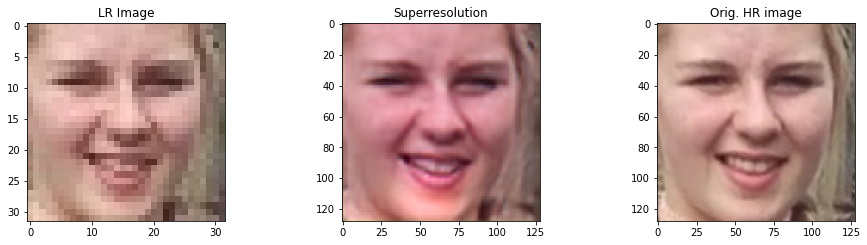

In [ ]:

generator = load_model('gen_e_10.h5', compile=False)


[X1, X2] = [lr_test, hr_test]
# select random example
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]

# generate image from source
gen_image = generator.predict(src_image)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(gen_image[0,:,:,:])
plt.subplot(233)
plt.title('Orig. HR image')
plt.imshow(tar_image[0,:,:,:])
plt.show()

### Version with 20 epochs:

1/1 [==============================] - 1s 657ms/step


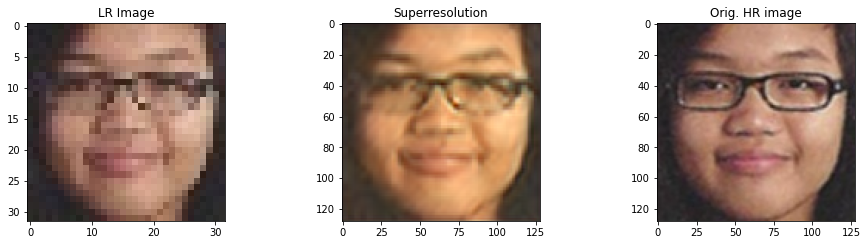

In [ ]:
generator = load_model('gen_e_20.h5', compile=False)


[X1, X2] = [lr_test, hr_test]
# select random example
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]

# generate image from source
gen_image = generator.predict(src_image)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(gen_image[0,:,:,:])
plt.subplot(233)
plt.title('Orig. HR image')
plt.imshow(tar_image[0,:,:,:])
plt.show()

### Version with 30 epochs:

1/1 [==============================] - 1s 665ms/step


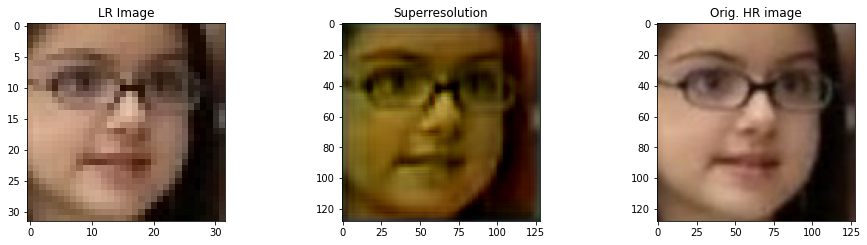

In [ ]:
generator = load_model('gen_e_30.h5', compile=False)


[X1, X2] = [lr_test, hr_test]
# select random example
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]

# generate image from source
gen_image = generator.predict(src_image)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(gen_image[0,:,:,:])
plt.subplot(233)
plt.title('Orig. HR image')
plt.imshow(tar_image[0,:,:,:])
plt.show()

### Version with 40 epochs:

1/1 [==============================] - 1s 706ms/step


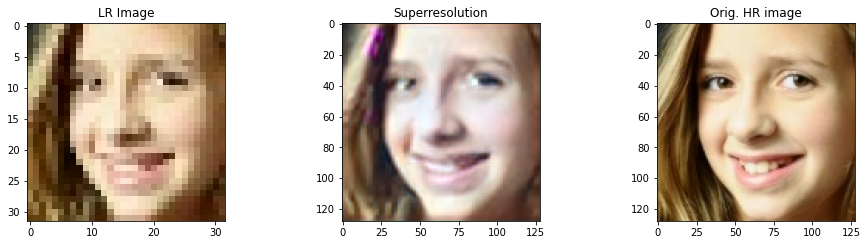

In [ ]:
generator = load_model('gen_e_40.h5', compile=False)


[X1, X2] = [lr_test, hr_test]
# select random example
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]

# generate image from source
gen_image = generator.predict(src_image)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(gen_image[0,:,:,:])
plt.subplot(233)
plt.title('Orig. HR image')
plt.imshow(tar_image[0,:,:,:])
plt.show()

### Version with 50 epochs:

1/1 [==============================] - 1s 692ms/step


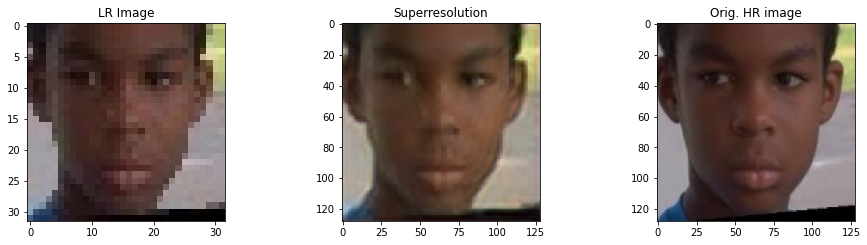

In [ ]:
generator = load_model('gen_e_50.h5', compile=False)


[X1, X2] = [lr_test, hr_test]
# select random example
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]

# generate image from source
gen_image = generator.predict(src_image)

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(gen_image[0,:,:,:])
plt.subplot(233)
plt.title('Orig. HR image')
plt.imshow(tar_image[0,:,:,:])
plt.show()

In [ ]:
print("done!")


done!
